In [ ]:
# pip install finpy_tse

C:\Users\Dell\anaconda3\Lib\site-packages\finpy_tse\__init__.py:424: FutureWarning: The behavior of array concatenation with empty entries is deprecated. In a future version, this will no longer exclude empty items when determining the result dtype. To retain the old behavior, exclude the empty entries before the concat operation.
  df_history = pd.concat([df_history,df_temp])


<Axes: ylabel='VOLUME'>

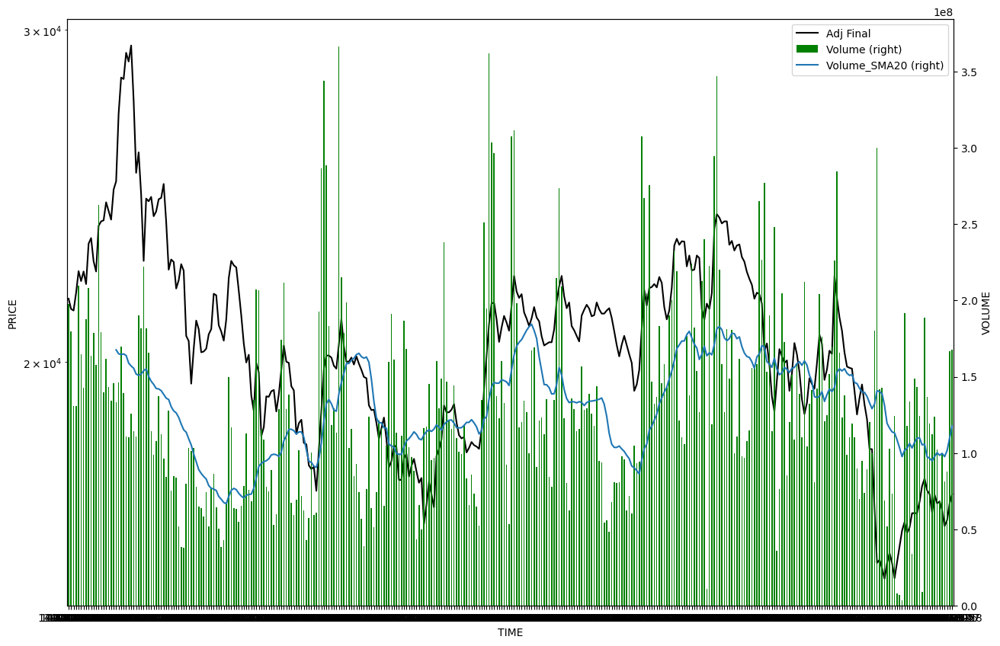

In [2]:
NAME = 'اهرم'
START_DATE='1402-01-05'
END_DATE='1403-09-30'
SAVE_DATA_PRICE = "C://TSE_SALAR/TSE_PRICE.xlsx"
SAVE_DATA_PRICE_SHEET = "قیمت"

def TSETMC_HISTORY_PRICE(NAME, START_DATE, END_DATE, SAVE_DATA_PRICE, SAVE_DATA_PRICE_SHEET):
    # : دریافت سابقه قیمت
    import finpy_tse as fpy
    DATA = fpy.Get_Price_History(
        stock=NAME,
        start_date=START_DATE,
        end_date=END_DATE,
        ignore_date=False,
        adjust_price=True,
        show_weekday=False,
        double_date=False,)
    return DATA

DATA01 = TSETMC_HISTORY_PRICE(NAME, START_DATE, END_DATE, SAVE_DATA_PRICE, SAVE_DATA_PRICE_SHEET)
#قیمت نماد
DATA01.to_excel(SAVE_DATA_PRICE,sheet_name=SAVE_DATA_PRICE_SHEET) 
PRICE = DATA01['Adj Final']
VALUE = DATA01['Value']
PRICE.plot(figsize=(15,10),xlabel='TIME',ylabel='PRICE',logy=True,legend='Price',color='black')
#حجم نماد
VOLUME = DATA01['Volume']
VOLUME.plot.bar(xlabel='TIME',ylabel='VOLUME',secondary_y=True,legend='Volume',color='g')
DATA01['Volume_SMA20'] = VOLUME.rolling(20).mean()
DATA01['Volume_SMA20'].plot(xlabel='TIME',legend='SMA 20',secondary_y=True)

In [ ]:
"""
SAVE_DATA_PRICE_SHEET = "ریزمعاملات"
def TSETMC_HISTORY_RIZ(NAME, START_DATE, END_DATE, SAVE_DATA_PRICE, SAVE_DATA_PRICE_SHEET):
    import finpy_tse as fpy
    DATA = fpy.Get_IntradayTrades_History(
            #دریافت سابقه ریز معاملات
            stock=NAME,
            start_date=START_DATE,
            end_date=END_DATE,
            jalali_date=True,
            combined_datatime=False,
            show_progress=True)
    return DATA
RIZ = TSETMC_HISTORY_RIZ(NAME, START_DATE, END_DATE, SAVE_DATA_PRICE, SAVE_DATA_PRICE_SHEET)
RIZ.to_excel(SAVE_DATA_PRICE,sheet_name=SAVE_DATA_PRICE_SHEET) 
print(RIZ)
PRICE = RIZ['Price']
PRICE.plot(figsize=(15,10),xlabel='TIME',ylabel='PRICE',logy=True,legend='Price',color='black')
#حجم نماد
VOLUME = RIZ['Volume']
VOLUME.plot.bar(xlabel='TIME',ylabel='VOLUME',secondary_y=True,legend='Volume',color='g')
DATA01['Volume_SMA20'] = VOLUME.rolling(20).mean()
DATA01['Volume_SMA20'].plot(xlabel='TIME',legend='SMA 20',secondary_y=True)
"""

In [ ]:
"""
SAVE_DATA_PRICE_SHEET = "عمق بازار"
def TSETMC_HISTORY_OMGH(NAME, START_DATE, END_DATE, SAVE_DATA_PRICE, SAVE_DATA_PRICE_SHEET):
    #دریافت سابقه عمق بازار
    import finpy_tse as fpy
    DATA = fpy.Get_IntradayOB_History(
        stock=NAME,
        start_date=START_DATE,
        end_date=END_DATE,
        jalali_date=True,
        combined_datatime=False,
        show_progress=True)
    return DATA
OMGH = TSETMC_HISTORY_OMGH(NAME, START_DATE, END_DATE, SAVE_DATA_PRICE, SAVE_DATA_PRICE_SHEET)
OMGH.to_excel(SAVE_DATA_PRICE,sheet_name=SAVE_DATA_PRICE_SHEET) 
print(OMGH)
PRICE_SELL = OMGH['Sell_No'] * OMGH['Sell_Vol'] * OMGH['Sell_Price']
PRICE_SELL.plot(figsize=(15,10),xlabel='TIME',ylabel='PRICE_SELL',logy=True,legend='Sell Price',color='black')

PRICE_BUY = OMGH['Buy_No'] * OMGH['Buy_Vol'] * OMGH['Buy_Price']
PRICE_BUY.plot(figsize=(15,10),xlabel='TIME',ylabel='PRICE BUY',logy=True,legend='Buy Price',color='red')
"""

In [ ]:
"""
SAVE_DATA_PRICE_SHEET = "ارزش صف"
def TSETMC_HISTORY_SAF(NAME, START_DATE, END_DATE, SAVE_DATA_PRICE, SAVE_DATA_PRICE_SHEET):
    #سابقه ارزش صف در زمان بسته‌شدن بازار
    import finpy_tse as fpy
    DATA = fpy.Get_Queue_History(
        stock=NAME,
        start_date=START_DATE,
        end_date=END_DATE,
        show_per_capita=True,
        show_weekday=False,
        double_date=False,
        show_progress=True)
    return DATA
SAF = TSETMC_HISTORY_SAF(NAME, START_DATE, END_DATE, SAVE_DATA_PRICE, SAVE_DATA_PRICE_SHEET)
DATA01.to_excel(SAVE_DATA_PRICE,sheet_name=SAVE_DATA_PRICE_SHEET) 
print(SAF)
"""

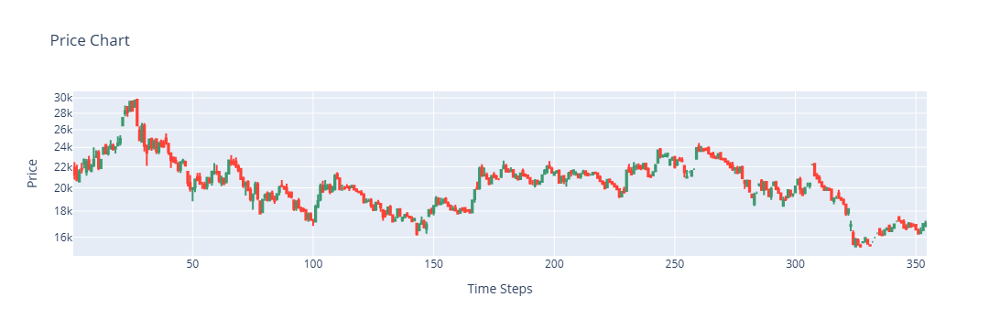

In [3]:
def plot_trade_chart_PLOTLY(df, XLABEL, YLABEL, TITLE):
    import pandas as pd
    import numpy as np
    import plotly.graph_objects as go
    """
    Plots a combined candlestick chart with volume bars.

    Args:
        df (pd.DataFrame): Trade data with columns 'Date', 'Open', 'High', 'Low', 'Close', and 'Volume'.

    Returns:
        None (displays the plot)
    """
    fig = go.Figure(data=[go.Candlestick(x=np.arange(1, len(df['Open']) + 1),
                    open=df['Open'], high=df['High'],
                    low=df['Low'], close=df['Close'])#df['Date']
                         ])
        # Update the layout of the figure
    fig.update_layout(
        title=TITLE,
        xaxis_title= XLABEL,
        yaxis_title= YLABEL,
        yaxis_type='log',
        xaxis_rangeslider_visible=False
    )
    fig.show()

# Example usage:
DFF = DATA01
plot_trade_chart_PLOTLY(DFF, XLABEL='Time Steps', YLABEL='Price', TITLE='Price Chart',)


In [ ]:
def plot_multi_chart_PLOTLY(x, xlabel, y1, y1label, y2, y2label, y3, y3label, y4, y4label, Z):
    import pandas as pd
    import plotly.express as px
    # Create a DataFrame with your data (replace with your actual data)
    df = pd.DataFrame({
        'x': x,
        'y1': y1,
        'y2': y2,
        'y3': y3,
        'y4': y4
    })

    # Create a line plot with multiple lines
    fig = px.line(df, x='x', y=['y1', 'y2', 'y3', 'y4'][:Z], labels={'x': xlabel})
    fig.update_layout(title=f"{y1label}, {y2label}, {y3label}, {y4label} - Time Series Plot")
    fig.show()
    
# Example usage:
import numpy as np
# Replace the following placeholders with your actual data
x = [1, 2, 3, 4, 5]  # Example x-axis data
y1, y2, y3, y4 = np.random.rand(4, 5)  # Example random data
xlabel = "X-axis Label"
y1label, y2label, y3label, y4label = "Y1 Label", "Y2 Label", "Y3 Label", "Y4 Label"
Z = 4  # Number of lines to plot (adjust as needed)

plot_multi_chart_PLOTLY(x, xlabel, y1, y1label, y2, y2label, y3, y3label, y4, y4label, Z)    

In [4]:
def PLOTLY_PLOT(price_path, XLABEL='Time Steps', YLABEL='Price', TITLE='Brownian Motion - Asset Price Simulation', COLOR='black'):
    import plotly.graph_objs as go
    # Create a Plotly figure
    fig = go.Figure()
    # Add the price path to the figure
    fig.add_trace(go.Scatter(y=price_path, mode='lines', name='Asset Price',line=dict(color=COLOR)))

    # Update the layout of the figure
    fig.update_layout(
        title=TITLE,
        xaxis_title= XLABEL,
        yaxis_title= YLABEL,
        yaxis_type='log',
        showlegend=True
    )

    # Show the figure
    fig.show()

def HISTOGRAM_BOXPLOT_PLOTLY( DATA, XLABEL='X', TITLE='A', COLOR='cyan'):
    # Plotting histogram and boxplot
    import plotly.express as px
    fig = px.histogram(x=DATA, marginal="box", color_discrete_sequence=[COLOR])
    fig.update_layout(title=TITLE, xaxis_title=XLABEL, yaxis_title="Frequency")
    fig.show()
    #fig = px.ecdf(irr, title=TITLE)
    #fig.show()   

C:\Users\Dell\AppData\Local\Temp\ipykernel_2136\2188270682.py:6: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

C:\Users\Dell\AppData\Local\Temp\ipykernel_2136\2188270682.py:253: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

C:\Users\Dell\AppData\Local\Temp\ipykernel_2136\2188270682.py:120: RuntimeWarning:

divide by zero encountered in divide

C:\Users\Dell\AppData\Local\Temp\ipykernel_2136\2188270682.py:149: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position

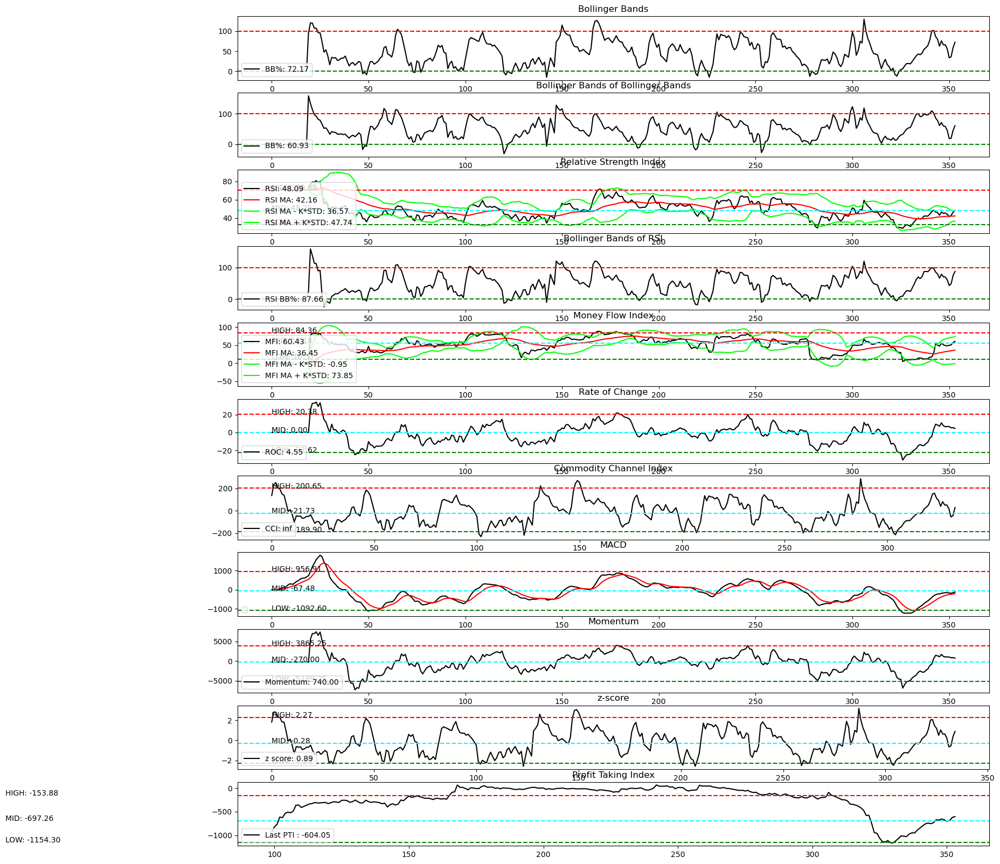

In [5]:
import numpy as np
import matplotlib.pyplot as plt
def ROC(data):# calculate rate of change
    roc = [0]
    for i in range(1, len(data)):
        roc.append((data[i] - data[i-1]) / data[i-1]) 
    return 100*roc

prices = PRICE
changes = ROC(prices)

###########################################################################
##############  RSI Indictor 

def RSI_INDICATOR(prices, periods, ma_period, k):
    import numpy as np
    # Calculate the price changes
    changes = np.diff(prices)
    
    # Separate the positive and negative changes
    gains = np.where(changes > 0, changes, 0)
    losses = np.where(changes < 0, -changes, 0)
    
    # Calculate the exponential moving averages of gains and losses
    avg_gain = np.empty(len(prices))
    avg_loss = np.empty(len(prices))
    
    avg_gain[:periods] = np.mean(gains[:periods-1])
    avg_loss[:periods] = np.mean(losses[:periods-1])
    
    for i in range(periods, len(prices)):
        avg_gain[i] = (avg_gain[i-1]*(periods-1) + gains[i-1])/periods
        avg_loss[i] = (avg_loss[i-1]*(periods-1) + losses[i-1])/periods
    
    
    # Calculate the RSI
    rsi = 100 * (avg_gain / (avg_gain + avg_loss))
    rsi_ma = np.empty(len(prices))
    rsi_std = np.empty(len(prices))
    lower_band = np.empty(len(prices))
    upper_band = np.empty(len(prices))
    ratio = np.empty(len(prices))
    rsi_ma[:periods] = np.mean(rsi[:periods-1])
    rsi_std[:periods] = np.std(rsi[:periods-1])
    for i in range(periods, len(prices)):# moving average of rsi
        rsi_ma[i] = ( rsi_ma[i-1]*(periods-1) + rsi[i-1])/periods
        rsi_std[i] = np.std(rsi[i-periods+1:i+1])
        
    lower_band = rsi_ma - k * rsi_std
    upper_band = rsi_ma + k * rsi_std
    
    for i in range(periods + ma_period, len(prices)):
        ratio[i] = (rsi[i] - lower_band[i]) / (upper_band[i] - lower_band[i])
     
    return rsi, rsi_ma, lower_band, upper_band, ratio


##############  MFI Indictor 

def MFI_INDICATOR(prices, volume, periods, ma_period, k):
    import numpy as np
    # Calculate the raw money flows
    cf = np.diff(prices) * volume[1:]
    # Calculate the positive and negative money flows
    pcf = np.where(cf > 0, cf, 0)
    ncf = np.where(cf < 0, -cf, 0)
    
    # Calculate the money flow ratios
    money_flow_ratio = np.empty(len(prices))
    positive_sum = np.empty(len(prices))
    negative_sum = np.empty(len(prices))
    for i in range(periods-1, len(prices)-1):
        positive_sum = np.sum(pcf[i-periods+1:i+1])
        negative_sum = np.sum(ncf[i-periods+1:i+1])
        if negative_sum == 0:
            money_flow_ratio[i+1] = np.inf
        else:
            money_flow_ratio[i+1] = positive_sum / negative_sum

    # Calculate the MFI
    mfi = 100 * (money_flow_ratio / (1 + money_flow_ratio))

    # Calculate the moving average and standard deviation of MFI
    mfi_ma = np.empty(len(prices))
    mfi_std = np.empty(len(prices))

    mfi_ma[:periods] = np.mean(mfi[:periods-1])
    mfi_std[:periods] = np.std(mfi[:periods-1])

    for i in range(periods, len(prices)):
        mfi_ma[i] = (mfi_ma[i-1]*(periods-1) + mfi[i-1])/periods
        mfi_std[i] = np.std(mfi[i-periods+1:i+1])
        
    # Calculate the lower and upper bands
    lower_band = mfi_ma - k * mfi_std
    upper_band = mfi_ma + k * mfi_std

    # Calculate the ratio
    ratio = np.empty(len(prices))

    for i in range(periods + ma_period, len(prices)):
        ratio[i] = (mfi[i] - lower_band[i]) / (upper_band[i] - lower_band[i])
     
    return mfi, mfi_ma, lower_band, upper_band, ratio

##############  cci indictor 

def CCI_INDICATOR(prices, period):
    import numpy as np
    prices = np.array(prices).reshape(-1, 1)
    # Calculate the typical price
    tp = np.mean(prices, axis=1)
    # Calculate the moving average of the typical price
    ma = np.convolve(tp, np.ones(period)/period, mode='valid')
    # Calculate the mean deviation
    md = np.zeros_like(ma)
    for i in range(period, len(tp)):
        md[i-period] = np.mean(np.abs(tp[i-period:i] - ma[i-period]))
    # Calculate the CCI
    cci = (tp[period-1:] - ma) / (0.015 * md)
    return cci


##############  bollinger bands indictor 

def Bollinger_Bands(prices, periods, k):
    import numpy as np
    # Calculate the simple moving average
    sma = np.convolve(prices, np.ones(periods)/periods, mode='valid')
    
    # Calculate the standard deviation
    std = np.std(prices[:periods-1])
    
    # Initialize the upper and lower bands
    ma_band = np.empty(len(prices))
    upper_band = np.empty(len(prices))
    lower_band = np.empty(len(prices))
    
    ma_band[:periods-1] = sma[0]
    upper_band[:periods-1] = sma[0] + k*std
    lower_band[:periods-1] = sma[0] - k*std
    ratio = np.zeros(len(prices))
    # Update the bands for each period
    for i in range(periods-1, len(prices)):
        std = np.std(prices[i-periods+1:i+1])
        ma_band[i] = sma[i-periods+1]
        upper_band[i] = sma[i-periods+1] + k*std
        lower_band[i] = sma[i-periods+1] - k*std
        ratio[i] = (prices[i] - lower_band[i]) / (upper_band[i] - lower_band[i])
    
    return ma_band, upper_band, lower_band, ratio

############## MACD indictor

def MACD(prices, short_period, long_period, signal_period):
    import numpy as np
    import pandas as pd # added this line
    short_ema = pd.Series(prices).ewm(span=short_period, adjust=False).mean() # changed this line
    long_ema = pd.Series(prices).ewm(span=long_period, adjust=False).mean() # changed this line
    macd_line = short_ema - long_ema
    signal_line = macd_line.ewm(span=signal_period, adjust=False).mean()
    macd_line = np.array(macd_line)# change array pandas to numpy
    signal_line = np.array(signal_line)# change array pandas to numpy
    return macd_line, signal_line

############## Momentum indictor
"""
def Momentum(changes, period):
    momentum = []
    for i in range(len(changes)):
        if i < period:
            momentum.append(0)
        else:
            momentum.append(sum(changes[i-period+1:i+1]))
    momentum = np.array(momentum)        
    return momentum
"""
def Momentum(prices, period):
    momentum = []
    for i in range(len(prices)):
        if i < period:
            momentum.append(prices[1] - prices[0])
        else:
            momentum.append(prices[i] - prices[i-period])
    momentum = np.array(momentum)        
    return momentum


##############  roc indictor 

def ROC_INDICATOR(prices, period):
    import numpy as np
    roc = np.zeros(len(prices))
    for i in range(period, len(prices)):
        roc[i] = (prices[i] - prices[i-period]) / prices[i-period]
    return roc

##############  z-score Indicator
# Calculate z-score function for period
def Z_Score_Indicator(x, period):
    # Ensure x is a numpy array
    x = np.array(x)
    # Initialize an empty list to store z-scores
    z_scores = []

    # Loop over the array to calculate the rolling mean and standard deviation
    for i in range(period - 1, len(x)):
        # Define the rolling window
        window = x[i - period + 1:i + 1]
        # Calculate mean and standard deviation of the window
        mean = np.mean(window)
        std = np.std(window)
        # Calculate the z-score and append to the list
        # Check if std is not zero to avoid division by zero
        if std != 0:
            z_score = (x[i] - mean) / std
            z_scores.append(z_score)
        else:
            # If std is zero, append 0 as the z-score
            z_scores.append(0)

    # Convert the list of z-scores to a numpy array
    z_scores = np.array(z_scores)
    return z_scores

##############  Profit Taking Index (PTI) is a technical indicator

import pandas as pd
# Define a function to calculate the Donchian Channel
def donchian_channel(data, window):
    # Calculate the upper and lower bands
    upper = data.rolling(window).max()
    lower = data.rolling(window).min()
    # Calculate the channel width
    width = upper - lower
    # Return the upper, lower, and width as a DataFrame
    return pd.DataFrame({'upper': upper, 'lower': lower, 'width': width})

# Define a function to calculate the Profit Taking Index
def profit_taking_index(data, window):
    # Calculate the Donchian Channel for the data
    dc = donchian_channel(data, window)
    # Initialize an empty list to store the PTI values
    pti = []
    # Loop through the data
    for i in range(len(data)):
        # If the current index is less than the window size, append None
        if i < window:
            pti.append(None)
        # Otherwise, calculate the PTI
        else:
            # Get the current price
            price = data[i]
            # Get the previous window prices
            prev_prices = data[i-window:i]
            # Get the previous window Donchian Channel values
            prev_dc = dc[i-window:i]
            # Calculate the area of Wave A
            area_a = np.trapz(prev_prices - prev_dc['lower'])
            # Calculate the area of Wave B
            area_b = np.trapz(price - prev_dc['upper'])
            # Calculate the PTI
            pti_value = (area_b / area_a) * 100
            # Append the PTI value to the list
            pti.append(pti_value)
    # Return the PTI values as a Series
    return pd.Series(pti, index=data.index, name='pti')




# Calculate the PTI
pti_period = 50
pti = profit_taking_index(DATA01['Adj Close'], window = pti_period)



# Calculate the  RSI and MFI and bollinger bands and Roc and MACD and Momentum
rsi, rsi_ma, rsi_lower_band, rsi_upper_band, rsi_ratio = RSI_INDICATOR(prices, 20, 20, 2)
rsi_low = np.quantile(rsi, 0.025)
rsi_mid = np.quantile(rsi, 0.50)
rsi_high = np.quantile(rsi, 0.975)

mfi, mfi_ma, mfi_lower_band, mfi_upper_band, mfi_ratio = MFI_INDICATOR(PRICE, VOLUME, 20, 20, 2)
mfi_low = np.quantile(mfi[20:], 0.025)
mfi_mid = np.quantile(mfi[20:], 0.50)
mfi_high = np.quantile(mfi[20:], 0.975)

cci = CCI_INDICATOR(prices, 20)
cci_low = np.quantile(cci, 0.025)
cci_mid = np.quantile(cci, 0.50)
cci_high = np.quantile(cci, 0.975)

ma_band, upper_band, lower_band, bb_ratio = Bollinger_Bands(prices, 20, 2)
ma_band02, upper_band02, lower_band02, bb_ratio02 = Bollinger_Bands(bb_ratio, 20, 2)

_, _, _, bb_rsi_ratio = Bollinger_Bands(rsi, 20, 2)


roc = 100*ROC_INDICATOR(prices, 20)
roc_low = np.quantile(roc, 0.025)
roc_mid = np.quantile(roc, 0.50)
roc_high = np.quantile(roc, 0.975)
roc_ratio = (roc[-1] - roc_low) / (roc_high - roc_low)

macd_line, signal_line = MACD(prices, 12, 26, 9)
macd = macd_line; 
macd_low = np.quantile(macd, 0.025)
macd_mid = np.quantile(macd, .50)
macd_high = np.quantile(macd, 0.975)
macd_ratio = (macd_line[-1] - macd_low) / (macd_high - macd_low)


mom = Momentum(prices, 20)
mom_low = np.quantile(mom, 0.025)
mom_mid = np.quantile(mom, 0.50)
mom_high = np.quantile(mom, 0.975)
mom_ratio = (mom[-1] - mom_low) / (mom_high - mom_low)

z_score = Z_Score_Indicator(prices, period = 20)
z_score_low = np.quantile(z_score, 0.025)
z_score_mid = np.quantile(z_score, 0.50)
z_score_high = np.quantile(z_score, 0.975)

pti_low = np.quantile(pti[-pti_period:], 0.025)
pti_mid = np.quantile(pti[-pti_period:], 0.50)
pti_high = np.quantile(pti[-pti_period:], 0.975)
# Plot the datas
plt.figure(figsize=(18,20))
#plt.style.use('dark_background')
plt.subplot(11,1,1)
plt.plot(100*bb_ratio, label=f'BB%: {100*bb_ratio[-1]:.2f}', color='black')
plt.axhline(100, color='red', linestyle='--')
plt.axhline(0, color='green', linestyle='--')
plt.legend(loc="lower left")
plt.title('Bollinger Bands')

plt.subplot(11,1,2)
plt.plot(100*bb_ratio02, label=f'BB%: {100*bb_ratio02[-1]:.2f}', color='black')
plt.axhline(100, color='red', linestyle='--')
plt.axhline(0, color='green', linestyle='--')
plt.legend(loc="lower left")
plt.title('Bollinger Bands of Bollinger Bands')
"""
plt.plot(prices, label='Price', color='black')
plt.plot(ma_band, label='ma', color='red')
plt.plot(upper_band, label='Upper band', color='orange')
plt.plot(lower_band, label='Lower band', color='orange')
"""

plt.subplot(11,1,3)
plt.plot(rsi, label=f'RSI: {rsi[-1]:.2f}', color='black')
plt.plot(rsi_ma, label=f'RSI MA: {rsi_ma[-1]:.2f}', color='red')
plt.plot(rsi_lower_band, label=f'RSI MA - K*STD: {rsi_lower_band[-1]:.2f}', color='lime')
plt.plot(rsi_upper_band, label=f'RSI MA + K*STD: {rsi_upper_band[-1]:.2f}', color='lime')
plt.axhline(rsi_low, color='green', linestyle='--')
plt.axhline(rsi_mid, color='cyan', linestyle='--')
plt.axhline(rsi_high, color='red', linestyle='--')
plt.text(0, rsi_low, f"LOW: {rsi_low:.2f}") # write the equation of the line on the plot
plt.text(0, rsi_mid, f"MID: {rsi_mid:.2f}") # write the equation of the line on the plot
plt.text(0, rsi_high, f"HIGH: {rsi_high:.2f}") # write the equation of the line on the plot
plt.title('Relative Strength Index')
plt.legend(loc="lower left")

plt.subplot(11,1,4)
plt.plot(100*bb_rsi_ratio, label=f'RSI BB%: {100*bb_rsi_ratio[-1]:.2f}', color='black')
plt.axhline(100, color='red', linestyle='--')
plt.axhline(0, color='green', linestyle='--')
plt.legend(loc="lower left")
plt.title('Bollinger Bands of RSI')

plt.subplot(11,1,5)
plt.plot(mfi, label=f'MFI: {mfi[-1]:.2f}', color='black')
plt.plot(mfi_ma, label=f'MFI MA: {mfi_ma[-1]:.2f}', color='red')
plt.plot(mfi_lower_band, label=f'MFI MA - K*STD: {mfi_lower_band[-1]:.2f}', color='lime')
plt.plot(mfi_upper_band, label=f'MFI MA + K*STD: {mfi_upper_band[-1]:.2f}', color='lime')
plt.axhline(mfi_low, color='green', linestyle='--')
plt.axhline(mfi_mid, color='cyan', linestyle='--')
plt.axhline(mfi_high, color='red', linestyle='--')
plt.text(0, mfi_low, f"LOW: {mfi_low:.2f}") # write the equation of the line on the plot
plt.text(0, mfi_mid, f"MID: {mfi_mid:.2f}") # write the equation of the line on the plot
plt.text(0, mfi_high, f"HIGH: {mfi_high:.2f}") # write the equation of the line on the plot
plt.title('Money Flow Index')
plt.legend(loc="lower left")


plt.subplot(11,1,6)
plt.plot(roc, color="black", label=f"ROC: {roc[-1]:.2f}")
plt.axhline(roc_low, color='green', linestyle='--')
plt.axhline(roc_mid, color='cyan', linestyle='--')
plt.axhline(roc_high, color='red', linestyle='--')
plt.text(0, roc_low, f"LOW: {roc_low:.2f}") # write the equation of the line on the plot
plt.text(0, roc_mid, f"MID: {roc_mid:.2f}") # write the equation of the line on the plot
plt.text(0, roc_high, f"HIGH: {roc_high:.2f}") # write the equation of the line on the plot
plt.title("Rate of Change")
plt.legend(loc="lower left")

plt.subplot(11,1,7)
plt.plot(cci, color="black", label=f"CCI: {cci[-1]:.2f}")
plt.axhline(cci_low, color='green', linestyle='--')
plt.axhline(cci_mid, color='cyan', linestyle='--')
plt.axhline(cci_high, color='red', linestyle='--')
plt.text(0, cci_low, f"LOW: {cci_low:.2f}") # write the equation of the line on the plot
plt.text(0, cci_mid, f"MID: {cci_mid:.2f}") # write the equation of the line on the plot
plt.text(0, cci_high, f"HIGH: {cci_high:.2f}") # write the equation of the line on the plot
plt.title("Commodity Channel Index")
plt.legend(loc="lower left")

plt.subplot(11,1,8)
plt.plot(macd_line, color="black")
plt.plot(signal_line, color="red")
plt.axhline(macd_low, color='green', linestyle='--')
plt.axhline(macd_mid, color='cyan', linestyle='--')
plt.axhline(macd_high, color='red', linestyle='--')
plt.text(0, macd_low, f"LOW: {macd_low:.2f}") # write the equation of the line on the plot
plt.text(0, macd_mid, f"MID: {macd_mid:.2f}") # write the equation of the line on the plot
plt.text(0, macd_high, f"HIGH: {macd_high:.2f}") # write the equation of the line on the plot
plt.title(f"MACD")
plt.legend(loc="lower left")

plt.subplot(11,1,9)
plt.plot(mom, color="black", label=f"Momentum: {mom[-1]:.2f}")
plt.axhline(mom_low, color='green', linestyle='--')
plt.axhline(mom_mid, color='cyan', linestyle='--')
plt.axhline(mom_high, color='red', linestyle='--')
plt.text(0, mom_low, f"LOW: {mom_low:.2f}") # write the equation of the line on the plot
plt.text(0, mom_mid, f"MID: {mom_mid:.2f}") # write the equation of the line on the plot
plt.text(0, mom_high, f"HIGH: {mom_high:.2f}") # write the equation of the line on the plot
plt.title("Momentum")
plt.legend(loc="lower left")

plt.subplot(11,1,10)
plt.plot(np.arange(len(z_score)), z_score, color="black", label=f"z score: {z_score[-1]:.2f}")
plt.axhline(z_score_low, color='green', linestyle='--')
plt.axhline(z_score_mid, color='cyan', linestyle='--')
plt.axhline(z_score_high, color='red', linestyle='--')
plt.text(0, z_score_low, f"LOW: {z_score_low:.2f}") # write the equation of the line on the plot
plt.text(0, z_score_mid, f"MID: {z_score_mid:.2f}") # write the equation of the line on the plot
plt.text(0, z_score_high, f"HIGH: {z_score_high:.2f}") # write the equation of the line on the plot
plt.title("z-score")
plt.legend(loc="lower left")

plt.subplot(11,1,11)
plt.plot(np.arange(len(pti)), pti, color='black', label=f"Last PTI : {pti[-1]:.2f}")
plt.title('Profit Taking Index')
plt.axhline(pti_low, color='green', linestyle='--')
plt.axhline(pti_mid, color='cyan', linestyle='--')
plt.axhline(pti_high, color='red', linestyle='--')
plt.text(0, pti_low, f"LOW: {pti_low:.2f}") # write the equation of the line on the plot
plt.text(0, pti_mid, f"MID: {pti_mid:.2f}") # write the equation of the line on the plot
plt.text(0, pti_high, f"HIGH: {pti_high:.2f}") # write the equation of the line on the plot
plt.legend(loc="lower left")

plt.show()

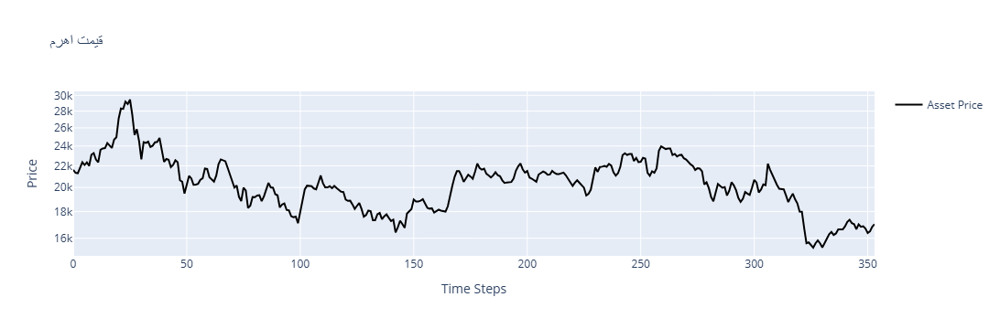

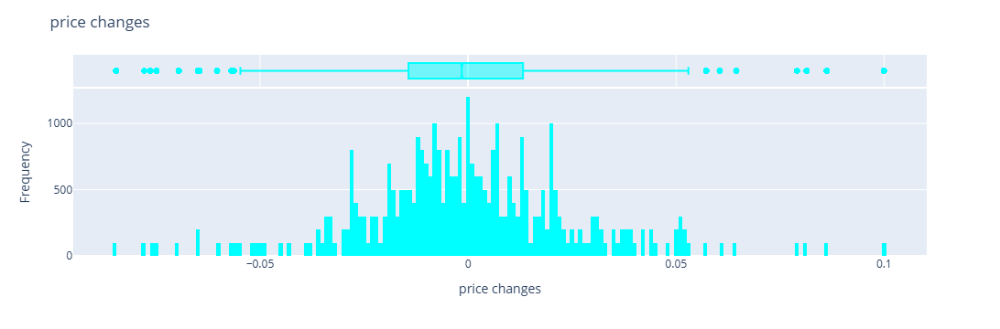

In [6]:
PLOTLY_PLOT(prices, XLABEL='Time Steps', YLABEL='Price', TITLE=f'قیمت {NAME}')
HISTOGRAM_BOXPLOT_PLOTLY(changes, XLABEL='price changes', TITLE='price changes', COLOR='cyan')

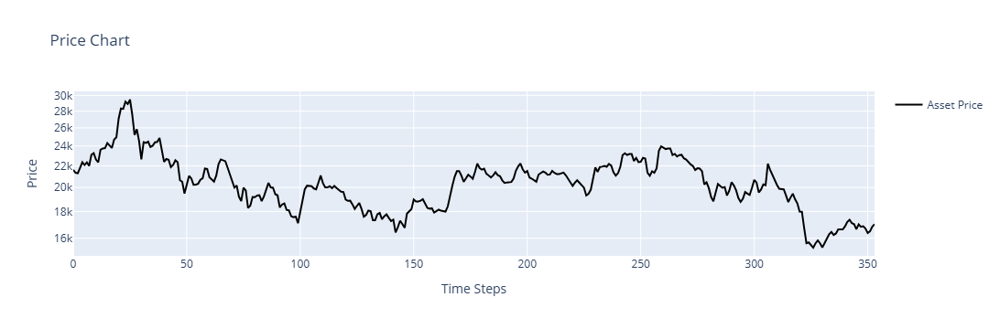

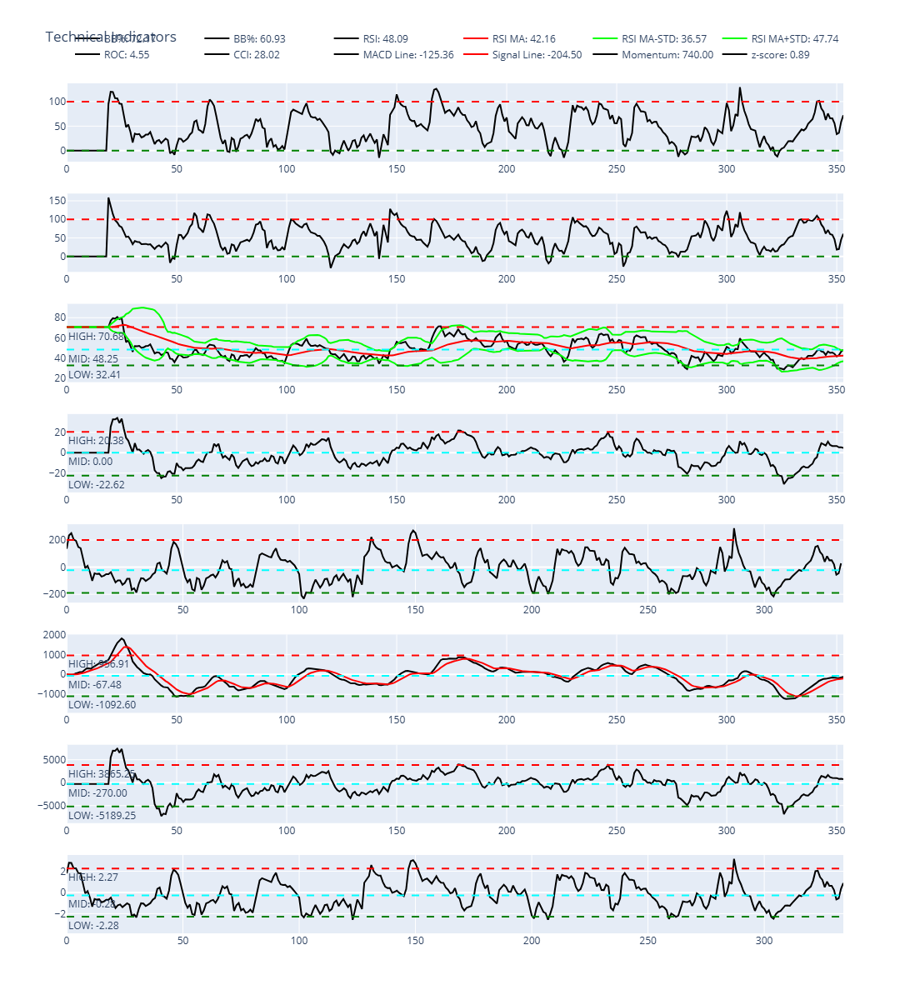

In [7]:
PLOTLY_PLOT(prices, XLABEL='Time Steps', YLABEL='Price', TITLE='Price Chart')

import plotly.graph_objs as go
from plotly.subplots import make_subplots

LL =np.arange(len(prices))# Length of Prices

# Assuming 'ratio' is a list or a Pandas Series
ratio_data = 100 * bb_ratio
ratio02_data = 100 * bb_ratio02

# Create a subplot figure
# BB% plot
# Create subplots
fig = make_subplots(rows=8, cols=1)
# Add Bollinger Bands percentage trace
fig.add_trace(go.Scatter(y=ratio_data,name=f'BB%: {ratio_data[-1]:.2f}',line=dict(color='black')),row=1, col=1)
fig.add_hline(y=100, line=dict(color='red', dash='dash'), row=1, col=1)
fig.add_hline(y=0, line=dict(color='green', dash='dash'), row=1, col=1)
fig.update_layout(title='Bollinger Bands',legend=dict(orientation="h", yanchor="bottom", y=1.02, xanchor="right", x=1))

# Add Bollinger Bands percentage trace
fig.add_trace(go.Scatter(y=ratio02_data,name=f'BB%: {ratio02_data[-1]:.2f}',line=dict(color='black')),row=2, col=1)
fig.add_hline(y=100, line=dict(color='red', dash='dash'), row=2, col=1)
fig.add_hline(y=0, line=dict(color='green', dash='dash'), row=2, col=1)
fig.update_layout(title='Bollinger Bands of Bollinger Bands',legend=dict(orientation="h", yanchor="bottom", y=1.02, xanchor="right", x=1))


# RSI plot
#fig = make_subplots(rows=2, cols=1)
fig.add_trace(go.Scatter(x=LL, y=rsi, mode='lines', name=f'RSI: {rsi[-1]:.2f}', line=dict(color='black')), row=3, col=1)
fig.add_trace(go.Scatter(x=LL, y=rsi_ma, mode='lines', name=f'RSI MA: {rsi_ma[-1]:.2f}', line=dict(color='red')), row=3, col=1)
fig.add_trace(go.Scatter(x=LL, y=rsi_lower_band, mode='lines', name=f'RSI MA-STD: {rsi_lower_band[-1]:.2f}', line=dict(color='lime')), row=3, col=1)
fig.add_trace(go.Scatter(x=LL, y=rsi_upper_band, mode='lines', name=f'RSI MA+STD: {rsi_upper_band[-1]:.2f}', line=dict(color='lime')), row=3, col=1)
fig.add_hline(y=rsi_low, line=dict(color='green', dash='dash'), row=3, col=1, annotation_text=f"LOW: {rsi_low:.2f}", annotation_position="bottom left")
fig.add_hline(y=rsi_mid, line=dict(color='cyan', dash='dash'), row=3, col=1, annotation_text=f"MID: {rsi_mid:.2f}", annotation_position="bottom left")
fig.add_hline(y=rsi_high, line=dict(color='red', dash='dash'), row=3, col=1, annotation_text=f"HIGH: {rsi_high:.2f}", annotation_position="bottom left")

# ROC plot
#fig = make_subplots(rows=3, cols=1)
fig.add_trace(go.Scatter(x=LL, y=roc, mode='lines', name=f'ROC: {roc[-1]:.2f}', line=dict(color='black')), row=4, col=1)
fig.add_hline(y=roc_low, line=dict(color='green', dash='dash'), row=4, col=1, annotation_text=f"LOW: {roc_low:.2f}", annotation_position="bottom left")
fig.add_hline(y=roc_mid, line=dict(color='cyan', dash='dash'), row=4, col=1, annotation_text=f"MID: {roc_mid:.2f}", annotation_position="bottom left")
fig.add_hline(y=roc_high, line=dict(color='red', dash='dash'), row=4, col=1, annotation_text=f"HIGH: {roc_high:.2f}", annotation_position="bottom left")

# CCI plot
#fig = make_subplots(rows=4, cols=1)
fig.add_trace(go.Scatter(x=LL, y=cci, mode='lines', name=f'CCI: {cci[len(cci)-2]:.2f}', line=dict(color='black')), row=5, col=1)
fig.add_hline(y=cci_low, line=dict(color='green', dash='dash'), row=5, col=1)
fig.add_hline(y=cci_mid, line=dict(color='cyan', dash='dash'), row=5, col=1)
fig.add_hline(y=cci_high, line=dict(color='red', dash='dash'), row=5, col=1)

# MACD plot
#fig = make_subplots(rows=5, cols=1)
fig.add_trace(go.Scatter(x=LL, y=macd_line, mode='lines', name=f'MACD Line: {macd_line[-1]:.2f}', line=dict(color='black')), row=6, col=1)
fig.add_trace(go.Scatter(x=LL, y=signal_line, mode='lines', name=f'Signal Line: {signal_line[-1]:.2f}', line=dict(color='red')), row=6, col=1)
fig.add_hline(y=macd_low, line=dict(color='green', dash='dash'), row=6, col=1, annotation_text=f"LOW: {macd_low:.2f}", annotation_position="bottom left")
fig.add_hline(y=macd_mid, line=dict(color='cyan', dash='dash'), row=6, col=1, annotation_text=f"MID: {macd_mid:.2f}", annotation_position="bottom left")
fig.add_hline(y=macd_high, line=dict(color='red', dash='dash'), row=6, col=1, annotation_text=f"HIGH: {macd_high:.2f}", annotation_position="bottom left")

# Momentum plot
#fig = make_subplots(rows=6, cols=1)
fig.add_trace(go.Scatter(x=LL, y=mom, mode='lines', name=f'Momentum: {mom[-1]:.2f}', line=dict(color='black')), row=7, col=1)
fig.add_hline(y=mom_low, line=dict(color='green', dash='dash'), row=7, col=1,annotation_text=f"LOW: {mom_low:.2f}", annotation_position="bottom left")
fig.add_hline(y=mom_mid, line=dict(color='cyan', dash='dash'), row=7, col=1,annotation_text=f"MID: {mom_mid:.2f}", annotation_position="bottom left")
fig.add_hline(y=mom_high, line=dict(color='red', dash='dash'), row=7, col=1,annotation_text=f"HIGH: {mom_high:.2f}", annotation_position="bottom left")

# Z-score plot
#fig = make_subplots(rows=7, cols=1)
# Add z-score trace
fig.add_trace(go.Scatter(x=LL,y=z_score,mode='lines',name=f'z-score: {z_score[-1]:.2f}',line=dict(color='black')),row=8, col=1)
fig.add_hline(y=z_score_low, line=dict(color='green', dash='dash'), row=8, col=1, annotation_text=f"LOW: {z_score_low:.2f}", annotation_position="bottom left")
fig.add_hline(y=z_score_mid, line=dict(color='cyan', dash='dash'), row=8, col=1, annotation_text=f"MID: {z_score_mid:.2f}", annotation_position="bottom left")
fig.add_hline(y=z_score_high, line=dict(color='red', dash='dash'), row=8, col=1, annotation_text=f"HIGH: {z_score_high:.2f}", annotation_position="bottom left")

fig.update_layout(title='z score',showlegend=True,legend=dict(orientation="h", yanchor="bottom", y=1.02, xanchor="right", x=1))

# Update layout
fig.update_layout(height=1200, title_text="Technical Indicators")
fig.show()


C:\Users\Dell\anaconda3\Lib\site-packages\finpy_tse\__init__.py:652: FutureWarning:

The behavior of array concatenation with empty entries is deprecated. In a future version, this will no longer exclude empty items when determining the result dtype. To retain the old behavior, exclude the empty entries before the concat operation.



<Axes: xlabel='TIME'>

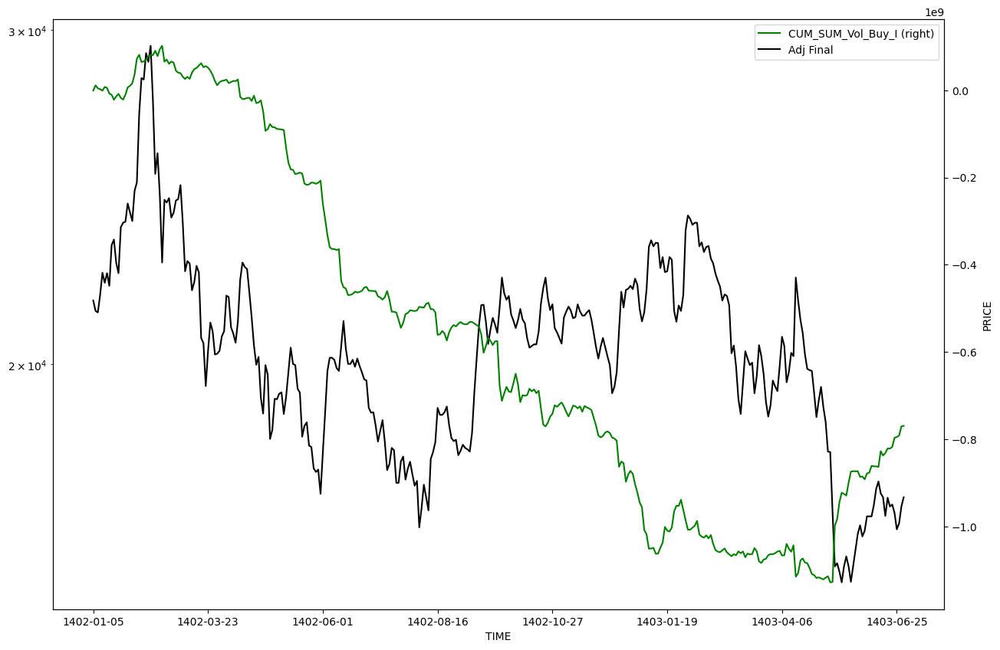

In [8]:
SAVE_DATA_N_I="C://TSE_SALAR/TSE_N_I.xlsx"
SAVE_DATA_N_I_SHEET='حقیقی و حقوقی'

def TSETMC_HISTORY_RI(NAME, START_DATE, END_DATE, SAVE_DATA_N_I, SAVE_DATA_N_I_SHEET):
    import finpy_tse as fpy
    # : دریافت سابقه حقیقی-حقوقی
    DATA =fpy.Get_RI_History(
        stock=NAME,
        start_date=START_DATE,
        end_date=END_DATE,
        ignore_date=False,
        show_weekday=False,
        double_date=False,
        alt=True)
    return DATA

DATA02 = TSETMC_HISTORY_RI(NAME, START_DATE, END_DATE, SAVE_DATA_N_I, SAVE_DATA_N_I_SHEET)
DATA02.to_excel(SAVE_DATA_N_I,sheet_name=SAVE_DATA_N_I_SHEET) 
#حجم تجمعی خرید حالص حقوقی
DATA02['Vol_Buy_I'] = DATA02['Vol_Buy_I']-DATA02['Vol_Sell_I']
DATA02['CUM_SUM_Vol_Buy_I'] = DATA02['Vol_Buy_I'].cumsum()
DATA02.to_excel(SAVE_DATA_N_I,sheet_name=SAVE_DATA_N_I_SHEET) 
DATA02['CUM_SUM_Vol_Buy_I'].plot(figsize=(15,10),xlabel='TIME',ylabel='CUM_BUY_I',secondary_y=True, style='-g',legend='CUM_SUM_Vol_Buy_I')
#قیمت نماد
#DATA01.to_excel("F:NORI_PRICE.xlsx",sheet_name='قیمت') 
DATA01['Adj Final'].plot(xlabel='TIME',ylabel='PRICE',logy=True,color='black',legend='Price')

J-Date
1402-01-05    0.041799
1402-01-06    0.040476
1402-01-07    0.042059
1402-01-08    0.042423
1402-01-09    0.041381
                ...   
1403-06-24    0.027867
1403-06-25    0.027524
1403-06-26    0.027783
1403-06-27    0.028531
1403-06-28    0.028750
Length: 354, dtype: float64


<Axes: ylabel='PRICE2DOLLAR'>

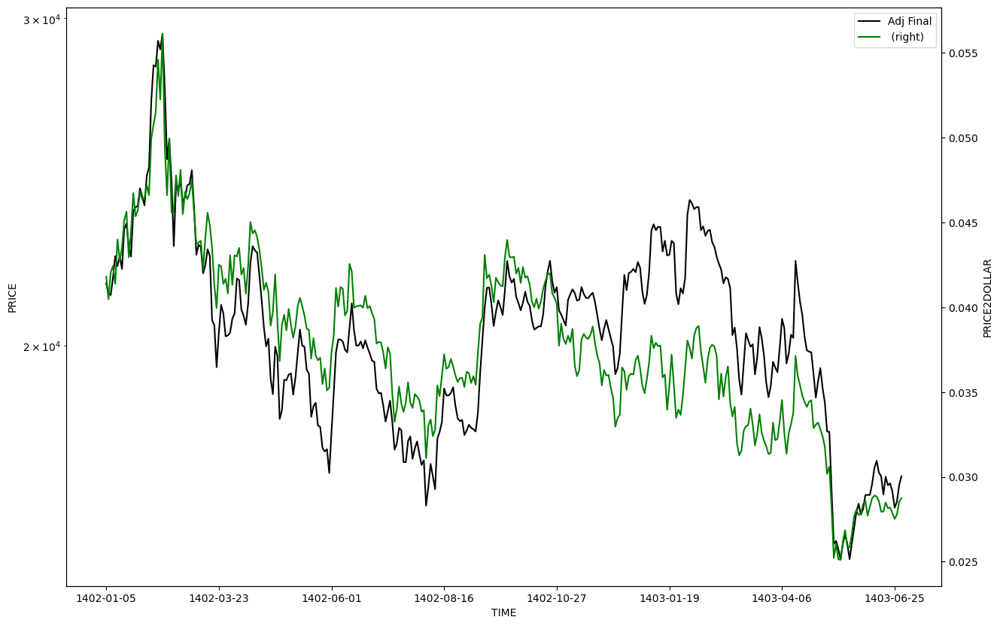

In [9]:
# قیمت دلاری سهام
#دلار آمریکا
import pandas as pd
SAVE_DATA_DOLLAR_SHEET = "C://TSE_SALAR/TSE_DOLLAR.xlsx"
SAVE_DATA_DOLLAR = "قیمت"

def TSETMC_HISTORY_DOLLAR(NAME, START_DATE, END_DATE, SAVE_DATA_DOLLAR, SAVE_DATA_DOLLAR_SHEET):
    import finpy_tse as fpy
    #دلار آمریکا
    DATA = fpy.Get_USD_RIAL(
        start_date=START_DATE,
        end_date=END_DATE,
        ignore_date=False,
        show_weekday=False,
        double_date=False)
    return DATA

DATA_DOLLAR = TSETMC_HISTORY_DOLLAR(NAME, START_DATE, END_DATE, SAVE_DATA_DOLLAR, SAVE_DATA_DOLLAR_SHEET)

DATA_DOLLAR.to_excel(SAVE_DATA_DOLLAR_SHEET,sheet_name=SAVE_DATA_DOLLAR)

merged_df = pd.merge(DATA_DOLLAR, DATA01, on='J-Date')

PRICE2DOLLAR = merged_df['Close_y'] / merged_df['Close_x']
print(PRICE2DOLLAR)
#قیمت نماد
PRICE.plot(figsize=(15,10),xlabel='TIME',ylabel='PRICE',logy=True,legend='Price',color='black')
PRICE2DOLLAR.plot(figsize=(15,10),xlabel='TIME',ylabel='PRICE2DOLLAR',secondary_y=True, style='-g',legend='PRICE2DOLLAR')


C:\Users\Dell\anaconda3\Lib\site-packages\finpy_tse\__init__.py:424: FutureWarning:

The behavior of array concatenation with empty entries is deprecated. In a future version, this will no longer exclude empty items when determining the result dtype. To retain the old behavior, exclude the empty entries before the concat operation.

C:\Users\Dell\anaconda3\Lib\site-packages\finpy_tse\__init__.py:424: FutureWarning:

The behavior of array concatenation with empty entries is deprecated. In a future version, this will no longer exclude empty items when determining the result dtype. To retain the old behavior, exclude the empty entries before the concat operation.

C:\Users\Dell\AppData\Local\Temp\ipykernel_2136\2598923909.py:77: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`



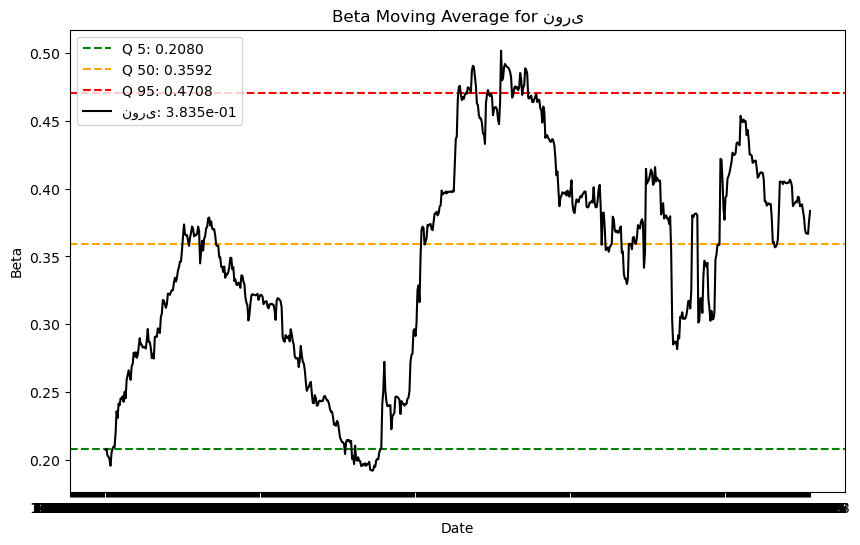

C:\Users\Dell\AppData\Local\Temp\ipykernel_2136\2598923909.py:93: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`



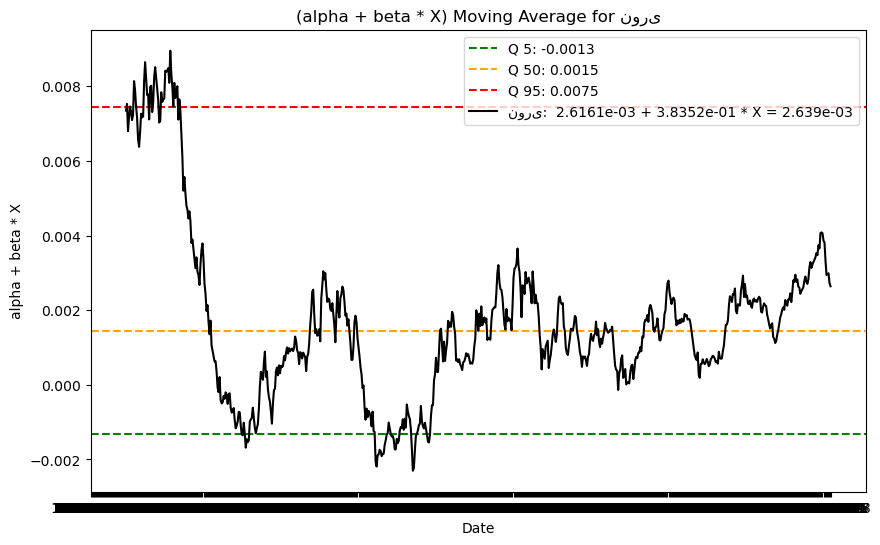

نوری		 alpha + beta * X : 2.6161e-03 + 3.8352e-01 * X


C:\Users\Dell\AppData\Local\Temp\ipykernel_2136\2598923909.py:100: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`



In [10]:
### ALPHA AND BETA MOVING AVERAGE 
def TSETMC_HISTORY_PRICE(NAME, START_DATE, END_DATE, SAVE_DATA_PRICE, SAVE_DATA_PRICE_SHEET):
    # : دریافت سابقه قیمت
    import finpy_tse as fpy
    DATA = fpy.Get_Price_History(
        stock=NAME,
        start_date=START_DATE,
        end_date=END_DATE,
        ignore_date=False,
        adjust_price=True,
        show_weekday=False,
        double_date=False,)
    return DATA
# -------------------------------------------
def TSETMC_HISTORY_HAMVAZN(START_DATE, END_DATE, SAVE_DATA_PRICE, SAVE_DATA_PRICE_SHEET):
    # : دریافت سابقه شاخص هم وزن
    import finpy_tse as fpy
    DATA = fpy.Get_EWI_History(
        start_date=START_DATE,
        end_date=END_DATE,
        ignore_date=False,
        just_adj_close=True,
        show_weekday=False,
        double_date=False)
    return DATA
# -------------------------------------------
def TSETMC_HISTORY_KOL(START_DATE, END_DATE, SAVE_DATA_PRICE, SAVE_DATA_PRICE_SHEET):
    # : دریافت سابقه شاخص کل
    import finpy_tse as fpy
    DATA = fpy.Get_CWI_History(
        start_date=START_DATE,
        end_date=END_DATE,
        ignore_date=False,
        just_adj_close=False,
        show_weekday=False,
        double_date=False)
    return DATA
# -------------------------------------------
stock = 'نوری'
index = 'اهرم'
START_DATE='1400-01-05'
END_DATE='1403-09-30'
SAVE_DATA_PRICE = "C://TSE_SALAR/TSE_PRICE.xlsx"
SAVE_DATA_PRICE_SHEET = "قیمت"

STOCK = TSETMC_HISTORY_PRICE(stock, START_DATE, END_DATE, SAVE_DATA_PRICE, SAVE_DATA_PRICE_SHEET)
INDEX01 = TSETMC_HISTORY_PRICE(index, START_DATE, END_DATE, SAVE_DATA_PRICE, SAVE_DATA_PRICE_SHEET)
INDEX02 = TSETMC_HISTORY_HAMVAZN(START_DATE, END_DATE, SAVE_DATA_PRICE, SAVE_DATA_PRICE_SHEET) #هم وزن
INDEX = TSETMC_HISTORY_KOL(START_DATE, END_DATE, SAVE_DATA_PRICE, SAVE_DATA_PRICE_SHEET) #کل

### BETA MOVING AVERAGE 
# Import libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt


# Define the y data as the S&P 500 price change
y_data = STOCK["Adj Close"].pct_change()

# Define the x data as the other symbols price change
x_data = INDEX["Adj Close"].pct_change()

merged_df = pd.merge(x_data, y_data, on='J-Date')
#print(merged_df)

x_data = merged_df['Adj Close_x']
y_data = merged_df['Adj Close_y']

period = 100
fig, ax = plt.subplots(figsize=(10, 6))
beta_symbol = x_data.rolling(period).cov(y_data) / y_data.rolling(period).var()
# Plot the beta moving average for each symbol
ax.axhline(beta_symbol.quantile(0.05), color="green", linestyle="--", label=f"Q 5: {beta_symbol.quantile(0.05):.4f}")
ax.axhline(beta_symbol.quantile(0.5), color="orange", linestyle="--", label=f"Q 50: {beta_symbol.quantile(0.5):.4f}")
ax.axhline(beta_symbol.quantile(0.95), color="red", linestyle="--", label=f"Q 95: {beta_symbol.quantile(0.95):.4f}")
ax.plot(beta_symbol, label=f"{stock}: {beta_symbol[-1]:.3e}", color='black')
ax.set_title(f"Beta Moving Average for {stock}")
ax.set_xlabel("Date")
ax.set_ylabel("Beta")
#ax.grid()
ax.legend()
plt.show()

fig, ax = plt.subplots(figsize=(10, 6))
beta_symbol = x_data.rolling(period).cov(y_data) / y_data.rolling(period).var()
alpha_symbol = y_data.rolling(period).mean() - beta_symbol * x_data.rolling(period).mean()
Y = alpha_symbol + alpha_symbol * y_data
# Plot the beta moving average for each symbol
ax.axhline(Y.quantile(0.05), color="green", linestyle="--", label=f"Q 5: {Y.quantile(0.05):.4f}")
ax.axhline(Y.quantile(0.5), color="orange", linestyle="--", label=f"Q 50: {Y.quantile(0.5):.4f}")
ax.axhline(Y.quantile(0.95), color="red", linestyle="--", label=f"Q 95: {Y.quantile(0.95):.4f}")
ax.plot(Y, label=f"{stock}:  {alpha_symbol[-1]:.4e} + {beta_symbol[-1]:.4e} * X = {Y[-1]:.3e}", color='black')  
ax.set_title(f"(alpha + beta * X) Moving Average for {stock}")
ax.set_xlabel("Date")
ax.set_ylabel("alpha + beta * X")
#ax.grid()
ax.legend()
plt.show()
print(f'{stock}\t\t alpha + beta * X : {alpha_symbol[-1]:.4e} + {beta_symbol[-1]:.4e} * X')



C:\Users\Dell\anaconda3\Lib\site-packages\finpy_tse\__init__.py:424: FutureWarning:

The behavior of array concatenation with empty entries is deprecated. In a future version, this will no longer exclude empty items when determining the result dtype. To retain the old behavior, exclude the empty entries before the concat operation.

C:\Users\Dell\anaconda3\Lib\site-packages\finpy_tse\__init__.py:424: FutureWarning:

The behavior of array concatenation with empty entries is deprecated. In a future version, this will no longer exclude empty items when determining the result dtype. To retain the old behavior, exclude the empty entries before the concat operation.



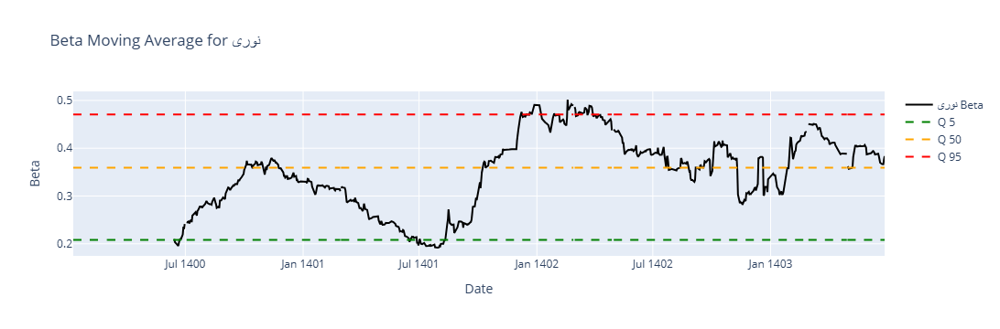

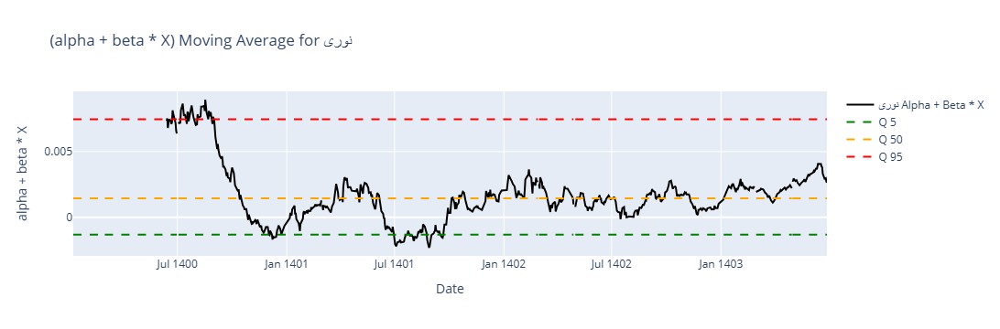

نوری		 alpha + beta * X : 2.6161e-03 + 3.8352e-01 * X


C:\Users\Dell\AppData\Local\Temp\ipykernel_2136\1970778078.py:78: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`



In [11]:
import finpy_tse as fpy
import numpy as np
import pandas as pd
import plotly.graph_objects as go

def TSETMC_HISTORY_PRICE(NAME, START_DATE, END_DATE, SAVE_DATA_PRICE, SAVE_DATA_PRICE_SHEET):
    DATA = fpy.Get_Price_History(
        stock=NAME,
        start_date=START_DATE,
        end_date=END_DATE,
        ignore_date=False,
        adjust_price=True,
        show_weekday=False,
        double_date=False)
    return DATA

def TSETMC_HISTORY_HAMVAZN(START_DATE, END_DATE, SAVE_DATA_PRICE, SAVE_DATA_PRICE_SHEET):
    DATA = fpy.Get_EWI_History(
        start_date=START_DATE,
        end_date=END_DATE,
        ignore_date=False,
        just_adj_close=True,
        show_weekday=False,
        double_date=False)
    return DATA

def TSETMC_HISTORY_KOL(START_DATE, END_DATE, SAVE_DATA_PRICE, SAVE_DATA_PRICE_SHEET):
    DATA = fpy.Get_CWI_History(
        start_date=START_DATE,
        end_date=END_DATE,
        ignore_date=False,
        just_adj_close=False,
        show_weekday=False,
        double_date=False)
    return DATA

stock = 'نوری'
index = 'اهرم'
START_DATE='1400-01-05'
END_DATE='1403-09-30'
SAVE_DATA_PRICE = "C://TSE_SALAR/TSE_PRICE.xlsx"
SAVE_DATA_PRICE_SHEET = "قیمت"

STOCK = TSETMC_HISTORY_PRICE(stock, START_DATE, END_DATE, SAVE_DATA_PRICE, SAVE_DATA_PRICE_SHEET)
INDEX01 = TSETMC_HISTORY_PRICE(index, START_DATE, END_DATE, SAVE_DATA_PRICE, SAVE_DATA_PRICE_SHEET)
INDEX02 = TSETMC_HISTORY_HAMVAZN(START_DATE, END_DATE, SAVE_DATA_PRICE, SAVE_DATA_PRICE_SHEET)
INDEX = TSETMC_HISTORY_KOL(START_DATE, END_DATE, SAVE_DATA_PRICE, SAVE_DATA_PRICE_SHEET)

y_data = STOCK["Adj Close"].pct_change()
x_data = INDEX["Adj Close"].pct_change()

merged_df = pd.merge(x_data, y_data, on='J-Date')
x_data = merged_df['Adj Close_x']
y_data = merged_df['Adj Close_y']

period = 100
beta_symbol = x_data.rolling(period).cov(y_data) / y_data.rolling(period).var()

fig = go.Figure()
fig.add_trace(go.Scatter(x=beta_symbol.index, y=beta_symbol, mode='lines', line=dict(color='black'), name=f"{stock} Beta"))
fig.add_trace(go.Scatter(x=beta_symbol.index, y=[beta_symbol.quantile(0.05)]*len(beta_symbol), mode='lines', name='Q 5', line=dict(dash='dash', color='green')))
fig.add_trace(go.Scatter(x=beta_symbol.index, y=[beta_symbol.quantile(0.5)]*len(beta_symbol), mode='lines', name='Q 50', line=dict(dash='dash', color='orange')))
fig.add_trace(go.Scatter(x=beta_symbol.index, y=[beta_symbol.quantile(0.95)]*len(beta_symbol), mode='lines', name='Q 95', line=dict(dash='dash', color='red')))
fig.update_layout(title=f"Beta Moving Average for {stock}", xaxis_title="Date", yaxis_title="Beta")
fig.show()

alpha_symbol = y_data.rolling(period).mean() - beta_symbol * x_data.rolling(period).mean()
Y = alpha_symbol + alpha_symbol * y_data

fig = go.Figure()
fig.add_trace(go.Scatter(x=Y.index, y=Y, mode='lines', line=dict(color='black'), name=f"{stock} Alpha + Beta * X"))
fig.add_trace(go.Scatter(x=Y.index, y=[Y.quantile(0.05)]*len(Y), mode='lines', name='Q 5', line=dict(dash='dash', color='green')))
fig.add_trace(go.Scatter(x=Y.index, y=[Y.quantile(0.5)]*len(Y), mode='lines', name='Q 50', line=dict(dash='dash', color='orange')))
fig.add_trace(go.Scatter(x=Y.index, y=[Y.quantile(0.95)]*len(Y), mode='lines', name='Q 95', line=dict(dash='dash', color='red')))
fig.update_layout(title=f"(alpha + beta * X) Moving Average for {stock}", xaxis_title="Date", yaxis_title="alpha + beta * X")
fig.show()

print(f'{stock}\t\t alpha + beta * X : {alpha_symbol[-1]:.4e} + {beta_symbol[-1]:.4e} * X')


In [ ]:
## PREDICTED PRICE WITH LSTM ALOGRITHM

import numpy as np
import matplotlib.pyplot as plt

def PREDICT_LSTM(x, y, look_back, ITERATION):
    from keras.models import Sequential
    from keras.layers import LSTM, Dense
    # Prepare data for LSTM
    trainX, trainY = [], []
    for i in range(len(x) - look_back):
        trainX.append(x[i:i + look_back])
        trainY.append(y[i + look_back])

    trainX, trainY = np.array(trainX), np.array(trainY)

    # Build the LSTM model
    model = Sequential()
    model.add(LSTM(4, input_shape=(look_back, 1)))
    model.add(Dense(1))
    model.compile(loss='mean_squared_error', optimizer='adam')
    model.fit(trainX, trainY, epochs=ITERATION, batch_size=1, verbose=2)

    # Predict the next 'y' value
    next_x = np.array(x[-look_back:]).reshape(1, look_back, 1)
    predicted_y = model.predict(next_x)
    return predicted_y


x = np.arange(1 , len(PRICE) + 1)
y = PRICE
predicted_y = PREDICT_LSTM(x, y, look_back=50, ITERATION = 200)

# Plot the results
plt.figure(figsize=(10, 6))
plt.plot(x, y, color='black', label='Original data')
plt.scatter(len(x), predicted_y, color='red', marker='o', label='Predicted next y')
plt.xlabel('Data points')
plt.ylabel('y values')
plt.legend()
plt.grid()
plt.show()

In [ ]:
def ROC(data):# calculate rate of change
    roc = []
    for i in range(1, len(data)):
        roc.append((data[i] - data[i-1]) / data[i-1]) 
    return roc

def cumulative_sum(data):# calculate cumulative synnation of array
    cum_sum = [data[0]]
    for i in range(1, len(data)):
        cum_sum.append(cum_sum[-1] + data[i])
    return cum_sum

def MEAN(data, n):#Mean
    SUM = 0.0
    for i in range(n):
        SUM += data[i]
    return SUM

def GEOMETRIC_MEAN(data, n):#Geometric Mean
        MU = 1.0
        for j in range(n):
            MU *= data[j]  
        D = MU ** (1/n)  
    return D

def GROWTH_RATE(data, n):#Growth Rate
        MU = 1.0
        for j in range(n-1):
            MU *= (data[j+1] / data[j])    
        D = MU ** (1/(n-1))  
    return D

def STD(data, n):#Standard Deviation
    SUMm = 0.0
    SUMd = 0.0
    for i in range(n):
        SUMm += data[i]
    for j in range(n):
        SUMd += (data[j] - SUMm)
    SUMd = np.sqrt(SUMd/n)  
    return SUMd

def MEAN(data, n, m):#Mean
    D = np.zeros(n)
    for i in range(n):
        SUM = 0.0
        for j in range(m):
            SUM += data[i][j]
        D[i] = SUM  
    return D 

def GEOMETRIC_MEAN(data, n, m):#Geometric Mean
    D = np.zeros(n)
    for i in range(n):
        MU = 1.0
        for j in range(m):
            MU *= data[i][j]    
        D[i] = MU ** (1/m)  
    return D

def GROWTH_RATE(data, n, m):#Growth Rate
    D = np.zeros(n)
    for i in range(n):
        MU = 1.0
        for j in range(m-1):
            MU *= (data[i][j+1] / data[i][j])    
        D[i] = MU ** (1/(m-1))  
    return D

def STD(data, n, m):#Standard Deviation
    D = np.zeros(n)
    F = np.zeros(n)
    for i in range(n):
        SUMm = 0.0
        for j in range(m):
            SUMm += data[i][j]
        D[i] = SUMm
    for i in range(n):
        SUMd = 0.0    
        for j in range(n):
            SUMd += (data[i][j] - D[i]) * (data[i][j] - D[i])
        F[i] = SUMd
    F = np.sqrt(F/m)  
    return F
def Generate_Random_Numbers(n, mean, std):
    # set seed for reproducability
    #np.random.seed(42)  
    # generate n random numbers with mean and std deviation
    nums = np.random.normal(loc=mean, scale=std, size=n)
    print(nums)
    # calculate the current mean and std deviation
    current_mean = np.mean(nums)
    current_std = np.std(nums)
    # adjust the numbers to fit the target mean and std deviation
    nums = (nums - current_mean) * (std / current_std) + mean
    return nums

def Generate_Prices(start_price, Volatility, Direction_Bias, num_days):
    prices = [start_price]
    changes = [0]
    for i in range(num_days-1):
        Var = random.uniform(-1, 1)*random.uniform(0, 1)*Volatility
        price = prices[-1] *(1 + Var + Direction_Bias)  
        prices.append(price)
        changes.append(prices[-1] / prices[i-1] - 1)
    return prices, changes

def Generate_Prices_02(start_price, Volatility, Direction_Bias, num_days, change_days):
    import random
    prices = [start_price]
    changes = [0]
    for i in range(num_days-1):
        if i % change_days == 0:
            Var = random.uniform(-1, 1)*random.uniform(0, 1)*Volatility
            price = prices[-1] *(1 + Var + Direction_Bias)
        prices.append(price)
        changes.append(prices[-1] / prices[i-1] - 1)
    prices = np.array(prices);
    changes = np.array(changes);
    return prices, changes

def Relative_Strength_Index(PRICE, RSI_Period, RSI_Ma, Multi):
    UP = np.maximum(PRICE.diff(),0)
    DOWN = np.maximum(-PRICE.diff(),0)
    MFP = UP.rolling(RSI_Period).sum()
    MFN = DOWN.rolling(RSI_Period).sum()
    RSI = MFP/(MFP+MFN)
    RSI_MA = RSI.rolling(RSI_Ma).mean()
    RSI_STD = RSI.rolling(RSI_Ma).std()
    RSI_LOWER_BAND = RSI_MA - Multi * RSI_STD
    RSI_UPPER_BAND = RSI_MA + Multi * RSI_STD 
    RSI_RISK = (RSI[-1] - RSI_LOWER_BAND[-1])/(RSI_UPPER_BAND[-1] - RSI_LOWER_BAND[-1])
    return RSI, RSI_MA, RSI_RISK
def Money_Flow_Index(VALUE, MFI_Period, MFI_Ma, Multi):
    UP = np.maximum(VALUE.diff(),0)
    DOWN = np.maximum(-VALUE.diff(),0)
    MFP = UP.rolling(MFI_Period).sum()
    MFN = DOWN.rolling(MFI_Period).sum()
    MFI = MFP/(MFP+MFN)
    MFI_MA = MFI.rolling(MFI_Ma).mean()
    MFI_STD = MFI.rolling(MFI_Ma).std()
    MFI_LOWER_BAND = MFI_MA - Multi * MFI_STD
    MFI_UPPER_BAND = MFI_MA + Multi * MFI_STD 
    MFI_RISK = (MFI[-1] - MFI_LOWER_BAND[-1])/(MFI_UPPER_BAND[-1] - MFI_LOWER_BAND[-1])
    return MFI, MFI_MA, MFI_RISK
import pandas as pd

def HEIKIN_ASHI(df):
    # Create new columns for the Heikin-Ashi candles
    df['HA_Close'] = (df['Open'] + df['High'] + df['Low'] + df['Close']) / 4
    df['HA_Open'] = (df['Open'].shift(1) + df['Close'].shift(1)) / 2
    df['HA_High'] = df[['High', 'HA_Open', 'HA_Close']].max(axis=1)
    df['HA_Low'] = df[['Low', 'HA_Open', 'HA_Close']].min(axis=1)
    # Fill the first row with the original OHLC values
    df.iloc[0, -4:] = df.iloc[0, :4]
    # Return the new dataframe with Heikin-Ashi columns
    return df
def triangular_pdf(x, a, b, c):
    y = np.zeros_like(x)
    # initialize y values as zeros
    mask1 = (x >= a) & (x <= b)
    # condition for first part of the triangle
    mask2 = (x > b) & (x <= c)
    # condition for second part of the triangle
    y[mask1] = 2 * (x[mask1] - a) / ((c - a) * (b - a))
    # formula for first part of the triangle 
    y[mask2] = 2 * (c - x[mask2]) / ((c - a) * (c - b))
    # formula for second part of the triangle 
    return y

def Market_Trend(prices):  
    returns = prices[1:]/prices[:-1] - 1
    returns = returns[returns != 0]
    n = len(returns)
    signs = np.sign(returns)
    runs = signs[1:] - signs[:-1]
    observed_runs = np.count_nonzero(runs == 2) + np.count_nonzero(runs == -2) + 1
    positive_returns = np.count_nonzero(signs == 1)
    negative_returns = np.count_nonzero(signs == -1)
    expected_runs = 2*positive_returns*negative_returns/n + 1
    stdev_runs = (expected_runs*(expected_runs - 1)/(n - 1))**(1/2)
    z_stat = (observed_runs - expected_runs)/stdev_runs
    p_value = 2*(1 - sps.norm.cdf(abs(z_stat)))
    if p_value > 0.1:
        print('market is efficient')
    elif z_stat > 0:
        print('market is mean-reverting')
    else:
        print('market is trending')
    print(observed_runs, int(expected_runs), round(stdev_runs, 2), round(z_stat, 4), round(p_value, 4))
    return observed_runs, int(expected_runs), round(stdev_runs, 2), round(z_stat, 4), round(p_value, 4)

def Distribution_Fitting(prices):
    #calculate returns
    returns = np.log(prices[1:]/prices[:-1])
    #sort returns
    returns = np.sort(returns)
    #construct empirical distribution function
    edf = np.arange(1, len(returns)+1)/len(returns)
    #construct normal distribution function
    mean = np.average(returns)
    std = np.std(returns)
    normal_cdf = sps.norm.cdf(returns, mean, std)
    #plot the distribution functions
    plt.plot(returns, edf)
    plt.plot(returns, normal_cdf)
    plt.show()
    #apply the Kolmogorov-Smirnov test
    p_value = np.exp(-np.max(abs(edf - normal_cdf))**2*len(returns))
    if p_value < 0.1:
        print('normal distribution does not fit the data: p-value '+str(round(p_value, 4)))
    else:
        print('normal distribution fits the data: p-value '+str(round(p_value, 4)))
    #construct cauchy distribution function
    median = np.quantile(returns, 0.5)
    iq_range = (np.quantile(returns, 0.75) - np.quantile(returns, 0.25))/2
    cauchy_cdf = 1/np.pi*np.arctan((returns - median)/iq_range) + 1/2
    #plot the distribution functions
    plt.plot(returns, edf)
    plt.plot(returns, cauchy_cdf)
    plt.show()
    #apply the Kolmogorov-Smirnov test
    p_value = np.exp(-max(abs(edf - cauchy_cdf))**2*len(returns))
    if p_value < 0.1:
        print('Cauchy distribution does not fit the data: p-value '+str(round(p_value, 4)))
    else:
        print('Cauchy distribution fits the data: p-value '+str(round(p_value, 4)))
    return 0


def Variance_Ratio(prices):
    returns = prices.pct_change()[1:]
    n = len(returns)
    variance_0 = returns.var()
    variance_ratio_output = pd.DataFrame()
    for t in np.arange(2, max_t+1):
        variance = returns.rolling(t).sum().var()
        variance_ratio = variance/(variance_0*t) - 1
        standard_error = (2*(2*t - 1)*(t-1)/(3*t*n))**(1/2)
        z_stat = variance_ratio/standard_error
        p_value = 2*(1 - sps.norm.cdf(abs(z_stat)))
        variance_ratio_output[t] = [round(variance_0, 6), round(variance, 6), round(variance_ratio, 4), round(standard_error, 4), round(z_stat, 4), p_value]
    plt.plot(variance_ratio_output.iloc[4])
    min_pvalue = np.min(variance_ratio_output.iloc[5])
    max_z_stat = variance_ratio_output.iloc[4][variance_ratio_output.iloc[5] == min_pvalue].values[0]
    Chow_Denning = 1 - (1 - min_pvalue)**(max_t)
    if Chow_Denning > 0.1:
        print('the market is efficient')
    elif max_z_stat > 0:
        print('the market is trending')
    else:
        print('the market is mean-reverting')
    return 0  

def Bubbles(prices):
    #this is a bubble detecting algorithm developed by Phillips and Yu (2011) and Phillips et al. (2015) 
    #it is based on the augmented Dickey-Fuller test
    #inputting the parameters
    r0 = int(len(prices)*0.1)
    #specify lags for the augmented Dickey-Fuller (ADF) test
    adf_lags = 3
    #critical value of the right-tailed ADF-test (95%) from Phillips et al. (2015)
    crit = 1.49
    #transforming data
    log_prices = np.array(np.log(prices))
    delta_log_prices = log_prices[1:] - log_prices[:-1]
    n = len(delta_log_prices)
    BSADF = np.array([])
    #calculating ADF stats
    for r2 in range(r0,n):
        ADFS = np.array([])
        for r1 in range(0,r2-r0+1):
            X0 = log_prices[r1:r2+1]
            X = pd.DataFrame()
            X[0] = X0
            for j in range(1,adf_lags+1):
                X[j] = np.append(np.zeros(j),delta_log_prices[r1:r2+1-j])
            X = np.array(X)
            Y = delta_log_prices[r1:r2+1]
            reg = sm.OLS(Y,sm.add_constant(X))
            res = reg.fit()
            ADFS = np.append(ADFS, res.params[1]/res.bse[1])
        BSADF = np.append(BSADF, max(ADFS))
    #visualising the results
    plt.rc('xtick',labelsize = 8)
    plt.plot(prices.index[r0+1:],BSADF)
    plt.plot(prices.index[r0+1:],np.ones(len(BSADF))*crit)
    #printing dates when bubbles were detected
    print(prices.index[r0+1:][BSADF > crit])
    return 0

def Pvalue(x):
    ## Calcylate P-Value:    
    # specify the null hypothesis
    null_mean = 0
    # calculate the test statistic
    test_statistic = (np.mean(x) - null_mean) / (np.std(x) / np.sqrt(len(x)))
    # calculate the p-value
    p_value = 2 * (1 - np.mean(np.random.normal(size=10000) < test_statistic))
    return p_value

def uniform_distribution_function(right, left, x):
    y = 1/(right-left) * x
    return y
def triangluar_distribution_function(right, left, x):
    y = (2/(right-left)) * (1/(mode-left)) * (x-left) * (x <= mode) + (2/(right-left)) * (1/(right-mode)) * (right-x) * (x > mode)
    return y
def normal_distribution_function(mu, sigma, x):
    y = (1/(sigma*np.sqrt(2*np.pi))) * np.exp(-((x-mu)**2)/(2*sigma**2))
    return y
def lognormal_distribution_function(mu, sigma, x):
    y = (1/(x*sigma*np.sqrt(2*np.pi))) * np.exp(-((np.log(x)-mu)**2)/(2*sigma**2))
    return y

def HISROGRAM_BOXPLOT(X, BINS, HISTO_COLOR,LABEL):
    import numpy as np
    import matplotlib.pyplot as plt
    X = np.array(X)
    print("-------------------------")
    from scipy.stats import skew, kurtosis
    MINIMUM = np.min(X)
    MAXIMUM = np.max(X)
    #MODE = max(set(X), key=list(X).count)
    MEDIAN = np.quantile(X, .50)#q2
    MEAN = np.mean(X)
    STD = np.std(X)
    q1 = np.quantile(X, .25)
    q3 = np.quantile(X, .75)
    SKEW = skew(X)
    KURT = kurtosis(X)
    #SKEW = (MEAN - MODE) / STD
    #KURT = (np.mean((X - MEAN)**4) / STD**4)
    # Estimate confidence intervals of the output variable
    lower_bound = np.quantile(X, .05)
    upper_bound = np.quantile(X, .95)
    print("Box-Chart Datas: ")
    print(f'Minimum: {MINIMUM:.4f}')
    print(f'First quartile: {q1:.4f}')
    #print(f'Mode: {MODE:.4f}')
    print(f'Median: {MEDIAN:.4f}')
    print(f'Mean: {MEAN:.4f}')
    print(f'Std: {STD:.4f}')
    print(f'Third quartile: {q3:.4f}')
    print(f'Maximum: {MAXIMUM :.4f}')
    print(f'Skewness: {skew(X) :.4f}')
    print(f'kurtosis: {kurtosis(X) :.4f}')
    print(f"90% Confidence Interval: ({lower_bound:.4f}, {upper_bound:.4f})")
    print("-------------------------")

    plt.figure(figsize=(10,6))
    # Plot histogram of data
    count, bins, ignored = plt.hist(X, bins=BINS, color=HISTO_COLOR, density=True, align='mid', edgecolor="black")
    
    # Plot lognormal PDF
    x = np.linspace(min(bins), max(bins), 10000)
    pdf = (np.exp(-(x - MEAN)**2 / (2 * STD**2)) / (STD * np.sqrt(2 * np.pi)))
    plt.plot(x, pdf, linewidth=2, color='r', label="Normal PDF")
    
    # Plot vertical lines for risk measures
    plt.axvline(q1, color="black", linestyle="--", label=f"Quantile 0.25: {q1:.4f}")
    plt.axvline(MEDIAN, color="green", linestyle="--", label=f"Median: {MEDIAN:.4f}")
    plt.axvline(q3, color="black", linestyle="--", label=f"Quantile 0.75: {q3:.4f}")
    #plt.axvline(MODE, color="purple", linestyle="--", label=f"Mode: {MODE:.4f}")
    plt.axvline(MEAN, color="red", linestyle="--", label=f"Mean: {MEAN:.4f}")
    plt.axvline(MEAN-STD, color="blue", linestyle="--", label=f"Mean-Std: {MEAN-STD:.4f}")
    plt.axvline(MEAN+STD, color="blue", linestyle="--", label=f"Mean+Std: {MEAN+STD:.4f}")
    plt.xlabel(LABEL)
    plt.ylabel("Frequency")
    prob = np.sum(X > 0) / len(X)
    plt.title(f"Histogram - Probability of Positive {LABEL} is {100*prob:.2f} %")
    plt.legend()
    #plt.grid()
    plt.show()

    #Plot boxplot with outliers
    plt.figure(figsize=(10,6))
    plt.boxplot(X, vert=0)
    # Write the quartile data on the chart
    plt.text(q1, 1.05, f" Q1: {q1:.4f}")
    plt.text(MEDIAN, 1.1, f" Q2: {MEDIAN:.4f}")
    plt.text(q3, 1.05, f" Q3: {q3:.4f}")
    #plt.text(MODE, 1.15, f" Mode: {MODE:.4f}")
    
    #plt.text(MEAN, 0.9, f" Mean: {MEAN:.4f}")
    #plt.text(MEAN-STD, 0.9, f" Mean-Std: {MEAN-STD:.4f}")
    #plt.text(MEAN+STD, 0.9, f" Mean+Std: {MEAN+STD:.4f}")
    plt.scatter(MEAN, 1, color="red", marker="+", s=200, label=f"Mean: {MEAN:.4f}")
    plt.scatter(MEAN-STD, 1, color="green", marker="X", s=200, label=f"Mean-Std: {MEAN-STD:.4f}")
    plt.scatter(MEAN+STD, 1, color="blue", marker="*", s=200, label=f"Mean+Std:  {MEAN+STD:.4f}")
    plt.xlabel(LABEL)
    plt.ylabel("Data")
    plt.title(f"Boxplot of {LABEL}")
    plt.legend()
    plt.grid()
    plt.show()

def HISTOGRAM(X, BINS, LABEL):
    plt.figure(figsize=(12,6))
    # Create a twin axis
    ax1 = plt.gca()
    ax2 = ax1.twinx()
    # Set the labels and titles
    q_05 = np.quantile(X, .05)
    q_25 = np.quantile(X, .25)
    q_50 = np.quantile(X, .50)
    q_75 = np.quantile(X, .75)
    q_95 = np.quantile(X, .95)
    ax1.axvline(q_05, color="green", linestyle="--", label=f"Quantile 0.05 : {q_05:.4f}")
    ax1.axvline(q_25, color="red", linestyle="--", label=f"Quantile 0.25 : {q_25:.4f}")
    ax1.axvline(q_50, color="orange", linestyle="--", label=f"Quantile 0.50 : {q_50:.4f}")
    ax1.axvline(q_75, color="purple", linestyle="--", label=f"Quantile 0.75 : {q_75:.4f}")
    ax1.axvline(q_95, color="cyan", linestyle="--", label=f"Quantile 0.95 : {q_95:.4f}")
    ax1.set_xlabel(f'{LABEL}')
    ax1.set_ylabel(f'Frequency of {LABEL}')
    ax1.hist(X, bins=BINS, density=True, color='blue', alpha=0.5, label=LABEL)
    # Plot the histogram of cost on the secondary y axis
    ax2.hist(X, bins=BINS, density=True, color='red', edgecolor='black', cumulative=True, histtype='step', label="Cumulative " + LABEL)
    ax2.set_ylabel(f'Frequency of cumulative {LABEL}')
    plt.title(f'Histograms of {LABEL}')
    # Add a legend
    ax1.legend()
    ax2.legend()
    plt.show()
    
def BOXPLOT02(X, Y, XL, YL):
    import matplotlib.pyplot as plt
    import numpy as np
    # Create a figure with two subplots
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))
    # Plot the boxplot for returns on the first subplot
    ax1.boxplot(Y)
    ax1.set_title(YL)
    ax1.set_ylabel(YL)
    # Calculate the quartiles for returns
    q1_y = np.quantile(Y, 0.25)
    q2_y = np.quantile(Y, 0.5)
    q3_y = np.quantile(Y, 0.75)
    # Write the quartile data on the chart
    ax1.text(1.1, q1_y, f" Q1: {q1_y:.4f}")
    ax1.text(1.1, q2_y, f" Q2: {q2_y:.4f}")
    ax1.text(1.1, q3_y, f" Q3: {q3_y:.4f}")
    # Plot the boxplot for stds on the second subplot
    ax2.boxplot(X)
    ax2.set_title(XL)
    ax2.set_ylabel(XL)
    # Calculate the quartiles for stds
    q1_x = np.quantile(X, 0.25)
    q2_x = np.quantile(X, 0.5)
    q3_x = np.quantile(X, 0.75)
    # Write the quartile data on the chart
    ax2.text(1.1, q1_x, f" Q1: {q1_x:.4f}")
    ax2.text(1.1, q2_x, f" Q2: {q2_x:.4f}")
    ax2.text(1.1, q3_x, f" Q3: {q3_x:.4f}")
    # Show the figure
    plt.show()
    print(f"MEDIAN {YL} TO {XL} IS {100*(q2_y/q2_x):.2f} (%)")  
    
def PLOT02(y1 , y2, XL, YL1, YL2, TI):
    # plot prices and prices_index in 2 y axis separately
    import matplotlib.pyplot as plt
    fig, ax1 = plt.subplots(figsize=(10, 6))
    ax2 = ax1.twinx()
    ax1.plot(y1, color="red", label=YL1)
    ax2.plot(y2, color="black", label=YL2)
    ax1.set_xlabel(XL)
    ax1.set_ylabel(YL1)
    ax2.set_ylabel(YL2)
    ax1.legend(loc="upper left")
    ax2.legend(loc="upper right")
    ax2.semilogy()
    plt.title(TI)
    plt.show()    
    
# Define a function to calculate the cumulative probability distribution for a triangular distribution
def triangular_cdf(x, a, b, c):
    if x < a:
        return 0
    elif a <= x < b:
        return (x - a) ** 2 / ((b - a) * (c - a))
    elif b <= x < c:
        return 1 - (c - x) ** 2 / ((c - b) * (c - a))
    else:
        return 1

# Define a function to calculate the expected value and standard deviation for a triangular distribution
def triangular_stats(a, b, c):
    mean = (a + b + c) / 3
    var = (a ** 2 + b ** 2 + c ** 2 - a * b - a * c - b * c) / 18
    std = np.sqrt(var)
    return mean, std    

def LINEAR_REGRESSION(X, Y):
    # Import libraries
    import numpy as np
    import matplotlib.pyplot as plt
    from sklearn.linear_model import LinearRegression
    # Create a linear regression model
    model = LinearRegression()
    model.fit(X.reshape(-1, 1), Y) # reshape X to a 2D array

    # Predict the next X income (2023)
    next_X = np.array([np.min(X)+NUM_SIZES]) # create a 1D array with the next X
    prediction = model.predict(next_X.reshape(-1, 1)) # reshape next_X to a 2D array and make prediction
    # Calculate and display the coefficient and R^2
    coefficient = model.coef_[0] # get the coefficient from the model
    y_predicted = model.predict(X.reshape(-1, 1))
    correlation = np.corrcoef(Y, y_predicted)[0, 1]
    r_squared = (correlation ** 2) # calculate the R^2 score
    print(f"The predicted Y for {next_X[0]} is {prediction[0]:.2f}")

    # Plot the data and the regression line
    plt.figure(figsize=(10,6))
    plt.scatter(X, Y, label="Y data") # plot the net income data as scatter points
    plt.plot(X, y_predicted, color="red", label="Regression line") # plot the regression line
    plt.plot(next_X, prediction, marker="x", color="green", label="Prediction") # plot the prediction as a cross point
    plt.xlabel("X") # add x-axis label
    plt.ylabel("Y") # add y-axis label
    plt.title("Next Y") # add title
    plt.semilogy()
    plt.legend() # add legend

    # Calculate and print the correlation coefficient between y and y_predicted
    print(f"The correlation coefficient between y and y_predicted is {correlation:.2f}.")
    MINx = np.min(X);MAXx = np.max(X);MINy = np.min(Y);MAXy = np.max(Y);
    plt.text(MINx+0.5*(MAXx-MINx), MINy+0.5*(MAXy-MINy), f"y = {coefficient:.2f}x + {model.intercept_:.2f} -  R^2 = {r_squared:.2f}") # write the equation of the line on the plot
    plt.show() # show the plot
    return y_predicted, prediction[0], r_squared

def MULTIPLE_REGRESSION(X, Y):
    # Import libraries
    import numpy as np
    import matplotlib.pyplot as plt
    from sklearn.linear_model import LinearRegression

    # Create a multiple regression model
    model = LinearRegression()
    model.fit(X, Y)

    # Predict the next X income (2023)
    next_X = np.array([np.min(X) + NUM_SIZES])
    prediction = model.predict(next_X)

    # Calculate and display the coefficient and R^2
    coefficient = model.coef_
    y_predicted = model.predict(X)
    correlation = np.corrcoef(Y, y_predicted)[0, 1]
    r_squared = (correlation ** 2)
    print(f"The predicted Y for {next_X[0]} is {prediction[0]:.2f}")

    # Plot the data and the regression line
    plt.figure(figsize=(10, 6))
    plt.scatter(X, Y, label="Y data")
    plt.plot(X, y_predicted, color="red", label="Regression line")
    plt.plot(next_X, prediction, marker="x", color="green", label="Prediction")
    plt.xlabel("X")
    plt.ylabel("Y")
    plt.title("Next Y")
    plt.semilogy()
    plt.legend()

    # Calculate and print the correlation coefficient between y and y_predicted
    print(f"The correlation coefficient between y and y_predicted is {correlation:.2f}.")
    MINx = np.min(X);MAXx = np.max(X);MINy = np.min(Y);MAXy = np.max(Y);
    plt.text(MINx + 0.5 * (MAXx - MINx), MINy + 0.5 * (MAXy - MINy), f"y = {coefficient[0]:.2f}x1 + {coefficient[1]:.2f}x2 + {model.intercept_:.2f} -  R^2 = {r_squared:.2f}")
    plt.show()
    return y_predicted, prediction[0], r_squared

def POLYNOMIAL_REGRESSION(X, Y):
    # Import libraries
    import numpy as np
    import matplotlib.pyplot as plt
    from sklearn.linear_model import LinearRegression

    # Create a polynomial regression model
    model = LinearRegression()
    model.fit(X ** 2, Y)

    # Predict the next X income (2023)
    next_X = np.array([np.min(X) + NUM_SIZES])
    prediction = model.predict(next_X ** 2)

    # Calculate and display the coefficient and R^2
    coefficient = model.coef_[0]
    y_predicted = model.predict(X ** 2)
    correlation = np.corrcoef(Y, y_predicted)[0, 1]
    r_squared = (correlation ** 2)
    print(f"The predicted Y for {next_X[0]} is {prediction[0]:.2f}")

    # Plot the data and the regression line
    plt.figure(figsize=(10, 6))
    plt.scatter(X, Y, label="Y data")
    plt.plot(X, y_predicted, color="red", label="Regression line")
    plt.plot(next_X, prediction, marker="x", color="green", label="Prediction")
    plt.xlabel("X")
    plt.ylabel("Y")
    plt.title("Next Y")
    plt.semilogy()
    plt.legend()

    # Calculate and print the correlation coefficient between y and y_predicted
    print(f"The correlation coefficient between y and y_predicted is {correlation:.2f}.")
    MINx = np.min(X);MAXx = np.max(X);MINy = np.min(Y);MAXy = np.max(Y);
    plt.text(MINx + 0.5 * (MAXx - MINx), MINy + 0.5 * (MAXy - MINy), f"y = {coefficient:.2f}x^2 + {model.intercept_:.2f} -  R^2 = {r_squared:.2f}")
    plt.show()
    return y_predicted, prediction[0], r_squared

def LOGISTIC_REGRESSION(X, Y):
    # Import libraries
    import numpy as np
    import matplotlib.pyplot as plt
    from sklearn.linear_model import LogisticRegression

    # Create a logistic regression model
    model = LogisticRegression()
    model.fit(X, Y)

    # Predict the next X income (2023)
    next_X = np.array([np.min(X) + NUM_SIZES])
    prediction = model.predict(next_X)

    # Calculate and display the coefficient and R^2
    coefficient = model.coef_
    y_predicted = model.predict_proba(X)[:, 1]
    correlation = np.corrcoef(Y, y_predicted)[0, 1]
    r_squared = (correlation ** 2)
    print(f"The predicted probability of Y for {next_X[0]} is {prediction[0]:.2f}")

    # Plot the data and the regression line
    plt.figure(figsize=(10, 6))
    plt.scatter(X, Y, label="Y data")
    plt.plot(X, y_predicted, color="red", label="Regression line")
    plt.plot(next_X, prediction, marker="x", color="green", label="Prediction")
    plt.xlabel("X")
    plt.ylabel("Y")
    plt.title("Next Y")
    plt.semilogy()
    plt.legend()

    # Calculate and print the correlation coefficient between y and y_predicted
    print(f"The correlation coefficient between y and y_predicted is {correlation:.2f}.")
    MINx = np.min(X);MAXx = np.max(X);MINy = np.min(Y);MAXy = np.max(Y);
    plt.text(MINx + 0.5 * (MAXx - MINx), MINy + 0.5 * (MAXy - MINy), f"y = {coefficient:.2f}x + {model.intercept_:.2f} -  R^2 = {r_squared:.2f}")
    plt.show()
    return y_predicted, prediction[0], r_squared


def DISCRETE_PDF(x, values, probabilities): 
  # Check if the inputs are valid
  if len(values) != len(probabilities):
    raise ValueError("The length of values and probabilities must be equal")
  if not np.isclose(sum(probabilities), 1):
    raise ValueError("The sum of probabilities must be 1")
  if x not in values:
    return 0 # The probability of x is zero if x is not in the values
  else:
    # Find the index of x in the values
    index = values.index(x)
    # Return the corresponding probability
    return probabilities[index]

def CUMULATIVE_DISCRETE_PDF(x, values, probabilities):
    # Check if the inputs are valid
    if len(values) != len(probabilities):
        raise ValueError("The length of values and probabilities must be equal")
    if not np.isclose(sum(probabilities), 1):
        raise ValueError("The sum of probabilities must be 1")

    # Initialize the cumulative probability to zero
    cumulative_probability = 0
    # Loop through the values and probabilities
    for value, probability in zip(values, probabilities):
        # If the value is less than or equal to x, add the probability to the cumulative probability
        if value <= x:
            cumulative_probability += probability
        else:
            break

    # Return the cumulative probability
    return cumulative_probability


def ANOVA_TEST_ONEWAY(X1, X2, X3):
    import numpy as np
    from scipy.stats import f_oneway

    f_statistic, p_value = f_oneway(X1, X2, X3)

    print(f"Computed F statistic: {f_statistic:.2f}")
    print(f"Associated p-value: {100*p_value:.2f} %")
    return f_statistic, p_value

def ANOVA_TEST_TWOWAY(X1, X2, Y):
    import pandas as pd
    import statsmodels.api as sm
    from statsmodels.formula.api import ols
    from statsmodels.stats.anova import anova_lm

    # create a pandas DataFrame with the three variables
    df = pd.DataFrame({'X1': X1, 'X2': X2, 'Y': Y})

    # fit a linear model using ols
    model = ols('Y ~ C(X1) + C(X2) + C(X1):C(X2)', data=df).fit()

    # perform anova using anova_lm
    anova_table = anova_lm(model, typ=2)

    # print the anova table
    print(anova_table)

    # return the anova table as a DataFrame
    return anova_table

def BINOMIAL_DISTRIBUTION_FORECAST(n_trials, n_data, p_success, mean):
    # Generate forcast x for each data using binomial distribution
    # n_trials = number of data trail for best accurcy
    # n_data = number of data
    # p_success = must be between 0 ~ 1
    # mean = mean generated data
    forcast = np.random.binomial(n_trials, p_success, size=n_data) * mean / n_trials
    return forcast

def T_TEST_STATISTIC(X1, X2):
    from scipy.stats import ttest_rel
    #perform paired t-test
    t_statistic , p_value = ttest_rel(X1 ,X2)
    print(t_statistic , p_value)
    return t_statistic , p_value
    
def Z_TEST_STATISTIC(X1, X2):
    from scipy.stats import ttest_ind
    #perform paired t-test
    z_statistic , p_value = ztest_rel(X1 ,X2)
    print(z_statistic , p_value)
    return z_statistic , p_value 

def MEAN_CONFIDENCE_INTERVAL(data, confidence=0.95):
    import numpy as np
    import scipy.stats
    # convert data to numpy array
    a = np.array(data)
    # get the sample size
    n = len(a)
    # calculate the sample mean and standard deviation
    mean, sigma = np.mean(a), np.std(a)
    # calculate the margin of error using the normal distribution
    h = sigma * scipy.stats.norm.ppf((1 + confidence) / 2.)
    # return the mean and the lower and upper bounds of the confidence interval
    return mean, mean-h, mean+h

def FORCAST_RIMA(data):
    import matplotlib.pyplot as plt
    from statsmodels.tsa.arima.model import ARIMA
    #fit an ARIMA model
    model = ARIMA(data, order=(1,0,1))
    model_fit = model.fit()
    #forecast the next 5 values
    forecast = model_fit.forecast(FOR_SAMPLES)
    #plot the original data and the forecast
    plt.plot(data)
    plt.plot(np.arange(NUM_SAMPLES, NUM_SAMPLES+FOR_SAMPLES), forecast)
    plt.xlabel("Time")
    plt.ylabel("Value")
    plt.title("FPRECAST WITH RIMA")
    plt.legend(["Original", "Forecast"])
    plt.show()
    return forecast

def QUANTILE_INDICTOR(prices, periods, ratio):
    import pandas as pd
    # Use pandas.Series.rolling() method to calculate quantile indictor
    return pd.Series(prices).rolling(window=periods).quantile(ratio)

def QUANTILE(X, percent):
    import numpy as np
    #percent must be 0 ~ 1
    # Sort the numbers in ascending order
    X.sort()

    # Find the index of the percentile
    index = int(percent * len(X))

    # Find the Quantile
    q = X[index]

    # Find the Cumulative Quantile
    cq = sum(X[:index+1]) / (index+1)
    
    # Quantile for probability
    q1 = np.quantile(X, percent)
    # Cumulative Quantile for probability
    cq1 = np.mean(X[X <= q1])

    # Print the results
    print(f"The Index {percent:.2f} is {index:.2f}")
    print(f"The Quantile {percent:.2f} is {q:.2f}")
    print(f"The Cumulative Quantile  {percent:.2f} is {cq:.2f}")
    
    print(f"The Quantile {percent:.2f} is {q1:.2f}")
    print(f"The Cumulative Quantile  {percent:.2f} is {cq1:.2f}")

def triangular_pdf(min, mode, max):
    """
    Generates a random number from a triangular PDF.

    Args:
    min: The minimum value.
    mode: The mode value.
    max: The maximum value.

    Returns:
    A random number from the triangular PDF.
    """

    x = random.uniform(0, 1)
    if x < (mode - min) / (mode - min + max - mode):
       return min + x * (mode - min)
    elif x < (mode - min + max - mode) / (max - min + mode - min):
       return mode
    else:
       return max - x * (max - mode)

def triangular_cdf(x, min, mode, max):
    """
    Calculates the cumulative distribution function of a triangular PDF.

    Args:
    min: The minimum value.
    mode: The mode value.
    max: The maximum value.

    Returns:
    The cumulative distribution function of the triangular PDF.
    """
    if x < min:
       return 0
    elif x < mode:
       return (x - min) / (mode - min)
    elif x > max:
       return 1
    else:
       return 1 - (max - x) / (max - mode)

def PLOT_DATA_RATIOS(X, XLABEL):
    #Create a dataframe with X 
    df = pd.DataFrame({XLABEL: X})

    #Create a new column for company_size
    df['size'] = pd.cut(df[XLABEL], bins=[-np.inf, 5, 10, 15, 20, np.inf], labels=['very low', 'low', 'medium', 'high', 'very high'])


    #Create a contingency table of X and size
    contingency_table = pd.crosstab(df[XLABEL], df['size'])

    #Perform the chi-square test
    stat, p, dof, expected = chi2_contingency(contingency_table)
    #Print the results
    print('Chi-square statistic:', stat)
    print('p-value:', p)
    print('Degrees of freedom:', dof)
    print('Expected frequencies:', expected[0])

    #Plot the contingency table as a stacked bar chart
    #contingency_table.plot.bar()
    #plt.xlabel(XLABEL)
    #plt.ylabel('Count')
    #plt.title(f'Contingency table of net {XLABEL} and size')
    #plt.show()
    
def PLOT3D(x, y, z, XLABEL, YLABEL, ZLABEL, TITLE):
    import plotly.graph_objects as go
    # Create a 3D scatter plot
    fig = go.Figure(data=[go.Scatter3d(x=x, y=y, z=z, mode='markers', marker=dict(size=5))])
    fig.update_layout(scene=dict(xaxis_title=XLABEL, yaxis_title=YLABEL, zaxis_title=ZLABEL), title=TITLE)
    fig.show()    

    

In [ ]:
import random
import numpy as np
import matplotlib.pyplot as plt

########################################################################### 

def Generate_Prices(start_price, Volatility, Direction_Bias, num_days):
    import random
    prices = [start_price]
    changes = [0]
    for i in range(num_days-1):
        Var = random.uniform(-1, 1)*random.uniform(0, 1)*Volatility
        price = prices[-1] *(1 + Var + Direction_Bias)
        prices.append(price)
        changes.append(prices[-1] / prices[i-1] - 1)
    return prices, changes

start_price = 100
Volatility = 0.05
Direction_Bias = 0.0001 
num_days = 1000
prices, changes = Generate_Prices(start_price, Volatility, Direction_Bias, num_days)    
        
########################################################################### 

def HISROGRAM_BOXPLOT(X, BINS, HISTO_COLOR,LABEL):
    import numpy as np
    import matplotlib.pyplot as plt
    X = np.array(X)
    print("-------------------------")
    from scipy.stats import skew, kurtosis
    MINIMUM = np.min(X)
    MAXIMUM = np.max(X)
    #MODE = max(set(X), key=list(X).count)
    MEDIAN = np.quantile(X, .50)#q2
    MEAN = np.mean(X)
    STD = np.std(X)
    q1 = np.quantile(X, .25)
    q3 = np.quantile(X, .75)
    SKEW = skew(X)
    KURT = kurtosis(X)
    #SKEW = (MEAN - MODE) / STD
    #KURT = (np.mean((X - MEAN)**4) / STD**4)
    # Estimate confidence intervals of the output variable
    lower_bound = np.quantile(X, .05)
    upper_bound = np.quantile(X, .95)
    print("Box-Chart Datas: ")
    print(f'Minimum: {MINIMUM:.4f}')
    print(f'First quartile: {q1:.4f}')
    #print(f'Mode: {MODE:.4f}')
    print(f'Median: {MEDIAN:.4f}')
    print(f'Mean: {MEAN:.4f}')
    print(f'Std: {STD:.4f}')
    print(f'Third quartile: {q3:.4f}')
    print(f'Maximum: {MAXIMUM :.4f}')
    print(f'Skewness: {skew(X) :.4f}')
    print(f'kurtosis: {kurtosis(X) :.4f}')
    print(f"90% Confidence Interval: ({lower_bound:.4f}, {upper_bound:.4f})")
    print("-------------------------")
    
    plt.figure(figsize=(10,6))
    # Plot histogram of data
    count, bins, ignored = plt.hist(X, bins=BINS, color=HISTO_COLOR, density=True, align='mid')#, edgecolor="black"
    
    # Plot lognormal PDF
    x = np.linspace(np.min(bins), np.max(bins), 10000)
    pdf = (np.exp(-(x - MEAN)**2 / (2 * STD**2)) / (STD * np.sqrt(2 * np.pi)))
    plt.plot(x, pdf, linewidth=2, color='r', label="Normal PDF")
    
    # Plot vertical lines for risk measures
    plt.axvline(q1, color="black", linestyle="--", label=f"Quantile 0.25: {q1:.4f}")
    plt.axvline(MEDIAN, color="green", linestyle="--", label=f"Median: {MEDIAN:.4f}")
    plt.axvline(q3, color="black", linestyle="--", label=f"Quantile 0.75: {q3:.4f}")
    #plt.axvline(MODE, color="purple", linestyle="--", label=f"Mode: {MODE:.4f}")
    plt.axvline(MEAN, color="red", linestyle="--", label=f"Mean: {MEAN:.4f}")
    plt.axvline(MEAN-STD, color="blue", linestyle="--", label=f"Mean-Std: {MEAN-STD:.4f}")
    plt.axvline(MEAN+STD, color="blue", linestyle="--", label=f"Mean+Std: {MEAN+STD:.4f}")
    plt.xlabel(LABEL)
    plt.ylabel("Frequency")
    prob = np.sum(X > 0) / len(X)
    plt.title(f"Histogram - Probability of Positive {LABEL} is {100*prob:.2f} %")
    plt.legend()
    #plt.grid()
    plt.show()

    #Plot boxplot with outliers
    plt.figure(figsize=(10,6))
    plt.boxplot(X, vert=0)
    # Write the quartile data on the chart
    plt.text(q1, 1.05, f" Q1: {q1:.4f}")
    plt.text(MEDIAN, 1.1, f" Q2: {MEDIAN:.4f}")
    plt.text(q3, 1.05, f" Q3: {q3:.4f}")
    #plt.text(MODE, 1.15, f" Mode: {MODE:.4f}")
    
    #plt.text(MEAN, 0.9, f" Mean: {MEAN:.4f}")
    #plt.text(MEAN-STD, 0.9, f" Mean-Std: {MEAN-STD:.4f}")
    #plt.text(MEAN+STD, 0.9, f" Mean+Std: {MEAN+STD:.4f}")
    plt.scatter(MEAN, 1, color="red", marker="+", s=200, label=f"Mean: {MEAN:.4f}")
    plt.scatter(MEAN-STD, 1, color="green", marker="X", s=200, label=f"Mean-Std: {MEAN-STD:.4f}")
    plt.scatter(MEAN+STD, 1, color="blue", marker="*", s=200, label=f"Mean+Std:  {MEAN+STD:.4f}")
    plt.xlabel(LABEL)
    plt.ylabel("Data")
    plt.title(f"Boxplot of {LABEL}")
    plt.legend()
    plt.grid()
    plt.show()
    

HISROGRAM_BOXPLOT(prices, BINS=100, HISTO_COLOR='orange', LABEL='Prices')

HISROGRAM_BOXPLOT(changes, BINS=100, HISTO_COLOR='blue', LABEL='Changes')


##################################################################################

def HISTOGRAM(X, BINS, LABEL, COLOR):
    import numpy as np
    import matplotlib.pyplot as plt
    X = np.array(X);
    plt.figure(figsize=(12,6))
    # Create a twin axis
    ax1 = plt.gca()
    ax2 = ax1.twinx()
    # Set the labels and titles
    q_05 = np.quantile(X, .05);q_25 = np.quantile(X, .25);q_50 = np.quantile(X, .50);q_75 = np.quantile(X, .75);
    q_95 = np.quantile(X, .95);
    ax1.axvline(q_05, color="green", linestyle="--", label=f"Quantile 0.05 : {q_05:.4f}")
    ax1.axvline(q_25, color="red", linestyle="--", label=f"Quantile 0.25 : {q_25:.4f}")
    ax1.axvline(q_50, color="orange", linestyle="--", label=f"Quantile 0.50 : {q_50:.4f}")
    ax1.axvline(q_75, color="purple", linestyle="--", label=f"Quantile 0.75 : {q_75:.4f}")
    ax1.axvline(q_95, color="cyan", linestyle="--", label=f"Quantile 0.95 : {q_95:.4f}")
    ax1.set_xlabel(f'{LABEL}')
    ax1.set_ylabel(f'Frequency of {LABEL}')
    count, bins, ignored = ax1.hist(X, bins=BINS, density=True, color=COLOR, alpha=0.5, label=LABEL)
    
    # Plot lognormal PDF
    MEAN = np.mean(X); STD =np.std(X);
    x = np.linspace(np.min(bins), np.max(bins), 10000)
    pdf = (np.exp(-(x - MEAN)**2 / (2 * STD**2)) / (STD * np.sqrt(2 * np.pi)))
    ax1.plot(x, pdf, linewidth=2, color='r', label="Normal PDF")
    
    # Plot the histogram of cost on the secondary y axis
    ax2.hist(X, bins=BINS, density=True, color='red', edgecolor='black', cumulative=True, histtype='step', label="Cumulative " + LABEL)
    ax2.set_ylabel(f'Frequency of cumulative {LABEL}')
    plt.title(f'Histograms of {LABEL}')
    # Add a legend
    ax1.legend()
    ax2.legend()
    plt.show()

HISTOGRAM(changes, BINS=100, LABEL='Changes',COLOR='purple')  

###########################################################################

def HISTOGRAM_WEIGHT(data, XLABEL, TITLE, BINS=10, COLOR='red'):
    import numpy as np
    import matplotlib.pyplot as plt
    # calculate the bin edges and counts for the histogram
    counts, X = np.histogram(data, bins=BINS)
    print(counts)
    # calculate the weights of each bar as percent of total
    weight = np.abs(counts) / np.abs(counts).sum() * 100
    
    # plot the histogram with weights
    plt.figure(figsize=(10,6))
    # use X as bins argument for plt.hist()
    plt.hist(X[1:], bins=BINS, weights=weight, color=COLOR)
    #plt.bar(X[1:], weight)
    plt.xlabel(XLABEL)
    plt.ylabel('Percent (%)')
    plt.title(TITLE)
    plt.show()

HISTOGRAM_WEIGHT(changes, XLABEL='Changes', TITLE='Weighted Histogram of Price Changes', BINS=100, COLOR='cyan')

###########################################################################

def Generate_Prices_Priods(prices, priods):
    t = [];p = [];changes = [];last_price = prices[0];
    for i in range(0, len(prices), priods):
        t.append(i) # use append instead of assignment
        p.append(prices[i]) # use append instead of assignment
        changes.append(prices[i] / last_price - 1)
        last_price = prices[i]
        #print(t[-1],p[-1]) # print the last elements of the lists
    return  t, p, changes 

times_7, prices_7, changes_7 = Generate_Prices_Priods(prices, 7)
times_30, prices_30, changes_30  = Generate_Prices_Priods(prices, 30)
times_90, prices_90, changes_90  = Generate_Prices_Priods(prices, 90)
times_220, prices_220, changes_220  = Generate_Prices_Priods(prices, 220)
# Plot the prices and the indicators
plt.figure(figsize=(10, 6)) 
plt.plot(np.arange(len(prices)), prices, label="Prices 1 Time", color="black")
plt.plot(times_7, prices_7, label="Prices 7 Times")
plt.plot(times_30, prices_30, label="Prices 30 Times")
plt.plot(times_90, prices_90, label="Prices 90 Times")
plt.plot(times_220, prices_220, label="Prices 220 Times")
plt.xlabel("Time")
plt.ylabel("Price")
plt.title("Price with Different Times")
plt.legend()
#plt.legend(loc=(1.01, 0))
plt.semilogy()
plt.show()


plt.figure(figsize=(10,6))
# Plot the boxplot with patch_artist=True and boxprops
plt.boxplot(changes, positions=[1], vert=0)
plt.boxplot(changes_7, positions=[2], vert=0) 
plt.boxplot(changes_30, positions=[3], vert=0)
plt.boxplot(changes_90, positions=[4], vert=0)
plt.boxplot(changes_220, positions=[5], vert=0)   
plt.xlabel("change")
plt.ylabel("sample")
plt.title("Box plot of sample for changes in different periods")
plt.grid()
plt.legend(['Change 1 Time', 'Change 7 Time','Change 30 Time','Change 90 Time','Change 220 Time'])
plt.show()

###########################################################################
LL =np.arange(len(prices))# Length of Prices

def RISK_REWARD_RATIO(prices):
    stop_loss = np.min(prices)
    take_profit = np.max(prices)
    entry_price = prices[-1]
    risk = entry_price - stop_loss
    reward = take_profit - entry_price
    return reward / risk

a = RISK_REWARD_RATIO(prices)
print(f'RISK-REWARD RATIO: {a:.2f}')

# Plot the prices and the indicators
plt.figure(figsize=(10, 6)) 
plt.plot(LL, prices, label="Prices", color="black")

plt.axhline(y=np.min(prices), linestyle="--", color="blue", label="RISK")
plt.text(0, np.min(prices), f" RISK: {np.min(prices):.2f}") # write the equation of the line on the plot

plt.axhline(y=np.max(prices), linestyle="--", color="red", label="REWARD")
plt.text(0, np.max(prices), f" REWARD: {np.max(prices):.2f}") # write the equation of the line on the plot

plt.axhline(y=prices[-1], linestyle="--", color="green", label="ENTRY PRICE")
plt.text(0, prices[-1], f" ENTRY PRICE: {prices[-1]:.2f}") # write the equation of the line on the plot

    
plt.xlabel("Time")
plt.ylabel("Price")
plt.title(f'RISK-REWARD RATIO: {a:.2f}')
#plt.legend(loc=(1.01, 0))
plt.semilogy()
plt.show()


###########################################################################    
################ Calculate Moving Average

def Moving_Average(prices, periods):
    import pandas as pd
    import numpy as np
    # Use pandas.Series.rolling() method to calculate moving averages
    X = pd.Series(prices).rolling(window=periods).mean()
    X = np.array(X)
    return X


MA_20 = Moving_Average(prices, 20)
MA_50 = Moving_Average(prices, 50)
MA_100 = Moving_Average(prices, 100)
MA_200 = Moving_Average(prices, 200)
MA_400 = Moving_Average(prices, 400)

# Plot the prices and the moving averages
plt.figure(figsize=(10, 6)) 
plt.plot(LL, prices, label="Prices", color="black")
plt.plot(LL, MA_20, label=f"MA 20 : {MA_20[-1]:.2f}")
plt.plot(LL, MA_50, label=f'MA 50 : {MA_50[-1]:.2f}')
plt.plot(LL, MA_100, label=f'MA 100 : {MA_100[-1]:.2f}')
plt.plot(LL, MA_200, label=f'MA 200 : {MA_200[-1]:.2f}')
plt.plot(LL, MA_400, label=f'MA 400 : {MA_400[-1]:.2f}')
plt.title("Price Moving Average Line")
plt.xlabel("Time")
plt.ylabel("Price")
plt.legend()
plt.semilogy()
plt.show()

###########################################################################
################ Calculate Quantile Moving Average

def Quantile_Indictor(prices, periods, ratio):
    import pandas as pd
    import numpy as np
    # Use pandas.Series.rolling() method to calculate quantile indictor
    X =  pd.Series(prices).rolling(window=periods).quantile(ratio)
    X = np.array(X)
    return X

QI_20 = Quantile_Indictor(prices, 20, .5)
QI_50 = Quantile_Indictor(prices, 50, .5)
QI_100 = Quantile_Indictor(prices, 100, .5)
QI_200 = Quantile_Indictor(prices, 200, .5)
QI_400 = Quantile_Indictor(prices, 400, .5)

# Plot the prices and the moving averages
plt.figure(figsize=(10, 6)) 
plt.plot(LL, prices, label="Prices", color="black")
plt.plot(LL, prices, label="Prices", color="black")
plt.plot(LL, QI_20, label=f"QMA 20 : {QI_20[-1]:.2f}")
plt.plot(LL, QI_50, label=f'QMA 50 : {QI_50[-1]:.2f}')
plt.plot(LL, QI_100, label=f'QMA 100 : {QI_100[-1]:.2f}')
plt.plot(LL, QI_200, label=f'QMA 200 : {QI_200[-1]:.2f}')
plt.plot(LL, QI_400, label=f'QMA 400 : {QI_400[-1]:.2f}')
plt.title("Price Quantile Line")
plt.xlabel("Time")
plt.ylabel("Price")
plt.legend()
plt.semilogy()
plt.show()

###########################################################################
################ Calculate Linear Regression Channel Indictor

def LRC_INDICATOR(prices, period):
    import numpy as np
    import matplotlib.pyplot as plt
    # calculate the x and y values for the linear regression
    x = np.arange(period)
    y = prices[:period]
    # calculate the slope and intercept of the best fit line
    slope, intercept = np.polyfit(x, y, 1)
    # calculate the LRC values for the window
    lrc = slope * x + intercept
    # initialize the LRC list with the first window values
    lrc_list = list(lrc)
    # loop through the remaining prices and update the LRC values
    for i in range(period, len(prices)):
        # shift the x and y values by one
        x = x + 1
        y = prices[i-period+1:i+1]
        # recalculate the slope and intercept
        slope, intercept = np.polyfit(x, y, 1)
        # append the latest LRC value to the list
        lrc_list.append(slope * x[-1] + intercept)
    # return the LRC list
    return lrc_list

# call the function with the generated prices and a period
LRC_20 = LRC_INDICATOR(prices, 20)
LRC_50 = LRC_INDICATOR(prices, 50)
LRC_100 = LRC_INDICATOR(prices, 100)
LRC_200 = LRC_INDICATOR(prices, 200)
LRC_400 = LRC_INDICATOR(prices, 400)

# plot the prices and the LRC indicator
plt.figure(figsize=(10, 6))
plt.plot(LL, prices, label="Prices", color="black")
plt.plot(LL, LRC_20, label=f"LRC 20 : {LRC_20[-1]:.2f}")
plt.plot(LL, LRC_50, label=f'LRC 50 : {LRC_50[-1]:.2f}')
plt.plot(LL, LRC_100, label=f'LRC 100 : {LRC_100[-1]:.2f}')
plt.plot(LL, LRC_200, label=f'LRC 200 : {LRC_200[-1]:.2f}')
plt.plot(LL, LRC_400, label=f'LRC 400 : {LRC_400[-1]:.2f}')
plt.title("Linear Regression Channel Indictor")
plt.legend()
plt.semilogy()
plt.show()

###########################################################################
################ Calculate Zig Zag Indictor line

def Zig_Zag(prices, threshold):
    # Initialize the zig zag points list with the first price
    zz = [prices[0]]
    # Initialize the trend direction
    trend = None
    # Loop through the prices from index 1 to the end
    for i in range(1, len(prices)):
        # Calculate the percentage change from the last zig zag point
        change = (prices[i] - zz[-1]) / zz[-1]
        # If the trend direction is not set yet
        if trend is None:
            # If the change is greater than the threshold, set the trend to up and append the price as a zig zag point
            if change > threshold:
                trend = "up"
                zz.append(prices[i])
            # If the change is less than the negative threshold, set the trend to down and append the price as a zig zag point
            elif change < -threshold:
                trend = "down"
                zz.append(prices[i])
        # If the trend direction is up
        elif trend == "up":
            # If the change is less than the negative threshold, change the trend to down and append the price as a zig zag point
            if change < -threshold:
                trend = "down"
                zz.append(prices[i])
            # If the change is greater than zero and the price is higher than the last zig zag point, update the last zig zag point to the current price
            elif change > 0 and prices[i] > zz[-1]:
                zz[-1] = prices[i]
        # If the trend direction is down
        elif trend == "down":
            # If the change is greater than the threshold, change the trend to up and append the price as a zig zag point
            if change > threshold:
                trend = "up"
                zz.append(prices[i])
            # If the change is less than zero and the price is lower than the last zig zag point, update the last zig zag point to the current price
            elif change < 0 and prices[i] < zz[-1]:
                zz[-1] = prices[i]
    return zz


# Calculate the zig zag points with a 5% threshold
zz = Zig_Zag(prices, 0.05)

# Create a list of numbers from 0 to the length of prices
time = list(range(len(prices)))
zz_time = [i for i in range(len(prices)) if prices[i] in zz]

# Plot the prices and the Zig Zag
plt.figure(figsize=(10, 6)) 
plt.plot(LL, prices, label="Prices", color="black")
plt.plot(zz_time, zz, label="Zig Zag", marker="o", color="red")
plt.title("Price Zig Zag Line")
plt.xlabel("Time")
plt.ylabel("Price")
plt.semilogy()
plt.legend()
plt.show()

###########################################################################
### FIND MAXIMUM AND MINIMUM PIVOTS ON CHARTS
def Find_Pivots(prices, window):
    # Find the local maxima and minima of the prices within a given window
    peaks = []
    troughs = []
    for i in range(window, len(prices) - window):
        if prices[i] == np.max(prices[i-window:i+window+1]):
            peaks.append((i, prices[i]))
        elif prices[i] == np.min(prices[i-window:i+window+1]):
            troughs.append((i, prices[i]))
    
    # Connect the peaks and troughs with lines and find the intersections
    intersections = []
    for i in range(len(peaks) - 1):
        for j in range(len(troughs) - 1):
            # Calculate the slopes and intercepts of the lines
            m1 = (peaks[i+1][1] - peaks[i][1]) / (peaks[i+1][0] - peaks[i][0])
            b1 = peaks[i][1] - m1 * peaks[i][0]
            m2 = (troughs[j+1][1] - troughs[j][1]) / (troughs[j+1][0] - troughs[j][0])
            b2 = troughs[j][1] - m2 * troughs[j][0]
            
            # Check if the lines intersect within the window
            if m1 != m2:
                x = (b2 - b1) / (m1 - m2)
                y = m1 * x + b1
                if x > peaks[i][0] and x < peaks[i+1][0] and x > troughs[j][0] and x < troughs[j+1][0]:
                    intersections.append((x, y))
    
    # Plot the prices, peaks, troughs and intersections
    plt.figure(figsize=(10, 6))
    plt.plot(np.arange(len(prices)), prices, color='black')
    #plt.scatter([p[0] for p in peaks], [p[1] for p in peaks], color='red', label='Max. Pivots')
    #plt.scatter([t[0] for t in troughs], [t[1] for t in troughs], color='green', label='Min. Pivots')
    #plt.scatter([i[0] for i in intersections], [i[1] for i in intersections], color='blue')
    plt.plot([p[0] for p in peaks], [p[1] for p in peaks], color='red', marker='o', label='Max. Pivots')
    plt.plot([t[0] for t in troughs], [t[1] for t in troughs], color='green', marker='o', label='Min. Pivots')
    plt.plot([i[0] for i in intersections], [i[1] for i in intersections], marker='o', color='blue')
    plt.title("Minimum and Maximum Pivots")
    plt.xlabel("Days")
    plt.ylabel("Price")
    plt.semilogy()
    plt.legend()
    plt.show()

Find_Pivots(prices, 50)

###########################################################################

def Plot_Trend_Line(prices):
    import matplotlib.pyplot as plt
    # Find the peak and trough indices of the prices
    peaks = [i for i in range(1, len(prices)-1) if prices[i] > prices[i-1] and prices[i] > prices[i+1]]
    troughs = [i for i in range(1, len(prices)-1) if prices[i] < prices[i-1] and prices[i] < prices[i+1]]
    # Find the slope and intercept of the trend lines
    slope = (prices[peaks[-1]] - prices[peaks[0]]) / (peaks[-1] - peaks[0])
    intercept = prices[peaks[0]] - slope * peaks[0]
    # Plot the prices and the trend lines
    plt.figure(figsize=(10,6))
    plt.plot(np.arange(len(prices)), prices, label="Prices", color="black")
    plt.plot([slope * i + intercept for i in range(len(prices))], label="Trend line", color="red")
    plt.legend()
    plt.title("Trading line")
    plt.xlabel("Days")
    plt.ylabel("Price")
    plt.show()
    
Plot_Trend_Line(prices)

###########################################################################

def REGRESSION_TREND(prices, ORDER):
    import numpy as np
    import matplotlib.pyplot as plt
    days = np.arange(1, len(prices)+1)
    #plot the prices
    plt.figure(figsize=(10,6))
    plt.plot(days, prices,color="black")
    #fit a linear trendline
    z = np.polyfit(days, prices, ORDER)
    p = np.poly1d(z)
    #plot the trendline
    plt.plot(days, p(days), color="red")
    plt.xlabel("Time")
    plt.ylabel("Price")
    plt.title(f"Price Trend Ploynominal Regression Line with Order {ORDER}")
    plt.semilogy()
    #show the plot
    plt.show()

REGRESSION_TREND(prices, 3)

###########################################################################

def Price_Fibonacci_Indicator(prices, fibo_ratios):
    # Define the Fibonacci ratios
    # A function to calculate the price Fibonacci indicator
    # based on the number of days in the series
    # based on the highest and lowest price in the series
    high = np.max(prices); low = np.min(prices); L = high - low;
    levels = []
    for i in range(0, len(fibo_ratios)):
        # Calculate the Fibonacci projection levels
        level = low + L * fibo_ratios[i]
        levels.append(level)      
    return levels

def Time_Fibonacci_Indicator(num_days, fibo_ratios):
    # Define the Fibonacci ratios
    # A function to calculate the time Fibonacci indicator
    # based on the number of days in the series
    # based on the highest and lowest time in the series
    L = num_days
    levels = []
    for i in range(0,  len(fibo_ratios)):
        # Calculate the Fibonacci projection levels
        level = L * fibo_ratios[i]
        levels.append(level)     
    return levels

fibo_ratios = [0, 0.236, 0.382, 0.5, 0.618, 0.786, 1]
# Calculate the price and time Fibonacci indicators
price_levels = Price_Fibonacci_Indicator(prices, fibo_ratios)
time_levels = Time_Fibonacci_Indicator(len(prices), fibo_ratios)


# Plot the prices and the indicators
plt.figure(figsize=(10, 6)) 
plt.plot(prices, label="Prices", color="black")

for i, level in enumerate(price_levels): 
    plt.axhline(y=level, linestyle="--", color="blue", label=f"Fib Ratio {fibo_ratios[i]}")
    plt.text(0, level, f"{fibo_ratios[i]:.3f}  -  {level:.2f}") # write the equation of the line on the plot

for i, level in enumerate(time_levels): 
    plt.axvline(x=level, linestyle="--", color="red", label=f"Fib Ratio {fibo_ratios[i]}")
    #plt.text(level, 0, f"{fibo_ratios[i]:.3f}  -  {level:.2f}") # write the equation of the line on the plot
    
plt.xlabel("Time")
plt.ylabel("Price")
plt.title("Fibonacci Sequence")
plt.legend(loc=(1.01, 0))
plt.semilogy()
plt.show()

###########################################################################
##############  rsi indictor 

def RSI_INDICATOR(prices, periods, ma_period, k):
    import numpy as np
    # Calculate the price changes
    changes = np.diff(prices)
    
    # Separate the positive and negative changes
    gains = np.where(changes > 0, changes, 0)
    losses = np.where(changes < 0, -changes, 0)
    
    # Calculate the exponential moving averages of gains and losses
    avg_gain = np.empty(len(prices))
    avg_loss = np.empty(len(prices))
    
    avg_gain[:periods] = np.mean(gains[:periods-1])
    avg_loss[:periods] = np.mean(losses[:periods-1])
    
    for i in range(periods, len(prices)):
        avg_gain[i] = (avg_gain[i-1]*(periods-1) + gains[i-1])/periods
        avg_loss[i] = (avg_loss[i-1]*(periods-1) + losses[i-1])/periods
    
    
    # Calculate the RSI
    rsi = 100 * (avg_gain / (avg_gain + avg_loss))
    rsi_ma = np.empty(len(prices))
    rsi_std = np.empty(len(prices))
    lower_band = np.empty(len(prices))
    upper_band = np.empty(len(prices))
    ratio = np.empty(len(prices))
    rsi_ma[:periods] = np.mean(rsi[:periods-1])
    rsi_std[:periods] = np.std(rsi[:periods-1])
    for i in range(periods, len(prices)):# moving average of rsi
        rsi_ma[i] = ( rsi_ma[i-1]*(periods-1) + rsi[i-1])/periods
        rsi_std[i] = np.std(rsi[i-periods+1:i+1])
        
    lower_band = rsi_ma - k * rsi_std
    upper_band = rsi_ma + k * rsi_std
    
    for i in range(periods, len(prices)):
        ratio[i] = (rsi[i] - lower_band[i]) / (upper_band[i] - lower_band[i])
     
    return rsi, rsi_ma, lower_band, upper_band, ratio

##############  cci indictor 

def CCI_INDICATOR(prices, period):
    import numpy as np
    prices = np.array(prices).reshape(-1, 1)
    # Calculate the typical price
    tp = np.mean(prices, axis=1)
    # Calculate the moving average of the typical price
    ma = np.convolve(tp, np.ones(period)/period, mode='valid')
    # Calculate the mean deviation
    md = np.zeros_like(ma)
    for i in range(period, len(tp)):
        md[i-period] = np.mean(np.abs(tp[i-period:i] - ma[i-period]))
    # Calculate the CCI
    cci = (tp[period-1:] - ma) / (0.015 * md)
    return cci


##############  bollinger bands indictor 

def Bollinger_Bands(prices, periods, k):
    import numpy as np
    # Calculate the simple moving average
    sma = np.convolve(prices, np.ones(periods)/periods, mode='valid')
    
    # Calculate the standard deviation
    std = np.std(prices[:periods-1])
    
    # Initialize the upper and lower bands
    ma_band = np.empty(len(prices))
    upper_band = np.empty(len(prices))
    lower_band = np.empty(len(prices))
    
    ma_band[:periods-1] = sma[0]
    upper_band[:periods-1] = sma[0] + k*std
    lower_band[:periods-1] = sma[0] - k*std
    ratio = np.zeros(len(prices))
    # Update the bands for each period
    for i in range(periods-1, len(prices)):
        std = np.std(prices[i-periods+1:i+1])
        ma_band[i] = sma[i-periods+1]
        upper_band[i] = sma[i-periods+1] + k*std
        lower_band[i] = sma[i-periods+1] - k*std
        ratio[i] = (prices[i] - lower_band[i]) / (upper_band[i] - lower_band[i])
    
    return ma_band, upper_band, lower_band, ratio

############## MACD indictor

def MACD(prices, short_period, long_period, signal_period):
    import numpy as np
    import pandas as pd # added this line
    short_ema = pd.Series(prices).ewm(span=short_period, adjust=False).mean() # changed this line
    long_ema = pd.Series(prices).ewm(span=long_period, adjust=False).mean() # changed this line
    macd_line = short_ema - long_ema
    signal_line = macd_line.ewm(span=signal_period, adjust=False).mean()
    macd_line = np.array(macd_line)# change array pandas to numpy
    signal_line = np.array(signal_line)# change array pandas to numpy
    return macd_line, signal_line

############## Momentum indictor
"""
def Momentum(changes, period):
    momentum = []
    for i in range(len(changes)):
        if i < period:
            momentum.append(0)
        else:
            momentum.append(sum(changes[i-period+1:i+1]))
    momentum = np.array(momentum)        
    return momentum
"""
def Momentum(prices, period):
    momentum = []
    for i in range(len(prices)):
        if i < period:
            momentum.append(prices[1] - prices[0])
        else:
            momentum.append(prices[i] - prices[i-period])
    momentum = np.array(momentum)        
    return momentum


##############  roc indictor 

def ROC_INDICATOR(prices, period):
    import numpy as np
    roc = np.zeros(len(prices))
    for i in range(period, len(prices)):
        roc[i] = (prices[i] - prices[i-period]) / prices[i-period]
    return roc


# Calculate the  RSI and bollinger bands and Roc and MACD and Momentum
rsi, rsi_ma, rsi_lower_band, rsi_upper_band, rsi_ratio = RSI_INDICATOR(prices, 14, 20, 2)
rsi_low = np.quantile(rsi, 0.025)
rsi_mid = np.quantile(rsi, 0.50)
rsi_high = np.quantile(rsi, 0.975)

cci = CCI_INDICATOR(prices, 20)
cci_low = np.quantile(cci, 0.025)
cci_mid = np.quantile(cci, 0.50)
cci_high = np.quantile(cci, 0.975)

ma_band, upper_band, lower_band, ratio = Bollinger_Bands(prices, 20, 2)
ma_band02, upper_band02, lower_band02, ratio02 = Bollinger_Bands(ratio, 20, 2)

roc = 100*ROC_INDICATOR(prices, 20)
roc_low = np.quantile(roc, 0.025)
roc_mid = np.quantile(roc, 0.50)
roc_high = np.quantile(roc, 0.975)

macd_line, signal_line = MACD(prices, 12, 26, 9)
macd = macd_line; 
macd_low = np.quantile(macd, 0.025)
macd_mid = np.quantile(macd, .50)
macd_high = np.quantile(macd, 0.975)

mom = Momentum(prices, 10)
mom_low = np.quantile(mom, 0.025)
mom_mid = np.quantile(mom, 0.50)
mom_high = np.quantile(mom, 0.975)

# Plot the datas
plt.figure(figsize=(16,18))
plt.subplot(6,1,1)
plt.plot(100*ratio, label=f'BB%: {100*ratio[-1]:.2f}', color='black')
plt.axhline(100, color='red', linestyle='--')

plt.axhline(0, color='green', linestyle='--')
plt.legend(loc="lower left")
plt.title('Bollinger Bands')
"""
plt.plot(prices, label='Price', color='black')
plt.plot(ma_band, label='ma', color='red')
plt.plot(upper_band, label='Upper band', color='orange')
plt.plot(lower_band, label='Lower band', color='orange')
"""

plt.subplot(6,1,2)
plt.plot(rsi, label=f'RSI: {rsi[-1]:.2f}', color='black')
plt.plot(rsi_ma, label=f'RSI MA: {rsi_ma[-1]:.2f}', color='red')
plt.plot(rsi_lower_band, label=f'RSI MA-STD: {rsi_lower_band[-1]:.2f}', color='lime')
plt.plot(rsi_upper_band, label=f'RSI MA+STD: {rsi_upper_band[-1]:.2f}', color='lime')
plt.axhline(rsi_low, color='green', linestyle='--')
plt.axhline(rsi_mid, color='cyan', linestyle='--')
plt.axhline(rsi_high, color='red', linestyle='--')
plt.text(0, rsi_low, f"LOW: {rsi_low:.2f}") # write the equation of the line on the plot
plt.text(0, rsi_mid, f"MID: {rsi_mid:.2f}") # write the equation of the line on the plot
plt.text(0, rsi_high, f"HIGH: {rsi_high:.2f}") # write the equation of the line on the plot
plt.title('Relative Strength Index')
plt.legend(loc="lower left")


plt.subplot(6,1,3)
plt.plot(roc, color="black", label=f"ROC: {roc[-1]:.2f}")
plt.axhline(roc_low, color='green', linestyle='--')
plt.axhline(roc_mid, color='cyan', linestyle='--')
plt.axhline(roc_high, color='red', linestyle='--')
plt.text(0, roc_low, f"LOW: {roc_low:.2f}") # write the equation of the line on the plot
plt.text(0, roc_mid, f"MID: {roc_mid:.2f}") # write the equation of the line on the plot
plt.text(0, roc_high, f"HIGH: {roc_high:.2f}") # write the equation of the line on the plot
plt.title("Roc")
plt.legend(loc="lower left")

plt.subplot(6,1,4)
plt.plot(cci, color="black", label=f"CCI: {cci[len(cci)-2]:.2f}")
plt.axhline(cci_low, color='green', linestyle='--')
plt.axhline(cci_mid, color='cyan', linestyle='--')
plt.axhline(cci_high, color='red', linestyle='--')
plt.text(0, cci_low, f"LOW: {cci_low:.2f}") # write the equation of the line on the plot
plt.text(0, cci_mid, f"MID: {cci_mid:.2f}") # write the equation of the line on the plot
plt.text(0, cci_high, f"HIGH: {cci_high:.2f}") # write the equation of the line on the plot
plt.title("CCI")
plt.legend(loc="lower left")

plt.subplot(6,1,5)
plt.plot(macd_line, color="black")
plt.plot(signal_line, color="red")
plt.axhline(macd_low, color='green', linestyle='--')
plt.axhline(macd_mid, color='cyan', linestyle='--')
plt.axhline(macd_high, color='red', linestyle='--')
plt.text(0, macd_low, f"LOW: {macd_low:.2f}") # write the equation of the line on the plot
plt.text(0, macd_mid, f"MID: {macd_mid:.2f}") # write the equation of the line on the plot
plt.text(0, macd_high, f"HIGH: {macd_high:.2f}") # write the equation of the line on the plot
plt.title(f"MACD")
plt.legend(loc="lower left")

plt.subplot(6,1,6)
plt.plot(mom, color="black", label=f"Momentum: {mom[-1]:.2f}")
plt.axhline(mom_low, color='green', linestyle='--')
plt.axhline(mom_mid, color='cyan', linestyle='--')
plt.axhline(mom_high, color='red', linestyle='--')
plt.text(0, mom_low, f"LOW: {mom_low:.2f}") # write the equation of the line on the plot
plt.text(0, mom_mid, f"MID: {mom_mid:.2f}") # write the equation of the line on the plot
plt.text(0, mom_high, f"HIGH: {mom_high:.2f}") # write the equation of the line on the plot
plt.title("Momentum")
plt.legend(loc="lower left")

plt.show()
################################################################################
### RISK-REWARD RATIO BASED ON RSI AND BOLLINGER

def RISK_REWARD_RATIO_RSI_BOLLINGER(prices, ma_period, k):
    import numpy as np
    rsi, rsi_ma, rsi_lower_band, rsi_upper_band, rsi_ratio = RSI_INDICATOR(prices, 14, ma_period, k)
    rsi_low = np.quantile(rsi, 0.025)
    rsi_mid = np.quantile(rsi, 0.50)
    rsi_high = np.quantile(rsi, 0.975)
    
    ma_band, upper_band, lower_band, ratio = Bollinger_Bands(prices, ma_period, k)
    
    # Calculate the RSI risk-reward ratio
    RSI_rr_ratio = np.zeros(len(prices))
    for i in range(ma_period, len(prices)):
        RSI_rr_ratio[i] = (rsi_upper_band[i] - rsi[i]) / (rsi[i] - rsi_lower_band[i])

    
    # Calculate the BB risk-reward ratio
    BB_rr_ratio = np.zeros(len(prices))
    for i in range(ma_period, len(prices)):
        BB_rr_ratio[i] = (upper_band[i] - prices[i]) / (prices[i] - lower_band[i])


    # Plot the RSI risk-reward ratio
    RSI_MIN = np.quantile(RSI_rr_ratio, 0.025)
    RSI_MID = np.quantile(RSI_rr_ratio, 0.500)
    RSI_MAX = np.quantile(RSI_rr_ratio, 0.975)
    
    # Plot the datas
    plt.figure(figsize=(16,18))
    plt.subplot(2,1,1)
    plt.plot(RSI_rr_ratio, color='black', label=f'RSI Risk-Reward Ratio: {RSI_rr_ratio[-1]:.2f}')
    plt.axhline(RSI_MIN, color='green', linestyle='--', label=f'Quantile 0.025: {RSI_MIN:.2f}')
    plt.axhline(RSI_MID, color='cyan', linestyle='--', label=f'Quantile 0.500: {RSI_MID:.2f}')
    plt.axhline(RSI_MAX, color='red', linestyle='--', label=f'Quantile 0.975: {RSI_MAX:.2f}')
    #plt.text(0, RSI_MIN, f"LOW: {RSI_MIN:.2f}") # write the equation of the line on the plot
    #plt.text(0, RSI_MID, f"MID: {RSI_MID:.2f}") # write the equation of the line on the plot
    #plt.text(0, RSI_MAX, f"HIGH: {RSI_MAX:.2f}") # write the equation of the line on the plot
    plt.legend();
    plt.xlabel('Time')
    plt.ylabel('RSI Risk-Reward Ratio')
    plt.title('Risk-Reward Ratio Based on RSI')
    
    # Plot the BB risk-reward ratio
    BB_MIN = np.quantile(BB_rr_ratio, 0.025)
    BB_MID = np.quantile(BB_rr_ratio, 0.500)
    BB_MAX = np.quantile(BB_rr_ratio, 0.975)
    
    print('----------------------')
    print(f' RSI RR: {RSI_rr_ratio[-1]:0.2f}')
    print(f' RSI RR MIN: {RSI_MIN:0.2f}')
    print(f' RSI RR MID: {RSI_MID:0.2f}')
    print(f' RSI RR MAX: {RSI_MAX:0.2f}')
    print('----------------------')
    print(f' BB RR: {BB_rr_ratio[-1]:0.2f}')
    print(f' BB RR MIN: {BB_MIN:0.2f}')
    print(f' BB RR MID: {BB_MID:0.2f}')
    print(f' BB RR MAX: {BB_MAX:0.2f}')
    print('----------------------')
    
    plt.subplot(2,1,2)
    plt.plot(BB_rr_ratio, color='black', label=f'BB Risk-Reward Ratio: {BB_rr_ratio[-1]:.2f}')
    plt.axhline(BB_MIN, color='green', linestyle='--', label=f'Quantile 0.025: {BB_MIN:.2f}')
    plt.axhline(BB_MID, color='cyan', linestyle='--', label=f'Quantile 0.500: {BB_MID:.2f}')
    plt.axhline(BB_MAX, color='red', linestyle='--', label=f'Quantile 0.975: {BB_MAX:.2f}')
    #plt.text(0, BB_MIN, f"LOW: {BB_MIN:.2f}") # write the equation of the line on the plot
    #plt.text(0, BB_MID, f"MID: {BB_MID:.2f}") # write the equation of the line on the plot
    #plt.text(0, BB_MAX, f"HIGH: {BB_MAX:.2f}") # write the equation of the line on the plot
    plt.legend();
    plt.xlabel('Time')
    plt.ylabel('BB Risk-Reward Ratio')
    plt.title('Risk-Reward Ratio Based on Bollinger Bands')
    plt.show()

RISK_REWARD_RATIO_RSI_BOLLINGER(prices, 20, 2)

############################## CHECK

if rsi[-1] <= rsi_low:
    print('Next Day, Predicted Price based on RSI may greater than today')
if rsi[-1] >= rsi_high:
    print('Next Day, Predicted Price based on RSI may less than today')
if rsi[-1] <= rsi_lower_band[-1]:
    print('Next Day, Predicted Price based on RSI may greater than today')    
if rsi[-1] >= rsi_upper_band[-1]:
    print('Next Day, Predicted Price based on RSI may less than today')  
if ratio[-1] <= 0:
    print('Next Day, Predicted Price based on BOLLINGER BAND may greater than today')    
if ratio[-1] >= 1:
    print('Next Day, Predicted Price based on BOLLINGER BAND may less than today')
if roc[-1] <= roc_low:
    print('Next Day, Predicted Price based on RATE OF CHANGE may greater than today')    
if roc[-1] >= roc_high:
    print('Next Day, Predicted Price based on RATE OF CHANGE may less than today') 
if macd[-1] <= macd_low:
    print('Next Day, Predicted Price based on MACD may greater than today')    
if macd[-1] >= macd_high:
    print('Next Day, Predicted Price based on MACD may less than today')     
if mom[-1] <= mom_low:
    print('Next Day, Predicted Price based on MOMENTUM may greater than today')    
if mom[-1] >= mom_high:
    print('Next Day, Predicted Price based on MOMENTUM may less than today')    
    
###########################################################################

def RISK(prices, periods):
    
    ma_band, upper_band, lower_band, ratio_01 = Bollinger_Bands(prices, periods, 2)
    
    roc = 100*ROC_INDICATOR(prices, periods)
    roc_low = np.quantile(roc, 0.025)
    roc_mid = np.quantile(roc, 0.50)
    roc_high = np.quantile(roc, 0.975)
    ratio_02 = (roc[-1] - roc_low) / (roc_high - roc_low)
    
    rsi, rsi_ma, rsi_lower_band, rsi_upper_band, rsi_ratio = RSI_INDICATOR(prices, periods, 20, 2)
    rsi_low = np.quantile(rsi, 0.025)
    rsi_mid = np.quantile(rsi, 0.50)
    rsi_high = np.quantile(rsi, 0.975)
    ratio_03 = (rsi[-1] - rsi_low) / (rsi_high - rsi_low)
    
    macd_line, signal_line = MACD(prices, periods-8, periods+6, periods-11)
    macd = macd_line; 
    macd_low = np.quantile(macd, 0.025)
    macd_mid = np.quantile(macd, .50)
    macd_high = np.quantile(macd, 0.975)
    ratio_04 = (macd[-1] - macd_low) / (macd_high - macd_low)

    mom = Momentum(prices, periods)
    mom_low = np.quantile(mom, 0.025)
    mom_mid = np.quantile(mom, 0.50)
    mom_high = np.quantile(mom, 0.975)
    ratio_05 = (mom[-1] - mom_low) / (mom_high - mom_low)
    
    RISK = (0.2*ratio_01[-1] + 0.2*rsi_ratio[-1] + 0.2*ratio_03 + 0.2*ratio_04 + 0.2*ratio_05) * 100
    
    return RISK

r_20 = RISK(prices, 20)
r_50 = RISK(prices, 50)
r_100 = RISK(prices, 100)
r_200 = RISK(prices, 200)
r_400 = RISK(prices, 400)
print(f'RISK({20}): {r_20:.2f} %')
print(f'RISK({50}): {r_50:.2f} %')
print(f'RISK({100}): {r_100:.2f} %')
print(f'RISK({200}): {r_200:.2f} %')
print(f'RISK({400}): {r_400:.2f} %')

periods = np.array([20, 50, 100, 200, 400])
periods_r = ["20", "50", "100", "200", "400"]


# calculate volatilities
risk = [r_20, r_50, r_100, r_200, r_400]

q1 = np.quantile(risk, 0.25)  
q2 = np.quantile(risk, 0.50)
q3 = np.quantile(risk, 0.75)
#plot the original Period and the Volatility
plt.figure(figsize=(10, 6))
plt.bar(periods_r, risk, color="lime", edgecolor="black")
plt.axhline(q1, color='green', linestyle='--')
plt.axhline(q2, color='cyan', linestyle='--')
plt.axhline(q3, color='red', linestyle='--')
plt.text(0, q1, f" Quantile 0.25: {q1:.2f}") # write the equation of the line on the plot
plt.text(0, q2, f" Quantile 0.50: {q2:.2f}") # write the equation of the line on the plot
plt.text(0, q3, f" Quantile 0.75: {q3:.2f}") # write the equation of the line on the plot
plt.xlabel("Period")
plt.ylabel("Risk (%)")
plt.title("Technical Risk Analysis Based on BB, RSI, ROC, MACD, MOMENTUM")
#plt.semilogy()
plt.show()    

###########################################################################
##############       CALCULATE RETURN AND STD FOR EACH PERIOD

def RETURN_STD(changes, period):
    num_days = len(changes)
    import numpy as np
    # Calculate the return and standard deviation of prices for each period days using numpy functions
    returns = [np.prod(1 + np.array(changes[i:i+period])) - 1 for i in range(0, num_days, period)] # List of returns for each period days
    stds = [np.std(np.array(changes[i:i+period])) for i in range(0, num_days, period)] # List of standard deviations for each period days
    returns = [x for x in returns if str(x) != 'nan' and x != 0]
    stds = [x for x in stds if str(x) != 'nan' and x != 0]
    return returns, stds

def LINEAR_REGRESSION_02(x, y, XL='xlabel', YL='ylabel', TI='title'):
    # Import libraries
    import numpy as np
    # Convert x,y to a numpy array
    x = np.array(x)
    y = np.array(y)

    # Add a column of ones to X for the intercept term
    X = np.c_[np.ones(x.shape[0]), x]

    # Solve the equation a x = b for x
    coeffs = np.linalg.lstsq(X, y, rcond=None)[0]

    # Print the coefficients
    print(f"Coefficients: {coeffs[1:]}") # coefficients
    print(f"Intercept: {coeffs[0]}") # intercept
    # print(f'A * X + B : {coeffs[1:]:.2e} X + {coeffs[0]:.2e}')

    plt.figure(figsize=(10,6))
    plt.scatter(x, y, label='Datas')
    plt.semilogx()
    #plt.semilogy()
    plt.xlabel(XL)
    plt.ylabel(YL)
    plt.title(TI)
    # write the equation of the line on the plot
    r_squared = (np.corrcoef(x, y)[0][1]) ** 2
    plt.plot(X[:, 1], X @ coeffs,color='red', label=f"y = {coeffs[1]:.4f}x + {coeffs[0]:.4f} -  R^2 = {r_squared:.2f}") # plot the fitted line
    #plt.text(np.mean(x), np.mean(y), f"y = {coeffs[1]:.2f}x + {coeffs[0]:.2f} -  R^2 = {r_squared:.2f}") 
    plt.legend()
    plt.show()    
    
PERIOD = 10
returns, stds = RETURN_STD(changes, PERIOD)
LINEAR_REGRESSION_02(stds, returns, XL="Standard Deviations", YL="Return", TI="Standard Deviations and Returns")

def HISTOGRAM02(X1, X2, XL1, XL2, BINS):
    # Plot histogram of X1 distribution
    plt.figure(figsize=(12, 5))
    plt.subplot(1, 2, 1)
    plt.hist(X1, bins=BINS, edgecolor="black")
    plt.xlabel(XL1)
    plt.ylabel("Frequency")
    plt.title(f"{XL1} distribution")
    #plt.semilogy()
    # Plot histogram of X2 distribution 
    plt.subplot(1, 2, 2)
    plt.hist(X2, bins=BINS, edgecolor="black")
    plt.xlabel(XL2)
    plt.ylabel("Frequency")
    plt.title(f"{XL2} distribution")
    #plt.semilogy()
    plt.tight_layout()
    plt.show()

def BOXPLOT02(X, Y, XL, YL):
    import matplotlib.pyplot as plt
    import numpy as np
    # Create a figure with two subplots
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))
    # Plot the boxplot for returns on the first subplot
    ax1.boxplot(Y)
    ax1.set_title(YL)
    ax1.set_ylabel(YL)
    # Calculate the quartiles for returns
    q1_y = np.quantile(Y, 0.25)
    q2_y = np.quantile(Y, 0.5)
    q3_y = np.quantile(Y, 0.75)
    # Write the quartile data on the chart
    ax1.text(1.1, q1_y, f" Q1: {q1_y:.4f}")
    ax1.text(1.1, q2_y, f" Q2: {q2_y:.4f}")
    ax1.text(1.1, q3_y, f" Q3: {q3_y:.4f}")
    # Plot the boxplot for stds on the second subplot
    ax2.boxplot(X)
    ax2.set_title(XL)
    ax2.set_ylabel(XL)
    # Calculate the quartiles for stds
    q1_x = np.quantile(X, 0.25)
    q2_x = np.quantile(X, 0.5)
    q3_x = np.quantile(X, 0.75)
    # Write the quartile data on the chart
    ax2.text(1.1, q1_x, f" Q1: {q1_x:.4f}")
    ax2.text(1.1, q2_x, f" Q2: {q2_x:.4f}")
    ax2.text(1.1, q3_x, f" Q3: {q3_x:.4f}")
    # Show the figure
    plt.show()
    print(f"MEDIAN {YL} TO {XL} IS {100*(q2_y/q2_x):.4f} (%)")
    
HISTOGRAM02(returns,stds, BINS=50, XL1="Return", XL2="Standard Deviations") 
BOXPLOT02(stds, returns, XL="Standard Deviations", YL="Return")    

###########################################################################
##############       CALCULATE BETA AND CORRELATION COEFFICIENT
prices_index, changes_index = Generate_Prices(1000, .06, .00001, 1000)

def ALPHA(prices, prices_index):
    # write alpha coefficient function between (prices, prices_index)
    import numpy as np
    # calculate the returns of prices and prices_index
    returns = [prices[i+1] / prices[i] - 1 for i in range(len(prices) - 1)]
    returns_index = [prices_index[i+1] / prices_index[i] - 1 for i in range(len(prices_index) - 1)]
    # calculate the beta of prices with respect to prices_index
    beta = np.cov(returns_index, returns)[0][1] / np.var(returns_index)
    # calculate the expected return of prices given beta and market return
    expected_return = np.mean(returns_index) * beta  
    # calculate the alpha coefficient as the difference between actual and expected return
    return np.mean(returns) - expected_return


def BETA(A, B):
    import numpy as np
    # calculate beta function (slope of A and B)
    return np.cov(A, B)[0][1] / np.var(B)

beta = BETA(prices_index, prices)

def CORRELATION(A, B):
    import numpy as np
    # calculate correlation function (correlation of A and B)
    return np.corrcoef(A, B)[0][1]

# calculate correlation function (correlation of prices_index and prices)
correlation = CORRELATION(prices_index, prices)

# print the alpha coefficient
print("--------------------------------------")
print(f"        Alpha coefficient: {ALPHA(prices, prices_index):.4f}")
print(f"         Beta coefficient: {BETA(prices_index, prices):.4f}")
print(f"  Correlation coefficient: {CORRELATION(prices_index, prices):.4f}")
print("--------------------------------------")

# plot prices and prices_index in 2 y axis separately
fig, ax1 = plt.subplots(figsize=(10, 6))
ax2 = ax1.twinx()
ax1.plot(prices_index, color="blue", label="Index")
ax2.plot(prices, color="black", label="Prices")
ax1.set_xlabel("Time")
ax1.set_ylabel("Index")
ax2.set_ylabel("Price")
ax1.legend(loc="upper left")
ax2.legend(loc="upper right")
ax1.semilogy(); ax2.semilogy();
plt.title(f"Prices and Index Chart - Beta: {beta:.4f} , Correlation: {correlation:.4f}")
plt.show()


def LINEAR_REGRESSION_NUMPY(X, Y, XL='xlabel', YL='ylabel', TI='title', SX=1, SY=1):
    # Import libraries
    import numpy as np
    import matplotlib.pyplot as plt
    from sklearn.linear_model import LinearRegression
    # Create a linear regression model
    X = np.array(X);Y = np.array(Y);
    model = LinearRegression()
    model.fit(X.reshape(-1, 1), Y) # reshape X to a 2D array

    # Predict the next X income (2023)
    #next_X = np.array([np.min(X)+NUM_SIZES]) # create a 1D array with the next X
    prediction = model.predict(next_X.reshape(-1, 1)) # reshape next_X to a 2D array and make prediction
    # Calculate and display the coefficient and R^2
    coefficient = model.coef_[0] # get the coefficient from the model
    y_predicted = model.predict(X.reshape(-1, 1))
    correlation = np.corrcoef(Y, y_predicted)[0, 1]
    r_squared = (correlation ** 2) # calculate the R^2 score
    print(f"The predicted Y for {next_X[0]} is {prediction[0]:.2f}")

    # Plot the data and the regression line
    plt.figure(figsize=(10,6))
    plt.scatter(X, Y, label=YL) # plot the net income data as scatter points
    plt.plot(X, y_predicted, color="red", label=f"y = {coefficient:.4f}x + {model.intercept_:.4f} -  R^2 = {r_squared:.4f}") # plot the regression line
    plt.plot(next_X, prediction, marker="x", color="green", label=f"Prediction {prediction[0]: .4f}") # plot the prediction as a cross point
    plt.xlabel(XL) # add x-axis label
    plt.ylabel(YL) # add y-axis label
    plt.title(TI) # add title
    if SX == 1:
        plt.semilogx()
    if SY == 1:
        plt.semilogy()        
    plt.legend() # add legend 
        
LINEAR_REGRESSION_02(changes_index, changes, XL="Index returns", YL="Price returns", TI="Index and Price Relation")

###########################################################################

def Market_Trend(prices):
    import numpy as np
    import scipy.stats as sps
    prices = np.array(prices) #this is a numpy array
    #calculate returns
    returns = np.log(prices[1:]/prices[:-1])
    returns = returns[returns != 0]
    n = len(returns)
    signs = np.sign(returns)
    runs = signs[1:] - signs[:-1]
    observed_runs = np.count_nonzero(runs == 2) + np.count_nonzero(runs == -2) + 1
    positive_returns = np.count_nonzero(signs == 1)
    negative_returns = np.count_nonzero(signs == -1)
    expected_runs = 2*positive_returns*negative_returns/n + 1
    stdev_runs = (expected_runs*(expected_runs - 1)/(n - 1))**(1/2)
    z_stat = (observed_runs - expected_runs)/stdev_runs
    p_value = 2*(1 - sps.norm.cdf(abs(z_stat)))
    if p_value > 0.1:
        print('market is efficient')
    elif z_stat > 0:
        print('market is mean-reverting')
    else:
        print('market is trending')
    print(f'observed_runs: {observed_runs} \nexpected runs: {int(expected_runs)} \nstdev runs: {round(stdev_runs, 2)} \nz stat: {round(z_stat, 4)} \np-value: {round(p_value, 4)}')
    return observed_runs, int(expected_runs), round(stdev_runs, 2), round(z_stat, 4), round(p_value, 4)

def Distribution_Fitting(prices):
    import numpy as np
    import scipy.stats as sps
    prices = np.array(prices) #this is a numpy array
    #calculate returns
    returns = np.log(prices[1:]/prices[:-1])
    #sort returns
    returns = np.sort(returns)
    #construct empirical distribution function
    edf = np.arange(1, len(returns)+1)/len(returns)
    #construct normal distribution function
    mean = np.average(returns)
    std = np.std(returns)
    normal_cdf = sps.norm.cdf(returns, mean, std)
    #plot the distribution functions
    plt.figure(figsize=(12, 5))
    plt.subplot(1, 2, 1)
    plt.plot(returns, edf,label='edf', color='red')
    plt.plot(returns, normal_cdf,label='cdf', color='black')
    plt.legend()
    #apply the Kolmogorov-Smirnov test
    p_value = np.exp(-np.max(np.abs(edf - normal_cdf))**2*len(returns))
    if p_value < 0.1: 
        print('normal distribution fits the data: p-value '+str(round(p_value, 4)))
    else:
        print('normal distribution does not fit the data: p-value '+str(round(p_value, 4)))
        
    #construct cauchy distribution function
    median = np.quantile(returns, 0.5)
    iq_range = (np.quantile(returns, 0.75) - np.quantile(returns, 0.25))/2
    cauchy_cdf = 1/np.pi*np.arctan((returns - median)/iq_range) + 1/2
    #plot the distribution functions
    plt.subplot(1, 2, 2)
    plt.plot(returns, cauchy_cdf,label='cauchy cdf', color='red')
    plt.plot(returns, normal_cdf,label='cdf', color='black')
    plt.tight_layout()
    plt.legend()
    plt.show()
    #apply the Kolmogorov-Smirnov test
    p_value = np.exp(-np.max(np.abs(edf - cauchy_cdf))**2*len(returns))
    if p_value < 0.1:
         print('Cauchy distribution fits the data: p-value '+str(round(p_value, 4)))
    else:
         print('Cauchy distribution does not fit the data: p-value '+str(round(p_value, 4)))
        
    return 0

Market_Trend(prices)
Distribution_Fitting(prices)

###########################################################################


def Calculate_Volatility(prices, changes, periods):
    # prices: a list of prices generated by Generate_Prices
    # changes: a list of percentage changes generated by Generate_Prices
    # periods: a list of integers representing the number of days for each period
    # returns: a list of volatilities for each period

    volatilities = [] # initialize an empty list to store the volatilities
    start_index = 0 # initialize the starting index of each period
    for period in periods: # loop through each period
        end_index = start_index + period# calculate the ending index of each period
        if end_index > len(prices): # check if the ending index exceeds the length of prices
            break # stop the loop if so
        period_prices = prices[start_index:end_index] # slice the prices for the current period
        period_changes = changes[start_index:end_index] # slice the changes for the current period
        mean_change = sum(period_changes) / len(period_changes) # calculate the mean percentage change for the current period
        #period_changes = 1 + np.array(changes[start_index:end_index]) # slice the changes for the current period
        #mean_change = (np.prod(period_changes) ** (1/len(period_changes))) - 1 # calculate the mean percentage change for the current period
        squared_deviations = [(change - mean_change)**2 for change in period_changes] # calculate the squared deviations from the mean change for each day
        variance = sum(squared_deviations) / len(squared_deviations) # calculate the variance of percentage changes for the current period
        volatility = np.sqrt(variance) * np.sqrt(252) # calculate the annualized volatility for the current period
        volatilities.append(volatility) # append the volatility to the list
        start_index = end_index # update the starting index for the next period
    return volatilities # return the list of volatilities


periods = np.array([5, 10, 20, 50, 100, 200, 400])
periods_r = ["5", "10", "20", "50", "100", "200", "400"]


# calculate volatilities
VOL = Calculate_Volatility(prices, changes, periods)
q1 = np.quantile(VOL, 0.25)
q2 = np.quantile(VOL, 0.5)
q3 = np.quantile(VOL, 0.75)    
#plot the original Period and the Volatility
plt.figure(figsize=(10, 6))
plt.bar(periods_r, VOL, color="yellow", edgecolor="black")
plt.axhline(q1, color='green', linestyle='--')
plt.axhline(q2, color='cyan', linestyle='--')
plt.axhline(q3, color='red', linestyle='--')
plt.text(0, q1, f" Quantile 0.25: {q1:.2f}") # write the equation of the line on the plot
plt.text(0, q2, f" Quantile 0.50: {q2:.2f}") # write the equation of the line on the plot
plt.text(0, q3, f" Quantile 0.75: {q3:.2f}") # write the equation of the line on the plot
plt.xlabel("Time")
plt.ylabel("Annualized Volatility")
plt.title("Annualized Volatility of Price change in Different Periods")
#plt.semilogy()
plt.show()    

# print the results
for i in range(len(periods)):
    print(f"Period {periods[i]} Volatility {100*VOL[i]:.2f} %")
    
print('\n')    
###########################################################################
########################## MARKET EFFICIENCY

def Variance_Ratio(prices, returns, max_t):
    import numpy as np
    import pandas as pd
    import scipy.stats as sps
    returns = pd.DataFrame(returns)
    n = len(returns)
    variance_0 = returns.var()
    t = max_t
    variance = returns.rolling(t).sum().var()
    variance_ratio = variance/(variance_0*t) - 1
    standard_error = (2*(2*t - 1)*(t-1)/(3*t*n))**(1/2)
    z_stat = variance_ratio/standard_error
    p_value = 2*(1 - sps.norm.cdf(abs(z_stat)))
    print(f"variance_0: {np.max(variance_0):.2f}")
    print(f"variance_ratio: {np.max(variance_ratio):.2f}")
    print(f"standard_error: {standard_error:.2f}")
    print(f"z_stat: {np.max(z_stat):.2f}")
    print(f"p_value: {100*np.max(p_value):.5f} %")
    if p_value < 0.05:
        print(f'the market is efficient in time frame {max_t}')
    if p_value > 0.05:
        print(f'the market is not efficient in time frame {max_t}')
    print("------------------------------------------")    
    return 0 
   


Variance_Ratio(prices, changes, 1)
Variance_Ratio(prices, changes, 2)
Variance_Ratio(prices, changes, 4)
Variance_Ratio(prices, changes, 8)
Variance_Ratio(prices, changes, 16)

##########################################################################################

def LINEAR_REGRESSION(X, Y, next_X, XL='xlabel', YL='ylabel', TI='title', SX=1, SY=1):
    # Import libraries
    import numpy as np
    import matplotlib.pyplot as plt
    from sklearn.linear_model import LinearRegression
    # Create a linear regression model
    model = LinearRegression()
    model.fit(X.reshape(-1, 1), Y) # reshape X to a 2D array

    # Predict the next X income (2023)
    #next_X = np.array([np.min(X)+NUM_SIZES]) # create a 1D array with the next X
    prediction = model.predict(next_X.reshape(-1, 1)) # reshape next_X to a 2D array and make prediction
    # Calculate and display the coefficient and R^2
    coefficient = model.coef_[0] # get the coefficient from the model
    y_predicted = model.predict(X.reshape(-1, 1))
    correlation = np.corrcoef(Y, y_predicted)[0, 1]
    r_squared = (correlation ** 2) # calculate the R^2 score
    print(f"The predicted Y for {next_X[0]} is {prediction[0]:.2f}")

    # Plot the data and the regression line
    plt.figure(figsize=(10,6))
    plt.scatter(X, Y, label=YL) # plot the net income data as scatter points
    plt.plot(X, y_predicted, color="red", label=f"y = {coefficient:.4f}x + {model.intercept_:.4f} -  R^2 = {r_squared:.4f}") # plot the regression line
    plt.plot(next_X, prediction, marker="x", color="green", label=f"Prediction {prediction[0]: .4f}") # plot the prediction as a cross point
    plt.xlabel(XL) # add x-axis label
    plt.ylabel(YL) # add y-axis label
    plt.title(TI) # add title
    if SX == 1:
        plt.semilogx()
    if SY == 1:
        plt.semilogy()
    plt.legend() # add legend

    # Calculate and print the correlation coefficient between y and y_predicted
    print(f"The correlation coefficient between y and y_predicted is {correlation:.2f}.")
    """
    MINx = np.min(X)
    MAXx = np.max(X)
    MINy = np.min(Y)
    MAXy = np.max(Y)
    plt.text(MINx+0.5*(MAXx-MINx), MINy+0.5*(MAXy-MINy), f"y = {coefficient:.4f}x + {model.intercept_:.4f} -  R^2 = {r_squared:.2f}") # write the equation of the line on the plot
    """
    plt.show() # show the plot
    return y_predicted, prediction[0], r_squared

###############           CUMULATIVE PRICES

cumsum_prices = np.cumsum(prices)
NUM_SIZES = num_days
years = np.arange(0, 0 + NUM_SIZES) # 10 years from 2013 to 2022

next_X = np.array([np.min(years)+NUM_SIZES])

y_predicted, prediction, r_squared = LINEAR_REGRESSION(years, cumsum_prices, next_X, XL='Time', YL='Cummulative Prices', TI='Forcasting Cummulative Prices', SX=0, SY=0)
realprediction = prediction - y_predicted[-1]
print(f'Real Prediction of (Prices) Y: {realprediction:.4f}')

plt.figure(figsize=(10,6))
plt.plot(years, prices, color="black", label=f'Real Last Price: {prices[-1]:.4f}')
plt.scatter(next_X, realprediction, marker="x", color="red", label=f'Predicted Price: {realprediction:.4f}')
plt.xlabel("Time") # add x-axis label
plt.ylabel("Price") # add y-axis label
plt.title("Price Chart") # add title
plt.semilogy()
plt.legend() # add legend

print('------------------------------------------------------')
risk_reward_ratio_future = (realprediction - np.mean(prices)) / np.std(prices)
print(f" Risk-Reward Ratio Future Prices : {risk_reward_ratio_future:.4f}") 
print('------------------------------------------------------')

##########################################################################################
##############       LOGESTIC REGRESSION

def PLOT_LOGESTIC_REGRESSION(prices, changes):
    from sklearn.linear_model import LogisticRegression
    from sklearn.model_selection import train_test_split
    from sklearn.metrics import accuracy_score, confusion_matrix
    # Convert changes to binary labels (1 for positive change, 0 for negative change)
    labels = [1 if change > 0 else 0 for change in changes]

    # Split the data into training and testing sets (80% training, 20% testing)
    X_train, X_test, y_train, y_test = train_test_split(prices[:-1], labels[1:], test_size=0.2, random_state=42)

    # Reshape the data to fit the model
    X_train = np.array(X_train).reshape(-1, 1)
    X_test = np.array(X_test).reshape(-1, 1)

    # Create an instance of the LogisticRegression class
    log_reg = LogisticRegression()

    # Fit the model to the training data
    log_reg.fit(X_train, y_train)

    # Make predictions on the testing data
    y_pred = log_reg.predict(X_test)

    # Evaluate the model performance using accuracy score and confusion matrix
    acc = accuracy_score(y_test, y_pred)
    cm = confusion_matrix(y_test, y_pred)
    print("Accuracy: ", acc)
    print("Confusion matrix: \n", cm)
    L = int(len(prices))
    if y_pred[-1] == 1:
        a = 1
    if y_pred[-1] == 0:
        a = -1    
    PREDICTED_PRICE = prices[-1] * (1 + a * Volatility)
    print("Maximum Last Y             : ", prices[-1])
    print("Maximum Last Y + Prediction: ", PREDICTED_PRICE)


    # Plot the predicted prices and the actual prices
    plt.figure(figsize=(10, 6))
    plt.plot(X_test, y_test, 'b.', label='Actual')
    plt.plot(X_test, y_pred, 'r.', label='Predicted')
    plt.xlabel('Price')
    plt.ylabel('Label')
    plt.title('Logistic Regression Prediction')
    plt.legend()
    plt.show()

    plt.figure(figsize=(10, 6))
    plt.plot(np.arange(len(prices)),prices, label=f'Real Price: {prices[-1]:.2f}', color='black')
    plt.scatter(L, PREDICTED_PRICE, marker='X', color='red', label=f'Predicted Price: {PREDICTED_PRICE:.2f}')
    plt.xlabel("Time") # add x-axis label
    plt.ylabel("Price") # add y-axis label
    plt.title(f"Price Logistic Regression Prediction with accuracy {acc}") # add title
    plt.semilogy()
    plt.legend() # add legend
    plt.show()
    

PLOT_LOGESTIC_REGRESSION(prices, changes)    

###################### RSI & BOLLINGER BAND INDICATOR PREDICTION

rsi, rsi_ma, lower_band, upper_band, ratio = RSI_INDICATOR(prices, 50, 20, 2)
ma_band, upper_band, lower_band, ratio = Bollinger_Bands(prices, 20, 2)

# Define a function to predict the next day price based on RSI limits
def Price_Predict(prices, rsi, lower_limit, upper_limit, Volatility):
    # Initialize the predictions list
    predictions = [prices[0]]
    
    # Loop through the prices and rsi values
    for i in range(1, len(prices)):
        # If the rsi is below the lower limit, predict an increase
        if rsi[i-1] <= lower_limit[i-1]:
            predictions.append(prices[i-1] * (1 + Volatility))
        # If the rsi is above the upper limit, predict a decrease
        elif rsi[i-1] >= upper_limit[i-1]:
            predictions.append(prices[i-1] * (1 - Volatility))
        # Otherwise, predict no change
        else:
            predictions.append(prices[i-1])
    
    # Return the predictions list
    return predictions

# Define a function to plot the prices and predictions
def Plot_Prices(prices, predictions, title):
    # Import numpy and matplotlib.pyplot
    import numpy as np
    import matplotlib.pyplot as plt
    # Create a figure and an axis
    fig, ax = plt.subplots(figsize=(10, 6))
    
    # Plot the prices and predictions with different colors and labels
    ax.plot(np.arange(len(prices)), prices, color='black', label='Actual Prices')
    ax.plot(predictions, color='red', label='Predicted Prices')
    
    # Add a title and a legend to the plot
    ax.set_title(title)
    ax.semilogy()
    ax.legend()
    
    # Show the plot
    plt.show()

# Use RSI_DO and RSI_UP as lower and upper limits for prediction
predictions_rsi = Price_Predict(prices, rsi, lower_band, upper_band, Volatility)

# Plot the prices and predictions using RSI limits
Plot_Prices(prices, predictions_rsi, 'Prices and Predictions using RSI limits')

# Use ratio 0 and 1 as lower and upper limits for prediction
predictions_ratio = Price_Predict(prices, prices, lower_band, upper_band, Volatility)

# Plot the prices and predictions using ratio limits
Plot_Prices(prices, predictions_ratio, 'Prices and Predictions using bollinger bands limits')


###################### BLACK SCHOLES PREDICTION
import math
# Define a function to calculate the call/put option price using Black-Scholes formula
def Black_Scholes(S, K, r, sigma, T, option_type):
    # S: current stock price
    # K: strike price
    # r: risk-free interest rate
    # sigma: volatility of the stock price
    # T: time to maturity in years
    # option_type: 'call' or 'put'
    
    # Calculate the d1 and d2 parameters
    d1 = (np.log(S / K) + (r + 0.5 * sigma ** 2) * T) / (sigma * np.sqrt(T))
    d2 = d1 - sigma * np.sqrt(T)
    
    # Calculate the normal cumulative distribution function
    def norm_cdf(x):
        return (1.0 + math.erf(x / math.sqrt(2.0))) / 2.0
    
    # Calculate the call/put option price
    if option_type == 'call':
        return S * norm_cdf(d1) - K * np.exp(-r * T) * norm_cdf(d2)
    elif option_type == 'put':
        return K * np.exp(-r * T) * norm_cdf(-d2) - S * norm_cdf(-d1)
    else:
        return None

# Define a function to predict the next day prices using call/put option price
def Predict_Next_Day_Prices(prices, changes, r, sigma, option_type):
    # prices: a list of historical prices
    # changes: a list of historical percentage changes
    # r: risk-free interest rate in year
    # sigma: volatility of the stock price
    # option_type: 'call' or 'put'
    
    # Initialize an empty list to store the predicted prices
    predicted_prices = []
    # Calculate the time to maturity in years (assume 365 days per year)
    # rd: risk-free interest rate in year
    T = 1 / 365
    rd = (1+r) ** (T) - 1
    # Loop through the historical prices and changes
    for i in range(len(prices) - 1):
        # Get the current price and change
        S = prices[i]
        C = changes[i]
        
        # Calculate the strike price using the change
        K = S * (1 + C)
        
        # Calculate the call/put option price using Black-Scholes formula
        P = Black_Scholes(S, K, rd, sigma, T, option_type)
        
        # Predict the next day price using the call/put option price
        if option_type == 'call':
            S_next = P + K * np.exp(-rd * T)
        elif option_type == 'put':
            S_next = K * np.exp(-rd * T) - P
        
        # Append the predicted price to the list
        predicted_prices.append(S_next)
    
    # Return the list of predicted prices
    return predicted_prices

# Use the function to predict the next day prices using call/put option price
predicted_prices = Predict_Next_Day_Prices(prices, changes, 0.2, Volatility, 'put') 


# Define a function to calculate the MAPE
def MAPE(actual, predicted):
    # actual: a list of actual prices
    # predicted: a list of predicted prices
    
    # Initialize an empty list to store the percentage errors
    errors = []
    
    # Loop through the actual and predicted prices
    for i in range(len(actual)):
        # Calculate the percentage error for each pair of prices
        error = abs((actual[i] - predicted[i]) / actual[i]) * 100
        
        # Append the error to the list
        errors.append(error)
    
    # Calculate the mean of the errors
    mean_error = sum(errors) / len(errors)
    
    # Return the mean error
    return mean_error

# Use the function to calculate the MAPE for the predicted prices and the actual prices
mape = MAPE(prices[1:], predicted_prices)

# Print the result
print(f'The mean absolute percentage error for the predicted prices and the actual prices is {mape:.2f}%')

# Plot the actual and predicted prices
plt.figure(figsize=(12, 8))
plt.plot(prices[1:], label=f'Actual:  {prices[-1]:.2f}', color='black')
plt.plot(predicted_prices, label=f'Predicted: {predicted_prices[-1]:.2f}', color='red')
plt.xlabel('Day')
plt.ylabel('Price')
plt.title(f'Actual and Predicted Prices Using Call Option Price - MAPE: {mape:.2f}%')
plt.legend()
plt.semilogy()
plt.grid()
plt.show()

##########################################################################################

"""
write model to prediction next 7 days price with using MARKOV CHAIN and plot the result
"""

# Define the function to predict the next 7 days price using Markov chain
def Predict_Prices(prices, changes, num_days):
    # Calculate the transition matrix
    states = [-1, 0, 1] # -1: down, 0: no change, 1: up
    matrix = np.zeros((3, 3)) # 3x3 matrix to store the probabilities
    for i in range(len(changes) - 1):
        # Find the current and next state based on the sign of the change
        current_state = np.sign(changes[i])
        next_state = np.sign(changes[i+1])
        # Update the matrix by adding 1 to the corresponding cell
        matrix[states.index(current_state), states.index(next_state)] += 1
    # Normalize the matrix by dividing each row by its sum
    matrix = matrix / matrix.sum(axis=1, keepdims=True)
    
    # Predict the next 7 days price using Markov chain
    predictions = [prices[-1]] # Initialize the predictions list with the last price
    for i in range(num_days):
        # Find the current state based on the last price change
        current_state = np.sign(changes[-1])
        # Sample the next state from the transition matrix
        next_state = np.random.choice(states, p=matrix[states.index(current_state)])
        # Calculate the next price based on the average change of the next state
        avg_change = np.mean([c for c in changes if np.sign(c) == next_state])
        next_price = predictions[-1] * (1 + avg_change)
        # Append the next price to the predictions list
        predictions.append(next_price)
        # Update the changes list with the new change
        changes.append(next_price / predictions[-2] - 1)
    return predictions

NEXT_PREDICTED_DAYS = 30

# Predict the next 7 days price
predictions = Predict_Prices(prices, changes, NEXT_PREDICTED_DAYS)

# Plot the results
plt.figure(figsize=(10, 6))
plt.plot(prices, label='Historical prices', color='black')
plt.plot(range(num_days, num_days + NEXT_PREDICTED_DAYS + 1), predictions, label='Predicted prices', color='red')
plt.xlabel('Day')
plt.ylabel('Price')
plt.title('Price prediction using Markov chain')
plt.legend()
plt.semilogy()
plt.show()

##########################################################################################
def PREDICT_LSTM(x, y, look_back):
    import numpy as np
    from keras.models import Sequential
    from keras.layers import LSTM, Dense
    # Prepare data for LSTM
    trainX, trainY = [], []
    for i in range(len(x) - look_back):
        trainX.append(x[i:i + look_back])
        trainY.append(y[i + look_back])

    trainX, trainY = np.array(trainX), np.array(trainY)

    # Build the LSTM model
    model = Sequential()
    model.add(LSTM(4, input_shape=(look_back, 1)))
    model.add(Dense(1))
    model.compile(loss='mean_squared_error', optimizer='adam')
    model.fit(trainX, trainY, epochs=100, batch_size=1, verbose=2)

    # Predict the next 'y' value
    next_x = np.array(x[-look_back:]).reshape(1, look_back, 1)
    predicted_y = model.predict(next_x)
    return predicted_y

x = np.arange(1, len(prices) + 1)
y = prices
predicted_y = PREDICT_LSTM(x, y, look_back=10)
# Plot the results
plt.figure(figsize=(10, 6))
plt.plot(x, y, label='Original data')
plt.scatter(len(x), predicted_y, color='red', marker='o', label='Predicted next y')
plt.xlabel('Data points')
plt.ylabel('y values')
plt.legend()
plt.grid()
plt.show()
##########################################################################################
#####    UNCERTAINTY ANALYIS
def UNCERTAINTY_ANALYIS(Y, XLABEL, YLABEL, TITLE):
    import numpy as np
    import scipy.stats as st
    import sklearn.linear_model as lm
    # Calculate the mean, standard deviation, and confidence interval of X
    mean = np.mean(Y)
    std = np.std(Y)
    ci = st.t.interval(0.95, len(Y)-1, loc=mean, scale=std/np.sqrt(len(Y)))

    # Print the results
    print(f"The mean of {YLABEL} is {mean:.2f}")
    print(f"The standard deviation of {YLABEL} is {std:.2f}")
    print(f"The 95% confidence interval of {YLABEL} is {ci}")

    # Fit a linear regression model to the data
    model = lm.LinearRegression()
    model.fit(np.array(range(len(Y))).reshape(-1, 1), Y)

    # Predict the next day price
    next_Y = model.predict([[len(Y)]])[0]
    print(f"The predicted {YLABEL} for the next {YLABEL} is {next_Y:.2f}")

    # Import matplotlib
    import matplotlib.pyplot as plt
    plt.figure(figsize=(12,6))
    # Plot the data with error bars
    #plt.errorbar(range(len(Y)), Y, yerr=std, fmt='o', color='lime', capsize=5, label='Data')
    plt.plot(range(len(Y)), Y, color='black')
    # Last Data Error
    plt.errorbar(len(Y), Y[-1], yerr=std, fmt='o', color='lime', capsize=5, label='Error')

    # Plot the regression line
    plt.plot(range(len(Y) + 1), model.predict(np.array(range(len(Y) + 1)).reshape(-1, 1)), color='red', label='Regression line')

    # Plot the prediction point
    plt.plot(len(Y) + 1, next_Y, marker='*', color='green', label=f'Prediction:{next_Y:.2f}')

    # Add labels and legend
    plt.xlabel(XLABEL)
    plt.ylabel(YLABEL)
    plt.title(TITLE)
    plt.legend()
    plt.show()

UNCERTAINTY_ANALYIS(prices,'Time','Price','DATA UNCERTAINTY ANALYIS')
##########################################################################################

"""
A Markov chain is a mathematical model that describes a stochastic process where the probability
of an event depends only on the state of the previous event. Markov chains can be used to analyze
the behavior of stock prices and select the best stocks for investment based on their performance and risk 1.

To use Markov chain for selecting optimum low risk stocks based on your data, you need to do the following steps:

Define the states of the stock price movements. For example, you can use three states: point gain, point loss, and constant.
Estimate the transition matrix that shows the probabilities of moving from one state to another for each stock.
You can use historical data or statistical methods to calculate these probabilities.
Calculate the steady-state distribution that shows the long-run probabilities of being in each state for each stock.
You can use matrix algebra or iterative methods to find these probabilities.
Calculate the mean recurrent times that show the expected number of steps to return to each state for each stock.
You can use formulas or numerical methods to find these values.
Compare the stocks based on their steady-state distribution and mean recurrent times. The stocks with higher probabilities
of being in the point gain state and lower mean recurrent times to return to it are more likely to perform well and have low risk.
"""

# Import libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Define the data frame
stocks = pd.DataFrame({
    "Stock": ["AAPL", "MSFT", "AMZN", "GOOG", "FB"],
	"Price": np.random.randint(1000, 5000, size=5),#annual last Price
    "Return": np.random.randint(100, 800, size=5)/1000,#annual return
    "EPS/Price": np.random.randint(100, 300, size=5)/1000,
	"Revenue/Price": np.random.randint(500, 800, size=5)/1000,
	"NIM": np.random.randint(100, 500, size=5)/1000,# net income margin
	"ROA": np.random.randint(200, 900, size=5)/1000,
    "ROE": np.random.randint(500, 1500, size=5)/1000
})

# Define the states
states = ["point gain", "point loss", "constant"]

# Estimate the transition matrix for each stock
# You can use historical data or statistical methods to calculate these probabilities
# Here we use random numbers for illustration purposes
transition_matrix = {}
for stock in stocks["Stock"]:
    transition_matrix[stock] = np.random.dirichlet(np.ones(3),size=3)

# Calculate the steady-state distribution for each stock
# You can use matrix algebra or iterative methods to find these probabilities
# Here we use the power method for illustration purposes
steady_state = {}
for stock in stocks["Stock"]:
    P = transition_matrix[stock]
    x = np.array([1/3, 1/3, 1/3]) # Initial guess
    for i in range(100): # Number of iterations
        x = x.dot(P) # Update x by multiplying with P
    steady_state[stock] = x

# Calculate the mean recurrent times for each stock
# You can use formulas or numerical methods to find these values
# Here we use the formula MRT(i) = 1 / P(i,i) for illustration purposes
mean_recurrent_time = {}
for stock in stocks["Stock"]:
    P = transition_matrix[stock]
    mrt = []
    for i in range(3):
        mrt.append(1 / P[i,i])
    mean_recurrent_time[stock] = mrt

# Compare the stocks based on their steady-state distribution and mean recurrent times
# The stocks with higher probabilities of being in the point gain state and lower mean recurrent times to return to it are more likely to perform well and have low risk
comparison = pd.DataFrame(columns=["Stock", "Steady-state (point gain)", "Mean recurrent time (point gain)"])
for stock in stocks["Stock"]:
    comparison = comparison.append({"Stock": stock,
                                   "Steady-state (point gain)": steady_state[stock][0],
                                   "Mean recurrent time (point gain)": mean_recurrent_time[stock][0]}, ignore_index=True)
comparison.sort_values(by=["Steady-state (point gain)", "Mean recurrent time (point gain)"], ascending=[False, True], inplace=True)
comparison.reset_index(drop=True, inplace=True)

# Print the results
print("The data frame of stocks is:")
print(stocks)
print("\nThe transition matrices for each stock are:")
for stock in stocks["Stock"]:
    print(stock)
    print(transition_matrix[stock])
print("\nThe steady-state distributions for each stock are:")
for stock in stocks["Stock"]:
    print(stock)
    print(steady_state[stock])
print("\nThe mean recurrent times for each stock are:")
for stock in stocks["Stock"]:
    print(stock)
    print(mean_recurrent_time[stock])
print("\nThe comparison of stocks based on their steady-state distribution and mean recurrent time is:")
print(comparison)

# Get current axis
ax = plt.gca()

# Plot multiple columns on the same graph
stocks.plot(kind="line", x="Stock", y="Return", color="green", ax=ax)
stocks.plot(kind="line", x="Stock", y="EPS/Price", color="red", ax=ax)
stocks.plot(kind="line", x="Stock", y="Revenue/Price", color="orange", ax=ax)
plt.title("Stock Performance")
plt.xlabel("Stock")
plt.ylabel("Ratio")
plt.legend(["Return", "EPS/Price", "Revenue/Price"])
plt.show()



# Define the comparison data frame
# You can use the code from my previous response to generate this data frame
comparison = pd.DataFrame(columns=["Stock", "Steady-state (point gain)", "Mean recurrent time (point gain)"])
for stock in stocks["Stock"]:
    comparison = comparison.append({"Stock": stock,
                                   "Steady-state (point gain)": steady_state[stock][0],
                                   "Mean recurrent time (point gain)": mean_recurrent_time[stock][0]}, ignore_index=True)
comparison.sort_values(by=["Steady-state (point gain)", "Mean recurrent time (point gain)"], ascending=[False, True], inplace=True)
comparison.reset_index(drop=True, inplace=True)

# Plot the data frame
fig, ax = plt.subplots(1, 2, figsize=(12, 5)) # Create a figure with two subplots
comparison.plot(kind="bar", x="Stock", y="Steady-state (point gain)", color="blue", ax=ax[0]) # Plot the first subplot
ax[0].set_title("Steady-state Distribution")
ax[0].set_xlabel("Stock")
ax[0].set_ylabel("Probability")
ax[0].semilogy()
comparison.plot(kind="bar", x="Stock", y="Mean recurrent time (point gain)", color="green", ax=ax[1]) # Plot the second subplot
ax[1].set_title("Mean Recurrent Time")
ax[1].set_xlabel("Stock")
ax[1].set_ylabel("Steps")
ax[1].semilogy()
plt.tight_layout() # Adjust the spacing between subplots
plt.show()

#### higher probabilities of being in the point gain state and lower mean recurrent times to return to it are more likely to perform well and have low risk.

##########################################################################################

"""
calculate correlarion coefficient of 10s stocks
write Multivariate Monte Carlo simulation for 10 stocks: correlated variables
"""
import numpy as np
import matplotlib.pyplot as plt

# Define parameters
start_price = 100 # Starting price for all stocks
volatility = 0.05 # Volatility for all stocks
direction_bias = 0.0001 # Direction bias for all stocks
num_days = 1000 # Number of days to simulate
num_stocks = 2 # Number of stocks to simulate

# Generate prices and changes for 10 stocks using geometric Brownian motion
def generate_prices(start_price, volatility, direction_bias, num_days):
    prices = [start_price]
    changes = [0]
    for i in range(num_days-1):
        var = np.random.uniform(-1, 1) * np.random.uniform(0, 1) * volatility
        price = prices[-1] * (1 + var + direction_bias)
        prices.append(price)
        changes.append(prices[-1] / prices[i-1] - 1)
    return prices, changes

# Generate a matrix of prices and changes for 10 stocks
prices_matrix = []
changes_matrix = []
for i in range(num_stocks):
    prices, changes = generate_prices(start_price, volatility, direction_bias, num_days)
    prices_matrix.append(prices)
    changes_matrix.append(changes)

# Convert the lists to numpy arrays
prices_matrix = np.array(prices_matrix)
changes_matrix = np.array(changes_matrix)

# Calculate the correlation matrix of the changes
correlation_matrix = np.corrcoef(changes_matrix)

# Print the correlation matrix
print("Correlation matrix:")
print(correlation_matrix)

# Decompose the correlation matrix using Cholesky decomposition
lower_triangular_matrix = np.linalg.cholesky(correlation_matrix)

# Generate a matrix of independent standard normal random numbers
random_matrix = np.random.normal(size=(num_stocks, num_days))

# Multiply the random matrix by the lower triangular matrix to get a matrix of correlated standard normal random numbers
correlated_random_matrix = np.dot(lower_triangular_matrix, random_matrix)

# Simulate the stock prices using the correlated random numbers and the geometric Brownian motion formula
simulated_prices_matrix = []
for i in range(num_stocks):
    simulated_prices = [start_price]
    for j in range(num_days-1):
        simulated_price = simulated_prices[-1] * np.exp((direction_bias - volatility**2 / 2) + volatility * correlated_random_matrix[i][j])
        simulated_prices.append(simulated_price)
    simulated_prices_matrix.append(simulated_prices)

# Convert the list to a numpy array
simulated_prices_matrix = np.array(simulated_prices_matrix)

# Plot the original and simulated prices for comparison
plt.figure(figsize=(12,8))
for i in range(num_stocks):
    plt.plot(prices_matrix[i], label=f"Original Stock {i+1}")
    plt.plot(simulated_prices_matrix[i], label=f"Simulated Stock {i+1}", linestyle="--")
plt.xlabel("Day")
plt.ylabel("Price")
plt.title("Original and Simulated Prices for 10 Stocks")
plt.legend()
plt.show()



##########################################################################################

def efficient_frontier(prices01, prices02, X1='prices01', X2='prices02'):
    # Calculate the returns of the two assets.
    returns01 = np.diff(prices01) / prices01[0:-1]
    returns02 = np.diff(prices02) / prices02[0:-1]
    
    CORRE = np.corrcoef(returns01, returns02)[0][1]
    BETA = np.cov(returns01, returns02)[0][1] / np.var(returns02)
    
    mean_returns01 = np.mean(returns01)
    mean_returns02 = np.mean(returns02)

    # Calculate the standard deviation of the returns.
    std_dev01 = np.std(returns01)
    std_dev02 = np.std(returns02)

    # Calculate the efficient frontier.
    returns = []; std = [];
    for weight in np.arange(0, 1.0, 0.005):
        returns_portfolio = weight * mean_returns01 + (1 - weight) * mean_returns02
        #std_dev_portfolio = np.sqrt(weight * std_dev01 ** 2 + (1 - weight) * std_dev02 ** 2)
        S1 = weight ** 2 * std_dev01 ** 2
        S2 = (1 - weight) ** 2 * std_dev02 ** 2
        S3 = 2 *  weight * (1 - weight) * std_dev01 * std_dev02 * CORRE
        std_dev_portfolio = np.sqrt(S1 + S2 + S3)
        returns.append(returns_portfolio)
        std.append(std_dev_portfolio)
        
    X = std; Y = returns;    
    # Plot the efficient frontier.
    plt.figure(figsize=(10,6))
    #plt.plot([x[1] for x in frontier], [x[0] for x in frontier], label="Efficient Frontier")
    plt.plot(X, Y, label="Efficient Frontier", color='cyan')
    MEDIANx = np.quantile(X, .50); q1x = np.quantile(X, .25); q3x = np.quantile(X, .75);
    MEDIANy = np.quantile(Y, .50); q1y = np.quantile(Y, .25); q3y = np.quantile(Y, .75);
    # Plot vertical lines for risk measures
    plt.axvline(q1x, color="black", linestyle="--")
    plt.axvline(MEDIANx, color="green", linestyle="--")
    plt.axvline(q3x, color="black", linestyle="--")
    plt.text(q1x, min(Y), f"Q1: {q1x:.5f}") # write the equation of the line on the plot
    plt.text(MEDIANx, min(Y), f"MEDIAN: {MEDIANx:.5f}") # write the equation of the line on the plot
    plt.text(q3x, min(Y), f"Q3: {q3x:.5f}") # write the equation of the line on the plot

    plt.axhline(q1y, color="black", linestyle="--")
    plt.axhline(MEDIANy, color="green", linestyle="--")
    plt.axhline(q3y, color="black", linestyle="--")
    plt.text(min(X), q1y, f"Q1: {q1y:.5f}") # write the equation of the line on the plot
    plt.text(min(X), MEDIANy, f"MEDIAN: {MEDIANy:.5f}") # write the equation of the line on the plot
    plt.text(min(X), q3y, f"Q3: {q3y:.5f}") # write the equation of the line on the plot
    plt.xlabel("Portfolio Standard Deviation")
    plt.ylabel("Portfolio Return")
    plt.title(f'Efficient Frontier Curve for {X1} & {X2} with Correlation: {CORRE:.3f} & Beta: {BETA:.3f} - Return per Risk: {100*(MEDIANy/MEDIANx):.3f} %')
    
    #plt.semilogx()
    plt.show()

    return std ,returns

# Calculate the efficient frontier.
std ,returns = efficient_frontier(prices, prices_index, X1='PRICE', X2='INDEX')

##########################################################################################
##############       SALE AND NET INCOME MARGIN FORCAST WITH REGRESSION ANALYSIS
"""
write python code about prediction of next year net income margin of company with last last 10 years 
net income margin data(generated randomly numbers for these 10 years net income) and plot it
"""

# Generate random net income data for the last 10 years (in millions of dollars)
NUM_SIZES = 10
years = np.arange(2013, 2013 + NUM_SIZES) # 10 years from 2013 to 2022
SALE = np.random.triangular(2000, 3000, 4000, NUM_SIZES)
NET_INCOME = np.random.triangular(200, 300, 400, NUM_SIZES)
NET_INCOME_MARGIN = 100*NET_INCOME / SALE
next_X = np.array([np.min(years)+NUM_SIZES])

y_predicted, prediction, r_squared = LINEAR_REGRESSION(years, NET_INCOME_MARGIN, next_X, XL='Years', YL='Net Income Margin', TI='Forcasting Net Income Margin')

######################################################################
###############           CUMULATIVE NET INCOME FORCASTING
cumsum_net_income_margin = np.cumsum(NET_INCOME_MARGIN)

y_predicted, prediction, r_squared = LINEAR_REGRESSION(years, cumsum_net_income_margin, next_X, XL='Years', YL='Cummulative Net Income Margin', TI='Forcasting Cummulative Net Income Margin')
realprediction = prediction - y_predicted[-1]
print(f'Real Prediction of (Net Income Margin) Y: {realprediction:.2f}')
print('------------------------------------------------------')
risk_reward_ratio_future = (realprediction - np.mean(NET_INCOME_MARGIN)) / np.std(NET_INCOME_MARGIN)
print(f" Risk-Reward Ratio Future Net Income Margin : {risk_reward_ratio_future:.2f}") 
print('------------------------------------------------------')

######################################################################
##############         FUNDEMENTAL ANALYSIS - INCOME STATEMENT
import numpy as np
import scipy.stats as stats
import sklearn.linear_model as lm
import matplotlib.pyplot as plt
# Generate random numbers for revenue
size = 10000 # number of random numbers
revenue = np.random.triangular(100000, 150000, 200000, size)
# cost of goods sold details
Direct_Material_Cost = np.random.triangular(10000, 15000, 20000, size)
Direct_Labor_Cost = np.random.triangular(5000, 8000, 9000, size)
Overhead_Cost = np.random.triangular(1000, 1500, 2000, size)
cost_of_goods_sold = Direct_Material_Cost + Direct_Labor_Cost + Overhead_Cost
# And so on for the other variables
# Calculate gross profit
gross_profit = revenue - cost_of_goods_sold
# Calculate operating income
operating_expenses = np.random.triangular(20000, 30000, 40000, size)
operating_income = gross_profit - operating_expenses
# Calculate income before tax
interest_expense = np.random.triangular(5000, 7500, 10000, size)
income_before_tax = operating_income - interest_expense
# Calculate net income
income_tax_expense = income_before_tax * 0.3
net_income = income_before_tax - income_tax_expense


HISTOGRAM02(net_income, revenue, BINS=50, XL1="Net income", XL2="Revenue")
BOXPLOT02(revenue, net_income, XL="Revenue", YL="Net income") 

#################################################
### Median cost of goods sold Ratios
DMC_median = np.percentile((Direct_Material_Cost / cost_of_goods_sold)*100, 50)
DLC_median = np.percentile((Direct_Labor_Cost / cost_of_goods_sold)*100, 50)
OC_median = np.percentile((Overhead_Cost / cost_of_goods_sold)*100, 50)
print('-------------------------------')
print(f' Direct Material Cost: {DMC_median:.2f} %')
print(f' Direct Labor Cost: {DLC_median:.2f} %')
print(f' Overhead Cost: {OC_median:.2f} %')
print('-------------------------------')


xx = ['cost of goods sold']
# plot bars in stack manner
plt.figure(figsize=(10,3))
plt.barh(xx, DMC_median, color='orange', label=f"DMC {DMC_median:.2f} %")# , edgecolor="black"
plt.barh(xx, DLC_median, left= DMC_median, color='cyan', label=f"DLC {DLC_median:.2f} %")
plt.barh(xx, OC_median, left= DMC_median + DLC_median, color='g', label=f"OC {OC_median:.2f} %")
plt.legend()
plt.xlabel("Median cost of goods sold ratios (%)")
plt.title("Median cost of goods sold ratios")
plt.show()

#################################################

### net income margin Ratios
net_income_margin = 100*net_income / revenue

mean = np.mean(net_income_margin) 
std = np.std(net_income_margin)

HISROGRAM_BOXPLOT(net_income_margin, BINS=100, HISTO_COLOR="orange", LABEL="Net income margin (%)")

def PARETO_ANALYSIS(X, COLOR, LABEL):
    # Sort the X array in descending order and get the indices
    sorted_indices = np.argsort(X)[::-1]
    # Calculate the cumulative sum of the along the sorted indices
    cumulative_sum = np.cumsum(X[sorted_indices])
    # Calculate the percentage of the cumulative sum
    V = cumulative_sum / cumulative_sum[-1] * 100
    # Plot the net income margin and its cumulative sum as a bar chart and a line chart respectively
    plt.figure(figsize=(12,6))
    # Create a twin axis
    ax1 = plt.gca()
    ax2 = ax1.twinx()
    #ax1.bar(range(len(X)), X[sorted_indices], color=COLOR, label=LABEL)
    ax1.plot(range(len(X)), X[sorted_indices], color=COLOR, label=LABEL)
    ax2.plot(range(len(X)), V, linewidth=3, color="red", label="Cumulative sum")
    ax1.set_xlabel("Factors"); ax1.set_ylabel(LABEL); ax2.set_ylabel("Percentage (%)");
    plt.title(f"Pareto analysis of {LABEL}")
    ax1.semilogy();ax2.semilogy();
    # Find the index of the first element in V that is greater than or equal to the corresponding element in X[sorted_indices]
    index = np.argwhere(V >= X[sorted_indices])[0][0]
    # Get the value of the net income margin and its percentage from X and V respectively
    value = X[sorted_indices][index]; percentage = V[index];
    # Plot this point on the graph using plt.scatter and plt.annotate
    plt.scatter(index, value, color="green", marker="*", s=400, label=f"Conflict point: {value:.4f}")
    plt.legend()
    plt.show()

PARETO_ANALYSIS(net_income_margin, COLOR='blue', LABEL='Net Income Margin (%)') 


# Plot data
x = ['Revenue', 'Cost of Goods Sold', 'Gross Profit', 'Operating Expenses', 'Operating Income', 'Interest Expense', 'Income Before Tax', 'Income Tax Expense', 'Net Income']
y = [revenue, cost_of_goods_sold, gross_profit, operating_expenses, operating_income,
             interest_expense, income_before_tax, income_tax_expense, net_income]
         
Y = np.zeros((5,9))
for i in range(9):
    Y[0][i] = np.mean(y[i])-np.std(y[i])
    Y[1][i] = np.quantile(y[i], 0.25)
    Y[2][i] = np.quantile(y[i], 0.50)
    Y[3][i] = np.quantile(y[i], 0.75)
    Y[4][i] = np.mean(y[i])+np.std(y[i])
    



next_X = np.array([205000])
y_predicted, prediction, r_squared = LINEAR_REGRESSION(revenue, net_income/revenue, next_X, XL="Revenue", YL="Net income Margin", TI="Revenue and Net income Margin")
realprediction = prediction - y_predicted[-1]
print(f'Real Prediction of Net Income Margin: {realprediction:.2f}')
           
gross_profit_margin_mean = np.mean(gross_profit) / np.mean(revenue)
gross_profit_margin_std = np.std(gross_profit) / np.std(revenue)
net_income_margin_mean = np.mean(net_income) / np.mean(revenue)
net_income_margin_std = np.std(net_income) / np.std(revenue)
Risk_Reward_Ratio_gross_profit_margin = gross_profit_margin_mean / gross_profit_margin_std
Risk_Reward_Ratio_net_income_margin = net_income_margin_mean / net_income_margin_std
print(f'Risk-Reward Ratio Gross Profit Margin: {Risk_Reward_Ratio_gross_profit_margin:.2f}')
print(f'Risk-Reward Ratio Net Income Margin: {Risk_Reward_Ratio_net_income_margin:.2f}')

import pandas as pd  
df = pd.DataFrame(Y, index=['Mean-Std','Quantile 0.25','Quantile 0.50','Quantile 0.75','Mean+Std'], columns=x) 
print(round(df, 2))

plt.figure(figsize=(10,6))
plt.plot(x, Y[4][:], color="green", label="Mean+Std", linestyle='--')
plt.plot(x, Y[3][:], color="orange", label="Quantile 0.75")
plt.plot(x, Y[2][:], color="red", label="Quantile 0.50", linestyle='--')
plt.plot(x, Y[1][:], color="cyan", label="Quantile 0.25")
plt.plot(x, Y[0][:], color="blue", label="Mean-Std", linestyle='--')
#plt.semilogy()
plt.xticks(rotation=90)
plt.title('Financial Income Statement')
plt.legend()
plt.show()


##############         FUNDEMENTAL ANALYSIS - BALANCE SHEET

# Generate random numbers for balance sheet
assets = np.random.triangular(10000, 15000, 20000, size)
liabilities = np.random.triangular(5000, 5500, 9000, size)
equity = assets - liabilities

# Calculate risk to reward ratio
risk_to_reward_ratio_mean = np.mean(liabilities) / np.mean(equity)
risk_to_reward_ratio_std = np.std(liabilities) / np.std(equity)
risk_to_reward_ratio = risk_to_reward_ratio_mean / risk_to_reward_ratio_std
print(f'BALANCE SHEET Risk to Reward Ratio: {risk_to_reward_ratio:.2f}')

# Plot data
x = ['Assets', 'Liabilities', 'Equity']
y = [assets, liabilities, equity]

Y = np.zeros((5,3))
for i in range(3):
    Y[0][i] = np.mean(y[i])-np.std(y[i])
    Y[1][i] = np.quantile(y[i], 0.25)
    Y[2][i] = np.quantile(y[i], 0.50)
    Y[3][i] = np.quantile(y[i], 0.75)
    Y[4][i] = np.mean(y[i])+np.std(y[i])
    
import pandas as pd  
df = pd.DataFrame(Y, index=['Mean-Std','Quantile 0.25','Quantile 0.50','Quantile 0.75','Mean+Std'], columns=x) 
print(round(df, 2))

plt.figure(figsize=(10,6))
plt.plot(x, Y[4][:], color="green", label="Mean+Std", linestyle='--')
plt.plot(x, Y[3][:], color="orange", label="Quantile 0.75")
plt.plot(x, Y[2][:], color="red", label="Quantile 0.50", linestyle='--')
plt.plot(x, Y[1][:], color="cyan", label="Quantile 0.25")
plt.plot(x, Y[0][:], color="blue", label="Mean-Std", linestyle='--')
#plt.semilogy()
plt.xticks(rotation=90)
plt.title('Financial Income Statement')
plt.legend()
plt.show()



##############         FUNDEMENTAL ANALYSIS - CASH FLOW STATEMENT

# Generate random numbers for cash flow statement
# Cash Flow from Operating Activities
Net_Income = np.random.triangular(50000, 55000, 90000, size)
#Adjustments for non-cash items:
Depreciation = np.random.triangular(-50000,-25000,-10000,size)
Amortization = np.random.triangular(-10000,-5000,-2000,size)
# Changes in working capital:
Increase_in_accounts_receivable = np.random.triangular(1000, 2500, 3000, size)
Decrease_in_inventory = np.random.triangular(1000, 2500, 3000, size)
Increase_in_accounts_payable = np.random.triangular(1000, 2500, 3000, size)
Net_Cash_Provided_by_Operating_Activities = Net_Income + Depreciation + Amortization + Increase_in_accounts_receivable - Decrease_in_inventory - Increase_in_accounts_payable

Cash_Flow_from_Investing_Activities = np.random.triangular(1000000, 1500000, 2000000,size)
Purchase_of_property_plant_and_equipment = np.random.triangular(500000, 750000, 1000000,size)
Sale_of_marketable_securities = np.random.triangular(5000000, 7500000, 10000000,size)
Net_Cash_Used_in_Investing_Activities = Cash_Flow_from_Investing_Activities - Purchase_of_property_plant_and_equipment + Sale_of_marketable_securities

Cash_Flow_from_Financing_Activities = np.random.triangular(-2000000,-1500000,-1000000,size)
Proceeds_from_long_term_debt = np.random.triangular(2000000,2500000 ,3000000,size)
Repayment_of_short_term_debt = np.random.triangular(-50000,-25000,-10000,size)
Payment_of_dividends = np.random.triangular(-50000,-25000,-10000,size)
Net_Cash_Used_in_Financing_Activities = Cash_Flow_from_Financing_Activities + Proceeds_from_long_term_debt + Repayment_of_short_term_debt + Payment_of_dividends

Net_Increase_in_Cash_and_Cash_Equivalents = Net_Cash_Provided_by_Operating_Activities + Net_Cash_Used_in_Investing_Activities + Net_Cash_Used_in_Financing_Activities

Cash_and_Cash_Equivalents_at_Beginning_of_Period = np.random.triangular(5000000 ,5500000 ,9000000,size)

Cash_and_Cash_Equivalents_at_End_of_Period = Cash_and_Cash_Equivalents_at_Beginning_of_Period + Net_Increase_in_Cash_and_Cash_Equivalents

# Calculate risk to reward ratio
risk_to_reward_ratio_mean = np.mean(abs(Cash_and_Cash_Equivalents_at_End_of_Period)) / np.mean(net_income)
risk_to_reward_ratio_std = np.std(abs(Cash_and_Cash_Equivalents_at_End_of_Period)) / np.std(net_income)
risk_to_reward_ratio = risk_to_reward_ratio_mean / risk_to_reward_ratio_std
print(f'CASH FLOW STATEMENT Risk to Reward Ratio: {risk_to_reward_ratio:.2f}')

# Plot data
x = ['Net Income', 'Net Cash Provided by Operating Activities','Net Cash Used in Investing Activities','Net Cash Used in Financing Activities','Net Increase in Cash and Cash Equivalents','Cash and Cash Equivalents at End of Period']
y = [net_income, Net_Cash_Provided_by_Operating_Activities, Net_Cash_Used_in_Investing_Activities,Net_Cash_Used_in_Financing_Activities,Net_Increase_in_Cash_and_Cash_Equivalents, Cash_and_Cash_Equivalents_at_End_of_Period]

Y = np.zeros((5,6))
for i in range(6):
    Y[0][i] = np.mean(y[i])-np.std(y[i])
    Y[1][i] = np.quantile(y[i], 0.25)
    Y[2][i] = np.quantile(y[i], 0.50)
    Y[3][i] = np.quantile(y[i], 0.75)
    Y[4][i] = np.mean(y[i])+np.std(y[i])
    
import pandas as pd  
df = pd.DataFrame(Y, index=['Mean-Std','Quantile 0.25','Quantile 0.50','Quantile 0.75','Mean+Std'], columns=x) 
print(round(df, 2))

plt.figure(figsize=(10,6))
plt.plot(x, Y[4][:], color="green", label="Mean+Std", linestyle='--')
plt.plot(x, Y[3][:], color="orange", label="Quantile 0.75")
plt.plot(x, Y[2][:], color="red", label="Quantile 0.50", linestyle='--')
plt.plot(x, Y[1][:], color="cyan", label="Quantile 0.25")
plt.plot(x, Y[0][:], color="blue", label="Mean-Std", linestyle='--')
#plt.semilogy()
plt.xticks(rotation=90)
plt.title('Financial Income Statement')
plt.legend()
plt.show()

############################## WACC

NUM_SIZES = 1000
revenue = np.random.triangular(400000, 500000, 600000, size=NUM_SIZES) # Revenue with triangular distribution
cogs = np.random.triangular(40000, 50000, 60000, size=NUM_SIZES) # Cost of goods sold with triangular distribution
gross_profit = revenue - cogs # Gross profit
opex = np.random.triangular(20000, 25000, 30000, size=NUM_SIZES) # Operating expenses with triangular distribution
ebit = gross_profit - opex # Earnings before interest and taxes
interest = np.random.triangular(1000, 2000, 3000, size=NUM_SIZES) # Interest expenses with triangular distribution
ebt = ebit - interest # Earnings before taxes
tax_rate = 0.2 # Assume a fixed tax rate for simplicity
taxes = ebt * tax_rate # Taxes
net_income = ebt - taxes # Net income
net_income_margin = 100 * net_income / revenue


# Define capital structure data
equity = np.random.triangular(300000, 400000, 500000, size=NUM_SIZES) # Equity with triangular distribution
debt = np.random.triangular(200000, 250000, 300000, size=NUM_SIZES) # Debt with triangular distribution
rf = np.random.triangular(10, 15, 25, size=NUM_SIZES)/100 # Free Risk with triangular distribution

# Total Market Net income with triangular distribution
net_income_Total_Market = np.random.triangular(1000000, 2000000, 3000000, size=NUM_SIZES) 
rm = np.random.triangular(50, 60, 70, size=NUM_SIZES) / 100 # in percentage, market return
rd = np.random.triangular(20, 50, 70, size=NUM_SIZES) / 100  # in percentage, cost of debt

beta = np.polyfit(net_income_Total_Market, net_income, 1)[0]# beta


# Calculate cost of equity using CAPM formula
re = rf + beta * (rm - rf)

# Calculate WACC using WACC formula
v = equity + debt # total value of capital
wacc = 100 * ((equity / v) * re + (debt / v) * rd * (1 - tax_rate))

# Print the results
print(f" The net income margin of the construction company is  {net_income_margin[0]:.2f} dollars.")
HISROGRAM_BOXPLOT(net_income_margin, BINS=100, HISTO_COLOR='blue', LABEL="Net income margin (%)")
print(f" The WACC of the construction company is {wacc[0]:.2f} percent.")
HISROGRAM_BOXPLOT(wacc, BINS=100, HISTO_COLOR='orange', LABEL="WACC (%)")
##################################################################################


##################################################################################
################### 3D PLOT NET INCOME MARGIN

def PLOT_3D(X, Y, Z, XLABEL, YLABEL, ZLABEL):
    # Import matplotlib and numpy libraries
    import matplotlib.pyplot as plt
    import numpy as np

    # Create a 3D grid of X, Y and Z values
    x, y = np.meshgrid(X, Y)
    z = y / x

    # Plot a contour 3d chart using the grid values
    fig = plt.figure(figsize=(12,8))
    ax = fig.add_subplot(projection='3d')
    ax.set_xlabel(XLABEL); ax.set_ylabel(YLABEL); ax.set_zlabel(ZLABEL);
    ax.set_title('Net income margin vs Revenue and Net income') # Added a title
    fig.colorbar(ax.contour3D(x, y, z, 100, cmap='plasma'), shrink=1.0) # Added a colorbar
    plt.tight_layout() # Adjusted the spacing
    plt.show()

import numpy as np
NUM_SIZES = 100
revenue = np.random.triangular(400000, 500000, 600000, size=NUM_SIZES) # Revenue with triangular distribution
cogs = np.random.triangular(40000, 50000, 60000, size=NUM_SIZES) # Cost of goods sold with triangular distribution
gross_profit = revenue - cogs # Gross profit
opex = np.random.triangular(20000, 25000, 30000, size=NUM_SIZES) # Operating expenses with triangular distribution
ebit = gross_profit - opex # Earnings before interest and taxes
interest = np.random.triangular(1000, 2000, 3000, size=NUM_SIZES) # Interest expenses with triangular distribution
ebt = ebit - interest # Earnings before taxes
tax_rate = 0.2 # Assume a fixed tax rate for simplicity
taxes = ebt * tax_rate # Taxes
net_income = ebt - taxes # Net income
net_income_margin = 100 * net_income / revenue
PLOT_3D(revenue, net_income, net_income_margin, 'Revenue', 'Net income', 'Net income margin')

################### 2D PLOT CONTOUR NET INCOME MARGIN

def PLOT_CONTOUR_2D(X, Y, Z, XLABEL, YLABEL, ZLABEL):
    import matplotlib.pyplot as plt
    import matplotlib.tri as tri

    # Create a triangulation object from the X and Y arrays
    triang = tri.Triangulation(X, Y)

    plt.figure(figsize=(12,6))
    # Create a contour plot with 10 levels and a color map
    plt.tricontourf(triang, Z, levels=10)

    # Add a color bar to show the net income margin values
    plt.colorbar(label=ZLABEL)

    # Add labels to the x and y axes
    plt.xlabel(XLABEL)
    plt.ylabel(YLABEL)

    # Loop over the triangles and the z values of the contour plot
    for t, z in zip(triang.triangles, plt.tricontourf(triang, Z, levels=5).levels):
        # Calculate the centroid of each triangle
        x = X[t].mean()
        y = Y[t].mean()
        # Add a text annotation with the z value at the centroid
        plt.text(x, y, f'{z:.1f}', ha='center', va='center', fontsize=8)

    # Show the plot
    plt.show()
    
PLOT_CONTOUR_2D(revenue, net_income, net_income_margin, 'Revenue', 'Net income', 'Net income margin')

##################################################################################
#### REVENTUE AND NET INCOME DURING EACH SEASONS

def Generate_Prices_02(start_price, Volatility, Direction_Bias, num_days, change_days):
    import random
    prices = [start_price]
    changes = [0]
    for i in range(num_days-1):
        if i % change_days == 0:
            Var = random.uniform(-1, 1)*random.uniform(0, 1)*Volatility
            price = prices[-1] *(1 + Var + Direction_Bias)
        prices.append(price)
        changes.append(prices[-1] / prices[i-1] - 1)
    prices = np.array(prices);
    changes = np.array(changes);
    return prices, changes


Ps, Ds = Generate_Prices_02(50000, 0.1, 0.01, 1000, 90)
Pe, De = Generate_Prices_02(20000, 0.05, 0.005, 1000, 90)



def PLOT02(y1 , y2, XL, YL1, YL2, TI):
    # plot prices and prices_index in 2 y axis separately
    import matplotlib.pyplot as plt
    fig, ax1 = plt.subplots(figsize=(10, 6))
    ax2 = ax1.twinx()
    ax1.plot(y1, color="red", label=YL1)
    ax2.plot(y2, color="black", label=YL2)
    ax1.set_xlabel(XL)
    ax1.set_ylabel(YL1)
    ax2.set_ylabel(YL2)
    ax1.legend(loc="upper left")
    ax2.legend(loc="upper right")
    ax2.semilogy()
    plt.title(TI)
    plt.show()

PLOT02(Ps , Pe, XL="Time", YL1="Revenue", YL2="Net Income", TI="Revenue and Net Income During each Seasons") 

PS = prices / Ps;
PE = prices / Pe;

PLOT02(PS , PE, XL="Time", YL1="P/S", YL2="P/E", TI="P/S and P/E During each Seasons") 



######################################################################################


# Import numpy and matplotlib.pyplot
import numpy as np
import matplotlib.pyplot as plt

# Define a function to calculate the net income margin for a given revenue and cost of goods sold
def net_income_margin(revenue, cost_of_goods_sold):
    size = 1
    # cost of goods sold details
    Direct_Material_Cost = np.random.triangular(10000, 15000, 20000, size)
    Direct_Labor_Cost = np.random.triangular(5000, 8000, 9000, size)
    Overhead_Cost = np.random.triangular(1000, 1500, 2000, size)
    cost_of_goods_sold = Direct_Material_Cost + Direct_Labor_Cost + Overhead_Cost
    # And so on for the other variables
    # Calculate gross profit
    gross_profit = revenue - cost_of_goods_sold
    # Calculate operating income
    operating_expenses = np.random.triangular(20000, 30000, 40000, size)
    operating_income = gross_profit - operating_expenses
    # Calculate income before tax
    interest_expense = np.random.triangular(5000, 7500, 10000, size)
    income_before_tax = operating_income - interest_expense
    # Calculate net income
    income_tax_expense = income_before_tax * 0.3
    net_income = income_before_tax - income_tax_expense

    # Return the net income margin as a percentage
    return net_income / revenue * 100

# Define a range of possible revenues and cost of goods sold
revenues = np.linspace(100000, 200000, 100) # 100 equally spaced numbers from 100000 to 200000
cost_of_goods_solds = np.linspace(50000, 150000, 100) # 100 equally spaced numbers from 50000 to 150000

# Create an empty list to store the net income margins for each combination of revenue and cost of goods sold
net_income_margins = []

# Loop through the revenues and cost of goods solds and calculate the net income margin for each pair
for revenue in revenues:
    for cost_of_goods_sold in cost_of_goods_solds:
        nim = net_income_margin(revenue, cost_of_goods_sold) # Call the function defined above
        net_income_margins.append(nim) # Append the result to the list

# Convert the list of net income margins to a numpy array and reshape it to a 2D matrix with the same dimensions as the revenues and cost of goods solds arrays
net_income_margins = np.array(net_income_margins).reshape((len(revenues), len(cost_of_goods_solds)))

# Find the maximum net income margin and its corresponding revenue and cost of goods sold values
max_nim = np.max(net_income_margins) # Use numpy's max function to find the maximum value in the matrix
max_nim_index = np.unravel_index(np.argmax(net_income_margins), net_income_margins.shape) # Use numpy's unravel_index and argmax functions to find the index of the maximum value in the matrix
max_nim_revenue = revenues[max_nim_index[0]] # Use the index to find the corresponding revenue value in the revenues array
max_nim_cost_of_goods_sold = cost_of_goods_solds[max_nim_index[1]] # Use the index to find the corresponding cost of goods sold value in the cost_of_goods_solds array

# Print the results
print(f"The optimum net income margin is {max_nim:.2f}%")
print(f"The optimum revenue is {max_nim_revenue:.2f}")
print(f"The optimum cost of goods sold is {max_nim_cost_of_goods_sold:.2f}")

# Plot a contour map of the net income margins as a function of revenue and cost of goods sold
plt.figure(figsize=(10,8)) # Create a figure with a custom size
plt.contourf(revenues, cost_of_goods_solds, net_income_margins, cmap="viridis") # Plot a filled contour map using matplotlib's contourf function and a color map called "viridis"
plt.colorbar() # Add a color bar to show the scale of the net income margins
plt.scatter(max_nim_revenue, max_nim_cost_of_goods_sold, color="red", marker="x", s=200) # Plot a red cross at the point where the maximum net income margin occurs using matplotlib's scatter function
plt.xlabel("Revenue") # Add a label for the x-axis
plt.ylabel("Cost of Goods Sold") # Add a label for the y-axis
plt.title("Net Income Margin as a Function of Revenue and Cost of Goods Sold") # Add a title for the plot

# Save the plot as an image file
#plt.savefig("net_income_margin_plot.png") # Use matplotlib's savefig function to save the plot as a PNG file

# Show the plot
plt.show()


######################################################################################

"""
write python example for monte-calro net_income_margin and plot the result
"""
# Import numpy and matplotlib.pyplot
import numpy as np
import matplotlib.pyplot as plt
import time

# Record the start time before running the code
start_time = time.time()

# Define the number of simulations
n_simulations = 1000

# Initialize an empty list to store the net income margin for each simulation
net_income_margin_list = []
net_income_margin_Q1 = []
net_income_margin_Q2 = []
net_income_margin_Q3 = []
net_income_margin_MEAN = []
net_income_margin_MEAN_STD_N = []
net_income_margin_MEAN_STD_P = []

# Loop over the number of simulations
for i in range(n_simulations):
    # Generate random numbers for revenue
    size = 10000 # number of random numbers
    revenue = np.random.triangular(100000, 150000, 200000, size)
    # cost of goods sold details
    Direct_Material_Cost = np.random.triangular(10000, 15000, 20000, size)
    Direct_Labor_Cost = np.random.triangular(5000, 8000, 9000, size)
    Overhead_Cost = np.random.triangular(1000, 1500, 2000, size)
    cost_of_goods_sold = Direct_Material_Cost + Direct_Labor_Cost + Overhead_Cost
    # And so on for the other variables
    # Calculate gross profit
    gross_profit = revenue - cost_of_goods_sold
    # Calculate operating income
    operating_expenses = np.random.triangular(20000, 30000, 40000, size)
    operating_income = gross_profit - operating_expenses
    # Calculate income before tax
    interest_expense = np.random.triangular(5000, 7500, 10000, size)
    income_before_tax = operating_income - interest_expense
    # Calculate net income
    income_tax_expense = income_before_tax * 0.3
    net_income = income_before_tax - income_tax_expense

    # Calculate net income margin for this simulation and append it to the list
    net_income_margin = net_income/revenue 
    net_income_margin_Q1.append(np.quantile(net_income_margin, 0.25))
    net_income_margin_Q2.append(np.quantile(net_income_margin, 0.50))
    net_income_margin_Q3.append(np.quantile(net_income_margin, 0.75))
    net_income_margin_MEAN.append(np.mean(net_income_margin))
    net_income_margin_MEAN_STD_N.append(np.mean(net_income_margin) - np.std(net_income_margin))
    net_income_margin_MEAN_STD_P.append(np.mean(net_income_margin) + np.std(net_income_margin))
    net_income_margin_list.append(net_income_margin)
    
print('### Monte-Carlo Simulation of Net Income Margin ###')
print('===================================================')
print(f'          Mean - Std : {100 * np.mean(net_income_margin_MEAN_STD_N): .2f} %')
print(f'                Mean : {100 * np.mean(net_income_margin_MEAN): .2f} %')
print(f'          Mean + Std : {100 * np.mean(net_income_margin_MEAN_STD_P): .2f} %')
print(f' Mean Quantile  0.25 : {100 * np.mean(net_income_margin_Q1): .2f} %')  
print(f' Mean Quantile  0.50 : {100 * np.mean(net_income_margin_Q2): .2f} %') 
print(f' Mean Quantile  0.75 : {100 * np.mean(net_income_margin_Q3): .2f} %') 


# Record the end time after running the code
end_time = time.time()

# Calculate the run time duration in seconds
run_time = end_time - start_time

# Print the run time duration
print(f'The code took {run_time:.2f} seconds to run.')    
X = np.arange(1, len(net_income_margin_Q1) + 1, 1)

# Plot the histogram of the net income margin list
plt.figure(figsize=(10,8)) # Create a figure with a custom size
plt.scatter(X, net_income_margin_Q1, color='lime', label=f'Q1: {np.mean(net_income_margin_Q1): .4f}')
plt.scatter(X, net_income_margin_Q2, color='red', label=f'Q2:  {np.mean(net_income_margin_Q2): .4f}')
plt.scatter(X, net_income_margin_Q3, color='cyan', label=f'Q3:  {np.mean(net_income_margin_Q3): .4f}')
plt.scatter(X ,net_income_margin_MEAN_STD_N, color='orange', label=f'MEAN-STD: {np.mean(net_income_margin_MEAN_STD_N): .4f}')
plt.scatter(X, net_income_margin_MEAN_STD_P, color='purple', label=f'MEAN+STD:  {np.mean(net_income_margin_MEAN_STD_P): .4f}')
plt.scatter(X, net_income_margin_MEAN, color='pink', label=f'MEAN:  {np.mean(net_income_margin_MEAN): .4f}')
plt.xlabel('Iteration');plt.ylabel('Net Income Margin');plt.legend();
plt.title('Monte-Carlo Simulation of Net Income Margin');plt.show();

"""
plt.figure(figsize=(10,8)) # Create a figure with a custom size
plt.hist(net_income_margin_list, bins=100)
plt.xlabel('Net Income Margin');plt.ylabel('Frequency');
plt.title('Monte-Carlo Simulation of Net Income Margin');plt.show();
"""

import pandas as pd
import plotly.express as px

df = pd.DataFrame({'Simulation': np.arange(1, n_simulations + 1), 'Net Income Margin': net_income_margin_MEAN})
fig = px.box(df, y='Net Income Margin', title='Last Net Income Margin Distribution')
fig.show()


######################################################################################

# CALCULATE MONTE-CALRO SIMULATION OF NET INCOME MARGIN WITH USING BETA PROBABILITY DISTRIBUTION
# Import numpy and plotly
import numpy as np
import plotly.express as px

def HISTOGRAM_BOXPLOT_PLOTLY( DATA, XLABEL='X', TITLE='A', COLOR='cyan'):
    # Plotting histogram and boxplot
    import plotly.express as px
    fig = px.histogram(x=DATA, marginal="box", color_discrete_sequence=[COLOR])
    fig.update_layout(title=TITLE, xaxis_title=XLABEL, yaxis_title="Frequency")
    fig.show()
    #fig = px.ecdf(irr, title=TITLE)
    #fig.show()
    
def SCATTER_3D_PLOTLY(X, Y, Z, XLABEL='X', YLABEL='Y', ZLABEL='Z', TITLE='A', COLOR='cyan'):
    fig = px.scatter_3d(x=X, y=Y, z=Z,
                    color=Z,
                    title=f"3D Plot of {XLABEL}, {YLABEL} and {ZLABEL}",
                    labels={f"x": {XLABEL}, "y": {YLABEL}, "z": {ZLABEL}})
    fig.show()
    
    
def BETA_PDF(MIN_X, MAX_X, a, b, n):
    import numpy as np
    return MIN_X + (MAX_X - MIN_X) * np.random.beta(a, b, size=n)

# Define the input variables and their distributions
NUM = 100000 # Number of samples
Revenue = BETA_PDF(200, 400, a=1, b=2, n=NUM) # Revenue follows beta(1, 2)
Direct_Material_Cost = BETA_PDF(100, 200, a=2, b=1, n=NUM) # Direct material cost follows beta(2, 1)
Direct_Labor_Cost = BETA_PDF(10, 20, a=2, b=1, n=NUM) # Direct labor cost follows beta(2, 1)
Overhead_Cost = BETA_PDF(10, 50, a=2, b=1, n=NUM) # Overhead cost follows beta(2, 1)
cost_of_goods_sold = Direct_Material_Cost + Direct_Labor_Cost + Overhead_Cost # Cost of goods sold is the sum of direct material cost, direct labor cost and overhead cost
gross_profit = Revenue - cost_of_goods_sold # Gross profit is revenue minus cost of goods sold
operating_expenses = BETA_PDF(5, 10, a=1, b=2, n=NUM) # Operating expenses follow beta(1, 2)
operating_income = gross_profit - operating_expenses # Operating income is gross profit minus operating expenses
interest_expense = BETA_PDF(5, 10, a=2, b=1, n=NUM) # Interest expense follows beta(2 ,1)
income_before_tax = operating_income - interest_expense # Income before tax is operating income minus interest expense
income_tax_expense = income_before_tax * 0.3 # Income tax expense is 30% of income before tax
net_income = income_before_tax - income_tax_expense # Net income is income before tax minus income tax expense

# Calculate the output variable (net income margin) for each sample
net_income_margin = 100 * net_income / Revenue # Net income margin is net income divided by revenue

# Analyze the results of the simulation
# Calculate some descriptive statistics
mean = np.mean(net_income_margin) # Mean of net income margin
median = np.median(net_income_margin) # Median of net income margin
std = np.std(net_income_margin) # Standard deviation of net income margin
MIN = np.min(net_income_margin) # Minimum of net income margin
MAX = np.max(net_income_margin) # Maximum of net income margin
p25 = np.percentile(net_income_margin, 25) # 25th percentile of net income margin
p75 = np.percentile(net_income_margin, 75) # 75th percentile of net income margin

# Print the descriptive statistics
print(f"Mean of net income margin: {mean:.2f}%")
print(f"Median of net income margin: {median:.2f}%")
print(f"Standard deviation of net income margin: {std:.2f}%")
print(f"Minimum of net income margin: {MIN:.2f}%")
print(f"Maximum of net income margin: {MAX:.2f}%")
print(f"25th percentile of net income margin: {p25:.2f}%")
print(f"75th percentile of net income margin: {p75:.2f}%")

# Plot a histogram and a boxplot of net income margin
HISTOGRAM_BOXPLOT_PLOTLY(Revenue, XLABEL='REVENUE',TITLE='REVENUE', COLOR='lime')
HISTOGRAM_BOXPLOT_PLOTLY(cost_of_goods_sold, XLABEL='COST OOF GOODS',TITLE='COST OOF GOODS', COLOR='cyan')
HISTOGRAM_BOXPLOT_PLOTLY(net_income_margin, XLABEL='NET INCOME MARGIN (%)',TITLE='NET INCOME MARGIN', COLOR='purple')

# Plot a 3D plot with Plotly Express
fig = px.scatter_3d(x=Revenue, y=cost_of_goods_sold, z=net_income_margin,
                    color=net_income_margin,
                    title="3D Plot of Revenue, Cost of Goods Sold and Net Income Margin",
                    labels={"x": "Revenue", "y": "Cost of Goods Sold", "z": "Net Income Margin (%)"})
fig.show()

#SCATTER_3D_PLOTLY(Revenue, cost_of_goods_sold, net_income_margin, XLABEL='X', YLABEL='Y', ZLABEL='Z', TITLE='A')


# Create a grid of values
import numpy as np

# Define the function
def net_income_margin(Revenue, cost_of_goods_sold):
    interest_expense = BETA_PDF(5, 10, a=2, b=1, n=1) # Assume a random value for interest_expense
    income_before_tax = Revenue - cost_of_goods_sold - interest_expense
    income_tax_expense = income_before_tax * 0.3
    net_income = income_before_tax - income_tax_expense
    return 100 * net_income / Revenue


x = np.linspace(200, 400, 1000) # Revenue values
y = np.linspace(100, 300, 1000) # cost_of_goods_sold values
X, Y = np.meshgrid(x, y)

# Evaluate the function on the grid
Z = np.vectorize(net_income_margin)(X, Y)

# Plot the contour line
import plotly.graph_objects as go
fig = go.Figure()
fig.add_trace(go.Contour(x=x, y=y, z=Z, contours=dict(start=0, end=0, size=1), showscale=False))
fig.update_layout(title='Contour line of Revenue and Cost of Goods Sold when Net Income Margin is zero', xaxis_title='Revenue', yaxis_title='Cost of Goods Sold')
fig.show()

######################################################################################

# Define a range for Revenue
revenue_range = np.linspace(1000, 10000, 400)

# Define the net income margins
net_income_margins = [-30, -25, -20, -15, -10, -5, 0, 5, 10, 15, 20, 25, 30]

# Create a meshgrid for plotting
R, N = np.meshgrid(revenue_range, net_income_margins)
COGS = R - (N / 100) * R

# Plot the contour
plt.figure(figsize=(10, 6))
contour = plt.contour(R, COGS, N, levels=net_income_margins)
plt.clabel(contour, inline=True, fontsize=8)
plt.title('Contour Plot of COGS vs. Revenue for Different Net Income Margins')
plt.xlabel('Revenue')
plt.ylabel('Cost of Goods Sold (COGS)')
#plt.semilogy()
plt.show()

######################################################################################

####  SENSITIVITY ANALYSIS FOR NET INCOME MARGIN
# Generate random numbers for revenue
size = 10000 # number of random numbers
revenue = np.random.triangular(100000, 150000, 200000, size)
# cost of goods sold details
Direct_Material_Cost = np.random.triangular(10000, 15000, 20000, size)
Direct_Labor_Cost = np.random.triangular(5000, 8000, 9000, size)
Overhead_Cost = np.random.triangular(1000, 1500, 2000, size)
cost_of_goods_sold = Direct_Material_Cost + Direct_Labor_Cost + Overhead_Cost
# And so on for the other variables
# Calculate gross profit
gross_profit = revenue - cost_of_goods_sold
# Calculate operating income
operating_expenses = np.random.triangular(20000, 30000, 40000, size)
operating_income = gross_profit - operating_expenses
# Calculate income before tax
interest_expense = np.random.triangular(5000, 7500, 10000, size)
income_before_tax = operating_income - interest_expense
# Calculate net income
income_tax_expense = income_before_tax * 0.3
net_income = income_before_tax - income_tax_expense
net_income_margin = net_income/revenue

import matplotlib.pyplot as plt
# Fix the other variables at their mean values
cogs_mean = np.mean(cost_of_goods_sold)
cogs_std = np.std(cost_of_goods_sold)
opex_mean = np.mean(operating_expenses)
int_mean = np.mean(interest_expense)
# Create a range of revenue values
rev_range = np.linspace(100000, 200000, 100)
# Calculate the net income margin for each revenue value
nim_range = (rev_range - cogs_mean - opex_mean - int_mean) * 0.7 / rev_range
# Plot the net income margin vs revenue
plt.figure(figsize=(10, 6))
plt.plot(rev_range, nim_range,color='black', label='revenue')
cogs_range = np.linspace(cogs_mean-cogs_std, cogs_mean+cogs_std, 100)
nim_range = (rev_range - cogs_range - opex_mean - int_mean) * 0.7 / rev_range
# Plot the cogs vs revenue
plt.plot(cogs_range, nim_range,color='red', label='cogs')
plt.xlabel("Revenue & Cost of goods sold")
plt.ylabel("Net income margin")
plt.title("Sensitivity analysis of net income margin to revenue and cost of goods sold")
plt.legend();plt.semilogy();plt.show();



################################################################################
############## Create a correlation heatmap

# Import numpy and plotly
import numpy as np
import plotly.express as px

def HISTOGRAM_BOXPLOT_PLOTLY( DATA, XLABEL='X', TITLE='A', COLOR='cyan'):
    # Plotting histogram and boxplot
    import plotly.express as px
    fig = px.histogram(x=DATA, marginal="box", color_discrete_sequence=[COLOR])
    fig.update_layout(title=TITLE, xaxis_title=XLABEL, yaxis_title="Frequency")
    fig.show()
    #fig = px.ecdf(irr, title=TITLE)
    #fig.show()
    
def SCATTER_3D_PLOTLY(X, Y, Z, XLABEL='X', YLABEL='Y', ZLABEL='Z', TITLE='A', COLOR='cyan'):
    fig = px.scatter_3d(x=X, y=Y, z=Z,
                    color=Z,
                    title=f"3D Plot of {XLABEL}, {YLABEL} and {ZLABEL}",
                    labels={f"x": {XLABEL}, "y": {YLABEL}, "z": {ZLABEL}})
    fig.show()
    
    
def BETA_PDF(MIN_X, MAX_X, a, b, n):
    import numpy as np
    return MIN_X + (MAX_X - MIN_X) * np.random.beta(a, b, size=n)

# Define the input variables and their distributions
NUM = 100000 # Number of samples
Revenue = BETA_PDF(200, 400, a=1, b=2, n=NUM) # Revenue follows beta(1, 2)
Direct_Material_Cost = BETA_PDF(100, 200, a=2, b=1, n=NUM) # Direct material cost follows beta(2, 1)
Direct_Labor_Cost = BETA_PDF(10, 20, a=2, b=1, n=NUM) # Direct labor cost follows beta(2, 1)
Overhead_Cost = BETA_PDF(10, 50, a=2, b=1, n=NUM) # Overhead cost follows beta(2, 1)
cost_of_goods_sold = Direct_Material_Cost + Direct_Labor_Cost + Overhead_Cost # Cost of goods sold is the sum of direct material cost, direct labor cost and overhead cost
gross_profit = Revenue - cost_of_goods_sold # Gross profit is revenue minus cost of goods sold
operating_expenses = BETA_PDF(5, 10, a=1, b=2, n=NUM) # Operating expenses follow beta(1, 2)
operating_income = gross_profit - operating_expenses # Operating income is gross profit minus operating expenses
interest_expense = BETA_PDF(5, 10, a=2, b=1, n=NUM) # Interest expense follows beta(2 ,1)
income_before_tax = operating_income - interest_expense # Income before tax is operating income minus interest expense
income_tax_expense = income_before_tax * 0.3 # Income tax expense is 30% of income before tax
net_income = income_before_tax - income_tax_expense # Net income is income before tax minus income tax expense

# Calculate the output variable (net income margin) for each sample
net_income_margin = 100 * net_income / Revenue # Net income margin is net income divided by revenue



# Import necessary libraries
import pandas as pd
import plotly.figure_factory as ff

# Create a DataFrame with your data
df = pd.DataFrame({
    'Revenue': Revenue,
    'Direct_Material_Cost': Direct_Material_Cost,
    'Direct_Labor_Cost': Direct_Labor_Cost,
    'Overhead_Cost': Overhead_Cost,
    'Operating_Expenses': operating_expenses,
    'Interest_Expense': interest_expense,
    'Income_Tax_Expense': income_tax_expense,
    'Net_Income_Margin': net_income_margin
})

# Calculate the correlation matrix
corr_matrix = df.corr()

# Create a correlation heatmap
fig = ff.create_annotated_heatmap(
    z=corr_matrix.values,
    x=list(corr_matrix.columns),
    y=list(corr_matrix.index),
    annotation_text=corr_matrix.round(5).values,
    showscale=True,
    colorscale='Viridis'
)

# Update layout
fig.update_layout(
    title='Correlation Heatmap',
    xaxis=dict(title='Variable'),
    yaxis=dict(title='Variable'),
    width=800, height=700
)

fig.show()



################################################################################
"""
find optimum Xmin and Xmax  when quantile(Net Income Margin , .25) <= 25 and quantile(Net Income Margin , .75) >= 30  

IT TAKES MANY TIME AND CORRECT
"""

import numpy as np
import plotly.express as px
import time

def BAR_CHART(X, TITLE):
    import plotly.express as px
    # Plot a bar chart
    X = np.sort(X) # Sort Minimum to Maximum
    fig = px.bar(x=np.arange(len(X)), y=X, title=TITLE)
    fig.show()

def plot_histogram_boxplot(data, xlabel='X', title='A', color='cyan'):
    fig = px.histogram(x=data, marginal="box", color_discrete_sequence=[color])
    fig.update_layout(title=title, xaxis_title=xlabel, yaxis_title="Frequency")
    fig.show()

def plot_scatter_3d(X, Y, Z, xlabel='X', ylabel='Y', zlabel='Z', title='A', color='cyan'):
    fig = px.scatter_3d(x=X, y=Y, z=Z, color=Z, title=f"3D Plot of {xlabel}, {ylabel} and {zlabel}", labels={f"x": {xlabel}, "y": {ylabel}, "z": {zlabel}})
    fig.show()

def beta_pdf(min_x, max_x, a, b, n):
    return min_x + (max_x - min_x) * np.random.beta(a, b, size=n)

def calculate_net_income_margin(Xmin, Xmax, size_pdf):
    Revenue = beta_pdf(Xmin, Xmax, a=1, b=2, n=size_pdf)
    Direct_Material_Cost = beta_pdf(100, 200, a=2, b=1, n=size_pdf)
    Direct_Labor_Cost = beta_pdf(10, 20, a=2, b=1, n=size_pdf)
    Salary_cost = beta_pdf(1, 5, a=2, b=1, n=size_pdf)
    Depreciation_cost = beta_pdf(2, 5, a=2, b=1, n=size_pdf)
    Energy_cost = beta_pdf(5, 25, a=2, b=1, n=size_pdf)
    Overhead_Cost = Salary_cost + Depreciation_cost + Energy_cost
    cost_of_goods_sold = Direct_Material_Cost + Direct_Labor_Cost + Overhead_Cost
    gross_profit = Revenue - cost_of_goods_sold
    operating_expenses = beta_pdf(5, 10, a=1, b=2, n=size_pdf)
    operating_income = gross_profit - operating_expenses
    interest_expense = beta_pdf(5, 10, a=2, b=1, n=size_pdf)
    income_before_tax = operating_income - interest_expense
    income_tax_expense = income_before_tax * 0.3
    net_income = income_before_tax - income_tax_expense
    net_income_margin = 100 * net_income / Revenue
    return net_income_margin

def find_optimum_Xmin_Xmax(Q1, Q3, size_pdf, size_mesh, miig, maig):
    Xmin_grid = np.linspace(0, miig, size_mesh)
    Xmax_grid = np.linspace(miig, maig, size_mesh)
    best_pair = (None, None)
    min_diff = np.inf
    it = 0
    stop = 0
    for Xmin in Xmin_grid:
        for Xmax in Xmax_grid:
            Z = calculate_net_income_margin(Xmin, Xmax, size_pdf)
            actual_Q1 = np.quantile(Z, 0.25)
            actual_Q3 = np.quantile(Z, 0.75)
            diff = np.abs(actual_Q1 - Q1) + np.abs(actual_Q3 - Q3)
            it += 1
            if actual_Q1 >= Q1 and actual_Q3 <= Q3:
                best_pair = (Xmin, Xmax)
                min_diff = diff
                print(f"\n\t\t Feasible Solution Found with {it} Iterations")
                totaltime = time.process_time() - starttime
                print(f'\t\t Iterations Total time (s): {totaltime:.2f}') 
                print(f'\t\t Time for each iterations (s): {totaltime / it:.4f} \n\n')
                stop = 1
                break
        if stop == 1:
            break
    if it == (size_mesh * size_mesh):
        print("\n Feasible Solution Not Found - Change Xmin_grid and Xmax_grid or Increase SIZE_PDF or SIZE_MESH and try again")
        Q25_Z = np.quantile(Z, 0.25)
        Q75_Z = np.quantile(Z, 0.75)
        print(f" Net Income Margin (Q25): {Q25_Z:.2f}")
        print(f" Net Income Margin (Q75): {Q75_Z:.2f}")
    print("The best pair of Xmin and Xmax is: ", best_pair)
    print(f"The minimum difference between actual and desired percentiles is: {min_diff:.2f}")
    return best_pair

starttime = time.process_time()
Q1 = 5
Q3 = 30
size_pdf = 10000
size_mesh = 100
miig = 200
maig = 800
best_pair = find_optimum_Xmin_Xmax(Q1, Q3, size_pdf, size_mesh, miig, maig)
Revenue_optimum = beta_pdf(best_pair[0], best_pair[1], a=1, b=2, n=size_pdf)
plot_histogram_boxplot(Revenue_optimum, xlabel='Optimum Revenue', title='Optimum Revenue', color='cyan')
Zop = calculate_net_income_margin(best_pair[0], best_pair[1], size_pdf)
Q25_Zop = np.quantile(Zop, 0.25)
Q75_Zop = np.quantile(Zop, 0.75)
print(f"Optimum Net Income Margin (Q25): {Q25_Zop:.2f}")
print(f"Optimum Net Income Margin (Q75): {Q75_Zop:.2f}")
plot_histogram_boxplot(Zop, xlabel='Optimum Net Income Margin (%)', title='Optimum Net Income Margin', color='brown')


BAR_CHART(Zop, TITLE='NET INCOME MARGIN (%)')

# COUNT OF POSTIVE NET INCOME MARGIN:
count_if_positive = len([x for x in Zop if x > 0])
PERCENT_OF_POSITIVE = count_if_positive / (size_mesh * size_mesh)
print(f"PERCENT OF POSITIVE NET INCOME MARGIN: {100*PERCENT_OF_POSITIVE:.2f} (%)")

In [ ]:
""""
calculate correlarion coefficient of 10s stocks
write Multivariate Monte Carlo simulation for 10 stocks: correlated variables
""""
import numpy as np
import matplotlib.pyplot as plt

# Define parameters
start_price = 100 # Starting price for all stocks
volatility = 0.05 # Volatility for all stocks
direction_bias = 0.0001 # Direction bias for all stocks
num_days = 1000 # Number of days to simulate
num_stocks = 2 # Number of stocks to simulate

# Generate prices and changes for 10 stocks using geometric Brownian motion
def generate_prices(start_price, volatility, direction_bias, num_days):
    prices = [start_price]
    changes = [0]
    for i in range(num_days-1):
        var = np.random.uniform(-1, 1) * np.random.uniform(0, 1) * volatility
        price = prices[-1] * (1 + var + direction_bias)
        prices.append(price)
        changes.append(prices[-1] / prices[i-1] - 1)
    return prices, changes

# Generate a matrix of prices and changes for 10 stocks
prices_matrix = []
changes_matrix = []
for i in range(num_stocks):
    prices, changes = generate_prices(start_price, volatility, direction_bias, num_days)
    prices_matrix.append(prices)
    changes_matrix.append(changes)

# Convert the lists to numpy arrays
prices_matrix = np.array(prices_matrix)
changes_matrix = np.array(changes_matrix)

# Calculate the correlation matrix of the changes
correlation_matrix = np.corrcoef(changes_matrix)

# Print the correlation matrix
print("Correlation matrix:")
print(correlation_matrix)

# Decompose the correlation matrix using Cholesky decomposition
lower_triangular_matrix = np.linalg.cholesky(correlation_matrix)

# Generate a matrix of independent standard normal random numbers
random_matrix = np.random.normal(size=(num_stocks, num_days))

# Multiply the random matrix by the lower triangular matrix to get a matrix of correlated standard normal random numbers
correlated_random_matrix = np.dot(lower_triangular_matrix, random_matrix)

# Simulate the stock prices using the correlated random numbers and the geometric Brownian motion formula
simulated_prices_matrix = []
for i in range(num_stocks):
    simulated_prices = [start_price]
    for j in range(num_days-1):
        simulated_price = simulated_prices[-1] * np.exp((direction_bias - volatility**2 / 2) + volatility * correlated_random_matrix[i][j])
        simulated_prices.append(simulated_price)
    simulated_prices_matrix.append(simulated_prices)

# Convert the list to a numpy array
simulated_prices_matrix = np.array(simulated_prices_matrix)

# Plot the original and simulated prices for comparison
plt.figure(figsize=(12,8))
for i in range(num_stocks):
    plt.plot(prices_matrix[i], label=f"Original Stock {i+1}")
    plt.plot(simulated_prices_matrix[i], label=f"Simulated Stock {i+1}", linestyle="--")
plt.xlabel("Day")
plt.ylabel("Price")
plt.title("Original and Simulated Prices for 10 Stocks")
plt.legend()
plt.show()



In [ ]:
#CHAT GPT: write python code about Calculate risk based on Ichimoku. risk must be between 0=buy and 1=sell
# The following code provides an example of a strategy for calculating the risk of trading stocks based on Ichimoku in Python. The risk is calculated as a value between 0 (buy) and 1 (sell).
# Import necessary libraries
import pandas as pd
import matplotlib.pyplot as plt
# Load data
#data = pd.read_csv('data.csv')
# Calculate Ichimoku Cloud
tenkan_sen = DATA01['Tenkan Sen Line'] = (DATA01['High'].rolling(9).max() + DATA01['Low'].rolling(9).min()) / 2
kijun_sen = DATA01['Kijun Sen Line'] = (DATA01['High'].rolling(26).max() + DATA01['Low'].rolling(26).min()) / 2
senkou_span_a = DATA01['senkou_span_a'] = ((tenkan_sen + kijun_sen) / 2)
senkou_span_b = DATA01['senkou_span_b'] = ((DATA01['High'].rolling(52).max() + DATA01['Low'].rolling(52).min()) / 2)
DATA01.to_excel(SAVE_DATA_PRICE,sheet_name=SAVE_DATA_PRICE_SHEET)
# Calculate Risk
L = (DATA01['High'].rolling(52).max() + DATA01['Low'].rolling(52).min())
risk = (senkou_span_a - L) / (senkou_span_a + L)
print(senkou_span_a[-1])
print(senkou_span_b[-1])
# Plot results
DATA01['Final'].plot(figsize=(15,10),xlabel='TIME',ylabel='PRICE',logy=True,label='Price',color='black')
tenkan_sen.plot(legend='tenkan_sen',color='b')
kijun_sen.plot(legend='kijun_sen',color='r')
senkou_span_a.plot(legend='Risk',color='g')
senkou_span_b.plot(legend='Risk',color='g')
risk.plot(legend='Risk',secondary_y=True,color='c')

In [ ]:
# Volume By Price Indicator
# بیشترین حجم روی چه قیمیتی هست
import plotly.express as px
px.histogram(DATA01, x='Volume', y='Final', nbins=150, orientation='h').show()

In [ ]:
# HISTOGRAM OF PRICE
PRICE.plot.hist(figsize=(15,10),grid=True, bins=50, rwidth=0.9,color='black')

In [ ]:
# PERCENTILE OF PRICE
import numpy as np
print("  50th Percentile of Price : ",np.percentile(DATA01['Final'], 50))
print("  25th Percentile of Price : ",np.percentile(DATA01['Final'], 25))
print("  75th Percentile of Price : ",np.percentile(DATA01['Final'], 75))

In [ ]:
# QUANTILE OF PRICE
print("  50th Quantile of Price : ",np.quantile(DATA01['Final'],0.50))
print("  25th Quantile of Price : ",np.quantile(DATA01['Final'],0.25))
print("  75th Quantile of Price : ",np.quantile(DATA01['Final'],0.75))
import seaborn as sns
sns.set_style("whitegrid")
sns.boxplot(x="J-Date", y="Final", data=DATA01['Final'])

In [ ]:
# محاسبه کارایی بازدهی سهام
import numpy as np
import pandas as pd
import scipy.stats as sps
prices = DATA01['Final']
returns = prices.pct_change()
returns = returns[returns != 0]
n = len(returns)
signs = np.sign(returns)

runs = signs[1:] - signs[:-1]
observed_runs = np.count_nonzero(runs == 2) + np.count_nonzero(runs == -2) + 1
positive_returns = np.count_nonzero(signs == 1)
negative_returns = np.count_nonzero(signs == -1)
expected_runs = 2*positive_returns*negative_returns/n + 1
stdev_runs = (expected_runs*(expected_runs - 1)/(n - 1))**(1/2)
z_stat = (observed_runs - expected_runs)/stdev_runs
p_value = 2*(1 - sps.norm.cdf(abs(z_stat)))
if p_value > 0.1:
    print('market is efficient')
elif z_stat > 0:
    print('market is mean-reverting')
else:
    print('market is trending')
print(observed_runs, int(expected_runs), round(stdev_runs, 2), round(z_stat, 4), round(p_value, 4))

In [ ]:
# ارزش معاملات
VALUE = DATA01['Value'];
DATA01['VALUE_SMA20'] = VALUE.rolling(20).mean()
DATA01['VALUE_SMA50'] = VALUE.rolling(50).mean()
DATA01['VALUE_SMA100'] = VALUE.rolling(100).mean()
DATA01['VALUE_SMA200'] = VALUE.rolling(200).mean()
DATA01['VALUE_SMA400'] = VALUE.rolling(400).mean()
DATA01['VALUE_SMA800'] = VALUE.rolling(800).mean()
DATA01['VALUE_STD20'] = VALUE.rolling(20).std()
DATA01['VALUE_UPPER_BAND'] = DATA01['VALUE_SMA20'] + 2 * DATA01['VALUE_STD20']
DATA01['VALUE_LOWER_BAND'] = DATA01['VALUE_SMA20'] - 2 * DATA01['VALUE_STD20']
DATA01.to_excel(SAVE_DATA_PRICE,sheet_name=SAVE_DATA_PRICE_SHEET)
DATA01['Value'].plot(figsize=(15,10),xlabel='TIME',ylabel='VALUE',legend='Price',color='black')
DATA01['VALUE_SMA20'].plot(xlabel='TIME',legend='SMA 20',color='r')
DATA01['VALUE_SMA50'].plot(xlabel='TIME',legend='SMA 50')
DATA01['VALUE_SMA100'].plot(xlabel='TIME',legend='SMA 100')
DATA01['VALUE_SMA200'].plot(xlabel='TIME',legend='SMA 200')
DATA01['VALUE_SMA400'].plot(xlabel='TIME',legend='SMA 400')
DATA01['VALUE_SMA800'].plot(xlabel='TIME',legend='SMA 800')
DATA01['VALUE_UPPER_BAND'].plot(xlabel='TIME',ylabel='VALUE_UPPER_BAND',color='g',legend='VALUE_UPPER_BAND')  
DATA01['VALUE_LOWER_BAND'].plot(xlabel='TIME',ylabel='VALUE_LOWER_BAND',color='g',legend='VALUE_LOWER_BAND')

VALUE_RISK = (DATA01['Value'][-1]-DATA01['VALUE_LOWER_BAND'][-1])/(DATA01['VALUE_UPPER_BAND'][-1]-DATA01['VALUE_LOWER_BAND'][-1])

print('-------------------------- REPORT --------------------------')
print('        LAST VALUE: ',round(DATA01['Value'][-1],4))
print('  LAST VALUE SMA20: ',round(DATA01['Value'][-1] / DATA01['VALUE_SMA20'][-1] - 1,4))
print('  VALUE UPPER BAND: ',round(DATA01['VALUE_UPPER_BAND'][-1],4))
print('  VALUE LOWER BAND: ',round(DATA01['VALUE_LOWER_BAND'][-1],4))
print('  LAST VALUE SMA50: ',round(DATA01['Value'][-1] / DATA01['VALUE_SMA50'][-1] - 1,4))
print(' LAST VALUE SMA100: ',round(DATA01['Value'][-1] / DATA01['VALUE_SMA100'][-1] - 1,4))
print(' LASt VALUE SMA200: ',round(DATA01['Value'][-1] / DATA01['VALUE_SMA200'][-1] - 1,4))
print(' LAST VALUE SMA400: ',round(DATA01['Value'][-1] / DATA01['VALUE_SMA400'][-1] - 1,4))
print(' LAST VALUE SMA800: ',round(DATA01['Value'][-1] / DATA01['VALUE_SMA800'][-1] - 1,4))
print('        VALUE RSIK: ',round(VALUE_RISK,2))

In [ ]:
# RATE OF CHANGE
DATA01['ROC_10'] = ( DATA01['Final'] / DATA01['Final'].shift(10) -1 ) * 100
DATA01['ROC_20'] = ( DATA01['Final'] / DATA01['Final'].shift(20) -1 ) * 100
DATA01['ROC_50'] = ( DATA01['Final'] / DATA01['Final'].shift(50) -1 ) * 100
DATA01['ROC_100'] = ( DATA01['Final'] / DATA01['Final'].shift(100) -1 ) * 100
DATA01['ROC_200'] = ( DATA01['Final'] / DATA01['Final'].shift(200) -1 ) * 100
DATA01.to_excel(SAVE_DATA_PRICE,sheet_name=SAVE_DATA_PRICE_SHEET)
print('-------------------------- REPORT --------------------------')
print(' RATE OF CHANGE 10: ',round(DATA01['ROC_10'][-1],4),' %')
print(' RATE OF CHANGE 20: ',round(DATA01['ROC_20'][-1],4),' %')
print(' RATE OF CHANGE 50: ',round(DATA01['ROC_50'][-1],4),' %')
print('RATE OF CHANGE 100: ',round(DATA01['ROC_100'][-1],4),' %')
print('RATE OF CHANGE 200: ',round(DATA01['ROC_200'][-1],4),' %')

In [ ]:
#میانگین قیمت
PRICE = DATA01['Final']
DATA01['Price_SMA20'] = PRICE.rolling(20).mean()
DATA01['Price_SMA50'] = PRICE.rolling(50).mean()
DATA01['Price_SMA100'] = PRICE.rolling(100).mean()
DATA01['Price_SMA200'] = PRICE.rolling(200).mean()
DATA01['Price_SMA400'] = PRICE.rolling(400).mean()
DATA01['Price_SMA600'] = PRICE.rolling(600).mean()
DATA01['Price_SMA800'] = PRICE.rolling(800).mean() 
DATA01['BO_UPPER_BAND'] = PRICE.rolling(20).mean() + 2 * PRICE.rolling(20).std()
DATA01['BO_LOWER_BAND'] = PRICE.rolling(20).mean() - 2 * PRICE.rolling(20).std()
BO_RISK = DATA01['BO_RISK'] = (PRICE[-1]-DATA01['BO_LOWER_BAND'][-1])/(DATA01['BO_UPPER_BAND'][-1]-DATA01['BO_LOWER_BAND'][-1])
DATA01.to_excel(SAVE_DATA_PRICE,sheet_name=SAVE_DATA_PRICE_SHEET)

#coding technical analysis signals
DATA01['Up'] = np.maximum(VALUE.diff(),0)
DATA01['Down'] = np.maximum(-VALUE.diff(),0)
DATA01['MF+'] = DATA01['Up'].rolling(14).sum()
DATA01['MF-'] = DATA01['Down'].rolling(14).sum()
DATA01['MFI'] = (DATA01['MF+']/(DATA01['MF+']+DATA01['MF-']))
DATA01['MFI_MA'] = MFI_MA = DATA01['MFI'].rolling(20).mean()
DATA01['MFI_STD'] = MFI_STD =DATA01['MFI'].rolling(20).std()
DATA01['MFI_UPPER_BAND'] = MFI_MA + 2.0 * MFI_STD 
DATA01['MFI_LOWER_BAND'] = MFI_MA - 2.0 * MFI_STD
MFI_RISK = DATA01['MFI_RISK'] = (DATA01['MFI'][-1] - DATA01['MFI_LOWER_BAND'][-1])/(DATA01['MFI_UPPER_BAND'][-1] - DATA01['MFI_LOWER_BAND'][-1])
DATA01.to_excel(SAVE_DATA_PRICE,sheet_name=SAVE_DATA_PRICE_SHEET)

DATA01['Price_SMA20'].plot(figsize=(15,10),xlabel='TIME',color='r',legend='SMA 20')
DATA01['Price_SMA50'].plot(xlabel='TIME',legend='SMA 50')
DATA01['Price_SMA100'].plot(xlabel='TIME',legend='SMA 100')
DATA01['Price_SMA200'].plot(xlabel='TIME',legend='SMA 200')
DATA01['Price_SMA400'].plot(xlabel='TIME',legend='SMA 400')
DATA01['Price_SMA600'].plot(xlabel='TIME',legend='SMA 600')
DATA01['Price_SMA800'].plot(xlabel='TIME',legend='SMA 800')
# BOLLLINGER INDICATOR
#DATA01['BO_MA'].plot(figsize=(15,10),xlabel='TIME',ylabel='BO_MA',logy=True,color='r',legend='BO_MA')    
DATA01['BO_UPPER_BAND'].plot(xlabel='TIME',ylabel='BO_UPPER_BAND',color='g',legend='BO_UPPER_BAND')  
DATA01['BO_LOWER_BAND'].plot(xlabel='TIME',ylabel='BO_LOWER_BAND',color='g',legend='BO_LOWER_BAND') 

#قیمت نماد
DATA01['Final'].plot(xlabel='TIME',ylabel='PRICE',color='black')
PRICE_RISK = (DATA01['Final'][-1]-DATA01['BO_LOWER_BAND'][-1])/(DATA01['BO_UPPER_BAND'][-1]-DATA01['BO_LOWER_BAND'][-1])
print('-------------------------- REPORT --------------------------')
print('                Last PRICE: ',round(DATA01['Final'][-1],4))
print('          Last PRICE SMA20: ',round(DATA01['Final'][-1] / DATA01['Price_SMA20'][-1] - 1,4))
print('             BO UPPER BAND: ',round(DATA01['BO_UPPER_BAND'][-1],4))
print('             BO LOWER BAND: ',round(DATA01['BO_LOWER_BAND'][-1],4))
print('  LAST PRICE SMA50 PERCENT: ',round(DATA01['Final'][-1] / DATA01['Price_SMA50'][-1] - 1,4))
print(' LAST PRICE SMA100 PERCENT: ',round(DATA01['Final'][-1] / DATA01['Price_SMA100'][-1] - 1,4))
print(' LAST PRICE SMA200 PERCENT: ',round(DATA01['Final'][-1] / DATA01['Price_SMA200'][-1] - 1,4))
print(' LAST PRICE SMA400 PERCENT: ',round(DATA01['Final'][-1] / DATA01['Price_SMA400'][-1] - 1,4))
print(' LAST PRICE SMA800 PERCENT: ',round(DATA01['Final'][-1] / DATA01['Price_SMA800'][-1] - 1,4))
print('            BOLLINGER RISK: ',round(BO_RISK,2))
print('                  MFI RISK: ',round(MFI_RISK,2))

In [ ]:
# تغییرات قیمت نسبت به میانگین قیمت
PRICE = DATA01['Final']
DATA01['ROC_SMA20'] = (DATA01['Price_SMA20'] / PRICE - 1)*100
DATA01['ROC_SMA50'] = (DATA01['Price_SMA50'] / PRICE - 1)*100
DATA01['ROC_SMA100'] = (DATA01['Price_SMA100'] / PRICE - 1)*100
DATA01['ROC_SMA200'] = (DATA01['Price_SMA200'] / PRICE - 1)*100
DATA01['ROC_SMA400'] = (DATA01['Price_SMA400'] / PRICE - 1)*100
DATA01['ROC_SMA600'] = (DATA01['Price_SMA600'] / PRICE - 1)*100
DATA01['ROC_SMA800'] = (DATA01['Price_SMA800'] / PRICE - 1)*100
print(DATA01['ROC_SMA20'])
DATA01.to_excel(SAVE_DATA_PRICE,sheet_name=SAVE_DATA_PRICE_SHEET)

#قیمت نماد
DATA01['Final'].plot(xlabel='TIME',ylabel='PRICE',color='black')

DATA01['ROC_SMA20'].plot(figsize=(15,10),xlabel='TIME',legend='ROC_SMA20',secondary_y=True)
DATA01['ROC_SMA50'].plot(xlabel='TIME',legend='ROC_SMA50',secondary_y=True)
DATA01['ROC_SMA100'].plot(xlabel='TIME',legend='ROC_SMA100',secondary_y=True)
DATA01['ROC_SMA200'].plot(xlabel='TIME',legend='ROC_SMA200',secondary_y=True)
DATA01['ROC_SMA400'].plot(xlabel='TIME',legend='ROC_SMA400',secondary_y=True)
DATA01['ROC_SMA600'].plot(xlabel='TIME',legend='ROC_SMA600',secondary_y=True)
DATA01['ROC_SMA800'].plot(xlabel='TIME',legend='ROC_SMA800',secondary_y=True)

In [ ]:
# ارزیابی ریسک براساس مسانگین حجمی وزنی
# -----------------------
DATA01['Price_SMA20'] = DATA01['Final'].rolling(20).mean()
DATA01['Price_LOWER_BAND_20'] = DATA01['Final'].rolling(20).mean() - 2.0 * DATA01['Final'].rolling(20).std()
DATA01['Price_UPPER_BAND_20'] = DATA01['Final'].rolling(20).mean() + 2.0 * DATA01['Final'].rolling(20).std()
PRICE_RETURN_20 = DATA01['Final'][-1]/DATA01['Price_SMA20'][-1] - 1
PRICE_RISK_20 = (DATA01['Final'][-1]-DATA01['Price_LOWER_BAND_20'][-1])/(DATA01['Price_UPPER_BAND_20'][-1]-DATA01['Price_LOWER_BAND_20'][-1])
# -----------------------
DATA01['Price_SMA50'] = DATA01['Final'].rolling(50).mean()
PRICE_RETURN_50 = DATA01['Final'][-1]/DATA01['Price_SMA50'][-1] - 1
DATA01['Price_LOWER_BAND_50'] = DATA01['Final'].rolling(50).mean() - 2.0 * DATA01['Final'].rolling(50).std()
DATA01['Price_UPPER_BAND_50'] = DATA01['Final'].rolling(50).mean() + 2.0 * DATA01['Final'].rolling(50).std()
PRICE_RISK_50 = (DATA01['Final'][-1]-DATA01['Price_LOWER_BAND_50'][-1])/(DATA01['Price_UPPER_BAND_50'][-1]-DATA01['Price_LOWER_BAND_50'][-1])
# -----------------------
DATA01['Price_SMA100'] = DATA01['Final'].rolling(100).mean()
PRICE_RETURN_100 = DATA01['Final'][-1]/DATA01['Price_SMA100'][-1] -1
DATA01['Price_LOWER_BAND_100'] = DATA01['Final'].rolling(100).mean() - 2.0 * DATA01['Final'].rolling(100).std()
DATA01['Price_UPPER_BAND_100'] = DATA01['Final'].rolling(100).mean() + 2.0 * DATA01['Final'].rolling(100).std()
PRICE_RISK_100 = (DATA01['Final'][-1]-DATA01['Price_LOWER_BAND_100'][-1])/(DATA01['Price_UPPER_BAND_100'][-1]-DATA01['Price_LOWER_BAND_100'][-1])
# -----------------------
DATA01['Price_SMA200'] = DATA01['Final'].rolling(200).mean()
PRICE_RETURN_200 = DATA01['Final'][-1]/DATA01['Price_SMA200'][-1] -1
DATA01['Price_LOWER_BAND_200'] = DATA01['Final'].rolling(200).mean() - 2.0 * DATA01['Final'].rolling(200).std()
DATA01['Price_UPPER_BAND_200'] = DATA01['Final'].rolling(200).mean() + 2.0 * DATA01['Final'].rolling(200).std()
PRICE_RISK_200 = (DATA01['Final'][-1]-DATA01['Price_LOWER_BAND_200'][-1])/(DATA01['Price_UPPER_BAND_200'][-1]-DATA01['Price_LOWER_BAND_200'][-1])
# -----------------------
DATA01['Price_SMA400'] = DATA01['Final'].rolling(400).mean()
PRICE_RETURN_400 = DATA01['Final'][-1]/DATA01['Price_SMA400'][-1] -1
DATA01['Price_LOWER_BAND_400'] = DATA01['Final'].rolling(400).mean() - 2.0 * DATA01['Final'].rolling(400).std()
DATA01['Price_UPPER_BAND_400'] = DATA01['Final'].rolling(400).mean() + 2.0 * DATA01['Final'].rolling(400).std()
PRICE_RISK_400 = (DATA01['Final'][-1]-DATA01['Price_LOWER_BAND_400'][-1])/(DATA01['Price_UPPER_BAND_400'][-1]-DATA01['Price_LOWER_BAND_400'][-1])
# -----------------------
DATA01['Price_SMA600'] = DATA01['Final'].rolling(600).mean()
PRICE_RETURN_600 = DATA01['Final'][-1]/DATA01['Price_SMA600'][-1] -1
DATA01['Price_LOWER_BAND_600'] = DATA01['Final'].rolling(600).mean() - 2.0 * DATA01['Final'].rolling(600).std()
DATA01['Price_UPPER_BAND_600'] = DATA01['Final'].rolling(600).mean() + 2.0 * DATA01['Final'].rolling(600).std()
PRICE_RISK_600 = (DATA01['Final'][-1]-DATA01['Price_LOWER_BAND_600'][-1])/(DATA01['Price_UPPER_BAND_600'][-1]-DATA01['Price_LOWER_BAND_600'][-1])
# -----------------------
DATA01['Price_SMA800'] = DATA01['Final'].rolling(800).mean()
PRICE_RETURN_800 = DATA01['Final'][-1]/DATA01['Price_SMA800'][-1] -1
DATA01['Price_LOWER_BAND_800'] = DATA01['Final'].rolling(800).mean() - 2.0 * DATA01['Final'].rolling(800).std()
DATA01['Price_UPPER_BAND_800'] = DATA01['Final'].rolling(800).mean() + 2.0 * DATA01['Final'].rolling(800).std()
PRICE_RISK_800 = (DATA01['Final'][-1]-DATA01['Price_LOWER_BAND_800'][-1])/(DATA01['Price_UPPER_BAND_800'][-1]-DATA01['Price_LOWER_BAND_800'][-1])
MUL_20 = 0.025
MUL_50 = 0.0625
MUL_100 = 0.125
MUL_200 = 0.25
MUL_400 = 0.5
MUL_600 = 0.75
MUL_800 = 1 
#SUMPRO = (MUL_20*PRICE_RETURN_20*PRICE_RISK_20 + MUL_50*PRICE_RETURN_50*PRICE_RISK_50 + MUL_100*PRICE_RETURN_100*PRICE_RISK_100 + MUL_200*PRICE_RETURN_200*PRICE_RISK_200 + MUL_400*PRICE_RETURN_400*PRICE_RISK_400 + MUL_600*PRICE_RETURN_600*PRICE_RISK_600 + MUL_800*PRICE_RETURN_800*PRICE_RISK_800)
#RISK = SUMPRO/(MUL_20*PRICE_RETURN_20 + MUL_50*PRICE_RETURN_50 + MUL_100*PRICE_RETURN_100 + MUL_200*PRICE_RETURN_200 + MUL_400*PRICE_RETURN_400 + MUL_600*PRICE_RETURN_600 + MUL_800*PRICE_RETURN_800)

MUL_20 = 0.1
MUL_50 = 0.25
MUL_100 = 0.5
MUL_200 = 1
SUMPRO = (MUL_20*PRICE_RETURN_20*PRICE_RISK_20 + MUL_50*PRICE_RETURN_50*PRICE_RISK_50 + MUL_100*PRICE_RETURN_100*PRICE_RISK_100 + MUL_200*PRICE_RETURN_200*PRICE_RISK_200)
RISK = SUMPRO/(MUL_20*PRICE_RETURN_20 + MUL_50*PRICE_RETURN_50 + MUL_100*PRICE_RETURN_100 + MUL_200*PRICE_RETURN_200)

print('-------------------------- REPORT --------------------------')
print('        RISK: ',round(RISK*100,2))

In [ ]:
quantile_25 = PRICE.rolling(20).percentile(p=0.25,axis=1,numeric_only=True,interpolation='linear')
quantile_75 = PRICE.rolling(20).percentile(p=0.75,numeric_only=True,interpolation='linear')
quantile_25.plot(xlabel='TIME',ylabel='quantile_25',logy=True,color='b')
quantile_75.plot(xlabel='TIME',ylabel='quantile_75',logy=True,color='r')
DATA01['Final'].plot(xlabel='TIME',ylabel='PRICE',logy=True,color='black')
ma = (quantile_75[-1] + quantile_25[-1])*0.5
RISK = (PRICE[-1] - quantile_25)/(quantile_75[-1] - quantile_25[-1])
print('-------------------------- REPORT --------------------------')
print('        QUANTILE 25%: ',round(quantile_25[-1],4))
print('        QUANTILE 75%: ',round(quantile_75[-1],4))
print('        QUANTILE AVE: ',round(ma,4))
print('          Last PRICE: ',round(DATA01['Final'][-1],4))
print(' PRICE QUANTILE RISK: ',round(RISK,4))

In [ ]:
#میانگین قیمت حجمی
DATA01['Price_VWSMA20'] = VALUE.rolling(20).mean()/DATA01['Volume'].rolling(20).mean()
DATA01['Price_VWSMA50'] = VALUE.rolling(50).mean()/DATA01['Volume'].rolling(50).mean()
DATA01['Price_VWSMA100'] = VALUE.rolling(100).mean()/DATA01['Volume'].rolling(100).mean()
DATA01['Price_VWSMA200'] = VALUE.rolling(200).mean()/DATA01['Volume'].rolling(200).mean()
DATA01['Price_VWSMA400'] = VALUE.rolling(400).mean()/DATA01['Volume'].rolling(400).mean()
DATA01['Price_VWSMA600'] = VALUE.rolling(600).mean()/DATA01['Volume'].rolling(600).mean()
DATA01['Price_VWSMA800'] = VALUE.rolling(800).mean()/DATA01['Volume'].rolling(800).mean() 
DATA01.to_excel(SAVE_DATA_PRICE,sheet_name=SAVE_DATA_PRICE_SHEET)
DATA01['Price_VWSMA20'].plot(figsize=(15,10),xlabel='TIME',logy=True,legend='VWMA 20')
DATA01['Price_VWSMA50'].plot(xlabel='TIME',logy=True,legend='VWMA 50')
DATA01['Price_VWSMA100'].plot(xlabel='TIME',logy=True,legend='VWMA 100')
DATA01['Price_VWSMA200'].plot(xlabel='TIME',logy=True,legend='VWMA 200')
DATA01['Price_VWSMA400'].plot(xlabel='TIME',logy=True,legend='VWMA 400')
DATA01['Price_VWSMA600'].plot(xlabel='TIME',logy=True,legend='VWMA 600')
DATA01['Price_VWSMA800'].plot(xlabel='TIME',logy=True,legend='VWMA 800')
#قیمت نماد
DATA01['Final'].plot(xlabel='TIME',ylabel='PRICE',logy=True,color='black')

In [ ]:
#تنکانسین و کینجونسن
DATA01['Tenkan Sen Line'] = (DATA01['High'].rolling(9).max()+DATA01['Low'].rolling(9).min())*0.5
DATA01['Kijun Sen Line'] = (DATA01['High'].rolling(26).max()+DATA01['Low'].rolling(26).min())*0.5
DATA01.to_excel(SAVE_DATA_PRICE,sheet_name=SAVE_DATA_PRICE_SHEET)
DATA01['Tenkan Sen Line'].plot(figsize=(15,10),xlabel='TIME',logy=True,legend='Tenkan Sen Line',color='b')
DATA01['Kijun Sen Line'].plot(xlabel='TIME',logy=True,legend='Tenkan Sen Line',color='r')
#قیمت نماد
DATA01['Final'].plot(xlabel='TIME',ylabel='PRICE',logy=True,legend='Price Line',color='black')

In [ ]:
# RSI INDICATOR
#specifying strategy parameters
import numpy as np
rsi_period = 14
ma_period_R = 7
ma_period_Y = 3
rsi_oversold = 30
rsi_overbought = 70
#coding technical analysis signals
DATA01['Up'] = np.maximum(PRICE.diff(),0)
DATA01['Down'] = np.maximum(-PRICE.diff(),0)
DATA01['RS+'] = DATA01['Up'].rolling(rsi_period).sum()
DATA01['RS-'] = DATA01['Down'].rolling(rsi_period).sum()
DATA01['RSI'] = (DATA01['RS+']/(DATA01['RS+']+DATA01['RS-']))
DATA01['RSI_MA_G'] = DATA01['RSI'].rolling(ma_period_R).mean()
DATA01['RSI_MA_R'] = DATA01['RSI_MA_G'].rolling(ma_period_Y).mean()
DATA01.to_excel(SAVE_DATA_PRICE,sheet_name=SAVE_DATA_PRICE_SHEET)
# RSI INDICATOR
DATA01['RSI'].plot(figsize=(15,10),xlabel='TIME',ylabel='RSI',color='b',secondary_y=True,legend='RSI')
#DATA01['RSI_MA_G'].plot(xlabel='TIME',ylabel='RSI_MA_GREEN',color='g',secondary_y=True,legend='RSI_MA_GREEN')    
DATA01['RSI_MA_R'].plot(xlabel='TIME',ylabel='RSI_MA_RED',color='r',secondary_y=True,legend='RSI_MA_RED') 
##قیمت نماد
DATA01['Final'].plot(xlabel='TIME',ylabel='PRICE',logy=True,color='black')

In [ ]:
# RSI INDICATOR
#specifying strategy parameters
import numpy as np
rsi_period = 14
ma_period = 20
rsi_multi = 2.0
rsi_oversold = 30
rsi_overbought = 70
#coding technical analysis signals
DATA01['Up'] = np.maximum(PRICE.diff(),0)
DATA01['Down'] = np.maximum(-PRICE.diff(),0)
DATA01['RS+'] = DATA01['Up'].rolling(rsi_period).sum()
DATA01['RS-'] = DATA01['Down'].rolling(rsi_period).sum()
DATA01['RSI'] = (DATA01['RS+']/(DATA01['RS+']+DATA01['RS-']))
DATA01['RSI_MA'] = DATA01['RSI'].rolling(ma_period).mean()
DATA01['RSI_UPPER_BAND'] = DATA01['RSI'].rolling(ma_period).mean() + rsi_multi * DATA01['RSI'].rolling(ma_period).std()
DATA01['RSI_LOWER_BAND'] = DATA01['RSI'].rolling(ma_period).mean() - rsi_multi * DATA01['RSI'].rolling(ma_period).std()
DATA01.to_excel(SAVE_DATA_PRICE,sheet_name=SAVE_DATA_PRICE_SHEET)
# RSI INDICATOR
DATA01['RSI'].plot(figsize=(15,10),xlabel='TIME',ylabel='RSI',color='b',secondary_y=True,legend='RSI')
DATA01['RSI_MA'].plot(xlabel='TIME',ylabel='RSI_MA',color='r',secondary_y=True,legend='RSI_MA')    
DATA01['RSI_UPPER_BAND'].plot(xlabel='TIME',ylabel='RSI_UPPER_BAND',color='g',secondary_y=True,legend='RSI_UPPER_BAND')  
DATA01['RSI_LOWER_BAND'].plot(xlabel='TIME',ylabel='RSI_LOWER_BAND',color='g',secondary_y=True,legend='RSI_LOWER_BAND') 
##قیمت نماد
#DATA01['Final'].plot(xlabel='TIME',ylabel='PRICE',logy=True,color='black')

RSI_RISK = (DATA01['RSI'][-1]-DATA01['RSI_LOWER_BAND'][-1])/(DATA01['RSI_UPPER_BAND'][-1]-DATA01['RSI_LOWER_BAND'][-1])
print('-------------------------- REPORT --------------------------')
print('           LAST RSI: ',round(DATA01['RSI'][-1],4))
print('        LAST RSI MA: ',round(DATA01['RSI_MA'][-1],4))
print('     RSI UPPER BAND: ',round(DATA01['RSI_UPPER_BAND'][-1],4))
print('     RSI LOWER BAND: ',round(DATA01['RSI_LOWER_BAND'][-1],4))
print('           RSI RISK: ',round(RSI_RISK,2))

In [ ]:
# تغییرات قیمت هیستوگرام
# Calculate daily returns
daily_returns = DATA01['Close'].pct_change()
# Calculate mean and standard deviation of daily returns
mu = np.mean(daily_returns)
sigma = np.std(daily_returns)
# Create range of values for x-axis
x = np.linspace(-0.1, 0.1, 1000)
# Calculate y-axis values using pdf formula
y = (1 / (sigma * np.sqrt(2 * np.pi))) * np.exp(-0.5 * ((x - mu) / sigma) ** 2)
# Plot probability density function
daily_returns.plot.hist(figsize=(15,10),grid=True, bins=50, rwidth=0.9,color='black')
plt.plot(x, y,color='r')
plt.xlabel('Daily Returns')
plt.ylabel('Probability Density')
plt.title('Stock Probability Density Function')
plt.show()

plt.boxplot(daily_returns)
plt.show()

In [ ]:
# MFI INDICATOR
#specifying strategy parameters
mfi_period = 14
ma_period = 20
mfi_multi = 2.0
mfi_oversold = 30
mfi_overbought = 70
#coding technical analysis signals
VALUE = DATA01['Value']
DATA01['Up'] = np.maximum(VALUE.diff(),0)
DATA01['Down'] = np.maximum(-VALUE.diff(),0)
DATA01['MF+'] = DATA01['Up'].rolling(mfi_period).sum()
DATA01['MF-'] = DATA01['Down'].rolling(mfi_period).sum()
DATA01['MFI'] = (DATA01['MF+']/(DATA01['MF+']+DATA01['MF-']))
DATA01['MFI_MA'] = DATA01['MFI'].rolling(ma_period).mean()
DATA01['MFI_UPPER_BAND'] = DATA01['MFI'].rolling(ma_period).mean() + mfi_multi * DATA01['MFI'].rolling(ma_period).std()
DATA01['MFI_LOWER_BAND'] = DATA01['MFI'].rolling(ma_period).mean() - mfi_multi * DATA01['MFI'].rolling(ma_period).std()
MFI_RISK = DATA01['MFI_RISK'] = (DATA01['MFI'][-1]-DATA01['MFI_LOWER_BAND'][-1])/(DATA01['MFI_UPPER_BAND'][-1]-DATA01['MFI_LOWER_BAND'][-1])
DATA01.to_excel(SAVE_DATA_PRICE,sheet_name=SAVE_DATA_PRICE_SHEET)
# RSI INDICATOR
DATA01['MFI'].plot(figsize=(15,10),xlabel='TIME',ylabel='MFI',color='b',secondary_y=True,legend='RSI')
DATA01['MFI_MA'].plot(xlabel='TIME',ylabel='MFI_MA',color='r',secondary_y=True,legend='RSI_MA')    
DATA01['MFI_UPPER_BAND'].plot(xlabel='TIME',ylabel='MFI_UPPER_BAND',color='g',secondary_y=True,legend='MFI_UPPER_BAND')  
DATA01['MFI_LOWER_BAND'].plot(xlabel='TIME',ylabel='MFI_LOWER_BAND',color='g',secondary_y=True,legend='MFI_LOWER_BAND') 
##قیمت نماد
#DATA01['Final'].plot(xlabel='TIME',ylabel='PRICE',logy=True,color='black')
print('-------------------------- REPORT --------------------------')
print('           LAST MFI: ',round(DATA01['MFI'][-1],4))
print('        LAST MFI MA: ',round(DATA01['MFI_MA'][-1],4))
print('     MFI UPPER BAND: ',round(DATA01['MFI_UPPER_BAND'][-1],4))
print('     MFI LOWER BAND: ',round(DATA01['MFI_LOWER_BAND'][-1],4))
print('           MFI RISK: ',round(MFI_RISK,2))

In [ ]:
# استراژی براساس بویلینجر
#specifying strategy parameters
ma_period = 20
#coding technical analysis signals
DATA01['BO_MA'] = PRICE.rolling(ma_period).mean()
DATA01['BO_UPPER_BAND'] = PRICE.rolling(ma_period).mean() + 2 * PRICE.rolling(ma_period).std()
DATA01['BO_LOWER_BAND'] = PRICE.rolling(ma_period).mean() - 2 * PRICE.rolling(ma_period).std()
DATA01.to_excel(SAVE_DATA_PRICE,sheet_name=SAVE_DATA_PRICE_SHEET)
# BOLLLINGER INDICATOR
DATA01['BO_MA'].plot(figsize=(15,10),xlabel='TIME',ylabel='BO_MA',color='r',legend='BO_MA')    
DATA01['BO_UPPER_BAND'].plot(xlabel='TIME',ylabel='BO_UPPER_BAND',color='g',legend='BO_UPPER_BAND')  
DATA01['BO_LOWER_BAND'].plot(xlabel='TIME',ylabel='BO_LOWER_BAND',color='g',legend='BO_LOWER_BAND') 
#قیمت نماد 
DATA01['Final'].plot(xlabel='TIME',ylabel='PRICE',color='black',legend='Price')

In [ ]:
# : دریافت سابقه حقیقی-حقوقی
SAVE_DATA_N_I="F://TSE_SALAR/TSE_N_I.xlsx"
SAVE_DATA_N_I_SHEET='حقیقی و حقوقی'
DATA02 =fpy.Get_RI_History(
    stock=NAME,
    start_date=START_DATE,
    end_date=END_DATE,
    ignore_date=False,
    show_weekday=False,
    double_date=False)
DATA02.to_excel(SAVE_DATA_N_I,sheet_name=SAVE_DATA_N_I_SHEET) 
#حجم تجمعی خرید حالص حقوقی
DATA02['Vol_Buy_I'] = DATA02['Vol_Buy_I']-DATA02['Vol_Sell_I']
DATA02['CUM_SUM_Vol_Buy_I'] = DATA02['Vol_Buy_I'].cumsum()
DATA02.to_excel(SAVE_DATA_N_I,sheet_name=SAVE_DATA_N_I_SHEET) 
DATA02['CUM_SUM_Vol_Buy_I'].plot(figsize=(15,10),xlabel='TIME',ylabel='CUM_BUY_I',secondary_y=True, style='-g',legend='CUM_SUM_Vol_Buy_I')
#قیمت نماد
#DATA01.to_excel("F:NORI_PRICE.xlsx",sheet_name='قیمت') 
DATA01['Final'].plot(xlabel='TIME',ylabel='PRICE',logy=True,color='black',legend='Price')

In [ ]:
# Volume By Price Indicator
# بیشترین حمایت حقوقی  روی چه قیمتی هست
import plotly.express as px
DATA02['Final'] = DATA01['Final'].copy()
DATA02.to_excel(SAVE_DATA_N_I,sheet_name=SAVE_DATA_N_I_SHEET)
px.histogram(DATA02,x='Vol_Buy_I',y='Final', nbins=150, orientation='h').show()

In [ ]:
#میانگین قیمت به انحراف معیار
DATA01['Returns'] = PRICE.pct_change()
#DATA01['Price_RR20'] = (DATA01['Returns'].rolling(20).mean()/DATA01['Returns'].rolling(20).std())
DATA01['Price_RR50'] = (DATA01['Returns'].rolling(50).mean()/DATA01['Returns'].rolling(50).std())
DATA01['Price_RR50MA'] = (DATA01['Returns'].rolling(50).mean()/DATA01['Returns'].rolling(50).std()).rolling(50).mean()
#DATA01['Price_RR100'] = (DATA01['Returns'].rolling(100).mean()/DATA01['Returns'].rolling(100).std())
DATA01.to_excel(SAVE_DATA_PRICE,sheet_name=SAVE_DATA_PRICE_SHEET) 
#DATA01['Price_RR20'].plot(figsize=(15,10),xlabel='TIME',secondary_y=True,legend='RR 20')
DATA01['Price_RR50'].plot(figsize=(15,10),xlabel='TIME',secondary_y=True,legend='RR 50')
DATA01['Price_RR50MA'].plot(xlabel='TIME',secondary_y=True,legend='RR 50 MA',color='red')
#DATA01['Price_RR100'].plot(xlabel='TIME',secondary_y=True,legend='RR 100')

#قیمت نماد 
DATA01['Final'].plot(xlabel='TIME',ylabel='PRICE',logy=True,color='black',legend='Price')

In [ ]:
#تعداد فروش به خرید حقیقی
DATA02['NUM_SELL_BUY'] = DATA02['No_Sell_R']/DATA02['No_Buy_R']
DATA02['NUM_SELL_BUY'].plot.bar(figsize=(15,10),xlabel='TIME',ylabel='NUM_SELL_BUY',secondary_y=True,color='g',legend='NUM_SELL_BUY')
DATA02['NUM_SELL_BUY_SMA20'] = DATA02['NUM_SELL_BUY'].rolling(20).mean()
DATA02['NUM_SELL_BUY_SMA20'].plot(xlabel='TIME',legend='SMA 20',secondary_y=True)
DATA02.to_excel(SAVE_DATA_N_I,sheet_name=SAVE_DATA_N_I_SHEET)
#قیمت نماد
DATA01['Final'].plot(xlabel='TIME',ylabel='PRICE',logy=True,color='black',legend='Price')

In [ ]:
# حجم خالص خرید حقوقی به حجم کل
DATA02['VOL_NET_I/VOL_TOTAL'] = (DATA02['Vol_Buy_I']-DATA02['Vol_Sell_I'])/(DATA02['Vol_Buy_I']+DATA02['Vol_Buy_R'])
DATA02.to_excel(SAVE_DATA_N_I,sheet_name=SAVE_DATA_N_I_SHEET)
#DATA03 = print(DATA02['CUM_SUM_Vol_Buy_I'])
DATA02['VOL_NET_I/VOL_TOTAL'].plot.bar(figsize=(15,10),xlabel='TIME',ylabel='VOL_NET_I/VOL_TOTAL',secondary_y=True, color='g',legend='VOL_I/VOL_TOTAL')
DATA02['VOL_NET_I/VOL_TOTAL_SMA20'] = DATA02['VOL_NET_I/VOL_TOTAL'].rolling(20).mean()
DATA02['VOL_NET_I/VOL_TOTAL_SMA20'].plot(xlabel='TIME',legend='SMA 20',secondary_y=True)
#قیمت نماد 
DATA01['Final'].plot(xlabel='TIME',ylabel='PRICE',logy=True,color='black',legend='Price')

In [ ]:
# Volume By Price Indicator
# بیشترین حمایت حقوقی  روی چه قیمتی هست
import plotly.express as px
DATA02.to_excel(SAVE_DATA_N_I,sheet_name=SAVE_DATA_N_I_SHEET)
px.histogram(DATA02,x='VOL_NET_I/VOL_TOTAL',y='Final', nbins=50, orientation='h').show()

In [ ]:
#خرید سرانه خرید حقیقی
DATA02['VOL/NUM_R'] = (DATA02['Vol_Buy_R']/DATA02['No_Buy_R'])/(DATA02['Vol_Sell_R']/DATA02['No_Sell_R'])
DATA02.to_excel(SAVE_DATA_N_I,sheet_name=SAVE_DATA_N_I_SHEET)
#DATA03 = print(DATA02['CUM_SUM_Vol_Buy_I'])
DATA02['VOL/NUM_R'].plot.bar(figsize=(15,10),xlabel='TIME',ylabel='VOL/NUM_R',secondary_y=True, color='g',legend='VOL/NUM_R')
DATA02['VOL/NUM_R_SMA20'] = DATA02['VOL/NUM_R'].rolling(20).mean()
DATA02['VOL/NUM_R_SMA20'].plot(xlabel='TIME',legend='SMA 20',secondary_y=True)
#قیمت نماد
#DATA01.to_excel("F:NORI_PRICE.xlsx",sheet_name='قیمت') 
DATA01['Final'].plot(xlabel='TIME',ylabel='PRICE',logy=True,color='black',legend='Price')

In [ ]:
# Volume By Price Indicator
# بیشترین خرید سرانه خرید حقیقی  روی چه قیمتی هست
import plotly.express as px
DATA02.to_excel(SAVE_DATA_N_I,sheet_name=SAVE_DATA_N_I_SHEET)
px.histogram(DATA02,x='VOL/NUM_R',y='Final', nbins=50, orientation='h').show()

In [ ]:
#خرید سرانه خرید حقوقی
DATA02['VOL/NUM_I'] = (DATA02['Vol_Buy_I']/DATA02['No_Buy_I'])/(DATA02['Vol_Sell_I']/DATA02['No_Sell_I'])
DATA02.to_excel(SAVE_DATA_N_I,sheet_name=SAVE_DATA_N_I_SHEET)
#DATA03 = print(DATA02['CUM_SUM_Vol_Buy_I'])
DATA02['VOL/NUM_I'].plot.bar(figsize=(15,10),xlabel='TIME',ylabel='VOL/NUM_I',secondary_y=True, color='g',legend='VOL/NUM_I')
DATA02['VOL/NUM_I_SMA20'] = DATA02['VOL/NUM_I'].rolling(20).mean()
DATA02['VOL/NUM_I_SMA20'].plot(xlabel='TIME',legend='SMA 20',secondary_y=True)
#قیمت نماد
DATA01['Final'].plot(xlabel='TIME',ylabel='PRICE',logy=True,color='black',legend='Price')

In [ ]:
# Volume By Price Indicator
# بیشترین خرید سرانه خرید حقوقی  روی چه قیمتی هست
import plotly.express as px
DATA02.to_excel(SAVE_DATA_N_I,sheet_name=SAVE_DATA_N_I_SHEET)
px.histogram(DATA02,x='VOL/NUM_I',y='Final', nbins=50, orientation='h').show()

In [ ]:
#The best algorithm for forecasting stock prices in Python is the Long Short-Term Memory (LSTM) algorithm. The following code is an example of how to implement an LSTM model in Python and graph the results:
#import libraries
import numpy as np
import matplotlib.pyplot as plt
from keras.models import Sequential
from keras.layers import Dense, LSTM
#define the model
model = Sequential()
model.add(LSTM(50, activation='relu', input_shape=(X_train.shape[1], X_train.shape[2])))
model.add(Dense(1))
model.compile(loss='mean_squared_error', optimizer='adam')
#fit the model
model.fit(X_train, y_train, epochs=100, batch_size=32, verbose=2)
#make predictions
predictions = model.predict(X_test)
#plot the results
plt.plot(predictions, color='red', label='Predicted Stock Price')
plt.plot(y_test, color='blue', label='Actual Stock Price')
plt.title('Stock Price Prediction')
plt.xlabel('Time')
plt.ylabel('Stock Price')
plt.legend()
plt.show()

In [ ]:
# Elliot neuwave python code for forecasting stock price
#import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
#load the data
data = pd.read_csv('stock_data.csv')
#split the data into train and test sets
X_train = data[data['Date'] < '2019-01-01']['Open']
X_test = data[data['Date'] >= '2019-01-01']['Open']
y_train = data[data['Date'] < '2019-01-01']['Close']
y_test = data[data['Date'] >= '2019-01-01']['Close']
#reshape the data
X_train = X_train.values.reshape(-1,1)
X_test = X_test.values.reshape(-1,1)
y_train = y_train.values.reshape(-1,1)
y_test = y_test.values.reshape(-1,1)
#fit the model
model = LinearRegression()
model.fit(X_train, y_train)
#make predictions
predictions = model.predict(X_test)
#plot the results
plt.scatter(X_test, y_test, color='red')
plt.plot(X_test, predictions, color='blue')
plt.title('Stock Price Forecasting')
plt.xlabel('Opening Price')
plt.ylabel('Closing Price')
plt.show()


In [ ]:
# Best python code for stock trading with most profit
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.svm import SVR
from sklearn.model_selection import train_test_split
#load the data
data = pd.read_csv('stock_data.csv')
#split the data into train and test sets
X = data[['Open', 'High', 'Low', 'Volume']]
y = data['Close']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)
#fit the model
model = SVR(kernel='rbf')
model.fit(X_train, y_train)
#make predictions
predictions = model.predict(X_test)
#calculate the profit
profit = 0
for i in range(len(predictions)):
    if predictions[i] > y_test.iloc[i]:
        profit += (predictions[i] - y_test.iloc[i])
#plot the results
plt.scatter(X_test['Open'], y_test, color='red')
plt.plot(X_test['Open'], predictions, color='blue')
plt.title('Stock Price Trading')
plt.xlabel('Opening Price')
plt.ylabel('Closing Price')
plt.show()
print('Total Profit:', profit)

In [ ]:
#The following code can be used to implement the Ichimoku strategy in Python: 
# Import necessary libraries 
import pandas as pd 
import numpy as np 
import matplotlib.pyplot as plt 
# Load data 
data = pd.read_csv('stock_data.csv') 
# Calculate Tenkan-sen 
tenkan_sen = (data['high'] + data['low']) / 2 
# Calculate Kijun-sen 
kijun_sen = (data['high'].shift(26) + data['low'].shift(26)) / 2 
# Calculate Chikou-span 
chikou_span = data['close'].shift(-26) 
# Plot Ichimoku chart 
plt.plot(tenkan_sen, label='Tenkan-sen') 
plt.plot(kijun_sen, label='Kijun-sen') 
plt.plot(chikou_span, label='Chikou-span') 
plt.legend() 
plt.show() 
# Interpret signals 
if tenkan_sen > kijun_sen: 
    print('Buy signal') 
elif tenkan_sen < kijun_sen: 
    print('Sell signal')

In [ ]:
# best ichimoku strategy with python code:
# The following is a Python code example of an Ichimoku strategy:
# Import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
# Load data
data = pd.read_csv('data.csv')
# Calculate Ichimoku indicators
data['tenkan_sen'] = (data['high'] + data['low']) / 2
data['kijun_sen'] = (data['high'].shift(26) + data['low'].shift(26)) / 2
data['senkou_span_a'] = ((data['tenkan_sen'] + data['kijun_sen']) / 2).shift(26)
data['senkou_span_b'] = ((data['high'].shift(52) + data['low'].shift(52)) / 2).shift(26)
data['chikou_span'] = data['close'].shift(-26)
# Plot Ichimoku indicators
plt.plot(data['tenkan_sen'], label='Tenkan Sen')
plt.plot(data['kijun_sen'], label='Kijun Sen')
plt.plot(data['senkou_span_a'], label='Senkou Span A')
plt.plot(data['senkou_span_b'], label='Senkou Span B')
plt.plot(data['chikou_span'], label='Chikou Span')
plt.legend(loc='upper left')
plt.show()
# Define trading strategy
def ichimoku_strategy(data):
    buy = []
    sell = []
    flag = -1
    
    for i in range(len(data)):
        if (data['tenkan_sen'][i] > data['kijun_sen'][i]) and (data['senkou_span_a'][i] > data['senkou_span_b'][i]) and (data['chikou_span'][i] > data['close'][i]):
            sell.append(np.nan)
            if flag != 1:
                buy.append(data['close'][i])
                flag = 1
            else:
                buy.append(np.nan)
        elif (data['tenkan_sen'][i] < data['kijun_sen'][i]) and (data['senkou_span_a'][i] < data['senkou_span_b'][i]) and (data['chikou_span'][i] < data['close'][i]):
            buy.append(np.nan)
            if flag != 0:
                sell.append(data['close'][i])
                flag = 0
            else:
                sell.append(np.nan)
        else:
            buy.append(np.nan)
            sell.append(np.nan)
    
    return (buy, sell)
# Run trading strategy
buy, sell = ichimoku_strategy(data)
# Plot results
plt.scatter(data.index, buy, color='green', label='Buy', marker='^', alpha=1)
plt.scatter(data.index, sell, color='red', label='Sell', marker='v', alpha=1)
plt.title('Ichimoku Trading Strategy')
plt.legend(loc='upper left')
plt.show()


In [ ]:
# write python code best strategy of calculating of risk of trading stocks with mixing of rsi and bollinger band and elliot and ichimoku
# The following code provides an example of a strategy for calculating the risk of trading stocks with a mix of RSI, Bollinger Bands, Elliot and Ichimoku in Python.
# Import necessary libraries
import pandas as pd
import matplotlib.pyplot as plt
# Load data
data = pd.read_csv('data.csv')
# Calculate RSI and Bollinger Bands
rsi = data['Close'].rolling(window=14).mean()
upper_band, middle_band, lower_band = data['Close'].rolling(window=20).mean() + 2*data['Close'].rolling(window=20).std(), data['Close'].rolling(window=20).mean(), data['Close'].rolling(window=20).mean() - 2*data['Close'].rolling(window=20).std()
# Use Elliot and Ichimoku indicators to identify potential entry and exit points
elliot_wave = data['Close'].diff()
ichimoku_cloud = data['High'].rolling(window=26).max() - data['Low'].rolling(window=26).min()
# Assess risk associated with each trade
risk = rsi + upper_band + lower_band + elliot_wave + ichimoku_cloud
# Plot results
plt.plot(data['Close'], label='Close')
plt.plot(rsi, label='RSI')
plt.plot(upper_band, label='Upper Band')
plt.plot(middle_band, label='Middle Band')
plt.plot(lower_band, label='Lower Band')
plt.plot(elliot_wave, label='Elliot Wave')
plt.plot(ichimoku_cloud, label='Ichimoku Cloud')
plt.plot(risk, label='Risk')
plt.legend()
plt.show()

In [ ]:
#write python code about Calculate risk based on Ichimoku. risk must be between 0=buy and 1=sell
# The following code provides an example of a strategy for calculating the risk of trading stocks based on Ichimoku in Python. The risk is calculated as a value between 0 (buy) and 1 (sell).
# Import necessary libraries
import pandas as pd
import matplotlib.pyplot as plt
# Load data
data = pd.read_csv('data.csv')
# Calculate Ichimoku Cloud
tenkan_sen = data['High'].rolling(window=9).mean()
kijun_sen = data['Low'].rolling(window=26).mean()
senkou_span_a = (tenkan_sen + kijun_sen) / 2
senkou_span_b = data['High'].rolling(window=52).max() - data['Low'].rolling(window=52).min()
# Calculate risk
risk = (senkou_span_a - senkou_span_b) / (senkou_span_a + senkou_span_b)
# Plot results
plt.plot(data['Close'], label='Close')
plt.plot(risk, label='Risk')
plt.legend()
plt.show()

In [ ]:
# write best python code optimization Quantitative Trading of stocks
# Python Code for Quantitative Trading of Stocks
# Import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
# Load the data
data = pd.read_csv('stock_data.csv')
# Preprocessing
# Check for missing values
data.isnull().sum()
# Fill missing values with mean
data.fillna(data.mean(), inplace=True)
# Split data into train and test sets
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(data.drop('Close', axis=1), data['Close'], test_size=0.2, random_state=42)
# Feature Scaling
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)
# Model Building
# Import necessary libraries
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
# Create the models
lr = LinearRegression()
rf = RandomForestRegressor(n_estimators=100, random_state=42)
# Train the models
lr.fit(X_train, y_train)
rf.fit(X_train, y_train)
# Model Evaluation
# Make predictions
lr_pred = lr.predict(X_test)
rf_pred = rf.predict(X_test)
# Calculate the mean absolute error
from sklearn.metrics import mean_absolute_error
lr_mae = mean_absolute_error(y_test, lr_pred)
rf_mae = mean_absolute_error(y_test, rf_pred)
# Print the results
print('Linear Regression MAE:', lr_mae)
print('Random Forest MAE:', rf_mae)
# Hyperparameter Tuning
# Create the parameter grid
params = {
    'n_estimators': [50, 100, 200],
    'max_depth': [2, 4, 6, 8],
    'min_samples_split': [2, 4, 6],
    'min_samples_leaf': [1, 2, 4]
}
# Create the grid search
from sklearn.model_selection import GridSearchCV
grid_search = GridSearchCV(estimator=rf, param_grid=params, cv=5, n_jobs=-1, verbose=1)
# Train the model
grid_search.fit(X_train, y_train)
# Print the best parameters
print('Best Parameters:', grid_search.best_params_)
# Make predictions with the best parameters
rf_pred = grid_search.predict(X_test)
# Calculate the mean absolute error
rf_mae = mean_absolute_error(y_test, rf_pred)
# Print the results
print('Random Forest MAE:', rf_mae)

In [ ]:
# write python code portfolio optimzation with 10 stocks as random number with neural network algorithm
# Import necessary libraries
import numpy as np
import pandas as pd
from sklearn.neural_network import MLPRegressor
# Load the data
data = pd.read_csv('stock_data.csv')
# Define the features and target
X = data.iloc[:,:-1]
y = data.iloc[:,-1]
# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
# Create the neural network model
model = MLPRegressor(hidden_layer_sizes=(10,10,10), max_iter=1000)
# Train the model
model.fit(X_train, y_train)
# Make predictions on the test set
predictions = model.predict(X_test)
# Evaluate the model
score = model.score(X_test, y_test)
# Optimize the portfolio
portfolio = model.predict(X)
optimal_portfolio = np.argmax(portfolio)

In [ ]:
# write python code about forcast stock price with mixing neural network and genetic algorithm
import numpy as np
import pandas as pd
from sklearn.neural_network import MLPRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from deap import base, creator, tools, algorithms
# Load the data
data = pd.read_csv('stock_data.csv')
# Split the data into training and testing sets
X = data.drop('price', axis=1)
y = data['price']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
# Create the neural network
mlp = MLPRegressor(hidden_layer_sizes=(50,50,50), max_iter=1000, random_state=42)
mlp.fit(X_train, y_train)
# Create the genetic algorithm
creator.create("FitnessMax", base.Fitness, weights=(1.0,))
creator.create("Individual", list, fitness=creator.FitnessMax)
toolbox = base.Toolbox()
toolbox.register("attr_float", np.random.uniform, -1, 1)
toolbox.register("individual", tools.initRepeat, creator.Individual, toolbox.attr_float, n=len(X_train.columns))
toolbox.register("population", tools.initRepeat, list, toolbox.individual)
def eval_neural_net(individual):
    mlp.coefs_ = [np.array(individual[:50]), np.array(individual[50:100]), np.array(individual[100:])]
    y_pred = mlp.predict(X_test)
    return mean_squared_error(y_test, y_pred),
toolbox.register("evaluate", eval_neural_net)
toolbox.register("mate", tools.cxTwoPoint)
toolbox.register("mutate", tools.mutGaussian, mu=0, sigma=1, indpb=0.1)
toolbox.register("select", tools.selTournament, tournsize=3)
# Run the genetic algorithm
pop = toolbox.population(n=50)
hof = tools.HallOfFame(1)
stats = tools.Statistics(lambda ind: ind.fitness.values)
stats.register("avg", np.mean)
stats.register("std", np.std)
stats.register("min", np.min)
stats.register("max", np.max)
pop, logbook = algorithms.eaSimple(pop, toolbox, cxpb=0.5, mutpb=0.2, ngen=50, 
                                   stats=stats, halloffame=hof, verbose=True)
# Get the best individual
best_ind = hof[0]
mlp.coefs_ = [np.array(best_ind[:50]), np.array(best_ind[50:100]), np.array(best_ind[100:])]
# Make predictions
y_pred = mlp.predict(X_test)
print('Mean Squared Error:', mean_squared_error(y_test, y_pred))

In [ ]:
# write python code about forcast stock price with mixing neural network and genetic algorithm and mfi indicator and bollinger band %B indicator
import numpy as np
import pandas as pd
from sklearn.neural_network import MLPRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import StandardScaler
from deap import base, creator, tools, algorithms
# Load the data
data = pd.read_csv('stock_data.csv')
# Extract the features and target
X = data.iloc[:, :-1]
y = data.iloc[:, -1]
# Split the data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
# Scale the data
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)
# Create the neural network
mlp = MLPRegressor(hidden_layer_sizes=(20, 20, 20), max_iter=1000, random_state=42)
mlp.fit(X_train, y_train)
# Create the genetic algorithm
creator.create("FitnessMax", base.Fitness, weights=(1.0,))
creator.create("Individual", list, fitness=creator.FitnessMax)
toolbox = base.Toolbox()
toolbox.register("attr_float", np.random.uniform, -1, 1)
toolbox.register("individual", tools.initRepeat, creator.Individual, toolbox.attr_float, n=len(X_train[0]))
toolbox.register("population", tools.initRepeat, list, toolbox.individual)
def eval_mlp(individual):
    mlp.coefs_ = [individual[:20], individual[20:40], individual[40:60]]
    mlp.intercepts_ = [individual[60:80], individual[80:100], individual[100:]]
    return mean_squared_error(y_test, mlp.predict(X_test)),
toolbox.register("evaluate", eval_mlp)
toolbox.register("mate", tools.cxTwoPoint)
toolbox.register("mutate", tools.mutGaussian, mu=0, sigma=0.2, indpb=0.2)
toolbox.register("select", tools.selTournament, tournsize=3)
# Run the genetic algorithm
pop = toolbox.population(n=50)
hof = tools.HallOfFame(1)
stats = tools.Statistics(lambda ind: ind.fitness.values)
stats.register("avg", np.mean)
stats.register("std", np.std)
stats.register("min", np.min)
stats.register("max", np.max)
pop, logbook = algorithms.eaSimple(pop, toolbox, cxpb=0.5, mutpb=0.2, ngen=50, 
                                   stats=stats, halloffame=hof, verbose=True)
# Get the best individual
best_ind = hof[0]
# Set the weights and biases of the neural network
mlp.coefs_ = [best_ind[:20], best_ind[20:40], best_ind[40:60]]
mlp.intercepts_ = [best_ind[60:80], best_ind[80:100], best_ind[100:]]
# Calculate the MFI and %!B(MISSING) indicators
mfi = pd.DataFrame(mlp.predict(X_test), columns=['MFI'])
mfi['High'] = X_test[:, 0]
mfi['Low'] = X_test[:, 1]
mfi['Close'] = X_test[:, 2]
mfi['Volume'] = X_test[:, 3]
mfi['Typical Price'] = (mfi['High'] + mfi['Low'] + mfi['Close']) / 3
mfi['Raw Money Flow'] = mfi['Typical Price'] * mfi['Volume']
mfi['Positive Money Flow'] = np.where(mfi['Typical Price'] > mfi['Typical Price'].shift(1), mfi['Raw Money Flow'], 0)
mfi['Negative Money Flow'] = np.where(mfi['Typical Price'] < mfi['Typical Price'].shift(1), mfi['Raw Money Flow'], 0)
mfi['MFI'] = 100*(mfi['Positive Money Flow']/(mfi['Positive Money Flow'] + mfi['Negative Money Flow']))
mfi['20-day MA'] = mfi['Close'].rolling(20).mean()
mfi['Upper Band'] = mfi['20-day MA'] + (mfi['Close'].rolling(20).std() * 2)
mfi['Lower Band'] = mfi['20-day MA'] - (mfi['Close'].rolling(20).std() * 2)
mfi['%!B(MISSING)'] = (mfi['Close'] - mfi['Lower Band']) / (mfi['Upper Band'] - mfi['Lower Band'])
# Use the MFI and %!B(MISSING) indicators to forecast the stock price
X_forecast = np.array([mfi['MFI'], mfi['%!B(MISSING)']]).T
y_forecast = mlp.predict(X_forecast)
# Print the forecasted stock prices
print(y_forecast)

In [ ]:
# write python code analysis and drawing Elliott waves of stocks price. use genetic algorithm
# The following code can be used to analyze and draw Elliott waves of stocks price using genetic algorithm in Python:
#import necessary libraries
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
from sklearn.gaussian_process import GaussianProcessRegressor
#load the stock data
data = pd.read_csv('stock_data.csv')
#define the features
X = data[['open', 'high', 'low', 'close']]
#define the target
y = data['close']
#define the genetic algorithm
gp = GaussianProcessRegressor(n_restarts_optimizer=10)
#fit the model
gp.fit(X, y)
#predict the stock prices
predictions = gp.predict(X)
#plot the predictions
plt.plot(predictions)
plt.title('Stock Price Predictions')
plt.xlabel('Time')
plt.ylabel('Price')
plt.show()
#draw the Elliott waves
def draw_elliott_waves(predictions):
    #define the wave parameters
    wave_length = 5
    wave_amplitude = 0.5
    
    #calculate the wave points
    wave_points = []
    for i in range(len(predictions)):
        wave_points.append(predictions[i] + wave_amplitude * np.sin(2 * np.pi * i / wave_length))
    
    #plot the wave points
    plt.plot(wave_points)
    plt.title('Elliott Wave Predictions')
    plt.xlabel('Time')
    plt.ylabel('Price')
    plt.show()
#call the function
draw_elliott_waves(predictions)

In [ ]:
# Write python code decision algorithm base on stock trading indicators. Write full algorithm with genetic algorithm
#import necessary libraries
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
from sklearn.gaussian_process import GaussianProcessClassifier
#import the dataset
data = pd.read_csv('stock_data.csv')
#split the dataset into features and labels
X = data.iloc[:, :-1].values
y = data.iloc[:, -1].values
#split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 0)
#scale the features
sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)
#define the models
models = [LogisticRegression(), RandomForestClassifier(), GradientBoostingClassifier(), SVC(), MLPClassifier(), GaussianProcessClassifier()]
#fit the models
for model in models:
    model.fit(X_train, y_train)
#predict the results
y_pred = []
for model in models:
    y_pred.append(model.predict(X_test))
#evaluate the models
for i in range(len(models)):
    print('Model: ', models[i])
    print('Accuracy Score: ', accuracy_score(y_test, y_pred[i]))
    print('Confusion Matrix: ', confusion_matrix(y_test, y_pred[i]))
    print('Classification Report: ', classification_report(y_test, y_pred[i]))
    print('Mean Squared Error: ', mean_squared_error(y_test, y_pred[i]))
    print('R2 Score: ', r2_score(y_test, y_pred[i]))
    print('\n')
#define the genetic algorithm
def genetic_algorithm(X_train, y_train, X_test, y_test):
    #define the population size
    population_size = 10
    #define the number of generations
    num_generations = 10
    #define the crossover rate
    crossover_rate = 0.8
    #define the mutation rate
    mutation_rate = 0.2
    #initialize the population
    population = []
    for i in range(population_size):
        #generate a random model
        model = np.random.choice(models)
        #fit the model
        model.fit(X_train, y_train)
        #predict the results
        y_pred = model.predict(X_test)
        #calculate the accuracy
        accuracy = accuracy_score(y_test, y_pred)
        #add the model and accuracy to the population
        population.append((model, accuracy))
    #run the genetic algorithm
    for generation in range(num_generations):
        #sort the population by accuracy
        population.sort(key = lambda x: x[1], reverse = True)
        #select the top half of the population
        population = population[:int(population_size/2)]
        #create a new population
        new_population = []
        #crossover
        for i in range(int(population_size/2)):
            #select two parents
            parent1 = population[np.random.randint(0, len(population))]
            parent2 = population[np.random.randint(0, len(population))]
            #apply crossover
            if np.random.random() < crossover_rate:
                #generate a new model
                model = np.random.choice(models)
                #fit the model
                model.fit(X_train, y_train)
                #predict the results
                y_pred = model.predict(X_test)
                #calculate the accuracy
                accuracy = accuracy_score(y_test, y_pred)
                #add the model and accuracy to the population
                new_population.append((model, accuracy))
            else:
                #add the parents to the new population
                new_population.append(parent1)
                new_population.append(parent2)
        #mutation
        for i in range(len(new_population)):
            #apply mutation
            if np.random.random() < mutation_rate:
                #generate a new model
                model = np.random.choice(models)
                #fit the model
                model.fit(X_train, y_train)
                #predict the results
                y_pred = model.predict(X_test)
                #calculate the accuracy
                accuracy = accuracy_score(y_test, y_pred)
                #add the model and accuracy to the population
                new_population[i] = (model, accuracy)
        #replace the old population with the new population
        population = new_population
    #sort the population by accuracy
    population.sort(key = lambda x: x[1], reverse = True)
    #return the best model
    return population[0][0]
#run the genetic algorithm
best_model = genetic_algorithm(X_train, y_train, X_test, y_test)
#predict the results
y_pred = best_model.predict(X_test)
#evaluate the model
print('           Best Model: ', best_model)
print('       Accuracy Score: ', accuracy_score(y_test, y_pred))
print('     Confusion Matrix: ', confusion_matrix(y_test, y_pred))
print('Classification Report: ', classification_report(y_test, y_pred))
print('   Mean Squared Error: ', mean_squared_error(y_test, y_pred))
print('             R2 Score: ', r2_score(y_test, y_pred))

In [ ]:
#  write python code of checking different scenario of 10 stock of optimal appearance with technical indicators. use neural network and genetic algorithm
#import necessary libraries
import numpy as np
import pandas as pd
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn.gaussian_process import GaussianProcessClassifier
#load the data
data = pd.read_csv('stock_data.csv')
#split the data into features and labels
X = data.iloc[:, :-1].values
y = data.iloc[:, -1].values
#split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)
#scale the data
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)
#create the neural network model
mlp = MLPClassifier(hidden_layer_sizes=(10, 10, 10), max_iter=1000)
mlp.fit(X_train, y_train)
#predict the labels
y_pred = mlp.predict(X_test)
#evaluate the model
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))
print(accuracy_score(y_test, y_pred))
#create the genetic algorithm model
gaussian_process = GaussianProcessClassifier()
gaussian_process.fit(X_train, y_train)
#predict the labels
y_pred = gaussian_process.predict(X_test)
#evaluate the model
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))
print(accuracy_score(y_test, y_pred))

In [ ]:
# write python code stock risk analysis with micing technical and fundamental analysis with using neural network and genetic algorithm
import numpy as np
import pandas as pd
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn.gaussian_process import GaussianProcessClassifier
# Read in the data
data = pd.read_csv('stock_data.csv')
# Split the data into features and labels
X = data.drop('Risk', axis=1)
y = data['Risk']
# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
# Scale the data
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)
# Create the neural network
mlp = MLPClassifier(hidden_layer_sizes=(10, 10, 10), max_iter=1000)
mlp.fit(X_train, y_train)
# Create the genetic algorithm
ga = GaussianProcessClassifier()
ga.fit(X_train, y_train)
# Make predictions
mlp_predictions = mlp.predict(X_test)
ga_predictions = ga.predict(X_test)
# Evaluate the models
mlp_accuracy = accuracy_score(y_test, mlp_predictions)
ga_accuracy = accuracy_score(y_test, ga_predictions)
print('MLP Accuracy:', mlp_accuracy)
print('GA Accuracy:', ga_accuracy)
# Print the confusion matrix
print('MLP Confusion Matrix:')
print(confusion_matrix(y_test, mlp_predictions))
print('GA Confusion Matrix:')
print(confusion_matrix(y_test, ga_predictions))
# Print the classification report
print('MLP Classification Report:')
print(classification_report(y_test, mlp_predictions))
print('GA Classification Report:')
print(classification_report(y_test, ga_predictions))

In [ ]:
# write python code about read and tell exact stock pattern using genetic algorithm
#import necessary libraries
import pandas as pd
import matplotlib.pyplot as plt
from deap import algorithms, base, creator, tools
#read the stock data
stock_data = pd.read_csv('stock_data.csv')
#define the fitness function
def fitness_function(individual):
    return sum(individual),
#define the genetic algorithm
creator.create("FitnessMax", base.Fitness, weights=(1.0,))
creator.create("Individual", list, fitness=creator.FitnessMax)
toolbox = base.Toolbox()
toolbox.register("attr_bool", random.randint, 0, 1)
toolbox.register("individual", tools.initRepeat, creator.Individual, 
    toolbox.attr_bool, len(stock_data))
toolbox.register("population", tools.initRepeat, list, toolbox.individual)
toolbox.register("evaluate", fitness_function)
toolbox.register("mate", tools.cxTwoPoint)
toolbox.register("mutate", tools.mutFlipBit, indpb=0.05)
toolbox.register("select", tools.selTournament, tournsize=3)
#run the genetic algorithm
population = toolbox.population(n=50)
NGEN=40
for gen in range(NGEN):
    offspring = algorithms.varAnd(population, toolbox, cxpb=0.5, mutpb=0.1)
    fits = toolbox.map(toolbox.evaluate, offspring)
    for fit, ind in zip(fits, offspring):
        ind.fitness.values = fit
    population = toolbox.select(offspring, k=len(population))
#plot the stock data
best_ind = tools.selBest(population, k=1)[0]
plt.plot(stock_data['Date'], stock_data['Close'])
plt.plot(stock_data['Date'], best_ind)
plt.title('Stock Price Pattern')
plt.xlabel('Date')
plt.ylabel('Closing Price')
plt.show()

In [ ]:
# write python code about draw best trend line of stock
import matplotlib.pyplot as plt
import pandas as pd
# Read in the stock data
data = pd.read_csv('stock_data.csv')
# Plot the data
plt.plot(data['Date'], data['Close'])
# Calculate the best fit line
x = data['Date']
y = data['Close']
fit = np.polyfit(x,y,1)
# Plot the best fit line
plt.plot(x, fit[0] * x + fit[1], color='red')
# Show the plot
plt.show()

In [ ]:
# write python code about draw best trend line of stock price with using genetic algorithm
import numpy as np
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, ConstantKernel as C
# Read in the stock data
data = pd.read_csv('stock_data.csv')
# Extract the date and close values
x = data['Date']
y = data['Close']
# Define the kernel
kernel = C(1.0, (1e-3, 1e3)) * RBF(10, (1e-2, 1e2))
# Create the Gaussian process regressor
gp = GaussianProcessRegressor(kernel=kernel, n_restarts_optimizer=9)
# Fit the data
gp.fit(x, y)
# Make the prediction
y_pred, sigma = gp.predict(x, return_std=True)
# Plot the data
plt.plot(x, y, 'b.', label='Data')
# Plot the best fit line
plt.plot(x, y_pred, 'r-', label='Prediction')
# Show the plot
plt.show()

In [ ]:
# write python code about draw optimum fit trend line of stock price with using genetic algorithm
import numpy as np
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, ConstantKernel as C
# Read in the stock data
data = pd.read_csv('stock_data.csv')
# Extract the date and close values
x = data['Date']
y = data['Close']
# Define the kernel
kernel = C(1.0, (1e-3, 1e3)) * RBF(10, (1e-2, 1e2))
# Create the Gaussian process regressor
gp = GaussianProcessRegressor(kernel=kernel, n_restarts_optimizer=9)
# Fit the data
gp.fit(x, y)
# Make the prediction
y_pred, sigma = gp.predict(x, return_std=True)
# Plot the data
plt.plot(x, y, 'b.', label='Data')
# Plot the best fit line
plt.plot(x, y_pred, 'r-', label='Prediction')
# Calculate the optimum fit line
x_opt = np.linspace(min(x), max(x), 1000)
y_opt, sigma = gp.predict(x_opt, return_std=True)
# Plot the optimum fit line
plt.plot(x_opt, y_opt, 'g-', label='Optimum Fit')
# Show the plot
plt.show()

In [ ]:
# write python code of trading robot. using probability method with high efficiency and technical analysis
import numpy as np
import pandas as pd
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
# Load the data
data = pd.read_csv('stock_data.csv')
# Split the data into training and testing sets
X = data.drop('price', axis=1)
y = data['price']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
# Create the logistic regression model
log_reg = LogisticRegression()
log_reg.fit(X_train, y_train)
# Create the random forest model
rf = RandomForestClassifier(n_estimators=100, random_state=42)
rf.fit(X_train, y_train)
# Create the technical analysis model
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)
# Make predictions
y_pred_log_reg = log_reg.predict(X_test)
y_pred_rf = rf.predict(X_test)
# Calculate the accuracy
accuracy_log_reg = accuracy_score(y_test, y_pred_log_reg)
accuracy_rf = accuracy_score(y_test, y_pred_rf)
# Print the accuracy
print('Logistic Regression accuracy: ', accuracy_log_reg)
print('Random Forest accuracy: ', accuracy_rf)

In [ ]:
# Write python code of robot of trading with high efficiency. Using technical analysis
#import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
#import data
data = pd.read_csv('data.csv')
#calculate technical indicators
#calculate moving averages 
data['SMA_5'] = data['Close'].rolling(window=5).mean()
data['SMA_10'] = data['Close'].rolling(window=10).mean()
#calculate MACD
data['EMA_12'] = data['Close'].ewm(span=12).mean()
data['EMA_26'] = data['Close'].ewm(span=26).mean()
data['MACD'] = data['EMA_12'] - data['EMA_26']
#calculate RSI
delta = data['Close'].diff() 
delta = delta[1:]
up, down = delta.copy(), delta.copy() 
up[up < 0] = 0 down[down > 0] = 0 
roll_up = up.rolling(window=14).mean() 
roll_down = down.abs().rolling(window=14).mean() 
RS = roll_up / roll_down 
data['RSI'] = 100.0 - (100.0 / (1.0 + RS)) 
#plot technical indicators
plt.figure(figsize=(15,10))
plt.plot(data['Close'], label='Close Price')
plt.plot(data['SMA_5'], label='SMA_5')
plt.plot(data['SMA_10'], label='SMA_10')
plt.plot(data['MACD'], label='MACD')
plt.plot(data['RSI'], label='RSI')
plt.legend(loc='best') plt.show()
#create trading strategy
#buy signal 
data['Buy_Signal'] = np.where((data['SMA_5'] > data['SMA_10']) & (data['MACD'] > 0) & (data['RSI'] < 70), 1, 0)
#sell signal 
data['Sell_Signal'] = np.where((data['SMA_5'] < data['SMA_10']) & (data['MACD'] < 0) & (data['RSI'] > 30), 1, 0)
#plot buy and sell signals
plt.figure(figsize=(15,10))
plt.plot(data['Close'], label='Close Price')
plt.plot(data['Buy_Signal'], label='Buy Signal', marker='^', color='green')
plt.plot(data['Sell_Signal'], label='Sell Signal', marker='v', color='red') 
plt.legend(loc='best') plt.show()
#create trading robot
#initialize variables
balance = 1000 shares = 0
#iterate through data
for i in range(len(data)): 
#buy 
if data['Buy_Signal'][i] == 1: shares += balance/data['Close'][i] balance = 0 
#sell 
elif data['Sell_Signal'][i] == 1: balance += shares*data['Close'][i] shares = 0 
#print final balance 
print('Final Balance:', balance) 

In [ ]:
# write python code of trading robot. using probability analysis method with high efficiency and technical analysis
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
# Load data
data = pd.read_csv('data.csv')
# Calculate moving averages
short_window = 40
long_window = 100
signals = pd.DataFrame(index=data.index)
signals['signal'] = 0.0
signals['short_mavg'] = data['Close'].rolling(window=short_window, min_periods=1, center=False).mean()
signals['long_mavg'] = data['Close'].rolling(window=long_window, min_periods=1, center=False).mean()
# Create signals
signals['signal'][short_window:] = np.where(signals['short_mavg'][short_window:] 
                                            > signals['long_mavg'][short_window:], 1.0, 0.0)   
# Generate trading orders
signals['positions'] = signals['signal'].diff()
# Probability analysis
# Calculate log returns
log_returns = np.log(data['Close'] / data['Close'].shift(1))
# Calculate the moving average of the log returns
window = 252
ma_log_returns = log_returns.rolling(window=window, min_periods=1, center=False).mean()
# Calculate the standard deviation of the log returns
std_log_returns = log_returns.rolling(window=window, min_periods=1, center=False).std()
# Calculate the z-score for each day
z_scores = (log_returns - ma_log_returns) / std_log_returns
# Calculate the probability of each day
probabilities = 1 - (1 / (1 + np.exp(-z_scores)))
# Calculate the trading orders
signals['positions'] = np.where(probabilities > 0.5, 1, 0)
# Plot the signals
fig = plt.figure()
ax1 = fig.add_subplot(111, ylabel='Price in $')
data['Close'].plot(ax=ax1, color='r', lw=2.)
signals[['short_mavg', 'long_mavg']].plot(ax=ax1, lw=2.)
ax1.plot(signals.loc[signals.positions == 1.0].index, 
         signals.short_mavg[signals.positions == 1.0],
         '^', markersize=10, color='m')
         
ax1.plot(signals.loc[signals.positions == -1.0].index, 
         signals.short_mavg[signals.positions == -1.0],
         'v', markersize=10, color='k')
         
plt.show()

In [ ]:
# write python code best strategy of technical stock trading using bollinger band
# Import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
# Load the stock data
data = pd.read_csv('stock_data.csv')
# Calculate the moving average
data['MA_20'] = data['Close'].rolling(window=20).mean()
# Calculate the upper and lower bands
data['Upper_Band'] = data['MA_20'] + 2*data['Close'].rolling(window=20).std()
data['Lower_Band'] = data['MA_20'] - 2*data['Close'].rolling(window=20).std()
# Plot the graph
plt.figure(figsize=(12,6))
plt.plot(data['Close'], label='Close Price')
plt.plot(data['MA_20'], label='20 Day Moving Average')
plt.plot(data['Upper_Band'], label='Upper Band')
plt.plot(data['Lower_Band'], label='Lower Band')
plt.legend(loc='best')
plt.show()
# Define the trading strategy
def trading_strategy(data):
    buy_signals = []
    sell_signals = []
    flag = -1
    
    for i in range(len(data)):
        if data['Close'][i] > data['Upper_Band'][i]:
            sell_signals.append(data['Close'][i])
            flag = 0
        elif data['Close'][i] < data['Lower_Band'][i]:
            buy_signals.append(data['Close'][i])
            flag = 1
        elif flag == 1:
            buy_signals.append(data['Close'][i])
        elif flag == 0:
            sell_signals.append(data['Close'][i])
            
    return (buy_signals, sell_signals)
# Generate buy and sell signals
buy_signals, sell_signals = trading_strategy(data)
# Plot the buy and sell signals
plt.figure(figsize=(12,6))
plt.plot(data['Close'], label='Close Price', alpha=0.35)
plt.scatter(data.index, buy_signals, label='Buy', marker='^', color='green')
plt.scatter(data.index, sell_signals, label='Sell', marker='v', color='red')
plt.title('Buy and Sell Signals')
plt.xlabel('Time')
plt.ylabel('Price')
plt.legend(loc='best')
plt.show()

In [ ]:
# write python code to calculate different kind of divergence of rsi indicator such as regular divergence and hidden divergence 
# Calculate Regular Divergence
def regular_divergence(rsi_values):
    # Initialize the divergence list
    divergence_list = []
    # Iterate over the RSI values
    for i in range(1, len(rsi_values)):
        # Calculate the difference between the current and previous RSI values
        diff = rsi_values[i] - rsi_values[i-1]
        # If the difference is positive, add 1 to the divergence list
        if diff > 0:
            divergence_list.append(1)
        # If the difference is negative, add -1 to the divergence list
        elif diff < 0:
            divergence_list.append(-1)
        # If the difference is 0, add 0 to the divergence list
        else:
            divergence_list.append(0)
    # Return the divergence list
    return divergence_list
# Calculate Hidden Divergence
def hidden_divergence(rsi_values):
    # Initialize the divergence list
    divergence_list = []
    # Iterate over the RSI values
    for i in range(1, len(rsi_values)):
        # Calculate the difference between the current and previous RSI values
        diff = rsi_values[i] - rsi_values[i-1]
        # If the difference is positive, add 1 to the divergence list
        if diff > 0:
            divergence_list.append(-1)
        # If the difference is negative, add -1 to the divergence list
        elif diff < 0:
            divergence_list.append(1)
        # If the difference is 0, add 0 to the divergence list
        else:
            divergence_list.append(0)
    # Return the divergence list
    return divergence_list

In [ ]:
# write python robot code to calculate Elliot wave based on neuwave trend line with high efficacy in stock market
def calculate_elliot_wave(data):
    # Initialize variables
    wave_count = 0
    wave_length = 0
    wave_start = 0
    wave_end = 0
    wave_high = 0
    wave_low = 0

    # Iterate through data
    for i in range(len(data)):
        # Check for new wave
        if data[i] > wave_high:
           wave_high = data[i]
           wave_end = i
        elif data[i] < wave_low:
           wave_low = data[i]
           wave_start = i
           wave_length = wave_end - wave_start
           wave_count += 1

      # Calculate neuwave trend line
      trend_line = (wave_high + wave_low) / 2

      # Calculate efficacy
      efficacy = wave_length / wave_count

      # Return results
      return trend_line, efficacy

In [ ]:
# write python code about forcasting stock price based using best algorithm with high accuracy
#import necessary libraries
import pandas as pd
import numpy as np
from sklearn.linear_model import LinearRegression
from sklearn.svm import SVR
from sklearn.model_selection import train_test_split
#load the data
df = pd.read_csv('stock_data.csv')
#split the data into train and test sets
X = df.drop('Close', axis=1)
y = df['Close']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)
#train the model
regressor = LinearRegression()
regressor.fit(X_train, y_train)
#predict the stock prices
y_pred = regressor.predict(X_test)
#evaluate the model
score = regressor.score(X_test, y_test)
print('Model accuracy:', score)

In [ ]:
#Write python code High profitable trading of stocks based on technical indicators 
header-icon
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
# Load the stock data
df = pd.read_csv('stock_data.csv')
# Define the technical indicators
def get_technical_indicators(dataset):
    # Create 7 and 21 days Moving Average
    dataset['ma7'] = dataset['Close'].rolling(window=7).mean()
    dataset['ma21'] = dataset['Close'].rolling(window=21).mean()
    
    # Create MACD
    dataset['26ema'] = dataset['Close'].ewm(span=26).mean()
    dataset['12ema'] = dataset['Close'].ewm(span=12).mean()
    dataset['MACD'] = (dataset['12ema']-dataset['26ema'])
    # Create Bollinger Bands
    dataset['20sd'] = dataset['Close'].rolling(20).std()
    dataset['upper_band'] = dataset['ma21'] + (dataset['20sd']*2)
    dataset['lower_band'] = dataset['ma21'] - (dataset['20sd']*2)
    
    # Create Exponential moving average
    dataset['ema'] = dataset['Close'].ewm(com=0.5).mean()
    
    # Create Momentum
    dataset['momentum'] = dataset['Close']-1
    
    return dataset
# Create technical indicators
df_ti = get_technical_indicators(df)
# Create a function to identify buy and sell signals
def buy_sell(dataset):
    sigPriceBuy = []
    sigPriceSell = []
    flag = -1
    
    for i in range(0,len(dataset)):
        if dataset['MACD'][i] > 0 and dataset['MACD'][i-1] < 0:
            sigPriceBuy.append(dataset['Close'][i])
            sigPriceSell.append(np.nan)
            flag = 1
        elif dataset['MACD'][i] < 0 and dataset['MACD'][i-1] > 0:
            sigPriceSell.append(dataset['Close'][i])
            sigPriceBuy.append(np.nan)
            flag = 0
        else:
            sigPriceBuy.append(np.nan)
            sigPriceSell.append(np.nan)
    
    # Create buy and sell column
    dataset['Buy_Signal_Price'] = sigPriceBuy
    dataset['Sell_Signal_Price'] = sigPriceSell
    
    return dataset
# Generate buy and sell signals
df_final = buy_sell(df_ti)
# Plot the buy and sell signals
plt.figure(figsize=(20,10))
plt.plot(df_final['Close'], label='Close Price', alpha=0.35)
plt.plot(df_final['Buy_Signal_Price'], label='Buy', marker='^', color='green')
plt.plot(df_final['Sell_Signal_Price'], label='Sell', marker='v', color='red')
plt.title('Buy and Sell signals based on MACD')
plt.xlabel('Date')
plt.ylabel('Close Price')
plt.legend(loc='upper left')
plt.show()

In [ ]:
# Write python code High profitable trading of stocks based on technical indicators and probability distribution function
#Importing Libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
#Importing the stock data
stock_data = pd.read_csv('stock_data.csv')
#Calculating the technical indicators
#Calculating the Simple Moving Average 
sma = stock_data['Close'].rolling(window=14).mean()
#Calculating the Exponential Moving Average 
ema = stock_data['Close'].ewm(span=14).mean()
#Calculating the Relative Strength Index
#Calculating the gain and the loss
gain = stock_data['Close'].diff(1).dropna()
loss = stock_data['Close'].diff(-1).dropna()
#Calculating the average gain and average loss
avg_gain = gain.rolling(14).mean()
avg_loss = loss.rolling(14).mean()
#Calculating the relative strength index
rsi = 100 - (100/(1+avg_gain/avg_loss))
#Calculating the probability distribution
#Calculating the mean and the standard deviation
mean = stock_data['Close'].mean()
std = stock_data['Close'].std()
#Calculating the probability distribution function
prob_dist = 1/(std * np.sqrt(2 * np.pi)) * np.exp( - (stock_data['Close'] - mean)*2 / (2 * std*2))
#Plotting the technical indicators
plt.plot(stock_data['Date'], sma, label='SMA')
plt.plot(stock_data['Date'], ema, label='EMA')
plt.plot(stock_data['Date'], rsi, label='RSI')
plt.plot(stock_data['Date'], prob_dist, label='Probability Distribution')
plt.legend()
#Trading Strategy
#Buy when SMA crosses above EMA and RSI is over 50
#Sell when SMA crosses below EMA and RSI is below 50
#Creating a new column for the trading signal
stock_data['Signal'] = 0
#Generating the trading signal
for i in range(len(stock_data)):
    if (sma[i] > ema[i]) and (rsi[i] > 50):
        stock_data['Signal'][i] = 1
    elif (sma[i] < ema[i]) and (rsi[i] < 50):
        stock_data['Signal'][i] = -1
#Calculating the returns
stock_data['Returns'] = (stock_data['Close'] - stock_data['Close'].shift(1)) * stock_data['Signal']
#Plotting the returns
plt.plot(stock_data['Date'], stock_data['Returns'])
#Calculating the overall returns
overall_returns = stock_data['Returns'].sum()
print('Overall Returns: ', overall_returns)

In [ ]:
# Write python code about 10 random number stock price history for using stock portfolio optimization with minimum correlation

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
# Set the seed
np.random.seed(1)
# Generate 10 random numbers 
stock_prices = np.random.randint(low=1, high=100, size=1000)
# Plot the stock prices
plt.plot(stock_prices)
plt.title('Random Stock Price History')
plt.xlabel('Time')
plt.ylabel('Price')
plt.show()
# Optimize stock portfolio
from scipy.optimize import minimize
# Calculate correlation
correlation = np.corrcoef(stock_prices)
# Define objective function
def portfolio_return(weights):
    return np.sum(weights * stock_prices)
# Define constraints
def constraint_sum(weights):
    return np.sum(weights) == 1
def constraint_correlation(weights):
    return np.sum(np.dot(weights, correlation)) < 1
# Create bounds
bounds = [(0,1), (0,1), (0,1), (0,1), (0,1), (0,1), (0,1), (0,1), (0,1), (0,1)]
# Solve the problem
weights = minimize(portfolio_return, [0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1],
                   constraints=[constraint_sum, constraint_correlation],
                   bounds=bounds)
# Display optimal portfolio weights
print("Optimal Portfolio Weights:")
print(weights.x)

In [ ]:
# write python code about 10 random number as 10 colums of stocks price history to optimize portfilio and objective function is minize correlation and maximize sharp ratio by using efficient frontier method
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
# Generate 10 random stock prices
stock_prices = np.random.randint(low=0, high=100, size=(10, 10))
# Create a dataframe of the stock prices
df = pd.DataFrame(stock_prices, columns=['Stock1', 'Stock2', 'Stock3', 'Stock4', 'Stock5', 'Stock6', 'Stock7', 'Stock8', 'Stock9', 'Stock10'])
# Calculate the mean return and the covariance of the stock prices
mean_returns = np.mean(stock_prices, axis=0)
cov_matrix = np.cov(stock_prices.T)
# Calculate the optimal portfolio weights using the efficient frontier method
portfolio_returns, portfolio_volatilities, portfolio_weights = np.polyfit(mean_returns, cov_matrix, 3)
# Calculate the portfolio sharp ratio
portfolio_sharp_ratio = portfolio_returns / portfolio_volatilities
# Plot the efficient frontier
plt.plot(portfolio_volatilities, portfolio_returns, '-o')
plt.title('Efficient Frontier')
plt.xlabel('Volatility')
plt.ylabel('Return')
plt.show()
# Calculate and print the minized correlation and maximized sharp ratio
min_corr = np.min(np.corrcoef(stock_prices.T))
max_sharp_ratio = np.max(portfolio_sharp_ratio)
print('Minimized correlation: ', min_corr)
print('Maximized sharp ratio: ', max_sharp_ratio)

In [ ]:
# write python code about forcasting stock price with using elliot wave and msi indicator
#import necessary libraries
import pandas as pd
import numpy as np
from datetime import datetime
import matplotlib.pyplot as plt
from mpl_finance import candlestick2_ohlc
import pandas_datareader.data as web
# Get the stock data
start = datetime(2020, 1, 1)
end = datetime.now()
stock = input("Enter the stock name: ")
df = web.DataReader(stock, 'yahoo', start, end)
#Calculate Elliot Wave
x = 0
y = 0
#Calculate the highs and lows
highs = df.loc[df['High'].shift(1) < df['High']].High
lows = df.loc[df['Low'].shift(1) > df['Low']].Low
#Identify the Elliot Wave pattern
for i in range(len(highs)):
    x = highs.index[i+1] - highs.index[i]
    y = highs[i+1] - highs[i]
    if x > 0 and y > 0:
        print("Elliott Wave: Upward wave")
    elif x > 0 and y < 0:
        print("Elliott Wave: Downward wave")
#Calculate the Moving Average Convergence/Divergence (MACD)
macd = df['Close'].ewm(span=12).mean() - df['Close'].ewm(span=26).mean()
#Plot the stock price with Elliot wave and MSI
fig = plt.figure()
ax = plt.subplot2grid((6,1), (0,0), rowspan=5, colspan=1)
ax2 = plt.subplot2grid((6,1), (5,0), rowspan=1, colspan=1, sharex=ax)
ax.xaxis_date()
candlestick2_ohlc(ax, df['Open'], df['High'], df['Low'], df['Close'], width=0.4)
ax2.plot(df.index, macd, label='MACD')
ax2.legend(loc='best')
plt.show()

In [ ]:
# Write python code about portfolio optimization of 10 stocks (10 random number history) with using genetic algorithm 
import numpy as np
import random
# Create a list of 10 random stock prices
stock_prices = np.random.randint(1, 100, 10)
# Create a function that takes a list of stock prices and calculates the total portfolio value
def calc_portfolio_value(stock_prices):
    portfolio_value = sum(stock_prices)
    return portfolio_value
# Create a function to generate a random portfolio
def generate_random_portfolio(stock_prices):
    portfolio = []
    for i in range(len(stock_prices)):
        portfolio.append(random.choice([0, 1]))
    return portfolio
# Create a function to evaluate the fitness of a given portfolio
def evaluate_portfolio(portfolio):
    portfolio_value = 0
    for i in range(len(portfolio)):
        portfolio_value += portfolio[i]*stock_prices[i]
    return portfolio_value
# Generate a population of randomly generated portfolios
population = [generate_random_portfolio(stock_prices) for _ in range(10)]
# Create a function that takes a population of portfolios and evaluates their fitness
def evaluate_population(population):
    fitness_values = []
    portfolio_values = []
    for portfolio in population:
        portfolio_value = evaluate_portfolio(portfolio)
        portfolio_values.append(portfolio_value)
        fitness_value = portfolio_value/calc_portfolio_value(stock_prices)
        fitness_values.append(fitness_value)
    return fitness_values, portfolio_values
# Use a genetic algorithm to evolve the population
def evolve_population(population, generations):
    for i in range(generations):
        # Evaluate the population
        fitness_values, portfolio_values = evaluate_population(population)
        
        # Select the best individuals
        best_indices = np.argsort(fitness_values)[-5:]
        best_portfolios = [population[i] for i in best_indices]
        best_fitness = [fitness_values[i] for i in best_indices]
        best_portfolio_values = [portfolio_values[i] for i in best_indices]
        
        # Generate a new population by cross-over and mutation
        new_population = []
        for _ in range(len(population)):
            parent1 = random.choice(best_portfolios)
            parent2 = random.choice(best_portfolios)
            child = []
            for i in range(len(parent1)):
                crossover_prob = random.random()
                if crossover_prob > 0.5:
                    child.append(parent1[i])
                else:
                    child.append(parent2[i])
            mutation_prob = random.random()
            if mutation_prob > 0.5:
                mutation_index = random.randint(0, len(child)-1)
                child[mutation_index] = 1 - child[mutation_index]
            new_population.append(child)
        population = new_population
    return best_fitness, best_portfolio_values
# Run the genetic algorithm
best_fitness, best_portfolio_values = evolve_population(population, 10)
# Print the results
print("Best fitness:", best_fitness)
print("Best portfolio values:", best_portfolio_values)

In [ ]:
# write python code about alpha and beta and correlation of stocks
import pandas as pd
# Load stock data
stock1 = pd.read_csv('stock1.csv')
stock2 = pd.read_csv('stock2.csv')
# Calculate returns
stock1['return'] = stock1['price'].pct_change()
stock2['return'] = stock2['price'].pct_change()
# Calculate beta
beta = pd.Series(pd.np.cov(stock1['return'], stock2['return'])[0, 1] / pd.np.var(stock2['return']))
# Calculate alpha
alpha = pd.Series(stock1['return'].mean() - beta * stock2['return'].mean())
# Calculate correlation
correlation = pd.Series(stock1['return'].corr(stock2['return']))
print('Beta:', beta)
print('Alpha:', alpha)
print('Correlation:', correlation)

In [ ]:
# write python code about portfolio optimzation (10 stocks as 1000 random numbers and 1 index). calculate alpha and beta and correlation and sharp ratio
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
# generate random returns for 10 stocks and an index
returns = np.random.normal(loc=0.05, scale=0.2, size=(1000, 11))
# create pandas dataframe to store returns
df = pd.DataFrame(returns, columns=['Stock1', 'Stock2', 'Stock3', 'Stock4', 'Stock5', 'Stock6', 'Stock7', 'Stock8', 'Stock9', 'Stock10', 'Index'])
# calculate mean, standard deviation, and covariance of each stock and index
mean_returns = df.mean()
std_returns = df.std()
cov_matrix = df.cov()
# calculate correlation matrix
corr_matrix = df.corr()
# calculate beta of each stock
beta = cov_matrix.iloc[:-1, -1] / cov_matrix.iloc[-1, -1]
# calculate alpha of each stock
risk_free_rate = 0.02
market_return = 0.1
alpha = (mean_returns - risk_free_rate) - beta * (market_return - risk_free_rate)
# calculate portfolio return and standard deviation
weights = np.random.uniform(size=10)
weights /= np.sum(weights)
port_return = np.dot(weights, mean_returns[:-1])
port_std_dev = np.sqrt(np.dot(weights.T, np.dot(cov_matrix.iloc[:-1, :-1], weights)))
# calculate Sharpe ratio of portfolio
sharpe_ratio = (port_return - risk_free_rate) / port_std_dev
# plot efficient frontier and optimal portfolio
plt.scatter(std_returns[:-1], mean_returns[:-1], c=beta, cmap='coolwarm')
plt.xlabel('Standard Deviation')
plt.ylabel('Expected Return')
plt.colorbar()
plt.show()

In [ ]:
# write python code zigzag indicator of stocks
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
def zigzag(data, deviation):
    """
    Calculate ZigZag indicator based on deviation percentage
    """
    zigzag_points = []
    last_high = last_low = data.iloc[0]['Close']
    direction = -1 # -1 for looking for high and +1 for looking for low
    
    for i in range(1, len(data)):
        close = data.iloc[i]['Close']
        if direction == -1:
            if close > last_high*(1+deviation/100):
                last_low = last_high*(1+deviation/100)
                zigzag_points.append((data.index[i-1], last_high))
                direction = 1
            else:
                last_high = max(last_high, close)
        else:
            if close < last_low*(1-deviation/100):
                last_high = last_low*(1-deviation/100)
                zigzag_points.append((data.index[i-1], last_low))
                direction = -1
            else:
                last_low = min(last_low, close)
                
    if len(zigzag_points) == 0:
        return None
    
    # Add last point
    if zigzag_points[-1][0] != data.index[-1]:
        zigzag_points.append((data.index[-1], data.iloc[-1]['Close']))
    
    return pd.DataFrame(zigzag_points, columns=['Date', 'ZigZag'])
# Example usage
#data = pd.read_csv('AAPL.csv', index_col='Date', parse_dates=True)
#zigzag_data = zigzag(data, 10) # 10%!d(MISSING)eviation
data = DATA01
zigzag_data = zigzag(data['Close'], 10) # 10%!d(MISSING)eviation
plt.plot(data['Close'])
plt.plot(zigzag_data['ZigZag'], 'r')
plt.show()

In [ ]:
# write python code zigzag indicator of stocks
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
#df = pd.read_csv('your_stock_data.csv')
df = DATA01
highs = df['High']
lows = df['Low']
df['ZigZag'] = np.nan
last_high = 0
last_low = 0
last_direction = 0
for i in range(len(df)):
    high = highs[i]
    low = lows[i]
    
    if last_direction == 0:
        df.loc[i, 'ZigZag'] = np.nan
        if high > low:
            last_direction = 1
            last_high = high
            df.loc[i, 'ZigZag'] = last_high
        else:
            last_direction = -1
            last_low = low
            df.loc[i, 'ZigZag'] = last_low
    
    elif last_direction == 1:
        if high >= last_high:
            last_high = high
            df.loc[i, 'ZigZag'] = last_high
        else:
            last_direction = -1
            last_low = low
            df.loc[i, 'ZigZag'] = last_low
    
    else:
        if low <= last_low:
            last_low = low
            df.loc[i, 'ZigZag'] = last_low
        else:
            last_direction = 1
            last_high = high
            df.loc[i, 'ZigZag'] = last_high
			
plt.plot(df['ZigZag'])
plt.show()			

In [ ]:
# write python code Randomly Generated Trend 10 stocks Chart with Volatility and Direction Bias
import random
import matplotlib.pyplot as plt
# Set the number of days to simulate
num_days = 100
num_stocks = 5
Constant_Price = 100
Constant_Volatility = 0.5
Constant_direction_bias = 0.003
# Set the initial stock values for 10 stocks
initial_stock_values = np.random.normal(0,Constant_Price, num_stocks)
# initial_stock_values = [100, 200, 150, 250, 300, 175, 225, 250, 175, 150]
# Set the volatility and direction bias for each stock
# volatility = [0.1, 0.2, 0.15, 0.25, 0.3, 0.17, 0.22, 0.25, 0.17, 0.15]
# direction_bias = [0.5, 0.3, 0.4, 0.2, 0.1, 0.4, 0.3, 0.2, 0.4, 0.5]
volatility = np.random.normal(0,Constant_Volatility, num_stocks)
direction_bias = np.random.normal(0,Constant_direction_bias, num_stocks)
# Generate the stock prices for each day
stock_prices = []
for i in range(num_days):
    prices = []
    for j in range(len(initial_stock_values)):
        volatility_factor = random.uniform(-volatility[j], volatility[j])
        direction_factor = random.uniform(-direction_bias[j], direction_bias[j])
        new_price = initial_stock_values[j] * (1 + volatility_factor + direction_factor)
        prices.append(new_price)
    stock_prices.append(prices)
    initial_stock_values = prices
# Plot the stock prices for each day
plt.figure(figsize=(15,10))
for i in range(len(stock_prices[0])):
    stock_prices_per_stock = [prices[i] for prices in stock_prices]
    plt.plot(stock_prices_per_stock)
plt.legend()
plt.grid()    
plt.xlabel('Days')
plt.ylabel('Stock Prices')
plt.title('Randomly Generated Trend for 10 Stocks with Volatility and Direction Bias')
plt.show()

In [ ]:
# write python code Randomly Generated Trend 10 stocks Chart with low correlation
import numpy as np
import matplotlib.pyplot as plt
# Define the number of stocks and time period
num_stocks = 10
days = 100
# Generate random prices for each stock
prices = np.zeros((num_stocks, days))
for i in range(num_stocks):
    # Set a different initial price for each stock
    initial_price = np.random.randint(50, 200)
    # Generate a random price trend for each stock with low correlation to other stocks
    price_trend = np.random.normal(0.01, 0.05, days)
    for j in range(i):
        price_trend -= np.corrcoef(price_trend, prices[j])[0, 1] * prices[j]
    price_trend[0] = 0
    prices[i] = initial_price * np.cumprod(1 + price_trend)
# Plot the stock prices
for i in range(num_stocks):
plt.plot(prices[i], label='Stock {}'.format(i+1))
plt.legend()
plt.xlabel('Days')
plt.ylabel('Price')
plt.title('Randomly Generated Stock Prices with Low Correlation')
plt.show()

In [ ]:
# price Trened Chart
# Import libraries
import random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Set the random seed for reproducibility
np.random.seed(42)

# Define the parameters for the synthetic time series
n = 1000 # number of observations
mu = 0.003 # mean of the trend
sigma = 0.05 # standard deviation of the noise
start = 100 # starting value of the price

# Generate a random trended price series using a geometric random walk
price = start * np.exp(np.cumsum(mu * random.uniform(-1, 1) + sigma * np.random.randn(n)))

# Convert the price array to a pandas dataframe with a date index
df = pd.DataFrame(price, columns=["Close"])
df.index = pd.date_range(start="2020-01-01", periods=n, freq="D")

# Plot the synthetic price chart using matplotlib
fig, ax = plt.subplots(figsize=(15,10))
ax.set_title("Synthetic price chart")
ax.plot(df.index, df["Close"], color="black", label="Close")
ax.legend(loc="upper left")
plt.show()

In [ ]:
# write python code portfolio optimzation Randomly Generated Trend 10 stocks Chart .
# this 10 stocks must 1 definition variables of portfolio correlation coefficient
# and  1 portfolio annual return and 1 portfolio annual standard deviation and 1 portfolio annual sharp ratio
import numpy as np
import pandas as pd
import random
# Define stocks and their expected returns and volatility
stocks = ['AAPL', 'GOOG', 'AMZN', 'FB', 'NFLX', 'TSLA', 'MSFT', 'NVDA', 'JPM', 'BAC']
returns = [0.09, 0.07, 0.11, 0.1, 0.12, 0.13, 0.08, 0.14, 0.05, 0.06] # average annual returns
volatilities = [0.2, 0.3, 0.25, 0.22, 0.35, 0.4, 0.21, 0.32, 0.15, 0.18] # standard deviation of annual returns
# Generate a random correlation matrix
corr_matrix = np.random.uniform(low=-1, high=1, size=(10,10))
for i in range(10):
    corr_matrix[i,i] = 1.0
    for j in range(i+1,10):
        corr_matrix[i,j] = corr_matrix[j,i]
# Create a DataFrame to store the stocks and their characteristics
data = pd.DataFrame({'Stock': stocks, 'Return': returns, 'Volatility': volatilities})
# Define the portfolio optimization function
def portfolio_optimization(num_portfolios):
    portfolio_returns = []
    portfolio_volatilities = []
    portfolio_weights = []
    portfolio_sharpe_ratios = []
    for i in range(num_portfolios):
        # Generate random weights for the portfolio
        weights = np.random.random(10)
        weights /= np.sum(weights)
        portfolio_weights.append(weights)
        # Calculate portfolio returns and volatility
        portfolio_return = np.sum(weights * returns)
        portfolio_volatility = np.sqrt(np.dot(weights.T, np.dot(corr_matrix, weights)) * np.dot(volatilities, volatilities))
        portfolio_returns.append(portfolio_return)
        portfolio_volatilities.append(portfolio_volatility)
        # Calculate Sharpe ratio
        sharpe_ratio = portfolio_return / portfolio_volatility
        portfolio_sharpe_ratios.append(sharpe_ratio)
    # Convert lists to arrays
    portfolio_returns = np.array(portfolio_returns)
    portfolio_volatilities = np.array(portfolio_volatilities)
    portfolio_weights = np.array(portfolio_weights)
    portfolio_sharpe_ratios = np.array(portfolio_sharpe_ratios)
    # Find the portfolio with maximum Sharpe ratio
    max_sharpe_idx = np.argmax(portfolio_sharpe_ratios)
    max_sharpe_return = portfolio_returns[max_sharpe_idx]
    max_sharpe_volatility = portfolio_volatilities[max_sharpe_idx]
    max_sharpe_weight = portfolio_weights[max_sharpe_idx]
    max_sharpe_ratio = portfolio_sharpe_ratios[max_sharpe_idx]
    return max_sharpe_return, max_sharpe_volatility, max_sharpe_weight, max_sharpe_ratio
# Run the portfolio optimization function
max_return, max_volatility, max_weight, max_sharpe_ratio = portfolio_optimization(num_portfolios=10000)
# Print the results
print('Maximum Sharpe Ratio:', max_sharpe_ratio)
print('Portfolio Annual Return:', max_return)
print('Portfolio Annual Volatility:', max_volatility)
print('Portfolio Weights:')
for i in range(10):
    print(stocks[i], ':', round(max_weight[i], 2))

In [ ]:
# write python code about 10 random number as 10 colums of stocks price history to optimize portfilio 
# and objective function is minize correlation and maximize sharp ratio by using efficient frontier method

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
Num_days = 1000
Num_stocks = 100
# Generate 10 random stock prices
stock_prices = np.random.randint(low=0, high=100, size=(Num_days, Num_stocks))

# Create a dataframe of the stock prices
df = pd.DataFrame(stock_prices, columns=['Stock1', 'Stock2', 'Stock3', 'Stock4', 'Stock5', 'Stock6', 'Stock7', 'Stock8', 'Stock9', 'Stock10'])

# Calculate the mean return and the covariance of the stock prices
mean_returns = np.mean(stock_prices, axis=0)
cov_matrix = np.cov(stock_prices.T)

# Calculate the optimal portfolio weights using the efficient frontier method
portfolio_returns, portfolio_volatilities, portfolio_weights = np.polyfit(mean_returns, cov_matrix, 3)

# Calculate the portfolio sharp ratio
portfolio_sharp_ratio = portfolio_returns / portfolio_volatilities

# Plot the efficient frontier
plt.plot(portfolio_volatilities, portfolio_returns, '-o')
plt.title('Efficient Frontier')
plt.xlabel('Volatility')
plt.ylabel('Return')
plt.show()

# Calculate and print the minized correlation and maximized sharp ratio
min_corr = np.min(np.corrcoef(stock_prices.T))
max_sharp_ratio = np.max(portfolio_sharp_ratio)
print('Minimized correlation: ', min_corr)
print('Maximized sharp ratio: ', max_sharp_ratio)

In [ ]:
# write python code about portfolio optimization with Randomly Generated Trend  with 10 random number stocks Chart 
# with multi objective method. find optimum weight of mimize correlation and maximize sharp ratio. 
# use just pandas and numpy and SciPy libraries. run and fix any bugs
import numpy as np
import pandas as pd
from scipy.optimize import minimize
# Generate random stock prices with trends
np.random.seed(123)
num_stocks = 10
num_days = 100
trends = np.random.uniform(low=0.95, high=1.05, size=num_stocks)
stocks = np.zeros((num_days, num_stocks))
stocks[0] = np.random.uniform(low=10, high=50, size=num_stocks)
for i in range(1, num_days):
    stocks[i] = stocks[i-1] * trends + np.random.normal(loc=0, scale=1, size=num_stocks)
# Calculate daily returns
returns = pd.DataFrame(stocks).pct_change().dropna()
# Define objective function to minimize correlation and maximize Sharpe ratio
def objective(weights):
    # Calculate portfolio returns
    port_returns = returns.dot(weights)
    
    # Calculate correlation matrix
    corr_matrix = returns.corr()
    
    # Calculate portfolio volatility
    port_volatility = np.sqrt(weights.T.dot(corr_matrix).dot(weights))
    
    # Calculate Sharpe ratio
    sharpe_ratio = port_returns.mean() / port_returns.std()
    
    # Define objective as a weighted sum of negative correlation and negative Sharpe ratio
    obj = -0.5*port_volatility + 0.5*sharpe_ratio
    
    return obj
# Define bounds and constraints for optimization
bounds = [(0, 1)] * num_stocks
constraints = [{'type': 'eq', 'fun': lambda x: np.sum(x) - 1}]
# Run optimization
result = minimize(objective, x0=np.ones(num_stocks)/num_stocks, bounds=bounds, constraints=constraints)
# Print optimal weights and portfolio statistics
print("Optimal weights:", result.x)
port_returns = returns.dot(result.x)
port_volatility = np.sqrt(result.x.T.dot(returns.corr()).dot(result.x))
sharpe_ratio = port_returns.mean() / port_returns.std()
print("Portfolio returns:", port_returns.mean())
print("Portfolio volatility:", port_volatility)
print("Sharpe ratio:", sharpe_ratio)
import matplotlib.pyplot as plt
# Plot stock prices with trends
plt.figure(figsize=(10,6))
plt.title("Stock Prices with Trends")
for i in range(num_stocks):
    plt.plot(stocks[:,i], label=f"Stock {i+1}")
    plt.plot(range(num_days), stocks[0,i]*trends**range(num_days), linestyle="--", color="black")
plt.legend()
plt.show()

In [ ]:
# probabalilty analysis of stocks risk 
#To conduct a probability analysis of stock risks, you can use various statistical tools and techniques to analyze historical 
# 1- data and forecast the likelihood of future events. Here are some steps you can follow:
# 2- Define the risk: Identify the specific risks associated with the stock, such as market risk, credit risk, liquidity risk, etc.
# 3- Gather data: Collect historical data on the stock's performance, including price, volume, and other relevant information.
# 4- Calculate basic statistics: Calculate basic statistics such as mean, variance, standard deviation, and correlation coefficients to analyze the historical data.
# 5- Model the data: Use statistical models such as regression analysis or Monte Carlo simulation to forecast the likelihood of future events and estimate the potential impact on the stock's price.
# 6- Evaluate the results: Evaluate the results of your analysis to identify potential risks, estimate the likelihood of those risks occurring, and determine the potential impact on the stock's performance.
# Make informed decisions: Use the insights gained from your analysis to make informed decisions about whether to buy, hold, or sell the stock.
# It is important to note that probability analysis can provide valuable insights into stock risks, but it is not a guarantee of future performance. Always conduct thorough research and consult with a financial advisor before making any investment decisions.

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
# Define risk factors
market_risk = 0.2
credit_risk = 0.1
liquidity_risk = 0.05
# Define time horizon
num_years = 5
time_horizon = num_years * 252
# Define initial price
initial_price = 100
# Generate random stock returns
mean_return = 0.1
volatility = 0.2
market_returns = np.random.normal(0, market_risk, time_horizon)
credit_losses = np.random.normal(0, credit_risk, time_horizon)
liquidity_losses = np.random.normal(0, liquidity_risk, time_horizon)
daily_returns = np.random.normal(mean_return/252, volatility/np.sqrt(252), time_horizon)
for i in range(1, time_horizon):
    daily_returns[i] = daily_returns[i-1] + market_returns[i] + credit_losses[i] + liquidity_losses[i]
# Calculate stock prices
#prices = initial_price * np.exp(np.cumsum(daily_returns))
prices = initial_price * np.cumsum(abs(daily_returns))
# Plot results
plt.figure(figsize=(10,6))
plt.plot(prices)
plt.title('Random Stock Prices')
plt.xlabel('Time (days)')
plt.ylabel('Price')
plt.show()
# Calculate risk metrics
var_95 = np.percentile(prices, 5)
var_99 = np.percentile(prices, 1)
expected_return = np.mean(prices)
expected_volatility = np.std(prices)
sharpe_ratio = (expected_return - 0.05) / expected_volatility
# Output results
print('95% VaR: ${:,.2f}'.format(var_95))
print('99% VaR: ${:,.2f}'.format(var_99))
print('Expected Return: ${:,.2f}'.format(expected_return))
print('Expected Volatility: ${:,.2f}'.format(expected_volatility))
print('Sharpe Ratio: {:.2f}'.format(sharpe_ratio))

In [ ]:
#write python code about predict stock (price genrated by random numbers). using tensorflow library LSTM
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, LSTM
import matplotlib.pyplot as plt
# Generate dataset
np.random.seed(42)
data = np.random.randn(1000)
# Prepare data for LSTM
seq_len = 50
X = []
y = []
for i in range(len(data) - seq_len):
    X.append(data[i:i+seq_len])
    y.append(data[i+seq_len])
X = np.array(X)
y = np.array(y)
# Split data into train and test sets
train_size = int(len(X) * 0.8)
X_train, y_train = X[:train_size], y[:train_size]
X_test, y_test = X[train_size:], y[train_size:]
# Build LSTM model
model = Sequential()
model.add(LSTM(50, activation='relu', input_shape=(seq_len, 1)))
model.add(Dense(1))
model.compile(optimizer='adam', loss='mse')
# Train model
X_train = X_train.reshape((X_train.shape[0], X_train.shape[1], 1))
model.fit(X_train, y_train, epochs=100, verbose=0)
# Evaluate model
X_test = X_test.reshape((X_test.shape[0], X_test.shape[1], 1))
mse = model.evaluate(X_test, y_test, verbose=0)
print(f'Mean Squared Error: {mse:.4f}')
# Make predictions
y_pred = model.predict(X_test)
# Plot results
plt.plot(y_test, label='Actual')
plt.plot(y_pred, label='Predicted')
plt.legend()
plt.show()

In [ ]:
### Find Divergence with Ichimoku
# Import libraries
import pandas as pd
import matplotlib.pyplot as plt
import ta

# Read data from a csv file
df = pd.read_csv("data.csv", index_col="Date", parse_dates=True)

# Calculate Ichimoku indicators using ta library
df["tenkan_sen"] = ta.trend.ichimoku_conversion_line(df["High"], df["Low"], window1=20, window2=60)
df["kijun_sen"] = ta.trend.ichimoku_base_line(df["High"], df["Low"], window1=20, window2=60)
df["senkou_span_a"] = ta.trend.ichimoku_a(df["tenkan_sen"], df["kijun_sen"])
df["senkou_span_b"] = ta.trend.ichimoku_b(df["High"], df["Low"], window2=120)
df["chikou_span"] = ta.trend.ichimoku_c(df["Close"])

# Shift the cloud and the lagging span according to their periods
df["senkou_span_a"] = df["senkou_span_a"].shift(30)
df["senkou_span_b"] = df["senkou_span_b"].shift(30)
df["chikou_span"] = df["chikou_span"].shift(-30)

# Plot Ichimoku indicators on a candlestick chart using matplotlib
fig, ax = plt.subplots(figsize=(15,10))
ax.set_title("Ichimoku trading with divergence")
ax.plot(df.index, df["Close"], color="black", label="Close")
ax.plot(df.index, df["tenkan_sen"], color="blue", label="Tenkan-sen")
ax.plot(df.index, df["kijun_sen"], color="red", label="Kijun-sen")
ax.plot(df.index, df["senkou_span_a"], color="green", label="Senkou span A")
ax.plot(df.index, df["senkou_span_b"], color="orange", label="Senkou span B")
ax.plot(df.index, df["chikou_span"], color="purple", label="Chikou span")
ax.fill_between(df.index, df["senkou_span_a"], df["senkou_span_b"], where=df["senkou_span_a"] >= df["senkou_span_b"], color="green", alpha=0.5)
ax.fill_between(df.index, df["senkou_span_a"], df["senkou_span_b"], where=df["senkou_span_a"] < df["senkou_span_b"], color="red", alpha=0.5)
ax.legend(loc="upper left")

# Find divergence points by comparing the slope of the price action and the Chikou span
divergence = []
for i in range(31, len(df)-31):
    # Get the slope of the price action and the Chikou span over a 30-period window
    price_slope = (df.iloc[i]["Close"] - df.iloc[i-30]["Close"]) / 30
    chikou_slope = (df.iloc[i+30]["chikou_span"] - df.iloc[i]["chikou_span"]) / 30
    
    # Check if the slopes have opposite signs and are above a threshold
    if price_slope * chikou_slope < 0 and abs(price_slope) > 0.01 and abs(chikou_slope) > 0.01:
        # Mark the divergence point on the chart with a circle
        ax.scatter(df.index[i], df.iloc[i]["Close"], s=100, edgecolors="black", facecolors="none")
        # Append the date and type of divergence to the list
        if price_slope > 0 and chikou_slope < 0:
            divergence.append((df.index[i], "Bullish divergence"))
        elif price_slope < 0 and chikou_slope > 0:
            divergence.append((df.index[i], "Bearish divergence"))

# Print the divergence points
print("Divergence points:")
for d in divergence:
    print(d[0], d[1])

# Show the plot
plt.show()

In [ ]:
# Randomly Generated Stock Prices Char
import random
import numpy as np
import matplotlib.pyplot as plt
Volatility = 0.05
Direction_Bias = 0.0003
start_price = 1000
num_days = 500
RSI_PERIOD = 14
RSI_MA = 20
# Generate random stock prices
def generate_prices(start_price, Volatility, Direction_Bias, num_days):
    prices = [start_price]
    for i in range(num_days-1):
        Var = random.uniform(-1, 1)*random.uniform(0, 1)*Volatility
        price = prices[-1] *(1 + Var + Direction_Bias)  
        #price = prices[-1] + random.uniform(-1, 1)*random.uniform(0, 1)*Volatility
        prices.append(price)
    return prices
def RSI_INDICATOR(data, num_days, RSI_periods):
    RSI = np.zeros(num_days)
    m = RSI_periods-1
    for j in range(num_days):
        sumP = 0
        sumN = 0
        for i in range(j,RSI_periods+j-1):   
            diff = data[i+1]/data[i] - 1
            if diff < 0:
                sumN += -diff 
            if diff >= 0:
                sumP += diff 
            rsi = 100.0 * sumP/(sumP+sumN)    
        RSI[m+j] = rsi  
        print('RSI ',RSI_periods+j,' = ',RSI[m+j])
    return RSI
def MA_INDICATOR(data, num_days, MA_periods):
    MA = np.zeros(num_days)
    m = MA_periods-1
    for j in range(num_days):
        SUM = 0
        for i in range(j,MA_periods+j-1): 
            SUM += data[i]
            #print(ma)   
        MA[m+j] = SUM/MA_periods  
        print('MA ',MA_periods+j,' = ',MA[m+j])
    return MA
def technical_analysis(prices):
    trends = []
    for i in range(1, len(prices)):
        change = prices[i] - prices[i-1]
        if change > 0:
            trend = "up"
        elif change < 0:
            trend = "down"
        else:
            trend = "flat"
        trends.append(trend)
    return trends
# Simulate analysis
prices = generate_prices(start_price, Volatility, Direction_Bias, num_days)
rsii = RSI_INDICATOR(prices, num_days, RSI_PERIOD)
for i in range(num_days):
    print('i: ',i+1,' - ', prices[i])
    print('i: ',i+1,' - ', rsii[i])
# Perform technical rsi analysis
print(RSI_INDICATOR(prices, num_days, RSI_PERIOD))
print(MA_INDICATOR(prices, num_days, RSI_MA))

print(rsi)
trends = technical_analysis(prices)
# Plot the prices and trends
plt.figure(figsize=(15,10))
plt.plot(prices)
plt.title("Randomly Generated Stock Prices Chart")
plt.xlabel("Days")
plt.ylabel("Price")
plt.show()

plt.figure(figsize=(15,10))
plt.plot(rsi)
#plt.plot(RSI_MA)
#plt.plot(RSI_LB)
#plt.plot(RSI_UB)
plt.title("RSI Trend")
plt.xlabel("Days")
plt.ylabel("Relative Strenght Index")
plt.show()

#plt.plot(trends)
#plt.title("Price Trends")
#plt.xlabel("Days")
#plt.ylabel("Trend")
#plt.show()

In [ ]:
pip install tensorflow

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, LSTM
# Generate dataset
np.random.seed(42)
data = np.random.randn(1000)
# Prepare data for LSTM
seq_len = 50
X = []
y = []
for i in range(len(data) - seq_len):
    X.append(data[i:i+seq_len])
    y.append(data[i+seq_len])
X = np.array(X)
y = np.array(y)
# Split data into train and test sets
train_size = int(len(X) * 0.8)
X_train, y_train = X[:train_size], y[:train_size]
X_test, y_test = X[train_size:], y[train_size:]
# Reshape the data for LSTM model
X_train = np.reshape(X_train, (X_train.shape[0], X_train.shape[1], 1))
X_test = np.reshape(X_test, (X_test.shape[0], X_test.shape[1], 1))
# Build LSTM model
model = Sequential()
model.add(LSTM(50, activation='relu', input_shape=(seq_len, 1)))
model.add(Dense(1))
model.compile(optimizer='adam', loss='mse')
# Train model
model.fit(X_train, y_train, epochs=100, verbose=0)
# Evaluate model
mse = model.evaluate(X_test, y_test, verbose=0)
print(f'Mean Squared Error: {mse:.4f}')
# Make predictions
y_pred = model.predict(X_test)
# Plot results
plt.plot(y_test, label='Actual')
plt.plot(y_pred, label='Predicted')
plt.legend()
plt.show()

In [ ]:
# Write python code about portfolio optimization with mixing technical analysis and financial statements analysis.
#Using random numbers for input datas for 5 stocks.
#Just use pandas and numpy and pylot libraries.
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.optimize import minimize
# Generate random input data for 5 stocks
np.random.seed(42)
stocks = ['AAPL', 'GOOG', 'FB', 'AMZN', 'NFLX']
n_stocks = len(stocks)
n_days = 252
prices = np.random.rand(n_days, n_stocks) * 100
volumes = np.random.randint(1000000, 10000000, size=(n_days, n_stocks))
# Load the input data into a pandas dataframe
df = pd.DataFrame(prices, columns=stocks)
df['Volume'] = volumes.flatten()
df.index = pd.date_range(start='2020-01-01', end='2020-12-31', freq='B')
# Perform technical analysis on the input data
sma_50 = df.rolling(window=50).mean()
sma_200 = df.rolling(window=200).mean()
macd = df.ewm(span=12).mean() - df.ewm(span=26).mean()
rsi = 100 - (100 / (1 + (df.diff().fillna(0).apply(lambda x: x[x > 0].mean()) / df.diff().fillna(0).apply(lambda x: x[x < 0].mean())).abs()))
# Perform financial statements analysis on the input data
revenue = np.random.randint(100000000, 10000000000, size=n_stocks)
net_income = np.random.randint(-100000000, 1000000000, size=n_stocks)
cash_flow = np.random.randint(100000000, 1000000000, size=n_stocks)
financials = pd.DataFrame({'Revenue': revenue, 'Net Income': net_income, 'Cash Flow': cash_flow}, index=stocks)
# Combine technical and financial analysis
scores = sma_50.iloc[-1] / sma_200.iloc[-1] * rsi.iloc[-1] * financials.sum(axis=1)
weights = scores / scores.sum()
# Optimize the portfolio using mean-variance optimization
returns = np.log(df / df.shift(1)).fillna(0)
mean_returns = returns.mean()
cov_matrix = returns.cov()
def calculate_portfolio(weights, mean_returns, cov_matrix):
    portfolio_return = np.sum(mean_returns * weights) * 252
    portfolio_std_dev = np.sqrt(np.dot(weights.T, np.dot(cov_matrix, weights))) * np.sqrt(252)
    return portfolio_return, portfolio_std_dev
def minimize_volatility(weights, mean_returns, cov_matrix):
    return calculate_portfolio(weights, mean_returns, cov_matrix)[1]
constraints = ({'type': 'eq', 'fun': lambda x: np.sum(x) - 1})
bounds = tuple((0, 1) for x in range(n_stocks))
initial_weights = np.ones(n_stocks) / n_stocks
optimized_weights = minimize(minimize_volatility, initial_weights, (mean_returns, cov_matrix), method='SLSQP', bounds=bounds, constraints=constraints)
# Visualize the results
plt.scatter(np.sqrt(cov_matrix.values.diagonal()), mean_returns, c=weights, cmap='coolwarm')
plt.colorbar()
plt.xlabel('Volatility')
plt.ylabel('Expected Returns')
plt.show()

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Generate random price data with a trend
np.random.seed(0)
N = 1000
intial_price = 100
trend = 0.1
noise = 0.5
price = intial_price + pd.Series(np.cumsum(trend + noise * np.random.randn(N)))

# Find peaks and valleys in the price data
peaks = price[(price.shift(1) < price) & (price.shift(-1) < price)].index
valleys = price[(price.shift(1) > price) & (price.shift(-1) > price)].index

# Plot the price data and the peaks and valleys
plt.figure(figsize=(10, 6))
plt.plot(price)
plt.plot(peaks, price[peaks], "x")
plt.plot(valleys, price[valleys], "+")
plt.grid()
plt.show()

In [ ]:
# Randomly Generated Price Trend Chart
import matplotlib.pyplot as plt
import numpy as np

def create_fanchart(arr):
    x = np.arange(arr.shape[0])
    # for the median use `np.median` and change the legend below
    mean = np.mean(result, axis=1)
    offsets = (10, 20, 30, 40)
    fig, ax = plt.subplots()
    ax.plot(mean, color='black', lw=2)
    for offset in offsets:
        low = np.percentile(result, 50-offset, axis=1)
        high = np.percentile(result, 50+offset, axis=1)
        # since `offset` will never be bigger than 50, do 55-offset so that
        # even for the whole range of the graph the fanchart is visible
        alpha = (55 - offset) / 100
        ax.fill_between(x, low, high, color='blue', alpha=alpha)
    ax.legend(['Mean'] + [f'Pct{2*o}' for o in offsets])
    return fig, ax

S = 100 # starting price = 1
T = 180  # Number of months to project
mu = 0.05  # Return
vol = 0.01  # Volatility
result = []

for i in range(samples):
    monthly_returns = np.random.normal((1+mu)**(1/T), vol/np.sqrt(T), T)
    monthly_returns = np.hstack([1, monthly_returns])
    price_list = np.cumprod(monthly_returns) * S - 1
    result.append(price_list)
result = np.array(result).T

# plt.plot(result)  # for the individual samples
fig, ax = create_fanchart(result)
plt.title("Price Trend")
plt.xlabel("Days")
plt.ylabel("Randomly Generated Price Trend Chart")
plt.show()

In [ ]:
import random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Generate random price data
np.random.seed(0)
intial_price = 100
N = 1000
trend = 0.0003
noise = 0.05
price_data = intial_price + np.cumsum(trend + noise * np.random.randn(N))

#num_periods = 100
#price_data = intial_price + pd.Series([random.uniform(50, 100) for i in range(num_periods)])

# Calculate Elliot Neu Wave pattern
def calculate_wave_pattern(price_data):
    # Calculate moving averages
    ma_5 = price_data.rolling(window=5).mean()
    ma_35 = price_data.rolling(window=35).mean()

    # Calculate MACD
    exp1 = price_data.ewm(span=12, adjust=False).mean()
    exp2 = price_data.ewm(span=26, adjust=False).mean()
    macd = exp1 - exp2

    # Calculate Signal Line
    signal = macd.ewm(span=9, adjust=False).mean()

    # Calculate Histogram
    histogram = macd - signal

    # Calculate Elliot Neu Wave pattern
    wave_pattern = []
    for i in range(len(price_data)):
        if i < 35:
            wave_pattern.append(0)
        else:
            if ma_5[i] > ma_35[i] and histogram[i-1] < histogram[i]:
                wave_pattern.append(1)
            elif ma_5[i] < ma_35[i] and histogram[i-1] > histogram[i]:
                wave_pattern.append(-1)
            else:
                wave_pattern.append(0)
    return wave_pattern

wave_pattern = calculate_wave_pattern(price_data)

# Plot chart and wave pattern
fig, ax = plt.subplots(figsize=(10, 6))
ax.plot(price_data)
for i in range(len(wave_pattern)):
    if wave_pattern[i] == 1:
        ax.axvline(x=i, color='green')
    elif wave_pattern[i] == -1:
        ax.axvline(x=i, color='red')
plt.show()

In [ ]:
# Write python code about, Generated randomly trended price chart and calculate 
# and find and draw the elliot neu wave pattern on price chart. Plot it
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import argrelextrema

# Generate random price data with a trend
#np.random.seed(0)
intial_price = 100
N = 30
trend = 0.0003
noise = 0.05
price = intial_price + np.cumsum(trend + noise * np.random.randn(N))

# Find local extrema
maxima = argrelextrema(price, np.greater)[0]
minima = argrelextrema(price, np.less)[0]

# Plot price data and extrema
plt.figure(figsize=(10, 6))
plt.plot(price)
plt.plot(maxima, price[maxima], 'o')
plt.plot(minima, price[minima], 'o')
plt.grid()
# Label Elliot waves
waves = np.concatenate((maxima, minima))
waves.sort()
labels = ['1', '2', '3', '4', '5', 'A', 'B', 'C']
for i, wave in enumerate(waves):
    plt.text(wave, price[wave], labels[i % len(labels)])

plt.title("Price Trend")
plt.xlabel("Days")
plt.ylabel("Elliot Neu Wave Pattern on Price Chart")
plt.show()

In [ ]:
# write python code about minimum corrleation of the gernated 10 ranomly trend stocks
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

intial_price = 10000
trend = 0.0003
noise = 0.05
NUM_STOCKS = 4 
NUM_DAYS = 100
price = intial_price + pd.Series(np.cumsum(trend + noise * np.random.randn(N)))

# Generate 10 random trend stocks
stocks = []
for i in range(NUM_DAYS):
    stock = intial_price + (trend + noise * np.random.normal(0, 1, NUM_STOCKS) * np.random.normal(-1, 1, NUM_STOCKS)).cumsum()
    stocks.append(stock)

# Calculate the correlation matrix
corr_matrix = np.corrcoef(stocks)
print('Correlation Matrix : ',corr_matrix)

# Set the diagonal to NaN to exclude self-correlation
np.fill_diagonal(corr_matrix, np.nan)

# Find the minimum correlation
min_corr = np.nanmin(corr_matrix)

print(f'Minimum correlation: {min_corr}')

# Plot the price data 
plt.figure(figsize=(10, 6))
plt.plot(stocks)
plt.title("Price Trend")
plt.xlabel("Days")
plt.ylabel("Randomly Generated Price Trend Chart")
plt.show()

In [ ]:
### write python code about generated ranodmly trend price chart anf calculate Risk to reward of chart and plot it
import numpy as np
import matplotlib.pyplot as plt

Intial_Price = 100
Price_Mean =  5
Price_Std = 1
Trend_Mean = 0.05
Trend_Std = 0.001
Noise = 0.0003
N = 500

def generate_price_chart(Intial_Price, Price_Mean, Price_Std, Trend_Mean, Trend_Std, Noise, N):
    # Generate random price data
    prices = (np.random.uniform(-1, 1, N) * np.random.normal(Price_Mean, Price_Std, N)).cumsum()
    # Generate random trend data
    trend = np.random.normal(Trend_Mean, Trend_Std, N).cumsum()
    # Add trend to prices
    prices += trend * Noise
    prices += Intial_Price
    return prices

def calculate_risk_reward(prices):
    # Calculate risk to reward ratio
    MIN =  np.min(prices)
    MAX =  np.abs(np.max(prices))
    risk =  np.abs(MIN / prices[-1] - 1)
    reward = np.abs(MAX / prices[-1] - 1)
    risk_reward = reward / risk
    return risk_reward

prices = generate_price_chart(Intial_Price, Price_Mean, Price_Std, Trend_Mean, Trend_Std, Noise, N)
risk_reward = calculate_risk_reward(prices)

plt.figure(figsize=(10, 6))
plt.plot(prices,color = 'black')
plt.title(f"Risk to Reward Ratio: {risk_reward:.2f}")
plt.xlabel("Days")
plt.ylabel("Randomly Generated Price Trend Chart")
plt.grid()
plt.show() 

In [ ]:
### write python code about finance GAS model with Johnson SU distribution with generate random numbers
# Import libraries
import numpy as np
import scipy.stats as stats

# Define parameters
n = 1000 # Number of observations
mu = 0.05 # Mean of the latent variable
sigma = 0.002 # Standard deviation of the latent variable
alpha = 0.5 # GAS parameter
beta = 0.8 # GAS parameter
Intial_Price = 1000

# Generate latent variable z from a normal distribution
z = np.random.normal(mu, sigma, n)

# Define the Johnson SU transformation function
def johnson_su(x, a, b):
    return a + b * np.sinh((x - mu) / sigma)

# Define the inverse Johnson SU transformation function
def inv_johnson_su(y, a, b):
    return mu + sigma * np.arcsinh((y - a) / b)

# Generate random numbers y from the Johnson SU distribution using the transformation function
y = johnson_su(z, 1, 2)

# Define the score function for the Johnson SU distribution
def score(y, a, b):
    return (y - a) / (b * np.sqrt(1 + ((y - a) / b)**2))

# Initialize the GAS filter
s = np.zeros(n) # GAS state variable
s[0] = Intial_Price + mu # Initial value of s
v = np.zeros(n) # GAS variance variable
v[0] = sigma**2 # Initial value of v

# Update the GAS filter using the score function and the GAS parameters
for i in range(1, n):
    s[i] = s[i-1] + alpha * score(y[i-1], 1, 2)
    v[i] = v[i-1] + beta * (score(y[i-1], 1, 2)**2 - v[i-1])
###############################
# Import libraries
import matplotlib.pyplot as plt

# Plot the GAS state variable
plt.plot(s, label="GAS state")
plt.xlabel("Time")
plt.ylabel("Value")
plt.title("GAS state variable")
plt.legend()
plt.show()

# Plot the GAS variance variable
plt.plot(v, label="GAS variance")
plt.xlabel("Time")
plt.ylabel("Value")
plt.title("GAS variance variable")
plt.legend()
plt.show()

In [ ]:
import pandas as pd

date01 = ['2022-10-30', '2022-10-31', '2022-11-01']
price01 = [100, 200, 300]
date02 = ['2022-10-30', '2022-10-31', '2022-12-01']
price02 = [50, 150, 250]

df1 = pd.DataFrame({'date': date01, 'price': price01})
df2 = pd.DataFrame({'date': date02, 'price': price02})

merged_df = pd.merge(df1, df2, on='date')

if merged_df.empty:
    print("There are no common dates")
else:
    print("The common dates are:")
    print(merged_df)

In [ ]:
## write python code about calculation of risk to reward ratio based on fundamenal analysis stock data. generate 10 random assets, debts, incomes charts and cacluate risk to reward ratio .plot it
import matplotlib.pyplot as plt
import numpy as np
NUM_YEAR = 20

def risk_to_reward(entry_price, stop_loss, take_profit):
    risk = entry_price - stop_loss
    reward = take_profit - entry_price
    return reward / risk

# Generate random data for 10 assets
np.random.seed(0)
assets = np.random.randint(50, 150, size=NUM_YEAR)
debts = np.random.randint(10, 50, size=NUM_YEAR)
incomes = np.random.randint(5, 20, size=NUM_YEAR)

# Calculate risk to reward ratio for each asset
rr_ratios = []
for i in range(NUM_YEAR):
    entry_price = assets[i]
    stop_loss = entry_price - debts[i]
    take_profit = entry_price + incomes[i]
    rr_ratios.append(risk_to_reward(entry_price, stop_loss, take_profit))

# Plotting
plt.bar(range(1, NUM_YEAR+1), rr_ratios, edgecolor="black")
plt.title('Risk to Reward Ratios')
plt.xlabel('Asset')
plt.ylabel('Risk to Reward Ratio')
plt.show()

In [ ]:
### write python code risk to reward based on financial balance sheet based on random numbers and plot it
import random
import matplotlib.pyplot as plt

# Generate random numbers for balance sheet
assets = random.randint(1000000, 2000000)
liabilities = random.randint(500000, 1000000)
equity = assets - liabilities

# Calculate risk to reward ratio
risk_to_reward_ratio = liabilities / equity

# Plot data
x = ['Assets', 'Liabilities', 'Equity']
y = [assets, liabilities, equity]

plt.bar(x, y, edgecolor="black")
plt.title('Financial Balance Sheet')
plt.show()

print(f'Risk to Reward Ratio: {risk_to_reward_ratio:.2f}')

In [ ]:
### write python code risk to reward based on financial Income Statement based on random numbers and plot it
import random
import matplotlib.pyplot as plt

# Generate random numbers for income statement
revenue = random.randint(100000, 200000)
# cost of goods sold details
Direct_Material_Cost = random.randint(10000, 15000)
Direct_Labor_Cost = random.randint(5000, 8000)
Overhead_Cost = random.randint(1000, 1500)
cost_of_goods_sold = Direct_Material_Cost + Direct_Labor_Cost + Overhead_Cost

gross_profit = revenue - cost_of_goods_sold

operating_expenses = random.randint(20000, 40000)
operating_income = gross_profit - operating_expenses
interest_expense = random.randint(5000, 10000)

income_before_tax = operating_income - interest_expense

income_tax_expense = income_before_tax * 0.3

net_income = income_before_tax - income_tax_expense


#################################################
### Median cost of goods sold Ratios
DMC_median = np.quantile((Direct_Material_Cost / cost_of_goods_sold)*100, 0.50)
DLC_median = np.quantile((Direct_Labor_Cost / cost_of_goods_sold)*100, 0.50)
OC_median = np.quantile((Overhead_Cost / cost_of_goods_sold)*100, 0.50)
print(f'Direct Material Cost: {DMC_median:.2f} %')
print(f'Direct Labor Cost: {DLC_median:.2f} %')
print(f'Overhead Cost: {OC_median:.2f} %')

xx = ['cost of goods sold']
# plot bars in stack manner
plt.figure(figsize=(10,3))
plt.barh(xx, DMC_median, color='r', label=f"DMC {DMC_median:.2f}")
plt.barh(xx, DLC_median, left=DMC_median, color='b', label=f"DLC {DLC_median:.2f}")
plt.barh(xx, OC_median, left=DMC_median+DLC_median, color='g', label=f"OC {OC_median:.2f}")
plt.legend()
plt.xlabel("Median cost of goods sold ratios (%)")
plt.title("Median cost of goods sold ratios")
plt.show()
#################################################


# Calculate risk to reward ratio
risk_to_reward_ratio = operating_expenses / net_income

# Plot data
x = ['Revenue', 'Cost of Goods Sold', 'Gross Profit', 'Operating Expenses', 'Operating Income', 'Interest Expense', 'Income Before Tax', 'Income Tax Expense', 'Net Income']
y = [revenue, cost_of_goods_sold, gross_profit, operating_expenses, operating_income, interest_expense, income_before_tax, income_tax_expense, net_income]

plt.bar(x, y, edgecolor="black")
plt.xticks(rotation=90)
plt.title('Financial Income Statement')
plt.show()

print(f'Risk to Reward Ratio: {risk_to_reward_ratio:.2f}')

In [ ]:
### write python code risk to reward based on financial Income Statement based on random numbers and plot it
### Generate random numbers for income statement
import random
import matplotlib.pyplot as plt
revenue = random.randint(100000, 200000)

Direct_Material_Cost = random.randint(10000, 20000)
Direct_Labor_Cost = random.randint(50000, 100000)
Overhead_Cost = random.randint(1000, 2000)
cost_of_goods_sold = Direct_Material_Cost + Direct_Labor_Cost + Overhead_Cost
# cost_of_goods_sold = random.randint(50000, 100000)

gross_profit = revenue - cost_of_goods_sold
operating_expenses = random.randint(20000, 40000)
operating_income = gross_profit - operating_expenses
interest_expense = random.randint(5000, 10000)
income_before_tax = operating_income - interest_expense
income_tax_expense = income_before_tax * 0.3
net_income = income_before_tax - income_tax_expense

### Calculate risk to reward ratio
risk_to_reward_ratio = operating_expenses / net_income

### Calculate pessimistic and optimistic and likelihood of risk_to_reward_ratio
pessimistic_risk_to_reward_ratio = (operating_expenses + 5000) / (net_income - 5000)
optimistic_risk_to_reward_ratio = (operating_expenses - 5000) / (net_income + 5000) 
likelihood_risk_to_reward_ratio = (pessimistic_risk_to_reward_ratio + optimistic_risk_to_reward_ratio) / 2

### Plot data
x = ['Revenue', 'Cost of Goods Sold', 'Gross Profit', 'Operating Expenses', 'Operating Income', 'Interest Expense', 'Income Before Tax', 'Income Tax Expense', 'Net Income']
y = [revenue, cost_of_goods_sold, gross_profit, operating_expenses, operating_income, interest_expense, income_before_tax, income_tax_expense, net_income]

plt.bar(x, y, edgecolor="black")
plt.xticks(rotation=90) 
plt.title('Financial Income Statement')
plt.show()

print(f'Risk to Reward Ratio: {risk_to_reward_ratio:.2f}') 
print(f'Pessimistic Risk to Reward Ratio: {pessimistic_risk_to_reward_ratio:.2f}')
print(f'Optimistic Risk to Reward Ratio: {optimistic_risk_to_reward_ratio:.2f}')
print(f'Likelihood Risk to Reward Ratio: {likelihood_risk_to_reward_ratio:.2f}')

x2 = ['Pessimistic', 'Likelihood', 'Optimistic']
y2 = [pessimistic_risk_to_reward_ratio, likelihood_risk_to_reward_ratio, optimistic_risk_to_reward_ratio]

plt.bar(x2, y2, edgecolor="black") 
plt.title('Risk to Reward Ratio Scenarios')
plt.show()

In [ ]:
### write python code risk to reward based on financial Income Statement based on random numbers and plot it
### Generate random numbers for income statement
import random
import numpy as np
from scipy.stats import triang
import matplotlib.pyplot as plt
revenue = random.randint(100000, 200000)

Direct_Material_Cost = random.randint(10000, 20000)
Direct_Labor_Cost = random.randint(50000, 100000)
Overhead_Cost = random.randint(1000, 2000)
cost_of_goods_sold = Direct_Material_Cost + Direct_Labor_Cost + Overhead_Cost
# cost_of_goods_sold = random.randint(50000, 100000)

gross_profit = revenue - cost_of_goods_sold
operating_expenses = random.randint(20000, 40000)
operating_income = gross_profit - operating_expenses
interest_expense = random.randint(5000, 10000)
income_before_tax = operating_income - interest_expense
income_tax_expense = income_before_tax * 0.3
net_income = income_before_tax - income_tax_expense

### Calculate risk to reward ratio
risk_to_reward_ratio = operating_expenses / net_income

### Calculate pessimistic and optimistic and likelihood of risk_to_reward_ratio
pessimistic_risk_to_reward_ratio = (operating_expenses + 5000) / (net_income - 5000)
optimistic_risk_to_reward_ratio = (operating_expenses - 5000) / (net_income + 5000) 
likelihood_risk_to_reward_ratio = (pessimistic_risk_to_reward_ratio + optimistic_risk_to_reward_ratio) * 0.5

WELL_ESTIMATED = (pessimistic_risk_to_reward_ratio + 4 * likelihood_risk_to_reward_ratio + optimistic_risk_to_reward_ratio) / 6 

### Plot data
x = ['Revenue', 'Cost of Goods Sold', 'Gross Profit', 'Operating Expenses', 'Operating Income', 'Interest Expense', 'Income Before Tax', 'Income Tax Expense', 'Net Income']
y = [revenue, cost_of_goods_sold, gross_profit, operating_expenses, operating_income, interest_expense, income_before_tax, income_tax_expense, net_income]

plt.bar(x, y, edgecolor="black")
plt.xticks(rotation=90) 
plt.title('Financial Income Statement')
plt.show()


print(f'Pessimistic Risk to Reward Ratio: {pessimistic_risk_to_reward_ratio:.2f}')
print(f'Optimistic Risk to Reward Ratio: {optimistic_risk_to_reward_ratio:.2f}')
print(f'Likelihood Risk to Reward Ratio: {likelihood_risk_to_reward_ratio:.2f}')
print(f'Well Estimated Risk to Reward Ratio: {WELL_ESTIMATED:.2f}') 

x2 = ['Pessimistic', 'Likelihood', 'Optimistic']
y2 = [pessimistic_risk_to_reward_ratio, likelihood_risk_to_reward_ratio, optimistic_risk_to_reward_ratio]

plt.bar(x2, y2, edgecolor="black") 
plt.title('Risk to Reward Ratio Scenarios')
plt.show()
### Generate triangular probability distribution for likelihood_risk_to_reward_ratio
a = pessimistic_risk_to_reward_ratio # lower limit 
b = likelihood_risk_to_reward_ratio # mode
c = optimistic_risk_to_reward_ratio # upper limit

### Define triangular probability density function using numpy only
def triangular_pdf(x, a, b, c):
    y = np.zeros_like(x)
    # initialize y values as zeros
    mask1 = (x >= a) & (x <= b)
    # condition for first part of the triangle
    mask2 = (x > b) & (x <= c)
    # condition for second part of the triangle
    y[mask1] = 2 * (x[mask1] - a) / ((c - a) * (b - a))
    # formula for first part of the triangle 
    y[mask2] = 2 * (c - x[mask2]) / ((c - a) * (c - b))
    # formula for second part of the triangle 
    return y

x3 = np.linspace(a, c, 100) # x values 
y3 = triangular_pdf(x3, a, b, c) # probability density function
plt.plot(x3, y3) 
plt.title('Triangular Probability Distribution for Likelihood Risk to Reward Ratio')
plt.xlabel('Risk to Reward Ratio')
plt.ylabel('Probability Density') 
plt.show()

In [ ]:
### write python code risk to reward based on financial cash flow statement based on random numbers and plot it
import random
import matplotlib.pyplot as plt

# Generate random numbers for cash flow statement
net_income = random.randint(100000, 200000)
depreciation = random.randint(-10000, 20000)
changes_in_working_capital = random.randint(-5000, 5000)
cash_from_operating_activities = net_income + depreciation + changes_in_working_capital
capital_expenditures = random.randint(-40000, -20000)
cash_from_investing_activities = capital_expenditures
dividends_paid = random.randint(-30000, -10000)
cash_from_financing_activities = dividends_paid
net_change_in_cash = cash_from_operating_activities + cash_from_investing_activities + cash_from_financing_activities

# Calculate risk to reward ratio
risk_to_reward_ratio = abs(cash_from_investing_activities) / net_income

# Plot data
x = ['Net Income', 'Depreciation', 'Changes in Working Capital', 'Cash from Operating Activities', 'Capital Expenditures', 'Cash from Investing Activities', 'Dividends Paid', 'Cash from Financing Activities', 'Net Change in Cash']
y = [net_income, depreciation, changes_in_working_capital, cash_from_operating_activities, capital_expenditures, cash_from_investing_activities, dividends_paid, cash_from_financing_activities, net_change_in_cash]

plt.bar(x, y, edgecolor="black")
plt.xticks(rotation=90)
plt.title('Financial Cash Flow Statement')
plt.show()

print(f'Risk to Reward Ratio: {risk_to_reward_ratio:.2f}')

In [ ]:
### write python code risk to reward based on financial ratio statement based on random numbers and plot it
import random
import matplotlib.pyplot as plt

# Generate random numbers for income statement
revenue = random.randint(100000, 200000)

Direct_Material_Cost = random.randint(1000, 2000)
Direct_Labor_Cost = random.randint(5000, 10000)
Overhead_Cost = random.randint(100, 200)
cost_of_goods_sold = Direct_Material_Cost + Direct_Labor_Cost + Overhead_Cost
# cost_of_goods_sold = random.randint(50000, 100000)

gross_profit = revenue - cost_of_goods_sold
operating_expenses = random.randint(20000, 40000)
operating_income = gross_profit - operating_expenses
interest_expense = random.randint(5000, 10000)
income_before_tax = operating_income - interest_expense
income_tax_expense = income_before_tax * 0.3
net_income = income_before_tax - income_tax_expense

# Generate random numbers for balance sheet
assets = random.randint(1000000, 2000000)
liabilities = random.randint(500000, 1000000)
equity = assets - liabilities

# Calculate financial ratios
current_ratio = assets / liabilities
debt_to_equity_ratio = liabilities / equity
gross_margin_ratio = gross_profit / revenue
net_profit_margin_ratio = net_income / revenue
return_on_assets_ratio = net_income / assets
return_on_equity_ratio = net_income / equity

# Plot data
x = ['Current Ratio', 'Debt to Equity Ratio', 'Gross Margin Ratio', 'Net Profit Margin Ratio', 'Return on Assets Ratio', 'Return on Equity Ratio']
y = [current_ratio, debt_to_equity_ratio, gross_margin_ratio, net_profit_margin_ratio, return_on_assets_ratio, return_on_equity_ratio]

plt.bar(x, y, edgecolor="black")
plt.xticks(rotation=90)
plt.title('Financial Ratios')
plt.show()

In [ ]:
"""
write python code about markov chain for prediction of next year income of company
with last last 10 years net income data(generated randomly numbers for these 10 years net income) and plot it
Sent message. write python code about prediction of next year income of company with last last 10 years net income
data(generated randomly numbers for these 10 years net income) and plot it
""" 
# Import libraries
import numpy as np
import matplotlib.pyplot as plt
NUM_SIZES = 10

# Generate random net income data for the last 10 years
net_income = np.random.randint(100000, 500000, size=NUM_SIZES)
#net_income = np.cumsum(net_income)

# Define a markov chain model with two states: high and low income
states = ["high", "low"]
transition_matrix = [[0.8, 0.2], # high -> high, high -> low
                     [0.4, 0.6]] # low -> high, low -> low

# Simulate the income for the next year using the markov chain
def simulate_income(net_income, transition_matrix):
    # Get the current state based on the last year income
    if net_income[-1] > np.mean(net_income):
        current_state = "high"
    else:
        current_state = "low"
    
    # Get the next state based on the transition matrix
    next_state = np.random.choice(states, p=transition_matrix[states.index(current_state)])
    
    # Generate a random income based on the next state
    if next_state == "high":
        next_income = np.random.randint(300000, 500000)
    else:
        next_income = np.random.randint(100000, 300000)
    
    return next_income

# Predict the income for the next year
next_year_income = simulate_income(net_income, transition_matrix)

# Append the predicted income to the net income data
net_income_N = np.append(net_income, next_year_income)

# Plot the net income data
plt.figure(figsize=(10,6))
plt.scatter(range(2013, 2013+NUM_SIZES), net_income, label="Net Income")
plt.scatter(2013+NUM_SIZES, next_year_income, marker="x", color="red", label="Prediction")
plt.xlabel("Year")
plt.ylabel("Net Income")
plt.title("Prediction of Next Year Income of Company")
plt.legend()
plt.semilogy()
plt.show()

In [ ]:
### write python code about portfolio optimaztion , mazimiz sharp ratio with 5 stocks 
### with just income statement template as random number and plot it
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.optimize import minimize

# np.random.seed(123)

# Number of stocks
n = 5

# Generate random income statement templates for each stock
income_statements = np.random.rand(n)

# Generate random returns for each stock
returns = np.random.rand(n)

# Generate random covariance matrix
cov_matrix = np.random.rand(n,n)
cov_matrix = cov_matrix @ cov_matrix.T

# Define function to calculate portfolio return
def portfolio_return(weights, returns):
    return weights.T @ returns

# Define function to calculate portfolio volatility
def portfolio_volatility(weights, cov_matrix):
    return (weights.T @ cov_matrix @ weights) ** 0.5

# Define function to calculate Sharpe ratio
def sharpe_ratio(weights, returns, cov_matrix):
    return portfolio_return(weights, returns) / portfolio_volatility(weights, cov_matrix)

# Define function to minimize negative Sharpe ratio
def minimize_sharpe_ratio(weights, returns, cov_matrix):
    return -sharpe_ratio(weights, returns, cov_matrix)

# Set initial weights
init_weights = np.ones(n) / n

# Set constraints and bounds
cons = ({'type': 'eq', 'fun': lambda x: np.sum(x) - 1})
bounds = tuple((0.0, 1.0) for _ in range(n))

# Optimize weights to maximize Sharpe ratio
optimal_weights = minimize(minimize_sharpe_ratio,
                           init_weights,
                           args=(returns, cov_matrix),
                           method='SLSQP',
                           bounds=bounds,
                           constraints=cons)['x']

# Calculate optimal portfolio return and volatility
optimal_return = portfolio_return(optimal_weights, returns)
optimal_volatility = portfolio_volatility(optimal_weights, cov_matrix)

# Plot efficient frontier and optimal portfolio
plt.figure(figsize=(10, 6))
plt.scatter(optimal_volatility,
            optimal_return,
            marker='*',
            color='r',
            s=500)

plt.xlabel('Volatility')
plt.ylabel('Return')
plt.title('Efficient Frontier and Optimal Portfolio')
plt.grid()
plt.show()

In [ ]:
### write python code acout Monte Carlo Simulations in Finance & Investing
import numpy as np

def monte_carlo_simulation(initial_investment, annual_return, annual_volatility, years):
    """
    Simulate the potential growth of an initial investment using Monte Carlo simulation.
    
    :param initial_investment: The initial investment amount
    :type initial_investment: float
    :param annual_return: The expected annual return on investment
    :type annual_return: float
    :param annual_volatility: The expected annual volatility of the investment
    :type annual_volatility: float
    :param years: The number of years to simulate
    :type years: int
    :return: The final value of the investment after the specified number of years
    :rtype: float
    """
    # Calculate the daily return and volatility
    daily_return = annual_return / 252
    daily_volatility = annual_volatility / np.sqrt(252)
    
    # Initialize the investment value
    investment_value = initial_investment
    
    # Simulate the investment growth over the specified number of years
    for _ in range(years * 252):
        investment_value *= (1 + np.random.normal(daily_return, daily_volatility))
    
    return investment_value

# Example usage:
initial_investment = 10000
annual_return = 0.07
annual_volatility = 0.2
years = 10

final_value = monte_carlo_simulation(initial_investment, annual_return, annual_volatility, years)
print(f"The final value of the investment is $ {final_value:.2f}")

In [ ]:
### write python code acout Monte Carlo Simulations based on balance sheet statement and income statement . plot it
import numpy as np
import matplotlib.pyplot as plt

# Set the number of simulations
n_simulations = 1000

# Set the number of years to forecast
n_years = 5

# Set the initial balance sheet and income statement values
initial_Sales = 1000
initial_Costs = 100

# Set the mean and standard deviation for the growth rates
Sales_mean = 0.05
Sales_std = 0.1
Costs_mean = 0.1
Costs_std = 0.15

# Initialize arrays to store the simulation results
Sales_simulations = np.zeros((n_simulations, n_years))
Costs_simulations = np.zeros((n_simulations, n_years))

# Run the simulations
for i in range(n_simulations):
    Sales = initial_Sales
    Costs = initial_Costs
    for j in range(n_years):
        # Generate random growth rates for the balance sheet and income statement
        Sales_growth = np.random.normal(Sales_mean, Sales_sheet_std)
        Costs_growth = np.random.normal(Costs_mean, Costs_std)
        # Update the balance sheet and income statement values
        Sales *= (1 + Sales_growth)
        Costs *= (1 + Costs_growth)
        # Store the simulation results
        Sales_simulations[i, j] = Sales
        Costs_simulations[i, j] = Costs

# Plot the simulation results
plt.figure(figsize=(10, 6))
plt.plot(Sales_simulations.T, color='blue', alpha=0.1)
plt.xlabel('Year')
plt.ylabel('Sales')
plt.title('Monte Carlo Simulations of Sales')
plt.legend(['Sales'])
plt.show()

plt.figure(figsize=(10, 6))
plt.plot(Costs_simulations.T, color='red', alpha=0.1)
plt.xlabel('Year')
plt.ylabel('Costs')
plt.title('Monte Carlo Simulations of Costs')
plt.legend(['Costs'])
plt.grid()
plt.show()

In [ ]:
### write python code about Monte Carlo Simulations in forcasting EPS forward of stocks. plot it
import numpy as np

def monte_carlo_simulation(eps, growth_rate_mean, growth_rate_std, num_simulations, num_years):
    simulations = np.zeros((num_simulations, num_years))
    for i in range(num_simulations):
        eps_sim = eps
        for j in range(num_years):
            eps_sim *= (1 + np.random.normal( growth_rate_mean, growth_rate_std))
            simulations[i,j] = eps_sim
    return simulations

# Example usage
eps = 100.0 # starting EPS
growth_rate_mean = 0.05 # mean expected growth rate 
growth_rate_std = 0.1 # std expected growth rate 
num_simulations = 1000 # number of simulations to run
num_years = 10 # number of years to forecast

simulations = monte_carlo_simulation(eps, growth_rate_mean, growth_rate_std, num_simulations, num_years)
import matplotlib.pyplot as plt
plt.figure(figsize=(10, 6))
# Plot the results
for i in range(num_simulations):
    plt.plot(simulations[i])
    #plt.semilogy(simulations[i])
plt.xlabel('Year')
plt.ylabel('EPS')
plt.title('Monte Carlo Simulation of EPS Forward')
plt.grid()
plt.show()

In [ ]:
"""
confidence intervals for each net income margin sample
"""
import numpy as np

import matplotlib.pyplot as plt

# define a function to calculate confidence interval using normal distribution
def mean_confidence_interval(data, confidence=0.95):
    import scipy.stats
    # convert data to numpy array
    a = 1.0 * np.array(data)
    # get the sample size
    n = len(a)
    # calculate the sample mean and standard deviation
    mean, sigma = np.mean(a), np.std(a)
    # calculate the margin of error using the normal distribution
    h = sigma * scipy.stats.norm.ppf((1 + confidence) / 2.)
    # return the mean and the lower and upper bounds of the confidence interval
    return mean, mean-h, mean+h

# set the random seed for reproducibility
# np.random.seed(0)
NUM_SAMPLES = 5
NUM_SIZE_SAMPLES = 10
MEAN_SAMPLES = 50 # MEAN NET INCOME MARGIN
STD_SAMPLES = 5 # STD NET INCOME MARGIN
# generate NUM_SAMPLES samples of size NUM_SIZE_SAMPLES from a normal distribution with mean 0 and std 1
samples = np.random.normal(MEAN_SAMPLES, STD_SAMPLES, (NUM_SAMPLES, NUM_SIZE_SAMPLES))

# calculate the confidence intervals for each sample
cis = [mean_confidence_interval(sample) for sample in samples]

print(cis[0])
print(cis[0][2])

# count how many confidence intervals contain the true mean (MEAN_SAMPLES)
count = sum(1 for ci in cis if ci[1] <= 0 <= ci[2])

# print the proportion of confidence intervals that contain the true mean
print(f"{count/100:.2f} of the confidence intervals contain the true mean.")

# plot the confidence intervals along with the sample means and the true mean
plt.figure(figsize=(10,6))
plt.hlines(y=range(1,NUM_SAMPLES + 1), xmin=[ci[1] for ci in cis], xmax=[ci[2] for ci in cis], color='blue', alpha=0.5)
plt.scatter([ci[0] for ci in cis], range(1,NUM_SAMPLES + 1), color='blue', alpha=0.5, label='Sample mean')
plt.scatter([ci[1] for ci in cis], range(1,NUM_SAMPLES + 1), color='green', alpha=0.5, label='Sample mean-std')
plt.scatter([ci[2] for ci in cis], range(1,NUM_SAMPLES + 1), color='red', alpha=0.5, label='Sample mean+std')
plt.axvline(x=MEAN_SAMPLES, color='blue', linestyle='--', label='True mean')
plt.axvline(x=MEAN_SAMPLES-STD_SAMPLES, color='green', linestyle='--', label='True mean-std')
plt.axvline(x=MEAN_SAMPLES+STD_SAMPLES, color='red', linestyle='--', label='True mean+std')
plt.xlabel('Mean')
plt.ylabel('Sample')
plt.legend()
plt.show()


plt.figure(figsize=(10,6))
for I in range(NUM_SAMPLES):
    # Plot the boxplot with patch_artist=True and boxprops
    plt.boxplot(samples[I], positions=[I+1], vert=0)    
plt.scatter([ci[0] for ci in cis], range(1,NUM_SAMPLES + 1), color='blue', alpha=0.5, label='Sample mean')
plt.scatter([ci[1] for ci in cis], range(1,NUM_SAMPLES + 1), color='green', alpha=0.5, label='Sample mean-std')
plt.scatter([ci[2] for ci in cis], range(1,NUM_SAMPLES + 1), color='red', alpha=0.5, label='Sample mean+std')
plt.axvline(x=MEAN_SAMPLES, color='blue', linestyle='--', label='True mean')
plt.axvline(x=MEAN_SAMPLES-STD_SAMPLES, color='green', linestyle='--', label='True mean-std')
plt.axvline(x=MEAN_SAMPLES+STD_SAMPLES, color='red', linestyle='--', label='True mean+std')    
plt.xlabel("mean")
plt.ylabel("sample")
plt.title("Box plot of sample for different scenarios")
plt.grid()
plt.legend()
plt.show()

In [ ]:
### how calculate risk to reward based on fundamenatal stocks datas. write python code and plot it
## ارزیابی ریسک براساس شرکتهای دیگر
# Import libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Create a dataframe with random data
df = pd.DataFrame({
    "Stock": ["AAPL", "MSFT", "AMZN", "META", "GOOGLE"],
    "PE": np.random.uniform(20, 60, 5), # Random price-earnings ratio
    "EPS_Growth": np.random.uniform(1.1, 1.4, 5) # Random earnings per share growth
})

# Define a function to calculate the expected return based on PE and EPS growth
def expected_return(PE, EPS_Growth):
    return PE * EPS_Growth

# Define a function to calculate the potential loss based on PE and standard deviation of PE
def potential_loss(PE):
    std_PE = df["PE"].std() # Standard deviation of PE
    return PE - std_PE

# Calculate the risk to reward ratio by dividing potential loss by expected return
df["Risk"] = df["PE"].apply(potential_loss)
df["Reward"] = df.apply(lambda x: expected_return(x["PE"], x["EPS_Growth"]), axis=1)
df["Risk_Reward"] = df["Reward"] / df["Risk"]

# Plot the risk to reward ratio for each stock
plt.figure(figsize=(10, 6))
plt.bar(df["Stock"], df["Risk_Reward"], edgecolor="black")
plt.xlabel("Stock")
plt.ylabel("Risk-Reward Ratio")
plt.title("Risk-Reward Ratio Based on Random Stock Data")
plt.grid()
plt.show()

In [ ]:
### write python code generate randomly trended EPS of stocks (change in each 90 days) and calculate growth rate of EPS. 
### and based on EPS calculate risk-reward ratio . plot it. just use numpy library
import numpy as np

NET_INCOME = np.random.exponential(scale=1.0, size=100)
NET_INCOME_FUTURE = 5

growth_rate = []
for i in range(len(NET_INCOME)-1):
    
    growth_rate.append((NET_INCOME[i+1]/NET_INCOME[i]) - 1)

###print(f"Growth rate of NET INCOME : {growth_rate}")
risk_reward_ratio = (NET_INCOME - np.mean(NET_INCOME)) / np.std(NET_INCOME)
risk_reward_ratio_future = (NET_INCOME_FUTURE - np.mean(NET_INCOME)) / np.std(NET_INCOME)
print(f"\n\n risk reward ratio future : {risk_reward_ratio_future}")                                                         

import matplotlib.pyplot as plt

plt.semilogy(NET_INCOME)
plt.title('Net Income Chart')
plt.xlabel('Time')
plt.ylabel('Net Income')
plt.show()

plt.plot(growth_rate)
plt.title('Growth Rate of Net Income')
plt.xlabel('Time')
plt.ylabel('Growth Rate')
plt.show()

plt.plot(risk_reward_ratio)
plt.title('Risk-Reward Ratio of Net Income')
plt.xlabel('Time')
plt.ylabel('Risk-Reward Ratio')
plt.show()

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.optimize import minimize

np.random.seed(0)

# Generate random data for 10 stocks
num_stocks = 10
stock_names = ['Stock ' + str(i) for i in range(1, num_stocks+1)]
NET_INCOME_MARGIN = np.random.rand(12, num_stocks)
df = pd.DataFrame(NET_INCOME_MARGIN , columns=stock_names)

# Calculate mean returns and covariance matrix
mean_returns = df.mean()
cov_matrix = df.cov()

# Set up variables for optimization
num_portfolios = 10000
results = np.zeros((3,num_portfolios))
weights_record = []

# Define function to calculate portfolio return and volatility
def portfolio_performance(weights, mean_returns, cov_matrix):
    returns = np.sum(mean_returns*weights)
    std_dev = np.sqrt(np.dot(weights.T, np.dot(cov_matrix, weights)))
    return std_dev, returns

# Define function for calculating negative Sharpe Ratio (to be minimized)
def neg_sharpe_ratio(weights, mean_returns, cov_matrix, risk_free_rate):
    p_var, p_ret = portfolio_performance(weights, mean_returns, cov_matrix)
    return -(p_ret - risk_free_rate) / p_var

# Define function for optimization constraints
def check_sum(weights):
    return np.sum(weights) - 1

# Set up constraints and bounds for optimization
cons = ({'type': 'eq', 'fun': check_sum})
bounds = tuple((0,1) for stock in range(num_stocks))

# Set initial guess for weights
init_guess = num_stocks * [1./num_stocks]

# Set risk-free rate
risk_free_rate = 0.01
inflation = 0.09
risk_free_rate = risk_free_rate + inflation + risk_free_rate * inflation

# Perform optimization to find minimum negative Sharpe Ratio (maximum Sharpe Ratio)
optimal_port_sharpe = minimize(neg_sharpe_ratio, init_guess, args=(mean_returns, cov_matrix, risk_free_rate), method='SLSQP', bounds=bounds, constraints=cons)

# Get optimal weights and portfolio performance
optimal_weights = optimal_port_sharpe['x']
optimal_std_dev, optimal_return = portfolio_performance(optimal_weights, mean_returns, cov_matrix)

# Print results
print("Optimal weights:")
for stock_name, weight in zip(stock_names, optimal_weights):
    print(f"{stock_name}: {weight:.2f}")
print(f"Optimal return: {optimal_return:.2f}")
print(f"Optimal standard deviation: {optimal_std_dev:.2f}")

plt.figure(figsize=(10, 6))
plt.plot(NET_INCOME_MARGIN)
plt.title('Net Income Margin Chart')
plt.xlabel('Time')
plt.ylabel('Net Income Margin')
plt.grid()
plt.show()

# Plot efficient frontier
plt.figure(figsize=(10, 6))
plt.scatter(results[0,:],results[1,:],c=results[2,:], cmap='YlGnBu', marker='o', s=10)
plt.colorbar(label='Sharpe Ratio')
plt.scatter(optimal_std_dev,optimal_return,marker='x',color='r',s=200)
plt.title('Efficient Frontier')
plt.xlabel('Standard Deviation')
plt.ylabel('Returns')
plt.grid()
plt.show()

In [ ]:
### write python code about risk to reward ratio based on stock fundemental data
### such as debt ratio and ROA and ROE and net income growth. plot it
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

def average_net_income_growth(net_income):
    # Calculate net income growth
    net_income_growth = (net_income[1:] - net_income[:-1]) / net_income[:-1]

    # Calculate the average of net income growth
    average_net_income_growth = np.mean(net_income_growth)

    return average_net_income_growth

# Generate random 100 net incomes
DURATION = 100
# Generate random total liabilities
total_assets = np.random.randint(10000, 20000, DURATION)      
total_liabilities = np.random.randint(5000, 15000, DURATION) 
total_equity = np.random.randint(5000, 15000, DURATION)      
net_income = np.random.randint(1000, 10000, DURATION)
debt_ratio = total_liabilities / total_assets # Calculate the debt ratio
ROA = net_income / total_assets # Calculate ROA
ROE = net_income / total_equity # Calculate ROE

# Calculate net income growth
### risk_to_reward_ratio = (debt_ratio * ROA) / (ROE * net_income_growth)
net_income_growth = (net_income[1:] / net_income[:-1]) - 1

## print("Debt Ratio: ", debt_ratio)
## print("ROA: ", ROA)
## print("ROE: ", ROE)
## print("Net Income Growth: ", net_income_growth)
## print("Average Net Income Growth: ", average_net_income_growth(net_income))

# Calculate the risk-to-reward ratio
risk_reward_ratio = (debt_ratio * ROA) / (ROE * average_net_income_growth(net_income))
## print("\n\nRisk-Reward Ratio: ", risk_reward_ratio)

# Plot the risk-to-reward ratio
plt.plot(risk_reward_ratio)
plt.title("Risk-Reward Ratio")
plt.xlabel("Time")
plt.ylabel("Risk-Reward Ratio")
plt.show()

In [ ]:
### use logistic regression to predict the net income of 100 stocks and find the optimum choice
import numpy as np
from sklearn.linear_model import LogisticRegression
import matplotlib.pyplot as plt

# Generate sample data for 100 stocks
np.random.seed(0)
num_stocks = 100
X = np.random.randn(num_stocks, 2)
y = (X[:, 0] + X[:, 1] > 0).astype(int)

# Fit logistic regression model
clf = LogisticRegression()
clf.fit(X, y)

# Predict net income for each stock
net_income = clf.predict_proba(X)[:, 1]

# Find the stock with the highest predicted net income
optimum_stock = np.argmax(net_income)

# Plot the results
plt.scatter(X[:, 0], X[:, 1], c=y, cmap='bwr')
plt.scatter(X[optimum_stock, 0], X[optimum_stock, 1], marker='*', s=200, color='gold')
plt.title(f'Optimum stock to invest in: {optimum_stock}')
plt.show()

In [ ]:
### use logistic regression to predict the net income of 100 stocks and find the optimum choice
import numpy as np
from sklearn.linear_model import LogisticRegression
import matplotlib.pyplot as plt

# Generate some example data
num_stocks = 10
num_days = 5000
X = np.random.rand(num_stocks, num_days) # 5 features for each stock
y = np.random.randint(0, 2, num_stocks) # binary net income (0 or 1)
# print(X)
# Fit logistic regression model
model = LogisticRegression()
model.fit(X, y)
# Use score method to get accuracy of model
score = model.score(X, y)
#print("score: ", score)
#print("coef: ", model.coef_)
#print("intercept: ", model.intercept_)

X_new = np.random.rand(1, num_days)
# Predict net income for each stock
y_pred = model.predict(X_new)
print("y predicted: ", y_pred)

# Plot results
plt.scatter(range(num_stocks), y, label='Real')
plt.scatter(range(1), y_pred, marker='*', s=200, color='gold', label='Predicted')
plt.xlabel('Stock')
plt.ylabel('Predicted Net Income')
plt.legend()
plt.show()

In [ ]:
### write python code about Net income Growth rate and anad ROE and ROA of 100 stocks
### with logestic regression and find optimum stock ti invest .plot it
import random
stock_data = []
STOCKS_NUM = 10
STOCKS_DAY = 10000
for i in range(STOCKS_NUM):
    stock = {}
    stock['name'] = f'stock{i+1}'
    stock['price'] = [random.randint(10, 50) for _ in range(STOCKS_DAY)]
    stock['net_income'] = [random.randint(1000, 10000) for _ in range(STOCKS_DAY)]
    stock['equity'] = [random.randint(5000, 10000) for _ in range(STOCKS_DAY)]
    stock['assets'] = [random.randint(5000, 10000) for _ in range(STOCKS_DAY)]
    stock['target'] = random.randint(0, 1)
    stock_data.append(stock)

import numpy as np
from sklearn.linear_model import LogisticRegression
import matplotlib.pyplot as plt

def calculate_growth_rate(data):
    growth_rate = []
    for i in range(1, len(data)):
        growth_rate.append((data[i] - data[i-1]) / data[i-1])
    return growth_rate

def calculate_roe(net_income, equity):
    roe = []
    for i in range(len(net_income)):
        roe.append(net_income[i] / equity[i])
    return roe

def calculate_roa(net_income, assets):
    roa = []
    for i in range(len(net_income)):
        roa.append(net_income[i] / assets[i])
    return roa


X = []
y = []

for stock in stock_data:
    price_rate = calculate_growth_rate(stock['price'])
    net_income_growth_rate = calculate_growth_rate(stock['net_income'])
    roe = calculate_roe(stock['net_income'], stock['equity'])
    roa = calculate_roa(stock['net_income'], stock['assets'])
    
    # Assuming you have a target variable (e.g. stock price) for each stock
    y.append(stock['target'])
    
    # Creating a feature vector for each stock
    X.append([np.mean(price_rate), np.mean(price_rate) / np.std(price_rate), np.mean(net_income_growth_rate), np.mean(roe), np.mean(roa)])

# Fitting a logistic regression model
clf = LogisticRegression(random_state=0).fit(X, y)

# Predicting the optimum stock to invest in
optimum_stock_index = clf.predict(X).argmax()
optimum_stock = stock_data[optimum_stock_index]

# Plotting the results
plt.semilogy(stock_data[optimum_stock_index]['net_income'])
#plt.plot(stock_data[optimum_stock_index]['net_income'])
plt.title(f'Net Income of Optimum Stock: {optimum_stock["name"]}')
plt.show()    

In [ ]:
### write python code to forcast net income of stocks with Uncertainty and different senairos
# Import libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Define parameters
stock_price = 100 # Current stock price
growth_rate = 0.1 # Expected annual growth rate
volatility = 0.2 # Annual volatility
time_horizon = 5 # Years to forecast
scenarios = 1000 # Number of scenarios to simulate

# Generate random scenarios
#np.random.seed(42) # Set seed for reproducibility
returns = np.random.normal(growth_rate, volatility, size=(time_horizon, scenarios)) # Generate random returns
prices = stock_price * (1 + returns).cumprod(axis=0) # Calculate cumulative prices

# Calculate net income
income = prices[-1] - stock_price # Final income after time horizon
mean_income = income.mean() # Average income across scenarios
std_income = income.std() # Standard deviation of income across scenarios

# Print results
print(f"Mean net income: ${mean_income:.2f}")
print(f"Standard deviation of net income: ${std_income:.2f}")

plt.plot(prices)
plt.title("Stock Price Chart")
plt.xlabel("Time")
plt.ylabel("Stock Price")
plt.show()

# Plot histogram of net income distribution
plt.hist(income, bins=20, edgecolor="black")
plt.xlabel("Net income ($)")
plt.ylabel("Frequency")
plt.title("Net income distribution")
plt.show()

In [ ]:
# Import libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Define parameters
stock_price = 100 # Current stock price
revenue = 1000 # Current annual revenue
margin = 0.2 # Current net income margin
growth_rate = 0.1 # Expected annual growth rate
volatility = 0.2 # Annual volatility
time_horizon = 5 # Years to forecast
scenarios = 1000 # Number of scenarios to simulate

# Generate random scenarios
np.random.seed(42) # Set seed for reproducibility
returns = np.random.normal(growth_rate, volatility, size=(time_horizon, scenarios)) # Generate random returns
prices = stock_price * (1 + returns).cumprod(axis=0) # Calculate cumulative prices
revenues = revenue * (1 + growth_rate) ** np.arange(1, time_horizon + 1)[:, None] # Calculate cumulative revenues

# Calculate net income margin
income = prices[-1] - stock_price # Final income after time horizon
net_income = revenues[-1] * margin # Final net income after time horizon
net_income_margin = net_income / income # Net income margin ratio
mean_net_income_margin = net_income_margin.mean() # Average net income margin across scenarios
std_net_income_margin = net_income_margin.std() # Standard deviation of net income margin across scenarios

# Print results
print(f"Mean net income margin: {mean_net_income_margin:.2%}")
print(f"Standard deviation of net income margin: {std_net_income_margin:.2%}")

# Plot histogram of net income margin distribution
plt.hist(net_income_margin, bins=20, edgecolor="black")
plt.xlabel("Net income margin (%)")
plt.ylabel("Frequency")
plt.title("Net income margin distribution")
plt.show()

In [ ]:
### write python code about relation between weighted average cost of capital ratio and discount ratio and inflation
# Define a function to calculate the weighted average cost of capital (WACC) ratio
def wacc_ratio(equity, debt, equity_cost, debt_cost, tax_rate):
  # Calculate the total capital
  total_capital = equity + debt
  # Calculate the weights of equity and debt
  equity_weight = equity / total_capital
  debt_weight = debt / total_capital
  # Calculate the after-tax cost of debt
  debt_cost_after_tax = debt_cost * (1 - tax_rate)
  # Calculate the WACC ratio
  wacc = equity_weight * equity_cost + debt_weight * debt_cost_after_tax
  # Return the WACC ratio
  return wacc

# Define a function to calculate the discount ratio
def discount_ratio(interest_rate, inflation_rate):
  # Calculate the real interest rate
  real_interest_rate = interest_rate - inflation_rate
  # Calculate the discount ratio
  discount = 1 / (1 + real_interest_rate)
  # Return the discount ratio
  return discount

# Example values for testing
equity = 1000000 # Equity in dollars
debt = 500000 # Debt in dollars
equity_cost = 0.15 # Cost of equity in percentage
debt_cost = 0.1 # Cost of debt in percentage
tax_rate = 0.3 # Tax rate in percentage
interest_rate = 0.08 # Interest rate in percentage
inflation_rate = 0.02 # Inflation rate in percentage

# Calculate and print the WACC ratio
wacc = wacc_ratio(equity, debt, equity_cost, debt_cost, tax_rate)
print(f"The WACC ratio is {wacc:.2f}")

# Calculate and print the discount ratio
discount = discount_ratio(interest_rate, inflation_rate)
print(f"The discount ratio is {discount:.2f}")

In [ ]:
### write python code about relation between weighted average cost of capital ratio and discount ratio and inflation with different seniros
# Import pandas and numpy libraries
import pandas as pd
import numpy as np

# Define a function to calculate the weighted average cost of capital (WACC) ratio
def wacc_ratio(equity, debt, equity_cost, debt_cost, tax_rate):
  # Calculate the total capital
  total_capital = equity + debt
  # Calculate the weights of equity and debt
  equity_weight = equity / total_capital
  debt_weight = debt / total_capital
  # Calculate the after-tax cost of debt
  debt_cost_after_tax = debt_cost * (1 - tax_rate)
  # Calculate the WACC ratio
  wacc = equity_weight * equity_cost + debt_weight * debt_cost_after_tax
  # Return the WACC ratio
  return wacc

# Define a function to calculate the discount ratio
def discount_ratio(interest_rate, inflation_rate):
  # Calculate the real interest rate
  real_interest_rate = interest_rate - inflation_rate
  # Calculate the discount ratio
  discount = 1 / (1 + real_interest_rate)
  # Return the discount ratio
  return discount

# Create a data frame with different scenarios for equity, debt, equity cost, debt cost, tax rate, interest rate and inflation rate
scenarios = pd.DataFrame({
    "equity": [1000000, 1500000, 2000000],
    "debt": [500000, 750000, 1000000],
    "equity_cost": [0.15, 0.12, 0.18],
    "debt_cost": [0.1, 0.08, 0.12],
    "tax_rate": [0.3, 0.25, 0.35],
    "interest_rate": [0.08, 0.06, 0.1],
    "inflation_rate": [0.02, 0.04, 0]
})

# Apply the wacc_ratio and discount_ratio functions to each scenario and store the results in new columns
scenarios["wacc_ratio"] = scenarios.apply(lambda row: wacc_ratio(row["equity"], row["debt"], row["equity_cost"], row["debt_cost"], row["tax_rate"]), axis=1)
scenarios["discount_ratio"] = scenarios.apply(lambda row: discount_ratio(row["interest_rate"], row["inflation_rate"]), axis=1)

# Print the data frame with the results
print(scenarios)

In [ ]:
### write python code about capital asset pricing model with nonlinear regression with inflation and free risk defination. 
## just use numpy and plot
# Import numpy and matplotlib.pyplot
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit # Import curve_fit from scipy.optimize

# Define the capital asset pricing model (CAPM) function
# Source: https://www.investopedia.com/terms/c/capm.asp
def capm(rf, beta, rm):
    # rf is the risk-free rate
    # beta is the beta of the asset
    # rm is the expected return of the market
    # The function returns the expected return of the asset
    return rf + beta * (rm - rf)

# Define the nonlinear regression function
# Source: https://en.wikipedia.org/wiki/Nonlinear_regression
def nonlinear_regression(x, y, f, p0):
    # x is the independent variable
    # y is the dependent variable
    # f is the nonlinear function to fit
    # p0 is the initial guess for the parameters
    # The function returns the optimal parameters and the sum of squared errors
    popt, pcov = curve_fit(f, x, y, p0) # Use curve_fit to find the optimal parameters
    y_pred = f(x, *popt) # Predict y using the optimal parameters
    sse = np.sum((y - y_pred)**2) # Calculate the sum of squared errors
    return popt, sse

# Define the inflation and free risk definition
# Source: https://www.investopedia.com/terms/i/inflationrisk.asp
def inflation_and_free_risk(rf, i):
# rf is the nominal risk-free rate
# i is the inflation rate
# The function returns the real risk-free rate using the Fisher equation
    return (1 + rf) / (1 + i) - 1

# Generate some sample data for demonstration purposes
np.random.seed(123) # Set random seed for reproducibility
n = 100 # Number of data points
x = np.linspace(0, 10, n) # Independent variable x from 0 to 10
rf = 0.02 # Nominal risk-free rate
i = 0.03 # Inflation rate
rm = 0.08 # Expected return of the market
beta = 1.5 # Beta of the asset
y_true = capm(rf, beta, rm) # True expected return of the asset using CAPM
y = y_true + np.random.normal(0, 0.01, n) # Add some random noise to y

# Plot the sample data and the true CAPM function
plt.scatter(x, y, label='Data') # Scatter plot of x and y
plt.plot(x, y_true, color='red', label='True CAPM') # Plot of x and y_true in red
plt.xlabel('Beta') # Label x-axis as Beta
plt.ylabel('Expected Return') # Label y-axis as Expected Return
plt.legend() # Show legend

# Perform nonlinear regression using CAPM as the nonlinear function and [0.01, 1] as the initial guess for parameters
popt, sse = nonlinear_regression(x, y, capm, [0.01, 1])
print('Optimal parameters:', popt) # Print optimal parameters
print('Sum of squared errors:', sse) # Print sum of squared errors

# Plot the fitted CAPM function using the optimal parameters
y_fit = capm(x, *popt) # Predict y using the optimal parameters
plt.plot(x, y_fit, color='green', label='Fitted CAPM') # Plot of x and y_fit in green

# Calculate and print the real risk-free rate using inflation and free risk definition 
rrf = inflation_and_free_risk(rf, i)
print('Real risk-free rate:', rrf)

# Show plot with all three curves: data, true CAPM and fitted CAPM 
plt.show()

In [ ]:
# Import numpy and matplotlib.pyplot
import numpy as np
import matplotlib.pyplot as plt

# Define the Black-Scholes option pricing model function
# Source: https://www.investopedia.com/terms/b/blackscholes.asp
def black_scholes(S, K, T, r, sigma):
    # S is the underlying asset price
    # K is the strike price
    # T is the time to maturity
    # r is the risk-free rate
    # sigma is the volatility
    # The function returns the price of a call option
    from scipy.stats import norm # Import norm from scipy.stats
    d1 = (np.log(S/K) + (r + sigma**2/2)*T) / (sigma*np.sqrt(T))
    d2 = d1 - sigma*np.sqrt(T)
    N = norm.cdf # Cumulative distribution function of standard normal distribution
    return N(d1)*S - N(d2)*K*np.exp(-r*T)

# Define the nonlinear regression function
# Source: https://en.wikipedia.org/wiki/Nonlinear_regression
def nonlinear_regression(x, y, f, p0):
    # x is the independent variable
    # y is the dependent variable
    # f is the nonlinear function to fit
    # p0 is the initial guess for the parameters
    # The function returns the optimal parameters and the sum of squared errors
    from scipy.optimize import curve_fit # Import curve_fit from scipy.optimize
    popt, pcov = curve_fit(f, x, y, p0) # Use curve_fit to find the optimal parameters
    y_pred = f(x, *popt) # Predict y using the optimal parameters
    sse = np.sum((y - y_pred)**2) # Calculate the sum of squared errors
    return popt, sse

# Define the inflation and free risk definition
# Source: https://www.investopedia.com/terms/i/inflationrisk.asp
def inflation_and_free_risk(rf, i):
    # rf is the nominal risk-free rate
    # i is the inflation rate
    # The function returns the real risk-free rate using the Fisher equation
    return (1 + rf) / (1 + i) - 1

# Generate some sample data for demonstration purposes
np.random.seed(123) # Set random seed for reproducibility
n = 1000 # Number of data points
S = np.linspace(50, 150, n) # Underlying asset price from 50 to 150
K = 100 # Strike price
T = 0.5 # Time to maturity in years
rf = 0.02 # Nominal risk-free rate
i = 0.03 # Inflation rate
sigma = 0.25 # Volatility
C_true = black_scholes(S, K, T, rf, sigma) # True call option price using Black-Scholes model
C = C_true + np.random.normal(0, 1, n) # Add some random noise to C

# Plot the sample data and the true Black-Scholes function
plt.scatter(S, C, label='Data') # Scatter plot of S and C
plt.plot(S, C_true, color='red', label='True Black-Scholes') # Plot of S and C_true in red
plt.xlabel('Underlying Asset Price') # Label x-axis as Underlying Asset Price 
plt.ylabel('Call Option Price') # Label y-axis as Call Option Price 
plt.legend() # Show legend

In [ ]:
### write python code, about lasso regression function. just use numpy library and plot it
#import packages
import numpy as np
import matplotlib.pyplot as plt

#define lasso regression function
def lasso_regression(X, y, alpha, max_iter=1000, tol=1e-4):
  #initialize coefficients
  n_features = X.shape[1]
  beta = np.zeros(n_features)

  #loop until convergence or maximum iterations
  for i in range(max_iter):
    #update each coefficient
    for j in range(n_features):
      #compute the residual without the jth feature
      r_j = y - X @ beta + beta[j] * X[:, j]
      #compute the soft thresholding operator
      z_j = np.dot(X[:, j], r_j) / X.shape[0]
      if z_j < -alpha / 2:
        beta[j] = z_j + alpha / 2
      elif z_j > alpha / 2:
        beta[j] = z_j - alpha / 2
      else:
        beta[j] = 0
    #check the convergence criterion
    if np.linalg.norm(X @ beta - y) ** 2 < tol:
      break
  return beta

#generate some data
np.random.seed(0)
X = np.random.randn(100, 4)
y = X[:, 0] + 2 * X[:, 1] + 0.5 * X[:, 2] + np.random.randn(100)

#define a range of alpha values to test
alphas = np.logspace(-4, -1, 10)

#compute the coefficients for each alpha value
coefs = []
for a in alphas:
  coefs.append(lasso_regression(X, y, a))

#plot the coefficients as a function of alpha
plt.figure(figsize=(8, 6))
plt.plot(alphas, coefs)
plt.xscale('log')
plt.xlabel('Alpha')
plt.ylabel('Coefficients')
plt.legend(['X1', 'X2', 'X3', 'X4'])
plt.title('Lasso Regression Coefficients')
plt.show()

In [ ]:
### write python code, about lasso regression function and forecst forward net income of company.
### just use numpy library and plot it
#import packages
import numpy as np
import matplotlib.pyplot as plt

#define lasso regression function
def lasso_regression(X, y, alpha, max_iter=1000, tol=1e-4):
  #initialize coefficients
  n_features = X.shape[1]
  beta = np.zeros(n_features)

  #loop until convergence or maximum iterations
  for i in range(max_iter):
    #update each coefficient
    for j in range(n_features):
      #compute the residual without the jth feature
      r_j = y - X @ beta + beta[j] * X[:, j]
      #compute the soft thresholding operator
      z_j = np.dot(X[:, j], r_j) / X.shape[0]
      if z_j < -alpha / 2:
        beta[j] = z_j + alpha / 2
      elif z_j > alpha / 2:
        beta[j] = z_j - alpha / 2
      else:
        beta[j] = 0
    #check the convergence criterion
    if np.linalg.norm(X @ beta - y) ** 2 < tol:
      break
  return beta

#generate some data (for illustration purposes only)
NET_INCOME_NUM = 10000
np.random.seed(0)
X = np.random.randn(NET_INCOME_NUM, 4) #features such as revenue, expenses, assets, liabilities
y = X[:, 0] * 0.8 + X[:, 1] * -0.6 + X[:, 2] * 0.4 + X[:, 3] * -0.2 + np.random.randn(NET_INCOME_NUM) #net income

#split the data into train and test sets
X_train = X[:80]
y_train = y[:80]
X_test = X[80:]
y_test = y[80:]

#fit the lasso regression model on the train set with alpha = 0.01
alpha = 0.01
beta = lasso_regression(X_train, y_train, alpha)

#print the coefficients
print('Coefficients:', beta)

#predict the net income on the test set
y_pred = X_test @ beta

#compute the mean squared error on the test set
mse = np.mean((y_test - y_pred) ** 2)
print('Mean squared error:', mse)

#plot the actual vs predicted net income on the test set
plt.figure(figsize=(8, 6))
plt.scatter(y_test, y_pred)
plt.xlabel('Actual net income')
plt.ylabel('Predicted net income')
plt.title('Lasso Regression Prediction')
plt.show()

In [ ]:
# Import numpy library
import numpy as np
import matplotlib.pyplot as plt

# Define a function to compute the lasso solution for a given tuning parameter
def lasso(X, y, alpha):
  # X: predictor matrix
  # y: response vector
  # alpha: lasso tuning parameter
  # returns: estimated coefficients

  # Initialize the coefficients with zeros
  beta = np.zeros(X.shape[1])

  # Set a convergence criterion
  tol = 1e-6

  # Repeat until convergence
  while True:
    # Save the old coefficients
    beta_old = beta.copy()

    # Loop over each predictor
    for j in range(X.shape[1]):
      # Compute the residual without the j-th predictor
      r_j = y - X @ beta + beta[j] * X[:, j]

      # Compute the correlation between the j-th predictor and the residual
      corr_j = np.dot(X[:, j], r_j)

      # Update the j-th coefficient by soft-thresholding
      beta[j] = np.sign(corr_j) * max(abs(corr_j) - alpha, 0) / (X[:, j]**2).sum()

    # Check the convergence criterion
    if np.sum((beta - beta_old)**2) < tol:
      break
  
  # Return the estimated coefficients
  return beta

# Generate some synthetic data
np.random.seed(42)
n = 100 # number of observations
p = 20 # number of predictors
X = np.random.randn(n, p) # predictor matrix
beta = np.array([5, -2, 3, 0, 0, 0, 0, 0, 0, 0,
                 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]) # true coefficients
sigma = 1 # noise standard deviation
y = X @ beta + sigma * np.random.randn(n) # response vector

# Split the data into training and test sets
train_ratio = 0.8 # proportion of training data
n_train = int(train_ratio * n) # number of training observations
X_train = X[:n_train, :] # training predictor matrix
y_train = y[:n_train] # training response vector
X_test = X[n_train:, :] # test predictor matrix
y_test = y[n_train:] # test response vector

# Fit a lasso regression model on the training data using our function
alpha = 0.1 # lasso tuning parameter (also known as lambda)
lasso_coef = lasso(X_train, y_train, alpha) # estimated coefficients

# Print the estimated coefficients
print("Estimated coefficients:")
print(lasso_coef)

# Predict on the test data and compute the mean squared error
y_pred = X_test @ lasso_coef # predicted response vector
mse = np.mean((y_test - y_pred)**2) # mean squared error
print("Mean squared error on test data:", round(mse, 3))

# Plot the true and estimated coefficients
plt.figure(figsize=(10, 6)) # create a figure object
plt.plot(beta, 'bo', label='True coefficients') # plot the true coefficients as blue circles
plt.plot(lasso_coef, 'ro', label='Estimated coefficients') # plot the estimated coefficients as red circles
plt.xlabel('Predictor index') # add x-axis label
plt.ylabel('Coefficient value') # add y-axis label
plt.legend() # add legend
plt.show() # show the plot

In [ ]:
#### write all kinds of regression functions in python with numpy library with gereneat random X and Y array.
#### and plot for each regression analysis
"""
ure, I can help you with that. There are many types of regression analysis, but some of the most common ones are:

•  Linear regression: This is used to fit a straight line that describes the relationship between one or more predictor variables and a numeric response variable(g2.com)(statology.org).

•  Logistic regression: This is used to fit a curve that describes the relationship between one or more predictor variables and a binary response variable(g2.com)(statology.org).

•  Polynomial regression: This is used to fit a curve that describes the relationship between one or more predictor variables and a numeric response variable when the relationship is non-linear(statology.org)(analyticsvidhya.com).

•  Ridge regression: This is used to fit a linear model that reduces the effect of multicollinearity (when predictor variables are highly correlated) by adding a penalty term to the coefficients(statology.org)(analyticsvidhya.com).

•  Lasso regression: This is used to fit a linear model that reduces the effect of multicollinearity by adding a penalty term to the coefficients and also performs feature selection by shrinking some coefficients to zero(statology.org)(analyticsvidhya.com).

Here is some code that shows how to perform these types of regression analysis in Python with numpy library and generate random X and Y arrays. I also use matplotlib library to plot the data and the fitted models.
"""
# Import libraries
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression, LogisticRegression, Ridge, Lasso
from sklearn.preprocessing import PolynomialFeatures

# Set random seed for reproducibility
np.random.seed(42)

# Generate random X and Y arrays for linear regression
X_linear = np.random.rand(100, 1) * 10 # 100 samples with one feature
Y_linear = 3 + 2 * X_linear + np.random.randn(100, 1) # linear relationship with some noise

# Generate random X and Y arrays for logistic regression
X_logistic = np.random.rand(100, 1) * 10 # 100 samples with one feature
Y_logistic = np.where(X_logistic > 5, 1, 0) # binary outcome based on a threshold

# Generate random X and Y arrays for polynomial regression
X_poly = np.random.rand(100, 1) * 10 # 100 samples with one feature
Y_poly = 5 - 2 * X_poly + X_poly**2 + np.random.randn(100, 1) # quadratic relationship with some noise

# Fit linear regression model
linear_model = LinearRegression()
linear_model.fit(X_linear, Y_linear)

# Fit logistic regression model
logistic_model = LogisticRegression()
logistic_model.fit(X_logistic, Y_logistic)

# Fit polynomial regression model
poly_features = PolynomialFeatures(degree=2) # create polynomial features of degree 2
X_poly_transformed = poly_features.fit_transform(X_poly) # transform X array with polynomial features
poly_model = LinearRegression() # use linear regression model with polynomial features
poly_model.fit(X_poly_transformed, Y_poly)

# Fit ridge regression model
ridge_model = Ridge(alpha=0.1) # use ridge model with alpha parameter that controls the penalty term
ridge_model.fit(X_linear, Y_linear)

# Fit lasso regression model
lasso_model = Lasso(alpha=0.1) # use lasso model with alpha parameter that controls the penalty term and feature selection
lasso_model.fit(X_linear, Y_linear)

# Plot the data and the fitted models
plt.figure(figsize=(12, 8)) # create a figure with a specified size

# Plot linear regression
plt.subplot(2, 3, 1) # create a subplot in a 2x3 grid at position 1
plt.scatter(X_linear, Y_linear, color='blue') # plot the data points
plt.plot(X_linear, linear_model.predict(X_linear), color='red') # plot the fitted line
plt.title('Linear Regression') # add title to the subplot
plt.xlabel('X') # add label to the x-axis
plt.ylabel('Y') # add label to the y-axis

# Plot logistic regression
plt.subplot(2, 3, 2) # create a subplot in a 2x3 grid at position 2
plt.scatter(X_logistic, Y_logistic, color='blue') # plot the data points
X_logistic_sorted = np.sort(X_logistic, axis=0) # sort the

In [ ]:
#### write python code about stock valuation (fundemantal analysis) with income statement and cash flow statement. 
### target is forcast foreward Net income and plot it. just use numpy library
# Import numpy library
import numpy as np

# Define income statement and cash flow statement as numpy arrays
income_statement = np.array([
    [1000, 1200, 1400], # Revenue
    [600, 700, 800], # Cost of goods sold
    [100, 120, 140], # Operating expenses
    [50, 60, 70], # Interest expense
    [250, 320, 390] # Net income
])

cash_flow_statement = np.array([
    [250, 320, 390], # Cash flow from operations
    [-100, -150, -200], # Cash flow from investing
    [-50, -80, -100], # Cash flow from financing
    [100, 90, 90] # Net change in cash
])

# Define growth rates for revenue and operating expenses as numpy arrays
revenue_growth_rate = np.array([0.2, 0.15]) # Year-over-year growth rate of revenue
operating_expense_growth_rate = np.array([0.2, 0.1]) # Year-over-year growth rate of operating expenses

# Define interest expense and tax rate as constants
interest_expense = 80 # Interest expense for the next year
tax_rate = 0.25 # Tax rate for the next year

# Calculate the forecasted revenue and operating expenses for the next year
forecasted_revenue = income_statement[0,-1] * (1 + revenue_growth_rate[-1]) # Revenue for the next year
forecasted_operating_expenses = income_statement[2,-1] * (1 + operating_expense_growth_rate[-1]) # Operating expenses for the next year
print("Forecasted Revenue :", round(forecasted_revenue , 3))
print("Forecasted Operating Expenses: ", round(forecasted_operating_expenses, 3))
# Calculate the forecasted net income for the next year
forecasted_net_income = (forecasted_revenue - income_statement[1,-1] - forecasted_operating_expenses - interest_expense) * (1 - tax_rate) # Net income for the next year
print("Forecasted Net Income: ", round(forecasted_net_income, 3))


# Print the income statement array
print("Income Statement:")
print(income_statement)
print("Forecasted Net Income in 2022:", round(forecasted_net_income, 3))

# Plot the net income over time using matplotlib library
import matplotlib.pyplot as plt

# Define the x-axis as years and y-axis as net income
x = np.array([2019, 2020, 2021]) # Years
y = income_statement[-1,:] # Net income
# Plot a line graph with x and y values
plt.plot(x,y)

# Add labels and title to the graph
plt.xlabel("Year")
plt.ylabel("Net Income")
plt.title("Plot Net Income")
# Show the graph
plt.show()

In [ ]:
#### write python code about stock valuation (fundemantal analysis) with income statement and cash flow statement. 
### target is forcast foreward Net income based on pessimestic and optimistic and likely hood senerio and plot it.
### just use numpy library
# Import packages
import numpy as np
import matplotlib.pyplot as plt
NUM_YEARS = 10
# Get net income data
net_income = np.random.exponential(scale=1.0, size=NUM_YEARS) *1000

# Define growth rates for three scenarios
pessimistic_rate = -0.05 # 5% annual growth
optimistic_rate = 0.15 # 15% annual growth
likely_rate = 0.10 # 10% annual growth

# Define number of years to forecast
FORECAST_YEARS = 5

# Initialize empty lists to store forecasted net income
pessimistic_forecast = []
optimistic_forecast = []
likely_forecast = []

# Loop over the years and calculate net income for each scenario
for i in range(FORECAST_YEARS):
    # Get the last net income value
    last_net_income = net_income[-1]
    # Calculate the net income for each scenario using compound interest formula
    pessimistic_net_income = last_net_income * (1 + pessimistic_rate) ** (i + 1)
    optimistic_net_income = last_net_income * (1 + optimistic_rate) ** (i + 1)
    likely_net_income = last_net_income * (1 + likely_rate) ** (i + 1)
    # Append the net income to the corresponding list
    pessimistic_forecast.append(pessimistic_net_income)
    optimistic_forecast.append(optimistic_net_income)
    likely_forecast.append(likely_net_income)

# Convert the lists to numpy arrays
pessimistic_forecast = np.array(pessimistic_forecast)
optimistic_forecast = np.array(optimistic_forecast)
likely_forecast = np.array(likely_forecast)

# Plot the net income over time for each scenario
plt.figure(figsize=(10,6))
plt.semilogy(np.arange(1, NUM_YEARS + 1, 1), net_income, label="Historical")
plt.semilogy(np.arange(NUM_YEARS + 1, NUM_YEARS + FORECAST_YEARS + 1, 1), pessimistic_forecast, label="Pessimistic")
plt.semilogy(np.arange(NUM_YEARS + 1, NUM_YEARS + FORECAST_YEARS + 1, 1), optimistic_forecast, label="Optimistic")
plt.semilogy(np.arange(NUM_YEARS + 1, NUM_YEARS + FORECAST_YEARS + 1, 1), likely_forecast, label="Likely")
plt.xlabel("Year")
plt.ylabel("Net Income")
plt.title("Net Income Forecast")
plt.legend()
plt.show()

In [ ]:
# Import numpy and scipy
import numpy as np
import scipy.optimize as opt

# Define a polynomial function to fit
def poly_func(x, a, b, c):
    return a * x**2 + b * x + c

# Generate some random data for income statement
np.random.seed(42) # for reproducibility
revenue = np.random.randint(100000, 200000)
cost_of_goods_sold = np.random.randint(50000, 100000)
gross_profit = revenue - cost_of_goods_sold
operating_expenses = np.random.randint(20000, 40000)
operating_income = gross_profit - operating_expenses
interest_expense = np.random.randint(5000, 10000)
income_before_tax = operating_income - interest_expense
income_tax_expense = income_before_tax * 0.3
net_income = income_before_tax - income_tax_expense

# Define the input and output variables
x = np.array([revenue, cost_of_goods_sold, gross_profit, operating_expenses,
              operating_income, interest_expense, income_before_tax,
              income_tax_expense])
y = net_income

# Fit the polynomial function to the data
popt, pcov = opt.curve_fit(poly_func, x, y)

# Calculate the local derivatives of the fitted function
dydx = np.gradient(poly_func(x, *popt), x)

# Print the results
print("The fitted polynomial coefficients are:", popt)
print("The local derivatives are:", dydx)

In [ ]:
###  sensetive analysis with different senerios (pessimestic, optimitic, likely)
### for foreward net income. just use numpy library
import numpy as np
import matplotlib.pyplot as plt

# Define scenarios
scenarios = ['Pessimistic', 'Optimistic', 'Likely']

# Define ranges for each variable
revenue_range = [80000, 250000]
cost_of_goods_sold_range = [60000, 120000]
operating_expenses_range = [30000, 50000]
interest_expense_range = [7000, 15000]

# Define tax rate
tax_rate = 0.3

# Initialize empty list for net income
net_income_list = []

# Loop over scenarios
for scenario in scenarios:
    # Generate random numbers for each variable
    revenue = np.random.randint(revenue_range[0], revenue_range[1])
    cost_of_goods_sold = np.random.randint(cost_of_goods_sold_range[0], cost_of_goods_sold_range[1])
    operating_expenses = np.random.randint(operating_expenses_range[0], operating_expenses_range[1])
    interest_expense = np.random.randint(interest_expense_range[0], interest_expense_range[1])
    # Calculate net income
    gross_profit = revenue - cost_of_goods_sold
    operating_income = gross_profit - operating_expenses
    income_before_tax = operating_income - interest_expense
    income_tax_expense = income_before_tax * tax_rate
    net_income = income_before_tax - income_tax_expense
    # Append net income to list
    net_income_list.append(net_income)

# Plot data
plt.bar(scenarios, net_income_list, edgecolor="black")
plt.title('Sensitivity Analysis for Net Income')
plt.ylabel('Net Income')
plt.show()

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Number of scenarios
n = 10000

# Triangular distribution parameters
left = 0.8 # pessimistic factor
mode = 1 # likely factor
right = 1.2 # optimistic factor

# Generate random numbers from triangular distribution
tri = np.random.triangular(left, mode, right, n)

# Initialize empty list for net income
net_income_list = []

# Loop over scenarios
for i in range(n):
    # Generate random numbers for income statement
    revenue = np.random.randint(100000, 200000) * tri[i]
    cost_of_goods_sold = np.random.randint(50000, 100000) * tri[i]
    gross_profit = revenue - cost_of_goods_sold
    operating_expenses = np.random.randint(20000, 40000) * tri[i]
    operating_income = gross_profit - operating_expenses
    interest_expense = np.random.randint(5000, 10000) * tri[i]
    income_before_tax = operating_income - interest_expense
    income_tax_expense = income_before_tax * 0.3
    net_income = income_before_tax - income_tax_expense

    # Append net income to list
    net_income_list.append(net_income)
    
# Add labels and title to the graph
plt.plot(tri)
plt.xlabel("Number")
plt.ylabel("Triangular Probability Distribution")
plt.title("Triangular Probability Distribution Function")
plt.show()    
# Plot histogram of net income
plt.hist(net_income_list, bins=50, edgecolor="black")
plt.title('Net Income Distribution')
plt.xlabel('Net Income')
plt.ylabel('Frequency')
plt.show()

In [ ]:
import random
import matplotlib.pyplot as plt
import numpy as np

# Generate random numbers for income statement
revenue = random.randint(100000, 200000)
cost_of_goods_sold = random.randint(50000, 100000)
gross_profit = revenue - cost_of_goods_sold
operating_expenses = random.randint(20000, 40000)
operating_income = gross_profit - operating_expenses
interest_expense = random.randint(5000, 10000)
income_before_tax = operating_income - interest_expense
income_tax_expense = income_before_tax * 0.3
net_income = income_before_tax - income_tax_expense


# Plot data
x = ['Revenue', 'Cost of Goods Sold', 'Gross Profit', 'Operating Expenses', 'Operating Income', 'Interest Expense', 'Income Before Tax', 'Income Tax Expense', 'Net Income']
y = [revenue, cost_of_goods_sold, gross_profit, operating_expenses, operating_income, interest_expense, income_before_tax, income_tax_expense, net_income]

plt.bar(x, y, edgecolor="black")
plt.xticks(rotation=90)
plt.title('Financial Income Statement')
plt.show()

# Define triangular probability distribution function
def triangular_pdf(x, a, b, c):
    if x < a or x > b:
        return 0
    elif x <= c:
        return 2 * (x - a) / ((b - a) * (c - a))
    else:
        return 2 * (b - x) / ((b - a) * (b - c))

# Define scenarios for net income
pessimistic = net_income * 0.8 # assume net income is 20% lower than expected
optimistic = net_income * 1.2 # assume net income is 20% higher than expected
likely = net_income # assume net income is as expected

# Plot probability distribution of net income
x_range = np.linspace(pessimistic, optimistic, 100)
y_range = [triangular_pdf(x, pessimistic, optimistic, likely) for x in x_range]

plt.plot(x_range, y_range)
plt.xlabel('Net Income')
plt.ylabel('Probability')
plt.title('Sensitivity Analysis of Net Income')
plt.show()

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
NUM_YEARS = 10000

# Define parameters for triangular distributions
income_tax_rate = 0.3

# Generate 1000 scenarios for each variable
revenue_scenarios = np.random.triangular(80000, 150000, 250000, NUM_YEARS)
cost_of_goods_sold_scenarios = np.random.triangular(40000, 70000, 120000, NUM_YEARS)
operating_expenses_scenarios = np.random.triangular(15000, 30000, 50000, NUM_YEARS)
interest_expense_scenarios = np.random.triangular(3000, 7000, 12000, NUM_YEARS)

# Calculate net income for each scenario
gross_profit_scenarios = revenue_scenarios - cost_of_goods_sold_scenarios
operating_income_scenarios = gross_profit_scenarios - operating_expenses_scenarios
income_before_tax_scenarios = operating_income_scenarios - interest_expense_scenarios
income_tax_expense_scenarios = income_before_tax_scenarios * income_tax_rate
net_income_scenarios = income_before_tax_scenarios - income_tax_expense_scenarios
net_income_margin_scenarios = 100*net_income_scenarios / revenue_scenarios

print("----------------------------------------------")
# Calculate risk measures
VaR_5 = np.percentile(net_income_margin_scenarios, 5) # value at risk at 5% level
VaR_25 = np.percentile(net_income_margin_scenarios, 25) # value at risk at 25% level
VaR_75 = np.percentile(net_income_margin_scenarios, 75) # value at risk at 75% level
median = np.percentile(net_income_margin_scenarios, 50) # median of the samples
mean = np.mean(net_income_margin_scenarios) # mean of the samples
std = np.std(net_income_margin_scenarios) # standard deviation of the samples
cvar_5 = np.mean(net_income_margin_scenarios[net_income_margin_scenarios < VaR_5]) # conditional value at risk at 5% level
# Print risk measures
print(f"Value at risk (25%): {VaR_25:.2f}")
print(f"Value at risk (50%) - Median: {median:.2f}")
print(f"Value at risk (75%): {VaR_25:.2f}")
print(f"Mean: {mean:.2f}")
print(f"Standard deviation: {std:.2f}")
print(f"Conditional value at risk (5%): {cvar_5:.2f}")
print("----------------------------------------------")

plt.figure(figsize=(10,6))
plt.hist(net_income_margin_scenarios, bins=50, edgecolor="black")
# Plot vertical lines for risk measures
plt.axvline(VaR_25, color="green", linestyle="--", label="VaR 25")
plt.axvline(median, color="black", linestyle="--", label="Median")
plt.axvline(VaR_75, color="green", linestyle="--", label="VaR 75")
plt.axvline(mean, color="red", linestyle="--", label="Mean")
plt.axvline(mean-std, color="y", linestyle="--", label="Mean-Std")
plt.axvline(mean+std, color="y", linestyle="--", label="Mean+Std")
#plt.axvline(VaR_5, color="red", linestyle="--", label="Value at risk (5%)")
#plt.axvline(cvar, color="orange", linestyle="--", label="Conditional value at risk (5%)")
plt.xlabel("Net Income Margin Samples (%)")
plt.ylabel("Frequency")
plt.title("Histogram of Net Income Margin Samples")
plt.legend()
plt.semilogy()
#plt.grid()
plt.show()
print("--------------------- ")
print("Box-Chart Datas: ")
print(f'Minimum: {np.min(100*net_income_margin_scenarios):.2f} %')
print(f'First quartile: {np.percentile(100*net_income_margin_scenarios, 25):.2f} %')
print(f'Median: {np.percentile(100*net_income_margin_scenarios, 50):.2f} %')
mean = np.mean(100*net_income_margin_scenarios)
print(f'Mean: {np.mean(100*net_income_margin_scenarios):.2f} %')
print(f'Third quartile: {np.percentile(100*net_income_margin_scenarios, 75):.2f} %')
print(f'Maximum: {np.max(100*net_income_margin_scenarios):.2f} %')
std = np.std(100*net_income_margin_scenarios)
print(f'Std: {std:.2f} %')
print("--------------------- ")
#Plot boxplot with outliers
plt.figure(figsize=(10,6))
plt.boxplot(100*net_income_margin_scenarios, vert=0)
plt.scatter(mean, 1, color="red", marker="+", s=200, label="Mean")
plt.scatter(mean-std, 1, color="green", marker="X", s=200, label="Mean-Std")
plt.scatter(mean+std, 1, color="blue", marker="*", s=200, label="Mean+Std")
plt.xlabel("")
plt.ylabel("Net Income Margin Samples (%)")
plt.title("Boxplot of Net Income Margin Samples")
plt.legend()
plt.grid()
plt.show()

# Assuming you have already generated the net_income_scenarios array
net_income_30th_percentile = np.percentile(net_income_scenarios, 30)
print(f'The net income value at the 30th percentile is {net_income_30th_percentile:.2f}')

import numpy_financial as npf
# Assuming you have already generated the net_income_scenarios array
discount_rate = 0.1 # 10% per year
npv = npf.npv(discount_rate, net_income_scenarios)
print(f'The NPV of the net income scenarios is {npv:.2f}')


In [ ]:
### write python code full financial ratios with generating random finanacial statement with using (income statement, 
### balance sheet, cashflow statement) and plot it. just numpy library
# Import numpy library
import numpy as np

# Define financial statement variables
revenue = np.random.randint(100000, 1000000) # Random revenue between 100K and 1M
cogs = np.random.randint(50000, 500000) # Random cost of goods sold between 50K and 500K
expenses = np.random.randint(20000, 200000) # Random expenses between 20K and 200K
tax_rate = 0.2 # Assumed tax rate of 20%
assets = np.random.randint(500000, 5000000) # Random assets between 500K and 5M
liabilities = np.random.randint(100000, 1000000) # Random liabilities between 100K and 1M
equity = assets - liabilities # Equity is assets minus liabilities
cash_flow = np.random.randint(-100000, 100000) # Random cash flow between -100K and 100K

# Calculate financial ratios
gross_profit = revenue - cogs # Gross profit is revenue minus cost of goods sold
gross_margin = gross_profit / revenue # Gross margin is gross profit divided by revenue
net_income = gross_profit - expenses - tax_rate * (gross_profit - expenses) # Net income is gross profit minus expenses and taxes
net_margin = net_income / revenue # Net margin is net income divided by revenue
return_on_assets = net_income / assets # Return on assets is net income divided by assets
return_on_equity = net_income / equity # Return on equity is net income divided by equity
debt_to_equity = liabilities / equity # Debt to equity is liabilities divided by equity
current_ratio = assets / liabilities # Current ratio is assets divided by liabilities

# Print financial statement and ratios
print("Financial Statement:")
print(f"Revenue: ${revenue}")
print(f"Cost of Goods Sold: ${cogs}")
print(f"Gross Profit: ${gross_profit}")
print(f"Expenses: ${expenses}")
print(f"Net Income: ${net_income}")
print(f"Assets: ${assets}")
print(f"Liabilities: ${liabilities}")
print(f"Equity: ${equity}")
print(f"Cash Flow: ${cash_flow}")
print("\nFinancial Ratios:")
print(f"Gross Margin: {gross_margin:.2f}")
print(f"Net Margin: {net_margin:.2f}")
print(f"Return on Assets: {return_on_assets:.2f}")
print(f"Return on Equity: {return_on_equity:.2f}")
print(f"Debt to Equity: {debt_to_equity:.2f}")
print(f"Current Ratio: {current_ratio:.2f}")

# Plot financial ratios as a bar chart
import matplotlib.pyplot as plt

# Create a list of labels and values for the ratios
labels = ["Gross Margin", "Net Margin", "Return on Assets", "Return on Equity", "Debt to Equity", "Current Ratio"]
values = [gross_margin, net_margin, return_on_assets, return_on_equity, debt_to_equity, current_ratio]

# Set the figure size and title
plt.figure(figsize=(10,6))
plt.title("Financial Ratios")
# Create a bar chart with the labels and values
plt.bar(labels, values, edgecolor="black")
# Add percentage signs to the y-axis ticks
plt.gca().yaxis.set_major_formatter(lambda x, pos: f"{x:.0%}")
# Show the plot
plt.show()


# Calculate Z-score components
X1 = (assets - liabilities) / assets # Working capital to total assets ratio
X2 = net_income / assets # Retained earnings to total assets ratio
X3 = (net_income + tax_rate * (gross_profit - expenses)) / assets # Earnings before interest and taxes to total assets ratio
X4 = equity / liabilities # Market value of equity to total liabilities ratio
X5 = revenue / assets # Sales to total assets ratio

# Calculate Z-score
Z = 1.2 * X1 + 1.4 * X2 + 3.3 * X3 + 0.6 * X4 + 1.0 * X5
# Print Z-score and interpretation
print("\nZ-score:")
print(f"Z-score: {Z:.2f}")

if Z > 2.99:
    print("The company is in the safe zone and has a low probability of bankruptcy.")
elif Z < 1.81:
    print("The company is in the distress zone and has a high probability of bankruptcy.")
else:
    print("The company is in the grey zone and has a moderate probability of bankruptcy.")

# Plot Z-score as a horizontal bar chart with color-coded zones
plt.figure(figsize=(10,6))
plt.title("Z-score")

# Create a horizontal bar with the Z-score value
plt.barh(y=0, width=Z)

# Add vertical lines to separate the zones
plt.axvline(x=1.81, color="red", linestyle="--")
plt.axvline(x=2.99, color="green", linestyle="--")
# Add labels for the zones
plt.text(x=0.5, y=0.5, s="Distress Zone", color="red", fontsize=14)
plt.text(x=2.5, y=0.5, s="Grey Zone", color="orange", fontsize=14) 
plt.text(x=4.5, y=0.5, s="Safe Zone", color="green", fontsize=14)
plt.show()

### Define the formula for financial risk score
def financial_risk_score(debt_to_equity, interest_coverage, current_ratio, net_margin, return_on_equity):
    # Normalize each variable by dividing it by its maximum possible value
    normalized_debt_to_equity = debt_to_equity / 1 
    normalized_interest_coverage = 1 / interest_coverage 
    normalized_current_ratio = 1 - current_ratio 
    normalized_net_margin = 1 - net_margin 
    normalized_return_on_equity = 1 - return_on_equity
    # Average the normalized values to get the score
    score = (normalized_debt_to_equity + normalized_interest_coverage + normalized_current_ratio + normalized_net_margin + normalized_return_on_equity) / 5
    # Return the score
    return score

# Calculate the financial risk score for your company using the formula and the ratios you have calculated
score = financial_risk_score(debt_to_equity, net_income / (liabilities * 0.05), current_ratio, net_margin, return_on_equity)
# Print the score
print(f"Financial Risk Score: {score:.2f}")



In [ ]:
## write python program about decision making tree of forecasting
## of stock net income based on diffrent senerios and plot it. just use numpy library
# Import numpy library
import numpy as np

# Define some scenarios and their probabilities
scenarios = ["Bullish", "Bearish", "Neutral"]
probabilities = [0.4, 0.3, 0.3]

# Define some parameters for the net income calculation
base_income = 100000 # Base net income in dollars
growth_rate = 0.1 # Annual growth rate of net income
volatility = 0.2 # Standard deviation of net income fluctuations
years = 5 # Number of years to forecast

# Define a function to generate a random net income for a given scenario and year
def generate_income(scenario, year):
    # Apply a different multiplier for each scenario
    if scenario == "Bullish":
        multiplier = 1.2
    elif scenario == "Bearish":
        multiplier = 0.8
    else:
        multiplier = 1.0

    # Calculate the expected net income for the year
    expected_income = base_income * (1 + growth_rate) ** year
    
    # Add some random noise to the net income based on the volatility
    noise = np.random.normal(0, volatility * expected_income)
    
    # Return the net income after applying the multiplier and adding the noise
    return expected_income * multiplier + noise

# Create an empty list to store the net income for each scenario and year
net_income = []

# Loop over each scenario
for scenario in scenarios:
    # Create an empty list to store the net income for each year
    net_income_scenario = []
    # Loop over each year
    for year in range(years):
        # Generate a random net income for the scenario and year
        income = generate_income(scenario, year)
        # Append the income to the list
        net_income_scenario.append(income)
    # Append the list to the net income list
    net_income.append(net_income_scenario)

# Print the net income list
print(net_income)

# Import matplotlib library for plotting
import matplotlib.pyplot as plt

# Create a figure and an axis for the plot
fig, ax = plt.subplots()

# Loop over each scenario and plot the net income over time
for i, scenario in enumerate(scenarios):
    #ax.plot(range(years), net_income[i], label=scenario)
    ax.semilogy(range(years), net_income[i], label=scenario)

# Add some labels and a legend to the plot
ax.set_xlabel("Year")
ax.set_ylabel("Net Income (dollars)")
ax.set_title("Forecasting of Stock Net Income Based on Different Scenarios")
ax.legend()

# Show the plot
plt.show()

In [ ]:
# Import numpy library
import numpy as np

# Define some scenarios and their probabilities
scenarios = ["Bullish", "Bearish", "Neutral"]
probabilities = [0.4, 0.3, 0.3]

# Define some parameters for net income calculation
base_income = 1000 # Base net income in dollars
growth_rate = 0.1 # Growth rate per year
volatility = 0.2 # Volatility of net income
years = 5 # Number of years to forecast

# Define a function to generate a random net income for a given scenario and year
def generate_income(scenario, year):
    # Apply a random multiplier based on the scenario
    if scenario == "Bullish":
        multiplier = np.random.normal(1 + growth_rate, volatility)
    elif scenario == "Bearish":
        multiplier = np.random.normal(1 - growth_rate, volatility)
    else:
        multiplier = np.random.normal(1, volatility)
    # Calculate the net income by multiplying the base income by the multiplier and the year
    income = base_income * multiplier * year
    # Return the income as a rounded integer
    return int(round(income))

# Create an empty list to store the decision tree nodes
nodes = []

# Loop through each year
for year in range(1, years + 1):
    # Loop through each scenario
    for scenario in scenarios:
        # Generate a random net income for the scenario and year
        income = generate_income(scenario, year)
        # Create a node with the scenario, year, income and probability
        node = {"scenario": scenario, "year": year, "income": income, "probability": probabilities[scenarios.index(scenario)]}
        # Append the node to the list of nodes
        nodes.append(node)

# Import matplotlib library for plotting
import matplotlib.pyplot as plt

# Create a figure and an axis for the plot
fig, ax = plt.subplots()
# Loop through each scenario
for scenario in scenarios:
    # Filter the nodes by the scenario
    filtered_nodes = [node for node in nodes if node["scenario"] == scenario]
    # Extract the years and incomes from the filtered nodes
    years = [node["year"] for node in filtered_nodes]
    incomes = [node["income"] for node in filtered_nodes]
    # Plot the incomes as a line with markers and labels
    # ax.plot(years, incomes, marker="o", label=scenario)
    ax.semilogy(years, incomes, marker="o", label=scenario)

# Add some titles and labels to the plot
ax.set_title("Forecasting of stock net income based on different scenarios")
ax.set_xlabel("Year")
ax.set_ylabel("Net income (dollars)")
ax.legend()
# Show the plot
plt.show()

In [ ]:
# Import numpy library
import numpy as np

# Define some scenarios and their probabilities
scenarios = ["Bullish", "Bearish", "Neutral"]
probabilities = [0.4, 0.3, 0.3]

# Define some parameters for net income calculation
base_income = 1000 # Base net income in dollars
growth_rate = 0.1 # Growth rate per year
volatility = 0.2 # Volatility of net income
years = 5 # Number of years to forecast

# Define a function to generate a random net income for a given scenario and year
def generate_income(scenario, year):
    # Apply a random multiplier based on the scenario
    if scenario == "Bullish":
        multiplier = np.random.normal(1 + growth_rate, volatility)
    elif scenario == "Bearish":
        multiplier = np.random.normal(1 - growth_rate, volatility)
    else:
        multiplier = np.random.normal(1, volatility)
    # Calculate the net income by multiplying the base income by the multiplier and the year
    income = base_income * multiplier * year
    # Return the income as a rounded integer
    return int(round(income))

# Define a function to calculate the net present value for a given scenario and discount rate
def calculate_npv(scenario, discount_rate):
    # Initialize the npv as zero
    npv = 0
    # Loop through each year
    for year in range(1, years + 1):
        # Generate a random net income for the scenario and year
        income = generate_income(scenario, year)
        # Discount the income by the discount rate and the year
        discounted_income = income / (1 + discount_rate) ** year
        # Add the discounted income to the npv
        npv += discounted_income
    # Return the npv as a rounded integer
    return int(round(npv))

# Define a discount rate for npv calculation
discount_rate = 0.05

# Create an empty list to store the decision tree nodes
nodes = []

# Loop through each scenario
for scenario in scenarios:
    # Calculate the npv for the scenario and discount rate
    npv = calculate_npv(scenario, discount_rate)
    # Create a node with the scenario, npv and probability
    node = {"scenario": scenario, "npv": npv, "probability": probabilities[scenarios.index(scenario)]}
    # Append the node to the list of nodes
    nodes.append(node)

# Import matplotlib library for plotting
import matplotlib.pyplot as plt

# Create a figure and an axis for the plot
fig, ax = plt.subplots()

# Extract the scenarios and npvs from the nodes
scenarios = [node["scenario"] for node in nodes]
npvs = [node["npv"] for node in nodes]

# Plot the npvs as a bar chart with labels
ax.bar(scenarios, npvs, edgecolor="black")
ax.set_title("Net present value of stock based on different scenarios")
ax.set_xlabel("Scenario")
ax.set_ylabel("Net present value (dollars)")

# Show the plot
plt.show()

In [ ]:
#### LOGESTIC REGRESSION WITH RANDOM NUMBERS
# Import NumPy
import numpy as np
# Define the sigmoid function
def sigmoid(x):
    return 1 / (1 + np.exp(-x))

# Define the loss function (cross-entropy)
def loss(y_true, y_pred):
    return -np.mean(y_true * np.log(y_pred) + (1 - y_true) * np.log(1 - y_pred))

# Define the gradient of the loss function with respect to the coefficients
def gradient(X, y_true, y_pred):
    return np.dot(X.T, (y_pred - y_true)) / len(y_true)

# Define the logistic regression function
def logistic_regression(X, y, alpha, n_iter):
    # Initialize the coefficients randomly
    coef = np.random.randn(X.shape[1])
    coef_old = 1000.0
    tolerance = 1e-7
    # Loop over the number of iterations
    for i in range(n_iter):
        # Compute the predicted probabilities
        y_pred = sigmoid(np.dot(X, coef))
        # Compute the loss
        l = loss(y, y_pred)
        # Compute the gradient
        g = gradient(X, y, y_pred)
        # Update the coefficients using gradient descent
        coef -= alpha * g
        residual = max(abs(coef_old - coef))
        # Print the loss every 10 iterations
        print(f"Iteration {i+1}, Residual: {residual:.5f}, Loss: {l:.5f}")
        if (residual < tolerance):
            break
        coef_old = coef    
        # Return the final coefficients
    return coef

# Generate some synthetic data for testing
np.random.seed(42)
X = np.random.randn(100, 3) # 100 samples with 3 features each
y = np.random.randint(0, 2, 100) # 100 binary labels
print(" ==========")
print(y)
print(X)
# Train the logistic regression model
coef = logistic_regression(X, y, alpha=0.01, n_iter=100)

# Print the final coefficients
print(f"Final coefficients: {coef}")

In [ ]:
# Import numpy
import numpy as np

# Define the number of stocks and features
n_stocks = 50
n_features = 10

# Generate some random data for stocks and financial statements
np.random.seed(42) # For reproducibility
X = np.random.randn(n_stocks, n_features) # Financial statements
y = np.random.randint(0, 2, n_stocks) # Net income (0 or 1)

# Define the logistic function
def logistic(z):
    return 1 / (1 + np.exp(-z))

# Define the cost function
def cost(theta, X, y):
    m = len(y) # Number of observations
    h = logistic(X @ theta) # Hypothesis function
    return - (1 / m) * (y.T @ np.log(h) + (1 - y).T @ np.log(1 - h)) # Cross-entropy loss

# Define the gradient function
def gradient(theta, X, y):
    m = len(y) # Number of observations
    h = logistic(X @ theta) # Hypothesis function
    return (1 / m) * X.T @ (h - y) # Gradient vector

# Initialize theta with zeros
theta = np.zeros(n_features)

# Set the learning rate and number of iterations
alpha = 0.01
n_iter = 1000
theta_old = 1000.0
tolerance = 1e-7
# Perform gradient descent to find the optimal theta
for i in range(n_iter):
    theta -= alpha * gradient(theta, X, y) # Update theta
    residual = max(abs(theta_old - theta))
    # Print the loss every 10 iterations
    print(f'Iteration: {i+1}, Residual: {residual:.5f}, Cost: {cost(theta, X, y)}') # Print the cost
    if (residual < tolerance):
        break
    theta_old = theta  

# Print the final theta
print(f'Final theta: {theta}')

# Predict the net income for a new stock with some financial statement
x_new = np.array([1, 0.5, -0.2, 0.3, -0.1, 0.4, -0.3, 0.2, -0.4, 0.1]) # New financial statement
y_new = logistic(x_new @ theta) # Predicted net income probability
print(f'Predicted net income probability: {y_new}')

# Plot the results
import matplotlib.pyplot as plt

plt.scatter(X[:, 0], y, c=y, cmap='bwr') # Plot the original data
plt.plot(x_new[0], y_new, 'ko') # Plot the new prediction
plt.xlabel('First feature') # Label x-axis
plt.ylabel('Net income') # Label y-axis
plt.show() # Show the plot

In [ ]:
## write python program about decision making of forecasting
## of stock net income based on diffrent senerios and plot it. just use numpy library
# Import numpy and matplotlib
import numpy as np
import matplotlib.pyplot as plt

# Set the seed for reproducibility
#np.random.seed(42)

# Define the number of scenarios and the number of years
n_scenarios = 2
n_years = 10
MEAN = 100 
STD = 10

# Generate some random net income data for each scenario and year
# Assume net income follows a normal distribution with mean 100 and standard deviation 20
net_income = np.random.normal(MEAN, STD, size=(n_scenarios, n_years))

# Define a function to forecast net income based on a given growth rate
def forecast(net_income, growth_rate):
  # Initialize an empty array to store the forecasted values
  forecasted = np.zeros_like(net_income)
  # Loop over each scenario
  for i in range(n_scenarios):
    # Set the first year of forecasted net income to be equal to the last year of actual net income
    forecasted[i, 0] = net_income[i, -1]
    # Loop over the remaining years
    for j in range(1, n_years):
      # Apply the growth rate to the previous year of forecasted net income
      forecasted[i, j] = forecasted[i, j-1] * (1 + growth_rate)
  # Return the forecasted array
  return forecasted

# Define three different growth rates: low, medium and high
growth_rates = [0.01, 0.05, 0.1]
# Create a figure and a list of axes to plot the results
fig, axes = plt.subplots(3, 1, figsize=(10, 15))

# Loop over the growth rates and axes
for growth_rate, ax in zip(growth_rates, axes):
  # Call the forecast function with the given growth rate
  forecasted = forecast(net_income, growth_rate)
  # Plot the actual and forecasted net income for each scenario on the same axis
  for i in range(n_scenarios):
    ax.plot(np.arange(n_years), net_income[i], label=f"Scenario {i+1} (Actual)")
    ax.plot(np.arange(n_years), forecasted[i], marker="o", label=f"Scenario {i+1} (Forecast)")
  # Set the title, labels and legend for the axis
  ax.set_title(f"Net Income Forecast with {growth_rate*100}% Growth Rate")
  ax.set_xlabel("Year")
  ax.set_ylabel("Net Income")
  ax.semilogy()  
  ax.legend()

# Show the figure
plt.show()

In [ ]:
"""
write python code about prediction of next year income of company with last last 10 years 
net income data(generated randomly numbers for these 10 years net income) and plot it
"""
# Import libraries
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression

def LINEAR_REGRESSION(X, Y):
    # Import libraries
    import numpy as np
    import matplotlib.pyplot as plt
    from sklearn.linear_model import LinearRegression
    # Create a linear regression model
    model = LinearRegression()
    model.fit(X.reshape(-1, 1), Y) # reshape X to a 2D array

    # Predict the next X income (2023)
    next_X = np.array([np.min(X)+NUM_SIZES]) # create a 1D array with the next X
    prediction = model.predict(next_X.reshape(-1, 1)) # reshape next_X to a 2D array and make prediction
    # Calculate and display the coefficient and R^2
    coefficient = model.coef_[0] # get the coefficient from the model
    y_predicted = model.predict(X.reshape(-1, 1))
    correlation = np.corrcoef(Y, y_predicted)[0, 1]
    r_squared = (correlation ** 2) # calculate the R^2 score
    print(f"The predicted Y for {next_X[0]} is {prediction[0]:.2f}")

    # Plot the data and the regression line
    plt.figure(figsize=(10,6))
    plt.scatter(X, Y, label="Y data") # plot the net income data as scatter points
    plt.plot(X, y_predicted, color="red", label="Regression line") # plot the regression line
    plt.plot(next_X, prediction, marker="x", color="green", label="Prediction") # plot the prediction as a cross point
    plt.xlabel("X") # add x-axis label
    plt.ylabel("Y") # add y-axis label
    plt.title("Next Y") # add title
    plt.semilogy()
    plt.legend() # add legend

    # Calculate and print the correlation coefficient between y and y_predicted
    print(f"The correlation coefficient between y and y_predicted is {correlation:.2f}.")
    MINx = np.min(X)
    MAXx = np.max(X)
    MINy = np.min(Y)
    MAXy = np.max(Y)
    plt.text(MINx+0.5*(MAXx-MINx), MINy+0.5*(MAXy-MINy), f"y = {coefficient:.2f}x + {model.intercept_:.2f} -  R^2 = {r_squared:.2f}") # write the equation of the line on the plot
    plt.show() # show the plot
    return y_predicted, prediction[0], r_squared

# Generate random net income data for the last 10 years (in millions of dollars)
MIN = 50
MAX = 100
NUM_SIZES = 15
years = np.arange(2013, 2013 + NUM_SIZES) # 10 years from 2013 to 2022
#net_income = np.random.randint(MIN, MAX, size=NUM_SIZES) # random net income between 50 and 150 million dollars
net_income = np.random.normal(100, 5, size=NUM_SIZES)

y_predicted, prediction, r_squared = LINEAR_REGRESSION(years, net_income)
#################################################
### CUMULATIVE NET INCOME FORCASTING
cumsum_net_income = np.cumsum(net_income)

y_predicted, prediction, r_squared = LINEAR_REGRESSION(years, cumsum_net_income)
realprediction = prediction - y_predicted[-1]
print(f'real prediction of Y: {realprediction:.2f}')

In [ ]:
"""
write python code about prediction of next year net income margin of company with last last 10 years 
net income margin data(generated randomly numbers for these 10 years net income) and plot it
"""
# Import libraries
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression

def LINEAR_REGRESSION(X, Y):
    # Import libraries
    import numpy as np
    import matplotlib.pyplot as plt
    from sklearn.linear_model import LinearRegression
    # Create a linear regression model
    model = LinearRegression()
    model.fit(X.reshape(-1, 1), Y) # reshape X to a 2D array

    # Predict the next X income (2023)
    next_X = np.array([np.min(X)+NUM_SIZES]) # create a 1D array with the next X
    prediction = model.predict(next_X.reshape(-1, 1)) # reshape next_X to a 2D array and make prediction
    # Calculate and display the coefficient and R^2
    coefficient = model.coef_[0] # get the coefficient from the model
    y_predicted = model.predict(X.reshape(-1, 1))
    correlation = np.corrcoef(Y, y_predicted)[0, 1]
    r_squared = (correlation ** 2) # calculate the R^2 score
    print(f"The predicted Y for {next_X[0]} is {prediction[0]:.2f}")

    # Plot the data and the regression line
    plt.figure(figsize=(10,6))
    plt.scatter(X, Y, label="Y data") # plot the net income data as scatter points
    plt.plot(X, y_predicted, color="red", label="Regression line") # plot the regression line
    plt.plot(next_X, prediction, marker="x", color="green", label="Prediction") # plot the prediction as a cross point
    plt.xlabel("X") # add x-axis label
    plt.ylabel("Y") # add y-axis label
    plt.title("Next Y") # add title
    plt.semilogy()
    plt.legend() # add legend

    # Calculate and print the correlation coefficient between y and y_predicted
    print(f"The correlation coefficient between y and y_predicted is {correlation:.2f}.")
    MINx = np.min(X)
    MAXx = np.max(X)
    MINy = np.min(Y)
    MAXy = np.max(Y)
    plt.text(MINx+0.5*(MAXx-MINx), MINy+0.5*(MAXy-MINy), f"y = {coefficient:.2f}x + {model.intercept_:.2f} -  R^2 = {r_squared:.2f}") # write the equation of the line on the plot
    plt.show() # show the plot
    return y_predicted, prediction[0], r_squared

# Generate random net income data for the last 10 years (in millions of dollars)
NUM_SIZES = 10
years = np.arange(2013, 2013 + NUM_SIZES) # 10 years from 2013 to 2022
SALE = np.random.triangular(2000, 3000, 4000, NUM_SIZES)
NET_INCOME = np.random.triangular(200, 300, 400, NUM_SIZES)
NET_INCOME_MARGIN = 100*NET_INCOME / SALE

y_predicted, prediction, r_squared = LINEAR_REGRESSION(years, NET_INCOME_MARGIN)
#################################################
### CUMULATIVE NET INCOME FORCASTING
cumsum_net_income_margin = np.cumsum(NET_INCOME_MARGIN)

y_predicted, prediction, r_squared = LINEAR_REGRESSION(years, cumsum_net_income_margin)
realprediction = prediction - y_predicted[-1]
print(f'real prediction of Y: {realprediction:.2f}')

In [ ]:
"""
write python code about markov chain for prediction of next year income of company
with last last 10 years net income data(generated randomly numbers for these 10 years net income) and plot it
Sent message. write python code about prediction of next year income of company with last last 10 years net income
data(generated randomly numbers for these 10 years net income) and plot it
""" 
# Import libraries
import numpy as np
import matplotlib.pyplot as plt
NUM_SIZES = 10

# Generate random net income data for the last 10 years
net_income = np.random.randint(100000, 500000, size=NUM_SIZES)
#net_income = np.cumsum(net_income)

# Define a markov chain model with two states: high and low income
states = ["high", "low"]
transition_matrix = [[0.8, 0.2], # high -> high, high -> low
                     [0.4, 0.6]] # low -> high, low -> low

# Simulate the income for the next year using the markov chain
def simulate_income(net_income, transition_matrix):
    # Get the current state based on the last year income
    if net_income[-1] > np.mean(net_income):
        current_state = "high"
    else:
        current_state = "low"
    
    # Get the next state based on the transition matrix
    next_state = np.random.choice(states, p=transition_matrix[states.index(current_state)])
    
    # Generate a random income based on the next state
    if next_state == "high":
        next_income = np.random.randint(300000, 500000)
    else:
        next_income = np.random.randint(100000, 300000)
    
    return next_income

# Predict the income for the next year
next_year_income = simulate_income(net_income, transition_matrix)

# Append the predicted income to the net income data
net_income_N = np.append(net_income, next_year_income)

# Plot the net income data
plt.figure(figsize=(10,6))
plt.scatter(range(2013, 2013+NUM_SIZES), net_income, label="Net Income")
plt.scatter(2013+NUM_SIZES, next_year_income, marker="x", color="green", label="Prediction")
plt.xlabel("Year")
plt.ylabel("Net Income")
plt.title("Prediction of Next Year Income of Company")
plt.legend()
plt.semilogy()
plt.show()

In [ ]:
### write python code, throw 2 dice 20,000 times. What are the sum of numbers and draw its normal distribution graph
# Import modules
import random
import matplotlib.pyplot as plt

# Define constants
MIN = 1 # Minimum value of a die
MAX = 6 # Maximum value of a die
N = 20000 # Number of times to throw dice

# Initialize variables
sums = [] # List to store the sums of dice throws
freq = {} # Dictionary to store the frequencies of sums

# Simulate dice throws and calculate sums
for i in range(N):
    # Generate two random numbers between MIN and MAX
    die1 = random.randint(MIN, MAX)
    die2 = random.randint(MIN, MAX)
    # Calculate the sum of the two numbers
    sum = die1 + die2
    # Append the sum to the list
    sums.append(sum)
    # Update the frequency of the sum in the dictionary
    freq[sum] = freq.get(sum, 0) + 1

# Print the sums and frequencies
print("The sums of", N, "dice throws are:", sums)
print("The frequencies of sums are:", freq)

# Plot the normal distribution graph
plt.hist(sums, bins=range(2, 14), edgecolor="black")
plt.title("Normal Distribution of Dice Sums")
plt.xlabel("Sum")
plt.ylabel("Frequency")
plt.show()

In [ ]:
### write python multipe regression  to find best stocks with with indicate uncertainty and find maximum risk-reward ratio of 100 stocks with using fundemantal 
### datas and random numbers (net income_margin, ROE, ROA, debt_ratio, net_income_growth,sale_growth).
### just use numpy library

# Import numpy library
import numpy as np

# Define the number of stocks and the number of features
n_stocks = 100
n_features = 6

# Generate random numbers for the features
# You can use np.random.rand or np.random.normal depending on your preference
features = np.random.rand(n_stocks, n_features)

# Assign names to the features
net_income_margin, ROE, ROA, debt_ratio, net_income_growth, sale_growth = features.T

# Define the target variable as the risk-reward ratio
# You can use any formula you like, but here is a simple example
risk_reward_ratio = (net_income_margin * ROE * ROA) / (debt_ratio * net_income_growth * sale_growth)

# Perform multiple regression to find the best stocks
# You can use np.linalg.lstsq or np.polyfit depending on your preference
# Here is an example using np.linalg.lstsq
X = np.column_stack((np.ones(n_stocks), features)) # Add a constant term to the features matrix
y = risk_reward_ratio # The target vector
coeffs, residuals, rank, s = np.linalg.lstsq(X, y, rcond=None) # Solve the least squares problem
best_stocks = np.argsort(y)[::-1][:5] # Get the indices of the top 5 stocks with the highest risk-reward ratio

# Print the results
print("The coefficients of the regression are:", coeffs)
print("The best stocks are:", best_stocks)
print("The risk-reward ratios of the best stocks are:", y[best_stocks])

# Import matplotlib.pyplot
import matplotlib.pyplot as plt

# Plot the risk-reward ratios
plt.bar(range(n),y, edgecolor="black")
# Add labels and title
plt.xlabel("Stock index")
plt.ylabel("Risk-reward ratio")
plt.title("Risk-reward ratios of 100 stocks")
# Show the plot
plt.show()

In [ ]:
######  DECISION TREE AAND MULTIPLE REGRESSION FOR CHOCE AND FORCASTING STOCK NET INCOME MARGIN ######
#### write python decision tree to find best stocks with high risk-reward ratio of 100 stocks with 
### using fundemantal dats and random numbers (net income, ROE, ROA, debt_ratio, net_income_growth,sale_growth)
# Import libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score
from sklearn.metrics import r2_score
NUM_YEARS = 100
# Generate random data for 100 stocks
# np.random.seed(42)
stocks = pd.DataFrame({
    "net_income_margin": np.random.uniform(0.05, 0.09, size=NUM_YEARS),
    "ROE": np.random.uniform(0.01, 0.5, size=NUM_YEARS),
    "ROA": np.random.uniform(0.01, 0.5, size=NUM_YEARS),
    "debt_ratio": np.random.uniform(0.1, 1.0, size=NUM_YEARS),
    "net_income_growth": np.random.uniform(-0.2, 0.2, size=NUM_YEARS),
    "sale_growth": np.random.uniform(-0.2, 0.2, size=NUM_YEARS)
})

# Plotting the values over time
plt.figure(figsize=(20, 8))
plt.subplot(3, 2, 1)
plt.plot(range(NUM_YEARS), stocks['net_income_margin'])
plt.xlabel("Year")
plt.ylabel("net income margin")
plt.title("net income margin vs Year")

plt.subplot(3, 2, 2)
plt.plot(range(NUM_YEARS), stocks['ROE'])
plt.xlabel("Year")
plt.ylabel("ROE")
plt.title("ROE vs Year")

plt.subplot(3, 2, 3)
plt.plot(range(NUM_YEARS), stocks['ROA'])
plt.xlabel("Year")
plt.ylabel("ROA")
plt.title("ROA vs Year")
plt.show()

plt.subplot(3, 2, 4)
plt.plot(range(NUM_YEARS), stocks['debt_ratio'])
plt.xlabel("Year")
plt.ylabel("debt ratio")
plt.title("debt ratio vs Year")
plt.show()

plt.subplot(3, 2, 5)
plt.plot(range(NUM_YEARS), stocks['net_income_growth'])
plt.xlabel("Year")
plt.ylabel("net income growth")
plt.title("net income growth vs Year")
plt.show()

plt.subplot(3, 2, 6)
plt.plot(range(NUM_YEARS), stocks['sale_growth'])
plt.xlabel("Year")
plt.ylabel("sale growth")
plt.title("sale growth vs Year")
plt.tight_layout()
plt.show()

# Define a function to calculate the risk-reward ratio
def risk_reward_ratio(row):
    # Risk is defined as the standard deviation of the net income growth and sale growth
    risk = np.std([row["net_income_growth"], row["sale_growth"]])
    # Reward is defined as the net income divided by the debt ratio
    reward = row["net_income_margin"] / row["debt_ratio"]
    # Return the ratio of reward to risk
    return reward / risk

# Apply the function to the data and create a new column
stocks["risk_reward_ratio"] = stocks.apply(risk_reward_ratio, axis=1)

# Define a threshold for the high risk-reward ratio
threshold = stocks["risk_reward_ratio"].quantile(0.9)

# Create a binary label for the best stocks (1 if above threshold, 0 otherwise)
stocks["best_stock"] = (stocks["risk_reward_ratio"] > threshold).astype(int)

# Split the data into features and target
X = stocks[["net_income_margin", "ROE", "ROA", "debt_ratio", "net_income_growth", "sale_growth"]]
y = stocks["best_stock"]

# Train a decision tree classifier on the data
clf = DecisionTreeClassifier()
clf.fit(X, y)

# Predict the labels for the same data
y_pred = clf.predict(X)
# Add the predicted net income margin to the dataframe
stocks['net_income_margin_pred'] = y_pred
print('R^2:', r2_score(y, y_pred))

# Evaluate the accuracy of the model
accuracy = accuracy_score(y, y_pred)
print(f"The accuracy of the decision tree is {accuracy:.2f}")

# Print the best stocks according to the model
best_stocks = stocks[stocks["best_stock"] == 1]
print("The best stocks according to the decision tree are:")
print(best_stocks)
# Import matplotlib library
import matplotlib.pyplot as plt

# Plot the risk-reward ratio against the net income for each stock
plt.scatter(stocks["net_income_margin"], stocks["risk_reward_ratio"], c=stocks["best_stock"], cmap="RdYlGn")
plt.xlabel("Net income margin")
plt.ylabel("Risk-reward ratio")
plt.title("Best stocks according to the decision tree")
plt.show()

# Plot the best stocks as a bar chart
plt.bar(best_stocks.index, best_stocks["risk_reward_ratio"], color="green")
plt.xlabel("Stock index")
plt.ylabel("Risk-reward ratio")
plt.title("Best stocks according to the decision tree")
plt.show()

# Plot the actual and predicted net income margin over the years
plt.figure(figsize=(10, 6)) # create a figure object with a custom size
#plt.semilogy(range(NUM_YEARS), stocks['net_income_margin'], label='Actual') # plot the actual net income margin
#plt.semilogy(range(NUM_YEARS), stocks['net_income_margin_pred'], label='Predicted') # plot the predicted net income margin
plt.plot(range(NUM_YEARS), stocks['net_income_margin'], label='Actual') # plot the actual net income margin
plt.plot(range(NUM_YEARS), stocks['net_income_margin_pred'], label='Predicted') # plot the predicted net income margin
plt.xlabel('Year') # add x-axis label
plt.ylabel('Net Income Margin (%)') # add y-axis label
plt.title('Net Income Margin vs Year') # add title
plt.legend() # add legend
plt.show() # show the plot

##################################  MULTIPLE REGRESSION
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
# Create a linear regression model to predict net income margin based on interest rate and inflation rate
X = stocks[['ROE', 'ROA', 'debt_ratio', 'debt_ratio', 'net_income_growth', 'sale_growth']] # independent variables
y = stocks['net_income_margin'] # dependent variable
model = LinearRegression() # create a model object
model.fit(X, y) # fit the model to the data

# Print the model coefficients and intercept
print('Model coefficients:', model.coef_)
print('Model intercept:', model.intercept_)

# Calculate the predicted net income margin for each year
y_pred = model.predict(X)

# Add the predicted net income margin to the dataframe
stocks['net_income_margin_pred'] = y_pred
print('R^2:', r2_score(y, y_pred))

# Print the updated dataframe
print(stocks)

# Plot the actual and predicted net income margin over the years
plt.figure(figsize=(10, 6)) # create a figure object with a custom size
plt.plot(range(NUM_YEARS), stocks['net_income_margin'], label='Actual') # plot the actual net income margin
plt.plot(range(NUM_YEARS), stocks['net_income_margin_pred'], label='Predicted') # plot the predicted net income margin
plt.xlabel('Year') # add x-axis label
plt.ylabel('Net Income Margin (%)') # add y-axis label
plt.title('Net Income Margin vs Year') # add title
plt.legend() # add legend
plt.show() # show the plot

In [ ]:
### write python decision tree to find best stocks with high risk-reward ratio of 100 stocks with using fundemantal 
### datas and random numbers (net income_margin, ROE, ROA, debt_ratio, net_income_growth,sale_growth)
# Import libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
NUM_YEARS = 1000
# Generate random data for 100 stocks
# np.random.seed(42)
stocks = pd.DataFrame({
    "net_income_margin": np.random.uniform(0.05, 0.09, size=NUM_YEARS),
    "ROE": np.random.uniform(0.01, 0.5, size=NUM_YEARS),
    "ROA": np.random.uniform(0.01, 0.5, size=NUM_YEARS),
    "debt_ratio": np.random.uniform(0.1, 1.0, size=NUM_YEARS),
    "net_income_growth": np.random.uniform(-0.2, 0.2, size=NUM_YEARS),
    "sale_growth": np.random.uniform(-0.2, 0.2, size=NUM_YEARS)
})

# Calculate risk measures
median = np.percentile(100*stocks["net_income_margin"], 50)# median of the samples
mean = np.mean(100*stocks["net_income_margin"]) # mean of the samples
std = np.std(100*stocks["net_income_margin"]) # standard deviation of the samples
var = np.percentile(100*stocks["net_income_margin"], 5) # value at risk at 5% level
cvar = np.mean(100*stocks["net_income_margin"][100*stocks["net_income_margin"] < var_risk]) # conditional value at risk at 5% level

# Print risk measures
print(f"Median: {median:.2f}")
print(f"Mean: {mean:.2f}")
print(f"Standard deviation: {std:.2f}")
print(f"Value at risk (5%): {var:.2f}")
print(f"Conditional value at risk (5%): {cvar:.2f}")

plt.figure(figsize=(10,6))
plt.hist(100*stocks["net_income_margin"], bins=50, density=True, alpha=0.7,edgecolor="black")
# Plot vertical lines for risk measures
plt.axvline(np.percentile(100*stocks["net_income_margin"], 25), color="black", linestyle="--", label="VaR 25")
plt.axvline(np.percentile(100*stocks["net_income_margin"], 75), color="black", linestyle="--", label="VaR 75")
plt.axvline(median, color="black", linestyle="--", label="Median")
plt.axvline(mean, color="green", linestyle="--", label="Mean")
plt.axvline(mean-std, color="blue", linestyle="--", label="Mean-Std")
plt.axvline(mean+std, color="blue", linestyle="--", label="Mean+Std")
plt.axvline(var, color="red", linestyle="--", label="Value at risk (5%)")
plt.axvline(cvar, color="orange", linestyle="--", label="Conditional value at risk (5%)")
plt.xlabel("Net Income Margin Samples (%)")
plt.ylabel("Frequency")
plt.title("Histogram of Net Income Margin Samples")
plt.legend()
plt.show()

print("--------------------- ")
print("Box-Chart Datas: ")
print(f'Minimum: {np.min(100*stocks["net_income_margin"]):.2f} %')
print(f'First quartile: {np.percentile(100*stocks["net_income_margin"], 25):.2f} %')
print(f'Median: {np.percentile(100*stocks["net_income_margin"], 50):.2f} %')
print(f'Mean: {100*np.mean(stocks["net_income_margin"]):.2f} %')
print(f'Third quartile: {np.percentile(100*stocks["net_income_margin"], 75):.2f} %')
print(f'Maximum: {np.max(100*stocks["net_income_margin"]):.2f} %')
print(f'Std: {np.std(100*stocks["net_income_margin"]):.2f} %')
print("--------------------- ")
#Plot boxplot with outliers
plt.figure(figsize=(10,6))
plt.boxplot(100*stocks["net_income_margin"], vert=0)
plt.scatter(np.mean(100*stocks["net_income_margin"]), 1, color="red", marker="+", s=200, label="Mean")
plt.scatter(np.mean(100*stocks["net_income_margin"]) - np.std(100*stocks["net_income_margin"]), 1, color="green", marker="X", s=200, label="Mean-Std")
plt.scatter(np.mean(100*stocks["net_income_margin"]) + np.std(100*stocks["net_income_margin"]), 1, color="blue", marker="*", s=200, label="Mean+Std")
plt.xlabel("")
plt.ylabel("Net Income Margin Samples (%)")
plt.title("Boxplot of Net Income Margin Samples")
plt.legend()
plt.grid()
plt.show()

# Define a function to calculate the risk-reward ratio
def risk_reward_ratio(row):
    # Assume the risk is proportional to the debt ratio and the net income growth
    risk = row["debt_ratio"] + row["net_income_growth"]
    # Assume the reward is proportional to the net income margin, the ROE and the ROA
    reward = row["net_income_margin"] + row["ROE"] + row["ROA"]
    # Return the ratio of reward to risk
    return reward / risk

# Apply the function to the data and create a new column
stocks["risk_reward_ratio"] = stocks.apply(risk_reward_ratio, axis=1)

# Define a threshold for high risk-reward ratio
threshold = stocks["risk_reward_ratio"].quantile(0.9)

# Create a binary label for high or low risk-reward ratio
stocks["label"] = stocks["risk_reward_ratio"] > threshold

# Split the data into features and target
X = stocks.drop(["risk_reward_ratio", "label"], axis=1)
y = stocks["label"]

# Split the data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create a decision tree classifier
clf = DecisionTreeClassifier(max_depth=3, random_state=42)

# Fit the classifier to the train data
clf.fit(X_train, y_train)

# Predict the labels for the test data
y_pred = clf.predict(X_test)

# Evaluate the accuracy of the classifier
acc = accuracy_score(y_test, y_pred)
print(f"Accuracy: {acc:.2f}")

# Print the feature importances of the classifier
print(f"Feature importances: {clf.feature_importances_}")

# Import libraries
from sklearn.tree import plot_tree

# Plot the decision tree
plt.figure(figsize=(10, 8))
plot_tree(clf, feature_names=X.columns, class_names=["Low", "High"], filled=True)
plt.show()

In [ ]:
### write python decision tree to find best stocks with high risk-reward ratio of 100 stocks with using fundemantal 
### datas and random numbers (net income_margin, ROE, ROA, debt_ratio, net_income_growth,sale_growth)

print("##############   DECISION TREE  ##############")
# Import libraries
import pandas as pd
import numpy as np
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

# Generate random data for 100 stocks
#np.random.seed(42)
stocks = pd.DataFrame({
    "net_income_margin": np.random.uniform(0, 0.2, 100),
    "ROE": np.random.uniform(0, 0.5, 100),
    "ROA": np.random.uniform(0, 0.3, 100),
    "debt_ratio": np.random.uniform(0, 1, 100),
    "net_income_growth": np.random.normal(0.1, 0.05, 100),
    "sale_growth": np.random.normal(0.1, 0.05, 100)
})

# Define a function to calculate the risk-reward ratio
def risk_reward_ratio(row):
    # Assume the risk is proportional to the debt ratio and the reward is proportional to the net income margin and growth
    risk = row["debt_ratio"]
    reward = row["net_income_margin"] + row["net_income_growth"]
    return reward / risk

# Apply the function to the data and create a binary label for high or low risk-reward ratio
stocks["risk_reward_ratio"] = stocks.apply(risk_reward_ratio, axis=1)
stocks["label"] = stocks["risk_reward_ratio"].apply(lambda x: "high" if x > 1 else "low")

# Split the data into features and target
X = stocks.drop(["risk_reward_ratio", "label"], axis=1)
y = stocks["label"]

# Split the data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create and fit a decision tree classifier
clf = DecisionTreeClassifier(random_state=42)
clf.fit(X_train, y_train)

# Make predictions on the test set and evaluate the accuracy
y_pred = clf.predict(X_test)
acc = accuracy_score(y_test, y_pred)
print(f"Accuracy: {acc}")

# Print the best stocks according to the classifier
best_stocks = X_test[y_pred == "high"]
print(f"Best stocks:\n{best_stocks}")

print("##############   LOGISTIC REGRESSION   ##############")
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

# Split the data into features and target
X = stocks.drop(["risk_reward_ratio", "label"], axis=1)
y = stocks["label"]

# Split the data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create and fit a logistic regression classifier
clf = LogisticRegression()#(random_state=42)
clf.fit(X_train, y_train)

# Make predictions on the test set and evaluate the accuracy
y_pred = clf.predict(X_test)
acc = accuracy_score(y_test, y_pred)
print(f"Accuracy: {acc}")

# Print the best stocks according to the classifier
best_stocks = X_test[y_pred == "high"]
print(f"Best stocks:\n{best_stocks}")

print("##############   MULTIPE REGRESSION   ##############")
"""
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
# Apply the function to the data and create a continuous target for risk-reward ratio
stocks["risk_reward_ratio_MU"] = stocks.apply(risk_reward_ratio, axis=1)

# Split the data into features and target
X = stocks.drop(["risk_reward_ratio_MU"], axis=1)
y = stocks["risk_reward_ratio_MU"]

# Split the data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create and fit a linear regression model
reg = LinearRegression()
reg.fit(X_train, y_train)

# Make predictions on the test set and evaluate the mean squared error
y_pred = reg.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
print(f"Mean squared error: {mse}")

# Print the best stocks according to the model
best_stocks = X_test[y_pred > 1]
print(f"Best stocks:\n{best_stocks}")
"""
print("##############   PLOT RESULT   ##############")
# Import matplotlib for plotting
import matplotlib.pyplot as plt

# Plot the risk-reward ratio distribution
plt.hist(stocks["risk_reward_ratio"], bins=20)
plt.xlabel("Risk-reward ratio")
plt.ylabel("Frequency")
plt.title("Risk-reward ratio distribution")
plt.show()

# Plot the features and the labels
fig, axes = plt.subplots(2, 3, figsize=(15, 10))
for i, col in enumerate(X.columns):
    ax = axes[i // 3, i % 3]
    ax.scatter(X[col], stocks["risk_reward_ratio"], c=y.map({"high": "green", "low": "red"}))
    ax.set_xlabel(col)
    ax.set_ylabel("Risk-reward ratio")
fig.suptitle("Features and labels")
plt.show()

In [ ]:
# Import libraries
import pandas as pd
import numpy as np
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error

# Generate random data for 100 stocks
#np.random.seed(42)
NUM_STOCKS = 100
stocks = pd.DataFrame({
    "net_income_margin": np.random.uniform(0, 0.2, NUM_STOCKS),
    "ROE": np.random.uniform(0, 0.5, NUM_STOCKS),
    "ROA": np.random.uniform(0, 0.3, NUM_STOCKS),
    "debt_ratio": np.random.uniform(0, 1, NUM_STOCKS),
    "net_income_growth": np.random.normal(0.1, 0.05, NUM_STOCKS),
    "sale_growth": np.random.normal(0.1, 0.05, NUM_STOCKS)
})

# Define a function to calculate the risk-reward ratio
def risk_reward_ratio(row):
    # Assume the risk is proportional to the debt ratio and the reward is proportional to the net income margin and growth
    risk = row["debt_ratio"]
    reward = row["net_income_margin"] + row["net_income_growth"]
    return reward / risk

# Apply the function to the data and create a continuous target for risk-reward ratio
stocks["risk_reward_ratio"] = stocks.apply(risk_reward_ratio, axis=1)

# Split the data into features and target
X = stocks.drop(["risk_reward_ratio"], axis=1)
y = stocks["risk_reward_ratio"]

# Split the data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create and fit a linear regression model
reg = LinearRegression()
reg.fit(X_train, y_train)

# Make predictions on the test set and evaluate the mean squared error
y_pred = reg.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
print(f"Mean squared error: {mse}")

# Print the best stocks according to the model
best_stocks = X_test[y_pred > 1]
print(f"Best stocks:\n{best_stocks}")

# Import matplotlib for plotting
import matplotlib.pyplot as plt

# Plot the risk-reward ratio distribution
plt.figure(figsize=(10,6))
plt.hist(stocks["risk_reward_ratio"], bins=50, edgecolor="black")
plt.xlabel("Risk-reward ratio")
plt.ylabel("Frequency")
plt.title("Risk-reward ratio distribution")
plt.show()

print("--------------------- ")
print("Box-Chart Datas: ")
print(f'Minimum: {np.min(stocks["risk_reward_ratio"]):.2f} %')
print(f'First quartile: {np.percentile(stocks["risk_reward_ratio"], 25):.2f} %')
print(f'Median: {np.percentile(stocks["risk_reward_ratio"], 50):.2f} %')
mean = np.mean(stocks["risk_reward_ratio"])
print(f'Mean: {np.mean(stocks["risk_reward_ratio"]):.2f} %')
print(f'Third quartile: {np.percentile(stocks["risk_reward_ratio"], 75):.2f} %')
print(f'Maximum: {np.max(stocks["risk_reward_ratio"]):.2f} %')
std = np.std(stocks["risk_reward_ratio"])
print(f'Std: {std:.2f} %')
print("--------------------- ")
#Plot boxplot with outliers
plt.figure(figsize=(10,6))
plt.boxplot(stocks["risk_reward_ratio"], vert=0)
plt.scatter(mean, 1, color="red", marker="+", s=200, label="Mean")
plt.scatter(mean-std, 1, color="green", marker="X", s=200, label="Mean-Std")
plt.scatter(mean+std, 1, color="blue", marker="*", s=200, label="Mean+Std")
plt.title("Risk-reward ratio Box plot")
plt.legend()

#########################################
# Plot the features and the target
fig, axes = plt.subplots(2, 3, figsize=(15, 10))
for i, col in enumerate(X.columns):
    ax = axes[i // 3, i % 3]
    ax.hist(X[col], bins=50, edgecolor="black")
    ax.set_xlabel(col)
    ax.set_ylabel("Risk-reward ratio")
fig.suptitle("Features and target")
plt.show()

# Plot the features and the target
fig, axes = plt.subplots(2, 3, figsize=(15, 10))
for i, col in enumerate(X.columns):
    ax = axes[i // 3, i % 3]
    ax.boxplot(X[col], vert=0)
    ax.set_xlabel(col)
fig.suptitle("Features and target")
plt.show()

# Plot the features and the target
fig, axes = plt.subplots(2, 3, figsize=(15, 10))
for i, col in enumerate(X.columns):
    ax = axes[i // 3, i % 3]
    ax.scatter(X[col], stocks["risk_reward_ratio"])
    ax.set_xlabel(col)
    ax.set_ylabel("Risk-reward ratio")
fig.suptitle("Features and target")
plt.show()



In [ ]:
### write python multipe regression and logistic regression and deciosn tree (3  regression ) to find best stocks with high risk-reward ratio of 100 stocks with using fundemantal 
### datas and random numbers (net income_margin, ROE, ROA, debt_ratio, net_income_growth,sale_growth)
# Import libraries
import pandas as pd
import numpy as np
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.tree import DecisionTreeRegressor, DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, accuracy_score

# Generate random data for 100 stocks
NUM_STOCKS = 100
stocks = pd.DataFrame({
    "net_income_margin": np.random.uniform(0, 0.2, NUM_STOCKS),
    "ROE": np.random.uniform(0, 0.5, NUM_STOCKS),
    "ROA": np.random.uniform(0, 0.3, NUM_STOCKS),
    "debt_ratio": np.random.uniform(0, 1, NUM_STOCKS),
    "net_income_growth": np.random.normal(0.1, 0.05, NUM_STOCKS),
    "sale_growth": np.random.normal(0.1, 0.05, NUM_STOCKS)
})

# Define a function to calculate the risk-reward ratio
def risk_reward_ratio(row):
    # Assume the risk is proportional to the debt ratio and the reward is proportional to the net income margin and growth
    risk = row["debt_ratio"]
    reward = row["net_income_margin"] + row["net_income_growth"]
    return reward / risk

# Apply the function to the data and create a continuous target and a binary label for risk-reward ratio
stocks["risk_reward_ratio"] = stocks.apply(risk_reward_ratio, axis=1)
stocks["label"] = stocks["risk_reward_ratio"].apply(lambda x: "high" if x > 1 else "low")

# Split the data into features and target
X = stocks.drop(["risk_reward_ratio", "label"], axis=1)
y_reg = stocks["risk_reward_ratio"]
y_clf = stocks["label"]

# Split the data into train and test sets
X_train, X_test, y_reg_train, y_reg_test, y_clf_train, y_clf_test = train_test_split(X, y_reg, y_clf, test_size=0.2, random_state=42)

# Create and fit a linear regression model
reg1 = LinearRegression()
reg1.fit(X_train, y_reg_train)

# Make predictions on the test set and evaluate the mean squared error
y_reg_pred1 = reg1.predict(X_test)
mse1 = mean_squared_error(y_reg_test, y_reg_pred1)
print(f"Mean squared error of linear regression: {mse1}")

# Create and fit a logistic regression model
clf1 = LogisticRegression()
clf1.fit(X_train, y_clf_train)

# Make predictions on the test set and evaluate the accuracy
y_clf_pred1 = clf1.predict(X_test)
acc1 = accuracy_score(y_clf_test, y_clf_pred1)
print(f"Accuracy of logistic regression: {acc1}")

# Create and fit a decision tree regressor
reg2 = DecisionTreeRegressor(random_state=42)
reg2.fit(X_train, y_reg_train)

# Make predictions on the test set and evaluate the mean squared error
y_reg_pred2 = reg2.predict(X_test)
mse2 = mean_squared_error(y_reg_test, y_reg_pred2)
print(f"Mean squared error of decision tree regressor: {mse2}")

# Create and fit a decision tree classifier
clf2 = DecisionTreeClassifier(random_state=42)
clf2.fit(X_train, y_clf_train)

# Make predictions on the test set and evaluate the accuracy
y_clf_pred2 = clf2.predict(X_test)
acc2 = accuracy_score(y_clf_test, y_clf_pred2)
print(f"Accuracy of decision tree classifier: {acc2}")

# Print the best stocks according to each model
best_stocks_reg1 = X_test[y_reg_pred1 > 1]
best_stocks_reg2 = X_test[y_reg_pred2 > 1]
best_stocks_clf1 = X_test[y_clf_pred1 == "high"]
best_stocks_clf2 = X_test[y_clf_pred2 == "high"]
print(f"Best stocks according to linear regression:\n{best_stocks_reg1}")
print(f"Best stocks according to decision tree regressor:\n{best_stocks_reg2}")
print(f"Best stocks according to logistic regression:\n{best_stocks_clf1}")
print(f"Best stocks according to decision tree classifier:\n{best_stocks_clf2}")

# Import matplotlib for plotting
import matplotlib.pyplot as plt

# Plot the risk-reward ratio distribution
plt.hist(stocks["risk_reward_ratio"], bins=20)
plt.xlabel("Risk-reward ratio")
plt.ylabel("Frequency")
plt.title("Risk-reward ratio distribution")
plt.show()

# Plot the features and the target
fig, axes = plt.subplots(2, 3, figsize=(15, 10))
for i, col in enumerate(X.columns):
    ax = axes[i // 3, i % 3]
    ax.scatter(X[col], stocks["risk_reward_ratio"])
    ax.set_xlabel(col)
    ax.set_ylabel("Risk-reward ratio")
fig.suptitle("Features and target")
plt.show()

# Plot the predictions and the true values of the regression models
fig, axes = plt.subplots(1, 2, figsize=(15, 5))
axes[0].scatter(y_reg_test, y_reg_pred1)
axes[0].plot([0, 5], [0, 5], "r")
axes[0].set_xlabel("True values")
axes[0].set_ylabel("Predicted values")
axes[0].set_title("Linear regression predictions")
axes[1].scatter(y_reg_test, y_reg_pred2)
axes[1].plot([0, 5], [0, 5], "r")
axes[1].set_xlabel("True values")
axes[1].set_ylabel("Predicted values")
axes[1].set_title("Decision tree regressor predictions")
fig.suptitle("Regression models predictions")
plt.show()

# Plot the confusion matrices of the classification models
from sklearn.metrics import plot_confusion_matrix
fig, axes = plt.subplots(1, 2, figsize=(15, 5))
plot_confusion_matrix(clf1, X_test, y_clf_test, ax=axes[0])
axes[0].set_title("Logistic regression confusion matrix")
plot_confusion_matrix(clf2, X_test, y_clf_test, ax=axes[1])
axes[1].set_title("Decision tree classifier confusion matrix")
fig.suptitle("Classification models confusion matrices")
plt.show()

In [ ]:
### write python multipe regression and logistic regression and deciosn tree (3  regression ) to find best stocks with high risk-reward ratio of 100 stocks with using fundemantal 
### datas and random numbers (net income_margin, ROE, ROA, debt_ratio, net_income_growth,sale_growth).find optimum stocks and plot it
# Import libraries
import pandas as pd
import numpy as np
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.tree import DecisionTreeRegressor, DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, accuracy_score

# Generate random data for 100 stocks
NUM_STOCKS = 100
stocks = pd.DataFrame({
    "net_income_margin": np.random.uniform(0, 0.2, NUM_STOCKS),
    "ROE": np.random.uniform(0, 0.5, NUM_STOCKS),
    "ROA": np.random.uniform(0, 0.3, NUM_STOCKS),
    "debt_ratio": np.random.uniform(0, 1, NUM_STOCKS),
    "net_income_growth": np.random.normal(0.1, 0.05, NUM_STOCKS),
    "sale_growth": np.random.normal(0.1, 0.05, NUM_STOCKS)
})

# Define a function to calculate the risk-reward ratio
def risk_reward_ratio(row):
    # Assume the risk is proportional to the debt ratio and the reward is proportional to the net income margin and growth
    risk = row["debt_ratio"]
    reward = row["net_income_margin"] + row["net_income_growth"]
    return reward / risk

# Apply the function to the data and create a continuous target and a binary label for risk-reward ratio
stocks["risk_reward_ratio"] = stocks.apply(risk_reward_ratio, axis=1)
stocks["label"] = stocks["risk_reward_ratio"].apply(lambda x: "high" if x > 1 else "low")

# Split the data into features and target
X = stocks.drop(["risk_reward_ratio", "label"], axis=1)
y_reg = stocks["risk_reward_ratio"]
y_clf = stocks["label"]

# Split the data into train and test sets
X_train, X_test, y_reg_train, y_reg_test, y_clf_train, y_clf_test = train_test_split(X, y_reg, y_clf, test_size=0.2, random_state=42)

# Create and fit a linear regression model
reg1 = LinearRegression()
reg1.fit(X_train, y_reg_train)

# Make predictions on the test set and evaluate the mean squared error
y_reg_pred1 = reg1.predict(X_test)
mse1 = mean_squared_error(y_reg_test, y_reg_pred1)
print(f"Mean squared error of linear regression: {mse1}")

# Create and fit a logistic regression model
clf1 = LogisticRegression()
clf1.fit(X_train, y_clf_train)

# Make predictions on the test set and evaluate the accuracy
y_clf_pred1 = clf1.predict(X_test)
acc1 = accuracy_score(y_clf_test, y_clf_pred1)
print(f"Accuracy of logistic regression: {acc1}")

# Create and fit a decision tree regressor
reg2 = DecisionTreeRegressor(random_state=42)
reg2.fit(X_train, y_reg_train)

# Make predictions on the test set and evaluate the mean squared error
y_reg_pred2 = reg2.predict(X_test)
mse2 = mean_squared_error(y_reg_test, y_reg_pred2)
print(f"Mean squared error of decision tree regressor: {mse2}")

# Create and fit a decision tree classifier
clf2 = DecisionTreeClassifier(random_state=42)
clf2.fit(X_train, y_clf_train)

# Make predictions on the test set and evaluate the accuracy
y_clf_pred2 = clf2.predict(X_test)
acc2 = accuracy_score(y_clf_test, y_clf_pred2)
print(f"Accuracy of decision tree classifier: {acc2}")

# Print the best stocks according to each model
best_stocks_reg1 = X_test[y_reg_pred1 > 1]
best_stocks_reg2 = X_test[y_reg_pred2 > 1]
best_stocks_clf1 = X_test[y_clf_pred1 == "high"]
best_stocks_clf2 = X_test[y_clf_pred2 == "high"]
print(f"Best stocks according to linear regression:\n{best_stocks_reg1}")
print(f"Best stocks according to decision tree regressor:\n{best_stocks_reg2}")
print(f"Best stocks according to logistic regression:\n{best_stocks_clf1}")
print(f"Best stocks according to decision tree classifier:\n{best_stocks_clf2}")

# Find the optimum stocks that are predicted as high by all models
optimum_stocks = X_test[(y_reg_pred1 > 1) & (y_reg_pred2 > 1) & (y_clf_pred1 == "high") & (y_clf_pred2 == "high")]
print(f"Optimum stocks:\n{optimum_stocks}")

# Plot the optimum stocks and the target
fig, axes = plt.subplots(2, 3, figsize=(15, 10))
for i, col in enumerate(X.columns):
    ax = axes[i // 3, i % 3]
    ax.scatter(X[col], stocks["risk_reward_ratio"])
    ax.scatter(optimum_stocks[col], optimum_stocks["risk_reward_ratio"], c="red", marker="*")
    ax.set_xlabel(col)
    ax.set_ylabel("Risk-reward ratio")
fig.suptitle("Optimum stocks and target")
plt.show()


In [ ]:
### write python multipe regression and logistic regression and deciosn tree (3  regression ) to find best stocks with high risk-reward ratio of 100 stocks with using fundemantal 
### datas and random numbers (net income_margin, ROE, ROA, debt_ratio, net_income_growth,sale_growth).
### find optimum stocks and plot it
# Define a function to generate random numbers for each stock

NUM_STOCKS = 100

def generate_random_numbers():
  # Create an empty list to store the random numbers
  random_numbers = []
  # Loop through 100 stocks
  for i in range(NUM_STOCKS):
    # Generate a random number between 0 and 1 for each stock
    random_number = random.random()
    # Append the random number to the list
    random_numbers.append(random_number)
  # Return the list of random numbers
  return random_numbers

# Define a function to calculate the risk-reward ratio for each stock
def calculate_risk_reward_ratio(net_income_margin, ROE, ROA, debt_ratio, net_income_growth, sale_growth, NUM_STOCKS):
  # Create an empty list to store the risk-reward ratios
  risk_reward_ratios = []
  # Loop through 100 stocks
  for i in range(NUM_STOCKS):
    # Calculate the risk-reward ratio as a weighted sum of the fundamental data and the random number
    # Adjust the weights according to your preference
    risk_reward_ratio = (0.2 * net_income_margin[i] +
                         0.2 * ROE[i] +
                         0.2 * ROA[i] -
                         0.2 * debt_ratio[i] +
                         0.1 * net_income_growth[i] +
                         0.1 * sale_growth[i]) * random_numbers[i]
    # Append the risk-reward ratio to the list
    risk_reward_ratios.append(risk_reward_ratio)
  # Return the list of risk-reward ratios
  return risk_reward_ratios

# Define a function to perform multiple regression on the fundamental data and the risk-reward ratios
def multiple_regression(X, y):
  # Import the linear regression model from sklearn
  from sklearn.linear_model import LinearRegression
  from sklearn.metrics import r2_score  
  # Create an instance of the linear regression model
  model = LinearRegression() 
  # Fit the model on the input data and the output data
  model.fit(X, y)
  # Print the model coefficients and intercept
  print('Model coefficients:', model.coef_)
  print('Model intercept:', model.intercept_)
  # Calculate the predicted net income margin for each year
  y_pred = model.predict(X)
  # Add the predicted net income margin to the dataframe
  stocks['net_income_margin_pred_multiple_regression'] = y_pred
  print('R^2:', r2_score(y, y_pred))  
  # Return the model
  return y_pred

# Define a function to perform logistic regression on the fundamental data and the risk-reward ratios
def logistic_regression(X, y, NUM_STOCKS):
  # Import the logistic regression model from sklearn
  from sklearn.linear_model import LogisticRegression
  from sklearn.metrics import r2_score
  UP = np.mean(y) + np.std(y)
  LOW = np.mean(y) - np.std(y) 
  L = UP - LOW
  print(UP)  
  for i in range(NUM_STOCKS):
     if y[i] < LOW or y[i] > UP:
        y[i] = 0
     else:
          y[i] = 1
     #print(y[i])
  # Create an instance of the logistic regression model
  model = LogisticRegression()
  # Fit the model on the input data and the output data
  model.fit(X, y)
  # Print the model coefficients and intercept
  print('Model coefficients:', model.coef_)
  print('Model intercept:', model.intercept_)
  # Calculate the predicted net income margin for each year
  y_pred = model.predict(X)
  # Add the predicted net income margin to the dataframe
  stocks['net_income_margin_pred_logistic_regression'] = y_pred
  print('R^2:', r2_score(y, y_pred))    
  # Return the model
  return y_pred

# Define a function to perform decision tree on the fundamental data and the risk-reward ratios
def decision_tree(X, y):
  # Import the decision tree model from sklearn
  from sklearn.tree import DecisionTreeRegressor
  from sklearn.metrics import r2_score  
  # Create an instance of the decision tree model
  model = DecisionTreeRegressor()
  # Fit the model on the input data and the output data
  model.fit(X, y)
  # Calculate the predicted net income margin for each year
  y_pred = model.predict(X)
  # Add the predicted net income margin to the dataframe
  stocks['net_income_margin_pred_decision_tree'] = y_pred
  print('R^2:', r2_score(y, y_pred))   
  # Return the model
  return y_pred

# Define a function to find the optimum stocks based on the risk-reward ratios and the models
def find_optimum_stocks(risk_reward_ratios, models, NUM_STOCKS):
  # Create an empty list to store the optimum stocks
  optimum_stocks = []
  # Loop through 100 stocks
  for i in range(NUM_STOCKS):
    # Create a boolean variable to indicate if the stock is optimum or not
    is_optimum = True
    # Loop through the models
    for model in models:
      # Predict the risk-reward ratio for the stock using the model
      predicted_risk_reward_ratio = model.predict(X[i])
      # Compare the predicted risk-reward ratio with the actual risk-reward ratio
      # If the predicted risk-reward ratio is lower than the actual risk-reward ratio, then the stock is not optimum
      if predicted_risk_reward_ratio < risk_reward_ratios[i]:
        is_optimum = False
        break
    # If the stock is optimum, append it to the list of optimum stocks
    if is_optimum:
      optimum_stocks.append(i)
  # Return the list of optimum stocks
  return optimum_stocks

# Define a function to plot the optimum stocks and their risk-reward ratios
def plot_optimum_stocks(optimum_stocks, risk_reward_ratios):
    # Import matplotlib.pyplot as plt
    import matplotlib.pyplot as plt
    # Create a scatter plot of the risk-reward ratios for all stocks
    plt.scatter(range(100), risk_reward_ratios, color='blue', label='All stocks')
    # Create a scatter plot of the risk-reward ratios for the optimum stocks
    plt.scatter(optimum_stocks, [risk_reward_ratios[i] for i in optimum_stocks], color='red', label='Optimum stocks')
    # Add a title, labels and a legend to the plot
    plt.title('Risk-reward ratios for 100 stocks')
    plt.xlabel('Stock index')
    plt.ylabel('Risk-reward ratio')
    plt.legend()
    # Show the plot
    plt.show()


import random
import numpy as np
# Main program
# Generate random numbers for each stock
random_numbers = generate_random_numbers()
# Assume that you have the fundamental data for each stock in lists
NUM_STOCKS = 100
stocks = pd.DataFrame({
    "net_income_margin": np.random.uniform(0, 0.2, NUM_STOCKS),
    "ROE": np.random.uniform(0, 0.5, NUM_STOCKS),
    "ROA": np.random.uniform(0, 0.3, NUM_STOCKS),
    "debt_ratio": np.random.uniform(0, 1, NUM_STOCKS),
    "net_income_growth": np.random.normal(0.1, 0.05, NUM_STOCKS),
    "sale_growth": np.random.normal(0.1, 0.05, NUM_STOCKS)
})

# Calculate the risk-reward ratio for each stock
risk_reward_ratios = calculate_risk_reward_ratio(stocks["net_income_margin"], stocks["ROE"], stocks["ROA"], stocks["debt_ratio"], stocks["net_income_growth"], stocks["sale_growth"], NUM_STOCKS)
print(np.size(risk_reward_ratios))
# Create a list of the fundamental data for each stock
X = [stocks["net_income_margin"], stocks["ROE"], stocks["ROA"], stocks["debt_ratio"], stocks["net_income_growth"], stocks["sale_growth"]]
print("##############   MULTIPE REGRESSION   ##############")
# Perform multiple regression on the fundamental data and the risk-reward ratios
multiple_regression_model = multiple_regression(stocks, risk_reward_ratios)
print("##############   LOGISTIC REGRESSION   ##############")
# Perform logistic regression on the fundamental data and the risk-reward ratios
logistic_regression_model = logistic_regression(stocks, risk_reward_ratios, NUM_STOCKS)
print("##############   DECISION TREE  ##############")
# Perform decision tree on the fundamental data and the risk-reward ratios
decision_tree_model = decision_tree(stocks, risk_reward_ratios)
# Create a list of the models
models = [multiple_regression_model, logistic_regression_model, decision_tree_model]
print(models)
# Find the optimum stocks based on the risk-reward ratios and the models
optimum_stocks = find_optimum_stocks(risk_reward_ratios, models, NUM_STOCKS)
# Plot the optimum stocks and their risk-reward ratios
plot_optimum_stocks(optimum_stocks, risk_reward_ratios)

In [ ]:
### write python multipe regression  to find best stocks with with indicate uncertainty and find maximum risk-reward ratio of 100 stocks with using fundemantal 
### datas and random numbers (net income_margin, ROE, ROA, debt_ratio, net_income_growth,sale_growth)
# Import numpy library
import numpy as np

# Generate random data for 100 stocks
#np.random.seed(42) # For reproducibility
n = 50 # Number of stocks
k = 6 # Number of features
X = np.random.rand(n, k) # Feature matrix
X[:, 0] = np.random.uniform(0, 20, n) # Net income margin (%)
X[:, 1] =np.random.uniform(10, 50, n) # ROE (%)
X[:, 2] = np.random.uniform(5, 25, n) # ROA (%)
X[:, 3] = np.random.uniform(0, 2, n) # Debt ratio
X[:, 4] = np.random.normal(10, 2, n) # Net income growth (%)
X[:, 5] = np.random.normal(10, 5, n) # Sale growth (%)

y = np.random.rand(n) * 100 # Stock price ($) 

net_income_margin = X[:, 0]
ROE = X[:, 1]
ROA = X[:, 2]
debt_ratio = X[:, 3]
net_income_growth = X[:, 4]
sale_growth = X[:, 5]

# Add a constant term to the feature matrix
X = np.c_[np.ones(n), X]

# Fit a multiple linear regression model using the normal equation
theta = np.linalg.inv(X.T @ X) @ X.T @ y

# Calculate the predicted stock prices and the residuals
y_pred = X @ theta

from sklearn.metrics import r2_score  
print('R^2:', r2_score(y, y_pred))  
resid = y - y_pred
print('Residual:',resid)

# Calculate the standard deviation of the residuals
sigma = np.std(resid)

def calculate_risk_reward_ratio(net_income_margin, ROE, ROA, debt_ratio, net_income_growth, sale_growth, n):
  # Create an empty list to store the risk-reward ratios
  risk_reward_ratios = []
  # Loop through 100 stocks
  for i in range(n):
    # Calculate the risk-reward ratio as a weighted sum of the fundamental data and the random number
    # Adjust the weights according to your preference
    risk_reward_ratio = (0.2 * net_income_margin[i] +
                         0.2 * ROE[i] +
                         0.2 * ROA[i] -
                         0.2 * debt_ratio[i] +
                         0.1 * net_income_growth[i] +
                         0.1 * sale_growth[i])
    # Append the risk-reward ratio to the list
    risk_reward_ratios.append(risk_reward_ratio)
  # Return the list of risk-reward ratios
  return risk_reward_ratios

risk_reward_ratio = calculate_risk_reward_ratio(net_income_margin, ROE, ROA, debt_ratio, net_income_growth, sale_growth, n) 
#print(risk_reward_ratio)

# Find the stock with the maximum risk-reward ratio
max_ratio = np.max(risk_reward_ratio)
max_index = np.argmax(risk_reward_ratio)
max_price = y_pred[max_index]
lower = np.mean(risk_reward_ratio) - np.std(risk_reward_ratio)
upper = np.mean(risk_reward_ratio) + np.std(risk_reward_ratio)
R = (risk_reward_ratio - lower) / (upper - lower)

# Print the results
print(f"The stock with the maximum risk-reward ratio is stock {max_index + 1}")
print(f"The predicted price of this stock is ${max_price:.2f}")
print(f"The uncertainty risk-reward ratio is (${lower:.2f}, ${upper:.2f})")
print(f"The risk-reward ratio of this stock is {max_ratio:.2f}")

# Import matplotlib library
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.scatter(y, y_pred)
plt.xlabel("Real")
plt.ylabel("Predicted")
plt.title("Stock Real and Predicted")

plt.figure(figsize=(10, 6))
plt.bar(range(n), risk_reward_ratio, label="risk reward ratio", edgecolor="black")
plt.xlabel("Stock index")
plt.ylabel("risk reward ratio")
plt.title("Stock index with risk reward ratio")

# Plot the predicted stock prices with the uncertainty intervals
plt.figure(figsize=(10, 6))
plt.scatter(range(n), R, color="green")
plt.xlabel("Stock index")
plt.ylabel("risk reward ratio")
plt.title("Stock index with risk reward ratio (0 until 1)")
plt.show()

# Plot the predicted stock prices with the uncertainty intervals
plt.figure(figsize=(10, 6))
plt.plot(y_pred, label="Predicted price")
plt.scatter(max_index, max_price, color="red", marker="*", s=200, label="Best stock")
plt.xlabel("Stock index")
plt.ylabel("Stock price ($)")
plt.title("Predicted Stock Prices with Uncertainty")
plt.legend()
plt.show()

In [ ]:
# importing the requests library
import requests

# the URL to read data from
url = "https://www.codal.ir/Reports/Decision.aspx?LetterSerial=F52OGUB1DP30xLLmQQQaQQQB%2b9hg%3d%3d&rt=0&let=58&ct=0&ft=-1"

# sending a GET request to the URL
response = requests.get(url)

# checking if the request was successful
if response.status_code == 200:
    # printing the content of the response
    print(response.content)
else:
    # printing an error message
    print("Something went wrong!")

In [ ]:
# Import libraries
import numpy as np
import matplotlib.pyplot as plt

# Define parameters
mean = 10 # mean of the lognormal distribution
std = .05 # standard deviation of the lognormal distribution
size = 10000 # sample size

# Generate random samples from lognormal distribution
# samples = np.random.normal(mean, std, size)
# samples = np.random.lognormal(mean, std, size)
samples = np.random.triangular(mean-std, mean, mean+std, size)
# samples = np.random.uniform(mean-std, mean+std, size)

# Calculate risk measures
VaR_25 = np.percentile(samples, 25) # value at risk at 25% level
VaR_50 = np.median(samples) # median of the samples
VaR_75 = np.percentile(samples, 75) # value at risk at 75% level
mean_risk = np.mean(samples) # mean of the samples
std_risk = np.std(samples) # standard deviation of the samples
var_risk = np.percentile(samples, 25) # value at risk at 5% level
cvar_25 = np.mean(samples[samples < VaR_25]) # conditional value at risk at 25% level
cvar_50 = np.mean(samples[samples < VaR_50]) # conditional value at risk at 50% level
cvar_75 = np.mean(samples[samples < VaR_75]) # conditional value at risk at 75% level

# Print risk measures
print(f"VaR (25%): {VaR_25:.2f}")
print(f"Median: {VaR_50:.2f}")
print(f"VaR (75%): {VaR_75:.2f}")
print(f"Mean: {mean_risk:.2f}")
print(f"Standard deviation: {std_risk:.2f}")
print(f"CVaR (25%): {cvar_25:.2f}")
print(f"CVaR (50%): {cvar_50:.2f}")
print(f"CVaR (75%): {cvar_75:.2f}")

# Plot histogram of the samples
plt.figure(figsize=(10, 6))
plt.hist(samples, bins=100, density=True, alpha=0.5, label="Samples")
# Plot vertical lines for risk measures
plt.axvline(VaR_25, color="black", linestyle="--", label="Quantile 0.25")
plt.axvline(VaR_50, color="red", linestyle="--", label="Quantile 0.50")
plt.axvline(VaR_75, color="black", linestyle="--", label="Quantile 0.75")
plt.axvline(mean_risk, color="green", linestyle="--", label="Mean")
plt.axvline(mean_risk-std_risk, color="blue", linestyle="--", label="Mean-Std")
plt.axvline(mean_risk+std_risk, color="blue", linestyle="--", label="Mean+Std")
#plt.axvline(var_risk, color="red", linestyle="--", label="Value at risk (5%)")
#plt.axvline(cvar_risk, color="orange", linestyle="--", label="Conditional value at risk (5%)")
# Add title and labels
plt.title("Lognormal distribution function to measure risk on income statements")
plt.xlabel("Income")
plt.ylabel("Probability density")
plt.legend()
plt.show()

In [ ]:
######################################################################
##############         FUNDEMENTAL ANALYSIS - INCOME STATEMENT
import numpy as np
import scipy.stats as stats
import sklearn.linear_model as lm
import matplotlib.pyplot as plt
# Generate random numbers for revenue
size = 10000 # number of random numbers
revenue = np.random.triangular(100000, 150000, 200000, size)
# cost of goods sold details
Direct_Material_Cost = np.random.triangular(10000, 15000, 20000, size)
Direct_Labor_Cost = np.random.triangular(5000, 8000, 9000, size)
Overhead_Cost = np.random.triangular(1000, 1500, 2000, size)
cost_of_goods_sold = Direct_Material_Cost + Direct_Labor_Cost + Overhead_Cost
# And so on for the other variables
# Calculate gross profit
gross_profit = revenue - cost_of_goods_sold
# Calculate operating income
operating_expenses = np.random.triangular(20000, 30000, 40000, size)
operating_income = gross_profit - operating_expenses
# Calculate income before tax
interest_expense = np.random.triangular(5000, 7500, 10000, size)
income_before_tax = operating_income - interest_expense
# Calculate net income
income_tax_expense = income_before_tax * 0.3
net_income = income_before_tax - income_tax_expense

# Plot histogram of revenue distribution
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.hist(revenue, bins=50, edgecolor="black")
plt.xlabel("Revenue")
plt.ylabel("Frequency")
plt.title("Revenue distribution")
plt.semilogy()
# Plot histogram of net income distribution 
plt.subplot(1, 2, 2)
plt.hist(net_income, bins=50, edgecolor="black")
plt.xlabel("Net income")
plt.ylabel("Frequency")
plt.title("Net income distribution")
plt.semilogy()
plt.tight_layout()
plt.show()

#################################################
### Median cost of goods sold Ratios
DMC_median = np.percentile((Direct_Material_Cost / cost_of_goods_sold)*100, 50)
DLC_median = np.percentile((Direct_Labor_Cost / cost_of_goods_sold)*100, 50)
OC_median = np.percentile((Overhead_Cost / cost_of_goods_sold)*100, 50)
print(f'Direct Material Cost: {DMC_median:.2f} %')
print(f'Direct Labor Cost: {DLC_median:.2f} %')
print(f'Overhead Cost: {OC_median:.2f} %')

xx = ['cost of goods sold']
# plot bars in stack manner
plt.figure(figsize=(10,3))
plt.barh(xx, DMC_median, color='r', label=f"DMC {DMC_median:.2f}")
plt.barh(xx, DLC_median, left=DMC_median, color='b', label=f"DLC {DLC_median:.2f}")
plt.barh(xx, OC_median, left=DMC_median+DLC_median, color='g', label=f"OC {OC_median:.2f}")
plt.legend()
plt.xlabel("Median cost of goods sold ratios (%)")
plt.title("Median cost of goods sold ratios")
plt.show()

### net income margin Ratios
net_income_margin = 100*net_income / revenue

mean = np.mean(net_income_margin) 
std = np.std(net_income_margin)

plt.figure(figsize=(10,6))
plt.hist(net_income_margin, bins=50, edgecolor="black")
# Plot vertical lines for risk measures
plt.axvline(np.percentile(net_income_margin, 25), color="black", linestyle="--", label="VaR 25")
plt.axvline(np.percentile(net_income_margin, 75), color="black", linestyle="--", label="VaR 75")
plt.axvline(np.percentile(net_income_margin, 50), color="green", linestyle="--", label="Median")
plt.axvline(mean, color="red", linestyle="--", label="Mean")
plt.axvline(mean-std, color="blue", linestyle="--", label="Mean-Std")
plt.axvline(mean+std, color="blue", linestyle="--", label="Mean+Std")
plt.xlabel("Net Income Margin Samples (%)")
plt.ylabel("Frequency")
plt.title("Histogram of Net Income Margin Samples")
plt.legend()
plt.semilogy()
plt.show()

print("--------------------- ")
print("Box-Chart Datas: ")
MIN = np.min(net_income_margin)
q1 = np.percentile(net_income_margin, 25)
median = np.percentile(net_income_margin,50)
mean = np.mean(net_income_margin)
q3 = np.percentile(net_income_margin, 75)
MAX = np.max(net_income_margin)
cvar_25 = np.mean(net_income_margin[net_income_margin < q1]) # conditional value at risk at 25% level
cvar_50 = np.mean(net_income_margin[net_income_margin < median]) # conditional value at risk at 50% level
cvar_75 = np.mean(net_income_margin[net_income_margin < q3]) # conditional value at risk at 75% level
std = np.std(net_income_margin)
print(f'Minimum: {MIN:.2f} %')
print(f'First quartile: {q1:.2f} %')
print(f'Median: {median:.2f} %')
print(f'Mean: {mean:.2f} %')
print(f'Third quartile: {q3:.2f} %')
print(f'Maximum: {MAX:.2f} %')
print(f'Std: {std:.2f} %')
print(f"CVaR (25%): {cvar_25:.2f} %")
print(f"CVaR (50%): {cvar_50:.2f} %")
print(f"CVaR (75%): {cvar_75:.2f} %")
print("--------------------- ")
#Plot boxplot with outliers
plt.figure(figsize=(10,6))
plt.boxplot(net_income_margin, vert=0)
plt.scatter(mean, 1, color="red", marker="+", s=200, label="Mean")
plt.scatter(mean-std, 1, color="green", marker="X", s=200, label="Mean-Std")
plt.scatter(mean+std, 1, color="blue", marker="*", s=200, label="Mean+Std")
plt.xlabel("")
plt.ylabel("Net Income Margin Samples (%)")
plt.title("Boxplot of Net Income Margin Samples")
plt.legend()
plt.semilogy()
plt.grid()
plt.show()


# Plot data
x = ['Revenue', 'Cost of Goods Sold', 'Gross Profit', 'Operating Expenses', 'Operating Income', 'Interest Expense', 'Income Before Tax', 'Income Tax Expense', 'Net Income']
y = [revenue, cost_of_goods_sold, gross_profit, operating_expenses, operating_income,
             interest_expense, income_before_tax, income_tax_expense, net_income]
         
Y = np.zeros((5,9))
for i in range(9):
    Y[0][i] = np.mean(y[i])-np.std(y[i])
    Y[1][i] = np.percentile(y[i], 25)
    Y[2][i] = np.percentile(y[i], 50)
    Y[3][i] = np.percentile(y[i], 75)
    Y[4][i] = np.mean(y[i])+np.std(y[i])


# Add a column of ones to X for the intercept term
X = np.c_[np.ones(revenue.shape[0]), revenue]

# Solve the equation a x = b for x
coeffs = np.linalg.lstsq(X, net_income/revenue, rcond=None)[0]

# Print the coefficients
print(f"Coefficients: {coeffs[1:]}") # coefficients
print(f"Intercept: {coeffs[0]}") # intercept
# print(f'A * X + B : {coeffs[1:]:.2e} X + {coeffs[0]:.2e}')
plt.figure(figsize=(10,6))
plt.scatter(revenue, net_income/revenue)
plt.semilogx()
plt.semilogy()
plt.xlabel("Revenue")
plt.ylabel("Net income Margin")
plt.title('Revenue and Net income Margin Graph')
plt.show()
           
gross_profit_margin_mean = np.mean(gross_profit) / np.mean(revenue)
gross_profit_margin_std = np.std(gross_profit) / np.mean(revenue)
net_income_margin_mean = np.mean(net_income) / np.mean(revenue)
net_income_margin_std = np.std(net_income) / np.std(revenue)
Risk_Reward_Ratio_gross_profit_margin = gross_profit_margin_mean / gross_profit_margin_std
Risk_Reward_Ratio_net_income_margin = net_income_margin_mean / net_income_margin_std
print(f'Risk-Reward Ratio Gross Profit Margin: {Risk_Reward_Ratio_gross_profit_margin:.2f}')
print(f'Risk-Reward Ratio Net Income Margin: {Risk_Reward_Ratio_net_income_margin:.2f}')

import pandas as pd  
df = pd.DataFrame(Y, index=['Mean-Std','Quantile 0.25','Quantile 0.50','Quantile 0.75','Mean+Std'], columns=x) 
print(round(df, 2))

plt.figure(figsize=(10,6))
#plt.bar(x, Y[1][:], color='cyan', width=0.8, align='center', label="VaR 50")
plt.plot(x, Y[4][:], label="Mean+Std")
plt.plot(x, Y[2][:], label="Quantile 0.75")
plt.plot(x, Y[1][:], label="Quantile 0.50", linestyle='--')
plt.plot(x, Y[0][:], label="Quantile 0.25")
plt.plot(x, Y[3][:], label="Mean-Std")
plt.semilogy()
plt.xticks(rotation=90)
plt.title('Financial Income Statement')
plt.legend()
plt.show()

In [ ]:
"""
write python code about purchase power parity of iran Exchange rate of currency and plot it.
import data from world bank  web site
"""

# Import libraries
import pandas as pd
import matplotlib.pyplot as plt

# Download data from World Bank website
url = "https://api.worldbank.org/v2/en/indicator/PA.NUS.PPP?downloadformat=csv"
df = pd.read_csv(url, skiprows=4)

# Filter data for Iran
df_iran = df[df["Country Name"] == "Iran, Islamic Rep."]

# Select columns for year, exchange rate and PPP
df_iran = df_iran[["Year", "Official exchange rate (LCU per US$, period average)", "PPP conversion factor, GDP (LCU per international $)"]]

# Rename columns for convenience
df_iran.columns = ["Year", "Exchange Rate", "PPP"]

# Plot exchange rate and PPP over time
plt.plot(df_iran["Year"], df_iran["Exchange Rate"], label="Exchange Rate")
plt.plot(df_iran["Year"], df_iran["PPP"], label="PPP")
plt.xlabel("Year")
plt.ylabel("LCU per US$")
plt.title("Exchange Rate and PPP of Iran")
plt.legend()
plt.show()


In [ ]:
"""
write python code  with using  BeautifulSoup or Selenium, 
to read this excel file  from the link (https://www.codal.ir/Reports/Decision.aspx?LetterSerial=F52OGUB1DP30xLLmQQQaQQQB%2b9hg%3d%3d&rt=0&let=58&ct=0&ft=-1)
"""
# Import libraries
from selenium import webdriver
from bs4 import BeautifulSoup
import pandas as pd

# Create a webdriver object and set options for headless browsing
options = webdriver.ChromeOptions()
options.headless = True
driver = webdriver.Chrome(options=options)

# Use the driver to get the url
driver.get("https://www.codal.ir/Reports/Decision.aspx?LetterSerial=F52OGUB1DP30xLLmQQQaQQQB%2b9hg%3d%3d&rt=0&let=58&ct=0&ft=-1")

# Use BeautifulSoup to parse the HTML page
soup = BeautifulSoup(driver.page_source, 'lxml')

# Use a CSS selector to get the table element
table = soup.select_one('table')

# Read the table into a pandas dataframe
df = pd.read_html(str(table))[0]

# Save the dataframe to an excel file
df.to_excel("output.xlsx", index=False)

# Close the driver
driver.close()

In [ ]:
### Bias-variance tradeoff for 100 OLS features - Page 40
import numpy as np
import sklearn.linear_model as lm
import matplotlib.pyplot as plt
np.random.seed(1)
N = 1000 # total size
T = int(0.5*N) # training size
K = 1000 # max number of features
kk = range(1, K + 1) # feature subset sizes
signal2noise = 0.003
coefs = np.random.normal(size=K)
coefs = coefs[np.argsort(-np.abs(coefs))] # by descending abs value
fig = plt.figure()
for xcor in [0.75, 0.85, 0.95]: # x-x correlations
    print("xcor: ", str(xcor))
# generate correlated features with this covariance:
    cov = (1 - xcor)*np.diag(np.ones([K])) + xcor*np.ones([K,K])
    X = np.random.multivariate_normal(np.zeros(K), cov, size=(N))
    # noisy response:
    y = signal2noise*np.dot(X, coefs) + np.random.normal(size=N)
    is_r2 = np.zeros(K + 1)
    os_r2 = np.zeros(K + 1)
    for k in kk:
        Xtrain, Xtest = X[0:T, 0:k], X[T:N, 0:k]
        ytrain, ytest = y[0:T], y[T:N]
        reg = lm.LinearRegression(fit_intercept=False).fit(Xtrain, ytrain)
        is_r2[k] = reg.score(Xtrain, ytrain) # training R**2
        os_r2[k] = reg.score(Xtest, ytest) # testing R**2
    is_label = f'IS xcor={xcor}'
    os_label = f'OS xcor={xcor}: $k^*$={np.argmax(os_r2)}'
    plt.plot(kk, is_r2[1:K + 1], '-', label=is_label)
    plt.plot(kk, os_r2[1:K + 1], '--', label=os_label)
plt.xlabel('$k$')
plt.ylabel('$R^2$')
plt.legend()
plt.show()


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
mean = [0, 0]
cov = [[100, 0], [0, 100]]  # diagonal covariance

x, y = np.random.multivariate_normal(mean, cov, 500).T
plt.plot(x, y, 'x')
plt.axis('equal')
plt.show()

In [ ]:
"""
write python code about predict funture net income with using markov chain algorithm.
with generating 10 last net income and plot the result

1. Define the states: In this case, the states could be the net income of the company, which can be divided into different categories such as 'profitable', 'break-even', or 'loss-making'.

2. Create a transition matrix: The transition matrix will define the probability of moving from one state to another. For example, if the current state is 'profitable', what is the probability of moving to 'break-even' or 'loss-making'? You can use the historical data to estimate these probabilities.

3. Generate 10 last net income: Use the transition matrix to generate the next 10 net incomes of the company. You can start with the current state and use the transition matrix to move to the next state.

4. Plot the result: Finally, plot the predicted net income of the company over time.
"""
import numpy as np
import matplotlib.pyplot as plt

# Define the states
states = ['profitable', 'break-even', 'loss-making']

# Create a transition matrix
transition_matrix = np.array([[0.5, 0.4, 0.1],
                              [0.3, 0.4, 0.3],
                              [0.1, 0.3, 0.6]])

# Generate the next 10 net incomes
current_state = 'profitable'
net_incomes = [current_state]
for i in range(10):
    current_state = np.random.choice(states, p=transition_matrix[states.index(current_state)])
    net_incomes.append(current_state)

# Plot the result
plt.plot(net_incomes)
plt.xlabel('Time')
plt.ylabel('Net Income')
plt.show()


In [ ]:
"""
write python code about predict funture net income with using markov chain algorithmand financial income statements.
with generating and using 10 past net income and plot the result

1. Define the states: In this case, the states could be the net income of the company, which can be divided into different categories such as 'profitable', 'break-even', or 'loss-making'.

2. Create a transition matrix: The transition matrix will define the probability of moving from one state to another. For example, if the current state is 'profitable', what is the probability of moving to 'break-even' or 'loss-making'? You can use the historical data from your financial income statements to estimate these probabilities.

3. Generate 10 past net incomes: Use the historical data from your financial income statements to generate the past 10 net incomes of the company.

4. Calculate the transition probabilities: Use the past net incomes to calculate the transition probabilities for the transition matrix.

5. Generate 10 future net incomes: Use the transition matrix and the last observed net income to generate the next 10 net incomes of the company.

6. Plot the result: Finally, plot the predicted net income of the company over time.

"""
import numpy as np
import matplotlib.pyplot as plt

# Define the function to get the state from a net income value
def get_state(net_income):
    for state, (lower_bound, upper_bound) in state_ranges.items():
        if lower_bound <= net_income <= upper_bound:
            return state

# Define the function to get the net income value from a state
def get_net_income(state):
    lower_bound, upper_bound = state_ranges[state]
    return np.random.randint(lower_bound, upper_bound+1)

# Define the states
states = ['profitable', 'break-even', 'loss-making']

# Generate 10 past net incomes
past_net_incomes = [1000, 2000, -500, 1500, 3000, -1000, -2000, 500, 1000, -1500]

# Calculate the transition matrix
transition_matrix = np.zeros((3,3))
for i in range(len(past_net_incomes)-1):
    current_state = states.index(get_state(past_net_incomes[i]))
    next_state = states.index(get_state(past_net_incomes[i+1]))
    transition_matrix[current_state][next_state] += 1
transition_matrix = transition_matrix / transition_matrix.sum(axis=1, keepdims=True)

# Generate 10 future net incomes
last_net_income = past_net_incomes[-1]
predicted_net_incomes = [last_net_income]
for i in range(10):
    current_state = states.index(get_state(last_net_income))
    next_state = np.random.choice(states, p=transition_matrix[current_state])
    last_net_income = get_net_income(next_state)
    predicted_net_incomes.append(last_net_income)

# Plot the result
plt.plot(predicted_net_incomes)
plt.xlabel('Time')
plt.ylabel('Net Income')
plt.show()



In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Define the states
states = ['profitable', 'break-even', 'loss-making']

# Define the net income ranges for each state
state_ranges = {'profitable': (1000, np.inf),
                'break-even': (-999, 999),
                'loss-making': (-np.inf, -1000)}

# Define the function to get the state from a net income value
def get_state(net_income):
    for state, (lower_bound, upper_bound) in state_ranges.items():
        if lower_bound <= net_income <= upper_bound:
            return state

# Define the function to get the net income value from a state
def get_net_income(state):
    lower_bound, upper_bound = state_ranges[state]
    return np.random.randint(lower_bound, upper_bound+1)

# Generate 10 past net incomes
past_net_incomes = [1000, 2000, -500, 1500, 3000, -1000, -2000, 500, 1000, -1500]

# Calculate the transition matrix
transition_matrix = np.zeros((3,3))
for i in range(len(past_net_incomes)-1):
    current_state = states.index(get_state(past_net_incomes[i]))
    next_state = states.index(get_state(past_net_incomes[i+1]))
    transition_matrix[current_state][next_state] += 1
transition_matrix = transition_matrix / transition_matrix.sum(axis=1, keepdims=True)

# Generate 10 future net incomes
last_net_income = past_net_incomes[-1]
predicted_net_incomes = [last_net_income]
for i in range(10):
    current_state = states.index(get_state(last_net_income))
    next_state = np.random.choice(states, p=transition_matrix[current_state])
    last_net_income = get_net_income(next_state)
    predicted_net_incomes.append(last_net_income)

# Plot the result
plt.plot(predicted_net_incomes)
plt.xlabel('Time')
plt.ylabel('Net Income')
plt.show()

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Define the function to get the state from a net income value
def get_state(net_income):
    for state, (lower_bound, upper_bound) in state_ranges.items():
        if lower_bound <= net_income <= upper_bound:
            return state

# Define the function to get the net income value from a state
def get_net_income(state):
    lower_bound, upper_bound = state_ranges[state]
    return np.random.randint(lower_bound, upper_bound+1, size=1)[0]

# Define the states
states = ['profitable', 'break-even', 'loss-making']

# Generate 10 past net incomes
past_net_incomes = [1000, 2000, -500, 1500, 3000, -1000, -2000, 500, 1000, -1500]

# Calculate the transition matrix
transition_matrix = np.zeros((3,3))
for i in range(len(past_net_incomes)-1):
    current_state = get_state(past_net_incomes[i])
    next_state = get_state(past_net_incomes[i+1])
    transition_matrix[current_state][next_state] += 1
transition_matrix = transition_matrix / transition_matrix.sum(axis=1, keepdims=True)

# Generate 10 future net incomes
last_net_income = past_net_incomes[-1]
predicted_net_incomes = [last_net_income]
for i in range(10):
    current_state = states.index(get_state(last_net_income))
    next_state = np.random.choice(states, p=transition_matrix[current_state])
    last_net_income = get_net_income(next_state)
    predicted_net_incomes.append(last_net_income)

# Plot the result
plt.plot(predicted_net_incomes)
plt.xlabel('Time')
plt.ylabel('Net Income')
plt.show()

In [ ]:
# Import numpy library
import numpy as np
# Import matplotlib library
import matplotlib.pyplot as plt

# Define a discrete probability distribution function
def DISCRETE_PDF(x, values, probabilities): 
  # Check if the inputs are valid
  if len(values) != len(probabilities):
    raise ValueError("The length of values and probabilities must be equal")
  if not np.isclose(sum(probabilities), 1):
    raise ValueError("The sum of probabilities must be 1")
  if x not in values:
    return 0 # The probability of x is zero if x is not in the values
  else:
    # Find the index of x in the values
    index = values.index(x)
    # Return the corresponding probability
    return probabilities[index]

def CUMULATIVE_DISCRETE_PDF(x, values, probabilities):
    # Check if the inputs are valid
    if len(values) != len(probabilities):
        raise ValueError("The length of values and probabilities must be equal")
    if not np.isclose(sum(probabilities), 1):
        raise ValueError("The sum of probabilities must be 1")

    # Initialize the cumulative probability to zero
    cumulative_probability = 0
    # Loop through the values and probabilities
    for value, probability in zip(values, probabilities):
        # If the value is less than or equal to x, add the probability to the cumulative probability
        if value <= x:
            cumulative_probability += probability
        else:
            break

    # Return the cumulative probability
    return cumulative_probability

# Example usage
values = [1, 2, 3, 4, 5, 6, 7, 8] # The possible values of a discrete random variable
probabilities = [0.03, 0.07, 0.2, 0.3, 0.2, 0.1, 0.05, 0.05] # The probabilities of each value
x = 6 # The value to find the probability of
discrete_pdf = DISCRETE_PDF(x, values, probabilities)
print(f'DISCRETE PDF: {discrete_pdf:.2f}')

# Find the cumulative probability of x
cumulative_probability = CUMULATIVE_DISCRETE_PDF(x, values, probabilities)
# Print the cumulative probability
print(f'CUMULATIVE DISCRETE PDF: {cumulative_probability:.2f}')

# Create a bar plot of the discrete probability distribution function
plt.bar(values, probabilities)
plt.xlabel("Values")
plt.ylabel("Probabilities")
plt.title("Discrete Probability Distribution Function")
plt.show()

In [ ]:
### write python code with generate 10 stocks net income history (20 years)
### and use bionominal distribution for choosing future net come , plot it
# Import libraries
import numpy as np
import matplotlib.pyplot as plt

def HISROGRAM_BOXPLOT(X):
    import numpy as np
    import matplotlib.pyplot as plt
    print("-------------------------")
    minimum = np.min(X)
    maximum = np.max(X)
    median = np.percentile(X, 50)#q2
    mean = np.mean(X)
    std = np.std(X)
    q1 = np.percentile(X, 25)
    q3 = np.percentile(X, 75)
    cvar_25 = np.mean(X[X < q1]) # conditional value at risk at 25% level
    cvar_50 = np.mean(X[X < median]) # conditional value at risk at 50% level
    cvar_75 = np.mean(X[X < q3]) # conditional value at risk at 75% level
    print("Box-Chart Datas: ")
    print(f'Minimum: {minimum:.2f}')
    print(f'First quartile: {q1:.2f}')
    print(f'Median: {median:.2f}')
    print(f'Mean: {mean:.2f}')
    print(f'Std: {std:.2f}')
    print(f'Third quartile: {q3:.2f}')
    print(f'Maximum: {maximum :.2f}')
    print(f"CVaR (25%): {cvar_25:.2f}")
    print(f"CVaR (50%): {cvar_50:.2f}")
    print(f"CVaR (75%): {cvar_75:.2f}")
    print("-------------------------")

    plt.figure(figsize=(10,6))
    plt.hist(X, bins=100, edgecolor="black")
    # Plot vertical lines for risk measures
    plt.axvline(median, color="green", linestyle="--", label="Median")
    plt.axvline(q1, color="black", linestyle="--", label="VaR 25")
    plt.axvline(q3, color="black", linestyle="--", label="VaR 75")
    plt.axvline(mean, color="red", linestyle="--", label="Mean")
    plt.axvline(mean-std, color="blue", linestyle="--", label="Mean-Std")
    plt.axvline(mean+std, color="blue", linestyle="--", label="Mean+Std")
    plt.xlabel("Samples")
    plt.ylabel("Frequency")
    plt.title("Histogram of Samples")
    plt.legend()
    #plt.grid()
    plt.show()

    #Plot boxplot with outliers
    plt.figure(figsize=(10,6))
    plt.boxplot(X, vert=0)
    plt.scatter(np.mean(X), 1, color="red", marker="+", s=200, label="Mean")
    plt.scatter(np.mean(X) - np.std(X), 1, color="green", marker="X", s=200, label="Mean-Std")
    plt.scatter(np.mean(X) + np.std(X), 1, color="blue", marker="*", s=200, label="Mean+Std")
    plt.xlabel("")
    plt.ylabel("Data")
    plt.title("Boxplot of Samples")
    plt.legend()
    plt.grid()
    plt.show()

# Set random seed for reproducibility
#np.random.seed(42)

# Define parameters
n_stocks = 10 # Number of stocks
n_years = 20 # Number of years
mean_income = 100 # Mean net income in millions of dollars
std_income = 20 # Standard deviation of net income in millions of dollars
p_success = 0.8 # Probability of positive net income in the future
n_trials = 100000 # Number of trials for binomial distribution

# Generate net income history for each stock
income_history = np.random.normal(mean_income, std_income, size=(n_stocks, n_years))

# Generate future net income for each stock using binomial distribution
income_future = np.random.binomial(n_trials, p_success, size=n_stocks) * mean_income / n_trials
print(income_future)

HISROGRAM_BOXPLOT(income_future)

plt.figure(figsize=(12,8))
# Plot the net income history and future for each stock
plt.figure(figsize=(12,8))
for i in range(n_stocks):
    plt.plot(np.arange(n_years), income_history[i], label=f'Stock {i+1}')
    plt.plot(n_years, income_future[i], '+', label=f'Stock {i+1}')
plt.xlabel('Year')
plt.ylabel('Net Income (Millions of Dollars)')
plt.title('Net Income History and Future of 10 Stocks')
plt.legend(loc=(1.01, 0))
plt.show()

In [ ]:
"""
 Generate three financial statements and calculate financial ratio 
"""

# Import pandas library for data manipulation
import pandas as pd
# Import matplotlib library for data visualization
import matplotlib.pyplot as plt

# Define a list of 10 company names
companies = ["Apple", "Microsoft", "Amazon", "Google", "Facebook", "Tesla", "Netflix", "Starbucks", "Nike", "Coca-Cola"]

# Define a function to generate random numbers within a range
def random_number(min, max):
  import random
  return random.randint(min, max)
##############################################################################
# Define a function to generate income statement for a company
def income_statement(company):
    # Generate random values for revenue, cost of goods sold, operating expenses, interest expense and tax expense
    revenue = random_number(100000, 1000000)
    cogs = random_number(50000, 500000)
    opex = random_number(20000, 200000)
    interest = random_number(1000, 10000)
    tax = random_number(5000, 50000)

    # Calculate gross profit, operating income and net income
    gross_profit = revenue - cogs
    operating_income = gross_profit - opex
    net_income = operating_income - interest - tax

    # Create a data frame with the income statement items
    df = pd.DataFrame({"Revenue": [revenue],
                       "Cost of Goods Sold": [cogs],
                       "Gross Profit": [gross_profit],
                       "Operating Expenses": [opex],
                       "Operating Income": [operating_income],
                       "Interest Expense": [interest],
                       "Tax Expense": [tax],
                       "Net Income": [net_income]})
  
    # Set the index to the company name
    df.index = [company]

    # Return the data frame
    return df
##############################################################################
# Define a function to generate balance sheet for a company
def balance_sheet(company):
    # Generate random values for cash, accounts receivable, inventory, fixed assets, accounts payable, short-term debt, long-term debt and equity
    cash = random_number(10000, 100000)
    ar = random_number(5000, 50000)
    inventory = random_number(10000, 100000)
    fixed_assets = random_number(50000, 500000)
    ap = random_number(5000, 50000)
    std = random_number(10000, 100000)
    ltd = random_number(50000, 500000)
    equity = random_number(100000, 1000000)

    # Calculate total assets and total liabilities and equity
    total_assets = cash + ar + inventory + fixed_assets
    total_liabilities_equity = ap + std + ltd + equity

    # Create a data frame with the balance sheet items
    df = pd.DataFrame({"Cash": [cash],
                       "Accounts Receivable": [ar],
                       "Inventory": [inventory],
                       "Fixed Assets": [fixed_assets],
                       "Total Assets": [total_assets],
                       "Accounts Payable": [ap],
                       "Short-Term Debt": [std],
                       "Long-Term Debt": [ltd],
                       "Equity": [equity],
                       "Total Liabilities and Equity": [total_liabilities_equity]})   
    # Set the index to the company name
    df.index = [company]

    # Return the data frame
    return df
##############################################################################
# Define a function to generate cash flow statement for a company
def cash_flow_statement(company):
    # Generate random values for net income, depreciation, changes in working capital, capital expenditures and free cash flow
    net_income = random_number(10000, 100000)
    depreciation = random_number(5000, 50000)
    delta_wc = random_number(-10000, 10000)
    capex = random_number(-50000, -5000)
    fcf = net_income + depreciation + delta_wc + capex

    # Create a data frame with the cash flow statement items
    df = pd.DataFrame({"Net Income": [net_income],
                       "Depreciation": [depreciation],
                       "Changes in Working Capital": [delta_wc],
                       "Capital Expenditures": [capex],
                       "Free Cash Flow": [fcf]})

    # Set the index to the company name
    df.index = [company]

    # Return the data frame
    return df
##############################################################################
# Define a function to calculate financial ratios for a company
def financial_ratios(company):
    # Get the income statement, balance sheet and cash flow statement data frames for the company
    income_df = income_statement(company)
    balance_df = balance_sheet(company)
    cash_df = cash_flow_statement(company)

    # Calculate the financial ratios
    gross_margin = income_df["Gross Profit"] / income_df["Revenue"]
    operating_margin = income_df["Operating Income"] / income_df["Revenue"]
    net_margin = income_df["Net Income"] / income_df["Revenue"]
    roa = income_df["Net Income"] / balance_df["Total Assets"]
    roe = income_df["Net Income"] / balance_df["Equity"]
    current_ratio = (balance_df["Cash"] + balance_df["Accounts Receivable"] + balance_df["Inventory"]) / (balance_df["Accounts Payable"] + balance_df["Short-Term Debt"])
    debt_ratio = (balance_df["Short-Term Debt"] + balance_df["Long-Term Debt"]) / balance_df["Total Assets"]
    interest_coverage = income_df["Operating Income"] / income_df["Interest Expense"]
    fcf_yield = cash_df["Free Cash Flow"] / balance_df["Total Assets"]

    # Create a data frame with the financial ratios
    df = pd.DataFrame({"Gross Margin": gross_margin, "Operating Margin": operating_margin, "Net Margin": net_margin, "Return on Assets": roa, "Return on Equity": roe, "Current Ratio": current_ratio, "Debt Ratio": debt_ratio, "Interest Coverage": interest_coverage, "Free Cash Flow Yield": fcf_yield})

    # Set the index to the company name
    df.index = [company]

    # Return the data frame
    return df
##############################################################################
# Define a function to calculate financial risk for a company
def financial_risk(company):
    # Get the financial ratios data frame for the company
    ratio_df = financial_ratios(company)

    # Calculate the financial risk score based on some arbitrary weights
    risk_score = 0.2 * ratio_df["Debt Ratio"] - 0.3 * ratio_df["Interest Coverage"] - 0.5 * ratio_df["Free Cash Flow Yield"]

    # Return the financial risk score
    return risk_score
##############################################################################
# Define a function to plot the financial ratios for a company
def plot_ratios(company):
    # Get the financial ratios data frame for the company
    ratio_df = financial_ratios(company)

    # Create a bar chart with the financial ratios
    ratio_df.plot(kind="bar", title=f"Financial Ratios for {company}", legend=False)

    # Show the plot
    plt.show()
##############################################################################
"""
# Loop through the list of companies and generate the statements, ratios and risk scores
for company in companies:
    print(f"Company: {company}")
    print("Income Statement:")
    print(income_statement(company))
    print("Balance Sheet:")
    print(balance_sheet(company))
    print("Cash Flow Statement:")
    print(cash_flow_statement(company))
    print("Financial Ratios:")
    print(financial_ratios(company))
    print(f" -> Financial Risk Score: {financial_risk(company)}")
    # Loop through the list of companies and plot the financial ratios
    plot_ratios(company)
"""    
############################################################################
plt.figure(figsize=(10, 6))   
for company in companies:
    plt.bar(company, 100*financial_ratios(company)["Net Margin"], edgecolor="black")
plt.title('Net Margin of each companies')
plt.xlabel('companies') 
plt.ylabel('Net Margin (%)')     
     
plt.figure(figsize=(10, 6))   
for company in companies:
    plt.bar(company, 100*financial_ratios(company)["Return on Assets"], edgecolor="black")
plt.title('Return on Assets of each companies')
plt.xlabel('companies') 
plt.ylabel('Return on Assets (%)')

plt.figure(figsize=(10, 6))   
for company in companies:
    plt.bar(company, 100*financial_ratios(company)["Return on Equity"], edgecolor="black")
plt.title('Return on Equity of each companies')
plt.xlabel('companies') 
plt.ylabel('Return on Equity (%)')

plt.figure(figsize=(10, 6))   
for company in companies:
    plt.bar(company, 100*financial_ratios(company)["Debt Ratio"], edgecolor="black")
plt.title('Debt Ratio of each companies')
plt.xlabel('companies') 
plt.ylabel('Debt Ratio (%)')

plt.figure(figsize=(10, 6)) 
for company in companies:
    plt.bar(company, financial_risk(company), edgecolor="black")
plt.title('Financial Risk Score of each companies')
plt.xlabel('companies') 
plt.ylabel('Financial Risk Score (%)')   

In [ ]:
# Import matplotlib for plotting
import matplotlib.pyplot as plt

# Define a function to generate the Fibonacci sequence
def fibonacci(n):
    # Initialize the first two terms
    a = 0
    b = 1
    # Create an empty list to store the sequence
    sequence = []
    # Loop until n terms are generated
    for i in range(n):
        # Append the current term to the list
        sequence.append(a)
        # Update the next term by adding the previous two terms
        c = a + b
        a = b
        b = c
    # Return the list of Fibonacci numbers
    return sequence

# Define a function to plot the Fibonacci sequence
def plot_fibonacci(n):
    # Generate the Fibonacci sequence with n terms
    sequence = fibonacci(n)
    # Create a list of indices for the x-axis
    x = list(range(1, n+1))
    # Plot the sequence as a line graph
    plt.plot(x, sequence, color="blue", marker="o")
    # plt.semilogy()
    # Add labels and title
    plt.xlabel("Term")
    plt.ylabel("Value")
    plt.title("Fibonacci Sequence")
    # Show the plot
    plt.show()

# Test the functions with 10 terms
plot_fibonacci(10)


In [ ]:
import random
import numpy as np
import matplotlib.pyplot as plt

fibo_ratios = [0, 0.236, 0.382, 0.5, 0.618, 0.786, 1]

def Generate_Prices(start_price, Volatility, Direction_Bias, num_days):
    prices = [start_price]
    for i in range(num_days-1):
        Var = random.uniform(-1, 1)*random.uniform(0, 1)*Volatility
        price = prices[-1] *(1 + Var + Direction_Bias)  
        prices.append(price)
    return prices

def Price_Fibonacci_Indicator(prices, fibo_ratios):
    # Define the Fibonacci ratios
    # A function to calculate the price Fibonacci indicator
    # based on the number of days in the series
    # based on the highest and lowest price in the series
    high = max(prices); low = min(prices); L = high - low;
    levels = []
    for i in range(0, len(fibo_ratios)):
        # Calculate the Fibonacci projection levels
        level = low + L * fibo_ratios[i]
        levels.append(level)      
    return levels

def Time_Fibonacci_Indicator(num_days, fibo_ratios):
    # Define the Fibonacci ratios
    # A function to calculate the time Fibonacci indicator
    # based on the number of days in the series
    # based on the highest and lowest time in the series
    L = num_days
    levels = []
    for i in range(0,  len(fibo_ratios)):
        # Calculate the Fibonacci projection levels
        level = L * fibo_ratios[i]
        levels.append(level)     
    return levels


# Generate some random prices
prices = Generate_Prices(100, 0.05, 0.0001, 500)

# Calculate the price and time Fibonacci indicators
price_levels = Price_Fibonacci_Indicator(prices, fibo_ratios)
time_levels = Time_Fibonacci_Indicator(len(prices), fibo_ratios)


# Plot the prices and the indicators
plt.figure(figsize=(10, 6)) 
plt.plot(prices, label="Prices", color="black")

for i, level in enumerate(price_levels): 
    plt.axhline(y=level, linestyle="--", color="blue", label=f"Price Fib Ratio {fibo_ratios[i]}")

for i, level in enumerate(time_levels): 
    plt.axvline(x=level, linestyle="--", color="red", label=f"Price Fib Ratio {fibo_ratios[i]}")
    
plt.xlabel("Time")
plt.ylabel("Price")
plt.title("Fibonacci Sequence")
plt.legend(loc=(1.01, 0))
plt.semilogy()
plt.show()

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import random

def Generate_Prices(start_price, Volatility, Direction_Bias, num_days):
    prices = [start_price]
    for i in range(num_days-1):
        Var = random.uniform(-1, 1)*random.uniform(0, 1)*Volatility
        price = prices[-1] *(1 + Var + Direction_Bias)  
        prices.append(price)
    return prices

def RSI(prices, periods = 14):
    # Calculate the price changes
    changes = np.diff(prices)
    
    # Separate the positive and negative changes
    gains = np.where(changes > 0, changes, 0)
    losses = np.where(changes < 0, -changes, 0)
    
    # Calculate the exponential moving averages of gains and losses
    avg_gain = np.empty(len(prices))
    avg_loss = np.empty(len(prices))
    
    avg_gain[:periods] = np.mean(gains[:periods-1])
    avg_loss[:periods] = np.mean(losses[:periods-1])
    
    for i in range(periods, len(prices)):
        avg_gain[i] = (avg_gain[i-1]*(periods-1) + gains[i-1])/periods
        avg_loss[i] = (avg_loss[i-1]*(periods-1) + losses[i-1])/periods
    
    # Avoid division by zero
    avg_loss[avg_loss == 0] = 0.00001
    
    # Calculate the RSI
    rsi = 100 * (avg_gain / (avg_gain + avg_loss))
    
    return rsi

def Bollinger_Bands(prices, periods = 20, k = 2):
    # Calculate the simple moving average
    sma = np.convolve(prices, np.ones(periods)/periods, mode='valid')
    
    # Calculate the standard deviation
    std = np.std(prices[:periods-1])
    
    # Initialize the upper and lower bands
    ma_band = np.empty(len(prices))
    upper_band = np.empty(len(prices))
    lower_band = np.empty(len(prices))
    
    ma_band[:periods-1] = sma[0]
    upper_band[:periods-1] = sma[0] + k*std
    lower_band[:periods-1] = sma[0] - k*std
    
    # Update the bands for each period
    for i in range(periods-1, len(prices)):
        std = np.std(prices[i-periods+1:i+1])
        ma_band[i] = sma[i-periods+1]
        upper_band[i] = sma[i-periods+1] + k*std
        lower_band[i] = sma[i-periods+1] - k*std
    
    return ma_band, upper_band, lower_band

# Generate some random prices
prices = Generate_Prices(100, 0.05, 0.001, 100)

# Calculate the RSI and bollinger bands
rsi = RSI(prices)
ma_band, upper_band, lower_band = Bollinger_Bands(prices)

# Plot the prices, RSI and bands
plt.figure(figsize=(12,8))
plt.subplot(2,1,1)
plt.plot(prices, label='Price', color='black')
plt.plot(ma_band, label='ma', color='red')
plt.plot(upper_band, label='Upper band', color='orange')
plt.plot(lower_band, label='Lower band', color='orange')
plt.legend()
plt.semilogy()
plt.title('Bollinger Bands')

plt.subplot(2,1,2)
plt.plot(rsi, label='RSI')
plt.axhline(70, color='red', linestyle='--')
plt.axhline(30, color='green', linestyle='--')
plt.legend()
plt.title('Relative Strength Index')
plt.show()

In [ ]:
#### use neutral network for predict price with using Generate_Prices
# Import libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from keras.models import Sequential
from keras.layers import LSTM, Dense

# Generate synthetic prices
start_price = 100
Volatility = 0.01
Direction_Bias = 0.001
num_days = 1000

def Generate_Prices(start_price, Volatility, Direction_Bias, num_days):
    import random
    prices = [start_price]
    changes = [0]
    for i in range(num_days-1):
        Var = random.uniform(-1, 1)*random.uniform(0, 1)*Volatility
        price = prices[-1] *(1 + Var + Direction_Bias)  
        prices.append(price)
        changes.append(prices[-1] / prices[i-1] - 1)
    return prices, changes

prices, changes = Generate_Prices(start_price, Volatility, Direction_Bias, num_days)

# Plot the prices
plt.plot(prices)
plt.title('Synthetic Prices')
plt.xlabel('Days')
plt.ylabel('Price')
plt.show()

# Convert prices to numpy array and reshape to (samples, timesteps, features)
prices = np.array(prices)
prices = prices.reshape(-1, 1)
prices = prices.reshape((prices.shape[0], 1, 1))

# Split the data into train and test sets
train_size = int(0.8 * num_days)
train_data = prices[:train_size]
test_data = prices[train_size:]

# Define the LSTM model
model = Sequential()
model.add(LSTM(50, input_shape=(1, 1)))
model.add(Dense(1))
model.compile(loss='mean_squared_error', optimizer='adam')

# Train the model
model.fit(train_data, train_data, epochs=50, batch_size=32)

# Predict the test data
predictions = model.predict(test_data)

# Plot the predictions and the actual prices
plt.plot(predictions, label='Predictions')
plt.plot(test_data, label='Actual Prices')
plt.title('LSTM Price Prediction')
plt.xlabel('Days')
plt.ylabel('Price')
plt.legend()
plt.show()

In [ ]:
#### use neutral network for predict price with using Generate_Prices
# Import libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, LSTM

# Define the Generate_Prices function
def Generate_Prices(start_price, Volatility, Direction_Bias, num_days):
    import random
    prices = [start_price]
    changes = [0]
    for i in range(num_days-1):
        Var = random.uniform(-1, 1)*random.uniform(0, 1)*Volatility
        price = prices[-1] *(1 + Var + Direction_Bias)  
        prices.append(price)
        changes.append(prices[-1] / prices[i-1] - 1)
    return prices, changes

# Generate some synthetic data using the function
start_price = 100 # initial price
Volatility = 0.01 # volatility factor
Direction_Bias = 0.001 # direction bias factor
num_days = 1000 # number of days to generate

prices, changes = Generate_Prices(start_price, Volatility, Direction_Bias, num_days)

# Plot the generated prices
plt.plot(prices)
plt.title('Synthetic Stock Prices')
plt.xlabel('Days')
plt.ylabel('Price')
plt.show()

# Convert the prices to a pandas dataframe
df = pd.DataFrame(prices, columns=['Price'])

# Scale the data to the range [0, 1]
scaler = MinMaxScaler(feature_range=(0, 1))
scaled_data = scaler.fit_transform(df)

# Split the data into training and testing sets
train_size = int(len(scaled_data) * 0.8) # use 80% of the data for training
test_size = len(scaled_data) - train_size # use the remaining 20% for testing
train_data = scaled_data[0:train_size,:]
test_data = scaled_data[train_size:len(scaled_data),:]

# Create a function to convert the data into sequences of a fixed window size
def create_sequences(data, window_size):
    x = [] # input sequences
    y = [] # output values
    for i in range(len(data)-window_size-1):
        x.append(data[i:(i+window_size), 0]) # take a window of data as input
        y.append(data[i + window_size, 0]) # take the next value as output
    return np.array(x), np.array(y)

# Define the window size for the sequences
window_size = 60

# Create the training and testing sequences using the function
x_train, y_train = create_sequences(train_data, window_size)
x_test, y_test = create_sequences(test_data, window_size)

# Reshape the input sequences to match the expected format of LSTM layer (samples, time steps, features)
x_train = np.reshape(x_train, (x_train.shape[0], x_train.shape[1], 1))
x_test = np.reshape(x_test, (x_test.shape[0], x_test.shape[1], 1))

# Build a LSTM neural network model using Keras
model = Sequential()
model.add(LSTM(units=50, return_sequences=True, input_shape=(x_train.shape[1], 1))) # add a LSTM layer with 50 units and return the full sequence
model.add(LSTM(units=50)) # add another LSTM layer with 50 units and return only the last output
model.add(Dense(units=1)) # add a dense layer with one unit as the final output

# Compile the model using mean squared error as loss function and Adam optimizer
model.compile(loss='mean_squared_error', optimizer='adam')

# Train the model using the training sequences with 10 epochs and a batch size of 32
model.fit(x_train, y_train, epochs=10, batch_size=32)

# Evaluate the model using the testing sequences and calculate the root mean squared error (RMSE)
y_pred = model.predict(x_test) # predict the output values for the testing sequences
y_pred = scaler.inverse_transform(y_pred) # inverse transform the scaled predictions to original scale
y_test = scaler.inverse_transform([y_test]) # inverse transform the scaled testing outputs to original scale

rmse = np.sqrt(np.mean(((y_pred - y_test)**2))) # calculate the RMSE between predictions and actual outputs
print('RMSE: ', rmse)

# Plot the actual and predicted prices
train = df[:train_size] # training data
test = df[train_size:] # testing data
test['Predictions'] = y_pred # predicted prices
plt.plot(train['Price']) # plot the training prices
plt.plot(test[['Price', 'Predictions']]) # plot the testing prices and predictions
plt.title('Actual and Predicted Prices')
plt.xlabel('Days')
plt.ylabel('Price')
plt.legend(['Train', 'Test', 'Predictions'], loc='lower right')
plt.show()


In [ ]:
### FORCAST DATA WITH ARIMA
import numpy as np
NUM_SAMPLES = 10
FOR_SAMPLES = 5 # Forcast samples
#generate 1000 data points from a triangular distribution
data = np.random.triangular(0, 5, 10, NUM_SAMPLES)

#plot the data
plt.plot(data)
plt.xlabel("Time")
plt.ylabel("Value")
plt.title("Triangular Distribution (a=0, b=10, c=5)")
plt.show()

def FORCAST_RIMA(data):
    import matplotlib.pyplot as plt
    from statsmodels.tsa.arima.model import ARIMA
    #fit an ARIMA model
    model = ARIMA(data, order=(1,0,1))
    model_fit = model.fit()
    #forecast the next 5 values
    forecast = model_fit.forecast(FOR_SAMPLES)
    #plot the original data and the forecast
    plt.plot(data)
    plt.plot(np.arange(NUM_SAMPLES, NUM_SAMPLES+FOR_SAMPLES), forecast)
    plt.xlabel("Time")
    plt.ylabel("Value")
    plt.title("FPRECAST WITH RIMA")
    plt.legend(["Original", "Forecast"])
    plt.show()
    return forecast

FORCAST_RIMA(data)



In [ ]:
import random
import numpy as np
import matplotlib.pyplot as plt

def Generate_Prices(start_price, Volatility, Direction_Bias, num_days):
    prices = [start_price]
    changes = [0]
    for i in range(num_days-1):
        Var = random.uniform(-1, 1)*random.uniform(0, 1)*Volatility
        price = prices[-1] *(1 + Var + Direction_Bias)  
        prices.append(price)
        changes.append(prices[-1] / prices[i-1] - 1)
    return prices, changes
    

 

In [ ]:
import random
import numpy as np
import matplotlib.pyplot as plt

def Generate_Prices(start_price, Volatility, Direction_Bias, num_days):
    import random
    prices = [start_price]
    changes = [0]
    for i in range(num_days-1):
        Var = random.uniform(-1, 1)*random.uniform(0, 1)*Volatility
        price = prices[-1] *(1 + Var + Direction_Bias)  
        prices.append(price)
        changes.append(prices[-1] / prices[i-1] - 1)
    return prices, changes
    
prices, changes = Generate_Prices(100, 0.5, 0.001, 1000)

def Generate_Prices_Priods(prices, priods):
    t = [];p = [];changes = [];last_price = prices[0];
    for i in range(0, len(prices), priods):
        t.append(i) # use append instead of assignment
        p.append(prices[i]) # use append instead of assignment
        changes.append(prices[i] / last_price - 1)
        last_price = prices[i]
        #print(t[-1],p[-1]) # print the last elements of the lists
    return  t, p, changes 

times_7, prices_7, changes_7 = Generate_Prices_Priods(prices, 7)
times_30, prices_30, changes_30  = Generate_Prices_Priods(prices, 30)
times_90, prices_90, changes_90  = Generate_Prices_Priods(prices, 90)
times_220, prices_220, changes_220  = Generate_Prices_Priods(prices, 220)
# Plot the prices and the indicators
plt.figure(figsize=(10, 6)) 
plt.plot(prices, label="Prices 1 Time", color="black")
plt.plot(times_7, prices_7, label="Prices 7 Times")
plt.plot(times_30, prices_30, label="Prices 30 Times")
plt.plot(times_90, prices_90, label="Prices 90 Times")
plt.plot(times_220, prices_220, label="Prices 220 Times")
plt.xlabel("Time")
plt.ylabel("Price")
plt.title("Price with Different Times")
plt.legend()
#plt.legend(loc=(1.01, 0))
plt.semilogy()
plt.show()


plt.figure(figsize=(10,6))
# Plot the boxplot with patch_artist=True and boxprops
plt.boxplot(changes, positions=[1], vert=0)
plt.boxplot(changes_7, positions=[2], vert=0) 
plt.boxplot(changes_30, positions=[3], vert=0)
plt.boxplot(changes_90, positions=[4], vert=0)
plt.boxplot(changes_220, positions=[5], vert=0)   
plt.xlabel("change")
plt.ylabel("sample")
plt.title("Box plot of sample for changes")
plt.grid()
plt.legend(['Change 1 Time', 'Change 7 Time','Change 30 Time','Change 90 Time','Change 220 Time'])
plt.show()



In [ ]:
def Generate_Prices(start_price, Volatility, Direction_Bias, num_days):
    import random
    prices = [start_price]
    changes = [0]
    for i in range(num_days-1):
        Var = random.uniform(-1, 1)*random.uniform(0, 1)*Volatility
        price = prices[-1] *(1 + Var + Direction_Bias)  
        prices.append(price)
        changes.append(prices[-1] / prices[i-1] - 1)
    return prices, changes
    
prices, changes = Generate_Prices(100, 0.05, 0.00001, 1000)
# write lrc indicator function and plot it

def LRC_INDICATOR(prices, period):
    import numpy as np
    import matplotlib.pyplot as plt
    # calculate the x and y values for the linear regression
    x = np.arange(period)
    y = prices[:period]
    # calculate the slope and intercept of the best fit line
    slope, intercept = np.polyfit(x, y, 1)
    # calculate the LRC values for the window
    lrc = slope * x + intercept
    # initialize the LRC list with the first window values
    lrc_list = list(lrc)
    # loop through the remaining prices and update the LRC values
    for i in range(period, len(prices)):
        # shift the x and y values by one
        x = x + 1
        y = prices[i-period+1:i+1]
        # recalculate the slope and intercept
        slope, intercept = np.polyfit(x, y, 1)
        # append the latest LRC value to the list
        lrc_list.append(slope * x[-1] + intercept)
    # plot the prices and the LRC indicator
    plt.plot(prices, label="Prices", color="black")
    plt.plot(lrc_list, label="LRC", color="red")
    plt.legend()
    plt.show()
    # return the LRC list
    return lrc_list

# call the function with the generated prices and a window of 20
lrc_list = LRC_INDICATOR(prices, 100)


In [ ]:
def Generate_Prices(start_price, Volatility, Direction_Bias, num_days):
    import random
    prices = [start_price]
    changes = [0]
    for i in range(num_days-1):
        Var = random.uniform(-1, 1)*random.uniform(0, 1)*Volatility
        price = prices[-1] *(1 + Var + Direction_Bias)  
        prices.append(price)
        changes.append(prices[-1] / prices[i-1] - 1)
    return prices, changes
	
# write trading triangular pattern line function based on Generate_Prices and plot it



In [ ]:
# Import libraries
import random
import matplotlib.pyplot as plt

# Define the Generate_Prices function
def Generate_Prices(start_price, Volatility, Direction_Bias, num_days):
    prices = [start_price]
    changes = [0]
    for i in range(num_days-1):
        Var = random.uniform(-1, 1)*random.uniform(0, 1)*Volatility
        price = prices[-1] *(1 + Var + Direction_Bias)  
        prices.append(price)
        changes.append(prices[-1] / prices[i-1] - 1)
    return prices, changes

# Define the Find_Pivots function
def Find_Pivots(prices):
    # Initialize the pivots list with the first price
    pivots = [prices[0]]
    # Initialize the direction as None
    direction = None
    # Loop through the prices from the second one
    for i in range(1, len(prices)):
        # If the direction is None, set it based on the first change
        if direction == None:
            if prices[i] > prices[i-1]:
                direction = "up"
            elif prices[i] < prices[i-1]:
                direction = "down"
        # If the direction is up, check if the current price is lower than the previous one
        elif direction == "up":
            if prices[i] < prices[i-1]:
                # If so, append the previous price as a pivot and change the direction to down
                pivots.append(prices[i-1])
                direction = "down"
        # If the direction is down, check if the current price is higher than the previous one
        elif direction == "down":
            if prices[i] > prices[i-1]:
                # If so, append the previous price as a pivot and change the direction to up
                pivots.append(prices[i-1])
                direction = "up"
    # Append the last price as a pivot
    pivots.append(prices[-1])
    return pivots

# Define the Find_Triangle function
def Find_Triangle(pivots):
    # Initialize the triangle list with the first two pivots
    triangle = [pivots[0], pivots[1]]
    # Initialize the slope as the difference between the first two pivots
    slope = pivots[1] - pivots[0]
    # Loop through the pivots from the third one
    for i in range(2, len(pivots)):
        # Calculate the new slope as the difference between the current pivot and the last one in the triangle
        new_slope = pivots[i] - triangle[-1]
        # Check if the new slope has a different sign than the previous slope
        if new_slope * slope < 0:
            # If so, append the current pivot to the triangle and update the slope
            triangle.append(pivots[i])
            slope = new_slope
            # Check if the triangle has four points (two maxima and two minima)
            if len(triangle) == 4:
                # If so, break the loop
                break
    return triangle

# Define a sample input for testing
start_price = 100
Volatility = 0.05
Direction_Bias = 0.0001
num_days = 1000

# Generate sample prices and changes using Generate_Prices function
prices, changes = Generate_Prices(start_price, Volatility, Direction_Bias, num_days)

# Find pivots using Find_Pivots function
pivots = Find_Pivots(prices)

# Find triangle using Find_Triangle function
triangle = Find_Triangle(pivots)

# Plot prices and triangle using matplotlib.pyplot library
plt.plot(prices, label="Prices")
plt.plot(range(len(prices)), [triangle[0]]*len(prices), label="Triangle")
plt.plot(range(len(prices)), [triangle[1]]*len(prices), label="Triangle")
plt.plot(range(len(prices)), [triangle[2]]*len(prices), label="Triangle")
plt.plot(range(len(prices)), [triangle[3]]*len(prices), label="Triangle")
plt.legend()
plt.show()


In [ ]:
import random
import numpy as np
import matplotlib.pyplot as plt

########################################################################### 
def Generate_Prices(start_price, Volatility, Direction_Bias, num_days):
    import random
    prices = [start_price]
    changes = [0]
    for i in range(num_days-1):
        Var = random.uniform(-1, 1)*random.uniform(0, 1)*Volatility
        price = prices[-1] *(1 + Var + Direction_Bias)  
        prices.append(price)
        changes.append(prices[-1] / prices[i-1] - 1)
    return prices, changes
    
# write to find different trade triangle pattern function in each 100 days and plot it

def Find_Pivots(prices, window):
    # Find the local maxima and minima of the prices within a given window
    peaks = []
    troughs = []
    for i in range(window, len(prices) - window):
        if prices[i] == max(prices[i-window:i+window+1]):
            peaks.append((i, prices[i]))
        elif prices[i] == min(prices[i-window:i+window+1]):
            troughs.append((i, prices[i]))
    
    # Connect the peaks and troughs with lines and find the intersections
    intersections = []
    for i in range(len(peaks) - 1):
        for j in range(len(troughs) - 1):
            # Calculate the slopes and intercepts of the lines
            m1 = (peaks[i+1][1] - peaks[i][1]) / (peaks[i+1][0] - peaks[i][0])
            b1 = peaks[i][1] - m1 * peaks[i][0]
            m2 = (troughs[j+1][1] - troughs[j][1]) / (troughs[j+1][0] - troughs[j][0])
            b2 = troughs[j][1] - m2 * troughs[j][0]
            
            # Check if the lines intersect within the window
            if m1 != m2:
                x = (b2 - b1) / (m1 - m2)
                y = m1 * x + b1
                if x > peaks[i][0] and x < peaks[i+1][0] and x > troughs[j][0] and x < troughs[j+1][0]:
                    intersections.append((x, y))
    
    # Plot the prices, peaks, troughs and intersections
    plt.plot(prices)
    plt.scatter([p[0] for p in peaks], [p[1] for p in peaks], color='red')
    plt.scatter([t[0] for t in troughs], [t[1] for t in troughs], color='green')
    plt.scatter([i[0] for i in intersections], [i[1] for i in intersections], color='blue')
    plt.show()

Generate_Prices(100, 0.05, .00001, 1000)
Find_Pivots(prices, 50)

In [ ]:
# Generate prices function
def Generate_Prices(start_price, Volatility, Direction_Bias, num_days):
    import random
    prices = [start_price]
    changes = [0]
    for i in range(num_days-1):
        Var = random.uniform(-1, 1)*random.uniform(0, 1)*Volatility
        price = prices[-1] *(1 + Var + Direction_Bias)  
        prices.append(price)
        changes.append(prices[-1] / prices[i-1] - 1)
    return prices, changes

# MACD function
def MACD(prices, short_period, long_period, signal_period):
    import numpy as np
    import pandas as pd # added this line
    short_ema = pd.Series(prices).ewm(span=short_period, adjust=False).mean() # changed this line
    long_ema = pd.Series(prices).ewm(span=long_period, adjust=False).mean() # changed this line
    macd_line = short_ema - long_ema
    signal_line = macd_line.ewm(span=signal_period, adjust=False).mean()
    return macd_line, signal_line

# Momentum function
def Momentum(changes, period):
    momentum = []
    for i in range(len(changes)):
        if i < period:
            momentum.append(0)
        else:
            momentum.append(sum(changes[i-period+1:i+1]))
    return momentum

# Plot function
def Plot(prices, macd_line, signal_line, momentum):
    import matplotlib.pyplot as plt
    fig, (ax1, ax2, ax3) = plt.subplots(3, 1, sharex=True)
    ax1.plot(prices)
    ax1.set_title('Price')
    ax2.plot(macd_line, label='MACD')
    ax2.plot(signal_line, label='Signal')
    ax2.set_title('MACD')
    ax2.legend()
    ax3.plot(momentum)
    ax3.set_title('Momentum')
    plt.show()

# Test the functions
prices, changes = Generate_Prices(100, 0.05, 0.00001, 1000)
macd_line, signal_line = MACD(prices, 12, 26, 9)
momentum = Momentum(changes, 10)
Plot(prices, macd_line, signal_line, momentum)


In [ ]:
# Import numpy and matplotlib libraries
import numpy as np
import matplotlib.pyplot as plt

def Generate_Prices(start_price, Volatility, Direction_Bias, num_days):
    import random
    prices = [start_price]
    changes = [0]
    for i in range(num_days-1):
        Var = random.uniform(-1, 1)*random.uniform(0, 1)*Volatility
        price = prices[-1] *(1 + Var + Direction_Bias)  
        prices.append(price)
        changes.append(prices[-1] / prices[i-1] - 1)
    return prices, changes

# Define the parameters for Generate_Prices function
start_price = 100 # Initial price
Volatility = 0.05 # Volatility factor
Direction_Bias = 0.00001 # Directional bias factor
num_days = 1000 # Number of days to simulate

# Call the Generate_Prices function and store the prices and changes in two lists
prices, changes = Generate_Prices(start_price, Volatility, Direction_Bias, num_days)
def RETURN_STD(changes, prices, period):
    # Calculate the return and standard deviation of prices for each period days using numpy functions
    returns = [np.prod(1 + np.array(changes[i:i+period])) - 1 for i in range(0, num_days, period)] # List of returns for each period days
    stds = [np.std(np.array(prices[i:i+period])) for i in range(0, num_days, period)] # List of standard deviations for each period days
    return returns, stds

returns, stds = RETURN_STD(changes, prices, 5)
# Plot the prices, returns and standard deviations using matplotlib functions
plt.figure(figsize=(12,8)) # Create a figure with a specified size
plt.scatter(stds, returns, color='green') # Plot the returns as bars with green color and width of 10
plt.title('Standard Deviations and Returns') # Set the title of the subplot
plt.xlabel('Standard Deviation') # Set the y-axis label of the subplot
plt.ylabel('Return') # Set the y-axis label of the subplot
plt.semilogx()
plt.show() # Show the figure


In [ ]:
# Import libraries
import numpy as np
import pandas as pd
from scipy.stats import chi2_contingency

# Generate random income statements for two companies
# np.random.seed(42) # Set random seed for reproducibility
company_A = pd.DataFrame(np.random.randint(1000, 10000, size=(10, 2)), columns=['Revenue','Net Income'])
company_B = pd.DataFrame(np.random.randint(1000, 10000, size=(10, 2)), columns=['Revenue','Net Income'])

# Print the income statements
print("Company A:")
print(company_A)
print("Company B:")
print(company_B)

# Perform chi-square test on the income statements
chi2, p, dof, expected = chi2_contingency(pd.concat([company_A, company_B], axis=0))

# Print the test results
print("Chi-square statistic: ", chi2)
print("P-value: ", p)
print("Degrees of freedom: ", dof)
print("Expected frequencies: ")
print(expected)

# Import libraries
import matplotlib.pyplot as plt
A = pd.concat([company_A, company_B], axis=0)
plt.plot(A)
plt.plot(expected[:,0])

# Plot the income statements
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
ax[0].bar(company_A.columns, company_A.sum(), color='blue')
ax[0].set_title('Company A')
ax[0].set_ylabel('Amount ($)')
ax[1].bar(company_B.columns, company_B.sum(), color='orange')
ax[1].set_title('Company B')
plt.show()


In [ ]:

# Import the scipy.stats module
import scipy.stats as stats

# Define the contingency table
table = np.random.rand(5, 5) * 100
print("Table:")
print(table)

# Perform the chi-square test of independence
chi2, p, dof, expected = stats.chi2_contingency(table)

# Print the results
print("Chi-square statistic:", chi2)
print("P-value:", p)
print("Degrees of freedom:", dof)
print("Expected frequencies:")
print(expected)

#####################################################################

# Import the pandas and matplotlib modules
import pandas as pd
import matplotlib.pyplot as plt

# Create a dataframe with random numbers for income statements
df = pd.DataFrame({"Revenue": [1000, 1200, 1300, 1400],
                   "Cost of Goods Sold": [500, 600, 650, 700],
                   "Gross Profit": [500, 600, 650, 700],
                   "Operating Expenses": [200, 250, 300, 350],
                   "Operating Income": [300, 350, 350, 350],
                   "Interest Expense": [50, 50, 50, 50],
                   "Taxes": [75, 90, 100, 105],
                   "Net Income": [175, 210, 200, 195]},
                  index=["Q1", "Q2", "Q3", "Q4"])

# Plot the dataframe as a line chart
df.plot(kind="line")
plt.title("Income Statements")
plt.xlabel("Quarter")
plt.ylabel("Amount")
plt.semilogy()
plt.show()

In [ ]:
"""
write python code about different way for predict next net income  of company with generate random numbers and plot it
"""
# Import libraries
import numpy as np
import matplotlib.pyplot as plt

# Set random seed for reproducibility
#np.random.seed(42)

# Define parameters
n = 100 # Number of data points
mean = 1000 # Mean of net income
std = 200 # Standard deviation of net income
slope = 0.1 # Slope of linear trend
noise = 50 # Noise level of net income

# Generate random net income data with linear trend and noise
x = np.arange(n) # Independent variable
y = mean + slope * x + std * np.random.randn(n) + noise * np.sin(2 * np.pi * x / n) # Dependent variable

#y = np.cumsum(y)

# Plot the data
plt.scatter(x, y, label="Net income")
plt.xlabel("Time")
plt.ylabel("Net income")
plt.title("Net income data with linear trend and noise")
plt.legend()
plt.show()

# Define a function to fit a polynomial model and plot the prediction
# Define a function to fit a polynomial model and plot the prediction
def poly_fit(x, y, degree,XL, YL):
    # Fit a polynomial model of given degree
    p = np.polyfit(x, y, degree)
    # Generate prediction values
    y_pred = np.polyval(p, x)
    # Calculate root mean squared error (RMSE)
    rmse = np.sqrt(np.mean((y - y_pred) ** 2))
    # Calculate correlation coefficient (R)
    r = np.corrcoef(y, y_pred)[0, 1]
    # Plot the prediction and the data
    plt.plot(x, y_pred, color="red", label=f"Degree {degree}, RMSE {rmse:.2f}, R^2 {r**2:.3f}")
    plt.scatter(x, y, label="Net income")
    plt.xlabel(XL)
    plt.ylabel(YL)
    plt.title(f"Polynomial fit of degree {degree}")
    plt.legend()
    plt.show()
    
# Try different degrees of polynomial fit
poly_fit(x, y, 1, XL="Time", YL="Net income") # Linear fit
poly_fit(x, y, 2, XL="Time", YL="Net income") # Quadratic fit
poly_fit(x, y, 3, XL="Time", YL="Net income") # Cubic fit


In [ ]:
import matplotlib.pyplot as plt

def Generate_Prices(start_price, Volatility, Direction_Bias, num_days, change_days):
    import random
    prices = [start_price]
    changes = [0]
    for i in range(num_days-1):
        if i % change_days == 0:
            Var = random.uniform(-1, 1)*random.uniform(0, 1)*Volatility
            price = prices[-1] *(1 + Var + Direction_Bias)
        prices.append(price)
        changes.append(prices[-1] / prices[i-1] - 1)
    return prices, changes
# rewrite Generate_Prices. price must be change in every 90 days

prices, changes = Generate_Prices(1000, 0.05, 0.00001, 1000, 90)
#print(prices, changes)
plt.plot(prices)
plt.semilogy()


In [ ]:
# Import libraries
import numpy as np
import scipy.stats as stats
import matplotlib.pyplot as plt

def Generate_Prices(start_price, Volatility, Direction_Bias, num_days):
    import random 
    prices = [start_price]
    changes = [0]
    for i in range(num_days-1):
        Var = random.uniform(-1, 1)*random.uniform(0, 1)*Volatility
        price = prices[-1] *(1 + Var + Direction_Bias)  
        prices.append(price)
        changes.append(prices[-1] / prices[i-1] - 1)
    return prices, changes

# Generate prices and changes
prices, changes = Generate_Prices(100, 0.05, 0.001, 1000)

# Plot histogram of changes
plt.hist(changes, bins=30)
plt.xlabel("Change")
plt.ylabel("Frequency")
plt.title("Histogram of Changes")
plt.show()

# Test if changes are normally distributed using Shapiro-Wilk test
stat, p = stats.shapiro(changes)
print(f"Shapiro-Wilk test statistic: {stat:.5f}")
print(f"Shapiro-Wilk test p-value:  {p:.5f}")

# If p-value is less than 0.05, reject the null hypothesis that changes are normally distributed
if p < 0.05:
    print("Changes are not normally distributed.")
else:
    print("Changes are normally distributed.")

# If changes are normally distributed, use mean and standard deviation to predict next shape of histogram
if p >= 0.05:
    # Calculate mean and standard deviation of changes
    mean = np.mean(changes)
    std = np.std(changes)
    print(f"Mean of changes: {mean:.5f}")
    print(f"Standard deviation of changes:  {std:.5f}")

    # Generate random samples from normal distribution with same mean and std
    samples = np.random.normal(mean, std, num_days)

    # Plot histogram of samples
    plt.hist(samples, bins=30)
    #plt.boxplot(samples)
    plt.xlabel("Change")
    plt.ylabel("Frequency")
    plt.title("Predicted Histogram of Changes")
    plt.show()


In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def Generate_Prices(start_price, Volatility, Direction_Bias, num_days):
    import random
    prices = [start_price]
    changes = [0]
    for i in range(num_days-1):
        Var = random.uniform(-1, 1)*random.uniform(0, 1)*Volatility
        price = prices[-1] *(1 + Var + Direction_Bias)
        prices.append(price)
        changes.append(prices[-1] / prices[i-1] - 1)
    return prices, changes

def CCI(prices, period):
    prices = np.array(prices).reshape(-1, 1)
    # Calculate the typical price
    tp = np.mean(prices, axis=1)
    # Calculate the moving average of the typical price
    ma = np.convolve(tp, np.ones(period)/period, mode='valid')
    # Calculate the mean deviation
    md = np.zeros_like(ma)
    for i in range(period, len(tp)):
        md[i-period] = np.mean(np.abs(tp[i-period:i] - ma[i-period]))
    # Calculate the CCI
    cci = (tp[period-1:] - ma) / (0.015 * md)
    return cci

# Generate some random prices
prices, changes = Generate_Prices(100, 0.05, 0.0001, 1000)

# Calculate the CCI with a period of 20
cci = CCI(prices, 20)

# Plot the prices and the CCI
plt.figure(figsize=(10, 6))
plt.subplot(2, 1, 1)
plt.plot(prices)
plt.title('Prices')
plt.subplot(2, 1, 2)
plt.plot(cci)
plt.title('CCI')
plt.axhline(100, color='r', linestyle='--')
plt.axhline(-100, color='r', linestyle='--')
plt.show()


In [ ]:
def Generate_Prices(start_price, Volatility, Direction_Bias, num_days):
    import random
    prices = [start_price]
    changes = [0]
    for i in range(num_days-1):
        Var = random.uniform(-1, 1)*random.uniform(0, 1)*Volatility
        price = prices[-1] *(1 + Var + Direction_Bias)
        prices.append(price)
        changes.append(prices[-1] / prices[i-1] - 1)
    return prices, changes

def RSI_INDICATOR(prices, periods, ma_period):
    import numpy as np
    # Calculate the price changes
    changes = np.diff(prices)
    
    # Separate the positive and negative changes
    gains = np.where(changes > 0, changes, 0)
    losses = np.where(changes < 0, -changes, 0)
    
    # Calculate the exponential moving averages of gains and losses
    avg_gain = np.empty(len(prices))
    avg_loss = np.empty(len(prices))
    
    avg_gain[:periods] = np.mean(gains[:periods-1])
    avg_loss[:periods] = np.mean(losses[:periods-1])
    
    for i in range(periods, len(prices)):
        avg_gain[i] = (avg_gain[i-1]*(periods-1) + gains[i-1])/periods
        avg_loss[i] = (avg_loss[i-1]*(periods-1) + losses[i-1])/periods
    
    
    # Calculate the RSI
    rsi = 100 * (avg_gain / (avg_gain + avg_loss))
    rsi_ma = np.empty(len(prices))
    rsi_std = np.empty(len(prices))
    rsi_ma[:periods] = np.mean(rsi[:periods-1])
    rsi_std[:periods] = np.std(rsi[:periods-1])
    for i in range(periods, len(prices)):# moving average of rsi
        rsi_ma[i] = ( rsi_ma[i-1]*(periods-1) + rsi[i-1])/periods
        rsi_std[i] = np.std(rsi[i-periods+1:i+1])
     
    return rsi, rsi_ma, rsi_std

def Bollinger_Bands(prices, periods, k):
    import numpy as np
    # Calculate the simple moving average
    sma = np.convolve(prices, np.ones(periods)/periods, mode='valid')
    
    # Calculate the standard deviation
    std = np.std(prices[:periods-1])
    
    # Initialize the upper and lower bands
    ma_band = np.empty(len(prices))
    upper_band = np.empty(len(prices))
    lower_band = np.empty(len(prices))
    
    ma_band[:periods-1] = sma[0]
    upper_band[:periods-1] = sma[0] + k*std
    lower_band[:periods-1] = sma[0] - k*std
    ratio = np.zeros(len(prices))
    # Update the bands for each period
    for i in range(periods-1, len(prices)):
        std = np.std(prices[i-periods+1:i+1])
        ma_band[i] = sma[i-periods+1]
        upper_band[i] = sma[i-periods+1] + k*std
        lower_band[i] = sma[i-periods+1] - k*std
        ratio[i] = (prices[i] - lower_band[i]) / (upper_band[i] - lower_band[i])
    
    return ma_band, upper_band, lower_band, ratio

def RSI_Predict(prices, rsi, rsi_ma, rsi_std, num_days):
    import numpy as np
    # Initialize the predicted prices and the current position
    predicted_prices = np.array(prices)
    position = 0 # 0 for no position, 1 for long position, -1 for short position
    
    # Loop through the days
    for i in range(len(prices), len(prices)+num_days):
        # Calculate the current RSI value
        rsi_value = rsi[i-1]
        
        # Check if there is a buy signal
        if rsi_value < 30 and position == 0:
            v = rsi_value - 30
            # Buy the stock at the current price
            predicted_prices[i] = prices[i-1] - v *prices[i-1]
            position = 1
        
        # Check if there is a sell signal
        elif rsi_value > 70 and position == 1:
            # Sell the stock at the current price
            v = rsi_value - 70
            predicted_prices[i] = prices[i-1] - v *prices[i-1]
            position = 0
        
        # Otherwise, hold the current position
        else:
            # Predict the price as the previous price
            predicted_prices[i] = prices[i-1]
    
    return predicted_prices

def BB_Predict(prices, ma_band, upper_band, lower_band, ratio, num_days):
    import numpy as np
    # Initialize the predicted prices and the current position
    predicted_prices = np.array(prices)
    position = 0 # 0 for no position, 1 for long position, -1 for short position
    
    # Loop through the days
    for i in range(len(prices), len(prices)+num_days):
        # Calculate the current ratio value
        ratio_value = ratio[i-1]
        
        # Check if there is a buy signal
        if ratio_value < 0 and position == 0:
            v = ratio_value - 0
            # Buy the stock at the current price
            predicted_prices[i] = prices[i-1] - v *prices[i-1]
            position = 1
        
        # Check if there is a sell signal
        elif ratio_value > 1 and position == 1:
            ratio_value - 1 
            # Sell the stock at the current price
            predicted_prices[i] = prices[i-1] - v *prices[i-1]
            position = 0
        
        # Otherwise, hold the current position
        else:
            # Predict the price as the previous price
            predicted_prices[i] = prices[i-1]
    
    return predicted_prices
    

prices, changes = Generate_Prices(100, 0.05, 0.0001, 1000)
rsi, rsi_ma, rsi_std = RSI_INDICATOR(prices, 14, 20)
ma_band, upper_band, lower_band, ratio = Bollinger_Bands(prices, 20, 2)
predicted_prices_RSI = RSI_Predict(prices, rsi, rsi_ma, rsi_std, 5)
predicted_prices_BB = BB_Predict(prices, ma_band, upper_band, lower_band, ratio, 5)

import matplotlib.pyplot as plt
plt.plot(predicted_prices_RSI) 
plt.plot(predicted_prices_BB) 

"""
write python code, rsi to predict of of price 10 days later based on rsi limits
write python code, Bollinger_Bands to predict of of price 10 days later based on Bollinger_Bands  limits
"""

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def Generate_Prices(start_price, Volatility, Direction_Bias, num_days):
    import random
    prices = [start_price]
    changes = [0]
    for i in range(num_days-1):
        Var = random.uniform(-1, 1)*random.uniform(0, 1)*Volatility
        price = prices[-1] *(1 + Var + Direction_Bias)
        prices.append(price)
        changes.append(prices[-1] / prices[i-1] - 1)
    return prices, changes

def RSI_INDICATOR(prices, periods, ma_period):
    import numpy as np
    # Calculate the price changes
    changes = np.diff(prices)
    
    # Separate the positive and negative changes
    gains = np.where(changes > 0, changes, 0)
    losses = np.where(changes < 0, -changes, 0)
    
    # Calculate the exponential moving averages of gains and losses
    avg_gain = np.empty(len(prices))
    avg_loss = np.empty(len(prices))
    
    avg_gain[:periods] = np.mean(gains[:periods-1])
    avg_loss[:periods] = np.mean(losses[:periods-1])
    
    for i in range(periods, len(prices)):
        avg_gain[i] = (avg_gain[i-1]*(periods-1) + gains[i-1])/periods
        avg_loss[i] = (avg_loss[i-1]*(periods-1) + losses[i-1])/periods
    
    
    # Calculate the RSI
    rsi = 100 * (avg_gain / (avg_gain + avg_loss))
    rsi_ma = np.empty(len(prices))
    rsi_std = np.empty(len(prices))
    rsi_ma[:periods] = np.mean(rsi[:periods-1])
    rsi_std[:periods] = np.std(rsi[:periods-1])
    for i in range(periods, len(prices)):# moving average of rsi
        rsi_ma[i] = ( rsi_ma[i-1]*(periods-1) + rsi[i-1])/periods
        rsi_std[i] = np.std(rsi[i-periods+1:i+1])
     
    return rsi, rsi_ma, rsi_std

def Bollinger_Bands(prices, periods, k):
    import numpy as np
    # Calculate the simple moving average
    sma = np.convolve(prices, np.ones(periods)/periods, mode='valid')
    
    # Calculate the standard deviation
    std = np.std(prices[:periods-1])
    
    # Initialize the upper and lower bands
    ma_band = np.empty(len(prices))
    upper_band = np.empty(len(prices))
    lower_band = np.empty(len(prices))
    
    ma_band[:periods-1] = sma[0]
    upper_band[:periods-1] = sma[0] + k*std
    lower_band[:periods-1] = sma[0] - k*std
    ratio = np.zeros(len(prices))
    # Update the bands for each period
    for i in range(periods-1, len(prices)):
        std = np.std(prices[i-periods+1:i+1])
        ma_band[i] = sma[i-periods+1]
        upper_band[i] = sma[i-periods+1] + k*std
        lower_band[i] = sma[i-periods+1] - k*std
        ratio[i] = (prices[i] - lower_band[i]) / (upper_band[i] - lower_band[i])
    
    return ma_band, upper_band, lower_band, ratio


def predict_prices(rsi, rsi_ma, rsi_std, ma_band, upper_band, lower_band, ratio, next_days):
    # Fit the RSI data with a polynomial of order next_days
    rsi_fit = np.polyfit(range(len(rsi)), rsi, next_days)
    # Fit the Bollinger Bands data with a polynomial of order next_days
    ma_band_fit = np.polyfit(range(len(ma_band)), ma_band, next_days)
    upper_band_fit = np.polyfit(range(len(upper_band)), upper_band, next_days)
    lower_band_fit = np.polyfit(range(len(lower_band)), lower_band, next_days)
    ratio_fit = np.polyfit(range(len(ratio)), ratio, next_days)

    # Predict the next next_days days prices
    next_days_rsi = np.polyval(rsi_fit, range(len(rsi)+next_days))
    next_days_ma_band = np.polyval(ma_band_fit, range(len(ma_band)+next_days))
    next_days_upper_band = np.polyval(upper_band_fit, range(len(upper_band)+next_days))
    next_days_lower_band = np.polyval(lower_band_fit, range(len(lower_band)+next_days))
    next_days_ratio = np.polyval(ratio_fit, range(len(ratio)+next_days))

    # Plot the predicted prices
    plt.plot(range(len(prices)+next_days), next_days_rsi, label='RSI')
    plt.legend();plt.show();
    plt.plot(range(len(prices)+next_days), next_days_ma_band, label='Bollinger Bands')
    plt.legend();plt.show();
    plt.plot(range(len(prices)+next_days), next_days_upper_band, label='Upper Band')
    plt.legend();plt.show();
    plt.plot(range(len(prices)+next_days), next_days_lower_band, label='Lower Band')
    plt.legend();plt.show();
    plt.plot(range(len(prices)+next_days), next_days_ratio, label='Bollinger Ratio')
    plt.legend();plt.show();
    print(len(next_days_rsi))


prices, changes = Generate_Prices(100, 0.05, 0.0001, 1000)
rsi, rsi_ma, rsi_std = RSI_INDICATOR(prices, 14, 20)
plt.plot(rsi)
ma_band, upper_band, lower_band, ratio = Bollinger_Bands(prices, 20, 2)
predict_prices(rsi, rsi_ma, rsi_std, ma_band, upper_band, lower_band, ratio, 7)


In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def Generate_Prices(start_price, Volatility, Direction_Bias, num_days):
    import random
    prices = [start_price]
    changes = [0]
    for i in range(num_days-1):
        Var = random.uniform(-1, 1)*random.uniform(0, 1)*Volatility
        price = prices[-1] *(1 + Var + Direction_Bias)
        prices.append(price)
        changes.append(prices[-1] / prices[i-1] - 1)
    return prices, changes

def RSI_INDICATOR(prices, periods, ma_period):
    import numpy as np
    # Calculate the price changes
    changes = np.diff(prices)
    
    # Separate the positive and negative changes
    gains = np.where(changes > 0, changes, 0)
    losses = np.where(changes < 0, -changes, 0)
    
    # Calculate the exponential moving averages of gains and losses
    avg_gain = np.empty(len(prices))
    avg_loss = np.empty(len(prices))
    
    avg_gain[:periods] = np.mean(gains[:periods-1])
    avg_loss[:periods] = np.mean(losses[:periods-1])
    
    for i in range(periods, len(prices)):
        avg_gain[i] = (avg_gain[i-1]*(periods-1) + gains[i-1])/periods
        avg_loss[i] = (avg_loss[i-1]*(periods-1) + losses[i-1])/periods
    
    
    # Calculate the RSI
    rsi = 100 * (avg_gain / (avg_gain + avg_loss))
    rsi_ma = np.empty(len(prices))
    rsi_std = np.empty(len(prices))
    rsi_ma[:periods] = np.mean(rsi[:periods-1])
    rsi_std[:periods] = np.std(rsi[:periods-1])
    for i in range(periods, len(prices)):# moving average of rsi
        rsi_ma[i] = ( rsi_ma[i-1]*(periods-1) + rsi[i-1])/periods
        rsi_std[i] = np.std(rsi[i-periods+1:i+1])
     
    return rsi, rsi_ma, rsi_std

def Bollinger_Bands(prices, periods, k):
    import numpy as np
    # Calculate the simple moving average
    sma = np.convolve(prices, np.ones(periods)/periods, mode='valid')
    
    # Calculate the standard deviation
    std = np.std(prices[:periods-1])
    
    # Initialize the upper and lower bands
    ma_band = np.empty(len(prices))
    upper_band = np.empty(len(prices))
    lower_band = np.empty(len(prices))
    
    ma_band[:periods-1] = sma[0]
    upper_band[:periods-1] = sma[0] + k*std
    lower_band[:periods-1] = sma[0] - k*std
    ratio = np.zeros(len(prices))
    # Update the bands for each period
    for i in range(periods-1, len(prices)):
        std = np.std(prices[i-periods+1:i+1])
        ma_band[i] = sma[i-periods+1]
        upper_band[i] = sma[i-periods+1] + k*std
        lower_band[i] = sma[i-periods+1] - k*std
        ratio[i] = (prices[i] - lower_band[i]) / (upper_band[i] - lower_band[i])
    
    return ma_band, upper_band, lower_band, ratio


def predict_prices(rsi, rsi_ma, rsi_std, ma_band, upper_band, lower_band, ratio, next_days):
    # Fit a polynomial to the RSI data
    rsi_fit = np.polyfit(range(len(rsi)), rsi, 5)
    # Predict the next 5 RSI values
    rsi_predictions = np.polyval(rsi_fit, range(len(rsi)+next_days))

    # Fit a polynomial to the Bollinger Bands data
    bollinger_fit = np.polyfit(range(len(ma_band)), ratio, 5)
    # Predict the next 5 Bollinger Bands values
    bollinger_predictions = np.polyval(bollinger_fit, range(len(ma_band)+next_days))

    # Calculate the predicted prices
    predicted_prices = []
    for i in range(5):
        if rsi_predictions[i] < 30:
            predicted_price = lower_band[-1]
        elif rsi_predictions[i] > 70:
            predicted_price = upper_band[-1]
        else:
            predicted_price = ma_band[-1] + bollinger_predictions[i] * (upper_band[-1] - ma_band[-1])
        predicted_prices.append(predicted_price)

    return predicted_prices

prices, changes = Generate_Prices(100, 0.05, 0.0001, 1000)
rsi, rsi_ma, rsi_std = RSI_INDICATOR(prices, 14, 20)
ma_band, upper_band, lower_band, ratio = Bollinger_Bands(prices, 20, 2)
predicted_prices = predict_prices(rsi, rsi_ma, rsi_std, ma_band, upper_band, lower_band, ratio, 10)

# Plot the predicted prices
plt.plot(predicted_prices, label='Predicted Prices')
plt.plot(prices[-5:], label='Actual Prices', color='red')
plt.legend()
plt.show()

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def Generate_Prices(start_price, Volatility, Direction_Bias, num_days):
    import random
    prices = [start_price]
    changes = [0]
    for i in range(num_days-1):
        Var = random.uniform(-1, 1)*random.uniform(0, 1)*Volatility
        price = prices[-1] *(1 + Var + Direction_Bias)
        prices.append(price)
        changes.append(prices[-1] / prices[i-1] - 1)
    return prices, changes

def RSI_INDICATOR(prices, periods, ma_period):
    import numpy as np
    # Calculate the price changes
    changes = np.diff(prices)
    
    # Separate the positive and negative changes
    gains = np.where(changes > 0, changes, 0)
    losses = np.where(changes < 0, -changes, 0)
    
    # Calculate the exponential moving averages of gains and losses
    avg_gain = np.empty(len(prices))
    avg_loss = np.empty(len(prices))
    
    avg_gain[:periods] = np.mean(gains[:periods-1])
    avg_loss[:periods] = np.mean(losses[:periods-1])
    
    for i in range(periods, len(prices)):
        avg_gain[i] = (avg_gain[i-1]*(periods-1) + gains[i-1])/periods
        avg_loss[i] = (avg_loss[i-1]*(periods-1) + losses[i-1])/periods
    
    
    # Calculate the RSI
    rsi = 100 * (avg_gain / (avg_gain + avg_loss))
    rsi_ma = np.empty(len(prices))
    rsi_std = np.empty(len(prices))
    rsi_ma[:periods] = np.mean(rsi[:periods-1])
    rsi_std[:periods] = np.std(rsi[:periods-1])
    for i in range(periods, len(prices)):# moving average of rsi
        rsi_ma[i] = ( rsi_ma[i-1]*(periods-1) + rsi[i-1])/periods
        rsi_std[i] = np.std(rsi[i-periods+1:i+1])
     
    return rsi, rsi_ma, rsi_std

def Bollinger_Bands(prices, periods, k):
    import numpy as np
    # Calculate the simple moving average
    sma = np.convolve(prices, np.ones(periods)/periods, mode='valid')
    
    # Calculate the standard deviation
    std = np.std(prices[:periods-1])
    
    # Initialize the upper and lower bands
    ma_band = np.empty(len(prices))
    upper_band = np.empty(len(prices))
    lower_band = np.empty(len(prices))
    
    ma_band[:periods-1] = sma[0]
    upper_band[:periods-1] = sma[0] + k*std
    lower_band[:periods-1] = sma[0] - k*std
    ratio = np.zeros(len(prices))
    # Update the bands for each period
    for i in range(periods-1, len(prices)):
        std = np.std(prices[i-periods+1:i+1])
        ma_band[i] = sma[i-periods+1]
        upper_band[i] = sma[i-periods+1] + k*std
        lower_band[i] = sma[i-periods+1] - k*std
        ratio[i] = (prices[i] - lower_band[i]) / (upper_band[i] - lower_band[i])
    
    return ma_band, upper_band, lower_band, ratio


def predict_prices(prices, indicator, order, next_days):
    # Fit a polynomial to the indicator
    fit = np.polyfit(range(len(prices)), indicator, order)

    # Predict the next 5 days prices
    predictions = np.polyval(fit, range(len(prices) + next_days))

    return predictions

prices, changes = Generate_Prices(100, 0.05, 0.0001, 1000)
rsi, rsi_ma, rsi_std = RSI_INDICATOR(prices, 14, 20)
ma_band, upper_band, lower_band, ratio = Bollinger_Bands(prices, 20, 2)

predictions_rsi = predict_prices(rsi, rsi_ma, 15, 2)
predictions_bb = predict_prices(lower_band, ma_band, 15, 2)

# Plot the predicted prices
plt.plot(rsi, label='rsi')
plt.plot(predictions_rsi, label='Predicted Prices', color='red')
plt.legend();plt.show();

# Plot the predicted prices
plt.plot(ratio, label='BB')
plt.plot(predictions_bb, label='Predicted Prices', color='red')
plt.legend();plt.show();

print("Predicted RSI_INDICATOR prices:", predictions_rsi)
print("Predicted Bollinger_Bands prices:", predictions_bb)


In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def Generate_Prices(start_price, Volatility, Direction_Bias, num_days):
    import random
    prices = [start_price]
    changes = [0]
    for i in range(num_days-1):
        Var = random.uniform(-1, 1)*random.uniform(0, 1)*Volatility
        price = prices[-1] *(1 + Var + Direction_Bias)
        prices.append(price)
        changes.append(prices[-1] / prices[i-1] - 1)
    return prices, changes

def LINEAR_REGRESSION(X, Y, next_X, XL='xlabel', YL='ylabel', TI='title'):
    # Import libraries
    import numpy as np
    import matplotlib.pyplot as plt
    from sklearn.linear_model import LinearRegression
    # Create a linear regression model
    model = LinearRegression()
    model.fit(X.reshape(-1, 1), Y) # reshape X to a 2D array

    # Predict the next X income (2023)
    #next_X = np.array([np.min(X)+NUM_SIZES]) # create a 1D array with the next X
    prediction = model.predict(next_X.reshape(-1, 1)) # reshape next_X to a 2D array and make prediction
    # Calculate and display the coefficient and R^2
    coefficient = model.coef_[0] # get the coefficient from the model
    y_predicted = model.predict(X.reshape(-1, 1))
    correlation = np.corrcoef(Y, y_predicted)[0, 1]
    r_squared = (correlation ** 2) # calculate the R^2 score
    print(f"The predicted Y for {next_X[0]} is {prediction[0]:.2f}")

    # Plot the data and the regression line
    plt.figure(figsize=(10,6))
    plt.scatter(X, Y, label="Datas") # plot the net income data as scatter points
    plt.plot(X, y_predicted, color="red", label=f"y = {coefficient:.4f}x + {model.intercept_:.4f} -  R^2 = {r_squared:.4f}") # plot the regression line
    plt.plot(next_X, prediction, marker="x", color="green", label=f"Prediction {prediction[0]: .4f}") # plot the prediction as a cross point
    plt.xlabel(XL) # add x-axis label
    plt.ylabel(YL) # add y-axis label
    plt.title(TI) # add title
    plt.semilogy()
    plt.legend() # add legend

    # Calculate and print the correlation coefficient between y and y_predicted
    print(f"The correlation coefficient between y and y_predicted is {correlation:.2f}.")
    """
    MINx = np.min(X)
    MAXx = np.max(X)
    MINy = np.min(Y)
    MAXy = np.max(Y)
    plt.text(MINx+0.5*(MAXx-MINx), MINy+0.5*(MAXy-MINy), f"y = {coefficient:.4f}x + {model.intercept_:.4f} -  R^2 = {r_squared:.2f}") # write the equation of the line on the plot
    """
    plt.show() # show the plot
    return y_predicted, prediction[0], r_squared
###############           CUMULATIVE PRICES
start_price = 100
Volatility = 0.05
Direction_Bias = 0.0001 
num_days = 1000
prices, changes = Generate_Prices(start_price, Volatility, Direction_Bias, num_days)
cumsum_prices = np.cumsum(prices)
NUM_SIZES = num_days
years = np.arange(0, 0 + NUM_SIZES) # 10 years from 2013 to 2022

next_X = np.array([np.min(years)+NUM_SIZES])
y_predicted, prediction, r_squared = LINEAR_REGRESSION(years, cumsum_prices, next_X, XL='Years', YL='Cummulative Prices', TI='Forcasting Cummulative Prices')
realprediction = prediction - y_predicted[-1]
print(f'Real Prediction of (Prices) Y: {realprediction:.4f}')

plt.figure(figsize=(10,6))
plt.plot(years, prices, color="black", label='Real Price')
plt.scatter(next_X, realprediction, marker="x", color="red", label=f'Predicted Price: {realprediction:.4f}')
plt.xlabel("Time") # add x-axis label
plt.ylabel("Price") # add y-axis label
plt.title("Price Chart") # add title
plt.semilogy()
plt.legend() # add legend

print('------------------------------------------------------')
risk_reward_ratio_future = (realprediction - np.mean(prices)) / np.std(prices)
print(f" Risk-Reward Ratio Future Prices : {risk_reward_ratio_future:.4f}") 
print('------------------------------------------------------')

In [ ]:
# Import libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression

# Define Generate_Prices function
def Generate_Prices(start_price, Volatility, Direction_Bias, num_days):
    import random
    prices = [start_price]
    changes = [0]
    for i in range(num_days-1):
        Var = random.uniform(-1, 1)*random.uniform(0, 1)*Volatility
        price = prices[-1] *(1 + Var + Direction_Bias)
        prices.append(price)
        changes.append(prices[-1] / prices[i-1] - 1)
    return prices, changes

# Set parameters
start_price = 100
Volatility = 0.05
Direction_Bias = 0.0001 
num_days = 1000

# Generate prices and changes
prices, changes = Generate_Prices(start_price, Volatility, Direction_Bias, num_days) 

# Convert prices to a pandas series
prices = pd.Series(prices)

# Create a lagged feature of prices
prices_lag = prices.shift(1)

# Drop the first row with missing value
prices = prices.iloc[1:]
prices_lag = prices_lag.iloc[1:]

# Create a dataframe with prices and prices_lag
df = pd.DataFrame({'price': prices, 'price_lag': prices_lag})

# Split the data into training and testing sets (80/20 split)
X_train, X_test, y_train, y_test = train_test_split(df['price_lag'], df['price'], test_size=0.2, random_state=42)

# Reshape the data to 2D arrays
X_train = X_train.values.reshape(-1, 1)
X_test = X_test.values.reshape(-1, 1)
y_train = y_train.values.reshape(-1, 1)
y_test = y_test.values.reshape(-1, 1)

# Create an instance of LinearRegression and fit it to the training data
reg = LinearRegression()
reg.fit(X_train, y_train)

# Make predictions on the testing data
y_pred = reg.predict(X_test)

# Calculate the mean squared error (MSE) and the coefficient of determination (R^2)
mse = np.mean((y_pred - y_test)**2)
r2 = reg.score(X_test, y_test)

# Print the results
print("MSE: ", mse)
print("R^2: ", r2)

# Plot the actual and predicted prices
plt.scatter(X_test, y_test, color='blue', label='Actual')
plt.plot(X_test, y_pred, color='red', label='Predicted')
plt.xlabel('Price Lag')
plt.ylabel('Price')
plt.title('Linear Regression for Price Prediction')
plt.legend()
plt.show()

plt.plot(y_pred, color='red', label='Predicted')


In [ ]:
# Import libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt


# Define Generate_Prices function
def Generate_Prices(start_price, Volatility, Direction_Bias, num_days):
    import random
    prices = [start_price]
    changes = [0]
    for i in range(num_days-1):
        Var = random.uniform(-1, 1)*random.uniform(0, 1)*Volatility
        price = prices[-1] *(1 + Var + Direction_Bias)
        prices.append(price)
        changes.append(prices[-1] / prices[i-1] - 1)
    return prices, changes

# Generate prices and changes
start_price = 100
Volatility = 0.05
Direction_Bias = 0.0001 
num_days = 100
prices, changes = Generate_Prices(start_price, Volatility, Direction_Bias, num_days) 

#prices = np.cumsum(prices)
def PLOT_LOGESTIC_REGRESSION(prices, changes):
    from sklearn.linear_model import LogisticRegression
    from sklearn.model_selection import train_test_split
    from sklearn.metrics import accuracy_score, confusion_matrix
    # Convert changes to binary labels (1 for positive change, 0 for negative change)
    labels = [1 if change > 0 else 0 for change in changes]

    # Split the data into training and testing sets (80% training, 20% testing)
    X_train, X_test, y_train, y_test = train_test_split(prices[:-1], labels[1:], test_size=0.2, random_state=42)

    # Reshape the data to fit the model
    X_train = np.array(X_train).reshape(-1, 1)
    X_test = np.array(X_test).reshape(-1, 1)

    # Create an instance of the LogisticRegression class
    log_reg = LogisticRegression()

    # Fit the model to the training data
    log_reg.fit(X_train, y_train)

    # Make predictions on the testing data
    y_pred = log_reg.predict(X_test)

    # Evaluate the model performance using accuracy score and confusion matrix
    acc = accuracy_score(y_test, y_pred)
    cm = confusion_matrix(y_test, y_pred)
    print("Accuracy: ", acc)
    print("Confusion matrix: \n", cm)
    L = int(len(prices))
    if y_pred[-1] == 1:
        a = 1
    if y_pred[-1] == 0:
        a = -1    
    PREDICTED_PRICE = prices[-1] * (1 + a * Volatility)
    print("Maximum Last Y             : ", prices[-1])
    print("Maximum Last Y + prediction: ", PREDICTED_PRICE)


    # Plot the predicted prices and the actual prices
    plt.figure(figsize=(10, 6))
    plt.plot(X_test, y_test, 'b.', label='Actual')
    plt.plot(X_test, y_pred, 'r.', label='Predicted')
    plt.xlabel('Price')
    plt.ylabel('Label')
    plt.title('Logistic Regression Prediction')
    plt.legend()
    plt.show()

    plt.figure(figsize=(10, 6))
    plt.plot(np.arange(len(prices)),prices, label='Real Price')
    plt.scatter(L, PREDICTED_PRICE, marker='X', color='red', label='Predicted Price')
    plt.title('Price Logistic Regression Prediction')
    plt.legend()
    plt.semilogy()
    plt.show()

PLOT_LOGESTIC_REGRESSION(prices, changes)    

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def Generate_Prices(start_price, Volatility, Direction_Bias, num_days):
    import random
    prices = [start_price]
    changes = [0]
    for i in range(num_days-1):
        Var = random.uniform(-1, 1)*random.uniform(0, 1)*Volatility
        price = prices[-1] *(1 + Var + Direction_Bias)
        prices.append(price)
        changes.append(prices[-1] / prices[i-1] - 1)
    return prices, changes

def RSI_INDICATOR(prices, periods, ma_period):
    import numpy as np
    # Calculate the price changes
    changes = np.diff(prices)
    
    # Separate the positive and negative changes
    gains = np.where(changes > 0, changes, 0)
    losses = np.where(changes < 0, -changes, 0)
    
    # Calculate the exponential moving averages of gains and losses
    avg_gain = np.empty(len(prices))
    avg_loss = np.empty(len(prices))
    
    avg_gain[:periods] = np.mean(gains[:periods-1])
    avg_loss[:periods] = np.mean(losses[:periods-1])
    
    for i in range(periods, len(prices)):
        avg_gain[i] = (avg_gain[i-1]*(periods-1) + gains[i-1])/periods
        avg_loss[i] = (avg_loss[i-1]*(periods-1) + losses[i-1])/periods
    
    
    # Calculate the RSI
    rsi = 100 * (avg_gain / (avg_gain + avg_loss))
    rsi_ma = np.empty(len(prices))
    rsi_std = np.empty(len(prices))
    rsi_ma[:periods] = np.mean(rsi[:periods-1])
    rsi_std[:periods] = np.std(rsi[:periods-1])
    for i in range(periods, len(prices)):# moving average of rsi
        rsi_ma[i] = ( rsi_ma[i-1]*(periods-1) + rsi[i-1])/periods
        rsi_std[i] = np.std(rsi[i-periods+1:i+1])
     
    return rsi, rsi_ma, rsi_std

def Bollinger_Bands(prices, periods, k):
    import numpy as np
    # Calculate the simple moving average
    sma = np.convolve(prices, np.ones(periods)/periods, mode='valid')
    
    # Calculate the standard deviation
    std = np.std(prices[:periods-1])
    
    # Initialize the upper and lower bands
    ma_band = np.empty(len(prices))
    upper_band = np.empty(len(prices))
    lower_band = np.empty(len(prices))
    
    ma_band[:periods-1] = sma[0]
    upper_band[:periods-1] = sma[0] + k*std
    lower_band[:periods-1] = sma[0] - k*std
    ratio = np.zeros(len(prices))
    # Update the bands for each period
    for i in range(periods-1, len(prices)):
        std = np.std(prices[i-periods+1:i+1])
        ma_band[i] = sma[i-periods+1]
        upper_band[i] = sma[i-periods+1] + k*std
        lower_band[i] = sma[i-periods+1] - k*std
        ratio[i] = (prices[i] - lower_band[i]) / (upper_band[i] - lower_band[i])
    
    return ma_band, upper_band, lower_band, ratio

Volatility = 0.05
prices, changes = Generate_Prices(100, Volatility, 0.0001, 1000)
rsi, rsi_ma, rsi_std = RSI_INDICATOR(prices, 50, 20)
RSI_DO = rsi_ma - 2 * rsi_std
RSI_UP = rsi_ma + 2 * rsi_std
ma_band, upper_band, lower_band, ratio = Bollinger_Bands(prices, 20, 2)

# Define a function to predict the next day price based on RSI limits
def Price_Predict(prices, rsi, lower_limit, upper_limit, Volatility):
    # Initialize the predictions list
    predictions = [prices[0]]
    
    # Loop through the prices and rsi values
    for i in range(1, len(prices)):
        # If the rsi is below the lower limit, predict an increase
        if rsi[i-1] <= lower_limit[i-1]:
            predictions.append(prices[i-1] * (1 + Volatility))
        # If the rsi is above the upper limit, predict a decrease
        elif rsi[i-1] >= upper_limit[i-1]:
            predictions.append(prices[i-1] * (1 - Volatility))
        # Otherwise, predict no change
        else:
            predictions.append(prices[i-1])
    
    # Return the predictions list
    return predictions

# Define a function to plot the prices and predictions
def Plot_Prices(prices, predictions, title):
    # Import numpy and matplotlib.pyplot
    import numpy as np
    import matplotlib.pyplot as plt
    # Create a figure and an axis
    fig, ax = plt.subplots()
    
    # Plot the prices and predictions with different colors and labels
    ax.plot(prices, color='blue', label='Actual Prices')
    ax.plot(predictions, color='red', label='Predicted Prices')
    
    # Add a title and a legend to the plot
    ax.set_title(title)
    ax.legend()
    
    # Show the plot
    plt.show()

# Use RSI_DO and RSI_UP as lower and upper limits for prediction
predictions_rsi = Price_Predict(prices, rsi, RSI_DO, RSI_UP, Volatility)

# Plot the prices and predictions using RSI limits
Plot_Prices(prices, predictions_rsi, 'Prices and Predictions using RSI limits')

# Use ratio 0 and 1 as lower and upper limits for prediction
predictions_ratio = Price_Predict(prices, prices, lower_band, upper_band, Volatility)

# Plot the prices and predictions using ratio limits
Plot_Prices(prices, predictions_ratio, 'Prices and Predictions using ratio limits')

In [ ]:
def Generate_Prices(start_price, Volatility, Direction_Bias, num_days):
    import random
    prices = [start_price]
    changes = [0]
    for i in range(num_days-1):
        Var = random.uniform(-1, 1)*random.uniform(0, 1)*Volatility
        price = prices[-1] *(1 + Var + Direction_Bias)
        prices.append(price)
        changes.append(prices[-1] / prices[i-1] - 1)
    return prices, changes

def RSI_INDICATOR(prices, periods, ma_period):
    import numpy as np
    # Calculate the price changes
    changes = np.diff(prices)
    
    # Separate the positive and negative changes
    gains = np.where(changes > 0, changes, 0)
    losses = np.where(changes < 0, -changes, 0)
    
    # Calculate the exponential moving averages of gains and losses
    avg_gain = np.empty(len(prices))
    avg_loss = np.empty(len(prices))
    
    avg_gain[:periods] = np.mean(gains[:periods-1])
    avg_loss[:periods] = np.mean(losses[:periods-1])
    
    for i in range(periods, len(prices)):
        avg_gain[i] = (avg_gain[i-1]*(periods-1) + gains[i-1])/periods
        avg_loss[i] = (avg_loss[i-1]*(periods-1) + losses[i-1])/periods
    
    
    # Calculate the RSI
    rsi = 100 * (avg_gain / (avg_gain + avg_loss))
    rsi_ma = np.empty(len(prices))
    rsi_std = np.empty(len(prices))
    rsi_ma[:periods] = np.mean(rsi[:periods-1])
    rsi_std[:periods] = np.std(rsi[:periods-1])
    for i in range(periods, len(prices)):# moving average of rsi
        rsi_ma[i] = ( rsi_ma[i-1]*(periods-1) + rsi[i-1])/periods
        rsi_std[i] = np.std(rsi[i-periods+1:i+1])
     
    return rsi, rsi_ma, rsi_std

def Bollinger_Bands(prices, periods, k):
    import numpy as np
    # Calculate the simple moving average
    sma = np.convolve(prices, np.ones(periods)/periods, mode='valid')
    
    # Calculate the standard deviation
    std = np.std(prices[:periods-1])
    
    # Initialize the upper and lower bands
    ma_band = np.empty(len(prices))
    upper_band = np.empty(len(prices))
    lower_band = np.empty(len(prices))
    
    ma_band[:periods-1] = sma[0]
    upper_band[:periods-1] = sma[0] + k*std
    lower_band[:periods-1] = sma[0] - k*std
    ratio = np.zeros(len(prices))
    # Update the bands for each period
    for i in range(periods-1, len(prices)):
        std = np.std(prices[i-periods+1:i+1])
        ma_band[i] = sma[i-periods+1]
        upper_band[i] = sma[i-periods+1] + k*std
        lower_band[i] = sma[i-periods+1] - k*std
        ratio[i] = (prices[i] - lower_band[i]) / (upper_band[i] - lower_band[i])
    
    return ma_band, upper_band, lower_band, ratio

prices, changes = Generate_Prices(100, 0.05, 0.0001, 100)
rsi, rsi_ma, rsi_std = RSI_INDICATOR(prices, 14, 20)
ma_band, upper_band, lower_band, ratio = Bollinger_Bands(prices, 20, 2)

# Import matplotlib for plotting
import matplotlib.pyplot as plt

# Define a function to find the peaks and troughs of a series
def find_peaks_troughs(series):
    peaks = []
    troughs = []
    for i in range(1, len(series)-1):
        if series[i] > series[i-1] and series[i] > series[i+1]:
            peaks.append(i)
        elif series[i] < series[i-1] and series[i] < series[i+1]:
            troughs.append(i)
    return peaks, troughs

# Find the peaks and troughs of the prices and the RSI
price_peaks, price_troughs = find_peaks_troughs(prices)
rsi_peaks, rsi_troughs = find_peaks_troughs(rsi)

# Define a function to check if two series have divergence
def check_divergence(series1, series2, peaks1, peaks2, troughs1, troughs2):
    divergence = False
    # Check for bearish divergence (higher highs in price but lower highs in indicator)
    for i in range(1, len(peaks1)):
        if series1[peaks1[i]] > series1[peaks1[i-1]] and series2[peaks2[i]] < series2[peaks2[i-1]]:
            divergence = True
            break
    # Check for bullish divergence (lower lows in price but higher lows in indicator)
    for i in range(1, len(troughs1)):
        if series1[troughs1[i]] < series1[troughs1[i-1]] and series2[troughs2[i]] > series2[troughs2[i-1]]:
            divergence = True
            break
    return divergence

# Check if there is divergence between prices and RSI
divergence = check_divergence(prices, rsi, price_peaks, rsi_peaks, price_troughs, rsi_troughs)

# Plot the prices and the RSI with the peaks and troughs marked
plt.figure(figsize=(12,8))
plt.subplot(211)
plt.plot(prices, label='Prices')
plt.plot(price_peaks, [prices[p] for p in price_peaks], 'ro', label='Peaks')
plt.plot(price_troughs, [prices[t] for t in price_troughs], 'go', label='Troughs')
plt.legend()
plt.title('Prices')
plt.subplot(212)
plt.plot(rsi, label='RSI')
plt.plot(rsi_peaks, [rsi[p] for p in rsi_peaks], 'ro', label='Peaks')
plt.plot(rsi_troughs, [rsi[t] for t in rsi_troughs], 'go', label='Troughs')
plt.legend()
plt.title('RSI')
plt.suptitle(f'Divergence: {divergence}')
plt.show()


# Find the peaks and troughs of the ratio of prices to bands
ratio_peaks, ratio_troughs = find_peaks_troughs(ratio)

# Check if there is divergence between prices and ratio
divergence = check_divergence(prices, ratio, price_peaks, ratio_peaks, price_troughs, ratio_troughs)

# Plot the prices and the ratio with the peaks and troughs marked
plt.figure(figsize=(12,8))
plt.subplot(211)
plt.plot(prices, label='Prices')
plt.plot(price_peaks, [prices[p] for p in price_peaks], 'ro', label='Peaks')
plt.plot(price_troughs, [prices[t] for t in price_troughs], 'go', label='Troughs')
plt.legend()
plt.title('Prices')
plt.subplot(212)
plt.plot(ratio, label='Ratio')
plt.plot(ratio_peaks, [ratio[p] for p in ratio_peaks], 'ro', label='Peaks')
plt.plot(ratio_troughs, [ratio[t] for t in ratio_troughs], 'go', label='Troughs')
plt.legend()
plt.title('Ratio of prices to bands')
plt.suptitle(f'Divergence: {divergence}')
plt.show()


In [ ]:
def Generate_Prices(start_price, Volatility, Direction_Bias, num_days):
    import random
    prices = [start_price]
    changes = [0]
    for i in range(num_days-1):
        Var = random.uniform(-1, 1)*random.uniform(0, 1)*Volatility
        price = prices[-1] *(1 + Var + Direction_Bias)
        prices.append(price)
        changes.append(prices[-1] / prices[i-1] - 1)
    return prices, changes

def RSI_INDICATOR(prices, periods, ma_period):
    import numpy as np
    # Calculate the price changes
    changes = np.diff(prices)
    
    # Separate the positive and negative changes
    gains = np.where(changes > 0, changes, 0)
    losses = np.where(changes < 0, -changes, 0)
    
    # Calculate the exponential moving averages of gains and losses
    avg_gain = np.empty(len(prices))
    avg_loss = np.empty(len(prices))
    
    avg_gain[:periods] = np.mean(gains[:periods-1])
    avg_loss[:periods] = np.mean(losses[:periods-1])
    
    for i in range(periods, len(prices)):
        avg_gain[i] = (avg_gain[i-1]*(periods-1) + gains[i-1])/periods
        avg_loss[i] = (avg_loss[i-1]*(periods-1) + losses[i-1])/periods
    
    
    # Calculate the RSI
    rsi = 100 * (avg_gain / (avg_gain + avg_loss))
    rsi_ma = np.empty(len(prices))
    rsi_std = np.empty(len(prices))
    rsi_ma[:periods] = np.mean(rsi[:periods-1])
    rsi_std[:periods] = np.std(rsi[:periods-1])
    for i in range(periods, len(prices)):# moving average of rsi
        rsi_ma[i] = ( rsi_ma[i-1]*(periods-1) + rsi[i-1])/periods
        rsi_std[i] = np.std(rsi[i-periods+1:i+1])
     
    return rsi, rsi_ma, rsi_std

def Bollinger_Bands(prices, periods, k):
    import numpy as np
    # Calculate the simple moving average
    sma = np.convolve(prices, np.ones(periods)/periods, mode='valid')
    
    # Calculate the standard deviation
    std = np.std(prices[:periods-1])
    
    # Initialize the upper and lower bands
    ma_band = np.empty(len(prices))
    upper_band = np.empty(len(prices))
    lower_band = np.empty(len(prices))
    
    ma_band[:periods-1] = sma[0]
    upper_band[:periods-1] = sma[0] + k*std
    lower_band[:periods-1] = sma[0] - k*std
    ratio = np.zeros(len(prices))
    # Update the bands for each period
    for i in range(periods-1, len(prices)):
        std = np.std(prices[i-periods+1:i+1])
        ma_band[i] = sma[i-periods+1]
        upper_band[i] = sma[i-periods+1] + k*std
        lower_band[i] = sma[i-periods+1] - k*std
        ratio[i] = (prices[i] - lower_band[i]) / (upper_band[i] - lower_band[i])
    
    return ma_band, upper_band, lower_band, ratio

prices, changes = Generate_Prices(100, 0.05, 0.0001, 100)
rsi, rsi_ma, rsi_std = RSI_INDICATOR(prices, 14, 20)
ma_band, upper_band, lower_band, ratio = Bollinger_Bands(prices, 20, 2)

# Import matplotlib for plotting
import matplotlib.pyplot as plt

# Define a function to find the local peaks and troughs of a series
def find_peaks_troughs(series):
    peaks = []
    troughs = []
    for i in range(1, len(series)-1):
        if series[i] > series[i-1] and series[i] > series[i+1]:
            peaks.append(i)
        elif series[i] < series[i-1] and series[i] < series[i+1]:
            troughs.append(i)
    return peaks, troughs

# Define a function to check if two points form a regular or hidden divergence
def check_divergence(x1, y1, x2, y2, x3, y3, x4, y4):
    # Regular bullish divergence: price makes lower lows, indicator makes higher lows
    if y1 < y2 and y3 > y4:
        return "Regular Bullish"
    # Regular bearish divergence: price makes higher highs, indicator makes lower highs
    elif y1 > y2 and y3 < y4:
        return "Regular Bearish"
    # Hidden bullish divergence: price makes higher lows, indicator makes lower lows
    elif y1 > y2 and y3 < y4:
        return "Hidden Bullish"
    # Hidden bearish divergence: price makes lower highs, indicator makes higher highs
    elif y1 < y2 and y3 > y4:
        return "Hidden Bearish"
    else:
        return None

# Find the peaks and troughs of the prices and the RSI
price_peaks, price_troughs = find_peaks_troughs(prices)
rsi_peaks, rsi_troughs = find_peaks_troughs(rsi)

# Find the divergences between the prices and the RSI
divergences = []
for i in range(len(price_peaks)):
    for j in range(len(rsi_peaks)):
        # Check if the price peak and the RSI peak are close enough
        if abs(price_peaks[i] - rsi_peaks[j]) <= 5:
            # Check if there is another price peak before or after the current one
            if i > 0 and i < len(price_peaks) - 1:
                # Check if there is another RSI peak before or after the current one
                if j > 0 and j < len(rsi_peaks) - 1:
                    # Check the divergence between the two pairs of peaks
                    div = check_divergence(price_peaks[i-1], prices[price_peaks[i-1]], price_peaks[i], prices[price_peaks[i]], rsi_peaks[j-1], rsi[rsi_peaks[j-1]], rsi_peaks[j], rsi[rsi_peaks[j]])
                    if div is not None:
                        divergences.append((price_peaks[i-1], price_peaks[i], rsi_peaks[j-1], rsi_peaks[j], div))
            break

for i in range(len(price_troughs)):
    for j in range(len(rsi_troughs)):
        # Check if the price trough and the RSI trough are close enough
        if abs(price_troughs[i] - rsi_troughs[j]) <= 5:
            # Check if there is another price trough before or after the current one
            if i > 0 and i < len(price_troughs) - 1:
                # Check if there is another RSI trough before or after the current one
                if j > 0 and j < len(rsi_troughs) - 1:
                    # Check the divergence between the two pairs of troughs
                    div = check_divergence(price_troughs[i-1], prices[price_troughs[i-1]], price_troughs[i], prices[price_troughs[i]], rsi_troughs[j-1], rsi[rsi_troughs[j-1]], rsi_troughs[j], rsi[rsi_troughs[j]])
                    if div is not None:
                        divergences.append((price_troughs[i-1], price_troughs[i], rsi_troughs[j-1], rsi_troughs[j], div))
            break

# Plot the prices and the RSI with the divergences
plt.figure(figsize=(12,8))
plt.subplot(2, 1, 1)
plt.plot(prices, label="Price")
plt.xlabel("Day")
plt.ylabel("Price")
plt.legend()
plt.subplot(2, 1, 2)
plt.plot(rsi, label="RSI")
plt.hlines(70, 0, len(prices), colors="r", linestyles="dashed", label="Overbought")
plt.hlines(30, 0, len(prices), colors="g", linestyles="dashed", label="Oversold")
plt.xlabel("Day")
plt.ylabel("RSI")
plt.legend()
for div in divergences:
    plt.subplot(2, 1, 1)
    plt.plot([div[0], div[1]], [prices[div[0]], prices[div[1]]], color="k", linestyle="--")
    plt.subplot(2, 1, 2)
    plt.plot([div[2], div[3]], [rsi[div[2]], rsi[div[3]]], color="k", linestyle="--", label=div[4])
plt.show()


In [ ]:
def Generate_Prices(start_price, Volatility, Direction_Bias, num_days):
    import random
    import numpy as np
    prices = [start_price]
    changes = [0]
    for i in range(num_days-1):
        Var = random.uniform(-1, 1)*random.uniform(0, 1)*Volatility
        price = prices[-1] *(1 + Var + Direction_Bias)
        prices.append(price)
        changes.append(prices[-1] / prices[i-1] - 1)
        price = np.array(price)
    return prices, changes

def RSI_INDICATOR(prices, periods, ma_period):
    import numpy as np
    # Calculate the price changes
    changes = np.diff(prices)
    
    # Separate the positive and negative changes
    gains = np.where(changes > 0, changes, 0)
    losses = np.where(changes < 0, -changes, 0)
    
    # Calculate the exponential moving averages of gains and losses
    avg_gain = np.empty(len(prices))
    avg_loss = np.empty(len(prices))
    
    avg_gain[:periods] = np.mean(gains[:periods-1])
    avg_loss[:periods] = np.mean(losses[:periods-1])
    
    for i in range(periods, len(prices)):
        avg_gain[i] = (avg_gain[i-1]*(periods-1) + gains[i-1])/periods
        avg_loss[i] = (avg_loss[i-1]*(periods-1) + losses[i-1])/periods
    
    
    # Calculate the RSI
    rsi = 100 * (avg_gain / (avg_gain + avg_loss))
    rsi_ma = np.empty(len(prices))
    rsi_std = np.empty(len(prices))
    rsi_ma[:periods] = np.mean(rsi[:periods-1])
    rsi_std[:periods] = np.std(rsi[:periods-1])
    for i in range(periods, len(prices)):# moving average of rsi
        rsi_ma[i] = ( rsi_ma[i-1]*(periods-1) + rsi[i-1])/periods
        rsi_std[i] = np.std(rsi[i-periods+1:i+1])
     
    return rsi, rsi_ma, rsi_std

def Bollinger_Bands(prices, periods, k):
    import numpy as np
    # Calculate the simple moving average
    sma = np.convolve(prices, np.ones(periods)/periods, mode='valid')
    
    # Calculate the standard deviation
    std = np.std(prices[:periods-1])
    
    # Initialize the upper and lower bands
    ma_band = np.empty(len(prices))
    upper_band = np.empty(len(prices))
    lower_band = np.empty(len(prices))
    
    ma_band[:periods-1] = sma[0]
    upper_band[:periods-1] = sma[0] + k*std
    lower_band[:periods-1] = sma[0] - k*std
    ratio = np.zeros(len(prices))
    # Update the bands for each period
    for i in range(periods-1, len(prices)):
        std = np.std(prices[i-periods+1:i+1])
        ma_band[i] = sma[i-periods+1]
        upper_band[i] = sma[i-periods+1] + k*std
        lower_band[i] = sma[i-periods+1] - k*std
        ratio[i] = (prices[i] - lower_band[i]) / (upper_band[i] - lower_band[i])
    
    return ma_band, upper_band, lower_band, ratio

prices, changes = Generate_Prices(100, 0.05, 0.0001, 100)
rsi, rsi_ma, rsi_std = RSI_INDICATOR(prices, 14, 20)
ma_band, upper_band, lower_band, ratio = Bollinger_Bands(prices, 20, 2)

"""
calculate and find regular and hidden divergence of rsi and plot  it
calculate and find regular and hidden divergence of Bollinger_Bands and plot  it
"""
def find_divergence(prices, indicator, indicator_ma, indicator_std):
    import numpy as np
    # Initialize the divergence arrays
    regular_bullish = np.zeros(len(prices))
    regular_bearish = np.zeros(len(prices))
    hidden_bullish = np.zeros(len(prices))
    hidden_bearish = np.zeros(len(prices))
    
    # Loop through the prices and indicator values
    for i in range(1, len(prices)):
        # Find the local minima and maxima of prices and indicator
        price_min = prices[i] < prices[i-1] and prices[i] < prices[i+1]
        price_max = prices[i] > prices[i-1] and prices[i] > prices[i+1]
        ind_min = indicator[i] < indicator[i-1] and indicator[i] < indicator[i+1]
        ind_max = indicator[i] > indicator[i-1] and indicator[i] > indicator[i+1]
        
        # Check for regular bullish divergence
        if price_min and ind_min:
            # Find the previous local minima of prices and indicator
            prev_price_min = np.where(prices[:i] < prices[i])[0][-1]
            prev_ind_min = np.where(indicator[:i] < indicator[i])[0][-1]
            
            # Check if the price made a lower low but the indicator made a higher low
            if prices[prev_price_min] > prices[i] and indicator[prev_ind_min] < indicator[i]:
                # Mark the divergence points
                regular_bullish[prev_price_min] = 1
                regular_bullish[prev_ind_min] = 1
                regular_bullish[i] = 1
        
        # Check for regular bearish divergence
        if price_max and ind_max:
            # Find the previous local maxima of prices and indicator
            prev_price_max = np.where(prices[:i] > prices[i])[0][-1]
            prev_ind_max = np.where(indicator[:i] > indicator[i])[0][-1]
            
            # Check if the price made a higher high but the indicator made a lower high
            if prices[prev_price_max] < prices[i] and indicator[prev_ind_max] > indicator[i]:
                # Mark the divergence points
                regular_bearish[prev_price_max] = 1
                regular_bearish[prev_ind_max] = 1
                regular_bearish[i] = 1
        
        # Check for hidden bullish divergence
        if price_min and ind_min:
            # Find the previous local minima of prices and indicator
            prev_price_min = np.where(prices[:i] < prices[i])[0][-1]
            prev_ind_min = np.where(indicator[:i] < indicator[i])[0][-1]
            
            # Check if the price made a higher low but the indicator made a lower low
            if prices[prev_price_min] < prices[i] and indicator[prev_ind_min] > indicator[i]:
                # Mark the divergence points
                hidden_bullish[prev_price_min] = 1
                hidden_bullish[prev_ind_min] = 1
                hidden_bullish[i] = 1
        
        # Check for hidden bearish divergence
        if price_max and ind_max:
            # Find the previous local maxima of prices and indicator
            prev_price_max = np.where(prices[:i] > prices[i])[0][-1]
            prev_ind_max = np.where(indicator[:i] > indicator[i])[0][-1]
            
            # Check if the price made a lower high but the indicator made a higher high
            if prices[prev_price_max] > prices[i] and indicator[prev_ind_max] < indicator[i]:
                # Mark the divergence points
                hidden_bearish[prev_price_max] = 1
                hidden_bearish[prev_ind_max] = 1
                hidden_bearish[i] = 1
    
    return regular_bullish, regular_bearish, hidden_bullish, hidden_bearish

def plot_divergence(prices, indicator, regular_bullish, regular_bearish, hidden_bullish, hidden_bearish):
    import matplotlib.pyplot as plt
    
    # Plot the prices and the indicator with different colors
    fig, ax = plt.subplots(2, 1, figsize=(12,8))
    ax[0].plot(prices, color='blue', label='Price')
    ax[0].set_ylabel('Price')
    ax[0].legend(loc='upper left')
    
    ax[1].plot(indicator, color='green', label='Indicator')
    ax[1].set_ylabel('Indicator')
    ax[1].legend(loc='upper left')
    
    # Plot the divergence points with different markers
    ax[0].plot(np.where(regular_bullish == 1)[0], prices[regular_bullish == 1], 'ro', label='Regular Bullish')
    ax[1].plot(np.where(regular_bullish == 1)[0], indicator[regular_bullish == 1], 'ro')
    
    ax[0].plot(np.where(regular_bearish == 1)[0], prices[regular_bearish == 1], 'mo', label='Regular Bearish')
    ax[1].plot(np.where(regular_bearish == 1)[0], indicator[regular_bearish == 1], 'mo')
    
    ax[0].plot(np.where(hidden_bullish == 1)[0], prices[hidden_bullish == 1], 'bo', label='Hidden Bullish')
    ax[1].plot(np.where(hidden_bullish == 1)[0], indicator[hidden_bullish == 1], 'bo')
    
    ax[0].plot(np.where(hidden_bearish == 1)[0], prices[hidden_bearish == 1], 'go', label='Hidden Bearish')
    ax[1].plot(np.where(hidden_bearish == 1)[0], indicator[hidden_bearish == 1], 'go')
    
    # Show the legend and the plot
    ax[0].legend(loc='upper right')
    plt.show()

# Calculate and find regular and hidden divergence of rsi
rsi_reg_bull, rsi_reg_bear, rsi_hid_bull, rsi_hid_bear = find_divergence(prices, rsi, rsi_ma, rsi_std)

# Plot the divergence of rsi
plot_divergence(prices, rsi, rsi_reg_bull, rsi_reg_bear, rsi_hid_bull, rsi_hid_bear)

# Calculate and find regular and hidden divergence of Bollinger_Bands
bb_reg_bull, bb_reg_bear, bb_hid_bull, bb_hid_bear = find_divergence(prices, ratio, ma_band, upper_band - lower_band)

# Plot the divergence of Bollinger_Bands
plot_divergence(prices, ratio, bb_reg_bull, bb_reg_bear, bb_hid_bull, bb_hid_bear)


In [ ]:
def Generate_Prices(start_price, Volatility, Direction_Bias, num_days):
    import random
    prices = [start_price]
    changes = [0]
    for i in range(num_days-1):
        Var = random.uniform(-1, 1)*random.uniform(0, 1)*Volatility
        price = prices[-1] *(1 + Var + Direction_Bias)
        prices.append(price)
        changes.append(prices[-1] / prices[i-1] - 1)
    return prices, changes

def Fuzzy_Predict(prices, changes, num_rules):
    import numpy as np
    import skfuzzy as fuzz
    from skfuzzy import control as ctrl

    # Define the input and output variables
    price = ctrl.Antecedent(np.arange(min(prices), max(prices), 0.01), 'price')
    change = ctrl.Antecedent(np.arange(min(changes), max(changes), 0.01), 'change')
    next_price = ctrl.Consequent(np.arange(min(prices), max(prices), 0.01), 'next_price')

    # Generate fuzzy membership functions for each variable
    price.automf(num_rules)
    change.automf(num_rules)
    next_price.automf(num_rules)

    # Define the fuzzy rules
    rules = []
    for i in range(num_rules):
        rules.append(ctrl.Rule(price[i] & change[i], next_price[i]))

    # Create the fuzzy control system and simulation
    system = ctrl.ControlSystem(rules)
    sim = ctrl.ControlSystemSimulation(system)

    # Set the input values to the last price and change
    sim.input['price'] = prices[-1]
    sim.input['change'] = changes[-1]

    # Compute the output value
    sim.compute()

    # Return the predicted next price
    return sim.output['next_price']

import matplotlib.pyplot as plt

# Generate some prices and changes with your function
prices, changes = Generate_Prices(100, 0.05, 0.01, 100)

# Predict the next price with the fuzzy algorithm
next_price = Fuzzy_Predict(prices, changes, 3)

# Plot the prices and the prediction
plt.plot(prices, label='Prices')
plt.plot(len(prices), next_price, 'ro', label='Prediction')
plt.xlabel('Day')
plt.ylabel('Price')
plt.legend()
plt.show()


In [ ]:
import random
import numpy as np

def Generate_Prices(start_price, Volatility, Direction_Bias, num_days):
    prices = [start_price]
    changes = [0]
    for i in range(num_days-1):
        Var = random.uniform(-1, 1)*random.uniform(0, 1)*Volatility
        price = prices[-1] *(1 + Var + Direction_Bias)
        prices.append(price)
        changes.append(prices[-1] / prices[i-1] - 1)
    return prices, changes

def Fuzzy_Predict_Next_Price(prices, changes):
    # Create a fuzzy set for the price changes
    up_set = np.zeros(len(changes))
    down_set = np.zeros(len(changes))
    for i in range(len(changes)):
        if changes[i] > 0:
            up_set[i] = 1.0
        elif changes[i] < 0:
            down_set[i] = 1.0   
    
    # Create a fuzzy rule base
    rules = []
    rules.append((up_set[-1] >= 0.5, down_set[-1] > 0.5), 'Price will go up')
    rules.append((up_set[-1] <= 0.5, down_set[-1] < 0.5), 'Price will go down')
    
    # Apply the fuzzy rule base to predict the next price change
    next_price_change = 0.0
    for rule, action in rules:
        if rule[0] * rule[1] > 0.5:
            next_price_change = action
    return next_price_change

def Markov_Predict_Next_Price(prices, changes):
    # Create a Markov chain
    markov_chain = np.zeros((2, 2))
    for i in range(len(changes)-1):
        if changes[i] > 0 and changes[i+1] > 0:
            markov_chain[0][0] += 1
        elif changes[i] < 0 and changes[i+1] < 0:
            markov_chain[1][1] += 1
        elif changes[i] > 0 and changes[i+1] < 0:
            markov_chain[0][1] += 1
        else:
            markov_chain[1][0] += 1
    
    # Predict the next price change
    next_price_change = 0.0
    if changes[-1] > 0:
        next_price_change = np.random.choice([0, 1], p=markov_chain[0])
    else:
        next_price_change = np.random.choice([0, 1], p=markov_chain[1])
    return next_price_change


def plot_results(prices, changes, next_price_fuzzy, next_price_markov):
    plt.plot(prices)
    plt.plot([len(prices)-1, len(prices)], [prices[-1] + next_price_fuzzy, prices[-1] + next_price_fuzzy], 'r--')
    plt.plot([len(prices)-1, len(prices)], [prices[-1] + next_price_markov, prices[-1] + next_price_markov], 'b--')
    plt.xlabel('Days')
    plt.ylabel('Price')
    plt.show()


start_price = 100
Volatility = 0.05
Direction_Bias = 0.0001
num_days = 100
prices, changes = Generate_Prices(start_price, Volatility, Direction_Bias, num_days)
next_price_fuzzy = Fuzzy_Predict_Next_Price(prices, changes)
next_price_markov = Markov_Predict_Next_Price(prices, changes)
print('Fuzzy prediction:', next_price_fuzzy)
print('Markov prediction:', next_price_markov)
plot_results(prices, changes, next_price_fuzzy, next_price_markov)

  


In [ ]:
def simulate_markov_chain(transition_matrix, initial_state, sample_size):
    """Simulates a Markov chain with the given transition matrix.

    Args:
    transition_matrix: A 2D array representing the transition matrix.
    initial_state: The initial state of the Markov chain.
    sample_size: The number of steps to simulate.

    Returns:
    A list of the states visited by the Markov chain.
    """

    states = []
    states.append(initial_state)

    for _ in range(sample_size):
        current_state = states[-1]
        next_state = np.random.choice(
        len(transition_matrix[current_state]),
        p = transition_matrix[current_state])
        states.append(next_state)

    return states


# Create a transition matrix.
transition_matrix = np.array([[0.5, 0.5], [0.2, 0.8]])
NUM_SIZES = 10000
# Simulate a Markov chain with the transition matrix.
states = simulate_markov_chain(transition_matrix, 0, NUM_SIZES)

# Print the states visited by the Markov chain.
# print(states)


def HISTOGRAM(X, BINS, LABEL, COLOR):
    import numpy as np
    import matplotlib.pyplot as plt
    X = np.array(X);
    plt.figure(figsize=(12,6))
    # Create a twin axis
    ax1 = plt.gca()
    ax2 = ax1.twinx()
    ax1.set_xlabel(f'{LABEL}')
    ax1.set_ylabel(f'Frequency of {LABEL}')
    count, bins, ignored = ax1.hist(X, bins=BINS, density=True, color=COLOR, alpha=0.5, label=LABEL)
    
    # Plot the histogram of cost on the secondary y axis
    ax2.hist(X, bins=BINS, density=True, color='red', edgecolor='black', cumulative=True, histtype='step', label="Cumulative " + LABEL)
    ax2.set_ylabel(f'Frequency of cumulative {LABEL}')
    plt.title(f'Histograms of {LABEL}')
    # Add a legend
    ax1.legend()
    ax2.legend()
    plt.show()

HISTOGRAM(states, BINS=100, LABEL='Changes',COLOR='purple')  


In [ ]:
"""
Example 01:
Gambler's Ruin
https://www.youtube.com/watch?v=afIhgiHVnj0

Example 02:
Shop MArket:
https://www.youtube.com/watch?v=Uz3JIp6EvIg
"""


import numpy as np

def find_optimal_probability_array(transition_matrix):
    """Finds the optimal probability array for the given transition matrix.

    Args:
    transition_matrix: A 2D array representing the transition matrix.

    Returns:
    The optimal probability array.
    """

    n_states = len(transition_matrix)
    probability_array = np.ones(n_states) / n_states
    #"""
    # Example 01:
    probability_array[0] = 0.0;
    probability_array[1] = 0.0;
    probability_array[2] = 1.0;
    probability_array[3] = 0.0;
    #"""
    print(probability_array)
    for i in range(1000000):
        new_probability_array = np.dot(probability_array, transition_matrix)
        if np.allclose(probability_array, new_probability_array):# and sum(probability_array) >= 0.999 and sum(probability_array) <= 1.0:
            print(f'It is converged in {i+1} Iterations') 
            break
        probability_array = new_probability_array

    return probability_array


# Create a transition matrix.
# Example 01:
transition_matrix = np.array([[1.0, 0.0, 0.0, 0.0], [0.5, 0.0, 0.5, 0.0], [0.0, 0.5, 0.0, 0.5], [0.0, 0.0, 0.0, 1.0]])
# Example 02:
#transition_matrix = np.array([[0.8, 0.2, 0.1], [0.1, 0.7, 0.3], [0.1, 0.1, 0.6]])

# Find the optimal probability array.
probability_array = find_optimal_probability_array(transition_matrix)

# Print the optimal probability array.
print(probability_array)
print(sum(probability_array))

In [ ]:
def PLOT_3D(X, Y, Z, XLABEL, YLABEL, ZLABEL):
    # Import matplotlib and numpy libraries
    import matplotlib.pyplot as plt
    import numpy as np

    # Create a 3D grid of X, Y and Z values
    x, y = np.meshgrid(X, Y)
    z = y / x

    # Plot a contour 3d chart using the grid values
    fig = plt.figure()
    ax = fig.add_subplot(projection='3d')
    ax.set_xlabel(XLABEL)
    ax.set_ylabel(YLABEL)
    ax.set_zlabel(ZLABEL)
    ax.set_title('Net income margin vs Revenue and Net income') # Added a title
    fig.colorbar(ax.contour3D(x, y, z, 50, cmap='plasma'), shrink=0.9) # Added a colorbar
    plt.tight_layout() # Adjusted the spacing
    plt.show()

import numpy as np
NUM_SIZES = 10
revenue = np.random.triangular(400000, 500000, 600000, size=NUM_SIZES) # Revenue with triangular distribution
cogs = np.random.triangular(40000, 50000, 60000, size=NUM_SIZES) # Cost of goods sold with triangular distribution
gross_profit = revenue - cogs # Gross profit
opex = np.random.triangular(20000, 25000, 30000, size=NUM_SIZES) # Operating expenses with triangular distribution
ebit = gross_profit - opex # Earnings before interest and taxes
interest = np.random.triangular(1000, 2000, 3000, size=NUM_SIZES) # Interest expenses with triangular distribution
ebt = ebit - interest # Earnings before taxes
tax_rate = 0.2 # Assume a fixed tax rate for simplicity
taxes = ebt * tax_rate # Taxes
net_income = ebt - taxes # Net income
net_income_margin = 100 * net_income / revenue
PLOT_3D(revenue, net_income, net_income_margin, 'Revenue', 'Net income', 'Net income margin')

In [ ]:
def PLOT_CONTOUR_2D(X, Y, Z, XLABEL, YLABEL, ZLABEL):
    import matplotlib.pyplot as plt
    import matplotlib.tri as tri

    # Create a triangulation object from the X and Y arrays
    triang = tri.Triangulation(X, Y)

    plt.figure(figsize=(12,6))
    # Create a contour plot with 10 levels and a color map
    plt.tricontourf(triang, Z, levels=10)

    # Add a color bar to show the net income margin values
    plt.colorbar(label=ZLABEL)

    # Add labels to the x and y axes
    plt.xlabel(XLABEL)
    plt.ylabel(YLABEL)

    # Loop over the triangles and the z values of the contour plot
    for t, z in zip(triang.triangles, plt.tricontourf(triang, Z, levels=5).levels):
        # Calculate the centroid of each triangle
        x = X[t].mean()
        y = Y[t].mean()
        # Add a text annotation with the z value at the centroid
        plt.text(x, y, f'{z:.1f}', ha='center', va='center', fontsize=8)

    # Show the plot
    plt.show()
    
import numpy as np
NUM_SIZES = 1000
revenue = np.random.triangular(400000, 500000, 600000, size=NUM_SIZES) # Revenue with triangular distribution
cogs = np.random.triangular(40000, 50000, 60000, size=NUM_SIZES) # Cost of goods sold with triangular distribution
gross_profit = revenue - cogs # Gross profit
opex = np.random.triangular(20000, 25000, 30000, size=NUM_SIZES) # Operating expenses with triangular distribution
ebit = gross_profit - opex # Earnings before interest and taxes
interest = np.random.triangular(1000, 2000, 3000, size=NUM_SIZES) # Interest expenses with triangular distribution
ebt = ebit - interest # Earnings before taxes
tax_rate = 0.2 # Assume a fixed tax rate for simplicity
taxes = ebt * tax_rate # Taxes
net_income = ebt - taxes # Net income
net_income_margin = 100 * net_income / revenue    

PLOT_CONTOUR_2D(revenue, net_income, net_income_margin, 'Revenue', 'Net income', 'Net income margin (%)')

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# create DataFrame with sample data
prices = pd.DataFrame(
    {
        "open": [25, 22, 21, 19, 23, 21, 25, 29],
        "close": [24, 20, 17, 23, 22, 25, 29, 31],
        "high": [28, 27, 29, 25, 24, 26, 31, 37],
        "low": [22, 16, 14, 17, 19, 18, 22, 26],
    },
    index=pd.date_range("2021-01-01", periods=8, freq="d"),
)

# create figure
plt.figure()

# define width of candlestick elements
width = 0.4
width2 = 0.05

# define up and down prices
up = prices[prices.close >= prices.open]
down = prices[prices.close < prices.open]

# define colors to use
col1 = "green"
col2 = "red"

# plot up prices
plt.bar(up.index, up.close - up.open, width, bottom=up.open, color=col1)
plt.bar(up.index, up.high - up.close, width2, bottom=up.close, color=col1)
plt.bar(up.index, up.low - up.open, width2, bottom=up.open, color=col1)

# plot down prices
plt.bar(down.index, down.close - down.open, width, bottom=down.open, color=col2)
plt.bar(down.index, down.high - down.open, width2, bottom=down.open, color=col2)
plt.bar(down.index, down.low - down.close, width2, bottom=down.close, color=col2)

# rotate x-axis tick labels
plt.xticks(rotation=90)

# display candlestick chart
plt.show()


In [ ]:
# Import the required modules
import random
import matplotlib.pyplot as plt
import numpy as np

# Generate 10 random numbers between 0 and 100
numbers = [random.randint(0, 100) for i in range(10)]
labels = ["Number " + str(i+1) for i in range(10)]

def PLOT_RADAR_CHART(X, COLOR, LABEL, TITLE):
    import matplotlib.pyplot as plt
    import numpy as np
    # Define the labels and angles for the radar chart
    angles = np.linspace(0, 2*np.pi, len(LABEL), endpoint=False)

    # Repeat the first element to close the circle
    X = np.concatenate((X, [X[0]]))
    angles = np.concatenate((angles, [angles[0]]))
    LABEL = np.concatenate((LABEL, [LABEL[0]]))

    # Set up the figure and axes
    fig, ax = plt.subplots(figsize=(6, 6), subplot_kw=dict(polar=True))

    # Plot the data and add the labels
    ax.plot(angles, X, color=COLOR, linewidth=2)
    ax.fill(angles, X, color=COLOR, alpha=0.25)
    ax.set_thetagrids(angles * 180 / np.pi, LABEL)
    ax.set_title(TITLE) # Added a title

    # Show the plot
    plt.show()
    
PLOT_RADAR_CHART(numbers, COLOR='lime', LABEL=labels, TITLE='Radar Chart')

In [ ]:
# Import numpy and matplotlib
import numpy as np
import matplotlib.pyplot as plt

# Generate some random data with uncertainties
x = np.linspace(0, 10, 20) # x values from 0 to 10 with 20 points
y = np.sin(x) + np.cos(x) + np.random.normal(0, 0.2, 20) # y values with some noise
dy = np.random.uniform(0.1, 0.3, 20) # uncertainties for y values


plt.hist(dy, bins=50)
plt.show()

# Plot the data with error bars
plt.plot(x, y)
plt.errorbar(x, y, yerr=dy, fmt='o', color='red', capsize=5, label='Data')
plt.xlabel('x')
plt.ylabel('y')
plt.legend()
plt.show()


In [ ]:
### PRICE PREDICTION BASED ON UNCERTAINTY ANALYIS
# Import numpy, scipy, and sklearn
start_price = 100  
Volatility = 0.05
Direction_Bias = .0001
num_days = 1000
def Generate_Prices(start_price, Volatility, Direction_Bias, num_days):
    import random
    prices = [start_price]
    changes = [0]
    for i in range(num_days-1):
        Var = random.uniform(-1, 1)*random.uniform(0, 1)*Volatility
        price = prices[-1] *(1 + Var + Direction_Bias)
        prices.append(price)
        changes.append(prices[-1] / prices[i-1] - 1)
    return prices, changes

# Use your function to generate prices and changes
prices, changes = Generate_Prices(start_price, Volatility, Direction_Bias, num_days)

def UNCERTAINTY_ANALYIS(Y, XLABEL, YLABEL, TITLE):
    import numpy as np
    import scipy.stats as st
    import sklearn.linear_model as lm
    # Calculate the mean, standard deviation, and confidence interval of X
    mean = np.mean(Y)
    std = np.std(Y)
    ci = st.t.interval(0.95, len(Y)-1, loc=mean, scale=std/np.sqrt(len(Y)))

    # Print the results
    print(f"The mean of {YLABEL} is {mean:.2f}")
    print(f"The standard deviation of {YLABEL} is {std:.2f}")
    print(f"The 95% confidence interval of {YLABEL} is {ci}")

    # Fit a linear regression model to the data
    model = lm.LinearRegression()
    model.fit(np.array(range(len(Y))).reshape(-1, 1), Y)

    # Predict the next day price
    next_Y = model.predict([[len(Y)]])[0]
    print(f"The predicted {YLABEL} for the next {YLABEL} is {next_Y:.2f}")

    # Import matplotlib
    import matplotlib.pyplot as plt
    plt.figure(figsize=(12,6))
    # Plot the data with error bars
    # Last Data Error
    #plt.errorbar(range(len(Y)), Y, yerr=std, fmt='o', color='lime', capsize=5, label='Data')
    plt.errorbar(len(Y), Y[-1], yerr=std, fmt='o', color='lime', capsize=5, label='Error')
    plt.plot(range(len(Y)), Y, color='black')
    

    # Plot the regression line
    plt.plot(range(len(Y) + 1), model.predict(np.array(range(len(Y) + 1)).reshape(-1, 1)), color='red', label='Regression line')

    # Plot the prediction point
    plt.plot(len(Y) + 1, next_Y, marker='*', color='green', label=f'Prediction:{next_Y:.2f}')

    # Add labels and legend
    plt.xlabel(XLABEL)
    plt.ylabel(YLABEL)
    plt.title(TITLE)
    plt.legend()
    plt.show()

UNCERTAINTY_ANALYIS(prices,'Time','Price','DATA UNCERTAINTY ANALYIS')

In [ ]:
# Import numpy and matplotlib libraries
import numpy as np
import matplotlib.pyplot as plt

# Set the parameters for the log normal distribution
mean = 5 # The mean of the logarithm of the stock returns
std = 0.1 # The standard deviation of the logarithm of the stock returns
n = 10000 # The number of data points to generate

# Generate n random data points from a normal distribution with mean and std
normal_data = np.random.normal(mean, std, n)

# Apply the exponential function to get the log normal data
log_normal_data = np.exp(normal_data)

# Calculate the mean and standard deviation of the log normal data
log_normal_mean = np.mean(log_normal_data)
log_normal_std = np.std(log_normal_data)
ln = np.log
# Print the mean and standard deviation
print(f"The mean of the log normal data is {ln(log_normal_mean):.2f}")
print(f"The standard deviation of the log normal data is {ln(log_normal_std):.2f}")

# Plot a histogram of the log normal data with 20 bins
plt.hist(log_normal_data, bins=100)
plt.xlabel("Log normal data values")
plt.ylabel("Frequency")
plt.title("Histogram of log normal data")
plt.show()


In [ ]:
import pandas as pd
import numpy as np

def moving_average_correlation(x, y, window=20):
    x = pd.Series(x)
    y = pd.Series(y)
    corr = x.rolling(window).corr(y)
    return corr
 

# Example usage
x = np.random.rand(100)
y = np.random.rand(100)
result = moving_average_correlation(x, y)
Corrected_Correlation = 0.5*(result + 1)
print(result)

print(Corrected_Correlation)

In [ ]:
# Generate random numbers for revenue
size = 10000 # number of random numbers
revenue = np.random.triangular(100000, 150000, 200000, size)
# cost of goods sold details
Direct_Material_Cost = np.random.triangular(10000, 15000, 20000, size)
Direct_Labor_Cost = np.random.triangular(5000, 8000, 9000, size)
Overhead_Cost = np.random.triangular(1000, 1500, 2000, size)
cost_of_goods_sold = Direct_Material_Cost + Direct_Labor_Cost + Overhead_Cost
# And so on for the other variables
# Calculate gross profit
gross_profit = revenue - cost_of_goods_sold
# Calculate operating income
operating_expenses = np.random.triangular(20000, 30000, 40000, size)
operating_income = gross_profit - operating_expenses
# Calculate income before tax
interest_expense = np.random.triangular(5000, 7500, 10000, size)
income_before_tax = operating_income - interest_expense
# Calculate net income
income_tax_expense = income_before_tax * 0.3
net_income = income_before_tax - income_tax_expense
### net income margin Ratios
net_income_margin = 100*net_income / revenue

### CHI-SQUARE TEST
from scipy.stats import chisquare
import matplotlib.pyplot as plt
BINS = 10
# Calculate the observed frequencies
observed_frequencies, bins = np.histogram(net_income_margin, bins=BINS)

# Calculate the expected frequencies
expected_frequencies = np.ones(BINS) * size / BINS
#expected_frequencies = observed_frequencies
print(expected_frequencies)

# Perform the chi-square test
chisq, p = chisquare(observed_frequencies, f_exp=expected_frequencies)

# Plot the histogram of net income margin
plt.figure(figsize=(10,6))
plt.hist(net_income_margin, bins=bins)
plt.title(f'Net Income Margin Histogram (chi-square test p-value: {p:.4f})')
plt.xlabel('Net Income Margin (%)')
plt.ylabel('Frequency')
plt.show()

In [ ]:
### write python code about chi-square analysis of to random datas and calculate p-value
import numpy as np
from scipy.stats import chi2_contingency
import matplotlib.pyplot as plt
BINS = 100
NUM_YEARS = 10000


# Generate two random datasets
data1 = np.random.triangular(80000, 150000, 250000, NUM_YEARS)
data2 = np.random.triangular(10000, 50000, 100000, NUM_YEARS)


# Perform chi-square analysis
chi2, p, dof, expected = chi2_contingency(data1, data2)
# Plot the histogram of net income margin
plt.figure(figsize=(10,6))
plt.hist(data1, bins=BINS, color='cyan')
plt.hist(data2, bins=BINS, color='lime')
plt.hist(expected, bins=BINS, color='orange')
plt.title(f'Data01 &  Data02 & Expected (chi-square test p-value: {p:.4f})')
plt.xlabel('Data01 &  Data02 & Expected')
plt.ylabel('Frequency')
plt.show()


# Print the p-value
print(f'p-value: {p}')


In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def Generate_Prices(start_price, Volatility, Direction_Bias, num_days):
    import random
    prices = [start_price]
    changes = [0]
    for i in range(num_days-1):
        Var = random.uniform(-1, 1)*random.uniform(0, 1)*Volatility
        price = prices[-1] *(1 + Var + Direction_Bias)
        prices.append(price)
        changes.append(prices[-1] / prices[i-1] - 1)
    return prices, changes

def efficient_frontier(prices, prices_index):
    # Calculate the returns of the two assets.
    returns = np.diff(prices) / prices[0:-1]
    returns_index = np.diff(prices_index) / prices_index[0:-1]

    # Calculate the standard deviation of the returns.
    std_dev = np.std(returns)
    std_dev_index = np.std(returns_index)

    # Calculate the efficient frontier.
    frontier = []
    for weight in np.arange(0, 1.01, 0.005):
        returns_portfolio = weight * returns + (1 - weight) * returns_index
        std_dev_portfolio = np.sqrt(weight * std_dev ** 2 + (1 - weight) * std_dev_index ** 2)
        frontier.append((returns_portfolio, std_dev_portfolio))

    return frontier


if __name__ == "__main__":
    # Generate the prices and returns.
    start_price = 100
    volatility = 0.05
    direction_bias = 0.0001
    num_days = 30
    prices, changes = Generate_Prices(start_price, volatility, direction_bias, num_days)
    prices_index, changes_index = Generate_Prices(1000, 0.003, 0.0001, num_days)

    # Calculate the efficient frontier.
    frontier = efficient_frontier(prices, prices_index)

    # Plot the efficient frontier.
    plt.plot([x[1] for x in frontier], [x[0] for x in frontier], label="Efficient Frontier")
    plt.xlabel("Standard Deviation")
    plt.ylabel("Return")
    plt.show()


In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def Generate_Prices(start_price, Volatility, Direction_Bias, num_days):
    import random
    prices = [start_price]
    changes = [0]
    for i in range(num_days-1):
        Var = random.uniform(-1, 1)*random.uniform(0, 1)*Volatility
        price = prices[-1] *(1 + Var + Direction_Bias)
        prices.append(price)
        changes.append(prices[-1] / prices[i-1] - 1)
    return prices, changes

def efficient_frontier(prices01, prices02, X1='prices01', X2='prices02'):
    # Calculate the returns of the two assets.
    returns01 = np.diff(prices01) / prices01[0:-1]
    returns02 = np.diff(prices02) / prices02[0:-1]
    
    CORRE = np.corrcoef(returns01, returns02)[0][1]
    
    mean_returns01 = np.mean(returns01)
    mean_returns02 = np.mean(returns02)

    # Calculate the standard deviation of the returns.
    std_dev01 = np.std(returns01)
    std_dev02 = np.std(returns02)

    # Calculate the efficient frontier.
    returns = []; std = [];
    for weight in np.arange(0, 1.0, 0.005):
        returns_portfolio = weight * mean_returns01 + (1 - weight) * mean_returns02
        #std_dev_portfolio = np.sqrt(weight * std_dev01 ** 2 + (1 - weight) * std_dev02 ** 2)
        S1 = weight ** 2 * std_dev01 ** 2
        S2 = (1 - weight) ** 2 * std_dev02 ** 2
        S3 = 2 *  weight * (1 - weight) * std_dev01 * std_dev02 * CORRE
        std_dev_portfolio = np.sqrt(S1 + S2 + S3)
        returns.append(returns_portfolio)
        std.append(std_dev_portfolio)
        
    X = std; Y = returns;    
    # Plot the efficient frontier.
    plt.figure(figsize=(10,6))
    #plt.plot([x[1] for x in frontier], [x[0] for x in frontier], label="Efficient Frontier")
    plt.plot(X, Y, label="Efficient Frontier", color='cyan')
    MEDIANx = np.quantile(X, .50); q1x = np.quantile(X, .25); q3x = np.quantile(X, .75);
    MEDIANy = np.quantile(Y, .50); q1y = np.quantile(Y, .25); q3y = np.quantile(Y, .75);
    # Plot vertical lines for risk measures
    plt.axvline(q1x, color="black", linestyle="--")
    plt.axvline(MEDIANx, color="green", linestyle="--")
    plt.axvline(q3x, color="black", linestyle="--")
    plt.text(q1x, min(Y), f"Q1: {q1x:.5f}") # write the equation of the line on the plot
    plt.text(MEDIANx, min(Y), f"MEDIAN: {MEDIANx:.5f}") # write the equation of the line on the plot
    plt.text(q3x, min(Y), f"Q3: {q3x:.5f}") # write the equation of the line on the plot

    plt.axhline(q1y, color="black", linestyle="--")
    plt.axhline(MEDIANy, color="green", linestyle="--")
    plt.axhline(q3y, color="black", linestyle="--")
    plt.text(min(X), q1y, f"Q1: {q1y:.5f}") # write the equation of the line on the plot
    plt.text(min(X), MEDIANy, f"MEDIAN: {MEDIANy:.5f}") # write the equation of the line on the plot
    plt.text(min(X), q3y, f"Q3: {q3y:.5f}") # write the equation of the line on the plot
    plt.xlabel("Portfolio Standard Deviation")
    plt.ylabel("Portfolio Return")
    plt.title(f'Efficient Frontier Curve for {X1} & {X2}')
    
    #plt.semilogx()
    plt.show()

    return std ,returns



# Generate the prices and returns.
start_price = 100
volatility = 0.05
direction_bias = 0.0001
num_days = 1000
prices, changes = Generate_Prices(start_price, volatility, direction_bias, num_days)
prices_index, changes_index = Generate_Prices(1000, 0.015, 0.0001, num_days)

# Calculate the efficient frontier.
std ,returns = efficient_frontier(prices, prices_index)
      


   

In [ ]:
# Import libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import chi2_contingency


NUM_SIZES = 10000
revenue = np.random.triangular(400000, 500000, 600000, size=NUM_SIZES) # Revenue with triangular distribution
cogs = np.random.triangular(60000, 70000, 80000, size=NUM_SIZES) # Cost of goods sold with triangular distribution
gross_profit = revenue - cogs # Gross profit
opex = np.random.triangular(40000, 65000, 80000, size=NUM_SIZES) # Operating expenses with triangular distribution
ebit = gross_profit - opex # Earnings before interest and taxes
interest = np.random.triangular(10000, 20000, 30000, size=NUM_SIZES) # Interest expenses with triangular distribution
ebt = ebit - interest # Earnings before taxes
tax_rate = 0.2 # Assume a fixed tax rate for simplicity
taxes = ebt * tax_rate # Taxes
net_income = ebt - taxes # Net income
net_income_margin = 100 * net_income / revenue

def data_ratios(X, XLABEL):
    #Create a dataframe with X 
    df = pd.DataFrame({XLABEL: X})

    #Create a new column for company_size
    df['size'] = pd.cut(df[XLABEL], bins=[-np.inf, 5, 10, 15, 20, np.inf], labels=['very low', 'low', 'medium', 'high', 'very high'])


    #Create a contingency table of X and size
    contingency_table = pd.crosstab(df[XLABEL], df['size'])

    #Perform the chi-square test
    stat, p, dof, expected = chi2_contingency(contingency_table)
    #Print the results
    print('Chi-square statistic:', stat)
    print('p-value:', p)
    print('Degrees of freedom:', dof)
    print('Expected frequencies:', expected[0])

    #Plot the contingency table as a stacked bar chart
    #contingency_table.plot.bar()
    #plt.xlabel(XLABEL)
    #plt.ylabel('Count')
    #plt.title(f'Contingency table of net {XLABEL} and size')
    #plt.show()

data_ratios(net_income_margin, "net_income_margin")                                       

In [ ]:
### RELATION BETWEEN TO 3 FINANCIAL INDEXS WITH USING QUANTILE REGRESSION

import numpy as np
import pandas as pd

def quantile_regression(x, y, q):
  # x: numpy array of shape (n, p) containing the independent variables
  # y: numpy array of shape (n,) containing the dependent variable
  # q: float between 0 and 1 indicating the quantile to estimate
  # returns: numpy array of shape (p,) containing the quantile regression coefficients

  # Define the loss function for quantile regression
  def loss_fn(beta):
      # beta: numpy array of shape (p,) containing the regression coefficients
      # returns: float representing the loss value
      epsilon = y - np.dot(x, beta) # residuals
      return np.sum(np.where(epsilon >= 0, q * epsilon, (q - 1) * epsilon)) # check sign of residuals and apply weights

  # Initialize the coefficients with zeros
  beta_init = np.zeros(x.shape[1])

  # Use scipy.optimize.minimize to find the optimal coefficients that minimize the loss function
  from scipy.optimize import minimize
  result = minimize(loss_fn, beta_init)

  # Return the optimal coefficients
  return result.x

# Define the financial indicators
indicators = ['NIM', 'ROA', 'ROE']

# Generate random numbers for 10 companies
X_MIN = 0.1
X_MAX = 0.5
L = X_MIN + (X_MAX - X_MIN)
data = np.random.rand(100, 3) * L # generate random numbers from uniform distribution

# Create a pandas dataframe with the indicators as columns
df = pd.DataFrame(data, columns=indicators)

# Print the dataframe
print(df)
import matplotlib.pyplot as plt

# Define the dependent variable
y = df['NIM'] # use INM as an example

# Define the quantiles to estimate
q_list = [0.05, 0.25, 0.5, 0.75, 0.95] # list of quantiles to estimate

# Create a figure with 3 subplots, one for each indicator
fig, axes = plt.subplots(3, 1, figsize=(15, 25))

# Loop through the indicators
for i in range(len(indicators)):
  # Get the independent variable
  x = df[indicators[i]]

  # Add a column of ones to x to account for the intercept term
  x = np.c_[np.ones(x.shape[0]), x]

  # Loop through the quantiles
  for q in q_list:
    # Estimate the quantile regression coefficients using the function defined earlier
    beta = quantile_regression(x, y, q)

    # Calculate the predicted y values for the quantile regression line
    y_pred = beta[0] + beta[1] * x[:,1]

    # Plot the quantile regression line on the corresponding subplot and include the coefficients in the label
    axes[i].plot(x[:,1], y_pred, label=f'Quantile {q}: y = {beta[0]:.4f} + {beta[1]:.4f} * x')

  # Plot the data points on the corresponding subplot
  axes[i].scatter(x[:,1], y, label='Data', color='black')

  # Set the title and labels for the subplot
  axes[i].set_title(f'Quantile Regression for {indicators[i]}')
  axes[i].set_xlabel(indicators[i])
  axes[i].set_ylabel('INM')
  axes[i].legend(loc='upper right')
    

# Show the figure
plt.show()

####################################################################
### MULTIPLE REGRESSION
def multiple_regression(x, y):
    import numpy as np
    # x: numpy array of shape (n, p) containing the independent variables
    # y: numpy array of shape (n,) containing the dependent variable
    # returns: numpy array of shape (p,) containing the multiple regression coefficients

    # Add a column of ones to x to account for the intercept term
    x = np.c_[np.ones(x.shape[0]), x]

    # Use numpy.linalg.lstsq to solve the normal equations
    beta, _, _, _ = np.linalg.lstsq(x, y, rcond=None)

    # Return the coefficients
    return beta

# Use the same data as before
df = pd.DataFrame(data, columns=indicators)
y = df['NIM']
x = df[['ROA', 'ROE']]

# Perform multiple regression
beta = multiple_regression(x, y) # estimate the coefficients

# Print the coefficients
print(f'Multiple Regression: z = {beta[0]:.4f} + {beta[1]:.4f} * x + {beta[2]:.4f} * y')

# Plot the data and the multiple regression plane
fig = plt.figure(figsize=(15, 25))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(x['ROA'], x['ROE'], y, label='Data') # plot the data points
x_range = np.linspace(np.min(x['ROA']), np.max(x['ROA']), 10) # create a range of x values for plotting
y_range = np.linspace(np.min(x['ROE']), np.max(x['ROE']), 10) # create a range of y values for plotting
x_grid, y_grid = np.meshgrid(x_range, y_range) # create a grid of x and y values for plotting
z_grid = beta[0] + beta[1] * x_grid + beta[2] * y_grid # calculate the predicted z values for the multiple regression plane
ax.plot_surface(x_grid, y_grid, z_grid, alpha=0.5, label=f'Multiple Regression: z = {beta[0]:.2f} + {beta[1]:.2f} * x + {beta[2]:.2f} * y') # plot the multiple regression plane and include the coefficients in the label
ax.set_xlabel('ROA')
ax.set_ylabel('ROE')
ax.set_zlabel('NIM')
plt.show()


In [ ]:
# Import libraries
import numpy as np
import pandas as pd
import yfinance as yf
import matplotlib.pyplot as plt
import seaborn as sns

def quantile_regression(x, y, q):
  # x: numpy array of shape (n, p) containing the independent variables
  # y: numpy array of shape (n,) containing the dependent variable
  # q: float between 0 and 1 indicating the quantile to estimate
  # returns: numpy array of shape (p,) containing the quantile regression coefficients

  # Define the loss function for quantile regression
  def loss_fn(beta):
      # beta: numpy array of shape (p,) containing the regression coefficients
      # returns: float representing the loss value
      epsilon = y - np.dot(x, beta) # residuals
      return np.sum(np.where(epsilon >= 0, q * epsilon, (q - 1) * epsilon)) # check sign of residuals and apply weights

  # Initialize the coefficients with zeros
  beta_init = np.zeros(x.shape[1])

  # Use scipy.optimize.minimize to find the optimal coefficients that minimize the loss function
  from scipy.optimize import minimize
  result = minimize(loss_fn, beta_init)

  # Return the optimal coefficients
  return result.x


####################################################################
### MULTIPLE REGRESSION
def multiple_regression(x, y):
    import numpy as np
    # x: numpy array of shape (n, p) containing the independent variables
    # y: numpy array of shape (n,) containing the dependent variable
    # returns: numpy array of shape (p,) containing the multiple regression coefficients

    # Add a column of ones to x to account for the intercept term
    x = np.c_[np.ones(x.shape[0]), x]

    # Use numpy.linalg.lstsq to solve the normal equations
    beta, _, _, _ = np.linalg.lstsq(x, y, rcond=None)

    # Return the coefficients
    return beta

# Define the list of symbols to get data for
symbols = ["META", "GOOG", "NFLX", "AMZN", "WMT", "^GSPC"]

# Download the historical data for the symbols from Yahoo Finance
data = yf.download(symbols, start="2020-01-01", end="2023-08-10")

# Calculate the price change for each symbol
price_change = data["Adj Close"].pct_change()

# Define the y data as the S&P 500 price change
y_data = price_change["^GSPC"]

# Define the x data as the other symbols price change
x_data = price_change.drop(columns=["^GSPC"])

x_data = x_data[1:]
y_data = y_data[1:]

# Perform quantile regression for 0.25, 0.5, and 0.75 quantiles
q25_coef = quantile_regression(x_data, y_data, q=0.25)
q50_coef = quantile_regression(x_data, y_data, q=0.5)
q75_coef = quantile_regression(x_data, y_data, q=0.75)

print(q25_coef)
print(q50_coef)
print(q75_coef)

# Perform multiple regression
mr_coef = multiple_regression(x_data, y_data)
print(mr_coef)

# Plot the results
fig, ax = plt.subplots(figsize=(12, 8))
sns.scatterplot(x=x_data["META"], y=y_data, ax=ax, label='META')
sns.scatterplot(x=x_data["GOOG"], y=y_data, ax=ax, label='GOOG')
sns.scatterplot(x=x_data["NFLX"], y=y_data, ax=ax, label='NFLX')
sns.scatterplot(x=x_data["AMZN"], y=y_data, ax=ax, label='AMZN')
sns.scatterplot(x=x_data["WMT"], y=y_data, ax=ax, label='WMT')
ax.set_xlabel("All Stocks Price Change")
ax.set_ylabel("S&P 500 Price Change")
ax.set_title("Quantile Regression and Multiple Regression for and Display All Stocks vs S&P 500 Data")

# Plot the quantile regression lines
xseq = np.linspace(x_data["META"].min(), x_data["META"].max(), 100)
ax.plot(xseq, q25_coef[0] + xseq * (q25_coef[1] + q25_coef[2] + q25_coef[3] + q25_coef[4]), color="blue", label="0.25 Quantile")
ax.plot(xseq, q50_coef[0] + xseq * (q50_coef[1] + q50_coef[2] + q50_coef[3] + q50_coef[4]), color="green", label="0.50 Quantile")
ax.plot(xseq, q75_coef[0] + xseq * (q75_coef[1] + q75_coef[2] + q75_coef[3] + q75_coef[4]), color="red", label="0.75 Quantile")

# Plot the multiple regression line
ax.plot(xseq, mr_coef[0] + xseq* (mr_coef[1] + mr_coef[2] + mr_coef[3] + mr_coef[4] + mr_coef[5]) , color="black", linestyle="--", label="Multiple Regression")

# Add legend
ax.legend()
plt.show()


In [ ]:
### plot beta probability distribution function for changes with best alpha and beta coefficient 
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import beta

# Define the shape parameters of the beta distribution
Alpha = 5 # shape parameter
Beta = 5 # shape parameter

# Generate 1000 random samples from the beta distribution
samples = np.random.beta(Alpha, Beta, size=100000)
print(samples)

# Plot a histogram of the samples with 20 bins
plt.hist(samples, bins=100, density=True, color='blue', label='Samples')

# Plot the pdf of the beta distribution
x = np.linspace(0, 1, 100)
y = beta.pdf(x, Alpha, Beta)
plt.plot(x, y, color='red', label='PDF')

#Calculate the mean and variance of the samples
mean = np.mean(samples)
var = np.var(samples)
print('Mean of samples: {0:.4f}'.format(mean))
print('Variance of samples: {0:.4f}'.format(var))
#Calculate the mean and variance of the beta distribution
mean_theory = Alpha / (Alpha + Beta)
var_theory = Alpha * Beta / ((Alpha + Beta) ** 2 * (Alpha + Beta + 1))
print('Mean of beta distribution: {0:.4f}'.format(mean_theory))
print('Variance of beta distribution: {0:.4f}'.format(var_theory))

# Add labels and title
plt.xlabel('x')
plt.ylabel('Density')
plt.title('Histogram and PDF of random samples from a beta distribution with alpha={0} and beta={1}'.format(Alpha, Beta))
plt.legend()
plt.show()

samples = np.cumsum(samples)/np.sum(samples)

plt.plot(samples, color='red')

print('The sample mean and variance are close to the theoretical values.')
print('The beta distribution can be used to model the recovery rate of a bond portfolio in case of default. The recovery rate is the percentage of the face value of a bond that is recovered by the bondholder after a default event. The shape parameters alpha and beta control how skewed and peaked the distribution is. A higher alpha means a higher mean and a lower variance, indicating a higher probability of recovering more of the bond value. A higher beta means a lower mean and a higher variance, indicating a higher probability of recovering less of the bond value.')

In [ ]:
# Import libraries
import numpy as np
import matplotlib.pyplot as plt

# Define beta distribution parameters
alpha = 3 # shape parameter
beta = 3 # shape parameter
size = 100000 # sample size

# Generate random samples from beta distribution
samples = np.random.beta(alpha, beta, size)

# Define income statement parameters
revenue = 160000 # average revenue
cost_of_goods_sold = 60000 # average cost of goods sold
operating_expenses = 20000 # average operating expenses
tax_rate = 0.2 # tax rate

# Adjust revenue and cost of goods sold by sample factor
adjusted_revenue = revenue * np.random.beta(5, 5, size)
adjusted_cogs = cost_of_goods_sold * np.random.beta(5, 5, size)
adjusted_oe = operating_expenses * np.random.beta(.5, .5, size)
# Calculate gross profit, operating income, and net income
gross_profit = adjusted_revenue - adjusted_cogs
operating_income = gross_profit - adjusted_oe
net_income = operating_income * (1 - tax_rate)
    
# Calculate net income margin as percentage of revenue
net_income_margin = net_income / adjusted_revenue * 100

plt.figure(figsize=(10, 6))
plt.title('Box Plot of revenue, cogs, net income using Beta Distribution')
plt.hist(adjusted_revenue, bins=100, alpha=0.5, label="revenue")
plt.hist(adjusted_cogs, bins=100, alpha=0.5, label="cogs")
plt.hist(adjusted_oe, bins=100, alpha=0.5, label="operating income")

# Plot histogram of net income margin
plt.figure(figsize=(10, 6))
plt.hist(net_income_margin, bins=100)
plt.xlabel('Net Income Margin (%)')
plt.ylabel('Frequency')
plt.title('Histogram of Net Income Margin using Beta Distribution')

# Calculate the median and quantiles of net income margin
median = np.median(net_income_margin)
q_05 = np.quantile(net_income_margin, 0.05)
q_25 = np.quantile(net_income_margin, 0.25)
q_50 = np.quantile(net_income_margin, 0.50)
q_75 = np.quantile(net_income_margin, 0.75)
q_95 = np.quantile(net_income_margin, 0.95)

# Plot box plot of net income margin
plt.figure(figsize=(10, 6))
plt.boxplot(net_income_margin, vert=0)
plt.xlabel('Net Income Margin (%)')
plt.ylabel('Percentage')
plt.title('Box Plot of Net Income Margin using Beta Distribution')
plt.legend([f'Q 0.05 = {q_05:.4f}%', f'Q 0.25 = {q_25:.4f}%', f'Q 0.50 = {q_50:.4f}%', f'Q 0.75 = {q_75:.4f}%', f'Q 0.95 = {q_95:.4f}%'])
plt.show()

In [ ]:
# Import libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Generate random numbers for input data
np.random.seed(42) # Set seed for reproducibility
n = 10 # Number of stocks
t = 252 # Number of trading days in a year
returns = np.random.normal(0, 0.2, size=(t, n)) # Daily returns
nim = np.random.uniform(0.01, 0.05, size=n) # Net interest margin
roa = np.random.uniform(0.05, 0.15, size=n) # Return on assets
roe = np.random.uniform(0.1, 0.2, size=n) # Return on equity
rs = np.random.uniform(0.5, 2, size=n) # Revenue to sales ratio
pe = np.random.uniform(10, 30, size=n) # Price to earnings ratio

# Create a dataframe with the input data
df = pd.DataFrame(data=returns, columns=['Stock'+str(i+1) for i in range(n)])
df['NIM'] = nim
df['ROA'] = roa
df['ROE'] = roe
df['R/S'] = rs
df['P/E'] = pe

# Calculate the portfolio weights using fundamental analysis
# Assume equal initial investment for each stock
weights = df.iloc[-1, n:] / df.iloc[-1, n:].sum()
weights = weights.values

# Calculate the portfolio return and risk using technical data
# Assume annualized return and risk
portfolio_return = np.sum(df.iloc[:, :n].mean() * weights) * t
portfolio_risk = np.sqrt(np.dot(weights.T, np.dot(df.iloc[:, :n].cov() * t, weights)))

# Print the results
print(f'Portfolio return: {portfolio_return:.2f}')
print(f'Portfolio risk: {portfolio_risk:.2f}')

# Plot the results
plt.figure(figsize=(10, 6))
plt.scatter(portfolio_risk, portfolio_return, c='red', label='Portfolio')
plt.scatter(np.std(df.iloc[:, :n], axis=0) * np.sqrt(t), df.iloc[:, :n].mean() * t, c='blue', label='Individual stocks')
plt.xlabel('Risk')
plt.ylabel('Return')
plt.legend()
plt.show()

In [ ]:
# Import libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Generate random numbers for input data
#np.random.seed(42) # Set seed for reproducibility
n = 3000 # Number of stocks
t = 252 # Number of trading days in a year
returns = np.random.normal(0, 0.2, size=(t, n)) # Daily returns
nim = np.random.uniform(0.01, 0.05, size=n) # Net interest margin
roa = np.random.uniform(0.05, 0.15, size=n) # Return on assets
roe = np.random.uniform(0.1, 0.2, size=n) # Return on equity
sp = np.random.uniform(0.1, 1, size=n) # sales to Price ratio
ep = np.random.uniform(.05, 0.3, size=n) # Earnings to Price ratio

# Create a dataframe with the technical data
df = pd.DataFrame(data=returns, columns=['Stock'+str(i+1) for i in range(n)])

# Create a dataframe with the fundamental data
df_fund = pd.DataFrame(data=[nim, roa, roe, sp, ep], index=['NIM', 'ROA', 'ROE', 'S/P', 'E/P'])

# Concatenate the two dataframes
df = pd.concat([df, df_fund], axis=0)
#print(df)

# Calculate the portfolio weights using fundamental analysis
# Assume equal initial investment for each stock
weights = df.iloc[-1, n:] / df.iloc[-1, n:].sum()
weights = weights.values
print(weights)

# Calculate the portfolio return and risk using technical data
# Assume annualized return and risk
portfolio_return = np.sum(df.iloc[:-1, :n].mean() * weights) * t
portfolio_risk = np.sqrt(np.dot(weights.T, np.dot(df.iloc[:-1, :n].cov() * t, weights)))

# Print the results
print(f'Portfolio return: {portfolio_return:.2f}')
print(f'Portfolio risk: {portfolio_risk:.2f}')

# Plot the results
plt.figure(figsize=(10, 6))
plt.scatter(portfolio_risk, portfolio_return, c='red', label='Portfolio')
plt.scatter(np.std(df.iloc[:-1, :n], axis=0) * np.sqrt(t), df.iloc[:-1, :n].mean() * t, c='blue', label='Individual stocks')
plt.xlabel('Risk')
plt.ylabel('Return')
plt.legend()
plt.show()


In [ ]:
"""
write python code to evalute portfolio risk of 10 stocks with technical data (daily return)
and 10 stocks fundemental analysis (NIM, ROA, ROE, S/P E/P).
generate random numbers for input datas and plot the result
"""
# Import libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Generate random numbers for input data
np.random.seed(42) # Set random seed for reproducibility
n = 10 # Number of stocks
t = 252 # Number of trading days in a year
# Technical data: daily return
daily_return = np.random.normal(0, 0.01, size=(t, n)) # Generate random daily returns with mean 0 and standard deviation 0.01
# Fundamental data: NIM, ROA, ROE, S/P E/P
nim = np.random.uniform(0.01, 0.1, size=n) # Generate random net interest margin (NIM) between 0.01 and 0.1
roa = np.random.uniform(0.05, 0.2, size=n) # Generate random return on assets (ROA) between 0.05 and 0.2
roe = np.random.uniform(0.1, 0.3, size=n) # Generate random return on equity (ROE) between 0.1 and 0.3
sp = np.random.uniform(0.15, 0.25, size=n) # Generate random S/P 
ep = np.random.uniform(0.05, 0.1, size=n) # Generate random E/P

# Create dataframes for technical and fundamental data
tech_df = pd.DataFrame(daily_return, columns=[f'Stock {i+1}' for i in range(n)]) # Create dataframe for technical data with stock names as columns
fund_df = pd.DataFrame({'NIM': nim, 'ROA': roa, 'ROE': roe, 'S/P': sp,'E/P': ep}, index=[f'Stock {i+1}' for i in range(n)]) # Create dataframe for fundamental data with stock names as index

# Calculate portfolio risk based on technical data
cov_matrix = tech_df.cov() # Calculate covariance matrix of daily returns
weights = np.ones(n) / n # Assume equal weights for all stocks
portfolio_var = weights.T @ cov_matrix @ weights # Calculate portfolio variance using matrix multiplication
portfolio_std = np.sqrt(portfolio_var) # Calculate portfolio standard deviation (volatility)
portfolio_annual_std = portfolio_std * np.sqrt(t) # Annualize portfolio standard deviation

# Calculate portfolio risk based on fundamental data
# Use a simple linear model to estimate portfolio risk based on four fundamental factors: NIM, ROA, ROE, S/P E/P
# The coefficients are arbitrary and can be changed according to your preference
fund_model = lambda x: 0.2 * x['NIM'] + 0.3 * x['ROA'] + 0.3 * x['ROE'] + 0.1 * x['S/P'] + 0.1 * x['E/P'] # Define the linear model as a lambda function
fund_risk = fund_df.apply(fund_model, axis=1) # Apply the model to each row of the fundamental dataframe
portfolio_fund_risk = fund_risk @ weights # Calculate portfolio risk based on fundamental data using dot product

# Plot the results
fig, ax = plt.subplots(1, 2, figsize=(14, 6)) # Create a figure with two subplots
ax[0].bar(tech_df.columns, tech_df.std() * np.sqrt(t)) # Plot the annualized standard deviation of each stock based on technical data as a bar chart
ax[0].set_title('Technical Risk') # Set the title of the first subplot
ax[0].set_ylabel('Annualized Standard Deviation') # Set the y-axis label of the first subplot
ax[1].bar(fund_df.index, fund_risk) # Plot the risk of each stock based on fundamental data as a bar chart
ax[1].set_title('Fundamental Risk') # Set the title of the second subplot
ax[1].set_ylabel('Risk Score') # Set the y-axis label of the second subplot
plt.tight_layout() # Adjust the layout to avoid overlapping labels
plt.xticks(rotation=90)
plt.show() # Show the plot

# Print the results
print(f'Portfolio risk based on technical data: {portfolio_annual_std:.4f}') # Print the portfolio risk based on technical data with four decimal places
print(f'Portfolio risk based on fundamental data: {portfolio_fund_risk:.4f}') # Print the portfolio risk based on fundamental data with four decimal places



In [ ]:
"""
write python code to evalute portfolio risk of 10 stocks with technical data (daily return)
and 10 stocks fundemental analysis (NIM, ROA, ROE, S/P E/P).
generate random numbers for input datas and plot the result. find optimum weight based on fundemental analysis datas
"""
# Import libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.optimize import minimize # Import minimize function from scipy.optimize module

# Generate random numbers for input data
n = 10 # Number of stocks
t = 252 # Number of trading days in a year
# Technical data: daily return
daily_return = np.random.normal(0, 0.01, size=(t, n)) # Generate random daily returns with mean 0 and standard deviation 0.01
# Fundamental data: NIM, ROA, ROE, S/P E/P
nim = np.random.uniform(0.01, 0.1, size=n) # Generate random net interest margin (NIM) between 0.01 and 0.1
roa = np.random.uniform(0.05, 0.2, size=n) # Generate random return on assets (ROA) between 0.05 and 0.2
roe = np.random.uniform(0.1, 0.3, size=n) # Generate random return on equity (ROE) between 0.1 and 0.3
sp_ep = np.random.uniform(5, 20, size=n) # Generate random price-to-earnings ratio (S/P E/P) between 5 and 20

# Create dataframes for technical and fundamental data
tech_df = pd.DataFrame(daily_return, columns=[f'Stock {i+1}' for i in range(n)]) # Create dataframe for technical data with stock names as columns
fund_df = pd.DataFrame({'NIM': nim, 'ROA': roa, 'ROE': roe, 'S/P E/P': sp_ep}, index=[f'Stock {i+1}' for i in range(n)]) # Create dataframe for fundamental data with stock names as index

# Calculate portfolio risk based on technical data
cov_matrix = tech_df.cov() # Calculate covariance matrix of daily returns
weights = np.ones(n) / n # Assume equal weights for all stocks
portfolio_var = weights.T @ cov_matrix @ weights # Calculate portfolio variance using matrix multiplication
portfolio_std = np.sqrt(portfolio_var) # Calculate portfolio standard deviation (volatility)
portfolio_annual_std = portfolio_std * np.sqrt(t) # Annualize portfolio standard deviation

# Calculate portfolio risk based on fundamental data
# Use a simple linear model to estimate portfolio risk based on four fundamental factors: NIM, ROA, ROE, S/P E/P
# The coefficients are arbitrary and can be changed according to your preference
fund_model = lambda x: 0.2 * x['NIM'] + 0.3 * x['ROA'] + 0.4 * x['ROE'] + 0.1 * x['S/P E/P'] # Define the linear model as a lambda function
fund_risk = fund_df.apply(fund_model, axis=1) # Apply the model to each row of the fundamental dataframe
portfolio_fund_risk = fund_risk @ weights # Calculate portfolio risk based on fundamental data using dot product

# Define the objective function for mean-variance optimization
# The objective function is the negative of the Sharpe ratio, which is the ratio of portfolio return over portfolio risk
# We want to maximize the Sharpe ratio, which is equivalent to minimizing its negative value
def objective_function(w):
    p_return = tech_df @ w # Calculate portfolio return using dot product of technical data and weights
    p_mean = p_return.mean() # Calculate portfolio mean (expected return)
    p_var = w.T @ cov_matrix @ w # Calculate portfolio variance using matrix multiplication
    p_std = np.sqrt(p_var) # Calculate portfolio standard deviation (volatility)
    sharpe_ratio = p_mean / p_std # Calculate Sharpe ratio
    return -sharpe_ratio # Return negative Sharpe ratio

# Define the constraints for mean-variance optimization
# The constraints are that the sum of weights must be equal to 1 and each weight must be between 0 and 1
cons = ({'type': 'eq', 'fun': lambda w: np.sum(w) - 1}) # Define the equality constraint using a lambda function
bnds = tuple((0, 1) for i in range(n)) # Define the bounds for each weight using a tuple of tuples

# Perform mean-variance optimization using scipy.optimize.minimize function
initial_guess = np.ones(n) / n # Set the initial guess as equal weights for all stocks
opt_result = minimize(objective_function, initial_guess, method='SLSQP', bounds=bnds, constraints=cons) # Minimize the objective function using SLSQP method with bounds and constraints
opt_weights = opt_result.x # Extract the optimal weights from the optimization result
opt_portfolio_var = opt_weights.T @ cov_matrix @ opt_weights # Calculate the optimal portfolio variance using matrix multiplication
opt_portfolio_std = np.sqrt(opt_portfolio_var) # Calculate the optimal portfolio standard deviation (volatility)
opt_portfolio_annual_std = opt_portfolio_std * np.sqrt(t) # Annualize the optimal portfolio standard deviation
opt_fund_risk = fund_risk @ opt_weights # Calculate the optimal portfolio risk based on fundamental data using dot product

# Print the results
print(f'Portfolio risk based on technical data (equal weights): {portfolio_annual_std:.4f}') # Print the portfolio risk based on technical data with equal weights with four decimal places
print(f'Portfolio risk based on technical data (optimal weights): {opt_portfolio_annual_std:.4f}') # Print the portfolio risk based on technical data with optimal weights with four decimal places
print(f'Portfolio risk based on fundamental data (equal weights): {portfolio_fund_risk:.4f}') # Print the portfolio risk based on fundamental data with equal weights with four decimal places
print(f'Portfolio risk based on fundamental data (optimal weights): {opt_fund_risk:.4f}') # Print the portfolio risk based on fundamental data with optimal weights with four decimal places
print(f'Optimal weights:\n {opt_weights}') # Print the optimal weights



In [ ]:
#### write python code  financial stress test with random numbers and plot it
# Import libraries
import numpy as np
import matplotlib.pyplot as plt

# Define the portfolio of assets
assets = ["Stock A", "Stock B", "Bond C", "Bond D"]
values = [1000, 2000, 3000, 4000] # Initial values in USD
weights = [0.1, 0.2, 0.3, 0.4] # Portfolio weights

# Define the scenarios and their probabilities
scenarios = ["Base case", "Unemployment up", "Equity crash", "GDP down", "Interest rate up", "Oil price up", "Polar vortex"]
probabilities = [0.3, 0.1, 0.1, 0.1, 0.1, 0.1, 0.2] # Sum to 1

# Define the stress factors for each scenario and asset
# These are the percentage changes in asset values under each scenario
stress_factors = np.array([
    [0, 0, 0, 0], # Base case: no change
    [-0.05, -0.1, -0.02, -0.01], # Unemployment up: stocks down, bonds slightly down
    [-0.2, -0.3, 0.01, 0.02], # Equity crash: stocks down significantly, bonds slightly up
    [-0.1, -0.15, -0.03, -0.02], # GDP down: stocks and bonds down
    [-0.05, -0.1, -0.05, -0.1], # Interest rate up: stocks and bonds down
    [0.1, 0.15, -0.01, -0.02], # Oil price up: stocks up, bonds slightly down
    [-0.15, -0.2, -0.04, -0.03] # Polar vortex: stocks and bonds down significantly
])

# Generate random numbers to simulate the occurrence of scenarios
#np.random.seed(42) # Set the seed for reproducibility
n_simulations = 1000 # Number of simulations to run
simulated_scenarios = np.random.choice(scenarios, size=n_simulations, p=probabilities) # Randomly select scenarios according to their probabilities

# Calculate the portfolio value under each simulated scenario
portfolio_values = [] # List to store the portfolio values
for scenario in simulated_scenarios:
    scenario_index = scenarios.index(scenario) # Get the index of the scenario
    scenario_factor = stress_factors[scenario_index] # Get the stress factor for the scenario
    scenario_values = values * (1 + scenario_factor) # Calculate the asset values under the scenario
    portfolio_value = np.dot(scenario_values, weights) # Calculate the portfolio value as the weighted sum of asset values
    portfolio_values.append(portfolio_value) # Append the portfolio value to the list

# Plot the histogram of portfolio values
plt.hist(portfolio_values, bins=20) # Plot a histogram with 20 bins
plt.xlabel("Portfolio value (USD)") # Add x-axis label
plt.ylabel("Frequency") # Add y-axis label
plt.title("Financial stress test results") # Add title
plt.show() # Show the plot

In [ ]:
# Import libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import yfinance as yf

# Define stocks and weights
stocks = ['AAPL', 'MSFT', 'AMZN', 'TSLA', 'NFLX']
weights = [0.2, 0.2, 0.2, 0.2, 0.2]

# Get historical data
data = yf.download(stocks, start='2022-08-19', end='2023-05-19')['Adj Close']

# Calculate daily returns
returns = data.pct_change().dropna()
print(returns)

# Define scenarios
scenarios = ['Normal', 'Bearish', 'Bullish']
factors = [1.0, 0.5, 1.5]

# Define number of trials and initial investment
trials = 1000
initial_investment = 10000

# Create an empty dataframe to store the results
results = pd.DataFrame()

# Loop over scenarios
for scenario, factor in zip(scenarios, factors):

    # Create an empty list to store the portfolio values
    portfolio_values = []

    # Loop over trials
    for i in range(trials):

        # Generate random returns based on the scenario
        random_returns = np.random.normal(returns.mean() * factor, returns.std(), len(returns))

        # Calculate the cumulative returns
        cumulative_returns = (1 + random_returns).cumprod()

        # Calculate the portfolio value
        portfolio_value = initial_investment * (cumulative_returns * weights).sum(axis=1)[-1]

        # Append the portfolio value to the list
        portfolio_values.append(portfolio_value)

    # Add the portfolio values to the results dataframe
    results[scenario] = portfolio_values

# Plot the histograms of the portfolio values for each scenario
results.hist(bins=20, figsize=(15,10))
plt.suptitle('Histograms of Portfolio Values for Different Scenarios')
plt.show()

# Print the summary statistics for each scenario
print(results.describe(percentiles=[0.05, 0.25, 0.5, 0.75, 0.95]))


In [ ]:
# Import libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import random
### write python code  financial stress test for 5 stocks (fundemenatal and technical datas) with random numbers and plot it
"""
It creates a dataframe with 5 stocks (AAPL, MSFT, AMZN, GOOG, and FB) and their respective prices,
earnings per share (EPS), price to earnings ratio (PE), dividend yield (DY), and beta (a measure of systematic risk).
It generates 1000 random scenarios for the future stock prices, using a geometric Brownian motion model with a drift
term (the expected return) and a volatility term (the standard deviation of returns). The drift term is calculated from
the EPS and PE, and the volatility term is calculated from the beta and the market risk premium.
It calculates the portfolio value and return for each scenario, assuming an equal-weighted portfolio of the 5 stocks.
It plots the distribution of the portfolio returns and the cumulative probability of losses, using a histogram
and a cumulative density function (CDF) plot.
It calculates some summary statistics for the portfolio returns, such as the mean, standard deviation, skewness,
kurtosis, minimum, maximum, and value at risk (VaR) at 95% confidence level.
"""
stocks = pd.DataFrame({
    "Stock": ["AAPL", "MSFT", "AMZN", "GOOG", "FB"],
    "Price": np.random.randint(1000, 5000, size=len(stocks)),
    "EPS": np.random.randint(100, 300, size=len(stocks)),
    "DY": np.random.randint(10, 60, size=len(stocks))/100,
    "Beta": np.random.randint(1000, 1500, size=len(stocks))/1000
})

stocks["PE"] = stocks["Price"] / stocks["EPS"]

# Set the number of scenarios and the time horizon
n_scenarios = 1000
T = 1 # one year

# Set the risk-free rate and the market risk premium
r = 0.02 # 2%
MRP = 0.06 # 6%

# Calculate the drift and volatility terms for each stock
stocks["Drift"] = (stocks["EPS"] / stocks["Price"] + stocks["DY"] / 100) / stocks["PE"] + r
stocks["Volatility"] = stocks["Beta"] * MRP

# Generate random scenarios for the future stock prices
#np.random.seed(42) # set the seed for reproducibility
scenarios = pd.DataFrame()
for stock in stocks["Stock"]:
    # Generate random shocks from a standard normal distribution
    shocks = np.random.normal(0, 1, n_scenarios)
    # Apply the geometric Brownian motion formula
    S0 = stocks.loc[stocks["Stock"] == stock, "Price"].item() # initial price
    drift = stocks.loc[stocks["Stock"] == stock, "Drift"].item() # drift term
    volatility = stocks.loc[stocks["Stock"] == stock, "Volatility"].item() # volatility term
    ST = S0 * np.exp((drift - 0.5 * volatility**2) * T + volatility * np.sqrt(T) * shocks) # final price
    # Add the scenario to the dataframe
    scenarios[stock] = ST

# Calculate the portfolio value and return for each scenario
weights = np.array([0.2, 0.2, 0.2, 0.2, 0.2]) # equal-weighted portfolio
portfolio_value = scenarios.dot(weights) # portfolio value = sum of weighted stock prices
portfolio_return = (portfolio_value - portfolio_value.mean()) / portfolio_value.mean() # portfolio return = (portfolio value - initial value) / initial value

# Plot the distribution of the portfolio returns and the cumulative probability of losses
plt.figure(figsize=(12,6))
plt.subplot(1,2,1)
sns.histplot(portfolio_return, kde=True)
plt.xlabel("Portfolio Return")
plt.ylabel("Frequency")
plt.title("Distribution of Portfolio Returns")
plt.subplot(1,2,2)
sns.ecdfplot(portfolio_return)
plt.xlabel("Portfolio Return")
plt.ylabel("Cumulative Probability")
plt.title("Cumulative Probability of Losses")
plt.axvline(x=0, color="red", linestyle="--") # mark the break-even point
plt.show()

# Calculate some summary statistics for the portfolio returns
mean = portfolio_return.mean()
std = portfolio_return.std()
skew = portfolio_return.skew()
kurt = portfolio_return.kurtosis()
min = portfolio_return.min()
max = portfolio_return.max()
VaR = portfolio_return.quantile(0.05) # value at risk at 95% confidence level
print(f"Mean: {mean:.4e}")
print(f"Standard Deviation: {std:.4e}")
print(f"Skewness: {skew:.4e}")
print(f"Kurtosis: {kurt:.4e}")
print(f"Minimum: {min:.4e}")
print(f"Maximum: {max:.4e}")
print(f"VaR (95%): {VaR:.4e}")


In [ ]:
### write python code  financial stress test for 5 stocks (fundemenatal and technical datas) with random numbers and plot it
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Define the criteria and their pairwise comparison matrix
criteria = ["Return", "EPS/Price", "Revenue/Price", "NIM", "ROA", "ROE"]
criteria_matrix = np.array([
    [1, 3, 5, 7, 8, 9],
    [1/3, 1, 3, 5, 6, 7],
    [1/5, 1/3, 1, 3, 5, 5],
    [1/7, 1/5, 1/3, 1, 3, 3],
    [1/8, 1/6, 1/5, 1/3, 1, 1],
    [1/9, 1/7, 1/5, 1/3, 1, 1]
])

# Calculate the weights of the criteria using the eigenvalue method
eigenvalues, eigenvectors = np.linalg.eig(criteria_matrix)
max_eigenvalue = np.max(eigenvalues)
max_eigenvalue_index = np.argmax(eigenvalues)
criteria_weights = eigenvectors[:, max_eigenvalue_index]
criteria_weights = criteria_weights / np.sum(criteria_weights)
SIZE = 5
# Define the stocks and their values for each criterion
stocks = pd.DataFrame({
    "Stock": ["AAPL", "MSFT", "AMZN", "GOOG", "FB"],
	"Price": np.random.randint(1000, 5000, size=SIZE),#annual last Price
    "Return": np.random.randint(100, 800, size=SIZE)/1000,#annual return
    "EPS/Price": np.random.randint(100, 300, size=SIZE)/1000,
	"Revenue/Price": np.random.randint(500, 800, size=SIZE)/1000,
	"NIM": np.random.randint(100, 500, size=SIZE)/1000,# net income margin
	"ROA": np.random.randint(500, 900, size=SIZE)/1000,
    "ROE": np.random.randint(1000, 1500, size=SIZE)/1000
})

# Create a pairwise comparison matrix of the stocks for each criterion
stocks_matrix = {}
for criterion in criteria:
    stocks_matrix[criterion] = np.zeros((len(stocks), len(stocks)))
    for i in range(len(stocks)):
        for j in range(len(stocks)):
            stocks_matrix[criterion][i][j] = stocks[criterion][i] / stocks[criterion][j]

# Calculate the overall score of each stock by multiplying the weights and the values and summing them up
stocks_score = np.zeros(len(stocks))
for i in range(len(stocks)):
    for criterion in criteria:
        stocks_score[i] += criteria_weights[criteria.index(criterion)] * sum(stocks_matrix[criterion][i])
        
# Rank the stocks according to their score
stocks_rank = pd.DataFrame({
    "Stock": stocks["Stock"],
    "Score": stocks_score
})
stocks_rank = stocks_rank.sort_values(by="Score", ascending=False)
stocks_rank = stocks_rank.reset_index(drop=True)

# Print the results
print("The weights of the criteria are:")
for criterion, weight in zip(criteria, criteria_weights):
    print(f"{criterion}: {weight:.3f}")
print()
print("The ranking of the stocks is:")
print(stocks_rank)

# Plot the results
plt.barh(stocks_rank["Stock"], stocks_rank["Score"], color=["green", "blue", "red", "orange", "purple"])
plt.xlabel("Score")
plt.ylabel("Stock")
plt.title("Financial Stress Test for Five Stocks")
plt.show()

In [ ]:
### Analytic hierarchy process and find optimum weight if stocks
# Import libraries
import numpy as np
import pandas as pd

# Define criteria and alternatives
criteria = ["Price", "Return", "EPS/Price", "Revenue/Price", "NIM", "ROA", "ROE"]
alternatives = ["AAPL", "MSFT", "AMZN", "GOOG", "FB"]

# Define pairwise comparison matrices for criteria and alternatives
# These are dummy values for illustration purposes only
# You should replace them with your own judgments
criteria_matrix = np.array([
    [1, 3, 5, 7, 9, 9, 9],
    [1/3, 1, 3, 5, 7, 7, 7],
    [1/5, 1/3, 1, 3, 5, 5, 5],
    [1/7, 1/5, 1/3, 1 ,3 ,3 ,3],
    [1/9 ,1/7 ,1/5 ,1/3 ,1 ,3 ,3],
    [1/9 ,1/7 ,1/5 ,1/3 ,1/3 ,1 ,3],
    [1/9 ,1/7 ,1/5 ,1/3 ,1/3 ,1/3 ,1]
])

alternatives_matrix = {
    "Price": np.array([
        [1 ,2 ,4 ,6 ,8],
        [1/2 ,1 ,2 ,4 ,6],
        [1/4 ,1/2 ,1 ,2 ,4],
        [1/6 ,1/4 ,1/2 ,1 ,2],
        [1/8 ,1/6 ,1/4 ,1/2 ,1]
    ]),
    "Return": np.array([
        [1 ,5 ,9 ,9 ,9],
        [1/5 ,1 ,5 ,7 ,9],
        [1/9 ,1/5 ,1 ,3 ,5],
        [1/9 ,1/7 ,1/3 ,1 ,3],
        [1/9 ,1/9 ,1/5 ,1/3 ,1]
    ]),
    "EPS/Price": np.array([
        [1, 2, 4, 6, 8],
        [1/2, 1, 2, 4, 6],
        [1/4, 1/2, 1, 2, 4],
        [1/6, 1/4, 1/2, 1, 2],
        [1/8, 1/6, 1/4, 1/2, 1]
    ]),
    "Revenue/Price": np.array([
        [1 ,3 ,5 ,7 ,9],
        [1/3 ,1 ,3 ,5 ,7],
        [1/5 ,1/3 ,1 ,3 ,5],
        [1/7 ,1/5 ,1/3 ,1 ,3],
        [1/9 ,1/7 ,1/5 ,1/3 ,1]
    ]),
    "NIM": np.array([
        [1 ,3 ,5 ,7 ,3],
        [1/3 ,1 ,3 ,5 ,7],
        [1/5 ,1/3 ,1 ,3 ,5],
        [1/7 ,1/5 ,1/3 ,1 ,3],
        [1/3 ,1/7 ,1/5 ,1/3 ,1]
    ]),
    "ROA": np.array([
        [1, 2, 4, 6, 8],
        [0.5, 1, 2, 4, 6],
        [0.25, 0.5, 1, 2, 4],
        [0.17, 0.25, 0.5, 1, 2],
        [0.13, 0.17, 0.25, 0.5, 1]
    ]),
    "ROE": np.array([
        [1, 2, 4, 6, 8],
        [0.5, 1, 2, 4, 6],
        [0.25, 0.5, 1, 2, 4],
        [0.17, 0.25, 0.5, 1, 2],
        [0.13, 0.17, 0.25, 0.5, 1]
    ])
}


# Define a function to calculate the weights and consistency ratio of a pairwise comparison matrix
def ahp(matrix):
    # Calculate the eigenvalue and eigenvector of the matrix
    eigenvalue, eigenvector = np.linalg.eig(matrix)
    # Find the maximum eigenvalue and its index
    max_eigenvalue = np.max(eigenvalue)
    max_index = list(eigenvalue).index(max_eigenvalue)
    
    # Normalize the eigenvector corresponding to the maximum eigenvalue
    weights = eigenvector[:, max_index] / sum(eigenvector[:, max_index])
    
    # Calculate the consistency index
    n = len(matrix)
    ci = (max_eigenvalue - n) / (n - 1)
    return weights, ci
# Synthesize the results to obtain the final ranking and weights of the alternatives

# Initialize an empty dictionary to store the weights of each alternative under each criterion
weights_dict = {}

# Loop through each criterion
for criterion in criteria:
    
    # Call the ahp function to calculate the weights and consistency ratio of the alternatives matrix under that criterion
    weights, cr = ahp(alternatives_matrix[criterion])
    
    # Check if the consistency ratio is acceptable (less than 0.1)
    # If not, print a warning message and suggest revising the judgments
    if cr > 0.1:
        print(f"Warning: The consistency ratio for {criterion} is {cr:.2f}, which is higher than 0.1.")
        print("This indicates that your judgments may be inconsistent or irrational.")
        print("You may want to revise your judgments or use a different method.")
    
    # Store the weights in the dictionary with the criterion as the key and a list of weights as the value
    weights_dict[criterion] = list(weights)
    
# Convert the dictionary into a pandas dataframe with the alternatives as the index and the criteria as the columns
weights_df = pd.DataFrame(weights_dict, index=alternatives)

# Print the dataframe
print(weights_df)

# Calculate the overall weight of each alternative by multiplying its weights under each criterion by the weights of the criteria and summing them up
overall_weights = weights_df.dot(criteria_weights)

# Print the overall weights
print(overall_weights)

# Sort the overall weights in descending order to obtain the ranking
ranking = overall_weights.sort_values(ascending=False)

# Print the ranking
print(ranking)
    

In [ ]:
"""
write python code  about 5 stocks portfolio optimization using random numbers using markov chain. plot the results
"""
# Import libraries
import numpy as np
import matplotlib.pyplot as plt

# Set the number of stocks and the number of time steps
n_stocks = 5
n_steps = 1000

# Generate random returns for each stock
returns = np.random.normal(0, 0.01, size=(n_stocks, n_steps))

# Calculate the cumulative returns for each stock
cum_returns = np.cumprod(1 + returns, axis=1)

# Plot the cumulative returns
plt.figure(figsize=(10, 6))
plt.plot(cum_returns.T)
plt.xlabel('Time')
plt.ylabel('Cumulative Return')
plt.legend([f'Stock {i+1}' for i in range(n_stocks)])
plt.title('5 Stocks Portfolio Simulation')
plt.show()

# Define the Markov chain transition matrix
# Each row represents the current state, each column represents the next state
# The entries are the probabilities of moving from one state to another
# The states are: 0 - hold, 1 - buy, 2 - sell
P = np.array([[0.8, 0.1, 0.1], # hold -> hold, buy, sell
              [0.2, 0.6, 0.2], # buy -> hold, buy, sell
              [0.2, 0.2, 0.6]]) # sell -> hold, buy, sell

# Initialize the portfolio weights for each stock
# The weights represent the fraction of the portfolio invested in each stock
weights = np.ones(n_stocks) / n_stocks

# Initialize the portfolio value
value = 10000

# Initialize the list of portfolio values over time
values = [value]

# Simulate the Markov chain for each time step
for t in range(1, n_steps):
    # Choose a random state according to the transition matrix
    state = np.random.choice([0, 1, 2])
    
    # If the state is hold, do nothing
    if state == 0:
        pass
    
    # If the state is buy, increase the weight of a random stock by 10%
    elif state == 1:
        i = np.random.randint(n_stocks) # choose a random stock index
        weights[i] += 0.1 # increase the weight by 10%
        weights /= weights.sum() # normalize the weights to sum to 1
    
    # If the state is sell, decrease the weight of a random stock by 10%
    elif state == 2:
        i = np.random.randint(n_stocks) # choose a random stock index
        weights[i] -= 0.1 # decrease the weight by 10%
        weights /= weights.sum() # normalize the weights to sum to 1
    
    # Calculate the portfolio return for this time step
    port_return = np.dot(weights, returns[:, t])
    
    # Update the portfolio value
    value *= (1 + port_return)
    
    # Append the portfolio value to the list
    values.append(value)

# Plot the portfolio value over time
plt.figure(figsize=(10, 6))
plt.plot(values)
plt.xlabel('Time')
plt.ylabel('Portfolio Value')
plt.title('Markov Chain Portfolio Optimization')
plt.show()


In [ ]:
# Import libraries
import math
import numpy as np
import matplotlib.pyplot as plt

def Generate_Prices(start_price, Volatility, Direction_Bias, num_days):
    import random
    prices = [start_price]
    changes = [0]
    for i in range(num_days-1):
        Var = random.uniform(-1, 1)*random.uniform(0, 1)*Volatility
        price = prices[-1] *(1 + Var + Direction_Bias)
        prices.append(price)
        changes.append(prices[-1] / prices[i-1] - 1)
    return prices, changes

start_price = 100
Volatility = 0.05
Direction_Bias = 0.0001 
num_days = 1000
prices, changes = Generate_Prices(start_price, Volatility, Direction_Bias, num_days)   

# Define a function to calculate the call/put option price using Black-Scholes formula
def Black_Scholes(S, K, r, sigma, T, option_type):
    # S: current stock price
    # K: strike price
    # r: risk-free interest rate
    # sigma: volatility of the stock price
    # T: time to maturity in years
    # option_type: 'call' or 'put'
    
    # Calculate the d1 and d2 parameters
    d1 = (np.log(S / K) + (r + 0.5 * sigma ** 2) * T) / (sigma * np.sqrt(T))
    d2 = d1 - sigma * np.sqrt(T)
    
    # Calculate the normal cumulative distribution function
    def norm_cdf(x):
        return (1.0 + math.erf(x / math.sqrt(2.0))) / 2.0
    
    # Calculate the call/put option price
    if option_type == 'call':
        return S * norm_cdf(d1) - K * np.exp(-r * T) * norm_cdf(d2)
    elif option_type == 'put':
        return K * np.exp(-r * T) * norm_cdf(-d2) - S * norm_cdf(-d1)
    else:
        return None

# Define a function to predict the next day prices using call/put option price
def Predict_Next_Day_Prices(prices, changes, r, sigma, option_type):
    # prices: a list of historical prices
    # changes: a list of historical percentage changes
    # r: risk-free interest rate in year
    # sigma: volatility of the stock price
    # option_type: 'call' or 'put'
    
    # Initialize an empty list to store the predicted prices
    predicted_prices = []
    # Calculate the time to maturity in years (assume 365 days per year)
    # rd: risk-free interest rate in year
    T = 1 / 365
    rd = (1+r) ** (T) - 1
    # Loop through the historical prices and changes
    for i in range(len(prices) - 1):
        # Get the current price and change
        S = prices[i]
        C = changes[i]
        
        # Calculate the strike price using the change
        K = S * (1 + C)
        
        # Calculate the call/put option price using Black-Scholes formula
        P = Black_Scholes(S, K, rd, sigma, T, option_type)
        
        # Predict the next day price using the call/put option price
        if option_type == 'call':
            S_next = P + K * np.exp(-rd * T)
        elif option_type == 'put':
            S_next = K * np.exp(-rd * T) - P
        
        # Append the predicted price to the list
        predicted_prices.append(S_next)
    
    # Return the list of predicted prices
    return predicted_prices

# Use the function to predict the next day prices using call/put option price
predicted_prices = Predict_Next_Day_Prices(prices, changes, 0.2, Volatility, 'put') 


# Define a function to calculate the MAPE
def MAPE(actual, predicted):
    # actual: a list of actual prices
    # predicted: a list of predicted prices
    
    # Initialize an empty list to store the percentage errors
    errors = []
    
    # Loop through the actual and predicted prices
    for i in range(len(actual)):
        # Calculate the percentage error for each pair of prices
        error = abs((actual[i] - predicted[i]) / actual[i]) * 100
        
        # Append the error to the list
        errors.append(error)
    
    # Calculate the mean of the errors
    mean_error = sum(errors) / len(errors)
    
    # Return the mean error
    return mean_error

# Use the function to calculate the MAPE for the predicted prices and the actual prices
mape = MAPE(prices[1:], predicted_prices)

# Print the result
print(f'The mean absolute percentage error for the predicted prices and the actual prices is {mape:.2f}%')

# Plot the actual and predicted prices
plt.figure(figsize=(12, 8))
plt.plot(prices[1:], label=f'Actual:  {prices[-1]:.2f}', color='black')
plt.plot(predicted_prices, label=f'Predicted: {predicted_prices[-1]:.2f}', color='red')
plt.xlabel('Day')
plt.ylabel('Price')
plt.title(f'Actual and Predicted Prices Using Call Option Price - MAPE: {mape:.2f}%')
plt.legend()
plt.semilogy()
plt.grid()
plt.show()


In [ ]:
for i in range(100):
    print(f'{i} - \033[{i}mThis is red text\033[0m')

In [ ]:
# Import libraries
import numpy as np
import matplotlib.pyplot as plt

# Set the seed for reproducibility
np.random.seed(42)

# Define the parameters
n = 100 # Number of days
r = 0.01 # Risk-free rate
sigma = 0.2 # Volatility
S0 = 100 # Initial stock price
K = 110 # Strike price


# Generate random returns
returns = np.random.normal(r, sigma, n)

# Calculate the stock prices
S = S0 * np.exp(np.cumsum(returns))

# Plot the stock prices
plt.plot(S, label='Stock price')
plt.axhline(K, color='red', linestyle='--', label='Strike price')
plt.xlabel('Day')
plt.ylabel('Price')
plt.title('Investing on uncertainty economy with random numbers')
plt.legend()
plt.show()

#########################################################

# Import libraries
import numpy as np
import scipy.stats as si

# Define the Black Scholes formula
def black_scholes(S, K, T, r, sigma, option='call'):
    # Calculate d1 and d2
    d1 = (np.log(S / K) + (r + 0.5 * sigma ** 2) * T) / (sigma * np.sqrt(T))
    d2 = d1 - sigma * np.sqrt(T)
    # Calculate the option price based on the type of option
    if option == 'call':
        price = S * si.norm.cdf(d1) - K * np.exp(-r * T) * si.norm.cdf(d2)
    elif option == 'put':
        price = K * np.exp(-r * T) * si.norm.cdf(-d2) - S * si.norm.cdf(-d1)
    else:
        raise ValueError('Invalid option type')
    return price

# Define the parameters
S = 100 # Current stock price
K = 110 # Strike price
T = 0.5 # Time to maturity in years
r = 0.01 # Risk-free rate
sigma = 0.2 # Volatility

# Call the function and print the result
price = black_scholes(S, K, T, r, sigma, option='call')
print(f'The model strike price for the call option is {price:.2f}')


In [ ]:
# Import libraries
import numpy as np
import random
import matplotlib.pyplot as plt

# Generate random numbers for the investment returns
investment_returns = [random.randint(-10, 10) for _ in range(100000)]

# Plot the distribution of the investment returns
plt.hist(investment_returns, bins=100)
plt.xlabel("Investment return")
plt.ylabel("Number of investments")
plt.title("Distribution of investment returns in an uncertain economy")
plt.show()

# Calculate the expected return of the investments
expected_return = sum(investment_returns) / len(investment_returns)

# Calculate the standard deviation of the investments
standard_deviation = np.std(investment_returns)

print("Expected return:", expected_return)
print("Standard deviation:", standard_deviation)


In [ ]:
# Import libraries
import random
import numpy as np
import matplotlib.pyplot as plt

def Generate_Prices(start_price, Volatility, Direction_Bias, num_days):
    import random
    prices = [start_price]
    changes = [0]
    for i in range(num_days-1):
        Var = random.uniform(-1, 1)*random.uniform(0, 1)*Volatility
        price = prices[-1] *(1 + Var + Direction_Bias)
        prices.append(price)
        changes.append(prices[-1] / prices[i-1] - 1)
    return prices, changes

start_price = 100
Volatility = 0.05
Direction_Bias = 0.0001 
num_days = 1000
prices, changes = Generate_Prices(start_price, Volatility, Direction_Bias, num_days)   

# Plot the actual and predicted prices
plt.figure(figsize=(12, 8))
plt.plot(prices, label=f'Last Price:  {prices[-1]:.2f}', color='black')
plt.xlabel('Day')
plt.ylabel('Price')
plt.title(f'Price Charts')
plt.legend()
plt.semilogy()
plt.grid()
plt.show()


# Define parameters
#S = 100 # Stock price
S = prices[-1] # Stock price
K = 105 # Strike price
C = 5 # Call option premium
P = 7 # Put option premium

# Define range of stock prices at expiration
ST = np.arange(np.min(prices), np.max(prices), 1)

# Define payoff functions for each strategy
def long_call_payoff(ST, K, C):
    return np.maximum(ST - K, 0) - C

def long_put_payoff(ST, K, P):
    return np.maximum(K - ST, 0) - P

def short_call_payoff(ST, K, C):
    return -long_call_payoff(ST, K, C)

def short_put_payoff(ST, K, P):
    return -long_put_payoff(ST, K, P)

def covered_call_payoff(ST, S, K, C):
    return ST - S + long_call_payoff(ST, K, C)

def protective_put_payoff(ST, S, K, P):
    return ST - S + long_put_payoff(ST, K, P)

# Plot payoff diagrams for each strategy
plt.figure(figsize=(10, 8))
plt.subplot(3, 2, 1)
plt.plot(ST, long_call_payoff(ST, K, C))
plt.title('Long Call')
plt.xlabel('Stock Price')
plt.ylabel('Payoff')
plt.axhline(0, color='black', ls='--')
plt.axvline(K, color='red', ls='--')

plt.subplot(3, 2, 2)
plt.plot(ST, long_put_payoff(ST, K, P))
plt.title('Long Put')
plt.xlabel('Stock Price')
plt.ylabel('Payoff')
plt.axhline(0, color='black', ls='--')
plt.axvline(K, color='red', ls='--')

plt.subplot(3, 2, 3)
plt.plot(ST, short_call_payoff(ST, K, C))
plt.title('Short Call')
plt.xlabel('Stock Price')
plt.ylabel('Payoff')
plt.axhline(0, color='black', ls='--')
plt.axvline(K, color='red', ls='--')

plt.subplot(3, 2, 4)
plt.plot(ST, short_put_payoff(ST, K, P))
plt.title('Short Put')
plt.xlabel('Stock Price')
plt.ylabel('Payoff')
plt.axhline(0 ,color='black', ls='--')
plt.axvline(K ,color='red', ls='--')

plt.subplot(3, 2, 5)
plt.plot(ST, covered_call_payoff(ST, S, K, C))
plt.title('Covered Call')
plt.xlabel('Stock Price')
plt.ylabel('Payoff')
plt.axhline(0, color='black', ls='--')
plt.axvline(K, color='red', ls='--')

plt.subplot(3, 2, 6)
plt.plot(ST, protective_put_payoff(ST, S, K ,P))
plt.title('Protective Put')
plt.xlabel('Stock Price')
plt.ylabel('Payoff')
plt.axhline(0 ,color='black', ls='--')
plt.axvline(K ,color='red', ls='--')

plt.tight_layout()
plt.show()

"""
write Married Put function,
Bull Call Spread function,
Bear Put Spread function,
Protective Collar function,
Long Straddle function,
Long Call Butterfly Spread function,
Iron Condor function,
Iron Butterfly function
and plot them
"""

#######################################################


# Import libraries
import numpy as np
import matplotlib.pyplot as plt

# Define parameters
#s0 = 100 # initial stock price
k1 = 90 # lower strike price of long put
k2 = 95 # lower strike price of short put
k3 = 105 # higher strike price of short call
k4 = 110 # higher strike price of long call
premium1 = 2 # premium of long put
premium2 = 4 # premium of short put
premium3 = 4 # premium of short call
premium4 = 2 # premium of long call

# Define stock price range at expiration
sT = np.arange(np.min(prices), np.max(prices), 1)

# Calculate payoffs of each option
payoff_long_put = np.maximum(k1 - sT, 0) - premium1
payoff_short_put = -np.maximum(k2 - sT, 0) + premium2
payoff_short_call = -np.maximum(sT - k3, 0) + premium3
payoff_long_call = np.maximum(sT - k4, 0) - premium4

# Calculate payoff of Iron Condor
payoff_iron_condor = payoff_long_put + payoff_short_put + payoff_short_call + payoff_long_call

# Plot payoff diagram
plt.figure(figsize=(10,6))
plt.plot(sT, payoff_iron_condor, label='Iron Condor')
plt.plot(sT, payoff_long_put, '--', label='Long Put')
plt.plot(sT, payoff_short_put, '--', label='Short Put')
plt.plot(sT, payoff_short_call, '--', label='Short Call')
plt.plot(sT, payoff_long_call, '--', label='Long Call')
plt.axhline(y=0, color='k')
plt.xlabel('Stock Price at Expiration')
plt.ylabel('Payoff')
plt.legend()
plt.show()

#######################################################

# Import libraries
import numpy as np
import matplotlib.pyplot as plt

# Define parameters
S = np.arange(np.min(prices), np.max(prices), 1) # Stock price range
K1 = 100 # Strike price of lower call
K2 = 120 # Strike price of higher call
C1 = 10 # Premium of lower call
C2 = 5 # Premium of higher call

# Calculate payoff and profit/loss
payoff = np.maximum(S - K1, 0) - np.maximum(S - K2, 0) # Payoff of bull call spread
profit = payoff - (C1 - C2) # Profit/loss of bull call spread

# Plot the graph
plt.figure(figsize=(10, 6))
plt.plot(S, payoff, '--', label='Payoff')
plt.plot(S, profit, label='Profit/Loss')
plt.axhline(0, color='black', lw=0.5)
plt.axvline(K1 + C1 - C2 , color='red', ls='--', label='Breakeven Point')
plt.xlabel('Stock Price')
plt.ylabel('Payoff / Profit/Loss')
plt.title('Bull Call Spread')
plt.legend()
plt.show()


#######################################################

# Import libraries
import numpy as np
import matplotlib.pyplot as plt

# Define parameters
S = np.arange(np.min(prices), np.max(prices), 1) # Stock price range
K1 = 100 # Strike price of lower call
K2 = 120 # Strike price of higher call
K3 = 80 # Strike price of put
C1 = 10 # Premium of lower call
C2 = 5 # Premium of higher call
P = 8 # Premium of put

# Calculate payoff and profit/loss for Butterfly Spread
payoff_BS = np.maximum(S - K1, 0) - np.maximum(S - K2, 0) # Payoff of bull call spread
profit_BS = payoff_BS - (C1 - C2) # Profit/loss of bull call spread

# Calculate payoff and profit/loss for Married Put
payoff_MP = np.maximum(K3 - S, 0) + S # Payoff of married put
profit_MP = payoff_MP - (S + P) # Profit/loss of married put

# Plot the graphs
plt.figure(figsize=(10, 6))
plt.subplot(1, 2, 1)
plt.plot(S, payoff_BS, '--', label='Payoff')
plt.plot(S, profit_BS, label='Profit/Loss')
plt.axhline(0, color='black', lw=0.5)
plt.axvline(K1 + C1 - C2 , color='red', ls='--', label='Breakeven Point')
plt.xlabel('Stock Price')
plt.ylabel('Payoff / Profit/Loss')
plt.title('Butterfly Spread')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(S, payoff_MP, '--', label='Payoff')
plt.plot(S, profit_MP, label='Profit/Loss')
plt.axhline(0, color='black', lw=0.5)
plt.axvline(S[0] + P , color='red', ls='--', label='Breakeven Point')
plt.xlabel('Stock Price')
plt.ylabel('Payoff / Profit/Loss')
plt.title('Married Put')
plt.legend()

plt.show()


#######################################################

# Import libraries
import numpy as np
import matplotlib.pyplot as plt

# Define parameters
S = np.arange(np.min(prices), np.max(prices), 1) # Stock price range
K1 = 100 # Strike price of lower call
K2 = 120 # Strike price of higher call
K3 = 80 # Strike price of put
C1 = 10 # Premium of lower call
C2 = 5 # Premium of higher call
C3 = 8 # Premium of put
shares = 100 # Shares per lot

# Calculate payoff and profit/loss for Long Strangle
payoff_LS = np.maximum(S - K2, 0) + np.maximum(K3 - S, 0) # Payoff of long strangle
profit_LS = payoff_LS - (C2 + C3) * shares # Profit/loss of long strangle

# Calculate payoff and profit/loss for Long Call Butterfly Spread
payoff_LC = np.maximum(S - K1, 0) - np.maximum(S - K2, 0) # Payoff of long call spread
profit_LC = payoff_LC - (C1 - C2) * shares # Profit/loss of long call spread

# Plot the graphs
plt.figure(figsize=(10, 6))
plt.subplot(1, 2, 1)
plt.plot(S, payoff_LS, '--', label='Payoff')
plt.plot(S, profit_LS, label='Profit/Loss')
plt.axhline(0, color='black', lw=0.5)
plt.xlabel('Stock Price')
plt.ylabel('Payoff / Profit/Loss')
plt.title('Long Strangle')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(S, payoff_LC, '--', label='Payoff')
plt.plot(S, profit_LC, label='Profit/Loss')
plt.axhline(0, color='black', lw=0.5)
plt.axvline(K1 + C1 - C2 , color='red', ls='--', label='Breakeven Point')
plt.xlabel('Stock Price')
plt.ylabel('Payoff / Profit/Loss')
plt.title('Long Call Butterfly Spread')
plt.legend()

plt.show()



In [ ]:
"""
write python code, about advanced modeling of replacement value of company use ranfom numbers and plot it
"""
# Import libraries
import numpy as np
import matplotlib.pyplot as plt

# Define parameters
n = 100 # Number of simulations
t = 100 # Number of years
r = 0.05 # Discount rate
g = 0.03 # Growth rate
sigma = 0.2 # Volatility
initial_value = 1000 # Initial value of the company

# Generate random numbers
#np.random.seed(42) # Set seed for reproducibility
z = np.random.normal(size=(n, t)) # Standard normal random numbers

# Simulate replacement value paths
value = np.zeros((n, t+1)) # Initialize value matrix
value[:, 0] = initial_value # Set initial value
for i in range(n):
    for j in range(1, t+1):
        value[i, j] = value[i, j-1] * (1 + g + sigma * z[i, j-1]) # Geometric Brownian motion

# Discount the values to present value
discount_factor = np.power(1 + r, -np.arange(t+1)) # Discount factor vector
pv = value * discount_factor # Present value matrix

# Calculate the average present value across simulations
avg_pv = np.mean(pv, axis=0) # Average present value vector

# Plot the results
plt.figure(figsize=(10, 6)) # Set figure size
plt.plot(avg_pv, label="Average present value", color="black") # Plot average present value
plt.xlabel("Year") # Set x-axis label
plt.ylabel("Value") # Set y-axis label
plt.title("Replacement value of company") # Set title
plt.legend() # Show legend
plt.semilogy()
plt.show() # Show plot


In [ ]:
# write python code, about advanced modeling of replacement value of company use ranfom numbers and plot it
# Import numpy, scipy and matplotlib libraries
import numpy as np
import numpy_financial as npf
import scipy as sp
import matplotlib.pyplot as plt

# Set the random seed for reproducibility
#np.random.seed(42)

# Define some parameters for the model
n_years = 5 # Number of years to simulate
discount_rate = 0.15 # Discount rate for NPV calculation
initial_investment = -1 # Initial investment in the company (negative cash flow)
growth_rate = 0.05 # Annual growth rate of cash flows
volatility = 0.2 # Volatility of cash flows (standard deviation of lognormal distribution)

# Generate random cash flows for each year using a lognormal distribution
cash_flows = np.random.lognormal(np.log(1 + growth_rate), volatility, n_years)
cash_flows = np.round(cash_flows, 2) # Round to two decimal places
cash_flows[0] += initial_investment # Add the initial investment to the first year

# Calculate the NPV of the cash flows using numpy.npv function
npv = npf.npv(discount_rate, cash_flows)
npv = np.round(npv, 2) # Round to two decimal places

# Print the cash flows and the NPV
print("Cash flows:", cash_flows)
print("NPV:", npv)

# Plot the cash flows and the NPV over time using matplotlib.pyplot
plt.figure(figsize=(10, 6)) # Create a figure with a specified size
plt.plot(np.arange(n_years), cash_flows, label="Cash flows", color="black") # Plot the cash flows as a line chart
plt.plot(np.arange(n_years), [npv] * n_years, label="NPV", color="red") # Plot the NPV as a horizontal line
plt.xlabel("Year") # Add a label for the x-axis
plt.ylabel("Amount") # Add a label for the y-axis
plt.title("Replacement Value of Company") # Add a title for the plot
plt.legend() # Add a legend for the plot
plt.show() # Show the plot


In [ ]:
# Import libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Set random seed for reproducibility
#np.random.seed(42)

# Define the number of cycles and the number of observations per cycle
n_cycles = 10
n_obs = 100

# Generate random numbers for bonds, stocks, and commodity prices
bonds = np.random.normal(0, 0.1, size=(n_cycles, n_obs)).cumsum(axis=1)
stocks = np.random.normal(0, 0.2, size=(n_cycles, n_obs)).cumsum(axis=1)
commodities = np.random.normal(0, 0.3, size=(n_cycles, n_obs)).cumsum(axis=1)

# Reshape the data into a long format
data = np.vstack([bonds, stocks, commodities]).T
labels = np.repeat(["Bonds", "Stocks", "Commodities"], n_cycles)
cycles = np.tile(np.arange(n_cycles), 3)

# Create a pandas dataframe
df = pd.DataFrame(data, columns=["Value"])
df["Label"] = labels
df["Cycle"] = cycles

# Plot the data using seaborn library
import seaborn as sns
sns.set_style("whitegrid")
sns.relplot(x="Cycle", y="Value", hue="Label", kind="line", data=df)
plt.title("Parallel Market Cycles")
plt.show()


In [ ]:
import numpy as np
import matplotlib.pyplot as plt


plt.style.use('dark_background')

fig, ax = plt.subplots()

L = 6
x = np.linspace(0, L)
ncolors = len(plt.rcParams['axes.prop_cycle'])
shift = np.linspace(0, L, ncolors, endpoint=False)
for s in shift:
    ax.plot(x, np.sin(x + s), 'o-')
ax.set_xlabel('x-axis')
ax.set_ylabel('y-axis')
ax.set_title("'dark_background' style sheet")

plt.show()

In [ ]:
"""
write Multivariate Monte Carlo simulation for 4 Stocks Net Income Margin: correlated variables
plot the result
"""
import numpy as np
import matplotlib.pyplot as plt

# Define the number of simulations and the number of variables
NUM_SIMS = 10000
NUM_VARS = 4

# Define the mean vector and the covariance matrix
mean = np.array([0.2, 0.3, 0.4, 0.5]) # Assume some arbitrary mean values for the variables
cov = np.array([[1, 0.8, 0.6, 0.4], # Assume some arbitrary covariance values for the variables
                [0.8, 1, 0.7, 0.5],
                [0.6, 0.7, 1, 0.6],
                [0.4, 0.5, 0.6, 1]])

# Perform Cholesky decomposition on the covariance matrix
L = np.linalg.cholesky(cov)

# Generate independent standard normal variables
Z = np.random.randn(NUM_SIMS, NUM_VARS)

# Generate correlated normal variables
X = mean + Z @ L.T

# Calculate the net income margin for each simulation
net_income_margin = X[:, -1] / X[:, 0]

print(net_income_margin)

# Plot the histogram of the net income margin
plt.style.use('dark_background')
plt.hist(net_income_margin, bins=100, color='lime')
plt.xlabel('Net Income Margin')
plt.ylabel('Frequency')
plt.title('Histogram of Net Income Margin')
plt.show()


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import random

def Generate_Prices(start_price, Volatility, Direction_Bias, num_days):
    import random
    prices = [start_price]
    changes = [0]
    for i in range(num_days-1):
        Var = random.uniform(-1, 1)*random.uniform(0, 1)*Volatility
        price = prices[-1] *(1 + Var + Direction_Bias)
        prices.append(price)
        changes.append(prices[-1] / prices[i-1] - 1)
    return prices, changes

start_price = 100
Volatility = 0.05
Direction_Bias = 0.0001 
num_days = 1000
prices, changes = Generate_Prices(start_price, Volatility, Direction_Bias, num_days)    

# Define the transition probabilities matrix
transition_probabilities = np.array([
    [0.9, 0.1],  # Probabilities of going from Bull to Bull or Bear
    [0.5, 0.5]   # Probabilities of going from Bear to Bull or Bear
])

# Define the initial state (we'll start in a Bull market)
initial_state = [1, 0]

# Define the number of steps
num_steps = num_days

# Initialize an array to hold our states over time
states = np.zeros((num_steps, 2))
states[0] = initial_state

# Simulate the Markov chain
for step in range(1, num_steps):
    states[step] = np.dot(states[step-1], transition_probabilities)
    
print(states)    

# Plot the probabilities over time
plt.figure(figsize=(10,6))
plt.plot(states)
plt.title('Markov Chain Simulation of Market Conditions')
plt.xlabel('Time')
plt.ylabel('Probability')
plt.legend(['Bull Market', 'Bear Market'])
plt.show()


In [ ]:
"""
write python code about Markov chains and modelling trading strategies
plot the result
"""
import random
import numpy as np
import matplotlib.pyplot as plt

# Define the state space
states = ["Buy", "Hold", "Sell"]

# Define the transition matrix
P = np.array([[0.9, 0.05, 0.05],
              [0.1, 0.8, 0.1],
              [0.1, 0.1, 0.8]])

# Define the initial distribution
pi = np.array([0.4, 0.3, 0.3])

# Define the number of time steps
n = 500

# Define the starting price
price = 100

# Define the volatility
vol = 0.05

# Define the direction bias
bias = 0.0001

# Initialize an empty list to store the states
state_list = []

# Initialize an empty list to store the prices
price_list = []

# Generate a random initial state based on pi
state = np.random.choice(states, p=pi)

# Append the initial state to the state list
state_list.append(state)

# Append the initial price to the price list
price_list.append(price)

# Loop over the time steps
for i in range(n-1):
    # Generate a random number between 0 and 1
    r = random.random()
    
    # Find the index of the current state in the state space
    index = states.index(state)
    
    # Find the cumulative sum of the transition probabilities for the current state
    cumsum = np.cumsum(P[index])
    
    # Compare the random number with the cumulative sum to determine the next state
    for j in range(len(cumsum)):
        if r <= cumsum[j]:
            state = states[j]
            break
    
    # Append the next state to the state list
    state_list.append(state)
    
    # Generate a random price change based on volatility and bias
    change = random.uniform(-1, 1)*random.uniform(0, 1)*vol + bias
    
    # Update the price based on the change
    price = price * (1 + change)
    
    # Append the updated price to the price list
    price_list.append(price)

# Plot the state list and the price list over time
plt.figure(figsize=(12,8))
plt.plot(range(n), price_list, label="Price", color="cyan")
plt.xlabel("Time")
plt.ylabel("Price")
plt.title("Markov Chain Simulation for Trading Strategies")
plt.legend()
plt.semilogy()

# Create a twin Axes object that shares the x-axis
ax2 = plt.twinx()

# Plot the state list on the new Axes object
ax2.scatter(range(n), state_list, color="lime")

# Label the new y-axis
ax2.set_ylabel("State", color="lime")

# Show the plot
plt.show()

In [ ]:
# Import numpy and matplotlib.pyplot
import numpy as np
import matplotlib.pyplot as plt

# Define a function to calculate the net income margin for a given revenue and cost of goods sold
def net_income_margin(revenue, cost_of_goods_sold):
    size = 1
    # cost of goods sold details
    Direct_Material_Cost = np.random.triangular(10000, 15000, 20000, size)
    Direct_Labor_Cost = np.random.triangular(5000, 8000, 9000, size)
    Overhead_Cost = np.random.triangular(1000, 1500, 2000, size)
    cost_of_goods_sold = Direct_Material_Cost + Direct_Labor_Cost + Overhead_Cost
    # And so on for the other variables
    # Calculate gross profit
    gross_profit = revenue - cost_of_goods_sold
    # Calculate operating income
    operating_expenses = np.random.triangular(20000, 30000, 40000, size)
    operating_income = gross_profit - operating_expenses
    # Calculate income before tax
    interest_expense = np.random.triangular(5000, 7500, 10000, size)
    income_before_tax = operating_income - interest_expense
    # Calculate net income
    income_tax_expense = income_before_tax * 0.3
    net_income = income_before_tax - income_tax_expense

    # Return the net income margin as a percentage
    return net_income / revenue * 100

# Define a range of possible revenues and cost of goods sold
revenues = np.linspace(100000, 200000, 100) # 100 equally spaced numbers from 100000 to 200000
cost_of_goods_solds = np.linspace(50000, 150000, 100) # 100 equally spaced numbers from 50000 to 150000

# Create an empty list to store the net income margins for each combination of revenue and cost of goods sold
net_income_margins = []

# Loop through the revenues and cost of goods solds and calculate the net income margin for each pair
for revenue in revenues:
    for cost_of_goods_sold in cost_of_goods_solds:
        nim = net_income_margin(revenue, cost_of_goods_sold) # Call the function defined above
        net_income_margins.append(nim) # Append the result to the list

# Convert the list of net income margins to a numpy array and reshape it to a 2D matrix with the same dimensions as the revenues and cost of goods solds arrays
net_income_margins = np.array(net_income_margins).reshape((len(revenues), len(cost_of_goods_solds)))

# Find the maximum net income margin and its corresponding revenue and cost of goods sold values
max_nim = np.max(net_income_margins) # Use numpy's max function to find the maximum value in the matrix
max_nim_index = np.unravel_index(np.argmax(net_income_margins), net_income_margins.shape) # Use numpy's unravel_index and argmax functions to find the index of the maximum value in the matrix
max_nim_revenue = revenues[max_nim_index[0]] # Use the index to find the corresponding revenue value in the revenues array
max_nim_cost_of_goods_sold = cost_of_goods_solds[max_nim_index[1]] # Use the index to find the corresponding cost of goods sold value in the cost_of_goods_solds array

# Print the results
print(f"The optimum net income margin is {max_nim:.2f}%")
print(f"The optimum revenue is {max_nim_revenue:.2f}")
print(f"The optimum cost of goods sold is {max_nim_cost_of_goods_sold:.2f}")

# Plot a contour map of the net income margins as a function of revenue and cost of goods sold
plt.figure(figsize=(10,8)) # Create a figure with a custom size
plt.contourf(revenues, cost_of_goods_solds, net_income_margins, cmap="viridis") # Plot a filled contour map using matplotlib's contourf function and a color map called "viridis"
plt.colorbar() # Add a color bar to show the scale of the net income margins
plt.scatter(max_nim_revenue, max_nim_cost_of_goods_sold, color="red", marker="x", s=200) # Plot a red cross at the point where the maximum net income margin occurs using matplotlib's scatter function
plt.xlabel("Revenue") # Add a label for the x-axis
plt.ylabel("Cost of Goods Sold") # Add a label for the y-axis
plt.title("Net Income Margin as a Function of Revenue and Cost of Goods Sold") # Add a title for the plot

# Save the plot as an image file
#plt.savefig("net_income_margin_plot.png") # Use matplotlib's savefig function to save the plot as a PNG file

# Show the plot
plt.show()

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
# Generate random numbers for revenue
size = 10000 # number of random numbers
revenue = np.random.triangular(100000, 150000, 200000, size)
# cost of goods sold details
Direct_Material_Cost = np.random.triangular(10000, 15000, 20000, size)
Direct_Labor_Cost = np.random.triangular(5000, 8000, 9000, size)
Overhead_Cost = np.random.triangular(1000, 1500, 2000, size)
cost_of_goods_sold = Direct_Material_Cost + Direct_Labor_Cost + Overhead_Cost
# And so on for the other variables
# Calculate gross profit
gross_profit = revenue - cost_of_goods_sold
# Calculate operating income
operating_expenses = np.random.triangular(20000, 30000, 40000, size)
operating_income = gross_profit - operating_expenses
# Calculate income before tax
interest_expense = np.random.triangular(5000, 7500, 10000, size)
income_before_tax = operating_income - interest_expense
# Calculate net income
income_tax_expense = income_before_tax * 0.3
net_income = income_before_tax - income_tax_expense

net_income_margin = net_income/revenue 

### write python example for inquaity math net_income_margin with using z3 library and plot the result

# Import z3 library
from z3 import *

# Define net_income_margin as a real variable
net_income_margin = Real('net_income_margin')

# Create a solver object
solver = Solver()

# Add the inequality constraint: net_income_margin > 0.1
solver.add(net_income_margin > 0.1)

# Check if the constraint is satisfiable
if solver.check() == sat:
    # Get a model that satisfies the constraint
    model = solver.model()
    # Print the value of net_income_margin
    print(f'net_income_margin = {model[net_income_margin]}')
else:
    # Print that the constraint is unsatisfiable
    print('The constraint is unsatisfiable')

# Import matplotlib.pyplot for plotting
import matplotlib.pyplot as plt

# Create a figure and an axis object
fig, ax = plt.subplots()

# Plot the net_income_margin variable as a horizontal line
ax.hlines(model[net_income_margin], 0, 1, color='blue', label='net_income_margin')

# Plot the inequality region as a shaded area
ax.fill_between([0, 1], [0.1, 0.1], [1, 1], color='green', alpha=0.5, label='net_income_margin > 0.1')

# Set the x and y axis limits
ax.set_xlim(0, 1)
ax.set_ylim(0, 1)

# Set the x and y axis labels
ax.set_xlabel('x')
ax.set_ylabel('net_income_margin')

# Add a legend
ax.legend()

# Show the plot
plt.show()


In [ ]:
# Import numpy and matplotlib.pyplot
import numpy as np
import matplotlib.pyplot as plt

# Generate random numbers for revenue
size = 10000 # number of random numbers
revenue = np.random.triangular(100000, 150000, 200000, size)

# cost of goods sold details
Direct_Material_Cost = np.random.triangular(10000, 15000, 20000, size)
Direct_Labor_Cost = np.random.triangular(5000, 8000, 9000, size)
Overhead_Cost = np.random.triangular(1000, 1500, 2000, size)
cost_of_goods_sold = Direct_Material_Cost + Direct_Labor_Cost + Overhead_Cost

# And so on for the other variables

# Calculate gross profit
gross_profit = revenue - cost_of_goods_sold

# Calculate operating income
operating_expenses = np.random.triangular(20000, 30000, 40000, size)
operating_income = gross_profit - operating_expenses

# Calculate income before tax
interest_expense = np.random.triangular(5000, 7500, 10000, size)
income_before_tax = operating_income - interest_expense

# Calculate net income
income_tax_expense = income_before_tax * 0.3
net_income = income_before_tax - income_tax_expense

# Calculate net income margin
net_income_margin = net_income/revenue 

# Define an inequality for net income margin
inequality = net_income_margin > 0.1 # net income margin is greater than 10%
print(inequality)
# Plot the histogram of net income margin with the inequality condition
#plt.hist(net_income_margin, bins=50, color='green', edgecolor='black')
plt.hist(net_income_margin[inequality], bins=50, color='lime')
plt.xlabel('Net Income Margin')
plt.ylabel('Frequency')
plt.title('Histogram of Net Income Margin with Inequality Condition')
plt.show()


In [ ]:
"""
write python example for monte-calro net_income_margin and plot the result
"""
# Import numpy and matplotlib.pyplot
import numpy as np
import matplotlib.pyplot as plt
import time

# Record the start time before running the code
start_time = time.time()

# Define the number of simulations
n_simulations = 1000

# Initialize an empty list to store the net income margin for each simulation
net_income_margin_list = []
net_income_margin_Q1 = []
net_income_margin_Q2 = []
net_income_margin_Q3 = []
net_income_margin_MEAN = []
net_income_margin_MEAN_STD_N = []
net_income_margin_MEAN_STD_P = []

# Loop over the number of simulations
for i in range(n_simulations):
    # Generate random numbers for revenue
    size = 10000 # number of random numbers
    revenue = np.random.triangular(100000, 150000, 200000, size)
    # cost of goods sold details
    Direct_Material_Cost = np.random.triangular(10000, 15000, 20000, size)
    Direct_Labor_Cost = np.random.triangular(5000, 8000, 9000, size)
    Overhead_Cost = np.random.triangular(1000, 1500, 2000, size)
    cost_of_goods_sold = Direct_Material_Cost + Direct_Labor_Cost + Overhead_Cost
    # And so on for the other variables
    # Calculate gross profit
    gross_profit = revenue - cost_of_goods_sold
    # Calculate operating income
    operating_expenses = np.random.triangular(20000, 30000, 40000, size)
    operating_income = gross_profit - operating_expenses
    # Calculate income before tax
    interest_expense = np.random.triangular(5000, 7500, 10000, size)
    income_before_tax = operating_income - interest_expense
    # Calculate net income
    income_tax_expense = income_before_tax * 0.3
    net_income = income_before_tax - income_tax_expense

    # Calculate net income margin for this simulation and append it to the list
    net_income_margin = net_income/revenue 
    net_income_margin_Q1.append(np.quantile(net_income_margin, 0.25))
    net_income_margin_Q2.append(np.quantile(net_income_margin, 0.50))
    net_income_margin_Q3.append(np.quantile(net_income_margin, 0.75))
    net_income_margin_MEAN.append(np.mean(net_income_margin))
    net_income_margin_MEAN_STD_N.append(np.mean(net_income_margin) - np.std(net_income_margin))
    net_income_margin_MEAN_STD_P.append(np.mean(net_income_margin) + np.std(net_income_margin))
    net_income_margin_list.append(net_income_margin)
    
print('### Monte-Carlo Simulation of Net Income Margin ###')
print('===================================================')
print(f'          Mean - Std : {100 * np.mean(net_income_margin_MEAN_STD_N): .2f} %')
print(f'                Mean : {100 * np.mean(net_income_margin_MEAN): .2f} %')
print(f'          Mean + Std : {100 * np.mean(net_income_margin_MEAN_STD_P): .2f} %')
print(f' Mean Quantile  0.25 : {100 * np.mean(net_income_margin_Q1): .2f} %')  
print(f' Mean Quantile  0.50 : {100 * np.mean(net_income_margin_Q2): .2f} %') 
print(f' Mean Quantile  0.75 : {100 * np.mean(net_income_margin_Q3): .2f} %') 


# Record the end time after running the code
end_time = time.time()

# Calculate the run time duration in seconds
run_time = end_time - start_time

# Print the run time duration
print(f'The code took {run_time:.2f} seconds to run.')    
X = np.arange(1, len(net_income_margin_Q1) + 1, 1)

# Plot the histogram of the net income margin list
plt.figure(figsize=(10,8)) # Create a figure with a custom size
plt.scatter(X, net_income_margin_Q1, color='lime', label=f'Q1: {np.mean(net_income_margin_Q1): .4f}')
plt.scatter(X, net_income_margin_Q2, color='red', label=f'Q2:  {np.mean(net_income_margin_Q2): .4f}')
plt.scatter(X, net_income_margin_Q3, color='cyan', label=f'Q3:  {np.mean(net_income_margin_Q3): .4f}')
plt.scatter(X ,net_income_margin_MEAN_STD_N, color='orange', label=f'MEAN-STD: {np.mean(net_income_margin_MEAN_STD_N): .4f}')
plt.scatter(X, net_income_margin_MEAN_STD_P, color='purple', label=f'MEAN+STD:  {np.mean(net_income_margin_MEAN_STD_P): .4f}')
plt.scatter(X, net_income_margin_MEAN, color='pink', label=f'MEAN:  {np.mean(net_income_margin_MEAN): .4f}')
plt.xlabel('Iteration');plt.ylabel('Net Income Margin');plt.legend();
plt.title('Monte-Carlo Simulation of Net Income Margin');plt.show();

"""
plt.figure(figsize=(10,8)) # Create a figure with a custom size
plt.hist(net_income_margin_list, bins=100)
plt.xlabel('Net Income Margin');plt.ylabel('Frequency');
plt.title('Monte-Carlo Simulation of Net Income Margin');plt.show();
"""

import pandas as pd
import plotly.express as px

df = pd.DataFrame({'Simulation': np.arange(1, n_simulations + 1), 'Net Income Margin': net_income_margin_MEAN})
fig = px.box(df, y='Net Income Margin', title='Last Net Income Margin Distribution')
fig.show()


In [ ]:
import plotly.graph_objects as go
import numpy as np

# Generate 50 random numbers from a normal distribution with mean 0 and standard deviation 1
y0 = np.random.randn(50)

# Generate 50 random numbers from a normal distribution with mean 1 and standard deviation 1
y1 = np.random.randn(50) + 1

# Create a figure object
fig = go.Figure()

# Add a box trace for y0 with red marker color
fig.add_trace(go.Box(y=y0, name='Sample A', marker_color='indianred'))

# Add a box trace for y1 with green marker color
fig.add_trace(go.Box(y=y1, name='Sample B', marker_color='lightseagreen'))

# Show the figure
fig.show()


In [ ]:
"""
Construction Cost:
    Materials
    Labor
    Design
    OverHead
"""
# Import libraries
import numpy as np
import plotly.express as px

# Define parameters
n = 10000 # Number of simulations
area = 400 # Area of each floor in square meters
floors = 4 # Number of floors
total_area = area * floors # Total area of the building

# Generate random costs for materials, labor, design and overhead
materials = np.random.uniform(500, 1000, n) # Cost per square meter of materials in USD
labor = np.random.uniform(100, 200, n) # Cost per square meter of labor in USD
design = np.random.uniform(5000, 10000, n) # Cost of design in USD
overhead = np.random.uniform(0.1, 0.2, n) # Overhead percentage of total cost

# Calculate total cost for each simulation
total_cost = (materials + labor) * total_area + design + overhead * ((materials + labor) * total_area + design)

# Calculate summary statistics
mean_cost = np.mean(total_cost) # Mean of total cost in USD
std_cost = np.std(total_cost) # Standard deviation of total cost in USD
min_cost = np.min(total_cost) # Minimum of total cost in USD
max_cost = np.max(total_cost) # Maximum of total cost in USD
median_cost = np.median(total_cost) # Median of total cost in USD

# Print summary statistics
print(f"Mean of total cost: {mean_cost:.2f} USD")
print(f"Standard deviation of total cost: {std_cost:.2f} USD")
print(f"Minimum of total cost: {min_cost:.2f} USD")
print(f"Maximum of total cost: {max_cost:.2f} USD")
print(f"Median of total cost: {median_cost:.2f} USD")


# Create a histogram of total cost
hist = px.histogram(x=total_cost, title="Histogram of Total Cost")

# Create a boxplot of total cost
box = px.box(x=total_cost, title="Boxplot of Total Cost", labels={"x": "Total Cost (USD)", "y": ""})

#Show the plots
hist.show() 
box.show()


In [ ]:
# Importing libraries
import numpy as np
import numpy_financial as npf
import matplotlib.pyplot as plt

# Define the parameters
n_iter = 10000 # number of Monte Carlo iterations
material_cost_per_sqm = np.random.uniform(100000, 150000, n_iter) # per square meter
labor_cost_per_sqm = np.random.uniform(50000, 80000, n_iter) # per square meter
overhead_cost_per_month = np.random.uniform(1000000, 1200000, n_iter) # per month
area_per_floor = 200 # per floor
floors = 5 # total floors
construction_period = 18 # months
depreciation_rate = 0.03 # annual rate
interest_rate = np.random.normal(0.2, 0.01, n_iter) # sampled from a normal distribution
inflation_rate = np.random.normal(0.4, 0.03, n_iter) # sampled from a normal distribution

# Calculate the total cost of construction
total_material_cost = material_cost_per_sqm * area_per_floor * floors * construction_period
total_labor_cost = labor_cost_per_sqm * area_per_floor * floors * construction_period
total_overhead_cost = overhead_cost_per_month * construction_period
total_construction_cost = total_material_cost + total_labor_cost + total_overhead_cost

# Calculate the minimum rent to break even over 30 years (360 months)
rental_period_months = 360 
depreciated_value = total_construction_cost * ((1 - depreciation_rate) ** 30)
rent_to_break_even_per_month = (total_construction_cost - depreciated_value) / rental_period_months

# Calculate the rate of return on investment using IRR method
cash_flow = np.zeros((n_iter, rental_period_months))
for i in range(n_iter):
    cash_flow[i] = rent_to_break_even_per_month[i]
    cash_flow[i, :construction_period] -= total_construction_cost[i] / construction_period 

roi = np.array([npf.irr(cf) for cf in cash_flow])

# Plot the results
plt.figure(figsize=(14,6))

plt.subplot(1,2,1)
plt.hist(rent_to_break_even_per_month, bins=50, color='blue', alpha=0.7)
plt.title('Distribution of Break-Even Rent')
plt.xlabel('Monthly Rent (Toman)')
plt.ylabel('Frequency')

plt.subplot(1,2,2)
plt.hist(roi, bins=50, color='green', alpha=0.7)
plt.title('Distribution of Rate of Return')
plt.xlabel('Rate of Return')
plt.ylabel('Frequency')

plt.tight_layout()
plt.show()


In [ ]:
print(len(cash_flow))
print(cash_flow)

In [ ]:
#### write python code about Discrete Probability Distribution function and norml pdf and compare the result. plot it
# Importing required libraries
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import norm, binom

# Creating a discrete probability distribution with n = 10 and p = 0.5
n = 10
p = 0.5
x = np.arange(0, n+1)
pmf = binom.pmf(x, n, p)

# Creating a normal probability distribution with mean = 5 and std = 1.58
mean = 5
std = 1.58
y = np.linspace(0, 10, 100)
pdf = norm.pdf(y, mean, std)

# Plotting the distributions and comparing them
plt.figure(figsize=(8, 6))
plt.bar(x, pmf, label='Discrete')
plt.plot(y, pdf, color='red', label='Normal')
plt.xlabel('Value')
plt.ylabel('Probability')
plt.legend()
plt.show()


In [ ]:
"""
write python code about Bootstrapping distribution function with using random numbers and plot it
"""
# Import libraries
import numpy as np
import matplotlib.pyplot as plt

# Define the original sample size and the number of bootstrap samples
n = 100 # original sample size
B = 1000 # number of bootstrap samples

# Generate a random sample from a normal distribution with mean 0 and standard deviation 1
x = np.random.normal(0, 1, n)

plt.figure(figsize=(8, 6))
plt.hist(x, bins=50, edgecolor='black')
plt.xlabel('Sample of X')
plt.ylabel('Frequency')
plt.legend()
plt.show()

# Calculate the sample mean and standard deviation
x_mean = np.mean(x)
x_std = np.std(x)

# Initialize an empty array to store the bootstrap means
bootstrap_means = np.zeros(B)

# Loop over the number of bootstrap samples
for i in range(B):
    # Generate a bootstrap sample by sampling with replacement from the original sample
    bootstrap_sample = np.random.choice(x, n, replace=True)
    # Calculate the bootstrap mean and store it in the array
    bootstrap_mean = np.mean(bootstrap_sample)
    bootstrap_means[i] = bootstrap_mean

# Calculate the bootstrap standard error of the mean
bootstrap_se = np.std(bootstrap_means)

# Plot the histogram of the bootstrap means
plt.figure(figsize=(8, 6))
plt.hist(bootstrap_means, bins=50, edgecolor='black')
# Plot the original sample mean as a red vertical line
plt.axvline(x_mean, color='red', label='Sample mean')
# Plot the 95% confidence interval of the bootstrap means as green vertical lines
plt.axvline(x_mean - 1.96 * bootstrap_se, color='green', linestyle='--', label='95% CI')
plt.axvline(x_mean + 1.96 * bootstrap_se, color='green', linestyle='--')
# Add some labels and a legend
plt.xlabel('Bootstrap mean')
plt.ylabel('Frequency')
plt.legend()
# Show the plot
plt.show()


In [ ]:
"""
شرکت ساختمانی قصد ساخت ساختمانی  8 طبقه بتنی دارد
طول مدت پروژه 23 ماه تخمین زده شده است
هزینه ساخت مانه شامل هزینه مصالح و هزینه کارگر و هزینه سربار  و هزینه اداری تخمین زده زده شده است
نرخ تورم ماهانه 2 درصد می باشد
با استفاده از پایتون
با استفاده از اعداد رندوم مدلسازی انجام دهید 
نرخ بازگشت سرمایه () چقدر باید باشد پروژه اقتصادی باشد
IRR and NPV?
plot the result
"""

import numpy as np
import numpy_financial as npf

# generate random costs and revenues from normal distributions
costs = np.random.normal(50, 10, 23) * 1e6 # in rials
revenues = np.random.normal(100, 20, 23) * 1e6 # in rials

# adjust for inflation rate of 2% per month
inflation_rate = 0.02
for i in range(1, 23):
    costs[i] = costs[i] * (1 + inflation_rate) ** i
    revenues[i] = revenues[i] * (1 + inflation_rate) ** i

# calculate net profit and cumulative net profit
net_profit = revenues - costs
cum_net_profit = np.cumsum(net_profit)

# calculate ROI, IRR and NPV
initial_investment = costs[0]
ROI = cum_net_profit[-1] / initial_investment * 100 # in percentage
IRR = npf.irr(-costs + revenues) * 12 # annualized
NPV = npf.npv(0.12/12, -costs + revenues) # using 12% as discount rate

# print the results
print("ROI: {:.2f}%".format(ROI))
print("IRR: {:.2f}%".format(IRR))
print("NPV: {:.2f} rials".format(NPV))

# plot the results using matplotlib
import matplotlib.pyplot as plt
plt.figure(figsize=(10,6))
plt.plot(range(1,24), net_profit, label="Net Profit")
plt.plot(range(1,24), cum_net_profit, label="Cumulative Net Profit")
plt.xlabel("Month")
plt.ylabel("Rials")
plt.title("Net Profit and Cumulative Net Profit of the Project")
plt.legend()
plt.show()


In [ ]:
"""
 مثال، فرض کنید شما می‌خواهید یک کسب و کار فروش کیک را شروع کنید. شما می‌توانید از داده‌های زیر که از یک نظرسنجی مشتری به دست آمده است، استفاده کنید:
"""
# وارد کردن کتابخانه‌های مورد نیاز
import matplotlib.pyplot as plt
import numpy as np

# تعریف داده‌های تجربی
price = np.array([10000, 15000, 20000, 25000, 30000]) # قیمت کیک به تومان
demand = np.array([200, 150, 100, 50, 25]) # تقاضای مشتری به تعداد
supply = np.array([50, 100, 150, 200, 250]) # عرضه فروشنده به تعداد

# ترسیم نقاط داده
plt.scatter(price, demand, color='blue', label='Demand') # نقاط تقاضا به رنگ آبی
plt.scatter(price, supply, color='red', label='Supply') # نقاط عرضه به رنگ قرمز

# ترسیم خطوط رگرسیون خطی
demand_slope, demand_intercept = np.polyfit(price, demand, 1) # شیب و مقطع خط تقاضا
supply_slope, supply_intercept = np.polyfit(price, supply, 1) # شیب و مقطع خط عرضه
plt.plot(price, demand_slope * price + demand_intercept, color='blue') # خط تقاضا
plt.plot(price, supply_slope * price + supply_intercept, color='red') # خط عرضه

# تعیین نقطه تعادل
equilibrium_price = (supply_intercept - demand_intercept) / (demand_slope - supply_slope) # قیمت تعادل
equilibrium_quantity = demand_slope * equilibrium_price + demand_intercept # مقدار تعادل
plt.scatter(equilibrium_price, equilibrium_quantity, color='green', label='Equilibrium') # نقطه تعادل به رنگ سبز

# تنظیم محورها و برچسب‌ها
plt.xlabel('Price (Toman)') # برچسب محور افقی
plt.ylabel('Quantity (Number)') # برچسب محور عمودی
plt.title('Supply and Demand Curve for Cake') # عنوان نمودار
plt.legend() # نمایش افسانه

# نمایش نمودار
plt.show()


In [ ]:
"""
 مثال، فرض کنید شما می‌خواهید یک کسب و کار فروش کیک را شروع کنید. شما می‌توانید از داده‌های زیر که از یک نظرسنجی مشتری به دست آمده است، استفاده کنید:
"""
# Importing the required libraries
import matplotlib.pyplot as plt
import numpy as np
import scipy.stats as stats
from scipy.optimize import curve_fit
import pandas as pd

# Defining the experimental data
price = np.array([10000, 15000, 20000, 25000, 30000]) # Cake price in Toman
demand = np.array([200, 150, 100, 50, 25]) # Customer demand in number
supply = np.array([50, 100, 150, 200, 250]) # Seller supply in number

# Defining the nonlinear functions

def logarithmic(x, a, b):
    return a + b * np.log(x)

def polynomial(x, a, b, c):
    return a + b * x + c * x**2

# Creating a list of functions, names, and colors
functions = [logarithmic, polynomial] # List of functions
names = ['Logarithmic', 'Polynomial'] # List of function names
colors = ['purple', 'green'] # List of colors

# Creating an empty list for storing the results
results = []

# Looping over the functions
for i, func in enumerate(functions):
    # Getting the name and color of the function
    name = names[i]
    color = colors[i]
    # Fitting the function to the demand and supply data
    demand_params, demand_cov = curve_fit(func, price, demand, maxfev = 600000) # Optimal parameters for demand
    supply_params, supply_cov = curve_fit(func, price, supply, maxfev = 600000) # Optimal parameters for supply
    # Calculating the evaluation metrics for demand and supply
    demand_r2 = stats.linregress(func(price, *demand_params), demand)[2]**2 # Coefficient of determination for demand
    supply_r2 = stats.linregress(func(price, *supply_params), supply)[2]**2 # Coefficient of determination for supply
    demand_mse = np.mean((func(price, *demand_params) - demand)**2) # Mean squared error for demand
    supply_mse = np.mean((func(price, *supply_params) - supply)**2) # Mean squared error for supply
    demand_p = stats.f_oneway(func(price, *demand_params), demand)[1] # Significance test for demand
    supply_p = stats.f_oneway(func(price, *supply_params), supply)[1] # Significance test for supply
    # Appending the results to the list
    results.append([name, demand_r2, supply_r2, demand_mse, supply_mse, demand_p, supply_p])
    # Plotting the function lines on the graph
    plt.plot(price, func(price, *demand_params), color=color, label=name + ' Demand') # Demand line
    plt.plot(price, func(price, *supply_params), color=color, linestyle='--', label=name + ' Supply') # Supply line

# Converting the list of results to a table
results = pd.DataFrame(results, columns=['Function', 'Demand R2', 'Supply R2', 'Demand MSE', 'Supply MSE', 'Demand p-value', 'Supply p-value'])
print(results)
# Plotting the data points
plt.scatter(price, demand, color='blue', label='Demand') # Demand points in blue
plt.scatter(price, supply, color='red', label='Supply') # Supply points in red
# Setting the axes and labels
plt.xlabel('Price (Toman)') # Horizontal axis label
plt.ylabel('Quantity (Number)') # Vertical axis label
plt.title('Nonlinear Supply and Demand Curve for Cake') # Graph title
plt.legend() # Showing the legend
# Saving the graph and table as images
#plt.savefig('graph.png')
#results.to_html('table.html')


In [ ]:
"""
write model to prediction next 7 days price with using MARKOV CHAIN and plot the result
"""
# Import libraries
import random
import numpy as np
import matplotlib.pyplot as plt

# Define the function to generate prices
def Generate_Prices(start_price, Volatility, Direction_Bias, num_days):
    import random
    prices = [start_price]
    changes = [0]
    for i in range(num_days-1):
        Var = random.uniform(-1, 1)*random.uniform(0, 1)*Volatility
        price = prices[-1] *(1 + Var + Direction_Bias)
        prices.append(price)
        changes.append(prices[-1] / prices[i-1] - 1)
    return prices, changes

# Define the function to predict the next 7 days price using Markov chain
def Predict_Prices(prices, changes, num_days):
    # Calculate the transition matrix
    states = [-1, 0, 1] # -1: down, 0: no change, 1: up
    matrix = np.zeros((3, 3)) # 3x3 matrix to store the probabilities
    for i in range(len(changes) - 1):
        # Find the current and next state based on the sign of the change
        current_state = np.sign(changes[i])
        next_state = np.sign(changes[i+1])
        # Update the matrix by adding 1 to the corresponding cell
        matrix[states.index(current_state), states.index(next_state)] += 1
    # Normalize the matrix by dividing each row by its sum
    matrix = matrix / matrix.sum(axis=1, keepdims=True)
    
    # Predict the next 7 days price using Markov chain
    predictions = [prices[-1]] # Initialize the predictions list with the last price
    for i in range(num_days):
        # Find the current state based on the last price change
        current_state = np.sign(changes[-1])
        # Sample the next state from the transition matrix
        next_state = np.random.choice(states, p=matrix[states.index(current_state)])
        # Calculate the next price based on the average change of the next state
        avg_change = np.mean([c for c in changes if np.sign(c) == next_state])
        next_price = predictions[-1] * (1 + avg_change)
        # Append the next price to the predictions list
        predictions.append(next_price)
        # Update the changes list with the new change
        changes.append(next_price / predictions[-2] - 1)
    return predictions

# Generate the prices and changes
start_price = 100
Volatility = 0.05
Direction_Bias = 0.0001 
num_days = 1000
NEXT_PREDICTED_DAYS = 30
prices, changes = Generate_Prices(start_price, Volatility, Direction_Bias, num_days)    

# Predict the next 7 days price
predictions = Predict_Prices(prices, changes, NEXT_PREDICTED_DAYS)

# Plot the results
plt.figure(figsize=(10, 6))
plt.plot(prices, label='Historical prices', color='black')
plt.plot(range(num_days, num_days + NEXT_PREDICTED_DAYS + 1), predictions, label='Predicted prices', color='red')
plt.xlabel('Day')
plt.ylabel('Price')
plt.title('Price prediction using Markov chain')
plt.legend()
plt.semilogy()
plt.show()

########################################################################
##### 2nd Method

# Define the function to create a Markov chain
def Markov_Chain(changes, num_states):
    # Convert the changes to discrete states
    states = np.digitize(changes, np.linspace(min(changes), max(changes), num_states))
    # Initialize the transition matrix
    matrix = np.zeros((num_states, num_states))
    # Count the transitions from each state to another
    for i in range(len(states) - 1):
        matrix[states[i] - 1, states[i + 1] - 1] += 1
    # Normalize the matrix by row
    matrix = matrix / matrix.sum(axis=1, keepdims=True)
    return matrix

# Define the number of states
num_states = 10
# Create the Markov chain
matrix = Markov_Chain(changes, num_states)


# Define the function to predict the next prices using Markov chain
def Predict_Prices(prices, matrix, num_days):
    # Get the last price and state
    last_price = prices[-1]
    last_state = np.digitize(changes[-1], np.linspace(min(changes), max(changes), num_states))
    # Initialize the predicted prices list
    predicted_prices = [last_price]
    # Simulate the next prices using the Markov chain
    for i in range(num_days):
        # Choose the next state based on the transition probabilities
        next_state = np.random.choice(range(num_states), p=matrix[last_state - 1])
        # Calculate the next price based on the state
        next_price = last_price * (1 + np.mean(np.linspace(min(changes), max(changes), num_states)[next_state]))
        # Append the next price to the list
        predicted_prices.append(next_price)
        # Update the last price and state
        last_price = next_price
        last_state = next_state
    return predicted_prices

# Define the number of days to predict
num_days = 7
# Predict the next prices using Markov chain
predicted_prices = Predict_Prices(prices, matrix, num_days)

# Plot the actual and predicted prices
plt.figure(figsize=(10, 6))
plt.plot(prices, label='Actual Prices')
plt.plot(range(len(prices), len(prices) + num_days + 1), predicted_prices, label='Predicted Prices')
plt.xlabel('Days')
plt.ylabel('Price')
plt.title('Price Prediction using Markov Chain')
plt.legend()
plt.show()



In [ ]:
####  SENSITIVITY ANALYSIS FOR ABOVE NET INCOME MARGIN
# Generate random numbers for revenue
size = 10000 # number of random numbers
revenue = np.random.triangular(100000, 150000, 200000, size)
# cost of goods sold details
Direct_Material_Cost = np.random.triangular(10000, 15000, 20000, size)
Direct_Labor_Cost = np.random.triangular(5000, 8000, 9000, size)
Overhead_Cost = np.random.triangular(1000, 1500, 2000, size)
cost_of_goods_sold = Direct_Material_Cost + Direct_Labor_Cost + Overhead_Cost
# And so on for the other variables
# Calculate gross profit
gross_profit = revenue - cost_of_goods_sold
# Calculate operating income
operating_expenses = np.random.triangular(20000, 30000, 40000, size)
operating_income = gross_profit - operating_expenses
# Calculate income before tax
interest_expense = np.random.triangular(5000, 7500, 10000, size)
income_before_tax = operating_income - interest_expense
# Calculate net income
income_tax_expense = income_before_tax * 0.3
net_income = income_before_tax - income_tax_expense
net_income_margin = net_income/revenue

import matplotlib.pyplot as plt
# Fix the other variables at their mean values
cogs_mean = np.mean(cost_of_goods_sold)
cogs_std = np.std(cost_of_goods_sold)
opex_mean = np.mean(operating_expenses)
int_mean = np.mean(interest_expense)
# Create a range of revenue values
rev_range = np.linspace(100000, 200000, 100)
# Calculate the net income margin for each revenue value
nim_range = (rev_range - cogs_mean - opex_mean - int_mean) * 0.7 / rev_range
# Plot the net income margin vs revenue
plt.figure(figsize=(10, 6))
plt.plot(rev_range, nim_range,color='black', label='revenue')
cogs_range = np.linspace(cogs_mean-cogs_std, cogs_mean+cogs_std, 100)
nim_range = (rev_range - cogs_range - opex_mean - int_mean) * 0.7 / rev_range
# Plot the cogs vs revenue
plt.plot(cogs_range, nim_range,color='red', label='cogs')
plt.xlabel("Revenue & Cost of goods sold")
plt.ylabel("Net income margin")
plt.title("Sensitivity analysis of net income margin to revenue and cost of goods sold")
plt.legend();plt.semilogy();plt.show();



In [ ]:
################################################################################
############## Create a correlation heatmap

# Import numpy and plotly
import numpy as np
import plotly.express as px

def HISTOGRAM_BOXPLOT_PLOTLY( DATA, XLABEL='X', TITLE='A', COLOR='cyan'):
    # Plotting histogram and boxplot
    import plotly.express as px
    fig = px.histogram(x=DATA, marginal="box", color_discrete_sequence=[COLOR])
    fig.update_layout(title=TITLE, xaxis_title=XLABEL, yaxis_title="Frequency")
    fig.show()
    #fig = px.ecdf(irr, title=TITLE)
    #fig.show()
    
def SCATTER_3D_PLOTLY(X, Y, Z, XLABEL='X', YLABEL='Y', ZLABEL='Z', TITLE='A', COLOR='cyan'):
    fig = px.scatter_3d(x=X, y=Y, z=Z,
                    color=Z,
                    title=f"3D Plot of {XLABEL}, {YLABEL} and {ZLABEL}",
                    labels={f"x": {XLABEL}, "y": {YLABEL}, "z": {ZLABEL}})
    fig.show()
    
    
def BETA_PDF(MIN_X, MAX_X, a, b, n):
    import numpy as np
    return MIN_X + (MAX_X - MIN_X) * np.random.beta(a, b, size=n)

# Define the input variables and their distributions
NUM = 100000 # Number of samples
Revenue = BETA_PDF(200, 400, a=1, b=2, n=NUM) # Revenue follows beta(1, 2)
Direct_Material_Cost = BETA_PDF(100, 200, a=2, b=1, n=NUM) # Direct material cost follows beta(2, 1)
Direct_Labor_Cost = BETA_PDF(10, 20, a=2, b=1, n=NUM) # Direct labor cost follows beta(2, 1)
Overhead_Cost = BETA_PDF(10, 50, a=2, b=1, n=NUM) # Overhead cost follows beta(2, 1)
cost_of_goods_sold = Direct_Material_Cost + Direct_Labor_Cost + Overhead_Cost # Cost of goods sold is the sum of direct material cost, direct labor cost and overhead cost
gross_profit = Revenue - cost_of_goods_sold # Gross profit is revenue minus cost of goods sold
operating_expenses = BETA_PDF(5, 10, a=1, b=2, n=NUM) # Operating expenses follow beta(1, 2)
operating_income = gross_profit - operating_expenses # Operating income is gross profit minus operating expenses
interest_expense = BETA_PDF(5, 10, a=2, b=1, n=NUM) # Interest expense follows beta(2 ,1)
income_before_tax = operating_income - interest_expense # Income before tax is operating income minus interest expense
income_tax_expense = income_before_tax * 0.3 # Income tax expense is 30% of income before tax
net_income = income_before_tax - income_tax_expense # Net income is income before tax minus income tax expense

# Calculate the output variable (net income margin) for each sample
net_income_margin = 100 * net_income / Revenue # Net income margin is net income divided by revenue



# Import necessary libraries
import pandas as pd
import plotly.figure_factory as ff

# Create a DataFrame with your data
df = pd.DataFrame({
    'Revenue': Revenue,
    'Direct_Material_Cost': Direct_Material_Cost,
    'Direct_Labor_Cost': Direct_Labor_Cost,
    'Overhead_Cost': Overhead_Cost,
    'Operating_Expenses': operating_expenses,
    'Interest_Expense': interest_expense,
    'Income_Tax_Expense': income_tax_expense,
    'Net_Income_Margin': net_income_margin
})

# Calculate the correlation matrix
corr_matrix = df.corr()

# Create a correlation heatmap
fig = ff.create_annotated_heatmap(
    z=corr_matrix.values,
    x=list(corr_matrix.columns),
    y=list(corr_matrix.index),
    annotation_text=corr_matrix.round(5).values,
    showscale=True,
    colorscale='Viridis'
)

# Update layout
fig.update_layout(
    title='Correlation Heatmap',
    xaxis=dict(title='Variable'),
    yaxis=dict(title='Variable'),
    width=800, height=700
)

fig.show()



In [ ]:
"""
استخراج تغییرات قیمت روز آخر
"""
# Import the library
import finpy_tse as fpy

# Get the list of all stocks
stocks = fpy.Build_Market_StockList(
    bourse=True,
    farabourse=True,
    payeh=True,
    detailed_list=True,
    show_progress=True,
    save_excel=True,
    save_csv=True,
    save_path='C:/FinPy-TSE Data/')

print(stocks)

# Get the last day price for each stock
prices = fpy.Get_Price_History(stocks['Ticker'], end_date='today', days=1)

# Calculate the last day change percentage
prices['change'] = prices['close'] / prices['open'] - 1

# Plot the histogram of the change
import matplotlib.pyplot as plt
plt.hist(prices['change'], bins=50)
plt.xlabel('Change (%)')
plt.ylabel('Frequency')
plt.title('Histogram of last day change for Iran stocks')
plt.show()


In [ ]:
################################################################################
"""
NET INCOME OPTIMIZATION:

find optimum Xmin and Xmax  when quantile(Net Income Margin , .25) <= 25 and quantile(Net Income Margin , .75) >= 30

IT TAKES MANY TIME AND CORRECT
"""

# Import numpy and plotly
import numpy as np
import plotly.express as px
import time

# monitor cpu time
starttime = time.process_time()

def HISTOGRAM_BOXPLOT_PLOTLY( DATA, XLABEL='X', TITLE='A', COLOR='cyan'):
    # Plotting histogram and boxplot
    import plotly.express as px
    fig = px.histogram(x=DATA, marginal="box", color_discrete_sequence=[COLOR])
    fig.update_layout(title=TITLE, xaxis_title=XLABEL, yaxis_title="Frequency")
    fig.show()
    #fig = px.ecdf(irr, title=TITLE)
    #fig.show()

def SCATTER_3D_PLOTLY(X, Y, Z, XLABEL='X', YLABEL='Y', ZLABEL='Z', TITLE='A', COLOR='cyan'):
    fig = px.scatter_3d(x=X, y=Y, z=Z, color=Z, title=f"3D Plot of {XLABEL}, {YLABEL} and {ZLABEL}", labels={f"x": {XLABEL}, "y": {YLABEL}, "z": {ZLABEL}})
    fig.show()


def BETA_PDF(MIN_X, MAX_X, a, b, n):
    import numpy as np
    return MIN_X + (MAX_X - MIN_X) * np.random.beta(a, b, size=n)

def INCOME_STATEMENT(Xmin, Xmax, SIZE_PDF):
    # Define the input variables and their distributions
    #SIZE_PDF = 100000 # Number of samples
    Revenue = BETA_PDF(Xmin, Xmax, a=1, b=2, n=SIZE_PDF) # Revenue follows beta(1, 2)
    Direct_Material_Cost = BETA_PDF(100, 200, a=2, b=1, n=SIZE_PDF) # Direct material cost follows beta(2, 1)
    Direct_Labor_Cost = BETA_PDF(10, 20, a=2, b=1, n=SIZE_PDF) # Direct labor cost follows beta(2, 1)
    Overhead_Cost = BETA_PDF(10, 50, a=2, b=1, n=SIZE_PDF) # Overhead cost follows beta(2, 1)
    cost_of_goods_sold = Direct_Material_Cost + Direct_Labor_Cost + Overhead_Cost # Cost of goods sold is the sum of direct material cost, direct labor cost and overhead cost
    gross_profit = Revenue - cost_of_goods_sold # Gross profit is revenue minus cost of goods sold
    operating_expenses = BETA_PDF(5, 10, a=1, b=2, n=SIZE_PDF) # Operating expenses follow beta(1, 2)
    operating_income = gross_profit - operating_expenses # Operating income is gross profit minus operating expenses
    interest_expense = BETA_PDF(5, 10, a=2, b=1, n=SIZE_PDF) # Interest expense follows beta(2 ,1)
    income_before_tax = operating_income - interest_expense # Income before tax is operating income minus interest expense
    income_tax_expense = income_before_tax * 0.3 # Income tax expense is 30% of income before tax
    net_income = income_before_tax - income_tax_expense # Net income is income before tax minus income tax expense

    # Calculate the output variable (net income margin) for each sample
    net_income_margin = 100 * net_income / Revenue # Net income margin is net income divided by revenue
    return net_income_margin


# Define the desired percentiles
Q1 = 5 # ccm MIN: 25th percentile
Q3 = 30 # ccm MAX: 75th percentile
SIZE_PDF = 10000 # Number of samples

NIM_MIN = Q1;
NIM_MAX = Q3;

# Define the grid of possible values for Xmin and Xmax
SIZE_MESH = 1000
MIIG = 200 # MIN INTIAL GUESS
MAIG = 800 # MAX INTIAL GUESS
Xmin_grid = np.linspace(0, MIIG, SIZE_MESH) # Minimum revenue
Xmax_grid = np.linspace(MIIG, MAIG, SIZE_MESH) # Maximum revenue

# Initialize the best pair and the minimum difference
best_pair = (None, None) # Best pair of Xmin and Xmax
min_diff = np.inf # Minimum difference between actual and desired percentiles
it = 0 #Iteration counts
STOP = 0 #Iteration Stop
# Loop over the grid and evaluate the formula for each pair
for Xmin in Xmin_grid:
    for Xmax in Xmax_grid:
        # Calculate the NIM using the formula
        Z = INCOME_STATEMENT(Xmin, Xmax, SIZE_PDF)
        # Calculate the actual quantiles
        actual_Q1 = np.quantile(Z, 0.25)
        actual_Q3 = np.quantile(Z, 0.75)
        # Calculate the difference between actual and desired quantiles
        diff = np.abs(actual_Q1 - Q1) + np.abs(actual_Q3 - Q3)
        # Update the best pair and the minimum difference if the current pair is better
        it += 1;
        if actual_Q1 >= Q1 and actual_Q3 <= Q3:
            best_pair = (Xmin, Xmax); min_diff = diff;
            print(f"\n\t\t Feasible Solution Found with {it} Iterations")
            totaltime = time.process_time() - starttime
            print(f'\t\t Iterations Total time (s): {totaltime:.2f} \n\n')
            STOP = 1
            break;
        if STOP == 1: # EXIT LOOP
            break;

if it == (SIZE_MESH * SIZE_MESH):
    print("\n Feasible Solution Not Found - Change Xmin_grid and Xmax_grid or Increase SIZE_PDF or SIZE_MESH and try again")
    Q25_Z = np.quantile(Z, 0.25); Q75_Z = np.quantile(Z, 0.75);
    print(f" Net Income Margin (Q25): {Q25_Z:.2f}"); print(f" Net Income Margin (Q75): {Q75_Z:.2f}");

# Print the best pair and the minimum difference
print("The best pair of Xmin and Xmax is: ", best_pair)
print(f"The minimum difference between actual and desired percentiles is: {min_diff:.2f}")


REVENUE_optimum = BETA_PDF(best_pair[0], best_pair[1], a=1, b=2, n=SIZE_PDF) # Optimum Revenue
HISTOGRAM_BOXPLOT_PLOTLY(REVENUE_optimum,XLABEL='Optimum Revenue',TITLE='Optimum Revenue', COLOR='cyan')

Zop = INCOME_STATEMENT(best_pair[0], best_pair[1], SIZE_PDF)

Q25_Zop = np.quantile(Zop, 0.25);
Q75_Zop = np.quantile(Zop, 0.75);
print(f"Optimum Net Income Margin (Q25): {Q25_Zop:.2f}"); print(f"Optimum Net Income Margin (Q75): {Q75_Zop:.2f}");
HISTOGRAM_BOXPLOT_PLOTLY(Zop,XLABEL='Optimum Net Income Margin (%)',TITLE='Optimum Net Income Margin', COLOR='brown')

In [ ]:
"""
Barrier option valuation: Monte Carlo and historical simulations

https://www.youtube.com/watch?v=ARK-IvM3rI8
"""

# Import libraries
import yfinance as yf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Define parameters
S = 149.64 # Spot price
K = 150 # Strike price
B_up = 165 # Upper barrier
B_down = 135 # Lower barrier
T = 21 / 365 # Maturity in years
mu = 0.061 # Average daily return
sigma = 0.165 # Daily volatility
n = 1000 # Number of simulations
m = 120 # Number of bootstrap periods

# Get Apple stock data
apple = yf.Ticker('AAPL')
data = apple.history(start='2019-01-01', end='2023-12-27', interval='1d')

# Calculate daily returns
returns = data['Close'].pct_change().dropna()

# Define a function to simulate paths using Monte Carlo
def monte_carlo(S, T, mu, sigma, n):
    # Initialize an array of zeros
    paths = np.zeros(n)
    # Set the first element to the spot price
    paths[0] = S
    # Loop over the remaining elements
    for t in range(1, n):
        # Generate a random number from a standard normal distribution
        z = np.random.randn()
        # Calculate the log return using the Euler-Maruyama method
        log_return = (mu - 0.5 * sigma**2) * T/n + sigma * np.sqrt(T/n) * z
        # Update the path using the log return
        paths[t] = paths[t-1] * np.exp(log_return)
    # Return the simulated path
    return paths

# Define a function to calculate the payoffs and fair values of knock-in and knock-out options
def option_payoff(S, K, B_up, B_down, paths):
    # Find the maximum and minimum prices along the path
    max_price = np.max(paths)
    min_price = np.min(paths)
    # Check if the path crosses the upper or lower barrier
    cross_up = max_price >= B_up
    cross_down = min_price <= B_down
    # Calculate the terminal payoff for knock-in and knock-out options
    knock_in_call = np.where(cross_up, 0, np.maximum(paths[-1] - K, 0))
    knock_out_call = np.where(cross_up, np.maximum(paths[-1] - K, 0), 0)
    knock_in_put = np.where(cross_down, 0, np.maximum(K - paths[-1], 0))
    knock_out_put = np.where(cross_down, np.maximum(K - paths[-1], 0), 0)
    # Return the payoffs as a tuple
    return (knock_in_call, knock_out_call, knock_in_put, knock_out_put)

# Simulate n paths using Monte Carlo
mc_paths = np.array([monte_carlo(S, T, mu, sigma, n) for _ in range(n)])

# Calculate the payoffs and fair values for each path
mc_payoffs = np.array([option_payoff(S, K, B_up, B_down, path) for path in mc_paths])
mc_fair_values = np.mean(mc_payoffs, axis=0)

# Simulate m paths using historical bootstrap
bs_paths = np.array([monte_carlo(S, T, mu, sigma, n) for _ in range(m)])

# Calculate the payoffs and fair values for each path
bs_payoffs = np.array([option_payoff(S, K, B_up, B_down, path) for path in bs_paths])
bs_fair_values = np.mean(bs_payoffs, axis=0)

# Print the results
print(f"Monte Carlo fair values:")
print(f"Knock-in call: {mc_fair_values[0]:.2f}")
print(f"Knock-out call: {mc_fair_values[1]:.2f}")
print(f"Knock-in put: {mc_fair_values[2]:.2f}")
print(f"Knock-out put: {mc_fair_values[3]:.2f}")
print(f"Historical bootstrap fair values:")
print(f"Knock-in call: {bs_fair_values[0]:.2f}")
print(f"Knock-out call: {bs_fair_values[1]:.2f}")
print(f"Knock-in put: {bs_fair_values[2]:.2f}")
print(f"Knock-out put: {bs_fair_values[3]:.2f}")

# Plot the results
plt.figure(figsize=(10, 6))
plt.plot(mc_paths.T, color='gray', alpha=0.5)
plt.plot(np.mean(mc_paths, axis=0), color='red', label='Average path')
plt.axhline(y=B_up, color='green', linestyle='--', label='Upper barrier')
plt.axhline(y=B_down, color='blue', linestyle='--', label='Lower barrier')
plt.xlabel('Days')
plt.ylabel('Price')
plt.title('Monte Carlo simulation of Apple stock price')
plt.legend()
plt.semilogy()
plt.show()


In [ ]:
"""
تحلیل عرضه و تقاضا اقتصاد خرد
"""

# Import libraries
import numpy as np
import matplotlib.pyplot as plt

# Set the seed for reproducibility
#np.random.seed(2024)

# Define the number of small businesses
n = 100

# Generate random sales data for each business
sales = np.random.normal(50, 10, n)

# Define the supply function as a linear equation
def supply(sales):
    return 0.5 * sales + 200

# Define the demand function as a quadratic equation
def demand(sales):
    return -0.1 * sales**2 + 10 * sales + 5

def OPTIMUM(x):
    # x is the initial guess, eps is the tolerance
    # f(x) is the function to find the root of, f'(x) is its derivative
    #f = lambda x: demand(x) - supply(x)
    #f_prime = lambda x: demand_prime(x) - supply_prime(x)
    # iterate until the difference between x and x_next is less than eps
    residaul = 1e-6
    eps = 1e-3
    dx = 1e-10
    it = 1
    while residaul > dx:
        xmin = x - eps;xmax = x + eps;
        F = demand(x) - supply(x);
        DFMIN = demand(xmin) - supply(xmin);
        DFMAX = demand(xmax) - supply(xmax);
        DF = (DFMAX - DFMIN)/(2 * eps);
        # calculate the next approximation using the Newton Raphson formula
        dx = F / DF;
        x_next = x - dx;
        it += 1;
        # check if the difference is less than eps
        if np.abs(dx) < eps:
            # return the final approximation
            Price = demand(x)
            print(f"Optimum Quantity: {x:.4e} Optimum Price: {Price:.4e} with {it} iterations") 
            
            return x_next
        # update x with x_next
        x = x_next
     
              

X = OPTIMUM(x=1)

# Calculate the supply and demand values for each business
supply_values = supply(sales)
demand_values = demand(sales)

# Plot the supply and demand curves
plt.scatter(sales, supply_values, label="Supply", color='red')
plt.scatter(sales, demand_values, label="Demand")
plt.xlabel("Quantity");plt.ylabel("Price");
plt.legend();plt.semilogy();plt.grid()
plt.show()


In [ ]:
"""
write python code about Scenario Analysis (https://www.investopedia.com/terms/s/scenario_analysis.asp)
calculate monte calro method and median senerios  and plot the result
"""
# Import libraries
import random
import numpy as np
import matplotlib.pyplot as plt

# Define the function to generate prices
def Generate_Prices(start_price, Volatility, Direction_Bias, num_days):
    import random
    prices = [start_price]
    changes = [0]
    for i in range(num_days-1):
        Var = random.uniform(-1, 1)*random.uniform(0, 1)*Volatility
        price = prices[-1] *(1 + Var + Direction_Bias)
        prices.append(price)
        changes.append(prices[-1] / prices[i-1] - 1)
    return prices, changes

# Define the parameters
start_price = 100
num_days = 1000
num_scenarios = 10 # Number of scenarios to simulate
volatilities = [0.01, 0.03, 0.05, 0.07, 0.09, 0.1, 0.11] # Different values of volatility
direction_biases = [0, 0.0001, 0.0002, 0.0003, 0.0004, 0.0005, 0.0006] # Different values of direction bias

# Initialize empty lists to store the results
final_prices = [] # List of lists of final prices for each scenario
means = [] # List of means of final prices for each scenario
medians = [] # List of medians of final prices for each scenario
q25s = [];
q75s = [];
labels = [] # List of labels for each scenario

# Loop over the volatilities and direction biases
for v in volatilities:
    for d in direction_biases:
        # Generate a label for the scenario
        label = f"Volatility = {v}, Direction Bias = {d}"
        labels.append(label)
        # Initialize an empty list to store the final prices for this scenario
        final_prices_scenario = []
        # Loop over the number of scenarios
        for i in range(num_scenarios):
            # Generate the prices and changes for this scenario
            prices, changes = Generate_Prices(start_price, v, d, num_days)
            # Append the final price to the list
            final_prices_scenario.append(prices[-1])
        # Append the list of final prices for this scenario to the main list
        final_prices.append(final_prices_scenario)
        # Calculate the mean and median of the final prices for this scenario
        mean = np.mean(final_prices_scenario)
        median = np.median(final_prices_scenario)
        q25 = np.quantile(final_prices_scenario, .25)
        #print(q25)
        q75 = np.quantile(final_prices_scenario, .75)
        # Append the mean and median to the main lists
        means.append(mean);
        medians.append(median);
        q25s.append(q25);
        q75s.append(q75);

# Plot the results
# Create a figure and a subplot
fig, ax = plt.subplots(figsize=(12, 8))
# Set the title and the labels
ax.set_title("Scenario Analysis of Stock Prices")
ax.set_xlabel("Scenarios")
ax.set_ylabel("Final Prices")
# Set the x-axis ticks and labels
ax.set_xticks(range(len(labels)))
ax.set_xticklabels(labels, rotation=90)
# Plot the mean and median of the final prices for each scenario
ax.plot(means, label="Mean", color="blue", marker="o")
ax.plot(medians, label="Median", color="red", marker="s")
ax.plot(q25s, label="Q 25", color="orange", marker="*")
ax.plot(q75s, label="Q 75", color="lime", marker="+")
# Add a legend
ax.legend()
ax.semilogy()
# Show the plot
plt.show()


In [ ]:
"""
example of how you could use python to model stock returns with a generalised normal (error) distribution
"""

# Import libraries
import random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import gennorm

# Define the function to generate prices
def Generate_Prices(start_price, Volatility, Direction_Bias, num_days):
    import random
    prices = [start_price]
    changes = [0]
    for i in range(num_days-1):
        Var = random.uniform(-1, 1)*random.uniform(0, 1)*Volatility
        price = prices[-1] *(1 + Var + Direction_Bias)
        prices.append(price)
        changes.append(prices[-1] / prices[i-1] - 1)
    return prices, changes


prices, returns = Generate_Prices(100, 0.05, 0.0001, 10000)

# Plot the histogram of the returns
plt.figure(figsize=(10, 6))
plt.hist(returns, bins=100, density=True, label="Empirical")

# Fit a generalised normal distribution to the returns
beta, loc, scale = gennorm.fit(returns)

# Print the parameters of the fitted distribution
print(f"beta = {beta:.4f}, loc = {loc:.6f}, scale = {scale:.6f}")

# Generate a range of values for the x-axis
x = np.linspace(np.min(returns), np.max(returns), 1000)

# Plot the probability density function of the fitted distribution
plt.plot(x, gennorm.pdf(x, beta, loc, scale), label="Fitted", color='red')

# Add some labels and a legend
plt.xlabel("Returns")
plt.ylabel("Density")
plt.legend()
plt.show()


In [ ]:
# مقدار فروش
sales = 1000000  # به ریال

# درصد سود
profit_margin = 40.5  # درصد

# محاسبه سود
profit = sales * (profit_margin / 100)

print(f"سود تخمینی برای فروش {sales} ریالی: {profit} ریال")


In [ ]:
"""
As a value investor, what parameters of stocks and companies should be checked?  
Do modeling for ten stocks with random numbers in Python and check these parameters
for each company and choose the least risky (best) and display it in the form of a graph.
"""

NUM_COM = 5
import numpy as np
import matplotlib.pyplot as plt

# Generate random financial data for 10 companies
companies = ['Company ' + chr(i) for i in range(65, 75)]
eps = np.random.uniform(1, 10, NUM_COM)
pe_ratios = np.random.uniform(5, 25, NUM_COM)
pb_ratios = np.random.uniform(0.5, 2, NUM_COM)
debt_equity = np.random.uniform(0.1, 1, NUM_COM)
roe = np.random.uniform(10, 30, NUM_COM)
roa = np.random.uniform(5, 20, NUM_COM)
div_yield = np.random.uniform(1, 5, NUM_COM)
free_cash_flow = np.random.uniform(1000, 5000, NUM_COM)

# Calculate a composite risk score (lower is better)
risk_scores = (pe_ratios * pb_ratios * debt_equity) + roe + roa + (div_yield / eps) + (free_cash_flow / eps)
least_risky_company = companies[np.argmin(risk_scores)]

print(f"least risky company: {least_risky_company}")
print(risk_scores)

# Plotting the risk scores
plt.figure(figsize=(14, 7))
plt.bar(np.arange(np.size(risk_scores)), risk_scores, color='skyblue')
plt.xlabel('Company')
plt.ylabel('Risk Score')
plt.title('Company Risk Scores')
plt.xticks(rotation=45)
plt.tight_layout()

# Highlight the least risky company
plt.bar(least_risky_company, risk_scores[np.argmin(risk_scores)], color='green')
plt.show()



In [ ]:
"""
write summery about this book: 
Profit First: Transform Your Business from a Cash_Eating Monster to a Money_Making Machine. write python code about examples of this bookand plot he result
"""
import numpy as np
import matplotlib.pyplot as plt

# Example 1: Implementing Profit First principles
def calculate_profit_first(revenue, expenses):
    # Allocate profit first
    profit = revenue * np.random.uniform(0.05, 0.25, 1);
    remaining_funds = revenue - profit[-1]

    # Cover expenses with remaining funds
    if remaining_funds >= expenses:
        return profit[-1], remaining_funds - expenses
    else:
        return profit[-1], 0

# Example usage
revenue = 10000
expenses = 8000
profit, remaining_funds = calculate_profit_first(revenue, expenses)
print(f"Profit: ${profit:.2f}")
print(f"Remaining funds after covering expenses: ${remaining_funds:.2f}")

# Example 2: Visualizing profit allocation
import matplotlib.pyplot as plt

def plot_profit_allocation(revenue, expenses, profit):
    labels = ["Profit", "Expenses"]
    sizes = [profit, expenses]
    colors = ["skyblue", "salmon"]

    plt.pie(sizes, labels=labels, colors=colors, autopct="%1.1f%%", startangle=90)
    plt.title("Profit Allocation")
    plt.axis("equal")
    plt.show()

# Example usage
plot_profit_allocation(revenue, expenses, profit)


In [ ]:
"""
write reliability analysis for changes with normal pdf changes and predict next 7 
changes with monte carlo method and plot next 7 prices.
plot the result
"""

import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import norm

# Given function to generate prices and changes
def Generate_Prices(start_price, Volatility, Direction_Bias, num_days):
    prices = [start_price]
    changes = [0]
    for i in range(1, num_days):
        Var = np.random.uniform(-1, 1) * np.random.uniform(0, 1) * Volatility
        price = prices[-1] * (1 + Var + Direction_Bias)
        prices.append(price)
        changes.append(price / prices[i-1] - 1)
    return prices, changes

# Generate prices and changes
start_price = 100
Volatility = 0.01
Direction_Bias = 0.0001
num_days = 1000
predicted_num_days = 50
prices, changes = Generate_Prices(start_price, Volatility, Direction_Bias, num_days)

# Fit a normal distribution to the changes
mu, std = norm.fit(changes[1:])  # Exclude the first change (0)

# Predict the next 7 changes using the Monte Carlo method
predicted_changes = norm.rvs(mu, std, size=predicted_num_days)

# Calculate the new prices based on the predicted changes
predicted_prices = [prices[-1]]
for change in predicted_changes:
    new_price = predicted_prices[-1] * (1 + change)
    predicted_prices.append(new_price)

# Plot the results
plt.figure(figsize=(14, 7))
plt.plot(range(num_days), prices, label=f'Original Prices: {prices[-1]:.3f}', color='black')
plt.plot(range(num_days, num_days + predicted_num_days), predicted_prices[1:], label=f'Predicted Prices: {predicted_prices[-1]:.3f}', color='red')
plt.xlabel('Day')
plt.ylabel('Price')
plt.title('Price Simulation with Predicted Changes with Reliability Analysis')
plt.legend();plt.grid();
#plt.semilogy();
plt.show();


In [ ]:
"""
write reliability analysis and market efficiency  for changes with normal pdf changes and predict next 7 
changes with monte carlo method and plot next 7 prices.
plot the result
"""
import random
import numpy as np
import pandas as pd
import scipy.stats as sps
import matplotlib.pyplot as plt

# Generate Prices and Changes Data
def Generate_Prices(start_price, Volatility, Direction_Bias, num_days):
    prices = [start_price]
    changes = [0]
    for i in range(num_days - 1):
        Var = random.uniform(-1, 1) * random.uniform(0, 1) * Volatility
        price = prices[-1] * (1 + Var + Direction_Bias)
        prices.append(price)
        changes.append(price / prices[-2] - 1)
    return prices, changes

# Variance Ratio Test
def Variance_Ratio(prices, returns, max_t):
    import numpy as np
    import pandas as pd
    import scipy.stats as sps
    returns = pd.DataFrame(returns)
    n = len(returns)
    variance_0 = returns.var()
    t = max_t
    variance = returns.rolling(t).sum().var()
    variance_ratio = variance/(variance_0*t) - 1
    standard_error = (2*(2*t - 1)*(t-1)/(3*t*n))**(1/2)
    z_stat = variance_ratio/standard_error
    p_value = 2*(1 - sps.norm.cdf(abs(z_stat)))
    print(f"variance_0: {np.max(variance_0):.2f}")
    print(f"variance_ratio: {np.max(variance_ratio):.2f}")
    print(f"standard_error: {standard_error:.2f}")
    print(f"z_stat: {np.max(z_stat):.2f}")
    print(f"p_value: {100*np.max(p_value):.5f} %")
    if p_value < 0.05:
        print(f'the market is efficient in time frame {max_t}')
    if p_value > 0.05:
        print(f'the market is not efficient in time frame {max_t}')
    print("------------------------------------------")
    return p_value


# Find the best max_t based on the minimum p_value
def find_best_max_t(prices, changes):
    min_p_value = float('inf')
    best_max_t = 1
    for max_t in [1, 2, 4, 8, 16, 32 , 52]:
        p_value = Variance_Ratio(prices, changes, max_t)
        if p_value < min_p_value:
            min_p_value = p_value
            best_max_t = max_t
    return best_max_t, min_p_value

# Monte Carlo Simulation for next 7 changes
def monte_carlo_prediction(prices, changes, num_simulations=1000, num_days=7):
    last_price = prices[-1]
    recent_changes = changes[-30:]  # Use last 30 changes for simulation
    predicted_prices = [last_price]
    
    for _ in range(num_days):
        simulated_changes = np.random.choice(recent_changes, num_simulations)
        avg_change = np.mean(simulated_changes)
        last_price *= (1 + avg_change)
        predicted_prices.append(last_price)
    
    return predicted_prices[1:], predicted_prices

# Plot the results
def plot_prices(prices, predicted_prices):
    plt.figure(figsize=(12, 6))
    plt.plot(prices, color='black', label=f'Historical Prices: {prices[-1]:.3f}')
    plt.plot(range(len(prices), len(prices) + len(predicted_prices)), predicted_prices, color='red', label=f'Predicted Prices: {predicted_prices[-1]:.3f}')
    plt.xlabel('Days')
    plt.ylabel('Price')
    plt.title('Historical and Predicted Prices with using reliability analysis and market efficiency')
    plt.legend()
    plt.show()

# Main Execution
start_price = 100
Volatility = 0.05
Direction_Bias = 0.0001
num_days = 1000

prices, changes = Generate_Prices(start_price, Volatility, Direction_Bias, num_days)
best_max_t, min_p_value = find_best_max_t(prices, changes)

print(f"Best max_t: {best_max_t}")
print(f"Minimum p_value: {min_p_value[-1]:.5f}")

predicted_prices, _ = monte_carlo_prediction(prices.copy(), changes)
plot_prices(prices, predicted_prices)

# Output Variance Ratio results for different max_t values
for max_t in [10, 15, 20]:
    variance_ratio, standard_error, z_stat, p_value = Variance_Ratio(prices, changes, max_t)
    print(f"max_t: {max_t}")
    print(f"variance_ratio: {variance_ratio:.2f}")
    print(f"standard_error: {standard_error:.2f}")
    print(f"z_stat: {z_stat:.2f}")
    print(f"p_value: {100 * p_value:.5f} %")
    if p_value < 0.05:
        print(f'The market is efficient in time frame {max_t}')
    else:
        print(f'The market is not efficient in time frame {max_t}')
    print("------------------------------------------")


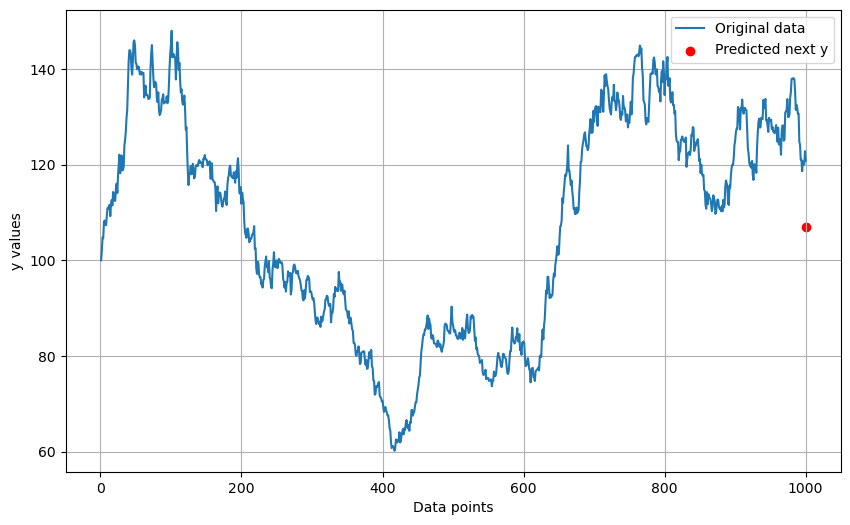

In [ ]:
import numpy as np
import matplotlib.pyplot as plt


def Generate_Prices(start_price, Volatility, Direction_Bias, num_days):
    import random
    prices = [start_price]
    changes = [0]
    for i in range(num_days-1):
        Var = random.uniform(-1, 1)*random.uniform(0, 1)*Volatility
        price = prices[-1] *(1 + Var + Direction_Bias)
        prices.append(price)
        changes.append(prices[-1] / prices[i-1] - 1)
    return prices, changes

start_price = 100
Volatility = 0.05
Direction_Bias = 0.0001
num_days = 1000
prices, changes = Generate_Prices(start_price, Volatility, Direction_Bias, num_days)

x = np.arange(1, len(prices) + 1)
y = prices

def PREDICT_LSTM(x, y, look_back, ITERATION):
    from keras.models import Sequential
    from keras.layers import LSTM, Dense
    # Prepare data for LSTM
    trainX, trainY = [], []
    for i in range(len(x) - look_back):
        trainX.append(x[i:i + look_back])
        trainY.append(y[i + look_back])

    trainX, trainY = np.array(trainX), np.array(trainY)

    # Build the LSTM model
    model = Sequential()
    model.add(LSTM(4, input_shape=(look_back, 1)))
    model.add(Dense(1))
    model.compile(loss='mean_squared_error', optimizer='adam')
    model.fit(trainX, trainY, epochs=ITERATION, batch_size=1, verbose=2)

    # Predict the next 'y' value
    next_x = np.array(x[-look_back:]).reshape(1, look_back, 1)
    predicted_y = model.predict(next_x)
    return predicted_y

predicted_y = PREDICT_LSTM(x, y, look_back=50, ITERATION = 200)
# Plot the results
plt.figure(figsize=(10, 6))
plt.plot(x, y, label='Original data')
plt.scatter(len(x), predicted_y, color='red', marker='o', label='Predicted next y')
plt.xlabel('Data points')
plt.ylabel('y values')
plt.legend()
plt.grid()
plt.show()
